In [2]:
!pip install gensim

You should consider upgrading via the '/opt/anaconda3/bin/python3 -m pip install --upgrade pip' command.


In [3]:
## for data
import json
import pandas as pd
import numpy as np
from sklearn import metrics, manifold
## for processing
import re
import nltk
## for plotting
import matplotlib.pyplot as plt
import seaborn as sns
## for w2v
import gensim
import gensim.downloader as gensim_api
## for bert
import transformers

In [ ]:
dtf = pd.read_csv("jobtitles_all.csv")
dtf     # with this commereand you can see your file


here we used dataset O*NET to test the accuracy since the dataset jobtitles_all.csv was unlabeled.

In [49]:
data_onet = pd.read_csv("onet1.csv")
data_onet     # with this command you can see your file

,title,label,dept
0,Chief Executives,0,"Management, Business, and Financial"
1,Chief Sustainability Officers,0,"Management, Business, and Financial"
2,General and Operations Managers,0,"Management, Business, and Financial"
3,Legislators,0,"Management, Business, and Financial"
4,Advertising and Promotions Managers,0,"Management, Business, and Financial"
...,...,...,...
53588,Tactical Debriefer,12,Military
53589,Tactical/Mobile (Tacmobile) Ashore Analysis Sy...,12,Military
53590,Target Aircraft Technician,12,Military
53591,Technical Surveillance Countermeasures (TSCM) ...,12,Military


In [52]:
dt0 = data_onet.loc[data_onet['dept'] == 'Management, Business, and Financial'][:650]
dt1 = data_onet.loc[data_onet['dept'] == 'Computer, Engineering, and Science'][:650]
dt2 = data_onet.loc[data_onet['dept'] == 'Education, Legal, Community Service, Arts, and Media'][:650]
dt3 = data_onet.loc[data_onet['dept'] == 'Health care Practitioners and Technical'][:650]
dt4 = data_onet.loc[data_onet['dept'] == 'Service'][:650]
dt5 = data_onet.loc[data_onet['dept'] == 'Sales and Related'][:650]
dt6 = data_onet.loc[data_onet['dept'] == 'Office and Administrative Support'][:650]
dt7 = data_onet.loc[data_onet['dept'] == 'Farming, fishing, and Forestry'][:650]
dt8 = data_onet.loc[data_onet['dept'] == 'Construction and Extraction'][:650]
dt9 = data_onet.loc[data_onet['dept'] == 'Installation, Maintenance, and Repair'][:650]
dt10 = data_onet.loc[data_onet['dept'] == 'Production'][:650]
dt11 = data_onet.loc[data_onet['dept'] == 'Transportation and Material Moving'][:650]
dt12 = data_onet.loc[data_onet['dept'] == 'Military'][:650]

In [51]:
data_onet["job_clean"] = data_onet["title"].apply(lambda x: 
          utils_preprocess_text(x, flg_stemm=False, flg_lemm=True, 
          lst_stopwords=lst_stopwords))
data_onet.head()

,title,label,dept,job_clean
0,Chief Executives,0,"Management, Business, and Financial",chief executive
1,Chief Sustainability Officers,0,"Management, Business, and Financial",chief sustainability officer
2,General and Operations Managers,0,"Management, Business, and Financial",general operation manager
3,Legislators,0,"Management, Business, and Financial",legislator
4,Advertising and Promotions Managers,0,"Management, Business, and Financial",advertising promotion manager


In [53]:
frames = [dt0, dt1, dt2, dt3, dt4, dt5, dt6, dt7, dt8, dt9, dt10, dt11, dt12]
data_onet = pd.concat(frames)
data_onet

,title,label,dept,job_clean
0,Chief Executives,0,"Management, Business, and Financial",chief executive
1,Chief Sustainability Officers,0,"Management, Business, and Financial",chief sustainability officer
2,General and Operations Managers,0,"Management, Business, and Financial",general operation manager
3,Legislators,0,"Management, Business, and Financial",legislator
4,Advertising and Promotions Managers,0,"Management, Business, and Financial",advertising promotion manager
...,...,...,...,...
53587,Subsurface Augmentee Operator,12,Military,subsurface augmentee operator
53588,Tactical Debriefer,12,Military,tactical debriefer
53589,Tactical/Mobile (Tacmobile) Ashore Analysis Sy...,12,Military,tacticalmobile tacmobile ashore analysis syste...
53590,Target Aircraft Technician,12,Military,target aircraft technician


List vocab BERT was loaded. Because we want to filter the dataset based onn BERT vocab list. 

In [13]:
vocab_bert = set(line.strip() for line in open('bert-base-uncased-vocab.txt'))

In [14]:
lst_stopwords = nltk.corpus.stopwords.words("english")
lst_stopwords

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [50]:
def utils_preprocess_text(text, flg_stemm=False, flg_lemm=True, lst_stopwords=None):
    ## clean (convert to lowercase and remove punctuations and characters and then strip
    text = re.sub(r'[^\w\s]', '', str(text).lower().strip())
            
    ## Tokenize (convert from string to list)
    lst_text = text.split()  
    
    #remove number
    lst_text = [word for word in lst_text if word.isdigit() is False]
    
    ## remove Stopwords
    if lst_stopwords is not None:
        lst_text = [word for word in lst_text if word not in 
                    lst_stopwords]
                
    ## Stemming (remove -ing, -ly, ...)
    if flg_stemm == True:
        ps = nltk.stem.porter.PorterStemmer()
        lst_text = [ps.stem(word) for word in lst_text]
                
    ## Lemmatisation (convert the word into root word)
    if flg_lemm == True:
        lem = nltk.stem.wordnet.WordNetLemmatizer()
        lst_text = [lem.lemmatize(word) for word in lst_text]
    
    #remove word not available on vocab bert list
    #lst_text = [word for word in lst_text if word in vocab_bert]
    
    ## back to string from list
    text = " ".join(lst_text)
    return text

In [16]:
dtf["job_clean"] = dtf["job_title"].apply(lambda x: 
          utils_preprocess_text(x, flg_stemm=False, flg_lemm=True, 
          lst_stopwords=lst_stopwords))


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [17]:
dtf = dtf[dtf.job_clean != '']

In [27]:
dtf.to_csv('jobtitles_all_clean.csv')

In [19]:
nlp = gensim_api.load("glove-wiki-gigaword-300")

we set the cluster based on SOC-2018 classification. Then we add some keywords related to every cluster.

In [20]:
## Function to apply
def get_similar_words(lst_words, top, nlp):
    lst_out = lst_words
    for tupla in nlp.most_similar(lst_words, topn=top):
        lst_out.append(tupla[0])
    return list(set(lst_out))
## Create Dictionary {category:[keywords]}
dic_clusters = {}

dic_clusters["Management, Business, and Financial"] = get_similar_words(['chief','manager','management','business','finance','executive','director','logistic','fund','merchant','budget','credit','insurance','loan','tax','fraud','financial','supervisor','superintendent','marketing'], top=30, nlp=nlp)
dic_clusters["Computer, Engineering, and Science"] = get_similar_words(['computer','engineer','science','data','software','web','game','information','mathematic','statistic','biology','geodetic','chemical','researcher','robotic','tester','analyst','digital','intelligence','electric','industrial','geological','mining','mechanical','energy','drafter','techno','physic','sociologist','psychologist','economist','network','program','desktop','server','code','java','android','ios','internet','application','user'], top=30, nlp=nlp)
dic_clusters["Education, Legal, Community Service, Arts, and Media"] = get_similar_words(['education','legal','community','service','art','media','paralegal','judges','law','lawyer','teacher','politic','music','drama','tutor','design','actor','dancer','audio','photographer'], top=30, nlp=nlp)
dic_clusters["Health care Practitioners and Technical"] = get_similar_words(['care','health','doctor','counselor','mental','therapist','dentist','pharmacist','nurse','hospital','vet','patient','medicine','rehabilitation'], top=30, nlp=nlp)
dic_clusters["Service"] = get_similar_words(['assistant','aide','technician','care','worker','health','attendant','certified','medical','therapist','supervisor','service','home','therapy','specialist','patient','occupational','officer','nursing','physical'], top=30, nlp=nlp)
dic_clusters["Sales and Related"] = get_similar_words(['sale','clerk','salesperson','representative','supervisor','manager','cashier','agent','part','rental','trader','consultant','service','insurance','specialist','counter','retail','store','department','associate'],top=30, nlp=nlp)
dic_clusters["Office and Administrative Support"] = get_similar_words(['office','administrative','admin','clerk'], top=30, nlp=nlp)
dic_clusters["Farming, fishing, and Forestry"] = get_similar_words(['farm','fish','forest','fruit','crop','agriculture','field','animal','picker','cutter','dairy','fish','harvest','animal','seed','tree','vegetable','food','inspector','plant','grader','irrigation'], top=30, nlp=nlp)
dic_clusters["Construction and Extraction"] = get_similar_words(['builder','layer','wood','floor','construction','architecture','civil','building', 'glass', 'ceramic','concrete','carpenter','brick','cement','driller'], top=30, nlp=nlp)
dic_clusters["Installation, Maintenance, and Repair"] = get_similar_words(['install','maintenance','repair','technician','mechanic','machine','equipment','instrument','service','electrical'], top=30, nlp=nlp)
dic_clusters["Production"] = get_similar_words(['supervisor','operator','machine','tender','assembly','plant','metal','setter','department','processing','plastic','worker','production','room','mill','shop','finishing','house','fabrication','pipe'],top=30, nlp=nlp)
dic_clusters["Transportation and Material Moving"] = get_similar_words(['transportation','pilot','aircraft','vehicle','tractor','driver','taxi','railroad','ship','truck','flight','route'],  top=30, nlp=nlp)
dic_clusters["Military"] = get_similar_words(['officer','operation','intelligence','system','control','technician','operator','air','specialist','warfare','weapon','aoc','missile','special','tactical','naval','artillery','combat','chief','staff'],top=30, nlp=nlp)


## print some
for k,v in dic_clusters.items():
    print(k, ": ", v[0:5], "...", len(v))

Management, Business, and Financial :  ['loan', 'funds', 'executive', 'superintendent', 'supervisor'] ... 50
Computer, Engineering, and Science :  ['scientific', 'researcher', 'applications', 'network', 'sociologist'] ... 72
Education, Legal, Community Service, Arts, and Media :  ['legal', 'student', 'audio', 'community', 'paralegal'] ... 50
Health care Practitioners and Technical :  ['mental', 'therapist', 'sick', 'patient', 'doctor'] ... 44
Service :  ['physical', 'mental', 'specialist', 'therapist', 'supervisor'] ... 50
Sales and Related :  ['specialist', 'worked', 'supervisor', 'hired', 'agency'] ... 50
Office and Administrative Support :  ['legislative', 'superintendent', 'supervisor', 'postmaster', 'staff'] ... 34
Farming, fishing, and Forestry :  ['produce', 'animals', 'cutter', 'seed', 'forest'] ... 50
Construction and Extraction :  ['built', 'facade', 'architectural', 'walls', 'design'] ... 45
Installation, Maintenance, and Repair :  ['installed', 'equipment', 'engineers', 'en

Here is to show cluster diagram based on keywords

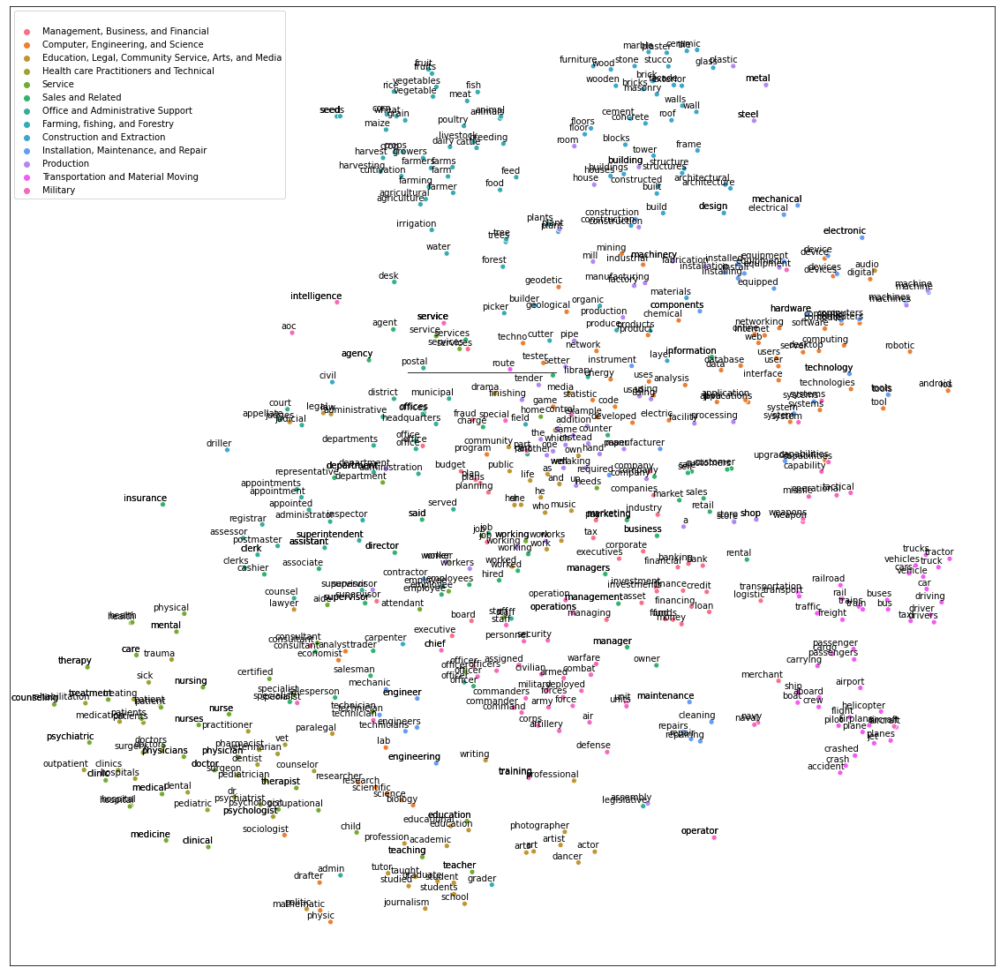

In [21]:
## word embedding
tot_words = [word for v in dic_clusters.values() for word in v]
X = nlp[tot_words]
        
## pca
pca = manifold.TSNE(perplexity=40, n_components=2, init='pca')
X = pca.fit_transform(X)

## create dtf
df = pd.DataFrame()
for k,v in dic_clusters.items():
    size = len(df) + len(v)
    df_group = pd.DataFrame(X[len(df):size], columns=["x","y"], 
                             index=v)
    df_group["cluster"] = k
    df = df.append(df_group)
        
## plot
a4_dims = (20, 20)
fig, ax = plt.subplots(figsize=a4_dims)
sns.scatterplot(data=df, x="x", y="y", hue="cluster", ax=ax)
ax.legend().texts[0].set_text(None)
ax.set(xlabel=None, ylabel=None, xticks=[], xticklabels=[], 
       yticks=[], yticklabels=[])
for i in range(len(df)):
    ax.annotate(df.index[i], 
               xy=(df["x"].iloc[i],df["y"].iloc[i]), 
               xytext=(5,2), textcoords='offset points', 
               ha='right', va='bottom')

In [22]:
tokenizer = transformers.BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)
nlp_bert = transformers.TFBertModel.from_pretrained('bert-base-uncased')

In [ ]:
## function to apply
def utils_bert_embedding(txt, tokenizer, nlp):
    idx = tokenizer.encode(txt,max_length=10)
    print(txt)
    print(idx)
    idx = np.array(idx)[None,:]  
    embedding = nlp(idx)
    X = np.array(embedding[0][0][1:-1])
    return X

convert text to BERT embedding
Dataset from LeadBook

In [23]:
## create list of news vector
lst_mean_vecs = [utils_bert_embedding(txt, tokenizer, nlp_bert).mean(0) for txt in dtf['job_clean']]
## create the feature matrix (n news x 768)
X = np.array(lst_mean_vecs)

art
[101, 2396, 102]
interior architect
[101, 4592, 4944, 102]
supervisor call centre
[101, 12366, 2655, 2803, 102]
tv host
[101, 2694, 3677, 102]
senior fuel trader
[101, 3026, 4762, 17667, 102]
director global operation program management office
[101, 2472, 3795, 3169, 2565, 2968, 2436, 102]
operation executive
[101, 3169, 3237, 102]
executive assistant manager sale marketing service
[101, 3237, 3353, 3208, 5096, 5821, 2326, 102]
professional tennis coach
[101, 2658, 5093, 2873, 102]
business
[101, 2449, 102]
senior credit analyst
[101, 3026, 4923, 12941, 102]
product
[101, 4031, 102]
supervising senior engineer
[101, 21238, 3026, 3992, 102]
marketing operation manager
[101, 5821, 3169, 3208, 102]
diploma mass communication student
[101, 9827, 3742, 4807, 3076, 102]
freelance editor writer
[101, 15919, 3559, 3213, 102]
supply oceania
[101, 4425, 20526, 102]
lead commissioning engineer
[101, 2599, 21612, 3992, 102]
casino audit senior officer
[101, 9270, 15727, 3026, 2961, 102]
sl man

senior vice president finance
[101, 3026, 3580, 2343, 5446, 102]
inspector
[101, 7742, 102]
campaign service manager regional
[101, 3049, 2326, 3208, 3164, 102]
senior cloud operation engineer
[101, 3026, 6112, 3169, 3992, 102]
brand
[101, 4435, 102]
director
[101, 2472, 102]
property investor
[101, 3200, 14316, 102]
finance manager asia
[101, 5446, 3208, 4021, 102]
creative executive
[101, 5541, 3237, 102]
human resource specialist
[101, 2529, 7692, 8325, 102]
pc ramp developer
[101, 7473, 13276, 9722, 102]
senior system administrator
[101, 3026, 2291, 8911, 102]
specialist client data management analyst
[101, 8325, 7396, 2951, 2968, 12941, 102]
director business continuity
[101, 2472, 2449, 13717, 102]
sh coordinator
[101, 14021, 10669, 102]
associate partner director
[101, 5482, 4256, 2472, 102]
production proto type component
[101, 2537, 15053, 2828, 6922, 102]
solution specialist
[101, 5576, 8325, 102]
rate
[101, 3446, 102]
engineering quality manager
[101, 3330, 3737, 3208, 102]


db
[101, 16962, 102]
coordinator
[101, 10669, 102]
accounting administrator
[101, 9529, 8911, 102]
global director infrastructure information security
[101, 3795, 2472, 6502, 2592, 3036, 102]
marketing operation support executive
[101, 5821, 3169, 2490, 3237, 102]
tiny
[101, 4714, 102]
shipping assistance
[101, 7829, 5375, 102]
senior hr executive compensation
[101, 3026, 17850, 3237, 9430, 102]
member technical staff td device
[101, 2266, 4087, 3095, 14595, 5080, 102]
private security training consultant
[101, 2797, 3036, 2731, 8930, 102]
worldwide technical service center manager
[101, 4969, 4087, 2326, 2415, 3208, 102]
customer experience specialist
[101, 8013, 3325, 8325, 102]
project manager implementation consultant
[101, 2622, 3208, 7375, 8930, 102]
deputy commander
[101, 4112, 3474, 102]
general manager digital initiative africa asia pacific
[101, 2236, 3208, 3617, 6349, 3088, 4021, 3534, 102]
executive director product specialist
[101, 3237, 2472, 4031, 8325, 102]
service deli

engineer
[101, 3992, 102]
food safety team leader
[101, 2833, 3808, 2136, 3003, 102]
programme coordinator executive
[101, 4746, 10669, 3237, 102]
architect director
[101, 4944, 2472, 102]
trainer
[101, 10365, 102]
head private financing asia
[101, 2132, 2797, 12135, 4021, 102]
instructor
[101, 9450, 102]
asia pacific audio energy portfolio manager
[101, 4021, 3534, 5746, 2943, 11103, 3208, 102]
senior test engineer software
[101, 3026, 3231, 3992, 4007, 102]
chief talent officer singapore
[101, 2708, 5848, 2961, 5264, 102]
experienced proprietary trader crude oil
[101, 5281, 16350, 17667, 13587, 3514, 102]
customer support manager
[101, 8013, 2490, 3208, 102]
enterprise service division
[101, 6960, 2326, 2407, 102]
category manager information system group supply
[101, 4696, 3208, 2592, 2291, 2177, 4425, 102]
sale administration business reporting manager
[101, 5096, 3447, 2449, 7316, 3208, 102]
stem trainer
[101, 7872, 10365, 102]
client marketing director gm
[101, 7396, 5821, 2472, 

executive assistant managing director
[101, 3237, 3353, 6605, 2472, 102]
team manager accounting
[101, 2136, 3208, 9529, 102]
g suite renewal google cloud
[101, 1043, 7621, 14524, 8224, 6112, 102]
head corporate banking operation singapore
[101, 2132, 5971, 8169, 3169, 5264, 102]
senior associate global mobility service
[101, 3026, 5482, 3795, 12969, 2326, 102]
document assistant
[101, 6254, 3353, 102]
adult class hindi teacher
[101, 4639, 2465, 9269, 3836, 102]
technical development engineer
[101, 4087, 2458, 3992, 102]
strategic change analyst integrated supply trading
[101, 6143, 2689, 12941, 6377, 4425, 6202, 102]
freelance theatre
[101, 15919, 3004, 102]
director press
[101, 2472, 2811, 102]
mechanical technician commissioning
[101, 6228, 16661, 21612, 102]
regional director
[101, 3164, 2472, 102]
senior engineer premier service
[101, 3026, 3992, 4239, 2326, 102]
assistant operator support
[101, 3353, 6872, 2490, 102]
production controller
[101, 2537, 11486, 102]
food server n
[10

warehouse team leader
[101, 9746, 2136, 3003, 102]
documentation associate
[101, 12653, 5482, 102]
jan daily
[101, 5553, 3679, 102]
market integrity compliance
[101, 3006, 11109, 12646, 102]
regional marketing head asia pacific japan
[101, 3164, 5821, 2132, 4021, 3534, 2900, 102]
lead application developer
[101, 2599, 4646, 9722, 102]
regional finance manager
[101, 3164, 5446, 3208, 102]
elect project technician
[101, 11322, 2622, 16661, 102]
hr manager asia pacific
[101, 17850, 3208, 4021, 3534, 102]
e c
[101, 1041, 1039, 102]
consultant country manager
[101, 8930, 2406, 3208, 102]
export marketing
[101, 9167, 5821, 102]
group human resource
[101, 2177, 2529, 7692, 102]
corporate service manager
[101, 5971, 2326, 3208, 102]
screen guy
[101, 3898, 3124, 102]
company major national service
[101, 2194, 2350, 2120, 2326, 102]
supply chain logistics specialist ito international trade operation
[101, 4425, 4677, 12708, 8325, 23333, 2248, 3119, 3169, 102]
vp operation singapore operation sta

managing director south asia pacific head project management
[101, 6605, 2472, 2148, 4021, 3534, 2132, 2622, 2968, 102]
sale
[101, 5096, 102]
stock
[101, 4518, 102]
infrastructure executive
[101, 6502, 3237, 102]
team manager retail
[101, 2136, 3208, 7027, 102]
senior credit collection accountant
[101, 3026, 4923, 3074, 17907, 102]
quality program manager
[101, 3737, 2565, 3208, 102]
ict
[101, 25891, 102]
transaction processing specialist
[101, 12598, 6364, 8325, 102]
support
[101, 2490, 102]
equipment specialist
[101, 3941, 8325, 102]
senior information system executive
[101, 3026, 2592, 2291, 3237, 102]
director commercial management
[101, 2472, 3293, 2968, 102]
district division director
[101, 2212, 2407, 2472, 102]
vp head ap client marketing
[101, 21210, 2132, 9706, 7396, 5821, 102]
principal technical executive
[101, 4054, 4087, 3237, 102]
officer
[101, 2961, 102]
founder fair go real estate transcription service australia
[101, 3910, 4189, 2175, 2613, 3776, 14193, 2326, 2660, 10

channel manager
[101, 3149, 3208, 102]
managing director china hong kong
[101, 6605, 2472, 2859, 4291, 4290, 102]
home loan
[101, 2188, 5414, 102]
party organizer
[101, 2283, 19012, 102]
spare part sale
[101, 8622, 2112, 5096, 102]
senior forensic data recovery specialist
[101, 3026, 15359, 2951, 7233, 8325, 102]
event executive
[101, 2724, 3237, 102]
director
[101, 2472, 102]
regional financial controller
[101, 3164, 3361, 11486, 102]
guardian host international student
[101, 6697, 3677, 2248, 3076, 102]
product manager product vendor management
[101, 4031, 3208, 4031, 21431, 2968, 102]
research associate
[101, 2470, 5482, 102]
gm maintenance
[101, 13938, 6032, 102]
advertising consultant cum creative designer
[101, 6475, 8930, 13988, 5541, 5859, 102]
senior regional manager head tablet mobile business marketing
[101, 3026, 3164, 3208, 2132, 13855, 4684, 2449, 5821, 102]
design lead
[101, 2640, 2599, 102]
pastry cook
[101, 27060, 5660, 102]
interim manager finance change
[101, 9455, 3

vice president finance operation global travel retail
[101, 3580, 2343, 5446, 3169, 3795, 3604, 7027, 102]
vice president
[101, 3580, 2343, 102]
director placement south asia
[101, 2472, 11073, 2148, 4021, 102]
business data reporting analyst
[101, 2449, 2951, 7316, 12941, 102]
manager support
[101, 3208, 2490, 102]
construction supervisor civil
[101, 2810, 12366, 2942, 102]
hr deputy manager
[101, 17850, 4112, 3208, 102]
sr specialist
[101, 5034, 8325, 102]
senior coordinator post
[101, 3026, 10669, 2695, 102]
manufacturing
[101, 5814, 102]
ceo asia
[101, 5766, 4021, 102]
audit senior assurance
[101, 15727, 3026, 16375, 102]
camp superintendent
[101, 3409, 9133, 102]
lead engineer
[101, 2599, 3992, 102]
operation product planning manager
[101, 3169, 4031, 4041, 3208, 102]
senior manager singapore terminal planning department
[101, 3026, 3208, 5264, 5536, 4041, 2533, 102]
client executive
[101, 7396, 3237, 102]
senior engineer product development
[101, 3026, 3992, 4031, 2458, 102]
logi

assistant director online learning infrastructure
[101, 3353, 2472, 3784, 4083, 6502, 102]
manager metal
[101, 3208, 3384, 102]
analyst programmer
[101, 12941, 20273, 102]
field service engineer distributor territory
[101, 2492, 2326, 3992, 16632, 3700, 102]
assistant travel designer marketing operation
[101, 3353, 3604, 5859, 5821, 3169, 102]
asset servicing
[101, 11412, 26804, 102]
assistant manager corporate banking
[101, 3353, 3208, 5971, 8169, 102]
deputy general counsel deputy director
[101, 4112, 2236, 9517, 4112, 2472, 102]
telecommunication
[101, 25958, 102]
designer
[101, 5859, 102]
senior project
[101, 3026, 2622, 102]
practice associate trainee
[101, 3218, 5482, 26758, 102]
photo enthusiast
[101, 6302, 29550, 102]
assistant manager marine personnel
[101, 3353, 3208, 3884, 5073, 102]
corporate trainer developer
[101, 5971, 10365, 9722, 102]
head management
[101, 2132, 2968, 102]
quality regulatory compliance manager
[101, 3737, 10738, 12646, 3208, 102]
human capital manageme

processing officer
[101, 6364, 2961, 102]
executive business information system sap
[101, 3237, 2449, 2592, 2291, 20066, 102]
maintenance manager
[101, 6032, 3208, 102]
head chef
[101, 2132, 10026, 102]
senior product specialist
[101, 3026, 4031, 8325, 102]
public affair manager
[101, 2270, 6771, 3208, 102]
executive
[101, 3237, 102]
gym staff
[101, 9726, 3095, 102]
manager
[101, 3208, 102]
senior consultant human capital
[101, 3026, 8930, 2529, 3007, 102]
independent contractor
[101, 2981, 13666, 102]
executive chef
[101, 3237, 10026, 102]
painting supervisor cum inspector
[101, 4169, 12366, 13988, 7742, 102]
effect technical director
[101, 3466, 4087, 2472, 102]
space operation
[101, 2686, 3169, 102]
assistant marketing manager leasing
[101, 3353, 5821, 3208, 26707, 102]
project manager sap sap sd sap mm lead consultant
[101, 2622, 3208, 20066, 20066, 17371, 20066, 3461, 2599, 102]
head fx option asia
[101, 2132, 23292, 5724, 4021, 102]
sr solution architect
[101, 5034, 5576, 4944, 1

customer service representative cum purchasing
[101, 8013, 2326, 4387, 13988, 13131, 102]
testing supervisor
[101, 5604, 12366, 102]
image consultant
[101, 3746, 8930, 102]
mechanical electrical engineer
[101, 6228, 5992, 3992, 102]
general manager regional director
[101, 2236, 3208, 3164, 2472, 102]
sh citizenship ed
[101, 14021, 9068, 3968, 102]
executive general manager transformation business banking
[101, 3237, 2236, 3208, 8651, 2449, 8169, 102]
lecturer science
[101, 9162, 2671, 102]
lead engineer automation
[101, 2599, 3992, 19309, 102]
ceo asia pacific
[101, 5766, 4021, 3534, 102]
leader offshore platform asia pacific
[101, 3003, 12195, 4132, 4021, 3534, 102]
shanghai
[101, 8344, 102]
international supply chain standardization manager
[101, 2248, 4425, 4677, 28648, 3208, 102]
supplier operation support
[101, 17024, 3169, 2490, 102]
senior talent management manager asia pacific
[101, 3026, 5848, 2968, 3208, 4021, 3534, 102]
vocalist
[101, 8032, 102]
crew us
[101, 3626, 2149, 102

head project development office
[101, 2132, 2622, 2458, 2436, 102]
pre production manager production controller
[101, 3653, 2537, 3208, 2537, 11486, 102]
assistant rock climbing guide camp cook
[101, 3353, 2600, 8218, 5009, 3409, 5660, 102]
chief brand creative head
[101, 2708, 4435, 5541, 2132, 102]
managing director client service
[101, 6605, 2472, 7396, 2326, 102]
food beverage manager
[101, 2833, 19645, 3208, 102]
electrical instrumentation control designer
[101, 5992, 16015, 2491, 5859, 102]
vice president customer strategy
[101, 3580, 2343, 8013, 5656, 102]
senior programme planning
[101, 3026, 4746, 4041, 102]
sap analyst
[101, 20066, 12941, 102]
asia pacific retail category management vp retail division
[101, 4021, 3534, 7027, 4696, 2968, 21210, 7027, 2407, 102]
manager application service
[101, 3208, 4646, 2326, 102]
assistant manager marketing sea
[101, 3353, 3208, 5821, 2712, 102]
data engineer
[101, 2951, 3992, 102]
president college surgeon
[101, 2343, 2267, 9431, 102]
sta

freelance talent
[101, 15919, 5848, 102]
senior cardiac medical
[101, 3026, 15050, 2966, 102]
chairperson maritime study freshman orientation camp
[101, 19072, 7803, 2817, 10452, 10296, 3409, 102]
officer
[101, 2961, 102]
workforce manager
[101, 14877, 3208, 102]
product
[101, 4031, 102]
director gm
[101, 2472, 13938, 102]
digital marketing coach trainer
[101, 3617, 5821, 2873, 10365, 102]
customer coordinator
[101, 8013, 10669, 102]
international director leadership development
[101, 2248, 2472, 4105, 2458, 102]
global business analyst
[101, 3795, 2449, 12941, 102]
editor singapore
[101, 3559, 5264, 102]
head programme development quality assurance
[101, 2132, 4746, 2458, 3737, 16375, 102]
chief strategy operation officer
[101, 2708, 5656, 3169, 2961, 102]
regional head property asean south asia
[101, 3164, 2132, 3200, 27974, 2148, 4021, 102]
de
[101, 2139, 102]
ceo ara harmony fund iii strait investment partner
[101, 5766, 19027, 9396, 4636, 3523, 11195, 5211, 4256, 102]
principal me

senior officer
[101, 3026, 2961, 102]
secretary global financial market
[101, 3187, 3795, 3361, 3006, 102]
financial institution
[101, 3361, 5145, 102]
head affinity asia
[101, 2132, 16730, 4021, 102]
secondary teacher science
[101, 3905, 3836, 2671, 102]
regional sale distribution insurance
[101, 3164, 5096, 4353, 5427, 102]
global travel retail finance manager
[101, 3795, 3604, 7027, 5446, 3208, 102]
specialist satellite communication
[101, 8325, 5871, 4807, 102]
technology
[101, 2974, 102]
research fellow functional material device
[101, 2470, 3507, 8360, 3430, 5080, 102]
conference technician
[101, 3034, 16661, 102]
airline operation
[101, 8582, 3169, 102]
manager logistics
[101, 3208, 12708, 102]
general manager director
[101, 2236, 3208, 2472, 102]
section leader system engineering
[101, 2930, 3003, 2291, 3330, 102]
ac assistant
[101, 9353, 3353, 102]
vp information technology
[101, 21210, 2592, 2974, 102]
global head compensation benefit regional hr head
[101, 3795, 2132, 9430, 

marine
[101, 3884, 102]
client finance manager
[101, 7396, 5446, 3208, 102]
dental
[101, 11394, 102]
teacher
[101, 3836, 102]
incorporation department
[101, 16935, 2533, 102]
head group wb technology finance
[101, 2132, 2177, 25610, 2974, 5446, 102]
choral orchestra conductor pianist singer
[101, 14564, 4032, 7589, 9066, 3220, 102]
sad
[101, 6517, 102]
service desk analyst
[101, 2326, 4624, 12941, 102]
manager product management
[101, 3208, 4031, 2968, 102]
foundry
[101, 19853, 102]
lab
[101, 6845, 102]
vp financial advisory
[101, 21210, 3361, 7319, 102]
buyer
[101, 17634, 102]
asia pacific south east asia sale director
[101, 4021, 3534, 2148, 2264, 4021, 5096, 2472, 102]
manager social work education
[101, 3208, 2591, 2147, 2495, 102]
senior consultant chief department general forensic psychiatry
[101, 3026, 8930, 2708, 2533, 2236, 15359, 18420, 102]
ceo consumer insight hispanic
[101, 5766, 7325, 12369, 6696, 102]
support service manager
[101, 2490, 2326, 3208, 102]
commissioning man

officer project control
[101, 2961, 2622, 2491, 102]
carrier buying manager
[101, 6839, 9343, 3208, 102]
finance contract manager
[101, 5446, 3206, 3208, 102]
senior business development manager japan desk asean
[101, 3026, 2449, 2458, 3208, 2900, 4624, 27974, 102]
supervisor project accounting
[101, 12366, 2622, 9529, 102]
process principle engineer
[101, 2832, 6958, 3992, 102]
technical manager container
[101, 4087, 3208, 11661, 102]
data quality analyst
[101, 2951, 3737, 12941, 102]
vp strategy project
[101, 21210, 5656, 2622, 102]
asia data manager
[101, 4021, 2951, 3208, 102]
vp sale
[101, 21210, 5096, 102]
enrolled nurse
[101, 8302, 6821, 102]
senior sale specialist azure big data analytics machine learning
[101, 3026, 5096, 8325, 24296, 2502, 2951, 25095, 3698, 102]
strategic advisor sale business channel development
[101, 6143, 8619, 5096, 2449, 3149, 2458, 102]
project charge
[101, 2622, 3715, 102]
discipline staff
[101, 9009, 3095, 102]
franchise manager pr visual
[101, 6329,

charles b international affair graduate fellow
[101, 2798, 1038, 2248, 6771, 4619, 3507, 102]
executive
[101, 3237, 102]
system
[101, 2291, 102]
director audit assurance
[101, 2472, 15727, 16375, 102]
community engagement manager
[101, 2451, 8147, 3208, 102]
trainer
[101, 10365, 102]
regional sale service director asia pacific
[101, 3164, 5096, 2326, 2472, 4021, 3534, 102]
project broadcast manager
[101, 2622, 3743, 3208, 102]
assistant vice president head dining travel
[101, 3353, 3580, 2343, 2132, 7759, 3604, 102]
manager career service
[101, 3208, 2476, 2326, 102]
fixed income trader
[101, 4964, 3318, 17667, 102]
senior data center engineer
[101, 3026, 2951, 2415, 3992, 102]
sr system engineer
[101, 5034, 2291, 3992, 102]
head certificate program
[101, 2132, 8196, 2565, 102]
sale manager mt
[101, 5096, 3208, 11047, 102]
pr brand consultant
[101, 10975, 4435, 8930, 102]
business operation development associate
[101, 2449, 3169, 2458, 5482, 102]
china cooperation programme
[101, 2859,

chief motivation officer
[101, 2708, 14354, 2961, 102]
ac manager
[101, 9353, 3208, 102]
bunker future trader
[101, 15742, 2925, 17667, 102]
senior q manager
[101, 3026, 1053, 3208, 102]
reporter
[101, 6398, 102]
senior officer service manager
[101, 3026, 2961, 2326, 3208, 102]
senior payroll specialist
[101, 3026, 26854, 8325, 102]
senior sale director channel sale division
[101, 3026, 5096, 2472, 3149, 5096, 2407, 102]
proctor
[101, 28770, 102]
business development manager principal planner
[101, 2449, 2458, 3208, 4054, 24555, 102]
statutory financial system lead transformation program office
[101, 15201, 3361, 2291, 2599, 8651, 2565, 2436, 102]
promotion
[101, 4712, 102]
fx sale analyst
[101, 23292, 5096, 12941, 102]
senior new product development leader
[101, 3026, 2047, 4031, 2458, 3003, 102]
director local
[101, 2472, 2334, 102]
partner deputy chairman executive board
[101, 4256, 4112, 3472, 3237, 2604, 102]
sale commercial engineer
[101, 5096, 3293, 3992, 102]
sr director sale d

general manager corporate affair
[101, 2236, 3208, 5971, 6771, 102]
manager project management office
[101, 3208, 2622, 2968, 2436, 102]
senior officer internal audit investigation
[101, 3026, 2961, 4722, 15727, 4812, 102]
publishing editor acquisition
[101, 4640, 3559, 7654, 102]
head regional marketing south asia
[101, 2132, 3164, 5821, 2148, 4021, 102]
system programmer
[101, 2291, 20273, 102]
internship chef
[101, 22676, 10026, 102]
safety health environment coordinator
[101, 3808, 2740, 4044, 10669, 102]
badminton product specialist
[101, 14618, 4031, 8325, 102]
test reliability
[101, 3231, 15258, 102]
medium
[101, 5396, 102]
marketing communication assistant manager
[101, 5821, 4807, 3353, 3208, 102]
completion tool country manager
[101, 6503, 6994, 2406, 3208, 102]
vp property
[101, 21210, 3200, 102]
editor cum research assistant
[101, 3559, 13988, 2470, 3353, 102]
section lead procurement senior procurement engineer procurement engineer
[101, 2930, 2599, 21423, 3026, 21423, 399

associate manager client engagement
[101, 5482, 3208, 7396, 8147, 102]
tire international trade
[101, 12824, 2248, 3119, 102]
material management leader
[101, 3430, 2968, 3003, 102]
head enterprise content management
[101, 2132, 6960, 4180, 2968, 102]
senior head operation manager
[101, 3026, 2132, 3169, 3208, 102]
solution analyst
[101, 5576, 12941, 102]
portfolio manager offshore banking
[101, 11103, 3208, 12195, 8169, 102]
senior engineer td process integration
[101, 3026, 3992, 14595, 2832, 8346, 102]
vice president vp
[101, 3580, 2343, 21210, 102]
partner business development project management
[101, 4256, 2449, 2458, 2622, 2968, 102]
senior structural engineer
[101, 3026, 8332, 3992, 102]
manager project
[101, 3208, 2622, 102]
instrument inspector
[101, 6602, 7742, 102]
senior project director os
[101, 3026, 2622, 2472, 9808, 102]
site system engineer
[101, 2609, 2291, 3992, 102]
database team lead
[101, 7809, 2136, 2599, 102]
associate structured lending
[101, 5482, 14336, 18435

engineer
[101, 3992, 102]
executive director risk management
[101, 3237, 2472, 3891, 2968, 102]
customer executive
[101, 8013, 3237, 102]
solution design manager
[101, 5576, 2640, 3208, 102]
nursing
[101, 8329, 102]
senior assistant financial controller
[101, 3026, 3353, 3361, 11486, 102]
head strategic investment
[101, 2132, 6143, 5211, 102]
network business development product strategy
[101, 2897, 2449, 2458, 4031, 5656, 102]
risk assurance
[101, 3891, 16375, 102]
associate microsoft office trainer training consultant
[101, 5482, 7513, 2436, 10365, 2731, 8930, 102]
accounting coordinator
[101, 9529, 10669, 102]
field technical support consultant
[101, 2492, 4087, 2490, 8930, 102]
senior
[101, 3026, 102]
facility coordinator system
[101, 4322, 10669, 2291, 102]
deputy regional director asia pacific trading
[101, 4112, 3164, 2472, 4021, 3534, 6202, 102]
director clinical operation
[101, 2472, 6612, 3169, 102]
project manager
[101, 2622, 3208, 102]
associate hr practice recruitment asia

customer service executive project management
[101, 8013, 2326, 3237, 2622, 2968, 102]
specification manager
[101, 12827, 3208, 102]
senior licensed aircraft maintenance engineer
[101, 3026, 7000, 2948, 6032, 3992, 102]
mechanical engineer
[101, 6228, 3992, 102]
officer
[101, 2961, 102]
content writer interpreter
[101, 4180, 3213, 19555, 102]
senior technical artist
[101, 3026, 4087, 3063, 102]
facade pm
[101, 8508, 7610, 102]
sw eng
[101, 25430, 25540, 102]
curator director
[101, 13023, 2472, 102]
personal assistant managing director regional leader
[101, 3167, 3353, 6605, 2472, 3164, 3003, 102]
corporate
[101, 5971, 102]
centre
[101, 2803, 102]
senior executive
[101, 3026, 3237, 102]
vp business development
[101, 21210, 2449, 2458, 102]
senior category manager
[101, 3026, 4696, 3208, 102]
client relationship
[101, 7396, 3276, 102]
design engineering intern aircraft structure interior
[101, 2640, 3330, 25204, 2948, 3252, 4592, 102]
limousine sale ops
[101, 28012, 5096, 23092, 102]
sen

director infrastructure service
[101, 2472, 6502, 2326, 102]
assistant director payroll moe hr payroll office
[101, 3353, 2472, 26854, 22078, 17850, 26854, 2436, 102]
founding partner managing director
[101, 4889, 4256, 6605, 2472, 102]
consultant
[101, 8930, 102]
associate risk consulting
[101, 5482, 3891, 10552, 102]
assurance advisory team audit executive
[101, 16375, 7319, 2136, 15727, 3237, 102]
senior tender analyst
[101, 3026, 8616, 12941, 102]
director safety
[101, 2472, 3808, 102]
se
[101, 7367, 102]
executive assistant
[101, 3237, 3353, 102]
aquatic safety lead specialist
[101, 13582, 3808, 2599, 8325, 102]
senior marketing manager emerging affluent market consumer banking group
[101, 3026, 5821, 3208, 8361, 22666, 3006, 7325, 8169, 102]
client service manager
[101, 7396, 2326, 3208, 102]
operation profit consultant
[101, 3169, 5618, 8930, 102]
talent acquisition campus strategy
[101, 5848, 7654, 3721, 5656, 102]
business development
[101, 2449, 2458, 102]
private bank credit

facebook account administrator
[101, 9130, 4070, 8911, 102]
c developer
[101, 1039, 9722, 102]
language instructor
[101, 2653, 9450, 102]
sale
[101, 5096, 102]
director head fund administration middle office operation
[101, 2472, 2132, 4636, 3447, 2690, 2436, 3169, 102]
ceo creator
[101, 5766, 8543, 102]
project engineer manufacturing development
[101, 2622, 3992, 5814, 2458, 102]
tissue coordinator
[101, 8153, 10669, 102]
senior finance manager asia finance integration leader
[101, 3026, 5446, 3208, 4021, 5446, 8346, 3003, 102]
audit director asia
[101, 15727, 2472, 4021, 102]
risk management director
[101, 3891, 2968, 2472, 102]
senior online store manager
[101, 3026, 3784, 3573, 3208, 102]
digital lead
[101, 3617, 2599, 102]
executive relation area manager
[101, 3237, 7189, 2181, 3208, 102]
vp network programming promotion
[101, 21210, 2897, 4730, 4712, 102]
global vendor manager
[101, 3795, 21431, 3208, 102]
senior vice president global online investment product
[101, 3026, 3580, 2

general education officer
[101, 2236, 2495, 2961, 102]
executive director global lead corporate investment bank compliance testing
[101, 3237, 2472, 3795, 2599, 5971, 5211, 2924, 12646, 102]
portfolio manager
[101, 11103, 3208, 102]
sustainability
[101, 15169, 102]
senior accountant group consolidation
[101, 3026, 17907, 2177, 17439, 102]
sport programme executive
[101, 4368, 4746, 3237, 102]
manager security
[101, 3208, 3036, 102]
management
[101, 2968, 102]
ui product designer project
[101, 21318, 4031, 5859, 2622, 102]
debt collection
[101, 7016, 3074, 102]
team lead loan operation
[101, 2136, 2599, 5414, 3169, 102]
head ops
[101, 2132, 23092, 102]
operation manager construction procurement division
[101, 3169, 3208, 2810, 21423, 2407, 102]
senior
[101, 3026, 102]
head office
[101, 2132, 2436, 102]
commodity risk manager
[101, 19502, 3891, 3208, 102]
derrick supervisor national
[101, 18928, 12366, 2120, 102]
senior pricing manager
[101, 3026, 20874, 3208, 102]
application
[101, 4646

material
[101, 3430, 102]
business committee conference project manager
[101, 2449, 2837, 3034, 2622, 3208, 102]
manager learning talent development
[101, 3208, 4083, 5848, 2458, 102]
beauty
[101, 5053, 102]
structured product middle office
[101, 14336, 4031, 2690, 2436, 102]
director technology change management
[101, 2472, 2974, 2689, 2968, 102]
senior manager institutional business
[101, 3026, 3208, 12148, 2449, 102]
project design
[101, 2622, 2640, 102]
creative bin
[101, 5541, 8026, 102]
base oil business development manager
[101, 2918, 3514, 2449, 2458, 3208, 102]
senior brand advisor
[101, 3026, 4435, 8619, 102]
senior officer psychologist
[101, 3026, 2961, 15034, 102]
department manager hull
[101, 2533, 3208, 6738, 102]
senior marketing coordinator
[101, 3026, 5821, 10669, 102]
director channel sale marketing
[101, 2472, 3149, 5096, 5821, 102]
program
[101, 2565, 102]
moving image creative
[101, 3048, 3746, 5541, 102]
transaction service intern
[101, 12598, 2326, 25204, 102]
ju

international research manager
[101, 2248, 2470, 3208, 102]
investment service officer
[101, 5211, 2326, 2961, 102]
infrastructure
[101, 6502, 102]
manager
[101, 3208, 102]
senior pe
[101, 3026, 21877, 102]
head economics research strategy
[101, 2132, 5543, 2470, 5656, 102]
marketing branding consultant
[101, 5821, 16140, 8930, 102]
assistant
[101, 3353, 102]
regional director business development
[101, 3164, 2472, 2449, 2458, 102]
assistant vice president regional self service banking
[101, 3353, 3580, 2343, 3164, 2969, 2326, 8169, 102]
freelance creative designer
[101, 15919, 5541, 5859, 102]
assistant vice president market risk
[101, 3353, 3580, 2343, 3006, 3891, 102]
project management
[101, 2622, 2968, 102]
campaign manager
[101, 3049, 3208, 102]
officer
[101, 2961, 102]
group reporting analyst
[101, 2177, 7316, 12941, 102]
cum logistics
[101, 13988, 12708, 102]
sustainability public affair manager singapore
[101, 15169, 2270, 6771, 3208, 5264, 102]
intern dish dash sg
[101, 25204

front office financial consultant
[101, 2392, 2436, 3361, 8930, 102]
md japan
[101, 9108, 2900, 102]
project coordinator cum
[101, 2622, 10669, 13988, 102]
audit assistance
[101, 15727, 5375, 102]
self employ
[101, 2969, 12666, 102]
general manager security
[101, 2236, 3208, 3036, 102]
senior manager branding marketing
[101, 3026, 3208, 16140, 5821, 102]
event manager
[101, 2724, 3208, 102]
manager
[101, 3208, 102]
vp commercial sale
[101, 21210, 3293, 5096, 102]
senior analyst strategic planning
[101, 3026, 12941, 6143, 4041, 102]
training hr
[101, 2731, 17850, 102]
general manager offshore
[101, 2236, 3208, 12195, 102]
senior manager south east asia group
[101, 3026, 3208, 2148, 2264, 4021, 2177, 102]
tax associate
[101, 4171, 5482, 102]
director ceo founder
[101, 2472, 5766, 3910, 102]
assistant local advantage manager
[101, 3353, 2334, 5056, 3208, 102]
special operating officer
[101, 2569, 4082, 2961, 102]
marketing program manager service business
[101, 5821, 2565, 3208, 2326, 244

director senior rate trader rate
[101, 2472, 3026, 3446, 17667, 3446, 102]
asia director healthcare
[101, 4021, 2472, 9871, 102]
technical design manager
[101, 4087, 2640, 3208, 102]
cyber security
[101, 16941, 3036, 102]
ceo asean pacific interim
[101, 5766, 27974, 3534, 9455, 102]
global sr brand manager
[101, 3795, 5034, 4435, 3208, 102]
senior
[101, 3026, 102]
eng service manager
[101, 25540, 2326, 3208, 102]
service marketing excellence
[101, 2326, 5821, 8012, 102]
registered agent
[101, 5068, 4005, 102]
regional communication consultant
[101, 3164, 4807, 8930, 102]
senior
[101, 3026, 102]
senior software
[101, 3026, 4007, 102]
event management modelling talent company
[101, 2724, 2968, 19518, 5848, 2194, 102]
director trade marketing
[101, 2472, 3119, 5821, 102]
senior program manager
[101, 3026, 2565, 3208, 102]
senior investment advisor
[101, 3026, 5211, 8619, 102]
portfolio launch manager
[101, 11103, 4888, 3208, 102]
group director learning talent development
[101, 2177, 2472

correction officer
[101, 18140, 2961, 102]
wealth executive advisor
[101, 7177, 3237, 8619, 102]
head capability development including programme management
[101, 2132, 10673, 2458, 2164, 4746, 2968, 102]
police
[101, 2610, 102]
speaker trainer
[101, 5882, 10365, 102]
vp corporate system governance
[101, 21210, 5971, 2291, 10615, 102]
math
[101, 8785, 102]
analyst hr background screening
[101, 12941, 17850, 4281, 11326, 102]
principal manufacturing engineer
[101, 4054, 5814, 3992, 102]
sap business system analyst
[101, 20066, 2449, 2291, 12941, 102]
general manager dept
[101, 2236, 3208, 29466, 102]
custom jewelry accessory
[101, 7661, 11912, 25339, 102]
event artist
[101, 2724, 3063, 102]
finance manager asia pac
[101, 5446, 3208, 4021, 14397, 102]
teacher
[101, 3836, 102]
business development private equity group
[101, 2449, 2458, 2797, 10067, 2177, 102]
supervisor visual welding inspector
[101, 12366, 5107, 23604, 7742, 102]
concert special project manager
[101, 4164, 2569, 2622, 320

labour officer
[101, 4428, 2961, 102]
head department
[101, 2132, 2533, 102]
account executive ap
[101, 4070, 3237, 9706, 102]
content creative editor director
[101, 4180, 5541, 3559, 2472, 102]
compensation benefit executive
[101, 9430, 5770, 3237, 102]
bravo
[101, 17562, 102]
senior manager electrical team leader managing power supply supplier
[101, 3026, 3208, 5992, 2136, 3003, 6605, 2373, 4425, 102]
director operation food beverage
[101, 2472, 3169, 2833, 19645, 102]
senior material management executive
[101, 3026, 3430, 2968, 3237, 102]
distribution controller
[101, 4353, 11486, 102]
software test engineer
[101, 4007, 3231, 3992, 102]
country lead singapore
[101, 2406, 2599, 5264, 102]
freelance
[101, 15919, 102]
man
[101, 2158, 102]
head finance change infrastructure data
[101, 2132, 5446, 2689, 6502, 2951, 102]
engineer production
[101, 3992, 2537, 102]
head security
[101, 2132, 3036, 102]
planning
[101, 4041, 102]
vice president human resource international operation
[101, 3580

bengali teacher
[101, 11267, 3836, 102]
program manager strategic initiative
[101, 2565, 3208, 6143, 6349, 102]
medical director invasive surgery
[101, 2966, 2472, 17503, 5970, 102]
team lead
[101, 2136, 2599, 102]
executive manager group hr
[101, 3237, 3208, 2177, 17850, 102]
administrator distribution
[101, 8911, 4353, 102]
vp gm dell software group quest software
[101, 21210, 13938, 12418, 4007, 2177, 8795, 4007, 102]
module engineer
[101, 11336, 3992, 102]
regional commercial director
[101, 3164, 3293, 2472, 102]
vp investment
[101, 21210, 5211, 102]
ballast water testing innovation centre singapore
[101, 28030, 2300, 5604, 8144, 2803, 5264, 102]
executive security release change management
[101, 3237, 3036, 2713, 2689, 2968, 102]
principal analyst business operation
[101, 4054, 12941, 2449, 3169, 102]
site administrator customer relation officer
[101, 2609, 8911, 8013, 7189, 2961, 102]
regional manager hr
[101, 3164, 3208, 17850, 102]
welding supervisor
[101, 23604, 12366, 102]
ex

lead consultant business support
[101, 2599, 8930, 2449, 2490, 102]
engineer
[101, 3992, 102]
administrative executive
[101, 3831, 3237, 102]
incoming business analyst
[101, 14932, 2449, 12941, 102]
engineering consultant
[101, 3330, 8930, 102]
project manager clinical research innovation
[101, 2622, 3208, 6612, 2470, 8144, 102]
startup mentor
[101, 22752, 10779, 102]
storage service consultant tam
[101, 5527, 2326, 8930, 17214, 102]
manager
[101, 3208, 102]
lead consultant
[101, 2599, 8930, 102]
software writer
[101, 4007, 3213, 102]
architectural designer 3d
[101, 6549, 5859, 7605, 102]
senior mechanical completion engineer
[101, 3026, 6228, 6503, 3992, 102]
head customer relation
[101, 2132, 8013, 7189, 102]
founder developer manager
[101, 3910, 9722, 3208, 102]
consultant technology architecture office
[101, 8930, 2974, 4294, 2436, 102]
assistant professor school pharmacy
[101, 3353, 2934, 2082, 13882, 102]
regional director asia oceania
[101, 3164, 2472, 4021, 20526, 102]
account 

financial
[101, 3361, 102]
senior technology consultant base oil
[101, 3026, 2974, 8930, 2918, 3514, 102]
deputy head finance execution asia
[101, 4112, 2132, 5446, 7781, 4021, 102]
track process engineer
[101, 2650, 2832, 3992, 102]
operation finance manager
[101, 3169, 5446, 3208, 102]
head material
[101, 2132, 3430, 102]
associate director global project management asia pacific
[101, 5482, 2472, 3795, 2622, 2968, 4021, 3534, 102]
business affair manager
[101, 2449, 6771, 3208, 102]
f b assistant
[101, 1042, 1038, 3353, 102]
free lance makeup artist
[101, 2489, 9993, 5789, 3063, 102]
market risk management
[101, 3006, 3891, 2968, 102]
social medium marketing manager
[101, 2591, 5396, 5821, 3208, 102]
head change implementation dept
[101, 2132, 2689, 7375, 29466, 102]
head learning talent development asia
[101, 2132, 4083, 5848, 2458, 4021, 102]
director corporate finance
[101, 2472, 5971, 5446, 102]
retail trader
[101, 7027, 17667, 102]
country leader security business group india
[1

tech advisor
[101, 6627, 8619, 102]
commission business owner
[101, 3222, 2449, 3954, 102]
founder creator retail box concept
[101, 3910, 8543, 7027, 3482, 4145, 102]
channel partner
[101, 3149, 4256, 102]
product technology director
[101, 4031, 2974, 2472, 102]
electronics
[101, 8139, 102]
manager customer success
[101, 3208, 8013, 3112, 102]
dc engineer
[101, 5887, 3992, 102]
accounting
[101, 9529, 102]
quality painter
[101, 3737, 5276, 102]
maestro
[101, 25270, 102]
field service operation manager
[101, 2492, 2326, 3169, 3208, 102]
hr business partnering lead
[101, 17850, 2449, 27001, 2599, 102]
regional product marketing manager tv
[101, 3164, 4031, 5821, 3208, 2694, 102]
account executive cum secretary
[101, 4070, 3237, 13988, 3187, 102]
gps practitioner
[101, 14658, 18742, 102]
sale manager southeast asia
[101, 5096, 3208, 4643, 4021, 102]
management consular officer
[101, 2968, 27326, 2961, 102]
operation officer
[101, 3169, 2961, 102]
technology service manager
[101, 2974, 2326

android application development
[101, 11924, 4646, 2458, 102]
vice president global technology operation asia vendor service oversight
[101, 3580, 2343, 3795, 2974, 3169, 4021, 21431, 2326, 102]
director talent management asia pacific middle east
[101, 2472, 5848, 2968, 4021, 3534, 2690, 2264, 102]
sap bo ep consultant
[101, 20066, 8945, 4958, 8930, 102]
executive legal
[101, 3237, 3423, 102]
co founder
[101, 2522, 3910, 102]
senior finance executive
[101, 3026, 5446, 3237, 102]
director technology business development singapore office
[101, 2472, 2974, 2449, 2458, 5264, 2436, 102]
principal specialist
[101, 4054, 8325, 102]
life planning advisor certified financial planner
[101, 2166, 4041, 8619, 7378, 3361, 24555, 102]
senior product test development engineer
[101, 3026, 4031, 3231, 2458, 3992, 102]
research technician level
[101, 2470, 16661, 2504, 102]
planning conservation urban design group
[101, 4041, 5680, 3923, 2640, 2177, 102]
sr
[101, 5034, 102]
business development network 

business support engineer
[101, 2449, 2490, 3992, 102]
field engineer
[101, 2492, 3992, 102]
trainee
[101, 26758, 102]
business analytic industry cluster program
[101, 2449, 23521, 3068, 9324, 2565, 102]
guest experience consultant
[101, 4113, 3325, 8930, 102]
special enforcement
[101, 2569, 7285, 102]
assistant property
[101, 3353, 3200, 102]
specialist
[101, 8325, 102]
technical officer recording studio
[101, 4087, 2961, 3405, 2996, 102]
head ceo office asia
[101, 2132, 5766, 2436, 4021, 102]
offer
[101, 3749, 102]
regional product manager ink supply
[101, 3164, 4031, 3208, 10710, 4425, 102]
japanese food
[101, 2887, 2833, 102]
hindi teacher child adult
[101, 9269, 3836, 2775, 4639, 102]
hair consultant
[101, 2606, 8930, 102]
director quality
[101, 2472, 3737, 102]
manager system software
[101, 3208, 2291, 4007, 102]
demand program leader ap japan
[101, 5157, 2565, 3003, 9706, 2900, 102]
manager
[101, 3208, 102]
sale
[101, 5096, 102]
vice president sea
[101, 3580, 2343, 2712, 102]
he

assistant hr manager global
[101, 3353, 17850, 3208, 3795, 102]
senior manager business intelligence
[101, 3026, 3208, 2449, 4454, 102]
guest service ambassador
[101, 4113, 2326, 6059, 102]
jim thompson
[101, 3958, 5953, 102]
director chief coach
[101, 2472, 2708, 2873, 102]
airline technician
[101, 8582, 16661, 102]
maintenance planner
[101, 6032, 24555, 102]
portfolio management regional business
[101, 11103, 2968, 3164, 2449, 102]
analyst
[101, 12941, 102]
illustrator concept artist
[101, 13825, 4145, 3063, 102]
construction contract consultant
[101, 2810, 3206, 8930, 102]
senior fellow
[101, 3026, 3507, 102]
high personal wealth manager
[101, 2152, 3167, 7177, 3208, 102]
partnership manager
[101, 5386, 3208, 102]
executive centre urban ecology research
[101, 3237, 2803, 3923, 13517, 2470, 102]
ap manager
[101, 9706, 3208, 102]
portfolio
[101, 11103, 102]
technician
[101, 16661, 102]
manager digital channel
[101, 3208, 3617, 3149, 102]
director secretary
[101, 2472, 3187, 102]
marke

executive search
[101, 3237, 3945, 102]
architectural
[101, 6549, 102]
customer retention development manager
[101, 8013, 20125, 2458, 3208, 102]
country
[101, 2406, 102]
manager operational excellence
[101, 3208, 6515, 8012, 102]
rd project engineer
[101, 16428, 2622, 3992, 102]
head basketball coach
[101, 2132, 3455, 2873, 102]
global supply chain manager
[101, 3795, 4425, 4677, 3208, 102]
ap ar account executive
[101, 9706, 12098, 4070, 3237, 102]
psychologist department psychology
[101, 15034, 2533, 6825, 102]
property manager
[101, 3200, 3208, 102]
owner blogger
[101, 3954, 28205, 102]
owner managing director
[101, 3954, 6605, 2472, 102]
gm industrial ops
[101, 13938, 3919, 23092, 102]
office pa
[101, 2436, 6643, 102]
business analytics
[101, 2449, 25095, 102]
professional lecturer
[101, 2658, 9162, 102]
director corporate planning development
[101, 2472, 5971, 4041, 2458, 102]
assistant director examination
[101, 3353, 2472, 7749, 102]
managing director
[101, 6605, 2472, 102]
for

senior consultant digital customer experience
[101, 3026, 8930, 3617, 8013, 3325, 102]
web mobile app developer
[101, 4773, 4684, 10439, 9722, 102]
iv healthcare sale manager
[101, 4921, 9871, 5096, 3208, 102]
medical engineer
[101, 2966, 3992, 102]
ruby rail developer intern
[101, 10090, 4334, 9722, 25204, 102]
subsidiary
[101, 7506, 102]
general manager product line marketing
[101, 2236, 3208, 4031, 2240, 5821, 102]
stable supervisor
[101, 6540, 12366, 102]
head access governance
[101, 2132, 3229, 10615, 102]
risk control analyst
[101, 3891, 2491, 12941, 102]
engineer
[101, 3992, 102]
advisory specialist storage team lead
[101, 7319, 8325, 5527, 2136, 2599, 102]
senior manager
[101, 3026, 3208, 102]
analyst
[101, 12941, 102]
head solution delivery service
[101, 2132, 5576, 6959, 2326, 102]
private wealth portfolio management
[101, 2797, 7177, 11103, 2968, 102]
director operation
[101, 2472, 3169, 102]
fundraising sponsorship manager
[101, 15524, 12026, 3208, 102]
principal curriculum

mechanical engineering intern
[101, 6228, 3330, 25204, 102]
account executive ea licence
[101, 4070, 3237, 19413, 11172, 102]
man
[101, 2158, 102]
freight management
[101, 8441, 2968, 102]
specialist
[101, 8325, 102]
sale
[101, 5096, 102]
mortgage broker
[101, 14344, 20138, 102]
manager
[101, 3208, 102]
csa engineer
[101, 27804, 3992, 102]
assistance
[101, 5375, 102]
electrical instrument engineer
[101, 5992, 6602, 3992, 102]
transportation company
[101, 5193, 2194, 102]
manager technical project leader
[101, 3208, 4087, 2622, 3003, 102]
engineer
[101, 3992, 102]
strategy leader excellence
[101, 5656, 3003, 8012, 102]
author
[101, 3166, 102]
head business proposition development life ah
[101, 2132, 2449, 14848, 2458, 2166, 6289, 102]
counter
[101, 4675, 102]
senior risk engineer
[101, 3026, 3891, 3992, 102]
customer service call center
[101, 8013, 2326, 2655, 2415, 102]
sr designer instrumentation control
[101, 5034, 5859, 16015, 2491, 102]
business
[101, 2449, 102]
unit deputy trainin

asean service manager ultrasound life care system
[101, 27974, 2326, 3208, 27312, 2166, 2729, 2291, 102]
practice leader leadership executive development
[101, 3218, 3003, 4105, 3237, 2458, 102]
assistant manager credit office
[101, 3353, 3208, 4923, 2436, 102]
project executive
[101, 2622, 3237, 102]
product engineer
[101, 4031, 3992, 102]
relationship management associate
[101, 3276, 2968, 5482, 102]
team manager
[101, 2136, 3208, 102]
assistant professor language assessment literacy
[101, 3353, 2934, 2653, 7667, 8433, 102]
acting head financial management department
[101, 3772, 2132, 3361, 2968, 2533, 102]
regional channel manager
[101, 3164, 3149, 3208, 102]
credit operation associate
[101, 4923, 3169, 5482, 102]
senior manager internal audit
[101, 3026, 3208, 4722, 15727, 102]
team leader vice president
[101, 2136, 3003, 3580, 2343, 102]
david marshall
[101, 2585, 5832, 102]
lead franchise business
[101, 2599, 6329, 2449, 102]
senior hr manager asia
[101, 3026, 17850, 3208, 4021, 

center
[101, 2415, 102]
registered medical
[101, 5068, 2966, 102]
account manager
[101, 4070, 3208, 102]
head hr technology
[101, 2132, 17850, 2974, 102]
senior se manager
[101, 3026, 7367, 3208, 102]
support engineer
[101, 2490, 3992, 102]
licensed aircraft engineer
[101, 7000, 2948, 3992, 102]
high performance sport planning
[101, 2152, 2836, 4368, 4041, 102]
commercial officer
[101, 3293, 2961, 102]
freelance
[101, 15919, 102]
food architect
[101, 2833, 4944, 102]
regional senior
[101, 3164, 3026, 102]
market research
[101, 3006, 2470, 102]
manager pipeline division
[101, 3208, 13117, 2407, 102]
executive
[101, 3237, 102]
method equipment
[101, 4118, 3941, 102]
head sale marketing
[101, 2132, 5096, 5821, 102]
assistant manager corporate planning
[101, 3353, 3208, 5971, 4041, 102]
financial life planner
[101, 3361, 2166, 24555, 102]
marketing manager
[101, 5821, 3208, 102]
sale operation assistant
[101, 5096, 3169, 3353, 102]
voice
[101, 2376, 102]
general worker
[101, 2236, 7309, 10

director quality assurance customer service operation
[101, 2472, 3737, 16375, 8013, 2326, 3169, 102]
head market
[101, 2132, 3006, 102]
marketing manager
[101, 5821, 3208, 102]
confidential document controller cum customer service relation
[101, 18777, 6254, 11486, 13988, 8013, 2326, 7189, 102]
director talent acquisition hr
[101, 2472, 5848, 7654, 17850, 102]
chief marketing officer
[101, 2708, 5821, 2961, 102]
policy corporate affair manager
[101, 3343, 5971, 6771, 3208, 102]
controller trading support palm oil platform
[101, 11486, 6202, 2490, 5340, 3514, 4132, 102]
vice president new business venture
[101, 3580, 2343, 2047, 2449, 6957, 102]
executive digital marketing communication
[101, 3237, 3617, 5821, 4807, 102]
service engineer seal bearing
[101, 2326, 3992, 7744, 7682, 102]
techno functional consultant
[101, 21416, 8360, 8930, 102]
director section head
[101, 2472, 2930, 2132, 102]
inventory program manager
[101, 12612, 2565, 3208, 102]
subcommittee member international serv

custom compliance manager
[101, 7661, 12646, 3208, 102]
area operation manager food republic
[101, 2181, 3169, 3208, 2833, 3072, 102]
sea regional sale manager
[101, 2712, 3164, 5096, 3208, 102]
testing commissioning
[101, 5604, 21612, 102]
subject head english language
[101, 3395, 2132, 2394, 2653, 102]
fixed income
[101, 4964, 3318, 102]
director space management department
[101, 2472, 2686, 2968, 2533, 102]
mosque executive
[101, 8806, 3237, 102]
engineer
[101, 3992, 102]
managing director finance
[101, 6605, 2472, 5446, 102]
financial planner
[101, 3361, 24555, 102]
administrative account manager
[101, 3831, 4070, 3208, 102]
client coverage global banking
[101, 7396, 6325, 3795, 8169, 102]
web designer online
[101, 4773, 5859, 3784, 102]
area representative asia pacific
[101, 2181, 4387, 4021, 3534, 102]
sr
[101, 5034, 102]
group insurance
[101, 2177, 5427, 102]
analyst
[101, 12941, 102]
branding positioning specialist
[101, 16140, 19120, 8325, 102]
director business development
[1

publication officer
[101, 4772, 2961, 102]
model dj
[101, 2944, 6520, 102]
export operation manager
[101, 9167, 3169, 3208, 102]
senior manager
[101, 3026, 3208, 102]
chief surveyor
[101, 2708, 17169, 102]
department secretary
[101, 2533, 3187, 102]
senior manager rd
[101, 3026, 3208, 16428, 102]
asean complex deal pricing business development manager
[101, 27974, 3375, 3066, 20874, 2449, 2458, 3208, 102]
region dealer development director
[101, 2555, 11033, 2458, 2472, 102]
combo marketing
[101, 25025, 5821, 102]
recruitment consultant southeast asia
[101, 15680, 8930, 4643, 4021, 102]
content development training outreach
[101, 4180, 2458, 2731, 15641, 102]
control engineer
[101, 2491, 3992, 102]
lead corporate marketing
[101, 2599, 5971, 5821, 102]
student programme coordinator
[101, 3076, 4746, 10669, 102]
coordinator
[101, 10669, 102]
passionate baker
[101, 13459, 6243, 102]
senior e
[101, 3026, 1041, 102]
tunnel surveyor
[101, 5234, 17169, 102]
global head next generation
[101, 3

manager asset liability management
[101, 3208, 11412, 14000, 2968, 102]
senior project e inspector
[101, 3026, 2622, 1041, 7742, 102]
vp sale asia japan
[101, 21210, 5096, 4021, 2900, 102]
principal engineer
[101, 4054, 3992, 102]
medical educator med research
[101, 2966, 11490, 19960, 2470, 102]
business development
[101, 2449, 2458, 102]
independent speech language therapist
[101, 2981, 4613, 2653, 19294, 102]
platform lead
[101, 4132, 2599, 102]
channel manager business analytics
[101, 3149, 3208, 2449, 25095, 102]
marketing trading
[101, 5821, 6202, 102]
wellness manager
[101, 25860, 3208, 102]
analyst
[101, 12941, 102]
sr commercial manager
[101, 5034, 3293, 3208, 102]
claim
[101, 4366, 102]
quality supplier manager
[101, 3737, 17024, 3208, 102]
management practice database
[101, 2968, 3218, 7809, 102]
vice president finance
[101, 3580, 2343, 5446, 102]
trainer master
[101, 10365, 3040, 102]
new business director korea greater china
[101, 2047, 2449, 2472, 4420, 3618, 2859, 102]
s

product manager communication collaboration service
[101, 4031, 3208, 4807, 5792, 2326, 102]
ceo global product service division
[101, 5766, 3795, 4031, 2326, 2407, 102]
analyst digital marketing
[101, 12941, 3617, 5821, 102]
assistant marketing communication manager
[101, 3353, 5821, 4807, 3208, 102]
associate client adviser
[101, 5482, 7396, 11747, 102]
junior technician
[101, 3502, 16661, 102]
operation planning
[101, 3169, 4041, 102]
sale service technician
[101, 5096, 2326, 16661, 102]
market research executive
[101, 3006, 2470, 3237, 102]
looking new position new environment
[101, 2559, 2047, 2597, 2047, 4044, 102]
procurement real estate manager
[101, 21423, 2613, 3776, 3208, 102]
vp sale distribution
[101, 21210, 5096, 4353, 102]
senior consultant security
[101, 3026, 8930, 3036, 102]
account manager
[101, 4070, 3208, 102]
marketing communication head director
[101, 5821, 4807, 2132, 2472, 102]
engineering manager ca
[101, 3330, 3208, 6187, 102]
senior inventory specialist
[101

ap manager
[101, 9706, 3208, 102]
head em
[101, 2132, 7861, 102]
cloud managed service manager
[101, 6112, 3266, 2326, 3208, 102]
executive lead engineer
[101, 3237, 2599, 3992, 102]
business development intern
[101, 2449, 2458, 25204, 102]
director convention service catering
[101, 2472, 4680, 2326, 18640, 102]
operation consultant program manager
[101, 3169, 8930, 2565, 3208, 102]
operation trainer
[101, 3169, 10365, 102]
senior hr partner
[101, 3026, 17850, 4256, 102]
dealer equity sale
[101, 11033, 10067, 5096, 102]
support operation executive
[101, 2490, 3169, 3237, 102]
producer executive producer development programming digital content
[101, 3135, 3237, 3135, 2458, 4730, 3617, 4180, 102]
singapore office representative
[101, 5264, 2436, 4387, 102]
retail analyst
[101, 7027, 12941, 102]
vp product manager
[101, 21210, 4031, 3208, 102]
contracting
[101, 21012, 102]
holiday rental host
[101, 6209, 12635, 3677, 102]
manager relationship management
[101, 3208, 3276, 2968, 102]
traine

senior investment advisor director
[101, 3026, 5211, 8619, 2472, 102]
vice president trader
[101, 3580, 2343, 17667, 102]
associate architect
[101, 5482, 4944, 102]
business development director asia
[101, 2449, 2458, 2472, 4021, 102]
senior director operation energy asia pacific
[101, 3026, 2472, 3169, 2943, 4021, 3534, 102]
marketing manager imported beer
[101, 5821, 3208, 10964, 5404, 102]
senior manager service
[101, 3026, 3208, 2326, 102]
guest service leader
[101, 4113, 2326, 3003, 102]
technical production manager
[101, 4087, 2537, 3208, 102]
sale marketing business development
[101, 5096, 5821, 2449, 2458, 102]
regional medical drug safety manager
[101, 3164, 2966, 4319, 3808, 3208, 102]
microsoft singapore
[101, 7513, 5264, 102]
senior manager commercial
[101, 3026, 3208, 3293, 102]
senior regional manager
[101, 3026, 3164, 3208, 102]
service
[101, 2326, 102]
engineering document controller
[101, 3330, 6254, 11486, 102]
material manager south east asia
[101, 3430, 3208, 2148, 

programme director effective communication
[101, 4746, 2472, 4621, 4807, 102]
staff physician registrar
[101, 3095, 7522, 24580, 102]
bt portfolio launch manager
[101, 18411, 11103, 4888, 3208, 102]
assistant administration
[101, 3353, 3447, 102]
instructor mentor business development marketing sale
[101, 9450, 10779, 2449, 2458, 5821, 5096, 102]
service executive team lead
[101, 2326, 3237, 2136, 2599, 102]
senior lab
[101, 3026, 6845, 102]
head strategy planning market analysis
[101, 2132, 5656, 4041, 3006, 4106, 102]
gm legal
[101, 13938, 3423, 102]
chief operating officer international
[101, 2708, 4082, 2961, 2248, 102]
expert customer value proposition
[101, 6739, 8013, 3643, 14848, 102]
spanish teacher high school
[101, 3009, 3836, 2152, 2082, 102]
forensic chemist
[101, 15359, 15535, 102]
head
[101, 2132, 102]
mechanical design engineer assistant project manager
[101, 6228, 2640, 3992, 3353, 2622, 3208, 102]
finance analyst credit risk
[101, 5446, 12941, 4923, 3891, 102]
civil
[

chartered quantity surveyor chartered building surveyor chartered project construction manager
[101, 12443, 11712, 17169, 12443, 2311, 17169, 12443, 2622, 102]
chairman judging committee
[101, 3472, 13325, 2837, 102]
centre manager
[101, 2803, 3208, 102]
technical director human nutrition
[101, 4087, 2472, 2529, 14266, 102]
vice president sale
[101, 3580, 2343, 5096, 102]
supervisor
[101, 12366, 102]
verification engineer
[101, 22616, 3992, 102]
industrial director safety environment
[101, 3919, 2472, 3808, 4044, 102]
writer blogger
[101, 3213, 28205, 102]
regional head channel technology
[101, 3164, 2132, 3149, 2974, 102]
head credit assurance portfolio management
[101, 2132, 4923, 16375, 11103, 2968, 102]
office manager cum senior secretary
[101, 2436, 3208, 13988, 3026, 3187, 102]
network delivery support consultant
[101, 2897, 6959, 2490, 8930, 102]
quantitative social science research assistant
[101, 20155, 2591, 2671, 2470, 3353, 102]
asia pacific
[101, 4021, 3534, 102]
supply ch

spare planner
[101, 8622, 24555, 102]
project procurement engineer
[101, 2622, 21423, 3992, 102]
head group logistics cdc
[101, 2132, 2177, 12708, 26629, 102]
mechanical
[101, 6228, 102]
client
[101, 7396, 102]
principal trader trainer mentor
[101, 4054, 17667, 10365, 10779, 102]
airline market manager
[101, 8582, 3006, 3208, 102]
director special project
[101, 2472, 2569, 2622, 102]
sale manager sea
[101, 5096, 3208, 2712, 102]
director commercial real estate
[101, 2472, 3293, 2613, 3776, 102]
sale designer
[101, 5096, 5859, 102]
lab technician
[101, 6845, 16661, 102]
head project
[101, 2132, 2622, 102]
junior research
[101, 3502, 2470, 102]
assistant head publication communication office education research
[101, 3353, 2132, 4772, 4807, 2436, 2495, 2470, 102]
postdoctoral
[101, 29272, 102]
director product support supply service
[101, 2472, 4031, 2490, 4425, 2326, 102]
operation manager
[101, 3169, 3208, 102]
senior security consultant
[101, 3026, 3036, 8930, 102]
principal analytical

manager
[101, 3208, 102]
export customer service supervisor
[101, 9167, 8013, 2326, 12366, 102]
ex manager
[101, 4654, 3208, 102]
vice president marketing
[101, 3580, 2343, 5821, 102]
order management processor
[101, 2344, 2968, 13151, 102]
senior executive business development
[101, 3026, 3237, 2449, 2458, 102]
material coordinator
[101, 3430, 10669, 102]
architect
[101, 4944, 102]
fire rescue specialist
[101, 2543, 5343, 8325, 102]
assist manager
[101, 6509, 3208, 102]
dc floor manager
[101, 5887, 2723, 3208, 102]
head mutual fund south east asia
[101, 2132, 8203, 4636, 2148, 2264, 4021, 102]
general manager product development
[101, 2236, 3208, 4031, 2458, 102]
mechanical design consultant
[101, 6228, 2640, 8930, 102]
senior product manager mutual fund
[101, 3026, 4031, 3208, 8203, 4636, 102]
senior director public relation impact talent director singapore
[101, 3026, 2472, 2270, 7189, 4254, 5848, 2472, 5264, 102]
corporate accountant
[101, 5971, 17907, 102]
director
[101, 2472, 102

global trade sale account purchase
[101, 3795, 3119, 5096, 4070, 5309, 102]
global managing partner strategy health public service
[101, 3795, 6605, 4256, 5656, 2740, 2270, 2326, 102]
director commodity finance
[101, 2472, 19502, 5446, 102]
coordinator
[101, 10669, 102]
article interview
[101, 3720, 4357, 102]
consultant
[101, 8930, 102]
support leader
[101, 2490, 3003, 102]
senior risk manager
[101, 3026, 3891, 3208, 102]
freelance field
[101, 15919, 2492, 102]
operation management consultant
[101, 3169, 2968, 8930, 102]
head sustaining engineering
[101, 2132, 22663, 3330, 102]
freelance sound tv production
[101, 15919, 2614, 2694, 2537, 102]
head portfolio asset management
[101, 2132, 11103, 11412, 2968, 102]
senior traffic supervisor
[101, 3026, 4026, 12366, 102]
executive asean
[101, 3237, 27974, 102]
technical officer theatre venue
[101, 4087, 2961, 3004, 6891, 102]
app sp
[101, 10439, 11867, 102]
director head operation client review singapore
[101, 2472, 2132, 3169, 7396, 3319, 

consultant hand surgeon
[101, 8930, 2192, 9431, 102]
event management security
[101, 2724, 2968, 3036, 102]
student
[101, 3076, 102]
recruitment consultant specialized engineering industry
[101, 15680, 8930, 7772, 3330, 3068, 102]
political analyst
[101, 2576, 12941, 102]
strategic planning manager region
[101, 6143, 4041, 3208, 2555, 102]
support assistant
[101, 2490, 3353, 102]
lead consultant project manager
[101, 2599, 8930, 2622, 3208, 102]
chief financial officer
[101, 2708, 3361, 2961, 102]
design buyer
[101, 2640, 17634, 102]
technical
[101, 4087, 102]
bell dive supervisor
[101, 4330, 11529, 12366, 102]
executive rd specialist
[101, 3237, 16428, 8325, 102]
pa cum office administrator
[101, 6643, 13988, 2436, 8911, 102]
head asean
[101, 2132, 27974, 102]
singapore computer society group chairman cloud computing
[101, 5264, 3274, 2554, 2177, 3472, 6112, 9798, 102]
analyst cost accountant
[101, 12941, 3465, 17907, 102]
beverage manager
[101, 19645, 3208, 102]
director sweet consum

electronic engineer
[101, 4816, 3992, 102]
hydraulic
[101, 14761, 102]
marketing director era
[101, 5821, 2472, 3690, 102]
acting manager bar
[101, 3772, 3208, 3347, 102]
supervisor investor relation
[101, 12366, 14316, 7189, 102]
art education consultant
[101, 2396, 2495, 8930, 102]
youth coordinator
[101, 3360, 10669, 102]
director coach
[101, 2472, 2873, 102]
equity dealer
[101, 10067, 11033, 102]
supervisor
[101, 12366, 102]
site safety health officer
[101, 2609, 3808, 2740, 2961, 102]
wholesale risk
[101, 17264, 3891, 102]
personal assistant simon weaver country head singapore head asia
[101, 3167, 3353, 4079, 14077, 2406, 2132, 5264, 2132, 102]
data integrity lead
[101, 2951, 11109, 2599, 102]
senior specialist flex trainer
[101, 3026, 8325, 23951, 10365, 102]
head early childhood learning
[101, 2132, 2220, 5593, 4083, 102]
vice president group finance
[101, 3580, 2343, 2177, 5446, 102]
vice president casino finance
[101, 3580, 2343, 9270, 5446, 102]
marine superintendent
[101, 3

senior
[101, 3026, 102]
business solution consultant
[101, 2449, 5576, 8930, 102]
research engineer international design centre
[101, 2470, 3992, 2248, 2640, 2803, 102]
associate cloud service specialist
[101, 5482, 6112, 2326, 8325, 102]
executive sale marketing support
[101, 3237, 5096, 5821, 2490, 102]
field development engineer
[101, 2492, 2458, 3992, 102]
trade manager malaysia cluster
[101, 3119, 3208, 6027, 9324, 102]
area instructor
[101, 2181, 9450, 102]
area brand manager
[101, 2181, 4435, 3208, 102]
campaign programmer
[101, 3049, 20273, 102]
project manager
[101, 2622, 3208, 102]
personnel
[101, 5073, 102]
international supply chain finance business partner assistant manager
[101, 2248, 4425, 4677, 5446, 2449, 4256, 3353, 3208, 102]
master
[101, 3040, 102]
digital marketing executive senior staff
[101, 3617, 5821, 3237, 3026, 3095, 102]
founder oh diet ltd registered
[101, 3910, 2821, 8738, 5183, 5068, 102]
work professional
[101, 2147, 2658, 102]
director international sal

project system head
[101, 2622, 2291, 2132, 102]
information technology risk advisory senior associate
[101, 2592, 2974, 3891, 7319, 3026, 5482, 102]
regional operation manager asia pacific area
[101, 3164, 3169, 3208, 4021, 3534, 2181, 102]
site specialist
[101, 2609, 8325, 102]
trainer
[101, 10365, 102]
regional sale asia
[101, 3164, 5096, 4021, 102]
president region manager asia pacific
[101, 2343, 2555, 3208, 4021, 3534, 102]
care nurse
[101, 2729, 6821, 102]
writer editor
[101, 3213, 3559, 102]
client relation manager business development division
[101, 7396, 7189, 3208, 2449, 2458, 2407, 102]
di
[101, 4487, 102]
dh
[101, 28144, 102]
global solution architect
[101, 3795, 5576, 4944, 102]
executive director contact singapore
[101, 3237, 2472, 3967, 5264, 102]
quality improvement manager
[101, 3737, 7620, 3208, 102]
explorer
[101, 10566, 102]
maritime team member
[101, 7803, 2136, 2266, 102]
graduate student software engineering
[101, 4619, 3076, 4007, 3330, 102]
model actress
[101,

flow assurance process engineer
[101, 4834, 16375, 2832, 3992, 102]
managing director chief value
[101, 6605, 2472, 2708, 3643, 102]
principal critical account manager
[101, 4054, 4187, 4070, 3208, 102]
assistant sale supply chain manager
[101, 3353, 5096, 4425, 4677, 3208, 102]
assurance professional
[101, 16375, 2658, 102]
principal engineer sap basis consultant specialist
[101, 4054, 3992, 20066, 3978, 8930, 8325, 102]
director maintenance
[101, 2472, 6032, 102]
second mate
[101, 2117, 6775, 102]
administrator
[101, 8911, 102]
compliance officer
[101, 12646, 2961, 102]
regional agency learning development lead
[101, 3164, 4034, 4083, 2458, 2599, 102]
freelance editor writer
[101, 15919, 3559, 3213, 102]
assistant casino manager
[101, 3353, 9270, 3208, 102]
senior
[101, 3026, 102]
head worldwide sale
[101, 2132, 4969, 5096, 102]
commercial director co founder
[101, 3293, 2472, 2522, 3910, 102]
designer
[101, 5859, 102]
regional consultant
[101, 3164, 8930, 102]
ministry assistant
[10

freelance yoga teacher
[101, 15919, 13272, 3836, 102]
manager group portfolio management
[101, 3208, 2177, 11103, 2968, 102]
independent artist
[101, 2981, 3063, 102]
regional graphic designer
[101, 3164, 8425, 5859, 102]
international chief financial officer
[101, 2248, 2708, 3361, 2961, 102]
compliance executive
[101, 12646, 3237, 102]
consultant health specialist
[101, 8930, 2740, 8325, 102]
senior logistics technician
[101, 3026, 12708, 16661, 102]
head infrastructure
[101, 2132, 6502, 102]
part time english tutor
[101, 2112, 2051, 2394, 14924, 102]
1st
[101, 3083, 102]
regional manager technology
[101, 3164, 3208, 2974, 102]
due officer officer
[101, 2349, 2961, 2961, 102]
assistant sale manager marine
[101, 3353, 5096, 3208, 3884, 102]
journalist web editor specialized economy
[101, 4988, 4773, 3559, 7772, 4610, 102]
playhouse personnel
[101, 17408, 5073, 102]
director legal
[101, 2472, 3423, 102]
credit documentation manager credit risk control
[101, 4923, 12653, 3208, 4923, 389

deputy director general middle east north africa central asia directorate
[101, 4112, 2472, 2236, 2690, 2264, 2167, 3088, 2430, 102]
health coach
[101, 2740, 2873, 102]
production worker
[101, 2537, 7309, 102]
partner business development manager
[101, 4256, 2449, 2458, 3208, 102]
non executive board director
[101, 2512, 3237, 2604, 2472, 102]
audit manager current
[101, 15727, 3208, 2783, 102]
junior procurement manager
[101, 3502, 21423, 3208, 102]
move consultant
[101, 2693, 8930, 102]
senior manager operation accounting
[101, 3026, 3208, 3169, 9529, 102]
handy man
[101, 18801, 2158, 102]
agricultural specialist office agricultural affair fa
[101, 4910, 8325, 2436, 4910, 6771, 6904, 102]
head asia product category cooking
[101, 2132, 4021, 4031, 4696, 8434, 102]
beauty director
[101, 5053, 2472, 102]
supervisor cum driver
[101, 12366, 13988, 4062, 102]
accredited tax advisor
[101, 11459, 4171, 8619, 102]
manager project development
[101, 3208, 2622, 2458, 102]
regional manager south

director
[101, 2472, 102]
principal finance director
[101, 4054, 5446, 2472, 102]
nursing staff
[101, 8329, 3095, 102]
associate marketing director business unit leader asia
[101, 5482, 5821, 2472, 2449, 3131, 3003, 4021, 102]
finance office manager
[101, 5446, 2436, 3208, 102]
permanent part time sale associate
[101, 4568, 2112, 2051, 5096, 5482, 102]
enterprise field service advisor
[101, 6960, 2492, 2326, 8619, 102]
manager
[101, 3208, 102]
board director member audit committee
[101, 2604, 2472, 2266, 15727, 2837, 102]
head rd terminal division
[101, 2132, 16428, 5536, 2407, 102]
head surveillance tuning
[101, 2132, 9867, 17372, 102]
marketing
[101, 5821, 102]
senior director content kid sport
[101, 3026, 2472, 4180, 4845, 4368, 102]
specialist
[101, 8325, 102]
finance ac
[101, 5446, 9353, 102]
programme manager risk data aggregation reporting group risk
[101, 4746, 3208, 3891, 2951, 28041, 7316, 2177, 3891, 102]
senior manager
[101, 3026, 3208, 102]
blur deployment engineer
[101, 1

chicken
[101, 7975, 102]
assistant director risk assessment horizon scanning programme office
[101, 3353, 2472, 3891, 7667, 9154, 13722, 4746, 2436, 102]
sale shipping executive
[101, 5096, 7829, 3237, 102]
senior asset specialist
[101, 3026, 11412, 8325, 102]
head bu connectivity rd singapore
[101, 2132, 20934, 20831, 16428, 5264, 102]
coverage investment banking
[101, 6325, 5211, 8169, 102]
managing director outside
[101, 6605, 2472, 2648, 102]
partner content team lead
[101, 4256, 4180, 2136, 2599, 102]
event vehicle captain
[101, 2724, 4316, 2952, 102]
recruitment manager hr advisor c singapore nz au
[101, 15680, 3208, 17850, 8619, 1039, 5264, 20008, 8740, 102]
executive corporate development
[101, 3237, 5971, 2458, 102]
marine automation senior engineer
[101, 3884, 19309, 3026, 3992, 102]
vice president group compliance
[101, 3580, 2343, 2177, 12646, 102]
project
[101, 2622, 102]
project director
[101, 2622, 2472, 102]
senior manager regional marketing
[101, 3026, 3208, 3164, 5821

manager mental health service
[101, 3208, 5177, 2740, 2326, 102]
area director
[101, 2181, 2472, 102]
coordinator
[101, 10669, 102]
customer service lead
[101, 8013, 2326, 2599, 102]
operation executive registered nurse
[101, 3169, 3237, 5068, 6821, 102]
country marketing
[101, 2406, 5821, 102]
service delivery
[101, 2326, 6959, 102]
executive direct sale
[101, 3237, 3622, 5096, 102]
system support intermediate analyst
[101, 2291, 2490, 7783, 12941, 102]
customer costing
[101, 8013, 22173, 102]
product management ipad
[101, 4031, 2968, 25249, 102]
regional chief auditor asean head audit singapore
[101, 3164, 2708, 20964, 27974, 2132, 15727, 5264, 102]
commerce sale manager asean
[101, 6236, 5096, 3208, 27974, 102]
engineer
[101, 3992, 102]
life sea business development lead
[101, 2166, 2712, 2449, 2458, 2599, 102]
assistant vice president group internal audit
[101, 3353, 3580, 2343, 2177, 4722, 15727, 102]
mri
[101, 27011, 102]
manager investor relation
[101, 3208, 14316, 7189, 102]
ac

manager outreach education
[101, 3208, 15641, 2495, 102]
general manager sea china
[101, 2236, 3208, 2712, 2859, 102]
senior trainer evangelist
[101, 3026, 10365, 24036, 102]
hr business partner talent acquisition asia pacific
[101, 17850, 2449, 4256, 5848, 7654, 4021, 3534, 102]
analyst resource medium management
[101, 12941, 7692, 5396, 2968, 102]
engineer sale administration process design
[101, 3992, 5096, 3447, 2832, 2640, 102]
team lead south east asia
[101, 2136, 2599, 2148, 2264, 4021, 102]
director sea
[101, 2472, 2712, 102]
one
[101, 2028, 102]
director
[101, 2472, 102]
director
[101, 2472, 102]
malay language teacher
[101, 12605, 2653, 3836, 102]
senior recruitment consultant
[101, 3026, 15680, 8930, 102]
cad designer
[101, 28353, 5859, 102]
shake leg
[101, 6073, 4190, 102]
design lecturer
[101, 2640, 9162, 102]
business development manager
[101, 2449, 2458, 3208, 102]
head sale ea
[101, 2132, 5096, 19413, 102]
folding
[101, 12745, 102]
project manager transport solution
[10

business development manager se asia
[101, 2449, 2458, 3208, 7367, 4021, 102]
regional sale asia
[101, 3164, 5096, 4021, 102]
supervisor
[101, 12366, 102]
executive
[101, 3237, 102]
retail solution
[101, 7027, 5576, 102]
senior export specialist
[101, 3026, 9167, 8325, 102]
commercial finance director
[101, 3293, 5446, 2472, 102]
business analytics
[101, 2449, 25095, 102]
senior engineer instrument manufacturing
[101, 3026, 3992, 6602, 5814, 102]
engineer
[101, 3992, 102]
owner operation director
[101, 3954, 3169, 2472, 102]
business development manager personal financial consultant
[101, 2449, 2458, 3208, 3167, 3361, 8930, 102]
finance partner
[101, 5446, 4256, 102]
founder principal
[101, 3910, 4054, 102]
sr analyst
[101, 5034, 12941, 102]
assistant engineer project office
[101, 3353, 3992, 2622, 2436, 102]
manager store
[101, 3208, 3573, 102]
manager project product excellence
[101, 3208, 2622, 4031, 8012, 102]
freelance director photography
[101, 15919, 2472, 5855, 102]
associate
[

procurement officer
[101, 21423, 2961, 102]
solution manager automation
[101, 5576, 3208, 19309, 102]
gm sale
[101, 13938, 5096, 102]
dir
[101, 16101, 102]
senior sale specialist global technology service large complex deal strategic
[101, 3026, 5096, 8325, 3795, 2974, 2326, 2312, 3375, 102]
customer sale operation specialist
[101, 8013, 5096, 3169, 8325, 102]
key account manager
[101, 3145, 4070, 3208, 102]
coordinator sustainable city climate change
[101, 10669, 9084, 2103, 4785, 2689, 102]
vp institutional sale
[101, 21210, 12148, 5096, 102]
sr acquisition
[101, 5034, 7654, 102]
chemical biological operation training specialist
[101, 5072, 6897, 3169, 2731, 8325, 102]
manager strategy planning
[101, 3208, 5656, 4041, 102]
general manager project
[101, 2236, 3208, 2622, 102]
senior consultant
[101, 3026, 8930, 102]
event part time
[101, 2724, 2112, 2051, 102]
finance manager
[101, 5446, 3208, 102]
treasury consultant middle east africa
[101, 9837, 8930, 2690, 2264, 3088, 102]
hr busi

dynamic ax consultant
[101, 8790, 22260, 8930, 102]
executive personal manager
[101, 3237, 3167, 3208, 102]
sale executive assistant
[101, 5096, 3237, 3353, 102]
food beverage secretary
[101, 2833, 19645, 3187, 102]
senior manager consumer market knowledge
[101, 3026, 3208, 7325, 3006, 3716, 102]
writer photographer
[101, 3213, 8088, 102]
software engineer
[101, 4007, 3992, 102]
manager project
[101, 3208, 2622, 102]
medical
[101, 2966, 102]
vice president
[101, 3580, 2343, 102]
school
[101, 2082, 102]
graphic designer print consultant
[101, 8425, 5859, 6140, 8930, 102]
divisional director offshore construction support
[101, 14167, 2472, 12195, 2810, 2490, 102]
finance analyst chemical logistics
[101, 5446, 12941, 5072, 12708, 102]
client development
[101, 7396, 2458, 102]
research development manager
[101, 2470, 2458, 3208, 102]
owner
[101, 3954, 102]
executive
[101, 3237, 102]
chief executive officer head consultant
[101, 2708, 3237, 2961, 2132, 8930, 102]
head business administratio

vp strategy commercial operation asia pacific
[101, 21210, 5656, 3293, 3169, 4021, 3534, 102]
chief officer
[101, 2708, 2961, 102]
selling buying
[101, 4855, 9343, 102]
regional controller asia south
[101, 3164, 11486, 4021, 2148, 102]
regional vice president
[101, 3164, 3580, 2343, 102]
finance director operation
[101, 5446, 2472, 3169, 102]
asia pacific
[101, 4021, 3534, 102]
train officer
[101, 3345, 2961, 102]
project manager industrial design
[101, 2622, 3208, 3919, 2640, 102]
head insider consulting
[101, 2132, 25297, 10552, 102]
ops manager
[101, 23092, 3208, 102]
senior manager talent management asia
[101, 3026, 3208, 5848, 2968, 4021, 102]
capital category supplier manager
[101, 3007, 4696, 17024, 3208, 102]
ac
[101, 9353, 102]
relief driver
[101, 4335, 4062, 102]
general manager technical
[101, 2236, 3208, 4087, 102]
business project manager risk
[101, 2449, 2622, 3208, 3891, 102]
vice president global investment
[101, 3580, 2343, 3795, 5211, 102]
theatre practitioner
[101, 3

training development executive
[101, 2731, 2458, 3237, 102]
production manager flash mod coordinator
[101, 2537, 3208, 5956, 16913, 10669, 102]
senior business solution consultant cloud operation practice lead
[101, 3026, 2449, 5576, 8930, 6112, 3169, 3218, 2599, 102]
engineer expert
[101, 3992, 6739, 102]
organising chair surgery silver jubilee scientific meeting
[101, 21317, 3242, 5970, 3165, 13078, 4045, 3116, 102]
consultant general surgery
[101, 8930, 2236, 5970, 102]
quality assurance officer
[101, 3737, 16375, 2961, 102]
lawyer
[101, 5160, 102]
architecture supervisor
[101, 4294, 12366, 102]
financial planning performance management analytics leader asean
[101, 3361, 4041, 2836, 2968, 25095, 3003, 27974, 102]
healthcare operation
[101, 9871, 3169, 102]
electro acoustic design engineer
[101, 16175, 6490, 2640, 3992, 102]
director managing director partnership
[101, 2472, 6605, 2472, 5386, 102]
sr instrument technician
[101, 5034, 6602, 16661, 102]
global lead service
[101, 3795, 

qualified representative
[101, 4591, 4387, 102]
clinical spine fellow
[101, 6612, 8560, 3507, 102]
senior assistant
[101, 3026, 3353, 102]
master
[101, 3040, 102]
online linux system administrator
[101, 3784, 11603, 2291, 8911, 102]
information analyst
[101, 2592, 12941, 102]
senior manager big data analytics digital analytics
[101, 3026, 3208, 2502, 2951, 25095, 3617, 25095, 102]
nurse
[101, 6821, 102]
lead
[101, 2599, 102]
singapore representative
[101, 5264, 4387, 102]
commercial manager
[101, 3293, 3208, 102]
deputy
[101, 4112, 102]
trade operation officer
[101, 3119, 3169, 2961, 102]
head infrastructure operational risk
[101, 2132, 6502, 6515, 3891, 102]
regional product planner fluid marketing
[101, 3164, 4031, 24555, 8331, 5821, 102]
shared service lead fixed asset
[101, 4207, 2326, 2599, 4964, 11412, 102]
advisor
[101, 8619, 102]
technical architect
[101, 4087, 4944, 102]
finance advisor
[101, 5446, 8619, 102]
program manager data centre hosting
[101, 2565, 3208, 2951, 2803, 99

mum
[101, 12954, 102]
clinical research lab technician
[101, 6612, 2470, 6845, 16661, 102]
head land acquisition
[101, 2132, 2455, 7654, 102]
director principal consultant
[101, 2472, 4054, 8930, 102]
mi manager
[101, 2771, 3208, 102]
secretary ceo gm
[101, 3187, 5766, 13938, 102]
segment marketing alliance manager
[101, 6903, 5821, 4707, 3208, 102]
first line supervisor
[101, 2034, 2240, 12366, 102]
strategy consultant
[101, 5656, 8930, 102]
senior java av developer
[101, 3026, 9262, 20704, 9722, 102]
master instructor
[101, 3040, 9450, 102]
global investment solution asia
[101, 3795, 5211, 5576, 4021, 102]
regional project manager
[101, 3164, 2622, 3208, 102]
senior consultant application
[101, 3026, 8930, 4646, 102]
master positive focus ltd
[101, 3040, 3893, 3579, 5183, 102]
cyber threat intelligence analyst
[101, 16941, 5081, 4454, 12941, 102]
preservation inspector
[101, 8347, 7742, 102]
legal compliance leader
[101, 3423, 12646, 3003, 102]
cosmetic
[101, 25536, 102]
engineering


phd student research fellow
[101, 8065, 3076, 2470, 3507, 102]
marketing executive property
[101, 5821, 3237, 3200, 102]
commercial transaction risk leader
[101, 3293, 12598, 3891, 3003, 102]
corporate developer
[101, 5971, 9722, 102]
primary division director
[101, 3078, 2407, 2472, 102]
industrial engineer intern
[101, 3919, 3992, 25204, 102]
regional product planning executive
[101, 3164, 4031, 4041, 3237, 102]
global commercial performance director
[101, 3795, 3293, 2836, 2472, 102]
head
[101, 2132, 102]
senior retail account associate
[101, 3026, 7027, 4070, 5482, 102]
senior executive new medium
[101, 3026, 3237, 2047, 5396, 102]
communication marketing manager
[101, 4807, 5821, 3208, 102]
vp finance
[101, 21210, 5446, 102]
deputy
[101, 4112, 102]
six sigma leader
[101, 2416, 13201, 3003, 102]
video engineer
[101, 2678, 3992, 102]
health safety environment facility engineer
[101, 2740, 3808, 4044, 4322, 3992, 102]
sap business analyst
[101, 20066, 2449, 12941, 102]
sale manager m

manager business development customer service
[101, 3208, 2449, 2458, 8013, 2326, 102]
instructor
[101, 9450, 102]
nutrition specialist
[101, 14266, 8325, 102]
executive marketing
[101, 3237, 5821, 102]
booking manager
[101, 21725, 3208, 102]
founder business development
[101, 3910, 2449, 2458, 102]
port ops officer
[101, 3417, 23092, 2961, 102]
director ad sale
[101, 2472, 4748, 5096, 102]
sub committee member
[101, 4942, 2837, 2266, 102]
flight test engineer principal engineer
[101, 3462, 3231, 3992, 4054, 3992, 102]
pro wrestler
[101, 4013, 10706, 102]
family office liaison
[101, 2155, 2436, 14975, 102]
account finance manager
[101, 4070, 5446, 3208, 102]
operation
[101, 3169, 102]
finance manager
[101, 5446, 3208, 102]
consultant reservoir engineer
[101, 8930, 8071, 3992, 102]
sport recreation manager
[101, 4368, 8640, 3208, 102]
trainer coach
[101, 10365, 2873, 102]
outlet
[101, 13307, 102]
internal sale advisor
[101, 4722, 5096, 8619, 102]
recovery specialist
[101, 7233, 8325, 10

real estate asset management
[101, 2613, 3776, 11412, 2968, 102]
bi consultant
[101, 12170, 8930, 102]
chief alliance officer
[101, 2708, 4707, 2961, 102]
planning director
[101, 4041, 2472, 102]
senior software engineer test platform
[101, 3026, 4007, 3992, 3231, 4132, 102]
dealing manager
[101, 7149, 3208, 102]
global head risk merger acquisition
[101, 3795, 2132, 3891, 7660, 7654, 102]
md ceo
[101, 9108, 5766, 102]
electrical electronics engineer
[101, 5992, 8139, 3992, 102]
manager workplace safety health
[101, 3208, 16165, 3808, 2740, 102]
system cost controller
[101, 2291, 3465, 11486, 102]
activation solution project manager vietnam
[101, 13791, 5576, 2622, 3208, 5148, 102]
region trainer
[101, 2555, 10365, 102]
senior project manager
[101, 3026, 2622, 3208, 102]
national account manager
[101, 2120, 4070, 3208, 102]
travel worldwide destination
[101, 3604, 4969, 7688, 102]
board commissioner
[101, 2604, 5849, 102]
chief creative officer
[101, 2708, 5541, 2961, 102]
medical direc

research pilot
[101, 2470, 4405, 102]
product testing manager
[101, 4031, 5604, 3208, 102]
executive assistant managing director south east asia
[101, 3237, 3353, 6605, 2472, 2148, 2264, 4021, 102]
sale director technology service support
[101, 5096, 2472, 2974, 2326, 2490, 102]
process engineer fuel
[101, 2832, 3992, 4762, 102]
legal manager
[101, 3423, 3208, 102]
senior graphic designer photographer
[101, 3026, 8425, 5859, 8088, 102]
regional technical development manager
[101, 3164, 4087, 2458, 3208, 102]
consultant telecommunication industry
[101, 8930, 25958, 3068, 102]
assistant officer
[101, 3353, 2961, 102]
senior executive shipping
[101, 3026, 3237, 7829, 102]
regional program manager asia pacific
[101, 3164, 2565, 3208, 4021, 3534, 102]
head risk control
[101, 2132, 3891, 2491, 102]
learning coach event host party mc comedian voice actor
[101, 4083, 2873, 2724, 3677, 2283, 11338, 9971, 2376, 102]
service integration hub east
[101, 2326, 8346, 9594, 2264, 102]
e coordinator
[1

marketing executive team leader corporate residential leasing
[101, 5821, 3237, 2136, 3003, 5971, 5647, 26707, 102]
hotel reservation
[101, 3309, 11079, 102]
seo company singapore
[101, 27457, 2194, 5264, 102]
fellow
[101, 3507, 102]
service student assistant
[101, 2326, 3076, 3353, 102]
contract accountant
[101, 3206, 17907, 102]
admission executive
[101, 9634, 3237, 102]
purchase inventory manager
[101, 5309, 12612, 3208, 102]
looking job work
[101, 2559, 3105, 2147, 102]
regional total reward manager greater asia pacific
[101, 3164, 2561, 10377, 3208, 3618, 4021, 3534, 102]
vice president public relation
[101, 3580, 2343, 2270, 7189, 102]
ie engineer
[101, 29464, 3992, 102]
senior
[101, 3026, 102]
income audit manager
[101, 3318, 15727, 3208, 102]
executive assistant global brand vp
[101, 3237, 3353, 3795, 4435, 21210, 102]
plant supervisor protective coating inspector
[101, 3269, 12366, 9474, 18898, 7742, 102]
sale marketing director
[101, 5096, 5821, 2472, 102]
sr eng
[101, 5034, 

director investment operation group
[101, 2472, 5211, 3169, 2177, 102]
dietary assistant
[101, 23444, 3353, 102]
fresh graduate nu sociology honour
[101, 4840, 4619, 16371, 11507, 6225, 102]
head business unit
[101, 2132, 2449, 3131, 102]
associate director seo asia pacific
[101, 5482, 2472, 27457, 4021, 3534, 102]
general product division
[101, 2236, 4031, 2407, 102]
technical advisor
[101, 4087, 8619, 102]
verification lead
[101, 22616, 2599, 102]
vice president general counsel government affair
[101, 3580, 2343, 2236, 9517, 2231, 6771, 102]
enterprise risk manager
[101, 6960, 3891, 3208, 102]
manufacturing
[101, 5814, 102]
duty supervisor
[101, 4611, 12366, 102]
vp people reward system people team
[101, 21210, 2111, 10377, 2291, 2111, 2136, 102]
coordinator
[101, 10669, 102]
business development manager corporate fx international payment
[101, 2449, 2458, 3208, 5971, 23292, 2248, 7909, 102]
asia pacific editor
[101, 4021, 3534, 3559, 102]
photographer cinematographer
[101, 8088, 192

sale
[101, 5096, 102]
demand planning manager global
[101, 5157, 4041, 3208, 3795, 102]
regional director product development procurement
[101, 3164, 2472, 4031, 2458, 21423, 102]
social medium consultant
[101, 2591, 5396, 8930, 102]
lead sap hana live
[101, 2599, 20066, 26048, 2444, 102]
captain
[101, 2952, 102]
freeman
[101, 11462, 102]
structured product fx desk support
[101, 14336, 4031, 23292, 4624, 2490, 102]
engagement manager service operation deutsche bank
[101, 8147, 3208, 2326, 3169, 11605, 2924, 102]
administrator
[101, 8911, 102]
deputy head business space
[101, 4112, 2132, 2449, 2686, 102]
general manager marketing asia
[101, 2236, 3208, 5821, 4021, 102]
senior manager compliance counsel
[101, 3026, 3208, 12646, 9517, 102]
research head
[101, 2470, 2132, 102]
director security operation
[101, 2472, 3036, 3169, 102]
planning
[101, 4041, 102]
marketing pr director asia
[101, 5821, 10975, 2472, 4021, 102]
house wife mom
[101, 2160, 2564, 3566, 102]
senior lead clinical resea

head managed service sea support manager
[101, 2132, 3266, 2326, 2712, 2490, 3208, 102]
senior programmer analyst
[101, 3026, 20273, 12941, 102]
director senior manager
[101, 2472, 3026, 3208, 102]
head sea ad g
[101, 2132, 2712, 4748, 1043, 102]
professor electrical electronics engineering
[101, 2934, 5992, 8139, 3330, 102]
operation
[101, 3169, 102]
general manager scientific solution business division
[101, 2236, 3208, 4045, 5576, 2449, 2407, 102]
inspector
[101, 7742, 102]
superintendent field operation
[101, 9133, 2492, 3169, 102]
material quality engineer
[101, 3430, 3737, 3992, 102]
writer director
[101, 3213, 2472, 102]
business relationship manager
[101, 2449, 3276, 3208, 102]
customer support project management
[101, 8013, 2490, 2622, 2968, 102]
senior tech professional mechanical
[101, 3026, 6627, 2658, 6228, 102]
executive officer community outreach
[101, 3237, 2961, 2451, 15641, 102]
regional sale manager sea india
[101, 3164, 5096, 3208, 2712, 2634, 102]
senior project ma

senior executive sale
[101, 3026, 3237, 5096, 102]
ceo founder
[101, 5766, 3910, 102]
group credit policy portfolio management lending
[101, 2177, 4923, 3343, 11103, 2968, 18435, 102]
content architect
[101, 4180, 4944, 102]
hr team lead
[101, 17850, 2136, 2599, 102]
training operation manager
[101, 2731, 3169, 3208, 102]
executive manager
[101, 3237, 3208, 102]
independent fashion style runway posing coach
[101, 2981, 4827, 2806, 9271, 20540, 2873, 102]
senior manager head liquidation singapore
[101, 3026, 3208, 2132, 28763, 5264, 102]
compliance assistant manager
[101, 12646, 3353, 3208, 102]
health policy analyst
[101, 2740, 3343, 12941, 102]
recruitment
[101, 15680, 102]
system specialist
[101, 2291, 8325, 102]
executive distributor
[101, 3237, 16632, 102]
client service technology specialist
[101, 7396, 2326, 2974, 8325, 102]
credit control ar manager
[101, 4923, 2491, 12098, 3208, 102]
lead operator
[101, 2599, 6872, 102]
guest service supervisor
[101, 4113, 2326, 12366, 102]
fit

ceo galley
[101, 5766, 27124, 102]
product development
[101, 4031, 2458, 102]
head marketing
[101, 2132, 5821, 102]
brain fit studio coach
[101, 4167, 4906, 2996, 2873, 102]
test ba
[101, 3231, 8670, 102]
asia legal counsel
[101, 4021, 3423, 9517, 102]
authorised officer hold inquiry trial investigation
[101, 19256, 2961, 2907, 9934, 3979, 4812, 102]
head education
[101, 2132, 2495, 102]
ship coordinator
[101, 2911, 10669, 102]
healthcare consulting laboratory automation manager asean
[101, 9871, 10552, 5911, 19309, 3208, 27974, 102]
audio visual officer
[101, 5746, 5107, 2961, 102]
principal technical
[101, 4054, 4087, 102]
director retail segment group retail banking
[101, 2472, 7027, 6903, 2177, 7027, 8169, 102]
medical
[101, 2966, 102]
ad hoc assistant
[101, 4748, 21929, 3353, 102]
trainer consultant hr manager auditor executive search research
[101, 10365, 8930, 17850, 3208, 20964, 3237, 3945, 2470, 102]
group analyst reporting bi
[101, 2177, 12941, 7316, 12170, 102]
marketing com

volunteer executive
[101, 6951, 3237, 102]
head corporate communication content marketing customer marketing japan
[101, 2132, 5971, 4807, 4180, 5821, 8013, 5821, 2900, 102]
department head technical service project
[101, 2533, 2132, 4087, 2326, 2622, 102]
partner advisory service
[101, 4256, 7319, 2326, 102]
vp sale
[101, 21210, 5096, 102]
lecturer mentor
[101, 9162, 10779, 102]
assistant manager
[101, 3353, 3208, 102]
dir
[101, 16101, 102]
academic secretary
[101, 3834, 3187, 102]
product scientist
[101, 4031, 7155, 102]
senior credit controller
[101, 3026, 4923, 11486, 102]
head finance department
[101, 2132, 5446, 2533, 102]
manager ceremonial service
[101, 3208, 12961, 2326, 102]
learning development curriculum manager
[101, 4083, 2458, 8882, 3208, 102]
security manager
[101, 3036, 3208, 102]
senior legal counsel greater china
[101, 3026, 3423, 9517, 3618, 2859, 102]
senior estate planner
[101, 3026, 3776, 24555, 102]
filmmaker photographer adventure traveler
[101, 12127, 8088, 61

io lead
[101, 22834, 2599, 102]
manager convention
[101, 3208, 4680, 102]
account assistant sr
[101, 4070, 3353, 5034, 102]
vp finance accounting
[101, 21210, 5446, 9529, 102]
pe value creation
[101, 21877, 3643, 4325, 102]
technical director rd
[101, 4087, 2472, 16428, 102]
art journalist
[101, 2396, 4988, 102]
phd candidate teaching assistant
[101, 8065, 4018, 4252, 3353, 102]
site coordination
[101, 2609, 12016, 102]
business development associate
[101, 2449, 2458, 5482, 102]
senior manager consulting
[101, 3026, 3208, 10552, 102]
senior learning executive
[101, 3026, 4083, 3237, 102]
regulatory operation specialist
[101, 10738, 3169, 8325, 102]
support engineer
[101, 2490, 3992, 102]
manager regional investment compliance business support post trade
[101, 3208, 3164, 5211, 12646, 2449, 2490, 2695, 3119, 102]
photographer l owner
[101, 8088, 1048, 3954, 102]
chief credit officer
[101, 2708, 4923, 2961, 102]
assistant mechanical maintenance engineer
[101, 3353, 6228, 6032, 3992, 102]

ar executive
[101, 12098, 3237, 102]
purchasing administrator
[101, 13131, 8911, 102]
senior sap consultant
[101, 3026, 20066, 8930, 102]
design team leader
[101, 2640, 2136, 3003, 102]
senior marketing manager
[101, 3026, 5821, 3208, 102]
oracle consultant
[101, 14721, 8930, 102]
freelance journalist
[101, 15919, 4988, 102]
senior customer care officer customer resolution team duty supervisor
[101, 3026, 8013, 2729, 2961, 8013, 5813, 2136, 4611, 102]
team lead senior business manager
[101, 2136, 2599, 3026, 2449, 3208, 102]
global tax compliance programme lead
[101, 3795, 4171, 12646, 4746, 2599, 102]
container handling specialist
[101, 11661, 8304, 8325, 102]
sale marketing
[101, 5096, 5821, 102]
deputy support air force
[101, 4112, 2490, 2250, 2486, 102]
oil
[101, 3514, 102]
assistant director pet
[101, 3353, 2472, 9004, 102]
new business manager mortgage
[101, 2047, 2449, 3208, 14344, 102]
wildlife activist
[101, 6870, 7423, 102]
cargo execution manager
[101, 6636, 7781, 3208, 102]

engineer
[101, 3992, 102]
senior associate project
[101, 3026, 5482, 2622, 102]
de cuisine
[101, 2139, 12846, 102]
business development account manager
[101, 2449, 2458, 4070, 3208, 102]
director chief make artist
[101, 2472, 2708, 2191, 3063, 102]
assistant manager printing
[101, 3353, 3208, 8021, 102]
university admission consultant
[101, 2118, 9634, 8930, 102]
cafe managing director
[101, 7668, 6605, 2472, 102]
manager product implementation wealth
[101, 3208, 4031, 7375, 7177, 102]
service technician
[101, 2326, 16661, 102]
assistant head
[101, 3353, 2132, 102]
infrastructure support
[101, 6502, 2490, 102]
site engineer
[101, 2609, 3992, 102]
officer
[101, 2961, 102]
senior consultant pr marketing communication
[101, 3026, 8930, 10975, 5821, 4807, 102]
director department research
[101, 2472, 2533, 2470, 102]
information system security analyst soc level
[101, 2592, 2291, 3036, 12941, 27084, 2504, 102]
founder manager
[101, 3910, 3208, 102]
fitness development group fitness country

sr account manager account management southeast asia thailand
[101, 5034, 4070, 3208, 4070, 2968, 4643, 4021, 6504, 102]
vp solution delivery group sg
[101, 21210, 5576, 6959, 2177, 22214, 102]
customer service assistant
[101, 8013, 2326, 3353, 102]
president chief operating officer
[101, 2343, 2708, 4082, 2961, 102]
senior engineer head si department
[101, 3026, 3992, 2132, 9033, 2533, 102]
technical director
[101, 4087, 2472, 102]
regional financial analyst
[101, 3164, 3361, 12941, 102]
airport
[101, 3199, 102]
senior executive corporate
[101, 3026, 3237, 5971, 102]
inside sale executive
[101, 2503, 5096, 3237, 102]
solution design authority business analytics service integration hub ibm
[101, 5576, 2640, 3691, 2449, 25095, 2326, 8346, 9594, 102]
talent development learning
[101, 5848, 2458, 4083, 102]
m dynamic manager
[101, 1049, 8790, 3208, 102]
senior network system administrator
[101, 3026, 2897, 2291, 8911, 102]
vp innovation group open vault
[101, 21210, 8144, 2177, 2330, 1163

premier relationship manager offshore
[101, 4239, 3276, 3208, 12195, 102]
section manager test process equipment
[101, 2930, 3208, 3231, 2832, 3941, 102]
order administrator customer care specialist
[101, 2344, 8911, 8013, 2729, 8325, 102]
client management
[101, 7396, 2968, 102]
technician
[101, 16661, 102]
manager wholesale bank
[101, 3208, 17264, 2924, 102]
fund portfolio consultant
[101, 4636, 11103, 8930, 102]
responsible handle production support development retail banking
[101, 3625, 5047, 2537, 2490, 2458, 7027, 8169, 102]
store manager
[101, 3573, 3208, 102]
technical lead ibm
[101, 4087, 2599, 9980, 102]
receptionist
[101, 23775, 102]
chief
[101, 2708, 102]
specialist analytical chemist
[101, 8325, 17826, 15535, 102]
agent change
[101, 4005, 2689, 102]
personal assistant executive chairman
[101, 3167, 3353, 3237, 3472, 102]
consultant
[101, 8930, 102]
director partner value chain planning execution fusion product value chain
[101, 2472, 4256, 3643, 4677, 4041, 7781, 10077, 40

life servicing executive
[101, 2166, 26804, 3237, 102]
assistant director digital inclusion
[101, 3353, 2472, 3617, 10502, 102]
finance
[101, 5446, 102]
assistant
[101, 3353, 102]
head international reward
[101, 2132, 2248, 10377, 102]
wealth management
[101, 7177, 2968, 102]
manager management consulting group
[101, 3208, 2968, 10552, 2177, 102]
principal owner
[101, 4054, 3954, 102]
fx coach
[101, 23292, 2873, 102]
logistics project manager
[101, 12708, 2622, 3208, 102]
freelance video director
[101, 15919, 2678, 2472, 102]
marine offshore engineer
[101, 3884, 12195, 3992, 102]
steel structure fabrication
[101, 3886, 3252, 25884, 102]
vice president product solution
[101, 3580, 2343, 4031, 5576, 102]
fleet technical superintendent
[101, 4170, 4087, 9133, 102]
manager design marketing
[101, 3208, 2640, 5821, 102]
head marketing
[101, 2132, 5821, 102]
system engineer requirement engineer
[101, 2291, 3992, 9095, 3992, 102]
finance excellence program senior associate
[101, 5446, 8012, 25

mi director
[101, 2771, 2472, 102]
rope access level rope access network
[101, 8164, 3229, 2504, 8164, 3229, 2897, 102]
dr
[101, 2852, 102]
consumer business group intern
[101, 7325, 2449, 2177, 25204, 102]
operation personnel
[101, 3169, 5073, 102]
operator
[101, 6872, 102]
tribunal secretary
[101, 12152, 3187, 102]
senior accounting associate
[101, 3026, 9529, 5482, 102]
senior manager sea innovation
[101, 3026, 3208, 2712, 8144, 102]
kid alive coordinator
[101, 4845, 4142, 10669, 102]
welfare officer
[101, 7574, 2961, 102]
director direct
[101, 2472, 3622, 102]
senior manager finance ar
[101, 3026, 3208, 5446, 12098, 102]
fae head
[101, 17282, 2132, 102]
consultant
[101, 8930, 102]
head legal finance
[101, 2132, 3423, 5446, 102]
director credit private banking
[101, 2472, 4923, 2797, 8169, 102]
field service engineer
[101, 2492, 2326, 3992, 102]
commercial manager emerging asia region
[101, 3293, 3208, 8361, 4021, 2555, 102]
presentation designer
[101, 8312, 5859, 102]
defence execu

lead digital artist environment texture look development
[101, 2599, 3617, 3063, 4044, 14902, 2298, 2458, 102]
drilling unit surveyor consultant drilling equipment project engineer
[101, 15827, 3131, 17169, 8930, 15827, 3941, 2622, 3992, 102]
solution product manager
[101, 5576, 4031, 3208, 102]
managing director founder consultant coach
[101, 6605, 2472, 3910, 8930, 2873, 102]
ceo
[101, 5766, 102]
senior therapist
[101, 3026, 19294, 102]
sale manager
[101, 5096, 3208, 102]
well operation management expert
[101, 2092, 3169, 2968, 6739, 102]
vice president sit running club
[101, 3580, 2343, 4133, 2770, 2252, 102]
director group hr
[101, 2472, 2177, 17850, 102]
assistant director grant management research contract
[101, 3353, 2472, 3946, 2968, 2470, 3206, 102]
customer operation center
[101, 8013, 3169, 2415, 102]
consultant
[101, 8930, 102]
industrial director
[101, 3919, 2472, 102]
marketing hr
[101, 5821, 17850, 102]
residential engineer
[101, 5647, 3992, 102]
head marketing
[101, 213

director international development
[101, 2472, 2248, 2458, 102]
account manager application asean
[101, 4070, 3208, 4646, 27974, 102]
creative director photographer
[101, 5541, 2472, 8088, 102]
manager
[101, 3208, 102]
general sale manager
[101, 2236, 5096, 3208, 102]
group project manager
[101, 2177, 2622, 3208, 102]
baker
[101, 6243, 102]
assembly technician
[101, 3320, 16661, 102]
director cloud infrastructure service asean
[101, 2472, 6112, 6502, 2326, 27974, 102]
owner
[101, 3954, 102]
professional footballer
[101, 2658, 4362, 102]
head application engineering
[101, 2132, 4646, 3330, 102]
senior environment engineer
[101, 3026, 4044, 3992, 102]
hr director regional office regional head transformation space lead
[101, 17850, 2472, 3164, 2436, 3164, 2132, 8651, 2686, 102]
general manager swimming academy
[101, 2236, 3208, 5742, 2914, 102]
good service tax associate
[101, 2204, 2326, 4171, 5482, 102]
treasure offshore relationship manager desk
[101, 8813, 12195, 3276, 3208, 4624, 102

analysis executive
[101, 4106, 3237, 102]
senior hostel crew
[101, 3026, 21071, 3626, 102]
administrator
[101, 8911, 102]
principal consultant business coach
[101, 4054, 8930, 2449, 2873, 102]
preparation manager
[101, 7547, 3208, 102]
costing analyst
[101, 22173, 12941, 102]
compliance assistant vice president
[101, 12646, 3353, 3580, 2343, 102]
consultant recruitment administrator
[101, 8930, 15680, 8911, 102]
department head process wire bond
[101, 2533, 2132, 2832, 7318, 5416, 102]
head interest rate processing
[101, 2132, 3037, 3446, 6364, 102]
member indian programme advisory committee
[101, 2266, 2796, 4746, 7319, 2837, 102]
surgical registrar
[101, 11707, 24580, 102]
universal studio singapore catering
[101, 5415, 2996, 5264, 18640, 102]
car rental executive
[101, 2482, 12635, 3237, 102]
software engineer
[101, 4007, 3992, 102]
research assistant deep learning
[101, 2470, 3353, 2784, 4083, 102]
consular officer
[101, 27326, 2961, 102]
licensed clinical psychologist
[101, 7000, 

sr engineer electrical instrument risk analysis
[101, 5034, 3992, 5992, 6602, 3891, 4106, 102]
parent support group advisor
[101, 6687, 2490, 2177, 8619, 102]
corporate
[101, 5971, 102]
worker
[101, 7309, 102]
associate architecture
[101, 5482, 4294, 102]
sr manager sale marketing
[101, 5034, 3208, 5096, 5821, 102]
software web designing
[101, 4007, 4773, 12697, 102]
joo
[101, 28576, 102]
operation service asia pacific
[101, 3169, 2326, 4021, 3534, 102]
vice president group portfolio analytics
[101, 3580, 2343, 2177, 11103, 25095, 102]
contractor
[101, 13666, 102]
regional strategy management quality assurance director
[101, 3164, 5656, 2968, 3737, 16375, 2472, 102]
civil service
[101, 2942, 2326, 102]
risk management credit control documentation
[101, 3891, 2968, 4923, 2491, 12653, 102]
vp portfolio bit
[101, 21210, 11103, 2978, 102]
associate production manager
[101, 5482, 2537, 3208, 102]
distribution manager
[101, 4353, 3208, 102]
project engineer
[101, 2622, 3992, 102]
invited lec

contract claim manager
[101, 3206, 4366, 3208, 102]
kaplan marketing
[101, 22990, 5821, 102]
head h g
[101, 2132, 1044, 1043, 102]
teacher curriculum developer
[101, 3836, 8882, 9722, 102]
deputy civil production manager
[101, 4112, 2942, 2537, 3208, 102]
sap hr techno functional consultant
[101, 20066, 17850, 21416, 8360, 8930, 102]
founder trainer coach
[101, 3910, 10365, 2873, 102]
product service sale manager
[101, 4031, 2326, 5096, 3208, 102]
decision analytics architect
[101, 3247, 25095, 4944, 102]
business solution manager
[101, 2449, 5576, 3208, 102]
senior manager operation
[101, 3026, 3208, 3169, 102]
portfolio strategic
[101, 11103, 6143, 102]
regional procurement manager retail store construction
[101, 3164, 21423, 3208, 7027, 3573, 2810, 102]
independent distributor
[101, 2981, 16632, 102]
pa
[101, 6643, 102]
security
[101, 3036, 102]
regulatory affair quality associate
[101, 10738, 6771, 3737, 5482, 102]
vp product marketing asia pacific
[101, 21210, 4031, 5821, 4021, 35

temporary environmental officer
[101, 5741, 4483, 2961, 102]
facility
[101, 4322, 102]
manager finance
[101, 3208, 5446, 102]
general education english
[101, 2236, 2495, 2394, 102]
shop
[101, 4497, 102]
group treasury manager
[101, 2177, 9837, 3208, 102]
managing director asean south asia central asia
[101, 6605, 2472, 27974, 2148, 4021, 2430, 4021, 102]
whole sale
[101, 2878, 5096, 102]
usher
[101, 20774, 102]
regional senior manager
[101, 3164, 3026, 3208, 102]
senior manager branded medium content
[101, 3026, 3208, 11180, 5396, 4180, 102]
ceo
[101, 5766, 102]
order management manager
[101, 2344, 2968, 3208, 102]
group asia pacific head global talent management
[101, 2177, 4021, 3534, 2132, 3795, 5848, 2968, 102]
consultant cum
[101, 8930, 13988, 102]
marketing director
[101, 5821, 2472, 102]
technical creative director
[101, 4087, 5541, 2472, 102]
regional sale manager building technology
[101, 3164, 5096, 3208, 2311, 2974, 102]
vp procurement
[101, 21210, 21423, 102]
marketing busi

marketing business development russia africa region
[101, 5821, 2449, 2458, 3607, 3088, 2555, 102]
product support engineer
[101, 4031, 2490, 3992, 102]
area field service rep
[101, 2181, 2492, 2326, 16360, 102]
investigation specialist
[101, 4812, 8325, 102]
head project finance asia pacific
[101, 2132, 2622, 5446, 4021, 3534, 102]
youth ministry staff
[101, 3360, 3757, 3095, 102]
head freight singapore
[101, 2132, 8441, 5264, 102]
warrant officer fire response specialist
[101, 10943, 2961, 2543, 3433, 8325, 102]
senior pr marketing executive
[101, 3026, 10975, 5821, 3237, 102]
senior
[101, 3026, 102]
project manager
[101, 2622, 3208, 102]
speaker
[101, 5882, 102]
engine advanced technician
[101, 3194, 3935, 16661, 102]
senior lead director medium content business development
[101, 3026, 2599, 2472, 5396, 4180, 2449, 2458, 102]
supervisor billing
[101, 12366, 25640, 102]
investment analyst intern
[101, 5211, 12941, 25204, 102]
asia pacific business development director
[101, 4021, 353

expert trainer
[101, 6739, 10365, 102]
singapore ltd
[101, 5264, 5183, 102]
manager asia
[101, 3208, 4021, 102]
business owner
[101, 2449, 3954, 102]
founder chief instructor
[101, 3910, 2708, 9450, 102]
programme
[101, 4746, 102]
senior voice text coach
[101, 3026, 2376, 3793, 2873, 102]
assistant department head electrical
[101, 3353, 2533, 2132, 5992, 102]
assistant property officer property management
[101, 3353, 3200, 2961, 3200, 2968, 102]
con
[101, 9530, 102]
sale
[101, 5096, 102]
secretary general board director
[101, 3187, 2236, 2604, 2472, 102]
scholarship management
[101, 6566, 2968, 102]
regional ic
[101, 3164, 24582, 102]
principal civil engineer
[101, 4054, 2942, 3992, 102]
captain sand aviation
[101, 2952, 5472, 5734, 102]
construction property development
[101, 2810, 3200, 2458, 102]
site supervisor cum driver
[101, 2609, 12366, 13988, 4062, 102]
assistant manager operation
[101, 3353, 3208, 3169, 102]
product management asia
[101, 4031, 2968, 4021, 102]
senior logistic

psychologist private spanish tutor yoga instructor
[101, 15034, 2797, 3009, 14924, 13272, 9450, 102]
mentoring community service trainer
[101, 29192, 2451, 2326, 10365, 102]
tanker broker
[101, 20135, 20138, 102]
business administration senior manager
[101, 2449, 3447, 3026, 3208, 102]
engineer
[101, 3992, 102]
plc software engineer
[101, 15492, 4007, 3992, 102]
national sale manager
[101, 2120, 5096, 3208, 102]
regional controller sea
[101, 3164, 11486, 2712, 102]
regional hr manager ap
[101, 3164, 17850, 3208, 9706, 102]
assist editor
[101, 6509, 3559, 102]
assistant vice president group strategic marketing communication
[101, 3353, 3580, 2343, 2177, 6143, 5821, 4807, 102]
global director marketplace operation
[101, 3795, 2472, 18086, 3169, 102]
commercial airline pilot
[101, 3293, 8582, 4405, 102]
sr engineer
[101, 5034, 3992, 102]
vice president singapore
[101, 3580, 2343, 5264, 102]
senior developer
[101, 3026, 9722, 102]
golf professional
[101, 5439, 2658, 102]
international sale

end user support specialist
[101, 2203, 5310, 2490, 8325, 102]
bo
[101, 8945, 102]
senior manager sale
[101, 3026, 3208, 5096, 102]
client account team manager global team manager
[101, 7396, 4070, 2136, 3208, 3795, 2136, 3208, 102]
electrical instrumentation supervisor
[101, 5992, 16015, 12366, 102]
senior membership consultant
[101, 3026, 5779, 8930, 102]
trade finance treasury manager
[101, 3119, 5446, 9837, 3208, 102]
new business sale executive
[101, 2047, 2449, 5096, 3237, 102]
cost accounting manager
[101, 3465, 9529, 3208, 102]
senior flight simulator technician
[101, 3026, 3462, 25837, 16661, 102]
workshop technical reviewer
[101, 8395, 4087, 12027, 102]
aim level application support
[101, 6614, 2504, 4646, 2490, 102]
sr administrator
[101, 5034, 8911, 102]
safety coordinator
[101, 3808, 10669, 102]
app security
[101, 10439, 3036, 102]
consultant
[101, 8930, 102]
executive search
[101, 3237, 3945, 102]
executive training development
[101, 3237, 2731, 2458, 102]
controlling dir

ops tech
[101, 23092, 6627, 102]
finance agent
[101, 5446, 4005, 102]
owner case manager
[101, 3954, 2553, 3208, 102]
associate director architect
[101, 5482, 2472, 4944, 102]
customer service
[101, 8013, 2326, 102]
studio director
[101, 2996, 2472, 102]
chemical environmental executive engineer
[101, 5072, 4483, 3237, 3992, 102]
regional technology manager
[101, 3164, 2974, 3208, 102]
senior innovation promotion engineer
[101, 3026, 8144, 4712, 3992, 102]
senior executive strategic marketing
[101, 3026, 3237, 6143, 5821, 102]
sale
[101, 5096, 102]
google manager
[101, 8224, 3208, 102]
site engineer qc inspector
[101, 2609, 3992, 25196, 7742, 102]
partnership
[101, 5386, 102]
principal marine consultant surveyor
[101, 4054, 3884, 8930, 17169, 102]
regional channel sale manager
[101, 3164, 3149, 5096, 3208, 102]
business manager international
[101, 2449, 3208, 2248, 102]
safety cum supervisor
[101, 3808, 13988, 12366, 102]
english language teacher developer house trainer primary
[101, 2

merchandise executive
[101, 16359, 3237, 102]
producer casting director
[101, 3135, 9179, 2472, 102]
digital marketing solution
[101, 3617, 5821, 5576, 102]
wedding film maker
[101, 5030, 2143, 9338, 102]
principal consultant energy advisory
[101, 4054, 8930, 2943, 7319, 102]
big data consultant
[101, 2502, 2951, 8930, 102]
marketing executive market development
[101, 5821, 3237, 3006, 2458, 102]
pricing specialist
[101, 20874, 8325, 102]
head department english language
[101, 2132, 2533, 2394, 2653, 102]
rig shore base
[101, 19838, 5370, 2918, 102]
post doctoral researcher
[101, 2695, 11316, 10753, 102]
financial service consultant associate financial planner
[101, 3361, 2326, 8930, 5482, 3361, 24555, 102]
regional technology director
[101, 3164, 2974, 2472, 102]
director global c
[101, 2472, 3795, 1039, 102]
head enterprise wide compliance risk assessment
[101, 2132, 6960, 2898, 12646, 3891, 7667, 102]
principal branding design
[101, 4054, 16140, 2640, 102]
senior compliance advisor 

billing specialist
[101, 25640, 8325, 102]
senior hr consultant
[101, 3026, 17850, 8930, 102]
lawyer defence
[101, 5160, 4721, 102]
owner writer memoir biography
[101, 3954, 3213, 12558, 8308, 102]
head regional
[101, 2132, 3164, 102]
consultant
[101, 8930, 102]
procurement officer
[101, 21423, 2961, 102]
manager operation
[101, 3208, 3169, 102]
regional sale manager
[101, 3164, 5096, 3208, 102]
contract manufacturing manager
[101, 3206, 5814, 3208, 102]
software support delivery leader asean service delivery manager
[101, 4007, 2490, 6959, 3003, 27974, 2326, 6959, 3208, 102]
senior engineer customer engineering
[101, 3026, 3992, 8013, 3330, 102]
independent professional
[101, 2981, 2658, 102]
senior software testing analyst
[101, 3026, 4007, 5604, 12941, 102]
sr executive
[101, 5034, 3237, 102]
regional director airline
[101, 3164, 2472, 8582, 102]
network infrastructure manager
[101, 2897, 6502, 3208, 102]
home theater professional
[101, 2188, 4258, 2658, 102]
member
[101, 2266, 102]

system
[101, 2291, 102]
china hr supervisor
[101, 2859, 17850, 12366, 102]
policy formulation administration marketing aviation
[101, 3343, 20219, 3447, 5821, 5734, 102]
director head business
[101, 2472, 2132, 2449, 102]
consultant physician
[101, 8930, 7522, 102]
regional strategic planning manager
[101, 3164, 6143, 4041, 3208, 102]
senior import export supervisor
[101, 3026, 12324, 9167, 12366, 102]
manager
[101, 3208, 102]
e quantity surveyor
[101, 1041, 11712, 17169, 102]
director sport
[101, 2472, 4368, 102]
support
[101, 2490, 102]
ee
[101, 25212, 102]
forensic examiner
[101, 15359, 19684, 102]
administrative secretary training performance enhancement
[101, 3831, 3187, 2731, 2836, 22415, 102]
hr sea senior executive
[101, 17850, 2712, 3026, 3237, 102]
intra asia trade pricing executive
[101, 26721, 4021, 3119, 20874, 3237, 102]
project content executive
[101, 2622, 4180, 3237, 102]
lifting specialist supervisor mechanical department
[101, 8783, 8325, 12366, 6228, 2533, 102]
h
[1

hull charge
[101, 6738, 3715, 102]
senior duty engineer
[101, 3026, 4611, 3992, 102]
group human resource director
[101, 2177, 2529, 7692, 2472, 102]
senior graphic designer
[101, 3026, 8425, 5859, 102]
technical manager electrical industry
[101, 4087, 3208, 5992, 3068, 102]
president woman alumnus
[101, 2343, 2450, 19678, 102]
sr business unit director
[101, 5034, 2449, 3131, 2472, 102]
creative marketing manager
[101, 5541, 5821, 3208, 102]
engineer
[101, 3992, 102]
senior researcher strategy management consulting asia pacific
[101, 3026, 10753, 5656, 2968, 10552, 4021, 3534, 102]
chemistry teacher
[101, 6370, 3836, 102]
general manager software system integration
[101, 2236, 3208, 4007, 2291, 8346, 102]
private bank marketing
[101, 2797, 2924, 5821, 102]
assistant exhibition officer
[101, 3353, 4538, 2961, 102]
growth market centre mc lead
[101, 3930, 3006, 2803, 11338, 2599, 102]
director supply chain
[101, 2472, 4425, 4677, 102]
inspector
[101, 7742, 102]
project sale executive
[1

corporate recruiting
[101, 5971, 14357, 102]
branch manager vietnam
[101, 3589, 3208, 5148, 102]
purchase manager
[101, 5309, 3208, 102]
operation support manager
[101, 3169, 2490, 3208, 102]
business development director sea asia pacific
[101, 2449, 2458, 2472, 2712, 4021, 3534, 102]
kindergarten level coordinator teacher
[101, 11793, 2504, 10669, 3836, 102]
scientist project manager
[101, 7155, 2622, 3208, 102]
head government public affair asean pacific
[101, 2132, 2231, 2270, 6771, 27974, 3534, 102]
asia pacific
[101, 4021, 3534, 102]
founder artistic director
[101, 3910, 6018, 2472, 102]
network engineer associate
[101, 2897, 3992, 5482, 102]
senior director vaccine
[101, 3026, 2472, 17404, 102]
social medium executive
[101, 2591, 5396, 3237, 102]
asia pacific commodity manager
[101, 4021, 3534, 19502, 3208, 102]
portfolio accountant
[101, 11103, 17907, 102]
compensation manager
[101, 9430, 3208, 102]
regional technology manager asia pacific
[101, 3164, 2974, 3208, 4021, 3534, 102

account director
[101, 4070, 2472, 102]
marketing executive programme management
[101, 5821, 3237, 4746, 2968, 102]
group supply manager
[101, 2177, 4425, 3208, 102]
manager service
[101, 3208, 2326, 102]
sr cad designer
[101, 5034, 28353, 5859, 102]
deputy general manager finance
[101, 4112, 2236, 3208, 5446, 102]
resident technical officer c
[101, 6319, 4087, 2961, 1039, 102]
sr application analyst
[101, 5034, 4646, 12941, 102]
co managing director
[101, 2522, 6605, 2472, 102]
head singapore strategic project
[101, 2132, 5264, 6143, 2622, 102]
software engineer assistant
[101, 4007, 3992, 3353, 102]
supervisor
[101, 12366, 102]
aix
[101, 28443, 102]
project supervisor
[101, 2622, 12366, 102]
demand generation
[101, 5157, 4245, 102]
supervisor security service
[101, 12366, 3036, 2326, 102]
vice president bu head power system power product system
[101, 3580, 2343, 20934, 2132, 2373, 2291, 2373, 4031, 102]
gm development technical marketing
[101, 13938, 2458, 4087, 5821, 102]
senior tec

network operation manager
[101, 2897, 3169, 3208, 102]
non
[101, 2512, 102]
crisis planner
[101, 5325, 24555, 102]
director sale asia south
[101, 2472, 5096, 4021, 2148, 102]
senior associate banker
[101, 3026, 5482, 13448, 102]
engineer safety system
[101, 3992, 3808, 2291, 102]
senior lecturer mentor
[101, 3026, 9162, 10779, 102]
bid desk manager
[101, 7226, 4624, 3208, 102]
marine hr
[101, 3884, 17850, 102]
pediatric clinical associate
[101, 23614, 6612, 5482, 102]
maintenance
[101, 6032, 102]
electrical commissioning tech
[101, 5992, 21612, 6627, 102]
senior computer operator
[101, 3026, 3274, 6872, 102]
specialist
[101, 8325, 102]
item processing staff
[101, 8875, 6364, 3095, 102]
support
[101, 2490, 102]
manage quality safety
[101, 6133, 3737, 3808, 102]
temporary consultant officer
[101, 5741, 8930, 2961, 102]
website development
[101, 4037, 2458, 102]
freelance professional pet
[101, 15919, 2658, 9004, 102]
senior marketing associate director
[101, 3026, 5821, 5482, 2472, 102]


executive
[101, 3237, 102]
frank ambassador
[101, 3581, 6059, 102]
engineer fuji asia pacific
[101, 3992, 20933, 4021, 3534, 102]
head human resource gen
[101, 2132, 2529, 7692, 8991, 102]
senior director financial service
[101, 3026, 2472, 3361, 2326, 102]
singapore bureau chief
[101, 5264, 4879, 2708, 102]
dj
[101, 6520, 102]
head technology management
[101, 2132, 2974, 2968, 102]
business planning manager financial market
[101, 2449, 4041, 3208, 3361, 3006, 102]
nomadic photographer
[101, 21702, 8088, 102]
general manager finance
[101, 2236, 3208, 5446, 102]
chief
[101, 2708, 102]
employment service manager
[101, 6107, 2326, 3208, 102]
strategy manager asia pacific property casualty
[101, 5656, 3208, 4021, 3534, 3200, 19844, 102]
process manager
[101, 2832, 3208, 102]
head product design
[101, 2132, 4031, 2640, 102]
project executive
[101, 2622, 3237, 102]
service associate deputy service team leader
[101, 2326, 5482, 4112, 2326, 2136, 3003, 102]
marketing manager southeast asia
[10

consultant director
[101, 8930, 2472, 102]
security team leader
[101, 3036, 2136, 3003, 102]
associate vice president corporate finance investment banking
[101, 5482, 3580, 2343, 5971, 5446, 5211, 8169, 102]
publisher managing director
[101, 6674, 6605, 2472, 102]
transaction analyst
[101, 12598, 12941, 102]
sr specialist
[101, 5034, 8325, 102]
resort operation director
[101, 7001, 3169, 2472, 102]
security solution manager
[101, 3036, 5576, 3208, 102]
head sale asia pacific japan
[101, 2132, 5096, 4021, 3534, 2900, 102]
officer
[101, 2961, 102]
support engineer
[101, 2490, 3992, 102]
senior supervisor attraction management unit
[101, 3026, 12366, 8432, 2968, 3131, 102]
sale
[101, 5096, 102]
kam manager
[101, 27829, 3208, 102]
senior regional real estate advisor
[101, 3026, 3164, 2613, 3776, 8619, 102]
manager seo
[101, 3208, 27457, 102]
branch officer
[101, 3589, 2961, 102]
workplace health safety environment
[101, 16165, 2740, 3808, 4044, 102]
bilingual event host interpreter transla

maker
[101, 9338, 102]
hr director southeast asia
[101, 17850, 2472, 4643, 4021, 102]
infrastructure maintenance specialist
[101, 6502, 6032, 8325, 102]
coe
[101, 24873, 102]
cabin crew training executive
[101, 6644, 3626, 2731, 3237, 102]
quality control
[101, 3737, 2491, 102]
senior manager legal counsel
[101, 3026, 3208, 3423, 9517, 102]
chairman youth ministry
[101, 3472, 3360, 3757, 102]
itunes
[101, 11943, 102]
campaign
[101, 3049, 102]
data science consultant
[101, 2951, 2671, 8930, 102]
finance manager inventory management
[101, 5446, 3208, 12612, 2968, 102]
global operation engineer
[101, 3795, 3169, 3992, 102]
manager business planning intelligence global business analysis master data management
[101, 3208, 2449, 4041, 4454, 3795, 2449, 4106, 3040, 102]
guest executive
[101, 4113, 3237, 102]
senior executive visual
[101, 3026, 3237, 5107, 102]
rig auditor
[101, 19838, 20964, 102]
survey manager asia middle east
[101, 5002, 3208, 4021, 2690, 2264, 102]
designer trainer
[101, 5

accounting manager financial reporting
[101, 9529, 3208, 3361, 7316, 102]
professional product planner
[101, 2658, 4031, 24555, 102]
cost controller
[101, 3465, 11486, 102]
regional hr
[101, 3164, 17850, 102]
lead product development
[101, 2599, 4031, 2458, 102]
managing quantity surveyor
[101, 6605, 11712, 17169, 102]
manager
[101, 3208, 102]
shipping coordinator
[101, 7829, 10669, 102]
head wealth management singapore
[101, 2132, 7177, 2968, 5264, 102]
freelance graphic web designer
[101, 15919, 8425, 4773, 5859, 102]
regional advisor marketing sale southeast asia
[101, 3164, 8619, 5821, 5096, 4643, 4021, 102]
lab manager india
[101, 6845, 3208, 2634, 102]
assist
[101, 6509, 102]
founder dentistry taiwan
[101, 3910, 26556, 6629, 102]
production supervisor
[101, 2537, 12366, 102]
network ops
[101, 2897, 23092, 102]
undisclosed
[101, 18206, 102]
chief investment consultant
[101, 2708, 5211, 8930, 102]
freelance outdoor
[101, 15919, 7254, 102]
karma
[101, 19902, 102]
senior assistant di

manager customer solution sea
[101, 3208, 8013, 5576, 2712, 102]
senior training executive
[101, 3026, 2731, 3237, 102]
portfolio manager asean
[101, 11103, 3208, 27974, 102]
manager sale bakery technical advisor
[101, 3208, 5096, 18112, 4087, 8619, 102]
technical
[101, 4087, 102]
asia pacific account director
[101, 4021, 3534, 4070, 2472, 102]
vp director
[101, 21210, 2472, 102]
executive creative director
[101, 3237, 5541, 2472, 102]
product planner group leader
[101, 4031, 24555, 2177, 3003, 102]
contract rider
[101, 3206, 7945, 102]
regional quality assurance manager
[101, 3164, 3737, 16375, 3208, 102]
certificate controller
[101, 8196, 11486, 102]
consultant
[101, 8930, 102]
h team
[101, 1044, 2136, 102]
casting
[101, 9179, 102]
event logistics director
[101, 2724, 12708, 2472, 102]
3rd marine engineer
[101, 3822, 3884, 3992, 102]
sale operation supply chain management
[101, 5096, 3169, 4425, 4677, 2968, 102]
front desk administrative executive
[101, 2392, 4624, 3831, 3237, 102]
i

team lead engineering network
[101, 2136, 2599, 3330, 2897, 102]
camp trainer
[101, 3409, 10365, 102]
associate engineer technology development
[101, 5482, 3992, 2974, 2458, 102]
retail associate
[101, 7027, 5482, 102]
founder image consultant
[101, 3910, 3746, 8930, 102]
finance manager asia customer team global sale finance capability
[101, 5446, 3208, 4021, 8013, 2136, 3795, 5096, 5446, 102]
mr trainer
[101, 2720, 10365, 102]
director senior treasury solution officer
[101, 2472, 3026, 9837, 5576, 2961, 102]
senior precision engineering assistant
[101, 3026, 11718, 3330, 3353, 102]
architect application
[101, 4944, 4646, 102]
director
[101, 2472, 102]
vice president technical service
[101, 3580, 2343, 4087, 2326, 102]
sale community manager
[101, 5096, 2451, 3208, 102]
national basketball coach
[101, 2120, 3455, 2873, 102]
researcher suicide
[101, 10753, 5920, 102]
captain
[101, 2952, 102]
senior sale director emerging market enterprise partner group
[101, 3026, 5096, 2472, 8361, 300

senior cad cam engineer
[101, 3026, 28353, 11503, 3992, 102]
sr vp
[101, 5034, 21210, 102]
associate application support
[101, 5482, 4646, 2490, 102]
senior developer
[101, 3026, 9722, 102]
md head equity solution asia
[101, 9108, 2132, 10067, 5576, 4021, 102]
vp collateral management
[101, 21210, 24172, 2968, 102]
film director
[101, 2143, 2472, 102]
head care business asia pacific
[101, 2132, 2729, 2449, 4021, 3534, 102]
senior technician inspector
[101, 3026, 16661, 7742, 102]
specialist
[101, 8325, 102]
senior engineer
[101, 3026, 3992, 102]
preview package executive
[101, 19236, 7427, 3237, 102]
senior service sale manager
[101, 3026, 2326, 5096, 3208, 102]
ito service consultant
[101, 23333, 2326, 8930, 102]
senior planning manager
[101, 3026, 4041, 3208, 102]
expert
[101, 6739, 102]
rank advancement platinum distributor id
[101, 4635, 12607, 8899, 16632, 8909, 102]
regional head product development investment tt
[101, 3164, 2132, 4031, 2458, 5211, 23746, 102]
general manager med

deputy manager compliance
[101, 4112, 3208, 12646, 102]
sale marketing representative
[101, 5096, 5821, 4387, 102]
trade representative
[101, 3119, 4387, 102]
speaker instructor
[101, 5882, 9450, 102]
land
[101, 2455, 102]
logistics cargo risk specialist
[101, 12708, 6636, 3891, 8325, 102]
part time private tutor
[101, 2112, 2051, 2797, 14924, 102]
assistant vice president valuation control management
[101, 3353, 3580, 2343, 26004, 2491, 2968, 102]
preschool principal associate lecturer
[101, 23655, 4054, 5482, 9162, 102]
maintenance service
[101, 6032, 2326, 102]
senior engineer electrical
[101, 3026, 3992, 5992, 102]
assistant licensing manager
[101, 3353, 13202, 3208, 102]
seo
[101, 27457, 102]
associate dean development innovation
[101, 5482, 4670, 2458, 8144, 102]
trainer
[101, 10365, 102]
partner sale
[101, 4256, 5096, 102]
quality assurance engineer
[101, 3737, 16375, 3992, 102]
senior manager
[101, 3026, 3208, 102]
senior executive event engagement
[101, 3026, 3237, 2724, 8147,

director food beverage universal studio singapore
[101, 2472, 2833, 19645, 5415, 2996, 5264, 102]
marketing program director
[101, 5821, 2565, 2472, 102]
assistant
[101, 3353, 102]
sap hr consultant
[101, 20066, 17850, 8930, 102]
head consumer insurance
[101, 2132, 7325, 5427, 102]
head supplier management
[101, 2132, 17024, 2968, 102]
english specialist
[101, 2394, 8325, 102]
assistant general
[101, 3353, 2236, 102]
technical
[101, 4087, 102]
japanese incident management specialist
[101, 2887, 5043, 2968, 8325, 102]
operation supervisor
[101, 3169, 12366, 102]
system analyst infrastructure
[101, 2291, 12941, 6502, 102]
electrical software control
[101, 5992, 4007, 2491, 102]
test assembly engineer
[101, 3231, 3320, 3992, 102]
manager courtyard
[101, 3208, 10119, 102]
vice president pacific transportation asia
[101, 3580, 2343, 3534, 5193, 4021, 102]
comic
[101, 5021, 102]
startup
[101, 22752, 102]
programme
[101, 4746, 102]
head technical account manager
[101, 2132, 4087, 4070, 3208, 

sale operation planning
[101, 5096, 3169, 4041, 102]
business manager associate director
[101, 2449, 3208, 5482, 2472, 102]
lecturer
[101, 9162, 102]
laboratory animal science quality program manager
[101, 5911, 4111, 2671, 3737, 2565, 3208, 102]
credit risk business analyst
[101, 4923, 3891, 2449, 12941, 102]
operation technical service manager
[101, 3169, 4087, 2326, 3208, 102]
financial controlling
[101, 3361, 9756, 102]
director fixed income sale
[101, 2472, 4964, 3318, 5096, 102]
portal senior developer
[101, 9445, 3026, 9722, 102]
instrumentation control system engineer
[101, 16015, 2491, 2291, 3992, 102]
senior officer recruitment
[101, 3026, 2961, 15680, 102]
failure analysis engineering
[101, 4945, 4106, 3330, 102]
sap med consultant
[101, 20066, 19960, 8930, 102]
manager learning development
[101, 3208, 4083, 2458, 102]
asia
[101, 4021, 102]
pilot
[101, 4405, 102]
facility
[101, 4322, 102]
bank auditor
[101, 2924, 20964, 102]
management training
[101, 2968, 2731, 102]
senior 

blogger freelance writer editor
[101, 28205, 15919, 3213, 3559, 102]
associate director medical scientific affair
[101, 5482, 2472, 2966, 4045, 6771, 102]
operation executive
[101, 3169, 3237, 102]
deputy director banking department ii
[101, 4112, 2472, 8169, 2533, 2462, 102]
agricultural commodity low sulfur fuel oil trader
[101, 4910, 19502, 2659, 17864, 4762, 3514, 17667, 102]
gasoline team lead trading supply operation
[101, 13753, 2136, 2599, 6202, 4425, 3169, 102]
head field sale singapore
[101, 2132, 2492, 5096, 5264, 102]
vice president technology mi corporate
[101, 3580, 2343, 2974, 2771, 5971, 102]
vice president
[101, 3580, 2343, 102]
deputy manager legal compliance
[101, 4112, 3208, 3423, 12646, 102]
formulation management
[101, 20219, 2968, 102]
international entertainer performing artist
[101, 2248, 21751, 4488, 3063, 102]
maintenance officer
[101, 6032, 2961, 102]
regional service delivery
[101, 3164, 2326, 6959, 102]
membership corporate service executive
[101, 5779, 59

general education officer teacher english
[101, 2236, 2495, 2961, 3836, 2394, 102]
aux police officer
[101, 19554, 2610, 2961, 102]
application developer financial service industry
[101, 4646, 9722, 3361, 2326, 3068, 102]
underground water pipe leak detector
[101, 5230, 2300, 8667, 17271, 19034, 102]
general manager assistance programme business application
[101, 2236, 3208, 5375, 4746, 2449, 4646, 102]
senior domestic sale
[101, 3026, 4968, 5096, 102]
executive secretary group administration
[101, 3237, 3187, 2177, 3447, 102]
dean student development
[101, 4670, 3076, 2458, 102]
repair manager well service coil
[101, 7192, 3208, 2092, 2326, 17085, 102]
online english tutor
[101, 3784, 2394, 14924, 102]
branch office manager
[101, 3589, 2436, 3208, 102]
consultant assistant professor
[101, 8930, 3353, 2934, 102]
relationship manager wealth banking international
[101, 3276, 3208, 7177, 8169, 2248, 102]
vp talent special project
[101, 21210, 5848, 2569, 2622, 102]
utility manager
[101, 9

external communication director global growth
[101, 6327, 4807, 2472, 3795, 3930, 102]
electrical director
[101, 5992, 2472, 102]
director head asean
[101, 2472, 2132, 27974, 102]
speech language therapist
[101, 4613, 2653, 19294, 102]
freelance motion designer
[101, 15919, 4367, 5859, 102]
head channel inventory management
[101, 2132, 3149, 12612, 2968, 102]
readiness manager
[101, 19822, 3208, 102]
junior relationship manager
[101, 3502, 3276, 3208, 102]
oracle financial functional consultant
[101, 14721, 3361, 8360, 8930, 102]
security management consulting
[101, 3036, 2968, 10552, 102]
staff process development engineer
[101, 3095, 2832, 2458, 3992, 102]
talent manager
[101, 5848, 3208, 102]
senior associate prime operation
[101, 3026, 5482, 3539, 3169, 102]
director equity investment
[101, 2472, 10067, 5211, 102]
area manager bath body work
[101, 2181, 3208, 7198, 2303, 2147, 102]
sm
[101, 15488, 102]
compliance
[101, 12646, 102]
adjunct adult educator certified workplace learning

visiting postdoctoral fellow
[101, 5873, 29272, 3507, 102]
chief rep
[101, 2708, 16360, 102]
regional asset manager
[101, 3164, 11412, 3208, 102]
freelance 2d artist
[101, 15919, 14134, 3063, 102]
data management
[101, 2951, 2968, 102]
service technology development engineer
[101, 2326, 2974, 2458, 3992, 102]
technical lead group online technology portal enterprise integration
[101, 4087, 2599, 2177, 3784, 2974, 9445, 6960, 8346, 102]
freelance digital art director visual designer
[101, 15919, 3617, 2396, 2472, 5107, 5859, 102]
deputy director financial center development department
[101, 4112, 2472, 3361, 2415, 2458, 2533, 102]
allied healthcare professional
[101, 6035, 9871, 2658, 102]
business travel service
[101, 2449, 3604, 2326, 102]
manager commerce contract hr
[101, 3208, 6236, 3206, 17850, 102]
business unit executive
[101, 2449, 3131, 3237, 102]
head legal principal finance
[101, 2132, 3423, 4054, 5446, 102]
development manager
[101, 2458, 3208, 102]
lead specialist
[101, 259

communication medium specialist
[101, 4807, 5396, 8325, 102]
emergency response team specialist
[101, 5057, 3433, 2136, 8325, 102]
manager
[101, 3208, 102]
telecommunication network engineer
[101, 25958, 2897, 3992, 102]
customer relation executive
[101, 8013, 7189, 3237, 102]
senior analyst service provider market
[101, 3026, 12941, 2326, 10802, 3006, 102]
sale manager
[101, 5096, 3208, 102]
ne field contract manager
[101, 11265, 2492, 3206, 3208, 102]
finance planning analysis manager
[101, 5446, 4041, 4106, 3208, 102]
head business development strategic initiative asia pacific
[101, 2132, 2449, 2458, 6143, 6349, 4021, 3534, 102]
analyst
[101, 12941, 102]
technical product manager
[101, 4087, 4031, 3208, 102]
business manager
[101, 2449, 3208, 102]
commercial leadership program
[101, 3293, 4105, 2565, 102]
lifestyle consultant
[101, 9580, 8930, 102]
finance manager marine fuel division
[101, 5446, 3208, 3884, 4762, 2407, 102]
surveyor
[101, 17169, 102]
operation global master data an

lao tao te ching social skill
[101, 18805, 20216, 8915, 19992, 2591, 8066, 102]
sr technical officer
[101, 5034, 4087, 2961, 102]
regional director asia pacific marketing
[101, 3164, 2472, 4021, 3534, 5821, 102]
sap lead p consultant
[101, 20066, 2599, 1052, 8930, 102]
content marketing intern
[101, 4180, 5821, 25204, 102]
vp system operation development head
[101, 21210, 2291, 3169, 2458, 2132, 102]
engineer qualification
[101, 3992, 8263, 102]
int personal trainer instructor journalist editor
[101, 20014, 3167, 10365, 9450, 4988, 3559, 102]
marketing distributor
[101, 5821, 16632, 102]
senior manager sale coordination sea
[101, 3026, 3208, 5096, 12016, 2712, 102]
senior lead speech language therapist
[101, 3026, 2599, 4613, 2653, 19294, 102]
store development manager
[101, 3573, 2458, 3208, 102]
internship corporate affair legal
[101, 22676, 5971, 6771, 3423, 102]
founder brand
[101, 3910, 4435, 102]
art director producer
[101, 2396, 2472, 3135, 102]
senior director customer experien

fashion writer
[101, 4827, 3213, 102]
associate lawyer
[101, 5482, 5160, 102]
manager assurance service
[101, 3208, 16375, 2326, 102]
assistant director student finance
[101, 3353, 2472, 3076, 5446, 102]
master coordinator
[101, 3040, 10669, 102]
insight analyst
[101, 12369, 12941, 102]
head technology solution design wealth transformation program ito
[101, 2132, 2974, 5576, 2640, 7177, 8651, 2565, 23333, 102]
chief craftsman
[101, 2708, 26286, 102]
associate project
[101, 5482, 2622, 102]
container equipment specialist
[101, 11661, 3941, 8325, 102]
head service management
[101, 2132, 2326, 2968, 102]
segment head secure id transaction
[101, 6903, 2132, 5851, 8909, 12598, 102]
administrator
[101, 8911, 102]
professor economics
[101, 2934, 5543, 102]
associate vice president institutional business development
[101, 5482, 3580, 2343, 12148, 2449, 2458, 102]
dc lead
[101, 5887, 2599, 102]
connection director global marketing group pharmaceutical jj medical
[101, 4434, 2472, 3795, 5821, 21

electrical engineer auditor
[101, 5992, 3992, 20964, 102]
administrator
[101, 8911, 102]
java
[101, 9262, 102]
senior vice president international marketing
[101, 3026, 3580, 2343, 2248, 5821, 102]
subject head covering student leadership
[101, 3395, 2132, 5266, 3076, 4105, 102]
supervisor
[101, 12366, 102]
senior financial service director
[101, 3026, 3361, 2326, 2472, 102]
senior system analyst regional operation
[101, 3026, 2291, 12941, 3164, 3169, 102]
freelance beauty editor writer
[101, 15919, 5053, 3559, 3213, 102]
casualty asia pacific
[101, 19844, 4021, 3534, 102]
index analyst
[101, 5950, 12941, 102]
project investigation
[101, 2622, 4812, 102]
quality assurance engineer
[101, 3737, 16375, 3992, 102]
machine shop
[101, 3698, 4497, 102]
speaker
[101, 5882, 102]
full time sale
[101, 2440, 2051, 5096, 102]
training co
[101, 2731, 2522, 102]
trench cutter operator
[101, 14185, 16343, 6872, 102]
advanced software engineer
[101, 3935, 4007, 3992, 102]
manager technical
[101, 3208, 

human manager
[101, 2529, 3208, 102]
sr cloud delivery manager
[101, 5034, 6112, 6959, 3208, 102]
programmer manager
[101, 20273, 3208, 102]
operation executive cum venue manager
[101, 3169, 3237, 13988, 6891, 3208, 102]
assistant manager
[101, 3353, 3208, 102]
lead marine engineer conversion project
[101, 2599, 3884, 3992, 7584, 2622, 102]
sale
[101, 5096, 102]
regional manager
[101, 3164, 3208, 102]
sr petroleum natural gas engineer
[101, 5034, 11540, 3019, 3806, 3992, 102]
ship quality
[101, 2911, 3737, 102]
md
[101, 9108, 102]
system
[101, 2291, 102]
group gm global
[101, 2177, 13938, 3795, 102]
director food beverage room dining
[101, 2472, 2833, 19645, 2282, 7759, 102]
director developer consultant
[101, 2472, 9722, 8930, 102]
director client life cycle management
[101, 2472, 7396, 2166, 5402, 2968, 102]
director global loan product management
[101, 2472, 3795, 5414, 4031, 2968, 102]
executive officer chair office
[101, 3237, 2961, 3242, 2436, 102]
translator
[101, 11403, 102]
se

development
[101, 2458, 102]
head currency future prime technology
[101, 2132, 9598, 2925, 3539, 2974, 102]
wealth relationship manager
[101, 7177, 3276, 3208, 102]
associate director report centre liaison lead asia pacific
[101, 5482, 2472, 3189, 2803, 14975, 2599, 4021, 3534, 102]
supervisor operation cape
[101, 12366, 3169, 4880, 102]
ceo principal trainer
[101, 5766, 4054, 10365, 102]
officer
[101, 2961, 102]
head group treasury operation
[101, 2132, 2177, 9837, 3169, 102]
partner indirect tax good service tax
[101, 4256, 14958, 4171, 2204, 2326, 4171, 102]
manager operation control
[101, 3208, 3169, 2491, 102]
senior facility management
[101, 3026, 4322, 2968, 102]
transport planner engineer
[101, 3665, 24555, 3992, 102]
family
[101, 2155, 102]
hr director asean
[101, 17850, 2472, 27974, 102]
head travel company
[101, 2132, 3604, 2194, 102]
vp
[101, 21210, 102]
principle facility engineer
[101, 6958, 4322, 3992, 102]
workforce management specialist
[101, 14877, 2968, 8325, 102]
he

entertainment consultant
[101, 4024, 8930, 102]
section head information system
[101, 2930, 2132, 2592, 2291, 102]
business development manager
[101, 2449, 2458, 3208, 102]
contract executive
[101, 3206, 3237, 102]
compliance officer independent sale check
[101, 12646, 2961, 2981, 5096, 4638, 102]
truck driver
[101, 4744, 4062, 102]
head commercial finance bid east africa
[101, 2132, 3293, 5446, 7226, 2264, 3088, 102]
network
[101, 2897, 102]
campus ambassador
[101, 3721, 6059, 102]
head lead management
[101, 2132, 2599, 2968, 102]
storage architect
[101, 5527, 4944, 102]
product planner
[101, 4031, 24555, 102]
pre hospital care professional
[101, 3653, 2902, 2729, 2658, 102]
flight training administrator
[101, 3462, 2731, 8911, 102]
lead commissioning specialist gas turbine
[101, 2599, 21612, 8325, 3806, 14027, 102]
financial accounting
[101, 3361, 9529, 102]
vice president asia
[101, 3580, 2343, 4021, 102]
regional credit supervisor
[101, 3164, 4923, 12366, 102]
assistant vice princi

teacher
[101, 3836, 102]
senior manager clinical analytics insight
[101, 3026, 3208, 6612, 25095, 12369, 102]
head corporate real estate service
[101, 2132, 5971, 2613, 3776, 2326, 102]
facility building manager
[101, 4322, 2311, 3208, 102]
director client business development cloud cloud service integration bt advise
[101, 2472, 7396, 2449, 2458, 6112, 6112, 2326, 8346, 102]
regional buyer
[101, 3164, 17634, 102]
executive
[101, 3237, 102]
senior manager asean technology lead
[101, 3026, 3208, 27974, 2974, 2599, 102]
research development consultant
[101, 2470, 2458, 8930, 102]
db project tech stream lead
[101, 16962, 2622, 6627, 5460, 2599, 102]
analyst middle
[101, 12941, 2690, 102]
search engine optimization seo expert
[101, 3945, 3194, 20600, 27457, 6739, 102]
leasing coordinator
[101, 26707, 10669, 102]
scientist intuitive interaction technology research group
[101, 7155, 29202, 8290, 2974, 2470, 2177, 102]
rd senior software development engineer
[101, 16428, 3026, 4007, 2458, 399

operation
[101, 3169, 102]
project manager event manager
[101, 2622, 3208, 2724, 3208, 102]
assistant manager
[101, 3353, 3208, 102]
project marketing manager
[101, 2622, 5821, 3208, 102]
operational risk specialist
[101, 6515, 3891, 8325, 102]
senior developer td maternity leave
[101, 3026, 9722, 14595, 23676, 2681, 102]
elementary mathematics teacher
[101, 4732, 5597, 3836, 102]
associate water urban development
[101, 5482, 2300, 3923, 2458, 102]
sr logistics officer
[101, 5034, 12708, 2961, 102]
founder certified professional photographer
[101, 3910, 7378, 2658, 8088, 102]
senior country head people culture human resource
[101, 3026, 2406, 2132, 2111, 3226, 2529, 7692, 102]
freelance baker
[101, 15919, 6243, 102]
inspirational blogger
[101, 28676, 28205, 102]
product marketing manager
[101, 4031, 5821, 3208, 102]
pe specialist
[101, 21877, 8325, 102]
director rd
[101, 2472, 16428, 102]
technical solution engineer
[101, 4087, 5576, 3992, 102]
gm singapore
[101, 13938, 5264, 102]
gen 

master asia pacific
[101, 3040, 4021, 3534, 102]
english chinese teacher
[101, 2394, 2822, 3836, 102]
senior vice president operation
[101, 3026, 3580, 2343, 3169, 102]
associate director group leader
[101, 5482, 2472, 2177, 3003, 102]
regional manager sea sale
[101, 3164, 3208, 2712, 5096, 102]
analyst swiss universal bank
[101, 12941, 5364, 5415, 2924, 102]
risk advisory
[101, 3891, 7319, 102]
business development partnership
[101, 2449, 2458, 5386, 102]
assistant officer
[101, 3353, 2961, 102]
advisory council
[101, 7319, 2473, 102]
illustrator
[101, 13825, 102]
director communication asia pacific
[101, 2472, 4807, 4021, 3534, 102]
audio designer composer
[101, 5746, 5859, 4543, 102]
administrative account officer
[101, 3831, 4070, 2961, 102]
pr
[101, 10975, 102]
finance analyst planning
[101, 5446, 12941, 4041, 102]
industrial real estate
[101, 3919, 2613, 3776, 102]
massage specialist
[101, 21881, 8325, 102]
asshole office
[101, 22052, 2436, 102]
planning procurement manager well 

regional beverage category manager
[101, 3164, 19645, 4696, 3208, 102]
service manager
[101, 2326, 3208, 102]
design consultant
[101, 2640, 8930, 102]
fragrance analyst trainee qc technician
[101, 24980, 12941, 26758, 25196, 16661, 102]
telecom
[101, 18126, 102]
service partner management
[101, 2326, 4256, 2968, 102]
network engineer intern
[101, 2897, 3992, 25204, 102]
regional sale manager southeast asia
[101, 3164, 5096, 3208, 4643, 4021, 102]
contract trainer course hotel industry teacher academic english
[101, 3206, 10365, 2607, 3309, 3068, 3836, 3834, 2394, 102]
community management
[101, 2451, 2968, 102]
senior private banker
[101, 3026, 2797, 13448, 102]
vp technical information security officer
[101, 21210, 4087, 2592, 3036, 2961, 102]
recreation manager
[101, 8640, 3208, 102]
french translator
[101, 2413, 11403, 102]
acquisition hr business partnering employer branding internship scholarship
[101, 7654, 17850, 2449, 27001, 11194, 16140, 22676, 6566, 102]
base metal
[101, 2918

language executive
[101, 2653, 3237, 102]
marketing manager
[101, 5821, 3208, 102]
project engineer
[101, 2622, 3992, 102]
admission corporate relation
[101, 9634, 5971, 7189, 102]
grade teacher team leader assessment feedback coordinator
[101, 3694, 3836, 2136, 3003, 7667, 12247, 10669, 102]
director technical service
[101, 2472, 4087, 2326, 102]
associate investment risk management
[101, 5482, 5211, 3891, 2968, 102]
chief operating officer risk
[101, 2708, 4082, 2961, 3891, 102]
head professional service asia pacific region
[101, 2132, 2658, 2326, 4021, 3534, 2555, 102]
personnel consultant
[101, 5073, 8930, 102]
inspector
[101, 7742, 102]
interactive trainer
[101, 9123, 10365, 102]
deputy general manager sd cum director
[101, 4112, 2236, 3208, 17371, 13988, 2472, 102]
corp global program manager
[101, 13058, 3795, 2565, 3208, 102]
assistant head research planning director office
[101, 3353, 2132, 2470, 4041, 2472, 2436, 102]
manager key account
[101, 3208, 3145, 4070, 102]
operation

senior executive case management
[101, 3026, 3237, 2553, 2968, 102]
senior business manager
[101, 3026, 2449, 3208, 102]
coordinator
[101, 10669, 102]
business intelligence leader asia pac marketing sale
[101, 2449, 4454, 3003, 4021, 14397, 5821, 5096, 102]
3d animator
[101, 7605, 25132, 102]
mentor teacher
[101, 10779, 3836, 102]
principal analyst operation research
[101, 4054, 12941, 3169, 2470, 102]
global supply chain technology manager food
[101, 3795, 4425, 4677, 2974, 3208, 2833, 102]
associate office space
[101, 5482, 2436, 2686, 102]
cost saving program manager
[101, 3465, 7494, 2565, 3208, 102]
principal support engineer
[101, 4054, 2490, 3992, 102]
distribution business development manager
[101, 4353, 2449, 2458, 3208, 102]
regional manager legal corporate compliance
[101, 3164, 3208, 3423, 5971, 12646, 102]
test delivery manager
[101, 3231, 6959, 3208, 102]
manager
[101, 3208, 102]
systematic fx trader
[101, 11778, 23292, 17667, 102]
finance manager global service
[101, 544

hr shared service
[101, 17850, 4207, 2326, 102]
data manager
[101, 2951, 3208, 102]
development manager
[101, 2458, 3208, 102]
senior manager consumer banking finance
[101, 3026, 3208, 7325, 8169, 5446, 102]
beauty fashion
[101, 5053, 4827, 102]
trainer freelance
[101, 10365, 15919, 102]
relationship manager global banking market
[101, 3276, 3208, 3795, 8169, 3006, 102]
account manager singapore
[101, 4070, 3208, 5264, 102]
vice president channel sale asia pacific japan
[101, 3580, 2343, 3149, 5096, 4021, 3534, 2900, 102]
vp business development
[101, 21210, 2449, 2458, 102]
customer implementation project manager
[101, 8013, 7375, 2622, 3208, 102]
principal accountant
[101, 4054, 17907, 102]
manager sale
[101, 3208, 5096, 102]
inward quality control
[101, 20546, 3737, 2491, 102]
senior software consultant
[101, 3026, 4007, 8930, 102]
country lead mobile apps south asia frontier
[101, 2406, 2599, 4684, 18726, 2148, 4021, 8880, 102]
logistics
[101, 12708, 102]
production vendor manageme

inventory executive
[101, 12612, 3237, 102]
software engineer system specialist
[101, 4007, 3992, 2291, 8325, 102]
revenue officer
[101, 6599, 2961, 102]
operation manager project compliance
[101, 3169, 3208, 2622, 12646, 102]
senior control system instrument engineer project
[101, 3026, 2491, 2291, 6602, 3992, 2622, 102]
liaison manager
[101, 14975, 3208, 102]
group chief technology officer asia pacific global service leader end user service
[101, 2177, 2708, 2974, 2961, 4021, 3534, 3795, 2326, 102]
digital manager
[101, 3617, 3208, 102]
social listening executive
[101, 2591, 5962, 3237, 102]
coordinator
[101, 10669, 102]
strength conditioning intern
[101, 3997, 14372, 25204, 102]
asia area sale manager
[101, 4021, 2181, 5096, 3208, 102]
product operation manager
[101, 4031, 3169, 3208, 102]
equity research analyst tactical research group g sustain
[101, 10067, 2470, 12941, 8608, 2470, 2177, 1043, 15770, 102]
operation director
[101, 3169, 2472, 102]
investigation group general counse

shipping company
[101, 7829, 2194, 102]
piano teacher
[101, 3682, 3836, 102]
sr premier field engineer
[101, 5034, 4239, 2492, 3992, 102]
head press office
[101, 2132, 2811, 2436, 102]
application developer contract db bank
[101, 4646, 9722, 3206, 16962, 2924, 102]
international trade sale
[101, 2248, 3119, 5096, 102]
child care educator
[101, 2775, 2729, 11490, 102]
youth development officer
[101, 3360, 2458, 2961, 102]
director retail deposit product
[101, 2472, 7027, 12816, 4031, 102]
district service manager asia emerging market
[101, 2212, 2326, 3208, 4021, 8361, 3006, 102]
senior manager strategic business analytics
[101, 3026, 3208, 6143, 2449, 25095, 102]
landscape manager
[101, 5957, 3208, 102]
sap project management
[101, 20066, 2622, 2968, 102]
convenience store
[101, 15106, 3573, 102]
senior structural cad engineer
[101, 3026, 8332, 28353, 3992, 102]
project
[101, 2622, 102]
master ceremony event managing director
[101, 3040, 5103, 2724, 6605, 2472, 102]
assistant president

pip bender
[101, 28315, 25386, 102]
technical architect deutsche bank
[101, 4087, 4944, 11605, 2924, 102]
guest service ambassador
[101, 4113, 2326, 6059, 102]
chef
[101, 10026, 102]
technical marketing manager
[101, 4087, 5821, 3208, 102]
regional director asia
[101, 3164, 2472, 4021, 102]
safety instructor
[101, 3808, 9450, 102]
instrument
[101, 6602, 102]
regional financial planning analysis manager
[101, 3164, 3361, 4041, 4106, 3208, 102]
freelance creative
[101, 15919, 5541, 102]
project sale coordinator
[101, 2622, 5096, 10669, 102]
client relation associate
[101, 7396, 7189, 5482, 102]
freelance translator
[101, 15919, 11403, 102]
surveillance manager
[101, 9867, 3208, 102]
head professional service
[101, 2132, 2658, 2326, 102]
regional client manager
[101, 3164, 7396, 3208, 102]
io engineer
[101, 22834, 3992, 102]
yoga
[101, 13272, 102]
fixed income
[101, 4964, 3318, 102]
director outreach
[101, 2472, 15641, 102]
mobile solution architect
[101, 4684, 5576, 4944, 102]
operation 

senior manager consultancy innovation group managed service division
[101, 3026, 3208, 24853, 8144, 2177, 3266, 2326, 2407, 102]
pa director
[101, 6643, 2472, 102]
head architecture asia ai
[101, 2132, 4294, 4021, 9932, 102]
cyber incident response
[101, 16941, 5043, 3433, 102]
design marketing executive
[101, 2640, 5821, 3237, 102]
ecosystem director asia
[101, 16927, 2472, 4021, 102]
digital product specialist chinese medium group
[101, 3617, 4031, 8325, 2822, 5396, 2177, 102]
estate manager
[101, 3776, 3208, 102]
owner toy enterprise
[101, 3954, 9121, 6960, 102]
un woman singapore fundraiser development coordinator
[101, 4895, 2450, 5264, 28536, 2458, 10669, 102]
vice president business development
[101, 3580, 2343, 2449, 2458, 102]
associate director rd global prestige skin cosmetic
[101, 5482, 2472, 16428, 3795, 14653, 3096, 25536, 102]
tax compliance accountant
[101, 4171, 12646, 17907, 102]
head finance procurement
[101, 2132, 5446, 21423, 102]
account engagement director
[101, 

low temperature system
[101, 2659, 4860, 2291, 102]
alignment consultant
[101, 12139, 8930, 102]
area sale manager customer service
[101, 2181, 5096, 3208, 8013, 2326, 102]
vp
[101, 21210, 102]
application consultant
[101, 4646, 8930, 102]
banquet operation
[101, 19032, 3169, 102]
publication executive
[101, 4772, 3237, 102]
operation marketing
[101, 3169, 5821, 102]
process tech
[101, 2832, 6627, 102]
coordinator
[101, 10669, 102]
director manufacturing
[101, 2472, 5814, 102]
head department pe
[101, 2132, 2533, 21877, 102]
pilot
[101, 4405, 102]
assistance manager engineering
[101, 5375, 3208, 3330, 102]
network security engineer team lead
[101, 2897, 3036, 3992, 2136, 2599, 102]
manager government enterprise sale
[101, 3208, 2231, 6960, 5096, 102]
financial planning analysis senior manager
[101, 3361, 4041, 4106, 3026, 3208, 102]
director accounting tax
[101, 2472, 9529, 4171, 102]
senior portal developer
[101, 3026, 9445, 9722, 102]
audit
[101, 15727, 102]
assistant director survei

packaging purchase group manager
[101, 14793, 5309, 2177, 3208, 102]
compliance analyst financial market
[101, 12646, 12941, 3361, 3006, 102]
regional client partner
[101, 3164, 7396, 4256, 102]
head sale asia google work
[101, 2132, 5096, 4021, 8224, 2147, 102]
3d
[101, 7605, 102]
laser technician
[101, 9138, 16661, 102]
transport service border malaysia singapore
[101, 3665, 2326, 3675, 6027, 5264, 102]
senior accounting associate account
[101, 3026, 9529, 5482, 4070, 102]
slot
[101, 10453, 102]
guitar ensemble conductor
[101, 2858, 7241, 7589, 102]
technical instructor
[101, 4087, 9450, 102]
md candidate
[101, 9108, 4018, 102]
thin film lead technician iii
[101, 4857, 2143, 2599, 16661, 3523, 102]
senior security risk analyst
[101, 3026, 3036, 3891, 12941, 102]
graphic designer led wall screen operator
[101, 8425, 5859, 2419, 2813, 3898, 6872, 102]
credit risk management advisory analyst
[101, 4923, 3891, 2968, 7319, 12941, 102]
executive healthcare division
[101, 3237, 9871, 2407, 

english teacher
[101, 2394, 3836, 102]
social manager
[101, 2591, 3208, 102]
project coordinator
[101, 2622, 10669, 102]
business logistics advisor
[101, 2449, 12708, 8619, 102]
senior
[101, 3026, 102]
director head ui
[101, 2472, 2132, 21318, 102]
regional infrastructure manager information security manager
[101, 3164, 6502, 3208, 2592, 3036, 3208, 102]
director strategic planning
[101, 2472, 6143, 4041, 102]
assistant director estate
[101, 3353, 2472, 3776, 102]
group ceo founder
[101, 2177, 5766, 3910, 102]
marketing administrative assistant
[101, 5821, 3831, 3353, 102]
associate professor infectious disease
[101, 5482, 2934, 16514, 4295, 102]
chair
[101, 3242, 102]
business development
[101, 2449, 2458, 102]
marketing vice chairman
[101, 5821, 3580, 3472, 102]
senior ship broker
[101, 3026, 2911, 20138, 102]
part time market
[101, 2112, 2051, 3006, 102]
criminal court judge
[101, 4735, 2457, 3648, 102]
owner creative director
[101, 3954, 5541, 2472, 102]
lead digital creative
[101,

office manager
[101, 2436, 3208, 102]
account manager account director
[101, 4070, 3208, 4070, 2472, 102]
commodity coordinator
[101, 19502, 10669, 102]
marketing service provider
[101, 5821, 2326, 10802, 102]
manager regulatory advisory service
[101, 3208, 10738, 7319, 2326, 102]
head project client
[101, 2132, 2622, 7396, 102]
assistant corporate secretary account executive
[101, 3353, 5971, 3187, 4070, 3237, 102]
insurance agent type insurance
[101, 5427, 4005, 2828, 5427, 102]
hr business partner electronics hr manager
[101, 17850, 2449, 4256, 8139, 17850, 3208, 102]
cabin service
[101, 6644, 2326, 102]
clinical team manager france
[101, 6612, 2136, 3208, 2605, 102]
senior consultant talent management acquisition
[101, 3026, 8930, 5848, 2968, 7654, 102]
regional technical support manager
[101, 3164, 4087, 2490, 3208, 102]
junior guest service executive
[101, 3502, 4113, 2326, 3237, 102]
graduate management trainee
[101, 4619, 2968, 26758, 102]
home marker
[101, 2188, 12115, 102]
un

trainer
[101, 10365, 102]
commercial excellence analyst
[101, 3293, 8012, 12941, 102]
assistant
[101, 3353, 102]
manager
[101, 3208, 102]
assist senior rbi engineer
[101, 6509, 3026, 16929, 3992, 102]
engineer
[101, 3992, 102]
postdoctoral position
[101, 29272, 2597, 102]
system administrator system network administration
[101, 2291, 8911, 2291, 2897, 3447, 102]
regional learning service consultant
[101, 3164, 4083, 2326, 8930, 102]
synod youth executive
[101, 15374, 3360, 3237, 102]
operation manager asia
[101, 3169, 3208, 4021, 102]
senior team director
[101, 3026, 2136, 2472, 102]
volunteer
[101, 6951, 102]
summer associate
[101, 2621, 5482, 102]
hr executive talent acquisition
[101, 17850, 3237, 5848, 7654, 102]
specialist network administrator
[101, 8325, 2897, 8911, 102]
chief engineer
[101, 2708, 3992, 102]
quantity
[101, 11712, 102]
chief executive ceo director
[101, 2708, 3237, 5766, 2472, 102]
general manager asia pacific japan
[101, 2236, 3208, 4021, 3534, 2900, 102]
sale
[1

coal coke trader
[101, 5317, 14492, 17667, 102]
vice president managed care
[101, 3580, 2343, 3266, 2729, 102]
marine assistant engineer
[101, 3884, 3353, 3992, 102]
head trade channel product
[101, 2132, 3119, 3149, 4031, 102]
hr ga
[101, 17850, 11721, 102]
architect designer
[101, 4944, 5859, 102]
vice president commercial vehicle operation southeast asia region
[101, 3580, 2343, 3293, 4316, 3169, 4643, 4021, 2555, 102]
assistant managing director
[101, 3353, 6605, 2472, 102]
prime group
[101, 3539, 2177, 102]
manager procurement
[101, 3208, 21423, 102]
manager market strategy
[101, 3208, 3006, 5656, 102]
senior engineer network operation specialist
[101, 3026, 3992, 2897, 3169, 8325, 102]
partner valuation modeling leader
[101, 4256, 26004, 11643, 3003, 102]
teacher
[101, 3836, 102]
senior vice president relationship manager
[101, 3026, 3580, 2343, 3276, 3208, 102]
ceo executive director
[101, 5766, 3237, 2472, 102]
product test engineer intern
[101, 4031, 3231, 3992, 25204, 102]
se

deputy chief dealer
[101, 4112, 2708, 11033, 102]
security specialist
[101, 3036, 8325, 102]
management system receiving process
[101, 2968, 2291, 4909, 2832, 102]
senior music teacher
[101, 3026, 2189, 3836, 102]
cum account
[101, 13988, 4070, 102]
centre excellence leader
[101, 2803, 8012, 3003, 102]
sea assistant community manager
[101, 2712, 3353, 2451, 3208, 102]
talent development consultant coach
[101, 5848, 2458, 8930, 2873, 102]
test lead senior associate
[101, 3231, 2599, 3026, 5482, 102]
company executive officer
[101, 2194, 3237, 2961, 102]
recruitment consultant technology development banking
[101, 15680, 8930, 2974, 2458, 8169, 102]
senior human resource executive
[101, 3026, 2529, 7692, 3237, 102]
owner
[101, 3954, 102]
corporate
[101, 5971, 102]
senior system engineer
[101, 3026, 2291, 3992, 102]
engineer
[101, 3992, 102]
executive accreditation game service
[101, 3237, 14893, 2208, 2326, 102]
management
[101, 2968, 102]
technical system
[101, 4087, 2291, 102]
recruitme

senior associate director ltd
[101, 3026, 5482, 2472, 5183, 102]
technical material leader
[101, 4087, 3430, 3003, 102]
investment director
[101, 5211, 2472, 102]
senior associate
[101, 3026, 5482, 102]
assistant manager research information
[101, 3353, 3208, 2470, 2592, 102]
ca singapore
[101, 6187, 5264, 102]
pricing risk management hedge strategy
[101, 20874, 3891, 2968, 17834, 5656, 102]
account development manager
[101, 4070, 2458, 3208, 102]
customer support business application process
[101, 8013, 2490, 2449, 4646, 2832, 102]
coach swimming instructor
[101, 2873, 5742, 9450, 102]
manager service
[101, 3208, 2326, 102]
superintendent
[101, 9133, 102]
maintenance supervisor
[101, 6032, 12366, 102]
performance engineer
[101, 2836, 3992, 102]
senior library specialist
[101, 3026, 3075, 8325, 102]
director legal service
[101, 2472, 3423, 2326, 102]
head corporate sale asia
[101, 2132, 5971, 5096, 4021, 102]
kitchen
[101, 3829, 102]
contract secretary
[101, 3206, 3187, 102]
regional a

assistant butler manager
[101, 3353, 7055, 3208, 102]
manager material
[101, 3208, 3430, 102]
senior desktop publisher
[101, 3026, 15363, 6674, 102]
consultant
[101, 8930, 102]
technician
[101, 16661, 102]
application sale support engineer
[101, 4646, 5096, 2490, 3992, 102]
regional pr manager
[101, 3164, 10975, 3208, 102]
global investment sale division
[101, 3795, 5211, 5096, 2407, 102]
manager marketing lease management
[101, 3208, 5821, 10084, 2968, 102]
world 1st social investment network
[101, 2088, 3083, 2591, 5211, 2897, 102]
assistant head international relation partnership
[101, 3353, 2132, 2248, 7189, 5386, 102]
regional environment regulatory advisor support europe middle east asia pacific
[101, 3164, 4044, 10738, 8619, 2490, 2885, 2690, 2264, 102]
operation curriculum manager
[101, 3169, 8882, 3208, 102]
credit mi manager
[101, 4923, 2771, 3208, 102]
site safety supervisor
[101, 2609, 3808, 12366, 102]
digital social medium
[101, 3617, 2591, 5396, 102]
manager project mana

senior manager facility management planning
[101, 3026, 3208, 4322, 2968, 4041, 102]
swim coach instructor
[101, 9880, 2873, 9450, 102]
project field engineer pipeline platform design installation
[101, 2622, 2492, 3992, 13117, 4132, 2640, 8272, 102]
expertise
[101, 11532, 102]
supply chain manager south east asia zealand
[101, 4425, 4677, 3208, 2148, 2264, 4021, 3414, 102]
phase contract manager
[101, 4403, 3206, 3208, 102]
regional director
[101, 3164, 2472, 102]
regional director asia middle east
[101, 3164, 2472, 4021, 2690, 2264, 102]
aerial circus pole dance performer instructor
[101, 9682, 9661, 6536, 3153, 9256, 9450, 102]
group operation solution delivery portfolio manager
[101, 2177, 3169, 5576, 6959, 11103, 3208, 102]
training partner
[101, 2731, 4256, 102]
founder director
[101, 3910, 2472, 102]
head compliance singapore
[101, 2132, 12646, 5264, 102]
team business administrator
[101, 2136, 2449, 8911, 102]
director lead regional regulatory affair
[101, 2472, 2599, 3164, 107

financial crime prevention lead east
[101, 3361, 4126, 9740, 2599, 2264, 102]
assistant manager
[101, 3353, 3208, 102]
assistant vice president governance control change management
[101, 3353, 3580, 2343, 10615, 2491, 2689, 2968, 102]
managing director singapore
[101, 6605, 2472, 5264, 102]
toy
[101, 9121, 102]
group director training partner group chief research officer
[101, 2177, 2472, 2731, 4256, 2177, 2708, 2470, 2961, 102]
freelance language instructor
[101, 15919, 2653, 9450, 102]
supply specialist
[101, 4425, 8325, 102]
senior officer global market investment management
[101, 3026, 2961, 3795, 3006, 5211, 2968, 102]
distributor compliance team lead
[101, 16632, 12646, 2136, 2599, 102]
indian patent agent
[101, 2796, 7353, 4005, 102]
brigade trainer
[101, 4250, 10365, 102]
operation manager
[101, 3169, 3208, 102]
project manager
[101, 2622, 3208, 102]
planner cum buyer
[101, 24555, 13988, 17634, 102]
jo
[101, 8183, 102]
chief creative officer
[101, 2708, 5541, 2961, 102]
activel

engineering
[101, 3330, 102]
administrator cum account
[101, 8911, 13988, 4070, 102]
senior contract manager
[101, 3026, 3206, 3208, 102]
investor director
[101, 14316, 2472, 102]
test engineer ii
[101, 3231, 3992, 2462, 102]
global procurement senior manager
[101, 3795, 21423, 3026, 3208, 102]
senior engineer level
[101, 3026, 3992, 2504, 102]
process technician ii
[101, 2832, 16661, 2462, 102]
commercial manager service
[101, 3293, 3208, 2326, 102]
assistant safety officer
[101, 3353, 3808, 2961, 102]
global head virtual rm group consumer banking
[101, 3795, 2132, 7484, 28549, 2177, 7325, 8169, 102]
project management office cluster leader asean
[101, 2622, 2968, 2436, 9324, 3003, 27974, 102]
su ambassador
[101, 10514, 6059, 102]
corporate development
[101, 5971, 2458, 102]
mechanic foreman
[101, 15893, 18031, 102]
security solution architect
[101, 3036, 5576, 4944, 102]
senior material engineer
[101, 3026, 3430, 3992, 102]
aircraft
[101, 2948, 102]
nurse
[101, 6821, 102]
administrat

cargo officer sts
[101, 6636, 2961, 8541, 102]
global programme manager
[101, 3795, 4746, 3208, 102]
mechanical engineer
[101, 6228, 3992, 102]
make advisor
[101, 2191, 8619, 102]
founder visual artist
[101, 3910, 5107, 3063, 102]
head product marketing
[101, 2132, 4031, 5821, 102]
legal counsel
[101, 3423, 9517, 102]
sr
[101, 5034, 102]
billing
[101, 25640, 102]
associate christian ministry staff
[101, 5482, 3017, 3757, 3095, 102]
business development manager network
[101, 2449, 2458, 3208, 2897, 102]
owner managing director ltd singapore
[101, 3954, 6605, 2472, 5183, 5264, 102]
financial
[101, 3361, 102]
maintenance solution specialist
[101, 6032, 5576, 8325, 102]
manager food beverage lifestyle
[101, 3208, 2833, 19645, 9580, 102]
assistant digital content publisher
[101, 3353, 3617, 4180, 6674, 102]
regional director risk merger acquisition practice asia
[101, 3164, 2472, 3891, 7660, 7654, 3218, 4021, 102]
import labour
[101, 12324, 4428, 102]
direct indirect tax compliance officer


commercial diver
[101, 3293, 17856, 102]
communication management
[101, 4807, 2968, 102]
chairman ar singapore asia head specialty
[101, 3472, 12098, 5264, 4021, 2132, 12233, 102]
hospitality director risk management
[101, 15961, 2472, 3891, 2968, 102]
event catering manager
[101, 2724, 18640, 3208, 102]
system support
[101, 2291, 2490, 102]
managing director financial service
[101, 6605, 2472, 3361, 2326, 102]
senior assistant director development design
[101, 3026, 3353, 2472, 2458, 2640, 102]
mail specialist
[101, 5653, 8325, 102]
regional solution architect southeast asia
[101, 3164, 5576, 4944, 4643, 4021, 102]
facility manager
[101, 4322, 3208, 102]
whole body massage
[101, 2878, 2303, 21881, 102]
pension analyst
[101, 11550, 12941, 102]
senior laboratory officer human factor visual interface
[101, 3026, 5911, 2961, 2529, 5387, 5107, 8278, 102]
lead document controller organizational administrator
[101, 2599, 6254, 11486, 13296, 8911, 102]
consultant
[101, 8930, 102]
office suppo

commercial finance analyst
[101, 3293, 5446, 12941, 102]
master reference data analyst engineering
[101, 3040, 4431, 2951, 12941, 3330, 102]
general manager finance trade
[101, 2236, 3208, 5446, 3119, 102]
administration marketing executive
[101, 3447, 5821, 3237, 102]
senior transfer agent
[101, 3026, 4651, 4005, 102]
fundraising development
[101, 15524, 2458, 102]
aeronautics
[101, 27459, 102]
vice president payment regional
[101, 3580, 2343, 7909, 3164, 102]
sale event associate
[101, 5096, 2724, 5482, 102]
business development vice president
[101, 2449, 2458, 3580, 2343, 102]
trustee operation officer
[101, 13209, 3169, 2961, 102]
regional general
[101, 3164, 2236, 102]
senior associate consultant enterprise software group
[101, 3026, 5482, 8930, 6960, 4007, 2177, 102]
vice president legal asia pacific
[101, 3580, 2343, 3423, 4021, 3534, 102]
director consultant
[101, 2472, 8930, 102]
assistant manager
[101, 3353, 3208, 102]
direct operation technology function
[101, 3622, 3169, 29

designer
[101, 5859, 102]
founder instructor
[101, 3910, 9450, 102]
consultant service trading import export
[101, 8930, 2326, 6202, 12324, 9167, 102]
senior energy consultant
[101, 3026, 2943, 8930, 102]
sale engineer
[101, 5096, 3992, 102]
freelance care professional
[101, 15919, 2729, 2658, 102]
chairman slovakia
[101, 3472, 10991, 102]
founding partner ceo
[101, 4889, 4256, 5766, 102]
academy head coach
[101, 2914, 2132, 2873, 102]
head hr asean
[101, 2132, 17850, 27974, 102]
supplier quality engineer ii
[101, 17024, 3737, 3992, 2462, 102]
senior sale analyst singapore malaysia sea distributor
[101, 3026, 5096, 12941, 5264, 6027, 2712, 16632, 102]
executive ea personnel
[101, 3237, 19413, 5073, 102]
senior manager network capacity project implementation
[101, 3026, 3208, 2897, 3977, 2622, 7375, 102]
triple c wholesale supplier
[101, 6420, 1039, 17264, 17024, 102]
singapore front office analytics team head
[101, 5264, 2392, 2436, 25095, 2136, 2132, 102]
integrated delivery offering 

procurement manager logistics africa
[101, 21423, 3208, 12708, 3088, 102]
manager logistics engineering
[101, 3208, 12708, 3330, 102]
senior manager quality product
[101, 3026, 3208, 3737, 4031, 102]
south east asia manager
[101, 2148, 2264, 4021, 3208, 102]
procurement manager north asia south asia africa
[101, 21423, 3208, 2167, 4021, 2148, 4021, 3088, 102]
assistant
[101, 3353, 102]
resident conductor
[101, 6319, 7589, 102]
associate director fx bank sale
[101, 5482, 2472, 23292, 2924, 5096, 102]
foreign affair coordinator
[101, 3097, 6771, 10669, 102]
graduate development programme
[101, 4619, 2458, 4746, 102]
family life educator
[101, 2155, 2166, 11490, 102]
project finance
[101, 2622, 5446, 102]
ib french teacher language acquisition department lead
[101, 21307, 2413, 3836, 2653, 7654, 2533, 2599, 102]
marketing manager bentley
[101, 5821, 3208, 15988, 102]
test analyst
[101, 3231, 12941, 102]
business support administrator
[101, 2449, 2490, 8911, 102]
senior associate group por

material planner
[101, 3430, 24555, 102]
senior executive host
[101, 3026, 3237, 3677, 102]
senior system engineer aix
[101, 3026, 2291, 3992, 28443, 102]
immigration specialist
[101, 7521, 8325, 102]
account business office leader region
[101, 4070, 2449, 2436, 3003, 2555, 102]
expert
[101, 6739, 102]
senior project manager account manager
[101, 3026, 2622, 3208, 4070, 3208, 102]
government
[101, 2231, 102]
head
[101, 2132, 102]
consultant
[101, 8930, 102]
team lead product operation specialist
[101, 2136, 2599, 4031, 3169, 8325, 102]
corporate trainer digital marketing science modeling evangelist
[101, 5971, 10365, 3617, 5821, 2671, 11643, 24036, 102]
operation
[101, 3169, 102]
senior consular passport officer
[101, 3026, 27326, 12293, 2961, 102]
maintenance operational analysis
[101, 6032, 6515, 4106, 102]
hr resource mobility
[101, 17850, 7692, 12969, 102]
head general manager
[101, 2132, 2236, 3208, 102]
independent trainer
[101, 2981, 10365, 102]
vp
[101, 21210, 102]
distribution

senior product manager seller experience operation
[101, 3026, 4031, 3208, 14939, 3325, 3169, 102]
director sale operation
[101, 2472, 5096, 3169, 102]
product manager card
[101, 4031, 3208, 4003, 102]
market support executive
[101, 3006, 2490, 3237, 102]
specialist
[101, 8325, 102]
inspector
[101, 7742, 102]
coordinator
[101, 10669, 102]
regional head singapore australia
[101, 3164, 2132, 5264, 2660, 102]
engineer member research council
[101, 3992, 2266, 2470, 2473, 102]
sun ray scheme track manager
[101, 3103, 4097, 5679, 2650, 3208, 102]
chartered financial consultant
[101, 12443, 3361, 8930, 102]
ci manager
[101, 25022, 3208, 102]
senior sale director gm global sale
[101, 3026, 5096, 2472, 13938, 3795, 5096, 102]
radio presenter
[101, 2557, 10044, 102]
maintenance manager
[101, 6032, 3208, 102]
officer
[101, 2961, 102]
general manager senior terminal performance partner
[101, 2236, 3208, 3026, 5536, 2836, 4256, 102]
workshop
[101, 8395, 102]
acquisition manager
[101, 7654, 3208, 1

postdoctoral fellow
[101, 29272, 3507, 102]
regional demand manager
[101, 3164, 5157, 3208, 102]
vp market data access
[101, 21210, 3006, 2951, 3229, 102]
property
[101, 3200, 102]
fire security asia operational excellence deployment champion
[101, 2543, 3036, 4021, 6515, 8012, 10813, 3410, 102]
event subcommittee
[101, 2724, 18052, 102]
head trader director
[101, 2132, 17667, 2472, 102]
founder chief baby planner
[101, 3910, 2708, 3336, 24555, 102]
senior credit control management officer
[101, 3026, 4923, 2491, 2968, 2961, 102]
trade operation
[101, 3119, 3169, 102]
principal social worker family therapist certified
[101, 4054, 2591, 7309, 2155, 19294, 7378, 102]
director employment agency myanmar
[101, 2472, 6107, 4034, 12620, 102]
area retail manager diane singapore malaysia
[101, 2181, 7027, 3208, 12082, 5264, 6027, 102]
planning engineer internet thing
[101, 4041, 3992, 4274, 2518, 102]
web marketing
[101, 4773, 5821, 102]
hr south asia
[101, 17850, 2148, 4021, 102]
past national

risk market data
[101, 3891, 3006, 2951, 102]
radio station
[101, 2557, 2276, 102]
marketing communication
[101, 5821, 4807, 102]
senior database consultant
[101, 3026, 7809, 8930, 102]
programme lead
[101, 4746, 2599, 102]
senior research executive
[101, 3026, 2470, 3237, 102]
marketing director asia pacific
[101, 5821, 2472, 4021, 3534, 102]
sr staff engineer
[101, 5034, 3095, 3992, 102]
senior consultant
[101, 3026, 8930, 102]
policy officer energy resource
[101, 3343, 2961, 2943, 7692, 102]
category manager rotating electrical automation instrumentation
[101, 4696, 3208, 13618, 5992, 19309, 16015, 102]
balance sheet manager
[101, 5703, 7123, 3208, 102]
kitchen crew
[101, 3829, 3626, 102]
gas power research
[101, 3806, 2373, 2470, 102]
digital transformation service architect
[101, 3617, 8651, 2326, 4944, 102]
consultant business analyst cash management
[101, 8930, 2449, 12941, 5356, 2968, 102]
training instructor
[101, 2731, 9450, 102]
temporary event coordinator
[101, 5741, 2724, 

partner channel marketing manager
[101, 4256, 3149, 5821, 3208, 102]
director security programme
[101, 2472, 3036, 4746, 102]
head technology
[101, 2132, 2974, 102]
principal md
[101, 4054, 9108, 102]
manager regulatory reporting
[101, 3208, 10738, 7316, 102]
manager digital market activation
[101, 3208, 3617, 3006, 13791, 102]
marketing communication coordinator
[101, 5821, 4807, 10669, 102]
director identity access management
[101, 2472, 4767, 3229, 2968, 102]
head technical sale
[101, 2132, 4087, 5096, 102]
space cadet
[101, 2686, 12738, 102]
coordinator
[101, 10669, 102]
managing partner
[101, 6605, 4256, 102]
designer
[101, 5859, 102]
talent management specialist
[101, 5848, 2968, 8325, 102]
principal rd engineer mechanical design
[101, 4054, 16428, 3992, 6228, 2640, 102]
multimedia designer
[101, 14959, 5859, 102]
global head
[101, 3795, 2132, 102]
quality product development director
[101, 3737, 4031, 2458, 2472, 102]
separation business controller
[101, 8745, 2449, 11486, 102]


senior
[101, 3026, 102]
voice talent
[101, 2376, 5848, 102]
qc inspector
[101, 25196, 7742, 102]
specialist
[101, 8325, 102]
field service manager oil gas
[101, 2492, 2326, 3208, 3514, 3806, 102]
internal audit
[101, 4722, 15727, 102]
global business development director home personal wellness
[101, 3795, 2449, 2458, 2472, 2188, 3167, 25860, 102]
inventory coordinator
[101, 12612, 10669, 102]
associate business science
[101, 5482, 2449, 2671, 102]
corp sale
[101, 13058, 5096, 102]
manager manager
[101, 3208, 3208, 102]
marketing assistant cum administrator
[101, 5821, 3353, 13988, 8911, 102]
procurement m implementation manager
[101, 21423, 1049, 7375, 3208, 102]
business development manager southeast asia
[101, 2449, 2458, 3208, 4643, 4021, 102]
manager safety security quality environment
[101, 3208, 3808, 3036, 3737, 4044, 102]
pack walk coordinator
[101, 5308, 3328, 10669, 102]
supervisor procurement
[101, 12366, 21423, 102]
joint director
[101, 4101, 2472, 102]
senior li analyst
[1

digital
[101, 3617, 102]
renewal account manager
[101, 14524, 4070, 3208, 102]
practical
[101, 6742, 102]
senior software engineer io
[101, 3026, 4007, 3992, 22834, 102]
company profile
[101, 2194, 6337, 102]
vice president commercial operation
[101, 3580, 2343, 3293, 3169, 102]
european american business manager
[101, 2647, 2137, 2449, 3208, 102]
lead associate test engineer
[101, 2599, 5482, 3231, 3992, 102]
assistant vice president project
[101, 3353, 3580, 2343, 2622, 102]
manager ap network service
[101, 3208, 9706, 2897, 2326, 102]
senior group exercise instructor
[101, 3026, 2177, 6912, 9450, 102]
director software development
[101, 2472, 4007, 2458, 102]
land pilot
[101, 2455, 4405, 102]
process technician supply coordinator
[101, 2832, 16661, 4425, 10669, 102]
regional payroll manager
[101, 3164, 26854, 3208, 102]
information management data governance
[101, 2592, 2968, 2951, 10615, 102]
production support analyst
[101, 2537, 2490, 12941, 102]
parenting coach
[101, 28586, 2873

finance director se asia greater china
[101, 5446, 2472, 7367, 4021, 3618, 2859, 102]
senior manager learning organisation development
[101, 3026, 3208, 4083, 5502, 2458, 102]
business process specialist
[101, 2449, 2832, 8325, 102]
system operation specialist
[101, 2291, 3169, 8325, 102]
accountant group finance
[101, 17907, 2177, 5446, 102]
director human resource
[101, 2472, 2529, 7692, 102]
traffic manager
[101, 4026, 3208, 102]
global head ceo
[101, 3795, 2132, 5766, 102]
event host
[101, 2724, 3677, 102]
professional
[101, 2658, 102]
manager
[101, 3208, 102]
nobody
[101, 6343, 102]
senior manager retail service
[101, 3026, 3208, 7027, 2326, 102]
assistant clinical research coordinator
[101, 3353, 6612, 2470, 10669, 102]
director quality assurance
[101, 2472, 3737, 16375, 102]
data loss prevention lead security
[101, 2951, 3279, 9740, 2599, 3036, 102]
man
[101, 2158, 102]
creative director global
[101, 5541, 2472, 3795, 102]
vp regional call center
[101, 21210, 3164, 2655, 2415, 1

clinical project coordinator
[101, 6612, 2622, 10669, 102]
head campus
[101, 2132, 3721, 102]
assistant manager account
[101, 3353, 3208, 4070, 102]
senior executive host loyalty club
[101, 3026, 3237, 3677, 9721, 2252, 102]
principal specialist
[101, 4054, 8325, 102]
team leader
[101, 2136, 3003, 102]
precision engineering
[101, 11718, 3330, 102]
sr business consultant
[101, 5034, 2449, 8930, 102]
p teacher
[101, 1052, 3836, 102]
product engineer ii
[101, 4031, 3992, 2462, 102]
project manager public safety security division
[101, 2622, 3208, 2270, 3808, 3036, 2407, 102]
og
[101, 13958, 102]
exchange student
[101, 3863, 3076, 102]
bk assistant professor
[101, 23923, 3353, 2934, 102]
teacher assistant administrative staff
[101, 3836, 3353, 3831, 3095, 102]
director enterprise head business development
[101, 2472, 6960, 2132, 2449, 2458, 102]
application
[101, 4646, 102]
regional head business communication performance plastic sea public affair
[101, 3164, 2132, 2449, 4807, 2836, 6081, 

business sale manager se asia
[101, 2449, 5096, 3208, 7367, 4021, 102]
portfolio manager north asia market
[101, 11103, 3208, 2167, 4021, 3006, 102]
executive sanitation vector control
[101, 3237, 18723, 9207, 2491, 102]
director
[101, 2472, 102]
education
[101, 2495, 102]
branch sale distribution
[101, 3589, 5096, 4353, 102]
sale manager oil analytics asia
[101, 5096, 3208, 3514, 25095, 4021, 102]
fleet administrator
[101, 4170, 8911, 102]
asia head credit macro trading technology
[101, 4021, 2132, 4923, 26632, 6202, 2974, 102]
resource officer
[101, 7692, 2961, 102]
vp project management technical service
[101, 21210, 2622, 2968, 4087, 2326, 102]
technician
[101, 16661, 102]
director corporate innovation programme secretary
[101, 2472, 5971, 8144, 4746, 3187, 102]
deputy planning manager
[101, 4112, 4041, 3208, 102]
sale marketing executive
[101, 5096, 5821, 3237, 102]
delivery manager equity exchange connectivity
[101, 6959, 3208, 10067, 3863, 20831, 102]
chief group accountant
[101

founder artist
[101, 3910, 3063, 102]
indonesian teacher
[101, 9003, 3836, 102]
vice president marketing communication
[101, 3580, 2343, 5821, 4807, 102]
property analyst
[101, 3200, 12941, 102]
relationship manager
[101, 3276, 3208, 102]
marine engineer surveyor
[101, 3884, 3992, 17169, 102]
vp engineering design centre
[101, 21210, 3330, 2640, 2803, 102]
event member singapore student committee
[101, 2724, 2266, 5264, 3076, 2837, 102]
global category vice president
[101, 3795, 4696, 3580, 2343, 102]
senior engineer
[101, 3026, 3992, 102]
regional sale director southeast asia hong kong taiwan india
[101, 3164, 5096, 2472, 4643, 4021, 4291, 4290, 6629, 102]
private client segment manager segment strategy management
[101, 2797, 7396, 6903, 3208, 6903, 5656, 2968, 102]
operation training manager
[101, 3169, 2731, 3208, 102]
technical consultant enterprise business group
[101, 4087, 8930, 6960, 2449, 2177, 102]
vp
[101, 21210, 102]
section head marine crane
[101, 2930, 2132, 3884, 11308, 

vp capital market
[101, 21210, 3007, 3006, 102]
manager process engineering ap
[101, 3208, 2832, 3330, 9706, 102]
strategic meeting manager
[101, 6143, 3116, 3208, 102]
senior resident
[101, 3026, 6319, 102]
son expert
[101, 2365, 6739, 102]
keeper
[101, 10684, 102]
senior part advisor
[101, 3026, 2112, 8619, 102]
credit risk analyst
[101, 4923, 3891, 12941, 102]
senior director corporate service
[101, 3026, 2472, 5971, 2326, 102]
technician
[101, 16661, 102]
equity option trader
[101, 10067, 5724, 17667, 102]
system development manager
[101, 2291, 2458, 3208, 102]
member advisory board sale dev partnership fundraising
[101, 2266, 7319, 2604, 5096, 16475, 5386, 15524, 102]
assistant head international organisation programme office
[101, 3353, 2132, 2248, 5502, 4746, 2436, 102]
senior manager application specialist team asia headquarters
[101, 3026, 3208, 4646, 8325, 2136, 4021, 4075, 102]
manager
[101, 3208, 102]
asean strategic planning manager
[101, 27974, 6143, 4041, 3208, 102]
desi

marketing manager
[101, 5821, 3208, 102]
planning manager
[101, 4041, 3208, 102]
repair specialist
[101, 7192, 8325, 102]
principal sale consultant
[101, 4054, 5096, 8930, 102]
regional representative south east asia australia
[101, 3164, 4387, 2148, 2264, 4021, 2660, 102]
director
[101, 2472, 102]
lecturer supervisor
[101, 9162, 12366, 102]
csa black belt
[101, 27804, 2304, 5583, 102]
sr vp sale marketing business development
[101, 5034, 21210, 5096, 5821, 2449, 2458, 102]
coordinator
[101, 10669, 102]
marine hull
[101, 3884, 6738, 102]
service audit officer ic
[101, 2326, 15727, 2961, 24582, 102]
sale engineering director
[101, 5096, 3330, 2472, 102]
director
[101, 2472, 102]
assistant brand manager singapore myanmar contract assignment
[101, 3353, 4435, 3208, 5264, 12620, 3206, 8775, 102]
regional channel sale manager asia pacific central
[101, 3164, 3149, 5096, 3208, 4021, 3534, 2430, 102]
civil structural designer
[101, 2942, 8332, 5859, 102]
ia
[101, 24264, 102]
manager technolog

project development manager sustainable farming
[101, 2622, 2458, 3208, 9084, 7876, 102]
senior manager business solution
[101, 3026, 3208, 2449, 5576, 102]
founder animation director
[101, 3910, 7284, 2472, 102]
health
[101, 2740, 102]
deputy director strategic engagement
[101, 4112, 2472, 6143, 8147, 102]
business solution project development manager
[101, 2449, 5576, 2622, 2458, 3208, 102]
hr manager operation
[101, 17850, 3208, 3169, 102]
head chef rd chef
[101, 2132, 10026, 16428, 10026, 102]
staff
[101, 3095, 102]
driver safety supervisor private investigator
[101, 4062, 3808, 12366, 2797, 14064, 102]
vice president
[101, 3580, 2343, 102]
monster
[101, 6071, 102]
sr sale executive procurement
[101, 5034, 5096, 3237, 21423, 102]
managing partner hardware networking equipment
[101, 6605, 4256, 8051, 14048, 3941, 102]
business development director
[101, 2449, 2458, 2472, 102]
acquisition manager
[101, 7654, 3208, 102]
director finance
[101, 2472, 5446, 102]
deputy director medical s

business area manager new venture country asia pacific
[101, 2449, 2181, 3208, 2047, 6957, 2406, 4021, 3534, 102]
captain tri airbus
[101, 2952, 13012, 20901, 102]
auditor
[101, 20964, 102]
consultant team lead
[101, 8930, 2136, 2599, 102]
general manager south east asia
[101, 2236, 3208, 2148, 2264, 4021, 102]
battalion operation officer
[101, 4123, 3169, 2961, 102]
manager human capital development corporate service
[101, 3208, 2529, 3007, 2458, 5971, 2326, 102]
adult trainer
[101, 4639, 10365, 102]
owner
[101, 3954, 102]
project director growth strategy innovation
[101, 2622, 2472, 3930, 5656, 8144, 102]
sr channel marketing specialist sea
[101, 5034, 3149, 5821, 8325, 2712, 102]
senior consultant trainer
[101, 3026, 8930, 10365, 102]
administrative account manager
[101, 3831, 4070, 3208, 102]
welfare secretary junior common room conference
[101, 7574, 3187, 3502, 2691, 2282, 3034, 102]
senior manager
[101, 3026, 3208, 102]
facility manager
[101, 4322, 3208, 102]
manager
[101, 3208,

director ap regulatory affair policy intelligence lead
[101, 2472, 9706, 10738, 6771, 3343, 4454, 2599, 102]
senior consultant global client service
[101, 3026, 8930, 3795, 7396, 2326, 102]
marketing executive cum graphic designer
[101, 5821, 3237, 13988, 8425, 5859, 102]
technician
[101, 16661, 102]
general
[101, 2236, 102]
consultant
[101, 8930, 102]
innovation supervisor
[101, 8144, 12366, 102]
diagnostic engineer coordinator
[101, 16474, 3992, 10669, 102]
senior design
[101, 3026, 2640, 102]
director sale strategy business management public sector asia
[101, 2472, 5096, 5656, 2449, 2968, 2270, 4753, 4021, 102]
principal technical professional structure
[101, 4054, 4087, 2658, 3252, 102]
engineer sr
[101, 3992, 5034, 102]
manager online marketing communication
[101, 3208, 3784, 5821, 4807, 102]
director strategic specialist partner
[101, 2472, 6143, 8325, 4256, 102]
director overseas operation
[101, 2472, 6931, 3169, 102]
student asian culture spouse
[101, 3076, 4004, 3226, 18591, 1

marine electrical
[101, 3884, 5992, 102]
startup evangelist
[101, 22752, 24036, 102]
area manager southeast asia singapore country manager
[101, 2181, 3208, 4643, 4021, 5264, 2406, 3208, 102]
analyst
[101, 12941, 102]
principal advisor mentor
[101, 4054, 8619, 10779, 102]
administrative cum hr executive
[101, 3831, 13988, 17850, 3237, 102]
executive product trainer
[101, 3237, 4031, 10365, 102]
director al business planning strategy analytics
[101, 2472, 2632, 2449, 4041, 5656, 25095, 102]
allocation
[101, 16169, 102]
shareholder founder ceo
[101, 18668, 3910, 5766, 102]
nursery teacher
[101, 13640, 3836, 102]
director corporate finance
[101, 2472, 5971, 5446, 102]
human resource officer
[101, 2529, 7692, 2961, 102]
clerical work
[101, 23106, 2147, 102]
business development director senior consultant
[101, 2449, 2458, 2472, 3026, 8930, 102]
technical
[101, 4087, 102]
manager quality technical
[101, 3208, 3737, 4087, 102]
operation
[101, 3169, 102]
customer relation senior case manager


lead software engineer radio product
[101, 2599, 4007, 3992, 2557, 4031, 102]
human resource associate
[101, 2529, 7692, 5482, 102]
director client insight
[101, 2472, 7396, 12369, 102]
family business
[101, 2155, 2449, 102]
event make real easy
[101, 2724, 2191, 2613, 3733, 102]
assistant search marketing manager
[101, 3353, 3945, 5821, 3208, 102]
account executive credit controller
[101, 4070, 3237, 4923, 11486, 102]
senior hr supervisor
[101, 3026, 17850, 12366, 102]
robot programmer
[101, 8957, 20273, 102]
freelance lead auditor tutor consultant quality environment oh management system
[101, 15919, 2599, 20964, 14924, 8930, 3737, 4044, 2821, 102]
hr manager business partner
[101, 17850, 3208, 2449, 4256, 102]
project engineer coordinator
[101, 2622, 3992, 10669, 102]
hr operation partner
[101, 17850, 3169, 4256, 102]
project application project business
[101, 2622, 4646, 2622, 2449, 102]
product vp
[101, 4031, 21210, 102]
director business unit head asia
[101, 2472, 2449, 3131, 213

head back office
[101, 2132, 2067, 2436, 102]
digital agency
[101, 3617, 4034, 102]
group head quality assurance
[101, 2177, 2132, 3737, 16375, 102]
officer
[101, 2961, 102]
secretariat member
[101, 15128, 2266, 102]
corporate advisory assistant manager
[101, 5971, 7319, 3353, 3208, 102]
senior manager solution consulting
[101, 3026, 3208, 5576, 10552, 102]
section manager global planning
[101, 2930, 3208, 3795, 4041, 102]
singapore tv guide
[101, 5264, 2694, 5009, 102]
quality control
[101, 3737, 2491, 102]
quality assurance
[101, 3737, 16375, 102]
senior room division executive
[101, 3026, 2282, 2407, 3237, 102]
practitioner
[101, 18742, 102]
commodity analyst
[101, 19502, 12941, 102]
scientific consultant
[101, 4045, 8930, 102]
language coordinator korean
[101, 2653, 10669, 4759, 102]
specialist
[101, 8325, 102]
working
[101, 2551, 102]
regional key client management account manager
[101, 3164, 3145, 7396, 2968, 4070, 3208, 102]
customer operation account manager
[101, 8013, 3169, 4

account manager
[101, 4070, 3208, 102]
principal engineer software group leader
[101, 4054, 3992, 4007, 2177, 3003, 102]
head politics group senior research fellow
[101, 2132, 4331, 2177, 3026, 2470, 3507, 102]
system
[101, 2291, 102]
trade finance officer
[101, 3119, 5446, 2961, 102]
research fellow
[101, 2470, 3507, 102]
indirect tax specialist
[101, 14958, 4171, 8325, 102]
channel support specialist
[101, 3149, 2490, 8325, 102]
pastoral care coordinator
[101, 13645, 2729, 10669, 102]
engineer
[101, 3992, 102]
marketing sale intern
[101, 5821, 5096, 25204, 102]
regional business lead google x asia pacific
[101, 3164, 2449, 2599, 8224, 1060, 4021, 3534, 102]
associate director operation delivery academic
[101, 5482, 2472, 3169, 6959, 3834, 102]
experienced international finance executive
[101, 5281, 2248, 5446, 3237, 102]
vehicle
[101, 4316, 102]
theatre operation executive
[101, 3004, 3169, 3237, 102]
sale id designer
[101, 5096, 8909, 5859, 102]
associate director client service
[10

sale executive hotel sector
[101, 5096, 3237, 3309, 4753, 102]
sr application consultant
[101, 5034, 4646, 8930, 102]
director recruiting
[101, 2472, 14357, 102]
workforce development specialist
[101, 14877, 2458, 8325, 102]
deputy director programme manager
[101, 4112, 2472, 4746, 3208, 102]
researcher human capital
[101, 10753, 2529, 3007, 102]
wharf
[101, 16435, 102]
vip flight attendant
[101, 21722, 3462, 16742, 102]
lead branch manager
[101, 2599, 3589, 3208, 102]
director special project nonprofit
[101, 2472, 2569, 2622, 14495, 102]
business analyst
[101, 2449, 12941, 102]
solution consulting manager
[101, 5576, 10552, 3208, 102]
founder lead trainer
[101, 3910, 2599, 10365, 102]
head international trade
[101, 2132, 2248, 3119, 102]
executive client relation development
[101, 3237, 7396, 7189, 2458, 102]
assistant project support manager
[101, 3353, 2622, 2490, 3208, 102]
executive director human capital
[101, 3237, 2472, 2529, 3007, 102]
project manager consulting engineer
[101,

physicist
[101, 13702, 102]
master science metal energy finance
[101, 3040, 2671, 3384, 2943, 5446, 102]
dd planning
[101, 20315, 4041, 102]
analyst
[101, 12941, 102]
supply analyst
[101, 4425, 12941, 102]
senior digital consultant
[101, 3026, 3617, 8930, 102]
guest service
[101, 4113, 2326, 102]
pac master data management manager
[101, 14397, 3040, 2951, 2968, 3208, 102]
chief executive licensed education advisor
[101, 2708, 3237, 7000, 2495, 8619, 102]
basis consultant
[101, 3978, 8930, 102]
sr process tech
[101, 5034, 2832, 6627, 102]
regional marketing project manager
[101, 3164, 5821, 2622, 3208, 102]
general manager
[101, 2236, 3208, 102]
corporate senior
[101, 5971, 3026, 102]
asia pacific partner
[101, 4021, 3534, 4256, 102]
chief chief
[101, 2708, 2708, 102]
sale marketing
[101, 5096, 5821, 102]
golf executive
[101, 5439, 3237, 102]
economic business support
[101, 3171, 2449, 2490, 102]
offer quality leader
[101, 3749, 3737, 3003, 102]
phd
[101, 8065, 102]
global customer pric

hr vp south east asia
[101, 17850, 21210, 2148, 2264, 4021, 102]
printing manager
[101, 8021, 3208, 102]
sport swimming coach
[101, 4368, 5742, 2873, 102]
part time hr
[101, 2112, 2051, 17850, 102]
instrumentation
[101, 16015, 102]
director sale asia pacific
[101, 2472, 5096, 4021, 3534, 102]
owner director
[101, 3954, 2472, 102]
leader smarter city asean
[101, 3003, 25670, 2103, 27974, 102]
vice president finance credit risk
[101, 3580, 2343, 5446, 4923, 3891, 102]
system control engineer
[101, 2291, 2491, 3992, 102]
analyst trainee
[101, 12941, 26758, 102]
import
[101, 12324, 102]
solution lead application
[101, 5576, 2599, 4646, 102]
specialist credit
[101, 8325, 4923, 102]
manager
[101, 3208, 102]
risk analyst
[101, 3891, 12941, 102]
mc field engineer
[101, 11338, 2492, 3992, 102]
new product introduction
[101, 2047, 4031, 4955, 102]
financial planning analysis manager
[101, 3361, 4041, 4106, 3208, 102]
bank manager
[101, 2924, 3208, 102]
shipping executive
[101, 7829, 3237, 102]
c

social work assistant
[101, 2591, 2147, 3353, 102]
global procurement
[101, 3795, 21423, 102]
assistant sale business development long product
[101, 3353, 5096, 2449, 2458, 2146, 4031, 102]
director design
[101, 2472, 2640, 102]
senior staff operating theater
[101, 3026, 3095, 4082, 4258, 102]
dramatic reader
[101, 6918, 8068, 102]
manager director
[101, 3208, 2472, 102]
executive yard business
[101, 3237, 4220, 2449, 102]
gm operation air
[101, 13938, 3169, 2250, 102]
information technology analyst
[101, 2592, 2974, 12941, 102]
broadcaster host
[101, 11995, 3677, 102]
director regional client coverage global subsidiary
[101, 2472, 3164, 7396, 6325, 3795, 7506, 102]
professional soccer player
[101, 2658, 4715, 2447, 102]
project coordinator designer
[101, 2622, 10669, 5859, 102]
principal manager
[101, 4054, 3208, 102]
clinical specialist asia
[101, 6612, 8325, 4021, 102]
maintenance supervisor
[101, 6032, 12366, 102]
bishop
[101, 3387, 102]
bassist
[101, 9858, 102]
customer service so

secondary art special service educator
[101, 3905, 2396, 2569, 2326, 11490, 102]
senior specialist
[101, 3026, 8325, 102]
family doctor business
[101, 2155, 3460, 2449, 102]
lead technical manager
[101, 2599, 4087, 3208, 102]
teacher service commission
[101, 3836, 2326, 3222, 102]
project service manager
[101, 2622, 2326, 3208, 102]
airport cargo center
[101, 3199, 6636, 2415, 102]
therapy tre experiencing practitioner training
[101, 7242, 29461, 13417, 18742, 2731, 102]
pricing program specialist
[101, 20874, 2565, 8325, 102]
regional manager
[101, 3164, 3208, 102]
technical manager rd motion electrical system
[101, 4087, 3208, 16428, 4367, 5992, 2291, 102]
assistant centre manager
[101, 3353, 2803, 3208, 102]
senior engineer large scale project
[101, 3026, 3992, 2312, 4094, 2622, 102]
program
[101, 2565, 102]
marketing
[101, 5821, 102]
commissioning
[101, 21612, 102]
assistant vice president group finance
[101, 3353, 3580, 2343, 2177, 5446, 102]
head strategic pursuit
[101, 2132, 614

assistant real estate manager
[101, 3353, 2613, 3776, 3208, 102]
senior manager business operation
[101, 3026, 3208, 2449, 3169, 102]
banquet service staff
[101, 19032, 2326, 3095, 102]
business controller
[101, 2449, 11486, 102]
asean leader
[101, 27974, 3003, 102]
heavy lift cargo transport superintendent
[101, 3082, 6336, 6636, 3665, 9133, 102]
consultant government digital service
[101, 8930, 2231, 3617, 2326, 102]
regional audit
[101, 3164, 15727, 102]
latest movie news trailer review
[101, 6745, 3185, 2739, 9117, 3319, 102]
senior manager admission sa
[101, 3026, 3208, 9634, 7842, 102]
manager risk management asean
[101, 3208, 3891, 2968, 27974, 102]
vp product support
[101, 21210, 4031, 2490, 102]
technical project lead
[101, 4087, 2622, 2599, 102]
aircraft
[101, 2948, 102]
peer advisor
[101, 8152, 8619, 102]
manager consultant
[101, 3208, 8930, 102]
founder owner corporate coach trainer
[101, 3910, 3954, 5971, 2873, 10365, 102]
airline pilot
[101, 8582, 4405, 102]
comment
[101,

director legal compliance asia pacific
[101, 2472, 3423, 12646, 4021, 3534, 102]
specialist
[101, 8325, 102]
dd hr
[101, 20315, 17850, 102]
vessel maintenance specialist
[101, 6258, 6032, 8325, 102]
complex manager
[101, 3375, 3208, 102]
cum
[101, 13988, 102]
general manager legal division
[101, 2236, 3208, 3423, 2407, 102]
head network implementation
[101, 2132, 2897, 7375, 102]
chief solution architect
[101, 2708, 5576, 4944, 102]
healthcare recruitment specialist
[101, 9871, 15680, 8325, 102]
founder baker
[101, 3910, 6243, 102]
production assistant
[101, 2537, 3353, 102]
operation
[101, 3169, 102]
executive public relation officer
[101, 3237, 2270, 7189, 2961, 102]
banner printing stage backdrop singapore
[101, 9484, 8021, 2754, 18876, 5264, 102]
district superintendent
[101, 2212, 9133, 102]
assistant manager sale recruitment
[101, 3353, 3208, 5096, 15680, 102]
equipment associate engineer ii
[101, 3941, 5482, 3992, 2462, 102]
import export coordinator
[101, 12324, 9167, 10669, 10

cash analyst
[101, 5356, 12941, 102]
food wine writer
[101, 2833, 4511, 3213, 102]
lead senior
[101, 2599, 3026, 102]
partner network manager
[101, 4256, 2897, 3208, 102]
photography assistant
[101, 5855, 3353, 102]
chief commercial officer
[101, 2708, 3293, 2961, 102]
energy system ltd
[101, 2943, 2291, 5183, 102]
developer
[101, 9722, 102]
application manager
[101, 4646, 3208, 102]
senior process
[101, 3026, 2832, 102]
open house event welcoming party
[101, 2330, 2160, 2724, 18066, 2283, 102]
assistant system manager
[101, 3353, 2291, 3208, 102]
service excellence manager region
[101, 2326, 8012, 3208, 2555, 102]
ops analyst
[101, 23092, 12941, 102]
service operation technical support manager asia
[101, 2326, 3169, 4087, 2490, 3208, 4021, 102]
senior manager spring investment
[101, 3026, 3208, 3500, 5211, 102]
inspector cum inspector
[101, 7742, 13988, 7742, 102]
regional director asia pacific
[101, 3164, 2472, 4021, 3534, 102]
business manager legal adviser
[101, 2449, 3208, 3423, 1

senior associate data quality governance
[101, 3026, 5482, 2951, 3737, 10615, 102]
client coverage manager local
[101, 7396, 6325, 3208, 2334, 102]
corporate senior associate
[101, 5971, 3026, 5482, 102]
project leader
[101, 2622, 3003, 102]
master yacht
[101, 3040, 12187, 102]
finance pa
[101, 5446, 6643, 102]
yoga master healer
[101, 13272, 3040, 19783, 102]
head fx investor sale
[101, 2132, 23292, 14316, 5096, 102]
design founder
[101, 2640, 3910, 102]
manager account
[101, 3208, 4070, 102]
assistance
[101, 5375, 102]
site
[101, 2609, 102]
logistics coordinator customer service
[101, 12708, 10669, 8013, 2326, 102]
flight crew
[101, 3462, 3626, 102]
security audit
[101, 3036, 15727, 102]
deputy manager system technology
[101, 4112, 3208, 2291, 2974, 102]
programme sale customer service executive
[101, 4746, 5096, 8013, 2326, 3237, 102]
consultant audit security compliance
[101, 8930, 15727, 3036, 12646, 102]
marketing product management
[101, 5821, 4031, 2968, 102]
lecturer electrica

business development special project
[101, 2449, 2458, 2569, 2622, 102]
investigation support officer
[101, 4812, 2490, 2961, 102]
adjunct professor division education
[101, 20621, 2934, 2407, 2495, 102]
subject head economics
[101, 3395, 2132, 5543, 102]
record team lead
[101, 2501, 2136, 2599, 102]
personal mentor
[101, 3167, 10779, 102]
cluster director business development
[101, 9324, 2472, 2449, 2458, 102]
system support engineer programmer
[101, 2291, 2490, 3992, 20273, 102]
trading solution architect
[101, 6202, 5576, 4944, 102]
assistant manager physical commodity operation precious metal
[101, 3353, 3208, 3558, 19502, 3169, 9062, 3384, 102]
director global corporate service
[101, 2472, 3795, 5971, 2326, 102]
lead procurement inventory
[101, 2599, 21423, 12612, 102]
trade capture technology
[101, 3119, 5425, 2974, 102]
campaign analyst
[101, 3049, 12941, 102]
industry attachment trainee
[101, 3068, 14449, 26758, 102]
regional trade marketing specialist
[101, 3164, 3119, 5821, 8

industrial engineering manager
[101, 3919, 3330, 3208, 102]
head info management graduate academy
[101, 2132, 18558, 2968, 4619, 2914, 102]
regional supplier quality engineer
[101, 3164, 17024, 3737, 3992, 102]
aircraft workshop specialist
[101, 2948, 8395, 8325, 102]
theatre teaching assistant
[101, 3004, 4252, 3353, 102]
artist animator
[101, 3063, 25132, 102]
call center representative
[101, 2655, 2415, 4387, 102]
retail design manager travel retail asia
[101, 7027, 2640, 3208, 3604, 7027, 4021, 102]
finance accounting manager
[101, 5446, 9529, 3208, 102]
lead quality associate
[101, 2599, 3737, 5482, 102]
assistant manager planning controlling
[101, 3353, 3208, 4041, 9756, 102]
associate real estate
[101, 5482, 2613, 3776, 102]
operation
[101, 3169, 102]
vp business transformation
[101, 21210, 2449, 8651, 102]
regional
[101, 3164, 102]
open source software engineer
[101, 2330, 3120, 4007, 3992, 102]
net development
[101, 5658, 2458, 102]
assistant quantity surveyor
[101, 3353, 1171

cash product manager transaction banking
[101, 5356, 4031, 3208, 12598, 8169, 102]
digital medium sea
[101, 3617, 5396, 2712, 102]
head
[101, 2132, 102]
senior branch director
[101, 3026, 3589, 2472, 102]
intern analyst team fluid dynamic
[101, 25204, 12941, 2136, 8331, 8790, 102]
regional finance manager
[101, 3164, 5446, 3208, 102]
techno consultant
[101, 21416, 8930, 102]
senior staff technician
[101, 3026, 3095, 16661, 102]
sr engineer
[101, 5034, 3992, 102]
advocate
[101, 8175, 102]
regional manager logistics warehouse planning control asia pacific
[101, 3164, 3208, 12708, 9746, 4041, 2491, 4021, 3534, 102]
money market trader
[101, 2769, 3006, 17667, 102]
guest service manager
[101, 4113, 2326, 3208, 102]
manager financial planning
[101, 3208, 3361, 4041, 102]
copper secretary
[101, 6967, 3187, 102]
client solution architect
[101, 7396, 5576, 4944, 102]
senior auditor asia pacific
[101, 3026, 20964, 4021, 3534, 102]
regional quality environmental safety manager
[101, 3164, 3737, 

operative
[101, 12160, 102]
sr business consultant
[101, 5034, 2449, 8930, 102]
signalling
[101, 21919, 102]
consultant
[101, 8930, 102]
marketing specialist founder
[101, 5821, 8325, 3910, 102]
junior
[101, 3502, 102]
project
[101, 2622, 102]
business study teacher
[101, 2449, 2817, 3836, 102]
senior manager operation
[101, 3026, 3208, 3169, 102]
business development manager structured asean
[101, 2449, 2458, 3208, 14336, 27974, 102]
inspector
[101, 7742, 102]
director hotel operation
[101, 2472, 3309, 3169, 102]
head insurance solution
[101, 2132, 5427, 5576, 102]
technical support management
[101, 4087, 2490, 2968, 102]
operation finance associate
[101, 3169, 5446, 5482, 102]
resource manager
[101, 7692, 3208, 102]
nurse manager
[101, 6821, 3208, 102]
support
[101, 2490, 102]
tourism hospitality lecturer
[101, 6813, 15961, 9162, 102]
planner
[101, 24555, 102]
creative director owner
[101, 5541, 2472, 3954, 102]
account assistant
[101, 4070, 3353, 102]
manager
[101, 3208, 102]
tradin

senior service technician
[101, 3026, 2326, 16661, 102]
senior market risk analyst fx fx option
[101, 3026, 3006, 3891, 12941, 23292, 23292, 5724, 102]
manager dealer inventory support
[101, 3208, 11033, 12612, 2490, 102]
craft beer
[101, 7477, 5404, 102]
service
[101, 2326, 102]
research development engineer
[101, 2470, 2458, 3992, 102]
associate tutor
[101, 5482, 14924, 102]
service coach team supervisor
[101, 2326, 2873, 2136, 12366, 102]
electrical engineer
[101, 5992, 3992, 102]
people talent
[101, 2111, 5848, 102]
football color commentator
[101, 2374, 3609, 12268, 102]
account officer cum tax associate
[101, 4070, 2961, 13988, 4171, 5482, 102]
executive engineer
[101, 3237, 3992, 102]
insurance specialist
[101, 5427, 8325, 102]
sr account sale asia
[101, 5034, 4070, 5096, 4021, 102]
digital product specialist
[101, 3617, 4031, 8325, 102]
aviation security time
[101, 5734, 3036, 2051, 102]
consultant vascular surgeon
[101, 8930, 21449, 9431, 102]
assistant chief executive
[101, 3

trading
[101, 6202, 102]
job
[101, 3105, 102]
senior client liaison consultant
[101, 3026, 7396, 14975, 8930, 102]
at
[101, 2012, 102]
german teacher preschool project leader
[101, 2446, 3836, 23655, 2622, 3003, 102]
managing director vision alpha country head india
[101, 6605, 2472, 4432, 6541, 2406, 2132, 2634, 102]
grandpa
[101, 15310, 102]
senior assistant
[101, 3026, 3353, 102]
online marketing
[101, 3784, 5821, 102]
accelerated value leader
[101, 14613, 3643, 3003, 102]
technical sale engineer south east asia
[101, 4087, 5096, 3992, 2148, 2264, 4021, 102]
analog layout design engineer
[101, 11698, 9621, 2640, 3992, 102]
senior account manager global regional
[101, 3026, 4070, 3208, 3795, 3164, 102]
vice president corporate treasurer
[101, 3580, 2343, 5971, 10211, 102]
director sector development
[101, 2472, 4753, 2458, 102]
automation engineer
[101, 19309, 3992, 102]
project manager test manager
[101, 2622, 3208, 3231, 3208, 102]
studio photographer
[101, 2996, 8088, 102]
technic

executive business development
[101, 3237, 2449, 2458, 102]
inclusion specialist
[101, 10502, 8325, 102]
individual executive
[101, 3265, 3237, 102]
failure analysis reliability lead engineer
[101, 4945, 4106, 15258, 2599, 3992, 102]
solution architect networking asean
[101, 5576, 4944, 14048, 27974, 102]
executive assistant ld
[101, 3237, 3353, 25510, 102]
director public affair pacific
[101, 2472, 2270, 6771, 3534, 102]
assistant customer service manager
[101, 3353, 8013, 2326, 3208, 102]
regional manager
[101, 3164, 3208, 102]
business development corporate communication
[101, 2449, 2458, 5971, 4807, 102]
qc inspector
[101, 25196, 7742, 102]
private client sale manager
[101, 2797, 7396, 5096, 3208, 102]
group chair marketing leader
[101, 2177, 3242, 5821, 3003, 102]
electrical engineer
[101, 5992, 3992, 102]
project manager power generation service
[101, 2622, 3208, 2373, 4245, 2326, 102]
network manager
[101, 2897, 3208, 102]
senior site supervisor
[101, 3026, 2609, 12366, 102]
con

industrial placement programme intern
[101, 3919, 11073, 4746, 25204, 102]
duck
[101, 9457, 102]
hedge fund research analyst
[101, 17834, 4636, 2470, 12941, 102]
staff engineer
[101, 3095, 3992, 102]
planning staff
[101, 4041, 3095, 102]
engineer product focus team respiratory mask
[101, 3992, 4031, 3579, 2136, 16464, 7308, 102]
associate quality assurance
[101, 5482, 3737, 16375, 102]
senior reservation
[101, 3026, 11079, 102]
infrastructure
[101, 6502, 102]
clinical account executive
[101, 6612, 4070, 3237, 102]
solution engineer
[101, 5576, 3992, 102]
platform computing sale engineer
[101, 4132, 9798, 5096, 3992, 102]
regional secretary
[101, 3164, 3187, 102]
manager international business
[101, 3208, 2248, 2449, 102]
inside sale
[101, 2503, 5096, 102]
associate regional supply chain manager
[101, 5482, 3164, 4425, 4677, 3208, 102]
principal engineer process integration yield enhancement
[101, 4054, 3992, 2832, 8346, 10750, 22415, 102]
software developer
[101, 4007, 9722, 102]
manag

app promotion
[101, 10439, 4712, 102]
patron
[101, 9161, 102]
corporate executive
[101, 5971, 3237, 102]
manager
[101, 3208, 102]
assistant crew hr manager
[101, 3353, 3626, 17850, 3208, 102]
sugar mummy
[101, 5699, 22788, 102]
environmentally sustainable design consultant
[101, 25262, 9084, 2640, 8930, 102]
sale development specialist talent solution
[101, 5096, 2458, 8325, 5848, 5576, 102]
freelance chinese trainer
[101, 15919, 2822, 10365, 102]
service ambassador
[101, 2326, 6059, 102]
associate faculty student mentor
[101, 5482, 4513, 3076, 10779, 102]
fiber
[101, 11917, 102]
vp human resource
[101, 21210, 2529, 7692, 102]
chief consultant technology officer
[101, 2708, 8930, 2974, 2961, 102]
founder director entrepreneur mother
[101, 3910, 2472, 10670, 2388, 102]
graduate associate programme
[101, 4619, 5482, 4746, 102]
deputy director industry development group
[101, 4112, 2472, 3068, 2458, 2177, 102]
director sale application
[101, 2472, 5096, 4646, 102]
cost analyst equipment e

job
[101, 3105, 102]
data center sale manager
[101, 2951, 2415, 5096, 3208, 102]
tunnel
[101, 5234, 102]
subject head chinese department
[101, 3395, 2132, 2822, 2533, 102]
human resource director
[101, 2529, 7692, 2472, 102]
inspection
[101, 10569, 102]
business development manager asia pacific
[101, 2449, 2458, 3208, 4021, 3534, 102]
director
[101, 2472, 102]
retire
[101, 11036, 102]
trainee
[101, 26758, 102]
assistant manager engagement loyalty marketing
[101, 3353, 3208, 8147, 9721, 5821, 102]
early talent development lead asia pacific
[101, 2220, 5848, 2458, 2599, 4021, 3534, 102]
director sale
[101, 2472, 5096, 102]
cargo
[101, 6636, 102]
supervisor technical service
[101, 12366, 4087, 2326, 102]
representative asia pacific
[101, 4387, 4021, 3534, 102]
faculty
[101, 4513, 102]
ship owner representative
[101, 2911, 3954, 4387, 102]
order representative
[101, 2344, 4387, 102]
tech
[101, 6627, 102]
engineering section manager
[101, 3330, 2930, 3208, 102]
business development
[101, 24

head tutor
[101, 2132, 14924, 102]
composer freelance
[101, 4543, 15919, 102]
test facility manager
[101, 3231, 4322, 3208, 102]
patient care assistant
[101, 5776, 2729, 3353, 102]
senior operation superintendent
[101, 3026, 3169, 9133, 102]
product sale executive
[101, 4031, 5096, 3237, 102]
asean recruitment marketing lead
[101, 27974, 15680, 5821, 2599, 102]
sr associate
[101, 5034, 5482, 102]
sale operation
[101, 5096, 3169, 102]
executive sale service coordinator
[101, 3237, 5096, 2326, 10669, 102]
vice president compliance
[101, 3580, 2343, 12646, 102]
pastoral coordinator
[101, 13645, 10669, 102]
senior associate executive procurement
[101, 3026, 5482, 3237, 21423, 102]
senior project engineer discrete automation motion
[101, 3026, 2622, 3992, 16246, 19309, 4367, 102]
marketing communication public relation assistant manager
[101, 5821, 4807, 2270, 7189, 3353, 3208, 102]
child pastor
[101, 2775, 9220, 102]
medical officer accident emergency
[101, 2966, 2961, 4926, 5057, 102]
dir

company accounting manager
[101, 2194, 9529, 3208, 102]
senior database engineer
[101, 3026, 7809, 3992, 102]
sale manager sea
[101, 5096, 3208, 2712, 102]
account corporate associate
[101, 4070, 5971, 5482, 102]
customer service
[101, 8013, 2326, 102]
de operation
[101, 2139, 3169, 102]
production control manager
[101, 2537, 2491, 3208, 102]
co founder product development
[101, 2522, 3910, 4031, 2458, 102]
senior operation manager singapore
[101, 3026, 3169, 3208, 5264, 102]
director creative service
[101, 2472, 5541, 2326, 102]
first secretary political
[101, 2034, 3187, 2576, 102]
regional supply demand management
[101, 3164, 4425, 5157, 2968, 102]
marketplace operation
[101, 18086, 3169, 102]
country manager australia new zealand
[101, 2406, 3208, 2660, 2047, 3414, 102]
overseas sale
[101, 6931, 5096, 102]
lead project manager
[101, 2599, 2622, 3208, 102]
foreign lawyer associate principal
[101, 3097, 5160, 5482, 4054, 102]
vice president infrastructure
[101, 3580, 2343, 6502, 102]

group corporate affair manager
[101, 2177, 5971, 6771, 3208, 102]
design
[101, 2640, 102]
lead drilling control
[101, 2599, 15827, 2491, 102]
offshore construction project engineer
[101, 12195, 2810, 2622, 3992, 102]
director business engagement loyalty marketing
[101, 2472, 2449, 8147, 9721, 5821, 102]
international fitness presenter instructor trainer
[101, 2248, 10516, 10044, 9450, 10365, 102]
sport education programme manager coach
[101, 4368, 2495, 4746, 3208, 2873, 102]
mechanical engineer
[101, 6228, 3992, 102]
vice president revenue management distribution
[101, 3580, 2343, 6599, 2968, 4353, 102]
segment director
[101, 6903, 2472, 102]
silent killer
[101, 4333, 6359, 102]
vice president defence business development
[101, 3580, 2343, 4721, 2449, 2458, 102]
associate training consultant
[101, 5482, 2731, 8930, 102]
vice president business development sale asia
[101, 3580, 2343, 2449, 2458, 5096, 4021, 102]
sale manager deputy director director sale general manager
[101, 5096, 320

outdoor leader consultant
[101, 7254, 3003, 8930, 102]
information security compliance
[101, 2592, 3036, 12646, 102]
fishing
[101, 5645, 102]
project
[101, 2622, 102]
violinist
[101, 16609, 102]
medical manager
[101, 2966, 3208, 102]
junior
[101, 3502, 102]
bar consultant
[101, 3347, 8930, 102]
industrial system engineering
[101, 3919, 2291, 3330, 102]
design manager
[101, 2640, 3208, 102]
superintendent
[101, 9133, 102]
vice president division
[101, 3580, 2343, 2407, 102]
marine marine surveyor
[101, 3884, 3884, 17169, 102]
photo design web design specialist
[101, 6302, 2640, 4773, 2640, 8325, 102]
incentive management
[101, 20438, 2968, 102]
award nomination advisor
[101, 2400, 6488, 8619, 102]
audit assistant supervisor
[101, 15727, 3353, 12366, 102]
project q
[101, 2622, 1053, 102]
mechanical engineering technician
[101, 6228, 3330, 16661, 102]
assistant director undergraduate program
[101, 3353, 2472, 8324, 2565, 102]
manufacturing science technology engineer
[101, 5814, 2671, 297

brand director marketing safeguard
[101, 4435, 2472, 5821, 28805, 102]
logistics assistant manager
[101, 12708, 3353, 3208, 102]
marketing assistant supervisor
[101, 5821, 3353, 12366, 102]
founder service excellence advocate
[101, 3910, 2326, 8012, 8175, 102]
corporate service executive
[101, 5971, 2326, 3237, 102]
passive fire protection superintendent
[101, 13135, 2543, 3860, 9133, 102]
account delivery director
[101, 4070, 6959, 2472, 102]
web editor
[101, 4773, 3559, 102]
senior system administrator
[101, 3026, 2291, 8911, 102]
internet search consultant
[101, 4274, 3945, 8930, 102]
vp business development investor relation
[101, 21210, 2449, 2458, 14316, 7189, 102]
haitian
[101, 21404, 102]
specialist team manager
[101, 8325, 2136, 3208, 102]
lecturer law
[101, 9162, 2375, 102]
project administration specialist
[101, 2622, 3447, 8325, 102]
transaction processing
[101, 12598, 6364, 102]
manager
[101, 3208, 102]
industrial technical consultant
[101, 3919, 4087, 8930, 102]
service c

producer director editor
[101, 3135, 2472, 3559, 102]
compliance management audit officer
[101, 12646, 2968, 15727, 2961, 102]
mac evangelist
[101, 6097, 24036, 102]
fx support analyst
[101, 23292, 2490, 12941, 102]
support
[101, 2490, 102]
student biomedical science
[101, 3076, 20906, 2671, 102]
overseas sale marketing manager
[101, 6931, 5096, 5821, 3208, 102]
sr system analyst team lead
[101, 5034, 2291, 12941, 2136, 2599, 102]
vp project management
[101, 21210, 2622, 2968, 102]
global business process analyst
[101, 3795, 2449, 2832, 12941, 102]
director photography cinematographer
[101, 2472, 5855, 19245, 102]
best job singapore
[101, 2190, 3105, 5264, 102]
senior risk analyst retail model validation
[101, 3026, 3891, 12941, 7027, 2944, 27354, 102]
senior marketing manager grain protein
[101, 3026, 5821, 3208, 8982, 5250, 102]
vet technician
[101, 29525, 16661, 102]
section head electronics engineering
[101, 2930, 2132, 8139, 3330, 102]
coaching
[101, 7748, 102]
head librarian
[101

account administrative assistant
[101, 4070, 3831, 3353, 102]
program director client
[101, 2565, 2472, 7396, 102]
regional business manager pharmaceutical consumer care
[101, 3164, 2449, 3208, 13859, 7325, 2729, 102]
account executive client servicing
[101, 4070, 3237, 7396, 26804, 102]
bunker marketing executive
[101, 15742, 5821, 3237, 102]
executive corporate marketing communication
[101, 3237, 5971, 5821, 4807, 102]
assistant engineering
[101, 3353, 3330, 102]
supplier authentic
[101, 17024, 14469, 102]
senior business development manager reporting managing singapore operation behalf china
[101, 3026, 2449, 2458, 3208, 7316, 6605, 5264, 3169, 102]
network support manager
[101, 2897, 2490, 3208, 102]
patient access government affair manager
[101, 5776, 3229, 2231, 6771, 3208, 102]
review data management
[101, 3319, 2951, 2968, 102]
head corporate service
[101, 2132, 5971, 2326, 102]
executive professional matter
[101, 3237, 2658, 3043, 102]
executive advisor master trainer
[101, 32

director alumnus relation
[101, 2472, 19678, 7189, 102]
architect
[101, 4944, 102]
executive sale engineer
[101, 3237, 5096, 3992, 102]
vice president loan syndicate sale
[101, 3580, 2343, 5414, 16229, 5096, 102]
business analytics manager
[101, 2449, 25095, 3208, 102]
operational consulting lead banking south east asia
[101, 6515, 10552, 2599, 8169, 2148, 2264, 4021, 102]
export operation coordinator
[101, 9167, 3169, 10669, 102]
vice president network strategy transformation
[101, 3580, 2343, 2897, 5656, 8651, 102]
instructor
[101, 9450, 102]
support engineer
[101, 2490, 3992, 102]
senior associate
[101, 3026, 5482, 102]
project manager technology solution ltd
[101, 2622, 3208, 2974, 5576, 5183, 102]
general translation interpretation
[101, 2236, 5449, 7613, 102]
co founder chief marketing officer
[101, 2522, 3910, 2708, 5821, 2961, 102]
sr clinical
[101, 5034, 6612, 102]
finance manager head finance department
[101, 5446, 3208, 2132, 5446, 2533, 102]
head marketing sea korea
[101, 2

project engineer
[101, 2622, 3992, 102]
higher diploma student
[101, 3020, 9827, 3076, 102]
welding coordinator
[101, 23604, 10669, 102]
supervisor
[101, 12366, 102]
assistant financial accountant
[101, 3353, 3361, 17907, 102]
recruit consultant
[101, 13024, 8930, 102]
regional digital engagement manager
[101, 3164, 3617, 8147, 3208, 102]
vice president finance procurement globally
[101, 3580, 2343, 5446, 21423, 16452, 102]
independent consultant floating production
[101, 2981, 8930, 8274, 2537, 102]
manager hedge fund service
[101, 3208, 17834, 4636, 2326, 102]
director finance transformation
[101, 2472, 5446, 8651, 102]
office administrative manager
[101, 2436, 3831, 3208, 102]
regional asia pacific
[101, 3164, 4021, 3534, 102]
software
[101, 4007, 102]
head institutional bank singapore thailand malaysia
[101, 2132, 12148, 2924, 5264, 6504, 6027, 102]
english literacy teacher
[101, 2394, 8433, 3836, 102]
facility project planning director
[101, 4322, 2622, 4041, 2472, 102]
engineerin

manager middle east africa group
[101, 3208, 2690, 2264, 3088, 2177, 102]
head global marketing human nutrition health
[101, 2132, 3795, 5821, 2529, 14266, 2740, 102]
director
[101, 2472, 102]
manager distribution sale
[101, 3208, 4353, 5096, 102]
find job
[101, 2424, 3105, 102]
gym manager
[101, 9726, 3208, 102]
sale
[101, 5096, 102]
nitrogen service engineer
[101, 14114, 2326, 3992, 102]
medical instructor
[101, 2966, 9450, 102]
freelance copy editor
[101, 15919, 6100, 3559, 102]
hess manager
[101, 23484, 3208, 102]
keyboardist freelance
[101, 20173, 15919, 102]
fitness
[101, 10516, 102]
maintenance engineering assistant
[101, 6032, 3330, 3353, 102]
senior lead artist
[101, 3026, 2599, 3063, 102]
human resource office management director
[101, 2529, 7692, 2436, 2968, 2472, 102]
program manager asean
[101, 2565, 3208, 27974, 102]
mathematical student
[101, 8045, 3076, 102]
vice president distribution
[101, 3580, 2343, 4353, 102]
head marketing science rd
[101, 2132, 5821, 2671, 16428,

sponsor wish kid
[101, 10460, 4299, 4845, 102]
partnership development
[101, 5386, 2458, 102]
head product marketing india southeast asia
[101, 2132, 4031, 5821, 2634, 4643, 4021, 102]
procurement officer
[101, 21423, 2961, 102]
academy fine
[101, 2914, 2986, 102]
freelance video editor content producer
[101, 15919, 2678, 3559, 4180, 3135, 102]
sale administrative assistant
[101, 5096, 3831, 3353, 102]
brand
[101, 4435, 102]
senior director partner alliance asia south
[101, 3026, 2472, 4256, 4707, 4021, 2148, 102]
software engineer
[101, 4007, 3992, 102]
deputy fleet safety officer
[101, 4112, 4170, 3808, 2961, 102]
technical director analytics reporting
[101, 4087, 2472, 25095, 7316, 102]
director
[101, 2472, 102]
developer
[101, 9722, 102]
statistical analyst
[101, 7778, 12941, 102]
clinic manager
[101, 9349, 3208, 102]
managing director
[101, 6605, 2472, 102]
bakery cook
[101, 18112, 5660, 102]
account
[101, 4070, 102]
delivery
[101, 6959, 102]
supervisor business development
[101, 

senior field test engineer
[101, 3026, 2492, 3231, 3992, 102]
chair mega cop
[101, 3242, 13164, 8872, 102]
relation
[101, 7189, 102]
assistant manager account
[101, 3353, 3208, 4070, 102]
food beverage director
[101, 2833, 19645, 2472, 102]
athletics director
[101, 6482, 2472, 102]
senior
[101, 3026, 102]
messaging analyst
[101, 24732, 12941, 102]
veterinary management officer
[101, 15651, 2968, 2961, 102]
trade marketing business development manager
[101, 3119, 5821, 2449, 2458, 3208, 102]
senior analyst
[101, 3026, 12941, 102]
internet marketing trainer
[101, 4274, 5821, 10365, 102]
documentation coordinator
[101, 12653, 10669, 102]
chief information bank
[101, 2708, 2592, 2924, 102]
director head asia
[101, 2472, 2132, 4021, 102]
legal contract manager tv
[101, 3423, 3206, 3208, 2694, 102]
hr
[101, 17850, 102]
delivery project executive
[101, 6959, 2622, 3237, 102]
venue event experience manager
[101, 6891, 2724, 3325, 3208, 102]
order fulfillment manager
[101, 2344, 29362, 3208, 10

executive financial service consultant
[101, 3237, 3361, 2326, 8930, 102]
senior final test specialist
[101, 3026, 2345, 3231, 8325, 102]
hr payroll lead
[101, 17850, 26854, 2599, 102]
assistant payroll account manager
[101, 3353, 26854, 4070, 3208, 102]
system
[101, 2291, 102]
crude oil trading
[101, 13587, 3514, 6202, 102]
work train station supervisor
[101, 2147, 3345, 2276, 12366, 102]
lead engineer test equipment
[101, 2599, 3992, 3231, 3941, 102]
enterprise support specialist
[101, 6960, 2490, 8325, 102]
head product sale director
[101, 2132, 4031, 5096, 2472, 102]
sea market south east asia
[101, 2712, 3006, 2148, 2264, 4021, 102]
senior flight simulator instructor
[101, 3026, 3462, 25837, 9450, 102]
structural architectural design coordinator
[101, 8332, 6549, 2640, 10669, 102]
deputy vice president support engineering
[101, 4112, 3580, 2343, 2490, 3330, 102]
part time sm system support
[101, 2112, 2051, 15488, 2291, 2490, 102]
personal assistant md
[101, 3167, 3353, 9108, 102]

marketing franchise director
[101, 5821, 6329, 2472, 102]
right syndication
[101, 2157, 26973, 102]
vice president corporate operation excellence
[101, 3580, 2343, 5971, 3169, 8012, 102]
bing ad support engineer
[101, 17620, 4748, 2490, 3992, 102]
broker assistant
[101, 20138, 3353, 102]
associate procurement manager
[101, 5482, 21423, 3208, 102]
security analyst
[101, 3036, 12941, 102]
school project
[101, 2082, 2622, 102]
investment banking analyst fig
[101, 5211, 8169, 12941, 20965, 102]
pricing revenue management
[101, 20874, 6599, 2968, 102]
head financial
[101, 2132, 3361, 102]
sr consulting engineer
[101, 5034, 10552, 3992, 102]
energy management
[101, 2943, 2968, 102]
fine wine trader
[101, 2986, 4511, 17667, 102]
infant care
[101, 10527, 2729, 102]
research expertise leader
[101, 2470, 11532, 3003, 102]
senior associate project construction
[101, 3026, 5482, 2622, 2810, 102]
founder school principal
[101, 3910, 2082, 4054, 102]
mechanical engineer planning
[101, 6228, 3992, 40

retail ambassador
[101, 7027, 6059, 102]
chief engineer signalling system
[101, 2708, 3992, 21919, 2291, 102]
product research
[101, 4031, 2470, 102]
principal engineer mechanical design
[101, 4054, 3992, 6228, 2640, 102]
assistant video editor
[101, 3353, 2678, 3559, 102]
dean tutor
[101, 4670, 14924, 102]
section leader material planning
[101, 2930, 3003, 3430, 4041, 102]
operation account consultant
[101, 3169, 4070, 8930, 102]
structure interface senior design eng
[101, 3252, 8278, 3026, 2640, 25540, 102]
gym instructor personal trainer
[101, 9726, 9450, 3167, 10365, 102]
chief director
[101, 2708, 2472, 102]
deputy head finance
[101, 4112, 2132, 5446, 102]
wealth manager trainer
[101, 7177, 3208, 10365, 102]
co
[101, 2522, 102]
support engineer
[101, 2490, 3992, 102]
assistant product
[101, 3353, 4031, 102]
assistant vice president
[101, 3353, 3580, 2343, 102]
group director urban planning design
[101, 2177, 2472, 3923, 4041, 2640, 102]
team leader manpower supply
[101, 2136, 3003

gas turbine specialist
[101, 3806, 14027, 8325, 102]
officer
[101, 2961, 102]
conference manager
[101, 3034, 3208, 102]
regional administrator
[101, 3164, 8911, 102]
sale associate senior adviser
[101, 5096, 5482, 3026, 11747, 102]
senior engineer project manager
[101, 3026, 3992, 2622, 3208, 102]
technical support specialist
[101, 4087, 2490, 8325, 102]
senior sale asean
[101, 3026, 5096, 27974, 102]
rock band
[101, 2600, 2316, 102]
ship surveyor
[101, 2911, 17169, 102]
programme manager nu overseas college
[101, 4746, 3208, 16371, 6931, 2267, 102]
executive secretary regional
[101, 3237, 3187, 3164, 102]
director generation
[101, 2472, 4245, 102]
head development
[101, 2132, 2458, 102]
junior animator
[101, 3502, 25132, 102]
assistant manager
[101, 3353, 3208, 102]
director business management international group globe philippine
[101, 2472, 2449, 2968, 2248, 2177, 7595, 7802, 102]
sale recruitment manager
[101, 5096, 15680, 3208, 102]
executive
[101, 3237, 102]
hr metric analytics
[

group tb ic
[101, 2177, 26419, 24582, 102]
assistant manager corporate relation communication
[101, 3353, 3208, 5971, 7189, 4807, 102]
senior sale director strategic initiative global partner operation
[101, 3026, 5096, 2472, 6143, 6349, 3795, 4256, 3169, 102]
management
[101, 2968, 102]
director sale service
[101, 2472, 5096, 2326, 102]
chief
[101, 2708, 102]
sr storage implementation specialist
[101, 5034, 5527, 7375, 8325, 102]
architectural associate cad designer
[101, 6549, 5482, 28353, 5859, 102]
documentation manager
[101, 12653, 3208, 102]
user experience specialist
[101, 5310, 3325, 8325, 102]
manager partner
[101, 3208, 4256, 102]
korean language teacher specialist
[101, 4759, 2653, 3836, 8325, 102]
senior risk approved
[101, 3026, 3891, 4844, 102]
manager sale operation
[101, 3208, 5096, 3169, 102]
officer
[101, 2961, 102]
junior administrator
[101, 3502, 8911, 102]
animator
[101, 25132, 102]
programmer analyst
[101, 20273, 12941, 102]
assistant supply manager
[101, 3353, 44

nail service
[101, 13774, 2326, 102]
marina bay programme executive
[101, 9985, 3016, 4746, 3237, 102]
please refer
[101, 3531, 6523, 102]
academic administrative assistant
[101, 3834, 3831, 3353, 102]
consultant private practice
[101, 8930, 2797, 3218, 102]
account sale manager
[101, 4070, 5096, 3208, 102]
product technical lead
[101, 4031, 4087, 2599, 102]
site manager
[101, 2609, 3208, 102]
secretary
[101, 3187, 102]
goodwill ambassador
[101, 22875, 6059, 102]
producer co founder
[101, 3135, 2522, 3910, 102]
conductor composer
[101, 7589, 4543, 102]
contract adjunct teacher
[101, 3206, 20621, 3836, 102]
apps service team leader
[101, 18726, 2326, 2136, 3003, 102]
angel investor author
[101, 4850, 14316, 3166, 102]
im technical lead
[101, 10047, 4087, 2599, 102]
medium marketing consultant
[101, 5396, 5821, 8930, 102]
shipping operation executive liner
[101, 7829, 3169, 3237, 11197, 102]
manager
[101, 3208, 102]
manager south east asia
[101, 3208, 2148, 2264, 4021, 102]
collateral ma

manager export sale
[101, 3208, 9167, 5096, 102]
market data rate front office support
[101, 3006, 2951, 3446, 2392, 2436, 2490, 102]
owner
[101, 3954, 102]
assistant coordinator
[101, 3353, 10669, 102]
resident technical
[101, 6319, 4087, 102]
director marketing communication
[101, 2472, 5821, 4807, 102]
principal simplified technical english trainer consultant
[101, 4054, 11038, 4087, 2394, 10365, 8930, 102]
assistant vice president investor relation
[101, 3353, 3580, 2343, 14316, 7189, 102]
head talent brand solution
[101, 2132, 5848, 4435, 5576, 102]
research development manager
[101, 2470, 2458, 3208, 102]
composer arranger
[101, 4543, 13981, 102]
senior risk officer
[101, 3026, 3891, 2961, 102]
coffee maker
[101, 4157, 9338, 102]
fund accounting specialist
[101, 4636, 9529, 8325, 102]
director customer engineering
[101, 2472, 8013, 3330, 102]
manager travel
[101, 3208, 3604, 102]
writer journalist
[101, 3213, 4988, 102]
asia performance management manager
[101, 4021, 2836, 2968, 

english language tutor
[101, 2394, 2653, 14924, 102]
producer editorial singapore news
[101, 3135, 8368, 5264, 2739, 102]
sale director
[101, 5096, 2472, 102]
domestic nanny
[101, 4968, 19174, 102]
trainer
[101, 10365, 102]
senior store manager
[101, 3026, 3573, 3208, 102]
co
[101, 2522, 102]
head department
[101, 2132, 2533, 102]
advertising marketing design consultant event management
[101, 6475, 5821, 2640, 8930, 2724, 2968, 102]
ta singapore campus
[101, 11937, 5264, 3721, 102]
channel operation advisor
[101, 3149, 3169, 8619, 102]
engineer
[101, 3992, 102]
programme manager asia
[101, 4746, 3208, 4021, 102]
nurse manager
[101, 6821, 3208, 102]
senior client service consultant
[101, 3026, 7396, 2326, 8930, 102]
house parent
[101, 2160, 6687, 102]
publishing service director
[101, 4640, 2326, 2472, 102]
master instructor music
[101, 3040, 9450, 2189, 102]
business application specialist
[101, 2449, 4646, 8325, 102]
overseas market singapore regional manager
[101, 6931, 3006, 5264, 3

manager l operation asia pacific
[101, 3208, 1048, 3169, 4021, 3534, 102]
principal makeup artist
[101, 4054, 5789, 3063, 102]
managing director gmbh taiwan regional manager southeast asia
[101, 6605, 2472, 18289, 6629, 3164, 3208, 4643, 4021, 102]
fashion
[101, 4827, 102]
artist
[101, 3063, 102]
online journalist
[101, 3784, 4988, 102]
executive financial planner
[101, 3237, 3361, 24555, 102]
graphic designer photographer
[101, 8425, 5859, 8088, 102]
general manager development program trainee
[101, 2236, 3208, 2458, 2565, 26758, 102]
junior scientist
[101, 3502, 7155, 102]
employee relation manager asia pacific
[101, 7904, 7189, 3208, 4021, 3534, 102]
beverage manager banquet operation
[101, 19645, 3208, 19032, 3169, 102]
mechanical supervisor
[101, 6228, 12366, 102]
service delivery project credit
[101, 2326, 6959, 2622, 4923, 102]
sale manage
[101, 5096, 6133, 102]
senior sale development engineer
[101, 3026, 5096, 2458, 3992, 102]
infrastructure technical specialist
[101, 6502, 40

visual director
[101, 5107, 2472, 102]
group consultant
[101, 2177, 8930, 102]
senior site coordinator
[101, 3026, 2609, 10669, 102]
director transaction banking
[101, 2472, 12598, 8169, 102]
senior executive group procurement
[101, 3026, 3237, 2177, 21423, 102]
technician
[101, 16661, 102]
vp lead young adult segment
[101, 21210, 2599, 2402, 4639, 6903, 102]
executive service operation lobby management
[101, 3237, 2326, 3169, 9568, 2968, 102]
head product design development ap hub
[101, 2132, 4031, 2640, 2458, 9706, 9594, 102]
service leader front office
[101, 2326, 3003, 2392, 2436, 102]
sugar rubber
[101, 5699, 8903, 102]
senior software engineer business intelligence
[101, 3026, 4007, 3992, 2449, 4454, 102]
author book publisher coach
[101, 3166, 2338, 6674, 2873, 102]
business product development
[101, 2449, 4031, 2458, 102]
senior product engineer
[101, 3026, 4031, 3992, 102]
cam programmer
[101, 11503, 20273, 102]
hr manager greater asia office hr business partner d
[101, 17850,

senior manager
[101, 3026, 3208, 102]
general manager south asia
[101, 2236, 3208, 2148, 4021, 102]
member
[101, 2266, 102]
technical officer environmental consultant independent researcher
[101, 4087, 2961, 4483, 8930, 2981, 10753, 102]
manager
[101, 3208, 102]
assistant director art community
[101, 3353, 2472, 2396, 2451, 102]
head u military prime vendor business
[101, 2132, 1057, 2510, 3539, 21431, 2449, 102]
clinic
[101, 9349, 102]
lead development
[101, 2599, 2458, 102]
integrated marketing manager
[101, 6377, 5821, 3208, 102]
group procurement cost control
[101, 2177, 21423, 3465, 2491, 102]
head ops risk infrastructure reporting
[101, 2132, 23092, 3891, 6502, 7316, 102]
online marketing manager
[101, 3784, 5821, 3208, 102]
senior oracle consultant
[101, 3026, 14721, 8930, 102]
director global solution engineering
[101, 2472, 3795, 5576, 3330, 102]
programme lead master human capital leadership
[101, 4746, 2599, 3040, 2529, 3007, 4105, 102]
technology
[101, 2974, 102]
ib marketi

officer
[101, 2961, 102]
operation manager
[101, 3169, 3208, 102]
head usd trading overseas europe asia
[101, 2132, 13751, 6202, 6931, 2885, 4021, 102]
group director procurement training
[101, 2177, 2472, 21423, 2731, 102]
franchise business consultant
[101, 6329, 2449, 8930, 102]
sound designer music composer
[101, 2614, 5859, 2189, 4543, 102]
technical manager asia
[101, 4087, 3208, 4021, 102]
work placement
[101, 2147, 11073, 102]
assistant executive housekeeper
[101, 3353, 3237, 22583, 102]
head business analysis ito private banking
[101, 2132, 2449, 4106, 23333, 2797, 8169, 102]
senior
[101, 3026, 102]
chief account taxation
[101, 2708, 4070, 14952, 102]
financial crime compliance
[101, 3361, 4126, 12646, 102]
fm lead supervisor
[101, 4718, 2599, 12366, 102]
senior manager business development asia pacific
[101, 3026, 3208, 2449, 2458, 4021, 3534, 102]
consultant strategy management
[101, 8930, 5656, 2968, 102]
education office
[101, 2495, 2436, 102]
general manager offshore
[101

senior manager pricing new business model
[101, 3026, 3208, 20874, 2047, 2449, 2944, 102]
admission supervisor
[101, 9634, 12366, 102]
senior manager
[101, 3026, 3208, 102]
solution consultant asean region
[101, 5576, 8930, 27974, 2555, 102]
associate director customer care operation fixed internet
[101, 5482, 2472, 8013, 2729, 3169, 4964, 4274, 102]
financial planner insurance
[101, 3361, 24555, 5427, 102]
account manager india
[101, 4070, 3208, 2634, 102]
client service management
[101, 7396, 2326, 2968, 102]
squadron commander
[101, 3704, 3474, 102]
director
[101, 2472, 102]
frank peggy
[101, 3581, 14911, 102]
security engineer security incident response team
[101, 3036, 3992, 3036, 5043, 3433, 2136, 102]
production manager
[101, 2537, 3208, 102]
physical educator
[101, 3558, 11490, 102]
senior group associate director
[101, 3026, 2177, 5482, 2472, 102]
acting head business development
[101, 3772, 2132, 2449, 2458, 102]
visiting fellow
[101, 5873, 3507, 102]
id designer
[101, 8909, 

higher eng officer
[101, 3020, 25540, 2961, 102]
principal solution specialist sale
[101, 4054, 5576, 8325, 5096, 102]
director oracle consulting asean
[101, 2472, 14721, 10552, 27974, 102]
head legal group
[101, 2132, 3423, 2177, 102]
commodity structured trade finance relationship manager
[101, 19502, 14336, 3119, 5446, 3276, 3208, 102]
learning educator
[101, 4083, 11490, 102]
farm owner event organizer
[101, 3888, 3954, 2724, 19012, 102]
senior architect urban designer
[101, 3026, 4944, 3923, 5859, 102]
assistant consulting manager
[101, 3353, 10552, 3208, 102]
independent educational consultant
[101, 2981, 4547, 8930, 102]
freelance copy editor
[101, 15919, 6100, 3559, 102]
currently looking new consulting opportunity private management
[101, 2747, 2559, 2047, 10552, 4495, 2797, 2968, 102]
specialist
[101, 8325, 102]
founder singapore market
[101, 3910, 5264, 3006, 102]
ra specialist south asia
[101, 10958, 8325, 2148, 4021, 102]
business intelligence relationship leader
[101, 244

partner account service
[101, 4256, 4070, 2326, 102]
profit improvement consultant
[101, 5618, 7620, 8930, 102]
trade operation specialist
[101, 3119, 3169, 8325, 102]
assistant operation
[101, 3353, 3169, 102]
liner manager china korea japan north europe scandinavia baltic
[101, 11197, 3208, 2859, 4420, 2900, 2167, 2885, 20612, 102]
country safety team lead
[101, 2406, 3808, 2136, 2599, 102]
head coal trading
[101, 2132, 5317, 6202, 102]
associate director institutional business south east asia
[101, 5482, 2472, 12148, 2449, 2148, 2264, 4021, 102]
director marketing professor
[101, 2472, 5821, 2934, 102]
regional manager supply chain service
[101, 3164, 3208, 4425, 4677, 2326, 102]
gm sale marketing
[101, 13938, 5096, 5821, 102]
auto specialist
[101, 8285, 8325, 102]
administrative service executive
[101, 3831, 2326, 3237, 102]
associate team lead
[101, 5482, 2136, 2599, 102]
po software engineer
[101, 13433, 4007, 3992, 102]
managing director business development
[101, 6605, 2472, 24

lead consultant
[101, 2599, 8930, 102]
alarm technician assistant
[101, 8598, 16661, 3353, 102]
tunnel surveyor
[101, 5234, 17169, 102]
home office construction engineer
[101, 2188, 2436, 2810, 3992, 102]
emeritus commander
[101, 12372, 3474, 102]
model validation
[101, 2944, 27354, 102]
de
[101, 2139, 102]
group digital director
[101, 2177, 3617, 2472, 102]
director export compliance
[101, 2472, 9167, 12646, 102]
sport animator
[101, 4368, 25132, 102]
infrastructure manager
[101, 6502, 3208, 102]
adjunct senior security programme
[101, 20621, 3026, 3036, 4746, 102]
senior compliance officer corporate institutional commercial
[101, 3026, 12646, 2961, 5971, 12148, 3293, 102]
senior manager hr project management business planning
[101, 3026, 3208, 17850, 2622, 2968, 2449, 4041, 102]
senior telecommunication analyst
[101, 3026, 25958, 12941, 102]
copy head
[101, 6100, 2132, 102]
service
[101, 2326, 102]
manager global control centre
[101, 3208, 3795, 2491, 2803, 102]
range operation contr

engineer product life cycle
[101, 3992, 4031, 2166, 5402, 102]
international school teacher
[101, 2248, 2082, 3836, 102]
cost specialist
[101, 3465, 8325, 102]
traffic marshall
[101, 4026, 5832, 102]
consultant business development
[101, 8930, 2449, 2458, 102]
building administration officer
[101, 2311, 3447, 2961, 102]
lead installation engineer
[101, 2599, 8272, 3992, 102]
ramp supervisor
[101, 13276, 12366, 102]
director group internal audit
[101, 2472, 2177, 4722, 15727, 102]
senior tax associate
[101, 3026, 4171, 5482, 102]
product marketing bu e
[101, 4031, 5821, 20934, 1041, 102]
lead consultant cao
[101, 2599, 8930, 12966, 102]
senior service team manager
[101, 3026, 2326, 2136, 3208, 102]
public sector group
[101, 2270, 4753, 2177, 102]
manager event ops
[101, 3208, 2724, 23092, 102]
freelance art performer
[101, 15919, 2396, 9256, 102]
private consultant wealth management
[101, 2797, 8930, 7177, 2968, 102]
business system analyst
[101, 2449, 2291, 12941, 102]
financial contro

prime
[101, 3539, 102]
lead naval architect structural engineer
[101, 2599, 3987, 4944, 8332, 3992, 102]
supply chain deployment
[101, 4425, 4677, 10813, 102]
food safety consultant
[101, 2833, 3808, 8930, 102]
regional project manager
[101, 3164, 2622, 3208, 102]
accounting
[101, 9529, 102]
engineering capability lead access control engineering
[101, 3330, 10673, 2599, 3229, 2491, 3330, 102]
consultant
[101, 8930, 102]
plant operation manager
[101, 3269, 3169, 3208, 102]
architectural
[101, 6549, 102]
tv administrator
[101, 2694, 8911, 102]
senior account officer
[101, 3026, 4070, 2961, 102]
system engineer
[101, 2291, 3992, 102]
room reservation assistant
[101, 2282, 11079, 3353, 102]
senior marketing manager
[101, 3026, 5821, 3208, 102]
senior staff software engineer
[101, 3026, 3095, 4007, 3992, 102]
sale personal
[101, 5096, 3167, 102]
spare part representative
[101, 8622, 2112, 4387, 102]
e
[101, 1041, 102]
sp
[101, 11867, 102]
personal trainer owner
[101, 3167, 10365, 3954, 102]

digital experience analyst digital banking
[101, 3617, 3325, 12941, 3617, 8169, 102]
photographer manager
[101, 8088, 3208, 102]
youth ministry worker
[101, 3360, 3757, 7309, 102]
consulting director
[101, 10552, 2472, 102]
customer management
[101, 8013, 2968, 102]
support specialist
[101, 2490, 8325, 102]
dj music producer
[101, 6520, 2189, 3135, 102]
assistant manager strategic marketing
[101, 3353, 3208, 6143, 5821, 102]
production controller assistance manager
[101, 2537, 11486, 5375, 3208, 102]
store administrator confidential assistant
[101, 3573, 8911, 18777, 3353, 102]
senior engineer technology
[101, 3026, 3992, 2974, 102]
rolling stock
[101, 5291, 4518, 102]
senior sale marketing executive
[101, 3026, 5096, 5821, 3237, 102]
sr consultant
[101, 5034, 8930, 102]
global transaction banking
[101, 3795, 12598, 8169, 102]
deputy production director
[101, 4112, 2537, 2472, 102]
private tuition
[101, 2797, 15413, 102]
workforce planner
[101, 14877, 24555, 102]
senior
[101, 3026, 102

general
[101, 2236, 102]
capital market chief executive officer
[101, 3007, 3006, 2708, 3237, 2961, 102]
aviation
[101, 5734, 102]
regional hr assistant manager
[101, 3164, 17850, 3353, 3208, 102]
siemens
[101, 22108, 102]
operation controller
[101, 3169, 11486, 102]
vice president global human resource global quality compliance management
[101, 3580, 2343, 3795, 2529, 7692, 3795, 3737, 12646, 102]
independent market research co
[101, 2981, 3006, 2470, 2522, 102]
design engineer
[101, 2640, 3992, 102]
subject head biology
[101, 3395, 2132, 7366, 102]
support head
[101, 2490, 2132, 102]
sole proprietor owner
[101, 7082, 21584, 3954, 102]
account cum assistant
[101, 4070, 13988, 3353, 102]
proposal engineer fire alarm
[101, 6378, 3992, 2543, 8598, 102]
global marketing consultant
[101, 3795, 5821, 8930, 102]
senior team administrator
[101, 3026, 2136, 8911, 102]
director finance operation
[101, 2472, 5446, 3169, 102]
marketing head regional marketing
[101, 5821, 2132, 3164, 5821, 102]
nu

army attache
[101, 2390, 29489, 102]
lab supervisor
[101, 6845, 12366, 102]
loan specialist
[101, 5414, 8325, 102]
leasing manager
[101, 26707, 3208, 102]
medical affair quality management
[101, 2966, 6771, 3737, 2968, 102]
business channel sale manager
[101, 2449, 3149, 5096, 3208, 102]
management
[101, 2968, 102]
healthcare executive
[101, 9871, 3237, 102]
director technology service market unit lead singapore digital market unit lead asean
[101, 2472, 2974, 2326, 3006, 3131, 2599, 5264, 3617, 102]
nurse educator
[101, 6821, 11490, 102]
head production support credit card
[101, 2132, 2537, 2490, 4923, 4003, 102]
satellite coordinator
[101, 5871, 10669, 102]
security personnel
[101, 3036, 5073, 102]
technical library administrator
[101, 4087, 3075, 8911, 102]
medium
[101, 5396, 102]
pro secretary
[101, 4013, 3187, 102]
regional manager destination service asia middle east africa
[101, 3164, 3208, 7688, 2326, 4021, 2690, 2264, 3088, 102]
property agent consultant
[101, 3200, 4005, 8930

ad energy infrastructure group
[101, 4748, 2943, 6502, 2177, 102]
plant machinery equipment engineer thermal power plant
[101, 3269, 10394, 3941, 3992, 9829, 2373, 3269, 102]
customer support assistant
[101, 8013, 2490, 3353, 102]
lily travel ltd
[101, 7094, 3604, 5183, 102]
customer service officer import documentation
[101, 8013, 2326, 2961, 12324, 12653, 102]
freelance market
[101, 15919, 3006, 102]
requirement definition management process tool expert
[101, 9095, 6210, 2968, 2832, 6994, 6739, 102]
data progressing executive
[101, 2951, 27673, 3237, 102]
education
[101, 2495, 102]
client due manager
[101, 7396, 2349, 3208, 102]
video production
[101, 2678, 2537, 102]
senior engineer
[101, 3026, 3992, 102]
staff assistant
[101, 3095, 3353, 102]
team leader
[101, 2136, 3003, 102]
investment professional
[101, 5211, 2658, 102]
personal tour guide
[101, 3167, 2778, 5009, 102]
associate general counsel director corporate external legal affair asia
[101, 5482, 2236, 9517, 2472, 5971, 6327

track
[101, 2650, 102]
manager commerce contract
[101, 3208, 6236, 3206, 102]
em
[101, 7861, 102]
sr civil engineer
[101, 5034, 2942, 3992, 102]
technical officer operation
[101, 4087, 2961, 3169, 102]
centre global consultancy matter project management engineering fire safety
[101, 2803, 3795, 24853, 3043, 2622, 2968, 3330, 2543, 102]
property executive officer
[101, 3200, 3237, 2961, 102]
director channel development
[101, 2472, 3149, 2458, 102]
bao san bao hai
[101, 25945, 2624, 25945, 15030, 102]
director medium sale
[101, 2472, 5396, 5096, 102]
party
[101, 2283, 102]
director quality assurance
[101, 2472, 3737, 16375, 102]
senior q project coordinator
[101, 3026, 1053, 2622, 10669, 102]
expert software engineer
[101, 6739, 4007, 3992, 102]
photographer documentary travel
[101, 8088, 4516, 3604, 102]
head marketing operation
[101, 2132, 5821, 3169, 102]
head manpower administration contingent
[101, 2132, 22039, 3447, 15445, 102]
manager
[101, 3208, 102]
financial health check pract

guest experience champion
[101, 4113, 3325, 3410, 102]
regional finance professional
[101, 3164, 5446, 2658, 102]
senior factory automation engineer
[101, 3026, 4713, 19309, 3992, 102]
head korea branch
[101, 2132, 4420, 3589, 102]
master scuba diver trainer
[101, 3040, 28651, 17856, 10365, 102]
professional service singapore
[101, 2658, 2326, 5264, 102]
accounting manager
[101, 9529, 3208, 102]
senior vice president global regional director u
[101, 3026, 3580, 2343, 3795, 3164, 2472, 1057, 102]
global product manager trade financial supply chain
[101, 3795, 4031, 3208, 3119, 3361, 4425, 4677, 102]
strategic procurement manager global procurement digital print category
[101, 6143, 21423, 3208, 3795, 21423, 3617, 6140, 4696, 102]
assistant screening manager singapore
[101, 3353, 11326, 3208, 5264, 102]
cb consultant
[101, 17324, 8930, 102]
lifting coordinator
[101, 8783, 10669, 102]
business application project lead
[101, 2449, 4646, 2622, 2599, 102]
advertising specialist
[101, 6475, 8

artist art therapist
[101, 3063, 2396, 19294, 102]
development engineer rd
[101, 2458, 3992, 16428, 102]
analyst private banking
[101, 12941, 2797, 8169, 102]
consultant business analyst
[101, 8930, 2449, 12941, 102]
pea
[101, 26034, 102]
institutional wholesale
[101, 12148, 17264, 102]
coordinator
[101, 10669, 102]
senior vice president group hr
[101, 3026, 3580, 2343, 2177, 17850, 102]
painting artist
[101, 4169, 3063, 102]
ship operation
[101, 2911, 3169, 102]
head analytics asia pacific
[101, 2132, 25095, 4021, 3534, 102]
premiere trader
[101, 6765, 17667, 102]
test engineer
[101, 3231, 3992, 102]
regional sale director service
[101, 3164, 5096, 2472, 2326, 102]
superintendent
[101, 9133, 102]
hr assistant
[101, 17850, 3353, 102]
network support
[101, 2897, 2490, 102]
sap hana live development lead
[101, 20066, 26048, 2444, 2458, 2599, 102]
director employment standard enforcement
[101, 2472, 6107, 3115, 7285, 102]
current engineer senior test
[101, 2783, 3992, 3026, 3231, 102]
man

challenger first officer
[101, 12932, 2034, 2961, 102]
operation manager manager cs team
[101, 3169, 3208, 3208, 20116, 2136, 102]
clinical research coordinator
[101, 6612, 2470, 10669, 102]
group account manager
[101, 2177, 4070, 3208, 102]
senior director tax
[101, 3026, 2472, 4171, 102]
prop master
[101, 17678, 3040, 102]
senior magnetic recording engineer
[101, 3026, 8060, 3405, 3992, 102]
recruitment team
[101, 15680, 2136, 102]
regional engagement manager global sale transaction support
[101, 3164, 8147, 3208, 3795, 5096, 12598, 2490, 102]
human resource allied health
[101, 2529, 7692, 6035, 2740, 102]
planner lead
[101, 24555, 2599, 102]
country lead bangladesh sri lanka
[101, 2406, 2599, 7269, 5185, 7252, 102]
vp
[101, 21210, 102]
consultant analytics
[101, 8930, 25095, 102]
senior recruitment manager
[101, 3026, 15680, 3208, 102]
product specialist
[101, 4031, 8325, 102]
regional manager business intelligence
[101, 3164, 3208, 2449, 4454, 102]
project
[101, 2622, 102]
executiv

assistant fashion designer
[101, 3353, 4827, 5859, 102]
manager director
[101, 3208, 2472, 102]
asean regional sale manager
[101, 27974, 3164, 5096, 3208, 102]
catalyst business development manager
[101, 16771, 2449, 2458, 3208, 102]
administrator
[101, 8911, 102]
manager industry development group
[101, 3208, 3068, 2458, 2177, 102]
fm engineer
[101, 4718, 3992, 102]
behaviour therapist
[101, 9164, 19294, 102]
operation supervisor boarding officer
[101, 3169, 12366, 9405, 2961, 102]
manager advisory
[101, 3208, 7319, 102]
manager tender management solution design
[101, 3208, 8616, 2968, 5576, 2640, 102]
head greater china
[101, 2132, 3618, 2859, 102]
talent acquisition manager hr manager
[101, 5848, 7654, 3208, 17850, 3208, 102]
surveyor cum survey data processor
[101, 17169, 13988, 5002, 2951, 13151, 102]
director cloud digital enterprise collaboration sap
[101, 2472, 6112, 3617, 6960, 5792, 20066, 102]
head digital marketing
[101, 2132, 3617, 5821, 102]
corporate communication execut

director strategic business client development
[101, 2472, 6143, 2449, 7396, 2458, 102]
engineer sw
[101, 3992, 25430, 102]
senior digital production manager
[101, 3026, 3617, 2537, 3208, 102]
manager marketing client service
[101, 3208, 5821, 7396, 2326, 102]
consultant surgeon division surgery
[101, 8930, 9431, 2407, 5970, 102]
metal section head construction repair
[101, 3384, 2930, 2132, 2810, 7192, 102]
factory
[101, 4713, 102]
programme executive
[101, 4746, 3237, 102]
project manager implementation engineer
[101, 2622, 3208, 7375, 3992, 102]
private equity investor corporate finance advisor
[101, 2797, 10067, 14316, 5971, 5446, 8619, 102]
buff
[101, 23176, 102]
specialist
[101, 8325, 102]
regional manager technical service asia pacific
[101, 3164, 3208, 4087, 2326, 4021, 3534, 102]
organization
[101, 3029, 102]
senior hr coordinator
[101, 3026, 17850, 10669, 102]
process engineer
[101, 2832, 3992, 102]
regional head partnership education equity
[101, 3164, 2132, 5386, 2495, 1006

professional project manager
[101, 2658, 2622, 3208, 102]
regional project manager teaching quality east asia hk
[101, 3164, 2622, 3208, 4252, 3737, 2264, 4021, 22563, 102]
senior community development officer
[101, 3026, 2451, 2458, 2961, 102]
freelance dance teacher choreographer
[101, 15919, 3153, 3836, 17334, 102]
creative
[101, 5541, 102]
financial sale consultant
[101, 3361, 5096, 8930, 102]
senior developer
[101, 3026, 9722, 102]
assistant center manager
[101, 3353, 2415, 3208, 102]
sr transmission engineer
[101, 5034, 6726, 3992, 102]
clerk
[101, 7805, 102]
communication specialist
[101, 4807, 8325, 102]
human resource office manager
[101, 2529, 7692, 2436, 3208, 102]
info security specialist
[101, 18558, 3036, 8325, 102]
area supply chain director
[101, 2181, 4425, 4677, 2472, 102]
principal consultant strategic planning organizational development human resource
[101, 4054, 8930, 6143, 4041, 13296, 2458, 2529, 7692, 102]
chief technology officer group director technology syste

lab support technician
[101, 6845, 2490, 16661, 102]
head sale asia
[101, 2132, 5096, 4021, 102]
front end manager head asia pacific
[101, 2392, 2203, 3208, 2132, 4021, 3534, 102]
head global relationship management asia pacific
[101, 2132, 3795, 3276, 2968, 4021, 3534, 102]
human resource director south asia
[101, 2529, 7692, 2472, 2148, 4021, 102]
vice president lead architect
[101, 3580, 2343, 2599, 4944, 102]
associate
[101, 5482, 102]
deputy director year
[101, 4112, 2472, 2095, 102]
honorary chairman advisory board
[101, 5756, 3472, 7319, 2604, 102]
advocate solicitor
[101, 8175, 15468, 102]
associate
[101, 5482, 102]
gm asia
[101, 13938, 4021, 102]
independent strategic marketing consultant
[101, 2981, 6143, 5821, 8930, 102]
vice president head enterprise
[101, 3580, 2343, 2132, 6960, 102]
vice chairperson college advisory committee
[101, 3580, 19072, 2267, 7319, 2837, 102]
senior category manager
[101, 3026, 4696, 3208, 102]
digital solution director
[101, 3617, 5576, 2472, 102

director global facility management
[101, 2472, 3795, 4322, 2968, 102]
book store sale assistant
[101, 2338, 3573, 5096, 3353, 102]
associate social worker
[101, 5482, 2591, 7309, 102]
search engine marketing consultant consultant
[101, 3945, 3194, 5821, 8930, 8930, 102]
president founder
[101, 2343, 3910, 102]
strategy consultant
[101, 5656, 8930, 102]
assistant professor literature
[101, 3353, 2934, 3906, 102]
vice president new business
[101, 3580, 2343, 2047, 2449, 102]
solution specialist
[101, 5576, 8325, 102]
online advertising
[101, 3784, 6475, 102]
sale project
[101, 5096, 2622, 102]
head risk management international
[101, 2132, 3891, 2968, 2248, 102]
head clinical service
[101, 2132, 6612, 2326, 102]
life safety manager
[101, 2166, 3808, 3208, 102]
head pakistan national cricket team
[101, 2132, 4501, 2120, 4533, 2136, 102]
business development community engagement manager
[101, 2449, 2458, 2451, 8147, 3208, 102]
manager cost control
[101, 3208, 3465, 2491, 102]
product serv

associate conductor
[101, 5482, 7589, 102]
full time mum
[101, 2440, 2051, 12954, 102]
lighting consultant
[101, 7497, 8930, 102]
registrar
[101, 24580, 102]
service delivery manager
[101, 2326, 6959, 3208, 102]
assistant director reservation
[101, 3353, 2472, 11079, 102]
air hostess
[101, 2250, 22566, 102]
director strategic business solution
[101, 2472, 6143, 2449, 5576, 102]
marine operator
[101, 3884, 6872, 102]
vip
[101, 21722, 102]
founder photographer
[101, 3910, 8088, 102]
asia editor content producer
[101, 4021, 3559, 4180, 3135, 102]
project operation manager
[101, 2622, 3169, 3208, 102]
trade marketing channel category development
[101, 3119, 5821, 3149, 4696, 2458, 102]
assistant vice president card payment
[101, 3353, 3580, 2343, 4003, 7909, 102]
drop
[101, 4530, 102]
licensing manager
[101, 13202, 3208, 102]
senior product integration engineer
[101, 3026, 4031, 8346, 3992, 102]
senior trade compliance
[101, 3026, 3119, 12646, 102]
director
[101, 2472, 102]
founder princip

product marketing manager
[101, 4031, 5821, 3208, 102]
district manager margaret lee agency
[101, 2212, 3208, 5545, 3389, 4034, 102]
manager sponsorship promotion
[101, 3208, 12026, 4712, 102]
project partner
[101, 2622, 4256, 102]
principal marketing communication officer
[101, 4054, 5821, 4807, 2961, 102]
td
[101, 14595, 102]
worldwide independent distributor
[101, 4969, 2981, 16632, 102]
promotion executive fm
[101, 4712, 3237, 4718, 102]
senior technician
[101, 3026, 16661, 102]
sea import executive
[101, 2712, 12324, 3237, 102]
life field support
[101, 2166, 2492, 2490, 102]
trainer
[101, 10365, 102]
customer project manager
[101, 8013, 2622, 3208, 102]
summer internship
[101, 2621, 22676, 102]
aircraft maintenance technician
[101, 2948, 6032, 16661, 102]
decision scientist
[101, 3247, 7155, 102]
employment consultant
[101, 6107, 8930, 102]
inspirational speaker
[101, 28676, 5882, 102]
contact engineer
[101, 3967, 3992, 102]
electro technical officer
[101, 16175, 4087, 2961, 102]


packaging service export market
[101, 14793, 2326, 9167, 3006, 102]
make artist
[101, 2191, 3063, 102]
assistant
[101, 3353, 102]
engineer
[101, 3992, 102]
event
[101, 2724, 102]
marketing manager metal
[101, 5821, 3208, 3384, 102]
advanced package manager
[101, 3935, 7427, 3208, 102]
interim corporate finance
[101, 9455, 5971, 5446, 102]
chief sale officer
[101, 2708, 5096, 2961, 102]
tanker operation
[101, 20135, 3169, 102]
project manager
[101, 2622, 3208, 102]
global product planning marketing manager
[101, 3795, 4031, 4041, 5821, 3208, 102]
energy sale
[101, 2943, 5096, 102]
training trading
[101, 2731, 6202, 102]
regional credit
[101, 3164, 4923, 102]
computer forensic analyst
[101, 3274, 15359, 12941, 102]
staff
[101, 3095, 102]
landscape architect assistant
[101, 5957, 4944, 3353, 102]
finance operation associate traveller interaction center
[101, 5446, 3169, 5482, 21916, 8290, 2415, 102]
group
[101, 2177, 102]
deputy vice president training
[101, 4112, 3580, 2343, 2731, 102]
e

principal consultant
[101, 4054, 8930, 102]
director public affair
[101, 2472, 2270, 6771, 102]
senior project manager regulator technology
[101, 3026, 2622, 3208, 21618, 2974, 102]
leader without title
[101, 3003, 2302, 2516, 102]
editor asia company news
[101, 3559, 4021, 2194, 2739, 102]
water specialist
[101, 2300, 8325, 102]
engineer specialist
[101, 3992, 8325, 102]
ap
[101, 9706, 102]
advanced specialist team leader singapore beijing
[101, 3935, 8325, 2136, 3003, 5264, 7211, 102]
mechanical
[101, 6228, 102]
vip slot sale marketing manager international
[101, 21722, 10453, 5096, 5821, 3208, 2248, 102]
quality service officer
[101, 3737, 2326, 2961, 102]
unix security
[101, 19998, 3036, 102]
long term system trader
[101, 2146, 2744, 2291, 17667, 102]
head industrial facility management
[101, 2132, 3919, 4322, 2968, 102]
senior manager marina operation
[101, 3026, 3208, 9985, 3169, 102]
senior software engineer gameplay ai
[101, 3026, 4007, 3992, 11247, 9932, 102]
senior deputy gen

chief investment counsel
[101, 2708, 5211, 9517, 102]
managing director head client coverage
[101, 6605, 2472, 2132, 7396, 6325, 102]
superintendent
[101, 9133, 102]
business development manager director
[101, 2449, 2458, 3208, 2472, 102]
modelling texture artist
[101, 19518, 14902, 3063, 102]
head sale management asia pacific
[101, 2132, 5096, 2968, 4021, 3534, 102]
case coordinator
[101, 2553, 10669, 102]
marketing office administrator
[101, 5821, 2436, 8911, 102]
senior engineer stress analysis
[101, 3026, 3992, 6911, 4106, 102]
training administration coordinator
[101, 2731, 3447, 10669, 102]
account
[101, 4070, 102]
vp senior solution architect
[101, 21210, 3026, 5576, 4944, 102]
account director executive search company
[101, 4070, 2472, 3237, 3945, 2194, 102]
finance relation manager
[101, 5446, 7189, 3208, 102]
nl
[101, 17953, 102]
project
[101, 2622, 102]
project engineer
[101, 2622, 3992, 102]
regional indirect tax costing manager
[101, 3164, 14958, 4171, 22173, 3208, 102]
se

general counsel engineering supply chain
[101, 2236, 9517, 3330, 4425, 4677, 102]
cao
[101, 12966, 102]
executive
[101, 3237, 102]
strategic marketing manager
[101, 6143, 5821, 3208, 102]
manager customer relation
[101, 3208, 8013, 7189, 102]
course manager hair service
[101, 2607, 3208, 2606, 2326, 102]
mit platform strategy summit
[101, 10210, 4132, 5656, 6465, 102]
officer
[101, 2961, 102]
manager
[101, 3208, 102]
system professional
[101, 2291, 2658, 102]
customer rep
[101, 8013, 16360, 102]
dean development research technology
[101, 4670, 2458, 2470, 2974, 102]
sr director head asia pacific client solution big data analytics
[101, 5034, 2472, 2132, 4021, 3534, 7396, 5576, 2502, 102]
governance security manager
[101, 10615, 3036, 3208, 102]
freelance sport instructor
[101, 15919, 4368, 9450, 102]
oil
[101, 3514, 102]
manager talent organisation development
[101, 3208, 5848, 5502, 2458, 102]
global cost mi
[101, 3795, 3465, 2771, 102]
laboratory manager cord blood bank
[101, 5911, 3

business analyst
[101, 2449, 12941, 102]
sale operation
[101, 5096, 3169, 102]
chief baking trainer
[101, 2708, 21522, 10365, 102]
senior associate business analyst
[101, 3026, 5482, 2449, 12941, 102]
payment specialist
[101, 7909, 8325, 102]
lead senior application consultant
[101, 2599, 3026, 4646, 8930, 102]
lead engineer procurement
[101, 2599, 3992, 21423, 102]
senior fixed income assistant
[101, 3026, 4964, 3318, 3353, 102]
bachelor engineering
[101, 5065, 3330, 102]
professional house engineer
[101, 2658, 2160, 3992, 102]
startup magician
[101, 22752, 16669, 102]
boeing instructor
[101, 10321, 9450, 102]
fragrance specialist
[101, 24980, 8325, 102]
specialist multimedia artist
[101, 8325, 14959, 3063, 102]
director
[101, 2472, 102]
region talent acquisition manager coe
[101, 2555, 5848, 7654, 3208, 24873, 102]
tow
[101, 15805, 102]
auditor financial service
[101, 20964, 3361, 2326, 102]
supervisor store
[101, 12366, 3573, 102]
fuel trader
[101, 4762, 17667, 102]
rd department ma

practitioner
[101, 18742, 102]
shipping manager
[101, 7829, 3208, 102]
senior manager investment system asia
[101, 3026, 3208, 5211, 2291, 4021, 102]
nurse
[101, 6821, 102]
vice president integrated supply chain asia chief supply chain officer
[101, 3580, 2343, 6377, 4425, 4677, 4021, 2708, 4425, 102]
maggie
[101, 8538, 102]
fabrication engineer
[101, 25884, 3992, 102]
senior operation customer service manager
[101, 3026, 3169, 8013, 2326, 3208, 102]
analyst market research
[101, 12941, 3006, 2470, 102]
application scientist
[101, 4646, 7155, 102]
technical support executive
[101, 4087, 2490, 3237, 102]
business creator
[101, 2449, 8543, 102]
training development committee
[101, 2731, 2458, 2837, 102]
pharmaceutical chemical technician
[101, 13859, 5072, 16661, 102]
development team lead
[101, 2458, 2136, 2599, 102]
student supervisor inventory management subgroup leader
[101, 3076, 12366, 12612, 2968, 20576, 3003, 102]
chief executive officer
[101, 2708, 3237, 2961, 102]
lead senior p

event organizing committee member
[101, 2724, 10863, 2837, 2266, 102]
senior research officer
[101, 3026, 2470, 2961, 102]
teaching
[101, 4252, 102]
quality completion lead
[101, 3737, 6503, 2599, 102]
terminal representative
[101, 5536, 4387, 102]
cum procurement
[101, 13988, 21423, 102]
manager management information system
[101, 3208, 2968, 2592, 2291, 102]
receptionist cum administrator
[101, 23775, 13988, 8911, 102]
event production consultant
[101, 2724, 2537, 8930, 102]
computer
[101, 3274, 102]
director content partnership
[101, 2472, 4180, 5386, 102]
head division
[101, 2132, 2407, 102]
pricing
[101, 20874, 102]
design engineer
[101, 2640, 3992, 102]
diffusion engineer
[101, 19241, 3992, 102]
brain
[101, 4167, 102]
head customer relation
[101, 2132, 8013, 7189, 102]
max wong
[101, 4098, 11789, 102]
production planning control manager
[101, 2537, 4041, 2491, 3208, 102]
vice president professional service chief architect
[101, 3580, 2343, 2658, 2326, 2708, 4944, 102]
graduate bu

senior production executive
[101, 3026, 2537, 3237, 102]
mba graduate student
[101, 15038, 4619, 3076, 102]
technician
[101, 16661, 102]
surveyor
[101, 17169, 102]
manager finance division
[101, 3208, 5446, 2407, 102]
senior retail coordinator
[101, 3026, 7027, 10669, 102]
computer hardware tech
[101, 3274, 8051, 6627, 102]
world wide
[101, 2088, 2898, 102]
senior managing consultant asia pacific
[101, 3026, 6605, 8930, 4021, 3534, 102]
freelance trader consultant
[101, 15919, 17667, 8930, 102]
test lead
[101, 3231, 2599, 102]
lead
[101, 2599, 102]
assistant
[101, 3353, 102]
repair center operation manager
[101, 7192, 2415, 3169, 3208, 102]
general manager vertical market development
[101, 2236, 3208, 7471, 3006, 2458, 102]
country head logistics
[101, 2406, 2132, 12708, 102]
senior finance manager international institutional banking
[101, 3026, 5446, 3208, 2248, 12148, 8169, 102]
supply chain planning director
[101, 4425, 4677, 4041, 2472, 102]
data center operation
[101, 2951, 2415, 

senior
[101, 3026, 102]
application engineer plc
[101, 4646, 3992, 15492, 102]
li ka professor economics
[101, 5622, 10556, 2934, 5543, 102]
project controller
[101, 2622, 11486, 102]
guest contributor
[101, 4113, 12130, 102]
director
[101, 2472, 102]
document controller cum coordinator
[101, 6254, 11486, 13988, 10669, 102]
member board director
[101, 2266, 2604, 2472, 102]
senior retail manager
[101, 3026, 7027, 3208, 102]
itunes store
[101, 11943, 3573, 102]
project lead
[101, 2622, 2599, 102]
vp coordinator
[101, 21210, 10669, 102]
captain
[101, 2952, 102]
eco
[101, 17338, 102]
co manager
[101, 2522, 3208, 102]
founder clinical director
[101, 3910, 6612, 2472, 102]
regional compliance counsel
[101, 3164, 12646, 9517, 102]
business development manager large format design singapore asia pacific japan
[101, 2449, 2458, 3208, 2312, 4289, 2640, 5264, 4021, 102]
system engineer
[101, 2291, 3992, 102]
senior consultant technology division
[101, 3026, 8930, 2974, 2407, 102]
director enginee

business development strategic planning consultant
[101, 2449, 2458, 6143, 4041, 8930, 102]
regular part time senior waitress
[101, 3180, 2112, 2051, 3026, 13877, 102]
inspection compliance manager
[101, 10569, 12646, 3208, 102]
ap service part procurement manager
[101, 9706, 2326, 2112, 21423, 3208, 102]
broadcast editor
[101, 3743, 3559, 102]
executive
[101, 3237, 102]
marketing director
[101, 5821, 2472, 102]
principal system engineer
[101, 4054, 2291, 3992, 102]
investment product
[101, 5211, 4031, 102]
senior service manager aa work
[101, 3026, 2326, 3208, 9779, 2147, 102]
manager customer support operation
[101, 3208, 8013, 2490, 3169, 102]
black belt
[101, 2304, 5583, 102]
qc welding inspector
[101, 25196, 23604, 7742, 102]
head retail sg
[101, 2132, 7027, 22214, 102]
education teacher yoga instructor athletics coach
[101, 2495, 3836, 13272, 9450, 6482, 2873, 102]
head regional supply chain management
[101, 2132, 3164, 4425, 4677, 2968, 102]
associate
[101, 5482, 102]
corporate 

manager special event
[101, 3208, 2569, 2724, 102]
business operation analyst
[101, 2449, 3169, 12941, 102]
lecturer aerospace technology
[101, 9162, 13395, 2974, 102]
logo designer
[101, 8154, 5859, 102]
operation manager
[101, 3169, 3208, 102]
supply
[101, 4425, 102]
head major deal transformation bt advise
[101, 2132, 2350, 3066, 8651, 18411, 18012, 102]
team manager project operation
[101, 2136, 3208, 2622, 3169, 102]
sam lead singapore
[101, 3520, 2599, 5264, 102]
senior trade investment commissioner singapore
[101, 3026, 3119, 5211, 5849, 5264, 102]
senior assistant manager health safety
[101, 3026, 3353, 3208, 2740, 3808, 102]
ward supervisor
[101, 4829, 12366, 102]
business application analyst
[101, 2449, 4646, 12941, 102]
resort marketing universal studio singapore
[101, 7001, 5821, 5415, 2996, 5264, 102]
ax technical consultant
[101, 22260, 4087, 8930, 102]
manager healthcare solution north south east asia
[101, 3208, 9871, 5576, 2167, 2148, 2264, 4021, 102]
assistant manager

senior manager technical service
[101, 3026, 3208, 4087, 2326, 102]
control officer
[101, 2491, 2961, 102]
hr cum officer
[101, 17850, 13988, 2961, 102]
subject head information communication technology
[101, 3395, 2132, 2592, 4807, 2974, 102]
business development manager acquisition
[101, 2449, 2458, 3208, 7654, 102]
assistant manager
[101, 3353, 3208, 102]
senior coordinator administration
[101, 3026, 10669, 3447, 102]
interior designer marketing
[101, 4592, 5859, 5821, 102]
co founder
[101, 2522, 3910, 102]
singapore leader tomorrow executive committee
[101, 5264, 3003, 4826, 3237, 2837, 102]
freelance auditor
[101, 15919, 20964, 102]
google map product partnership lead south east asia
[101, 8224, 4949, 4031, 5386, 2599, 2148, 2264, 4021, 102]
business dev
[101, 2449, 16475, 102]
regional training manager watch fine jewelry asia pacific
[101, 3164, 2731, 3208, 3422, 2986, 11912, 4021, 3534, 102]
relationship manager premium banking
[101, 3276, 3208, 12882, 8169, 102]
lead business d

grassroots leader
[101, 23299, 3003, 102]
scientist ii project
[101, 7155, 2462, 2622, 102]
sale support executive
[101, 5096, 2490, 3237, 102]
director perfect store insight ap
[101, 2472, 3819, 3573, 12369, 9706, 102]
crew manager
[101, 3626, 3208, 102]
head corporate strategy business development
[101, 2132, 5971, 5656, 2449, 2458, 102]
blogger photographer
[101, 28205, 8088, 102]
senior manager capital analytics
[101, 3026, 3208, 3007, 25095, 102]
head office research
[101, 2132, 2436, 2470, 102]
executive service planning care integration
[101, 3237, 2326, 4041, 2729, 8346, 102]
digital infrastructure digital workplace consulting operation senior manager
[101, 3617, 6502, 3617, 16165, 10552, 3169, 3026, 3208, 102]
supply procurement executive
[101, 4425, 21423, 3237, 102]
reserved
[101, 9235, 102]
marin
[101, 16400, 102]
marketing sale
[101, 5821, 5096, 102]
inside sale
[101, 2503, 5096, 102]
customer service administrator
[101, 8013, 2326, 8911, 102]
online
[101, 3784, 102]
opera

director head supplier quality development
[101, 2472, 2132, 17024, 3737, 2458, 102]
director field system engineering asean
[101, 2472, 2492, 2291, 3330, 27974, 102]
analyst software engineer
[101, 12941, 4007, 3992, 102]
manager container terminal process
[101, 3208, 11661, 5536, 2832, 102]
general manager cross border business development
[101, 2236, 3208, 2892, 3675, 2449, 2458, 102]
client service operation
[101, 7396, 2326, 3169, 102]
application analyst medical officer
[101, 4646, 12941, 2966, 2961, 102]
hr business partner
[101, 17850, 2449, 4256, 102]
administrator
[101, 8911, 102]
head hr asia pacific
[101, 2132, 17850, 4021, 3534, 102]
vice president corporate investment bank
[101, 3580, 2343, 5971, 5211, 2924, 102]
pa chief officer support executive
[101, 6643, 2708, 2961, 2490, 3237, 102]
manager product design manager
[101, 3208, 4031, 2640, 3208, 102]
creative insight consultant
[101, 5541, 12369, 8930, 102]
principal designer
[101, 4054, 5859, 102]
vice president brand 

business development leasing
[101, 2449, 2458, 26707, 102]
dentistry singapore
[101, 26556, 5264, 102]
talent acquisition regional
[101, 5848, 7654, 3164, 102]
hr business insight analyst
[101, 17850, 2449, 12369, 12941, 102]
singapore digital printing service
[101, 5264, 3617, 8021, 2326, 102]
regional animation executive
[101, 3164, 7284, 3237, 102]
external trainer consultant
[101, 6327, 10365, 8930, 102]
business planning consultant
[101, 2449, 4041, 8930, 102]
consultant
[101, 8930, 102]
unix lead
[101, 19998, 2599, 102]
level
[101, 2504, 102]
creative
[101, 5541, 102]
senior coordinator customer business operation
[101, 3026, 10669, 8013, 2449, 3169, 102]
assistant manager business development special project
[101, 3353, 3208, 2449, 2458, 2569, 2622, 102]
finance executive director
[101, 5446, 3237, 2472, 102]
associate principal junior partner
[101, 5482, 4054, 3502, 4256, 102]
partner southeast asia
[101, 4256, 4643, 4021, 102]
business development project manager
[101, 2449, 2

rate trading assistant
[101, 3446, 6202, 3353, 102]
assistant vice president business development
[101, 3353, 3580, 2343, 2449, 2458, 102]
senior lead consultant business support
[101, 3026, 2599, 8930, 2449, 2490, 102]
freelance
[101, 15919, 102]
certified
[101, 7378, 102]
associate principal system architect
[101, 5482, 4054, 2291, 4944, 102]
distribution agent
[101, 4353, 4005, 102]
client advisor assistant japan
[101, 7396, 8619, 3353, 2900, 102]
g r
[101, 1043, 1054, 102]
director professional service training sea ind
[101, 2472, 2658, 2326, 2731, 2712, 27427, 102]
cluster controller
[101, 9324, 11486, 102]
centre
[101, 2803, 102]
operation executive
[101, 3169, 3237, 102]
developmental officer
[101, 13908, 2961, 102]
sr designer
[101, 5034, 5859, 102]
sr test lead
[101, 5034, 3231, 2599, 102]
relief spanish teacher
[101, 4335, 3009, 3836, 102]
senior advisor
[101, 3026, 8619, 102]
custer service service
[101, 28888, 2326, 2326, 102]
technical
[101, 4087, 102]
policy processing
[1

ict infrastructure manager
[101, 25891, 6502, 3208, 102]
utility engineer
[101, 9710, 3992, 102]
business analytics lead service
[101, 2449, 25095, 2599, 2326, 102]
da sale head strategic account
[101, 4830, 5096, 2132, 6143, 4070, 102]
managing director regional head consumer banking operation
[101, 6605, 2472, 3164, 2132, 7325, 8169, 3169, 102]
group head internal audit
[101, 2177, 2132, 4722, 15727, 102]
distribution
[101, 4353, 102]
digital marketing communication manager asia
[101, 3617, 5821, 4807, 3208, 4021, 102]
aesthetic branch manager
[101, 12465, 3589, 3208, 102]
department manager rd
[101, 2533, 3208, 16428, 102]
national maintenance head
[101, 2120, 6032, 2132, 102]
painting superintendent
[101, 4169, 9133, 102]
school educator
[101, 2082, 11490, 102]
advertising promotion executive
[101, 6475, 4712, 3237, 102]
director support service
[101, 2472, 2490, 2326, 102]
director exchange
[101, 2472, 3863, 102]
civil engineer engineer
[101, 2942, 3992, 3992, 102]
tax senior
[101

architectural supervisor
[101, 6549, 12366, 102]
product quality technical adviser
[101, 4031, 3737, 4087, 11747, 102]
research intern
[101, 2470, 25204, 102]
international port security safety officer
[101, 2248, 3417, 3036, 3808, 2961, 102]
technical service manager ms
[101, 4087, 2326, 3208, 5796, 102]
senior field support manager
[101, 3026, 2492, 2490, 3208, 102]
cr tech inspect
[101, 13675, 6627, 22459, 102]
online lead generation sale manager asian market
[101, 3784, 2599, 4245, 5096, 3208, 4004, 3006, 102]
head analytics solution capital management wholesale banking
[101, 2132, 25095, 5576, 3007, 2968, 17264, 8169, 102]
engineer
[101, 3992, 102]
executive director oil gas industry group
[101, 3237, 2472, 3514, 3806, 3068, 2177, 102]
project manager
[101, 2622, 3208, 102]
senior finance director software controller
[101, 3026, 5446, 2472, 4007, 11486, 102]
lecturer
[101, 9162, 102]
resident
[101, 6319, 102]
fashion
[101, 4827, 102]
associate
[101, 5482, 102]
level coordinator
[1

director aviation finance
[101, 2472, 5734, 5446, 102]
programme art director
[101, 4746, 2396, 2472, 102]
regional general manager singapore
[101, 3164, 2236, 3208, 5264, 102]
designer
[101, 5859, 102]
application centre delivery manager
[101, 4646, 2803, 6959, 3208, 102]
senior confidential executive
[101, 3026, 18777, 3237, 102]
senior social analyst
[101, 3026, 2591, 12941, 102]
co founder member board
[101, 2522, 3910, 2266, 2604, 102]
chinese current affair producer
[101, 2822, 2783, 6771, 3135, 102]
program coordinator
[101, 2565, 10669, 102]
rental
[101, 12635, 102]
department accounting dept
[101, 2533, 9529, 29466, 102]
curriculum planner
[101, 8882, 24555, 102]
store cum dispatch
[101, 3573, 13988, 18365, 102]
operation
[101, 3169, 102]
graduate associate business development
[101, 4619, 5482, 2449, 2458, 102]
senior backup administrator
[101, 3026, 10200, 8911, 102]
implementation leader software solution
[101, 7375, 3003, 4007, 5576, 102]
instructional coach
[101, 23219, 2

manager development planning feasibility
[101, 3208, 2458, 4041, 24010, 102]
embedded engineer
[101, 11157, 3992, 102]
director regional head audit validation assurance asia pacific
[101, 2472, 3164, 2132, 15727, 27354, 16375, 4021, 3534, 102]
vice chairman south east asia wealth management
[101, 3580, 3472, 2148, 2264, 4021, 7177, 2968, 102]
head asia managing director global business
[101, 2132, 4021, 6605, 2472, 3795, 2449, 102]
senior manager art medium
[101, 3026, 3208, 2396, 5396, 102]
counter sale
[101, 4675, 5096, 102]
founder manager
[101, 3910, 3208, 102]
director programme management
[101, 2472, 4746, 2968, 102]
supply chain management crude oil
[101, 4425, 4677, 2968, 13587, 3514, 102]
chief industrial auditor risk manager
[101, 2708, 3919, 20964, 3891, 3208, 102]
senior
[101, 3026, 102]
investment banking associate
[101, 5211, 8169, 5482, 102]
chief digital officer asia
[101, 2708, 3617, 2961, 4021, 102]
account manager
[101, 4070, 3208, 102]
global vendor account manager


director health economics
[101, 2472, 2740, 5543, 102]
data research executive
[101, 2951, 2470, 3237, 102]
chief technology operation officer
[101, 2708, 2974, 3169, 2961, 102]
specialist rig
[101, 8325, 19838, 102]
advisor executive committee
[101, 8619, 3237, 2837, 102]
controller energy coal
[101, 11486, 2943, 5317, 102]
research insight director
[101, 2470, 12369, 2472, 102]
finance process specialist
[101, 5446, 2832, 8325, 102]
head commercial development
[101, 2132, 3293, 2458, 102]
process technician
[101, 2832, 16661, 102]
apron service manager
[101, 20376, 2326, 3208, 102]
s
[101, 1055, 102]
associate director management consulting assurance
[101, 5482, 2472, 2968, 10552, 16375, 102]
relationship manager middle market
[101, 3276, 3208, 2690, 3006, 102]
senior healthcare nutrition solution executive
[101, 3026, 9871, 14266, 5576, 3237, 102]
account manager
[101, 4070, 3208, 102]
senior sap consultant
[101, 3026, 20066, 8930, 102]
board member singapore project year award prog

regional manager carrier service provider
[101, 3164, 3208, 6839, 2326, 10802, 102]
group transaction banking cash management sale
[101, 2177, 12598, 8169, 5356, 2968, 5096, 102]
regional project engineer
[101, 3164, 2622, 3992, 102]
pa chief strategy officer asia
[101, 6643, 2708, 5656, 2961, 4021, 102]
independent metal trader
[101, 2981, 3384, 17667, 102]
assistant facility manager credit account
[101, 3353, 4322, 3208, 4923, 4070, 102]
licensed registered gas service worker
[101, 7000, 5068, 3806, 2326, 7309, 102]
assistant manager business development international project
[101, 3353, 3208, 2449, 2458, 2248, 2622, 102]
associate district manager
[101, 5482, 2212, 3208, 102]
intelligence science researcher
[101, 4454, 2671, 10753, 102]
supervising editor international news
[101, 21238, 3559, 2248, 2739, 102]
tax intern
[101, 4171, 25204, 102]
safety
[101, 3808, 102]
pe engineer
[101, 21877, 3992, 102]
store
[101, 3573, 102]
principal architect catalyst
[101, 4054, 4944, 16771, 102]

teacher assistant
[101, 3836, 3353, 102]
general manager finance commercial sale marketing marine iron ore
[101, 2236, 3208, 5446, 3293, 5096, 5821, 3884, 3707, 102]
marketing operation executive
[101, 5821, 3169, 3237, 102]
supplier engineering engineering senior director
[101, 17024, 3330, 3330, 3026, 2472, 102]
business center corporate event venue
[101, 2449, 2415, 5971, 2724, 6891, 102]
freelance digital artist concept design graphic design
[101, 15919, 3617, 3063, 4145, 2640, 8425, 2640, 102]
graduation analyst program
[101, 7665, 12941, 2565, 102]
fire performer trainer
[101, 2543, 9256, 10365, 102]
head merger acquisition
[101, 2132, 7660, 7654, 102]
service engineer ii
[101, 2326, 3992, 2462, 102]
owner senior instructor
[101, 3954, 3026, 9450, 102]
regional sale marketing manager south east asia
[101, 3164, 5096, 5821, 3208, 2148, 2264, 4021, 102]
sap trainer
[101, 20066, 10365, 102]
head human resource singapore
[101, 2132, 2529, 7692, 5264, 102]
social medium
[101, 2591, 53

senior regional analyst
[101, 3026, 3164, 12941, 102]
senior manager specialised finance portfolio group
[101, 3026, 3208, 17009, 5446, 11103, 2177, 102]
senior marketing director
[101, 3026, 5821, 2472, 102]
industry research executive
[101, 3068, 2470, 3237, 102]
head commercial strategy planning
[101, 2132, 3293, 5656, 4041, 102]
regional support office manager johannesburg
[101, 3164, 2490, 2436, 3208, 15976, 102]
chief transformation officer social entrepreneur
[101, 2708, 8651, 2961, 2591, 10670, 102]
talent acquisition group
[101, 5848, 7654, 2177, 102]
communication designer
[101, 4807, 5859, 102]
procurement project manager
[101, 21423, 2622, 3208, 102]
associate capital advisor
[101, 5482, 3007, 8619, 102]
compliance officer financial security surveillance
[101, 12646, 2961, 3361, 3036, 9867, 102]
engineer operation maintenance
[101, 3992, 3169, 6032, 102]
pm mechanical
[101, 7610, 6228, 102]
senior manager engineering dept
[101, 3026, 3208, 3330, 29466, 102]
business develop

veterinary
[101, 15651, 102]
department executive
[101, 2533, 3237, 102]
service officer
[101, 2326, 2961, 102]
assistant director joint operation training civil emergency
[101, 3353, 2472, 4101, 3169, 2731, 2942, 5057, 102]
product manager unit trust
[101, 4031, 3208, 3131, 3404, 102]
hr
[101, 17850, 102]
l e
[101, 1048, 1041, 102]
trainee dealer
[101, 26758, 11033, 102]
senior international project manager
[101, 3026, 2248, 2622, 3208, 102]
head regional treasury sale
[101, 2132, 3164, 9837, 5096, 102]
money
[101, 2769, 102]
assistant order manager
[101, 3353, 2344, 3208, 102]
society editor prestige
[101, 2554, 3559, 14653, 102]
finance director asean
[101, 5446, 2472, 27974, 102]
marketing manager trainer
[101, 5821, 3208, 10365, 102]
recruiting
[101, 14357, 102]
violinist violin teacher
[101, 16609, 6710, 3836, 102]
restaurant cum event manager
[101, 4825, 13988, 2724, 3208, 102]
junior service engineer
[101, 3502, 2326, 3992, 102]
public relation floor manager management
[101, 22

head legal compliance
[101, 2132, 3423, 12646, 102]
head insurance
[101, 2132, 5427, 102]
founder chief executive officer
[101, 3910, 2708, 3237, 2961, 102]
non business lead
[101, 2512, 2449, 2599, 102]
associate director rd home care asia global air care design
[101, 5482, 2472, 16428, 2188, 2729, 4021, 3795, 2250, 102]
product management executive
[101, 4031, 2968, 3237, 102]
analyst management
[101, 12941, 2968, 102]
freelance trader
[101, 15919, 17667, 102]
trainer
[101, 10365, 102]
marine diesel engineer
[101, 3884, 7937, 3992, 102]
lobby court team leader
[101, 9568, 2457, 2136, 3003, 102]
bunker ops contract administrator
[101, 15742, 23092, 3206, 8911, 102]
teach
[101, 6570, 102]
global hr account manager
[101, 3795, 17850, 4070, 3208, 102]
cost analyst
[101, 3465, 12941, 102]
global supply chain manager
[101, 3795, 4425, 4677, 3208, 102]
manager
[101, 3208, 102]
logistics operation specialist
[101, 12708, 3169, 8325, 102]
senior service engineer
[101, 3026, 2326, 3992, 102]
d

individual part time contractor
[101, 3265, 2112, 2051, 13666, 102]
shareholder
[101, 18668, 102]
quality supervisor associate quality engineer
[101, 3737, 12366, 5482, 3737, 3992, 102]
senior pr communication executive southeast asia
[101, 3026, 10975, 4807, 3237, 4643, 4021, 102]
mechanical tech
[101, 6228, 6627, 102]
vice president enterprise business digital transformation region
[101, 3580, 2343, 6960, 2449, 3617, 8651, 2555, 102]
facility operation maintenance manager
[101, 4322, 3169, 6032, 3208, 102]
vice president dean
[101, 3580, 2343, 4670, 102]
system architect
[101, 2291, 4944, 102]
research development officer
[101, 2470, 2458, 2961, 102]
senior quality associate system
[101, 3026, 3737, 5482, 2291, 102]
supervisor business intelligence sale information system
[101, 12366, 2449, 4454, 5096, 2592, 2291, 102]
pp
[101, 4903, 102]
supervisor
[101, 12366, 102]
retail manager paris
[101, 7027, 3208, 3000, 102]
plumbing technician
[101, 27902, 16661, 102]
part time banquet kitch

regional director marketing asia
[101, 3164, 2472, 5821, 4021, 102]
senior enterprise group ta lead
[101, 3026, 6960, 2177, 11937, 2599, 102]
regional business analyst
[101, 3164, 2449, 12941, 102]
senior vice president global strategy business development
[101, 3026, 3580, 2343, 3795, 5656, 2449, 2458, 102]
manager coordination
[101, 3208, 12016, 102]
managing consultant interactive experience
[101, 6605, 8930, 9123, 3325, 102]
talent development manager sea
[101, 5848, 2458, 3208, 2712, 102]
corporate leasing executive
[101, 5971, 26707, 3237, 102]
agency group head
[101, 4034, 2177, 2132, 102]
china strategy communication manager
[101, 2859, 5656, 4807, 3208, 102]
certified strength coach audience manager
[101, 7378, 3997, 2873, 4378, 3208, 102]
marketing sponsorship management
[101, 5821, 12026, 2968, 102]
practice manager app
[101, 3218, 3208, 10439, 102]
regional tax specialist
[101, 3164, 4171, 8325, 102]
head training development
[101, 2132, 2731, 2458, 102]
part time worker
[1

clerical
[101, 23106, 102]
consultant
[101, 8930, 102]
pv module product engineer
[101, 26189, 11336, 4031, 3992, 102]
freelance
[101, 15919, 102]
ict segment manager
[101, 25891, 6903, 3208, 102]
commercial middle east
[101, 3293, 2690, 2264, 102]
assistant fund manager
[101, 3353, 4636, 3208, 102]
vice president corporate secretary
[101, 3580, 2343, 5971, 3187, 102]
learning advisor trading supply
[101, 4083, 8619, 6202, 4425, 102]
european equity sale
[101, 2647, 10067, 5096, 102]
lead business intelligence
[101, 2599, 2449, 4454, 102]
window commercial marketing lead
[101, 3332, 3293, 5821, 2599, 102]
people advisory service consultant
[101, 2111, 7319, 2326, 8930, 102]
head technology solution asia
[101, 2132, 2974, 5576, 4021, 102]
founder director sale
[101, 3910, 2472, 5096, 102]
regional compliance counsel asia pacific region
[101, 3164, 12646, 9517, 4021, 3534, 2555, 102]
training project manager
[101, 2731, 2622, 3208, 102]
professional data recovery
[101, 2658, 2951, 7233, 

first secretary
[101, 2034, 3187, 102]
independent interpreter translator
[101, 2981, 19555, 11403, 102]
project management officer functional delivery management operation group technology
[101, 2622, 2968, 2961, 8360, 6959, 2968, 3169, 2177, 102]
manager residential
[101, 3208, 5647, 102]
manager front office system developer
[101, 3208, 2392, 2436, 2291, 9722, 102]
system interaction engineer ii
[101, 2291, 8290, 3992, 2462, 102]
strategic business director solution partner sale asia pacific
[101, 6143, 2449, 2472, 5576, 4256, 5096, 4021, 3534, 102]
service programme manager
[101, 2326, 4746, 3208, 102]
change lead
[101, 2689, 2599, 102]
join general manager
[101, 3693, 2236, 3208, 102]
deputy head human resource
[101, 4112, 2132, 2529, 7692, 102]
associate digital content business
[101, 5482, 3617, 4180, 2449, 102]
executive assistant chairman chief executive officer
[101, 3237, 3353, 3472, 2708, 3237, 2961, 102]
licensing consultant
[101, 13202, 8930, 102]
vice director africa reg

principal solution engineer
[101, 4054, 5576, 3992, 102]
center development director
[101, 2415, 2458, 2472, 102]
application development system integration
[101, 4646, 2458, 2291, 8346, 102]
sale director
[101, 5096, 2472, 102]
lecture presentation workshop
[101, 8835, 8312, 8395, 102]
qc manager engineer
[101, 25196, 3208, 3992, 102]
peace evangelist
[101, 3521, 24036, 102]
technical
[101, 4087, 102]
senior customer ser executive
[101, 3026, 8013, 14262, 3237, 102]
legal professional
[101, 3423, 2658, 102]
chapter
[101, 3127, 102]
em consultant
[101, 7861, 8930, 102]
diet nutritional therapist wellness project manager volunteer
[101, 8738, 28268, 19294, 25860, 2622, 3208, 6951, 102]
infrastructure engineer
[101, 6502, 3992, 102]
senior order specialist
[101, 3026, 2344, 8325, 102]
senior eng
[101, 3026, 25540, 102]
level head science
[101, 2504, 2132, 2671, 102]
sole wine singapore
[101, 7082, 4511, 5264, 102]
analyst
[101, 12941, 102]
director business management asia
[101, 2472, 24

founder de wellness
[101, 3910, 2139, 25860, 102]
independent architect singapore
[101, 2981, 4944, 5264, 102]
accident emergency staff nurse
[101, 4926, 5057, 3095, 6821, 102]
executive
[101, 3237, 102]
sea operation manager
[101, 2712, 3169, 3208, 102]
machinery tech
[101, 10394, 6627, 102]
assistant vice president strategy execution office
[101, 3353, 3580, 2343, 5656, 7781, 2436, 102]
collection executive
[101, 3074, 3237, 102]
asia execution lead program incentive
[101, 4021, 7781, 2599, 2565, 20438, 102]
facility management technician
[101, 4322, 2968, 16661, 102]
dealer global market
[101, 11033, 3795, 3006, 102]
product planning
[101, 4031, 4041, 102]
card relation consultant
[101, 4003, 7189, 8930, 102]
x
[101, 1060, 102]
assistant director senior product consultant
[101, 3353, 2472, 3026, 4031, 8930, 102]
compensation benefit specialist se asia
[101, 9430, 5770, 8325, 7367, 4021, 102]
gm fa
[101, 13938, 6904, 102]
global head fast growing enterprise
[101, 3795, 2132, 3435, 36

cum corporate assistant
[101, 13988, 5971, 3353, 102]
senior network executive
[101, 3026, 2897, 3237, 102]
office girl
[101, 2436, 2611, 102]
senior programmer cum
[101, 3026, 20273, 13988, 102]
consulting service
[101, 10552, 2326, 102]
regional environment health safety manager asia pacific
[101, 3164, 4044, 2740, 3808, 3208, 4021, 3534, 102]
managing director digital data technology
[101, 6605, 2472, 3617, 2951, 2974, 102]
sale executive
[101, 5096, 3237, 102]
deputy regional manager
[101, 4112, 3164, 3208, 102]
procurement
[101, 21423, 102]
southeast asia editor regulatory intelligence
[101, 4643, 4021, 3559, 10738, 4454, 102]
hedge fund accountant analyst
[101, 17834, 4636, 17907, 12941, 102]
future credit officer
[101, 2925, 4923, 2961, 102]
pharmacy executive
[101, 13882, 3237, 102]
program manager surveillance target acquisition business line
[101, 2565, 3208, 9867, 4539, 7654, 2449, 2240, 102]
business development health insurance
[101, 2449, 2458, 2740, 5427, 102]
business d

show host stand comedian
[101, 2265, 3677, 3233, 9971, 102]
medium consultant
[101, 5396, 8930, 102]
finance change
[101, 5446, 2689, 102]
chinese debate team
[101, 2822, 5981, 2136, 102]
regional sale planner business analyst product management
[101, 3164, 5096, 24555, 2449, 12941, 4031, 2968, 102]
human resource officer
[101, 2529, 7692, 2961, 102]
course developer tutor
[101, 2607, 9722, 14924, 102]
sr industrial engineer project planning
[101, 5034, 3919, 3992, 2622, 4041, 102]
senior manager custom trade asia pacific
[101, 3026, 3208, 7661, 3119, 4021, 3534, 102]
regional fixed income
[101, 3164, 4964, 3318, 102]
shipyard manager
[101, 13858, 3208, 102]
senior alliance manager
[101, 3026, 4707, 3208, 102]
service account
[101, 2326, 4070, 102]
operation
[101, 3169, 102]
treaty
[101, 5036, 102]
head waitress
[101, 2132, 13877, 102]
freelance video editor
[101, 15919, 2678, 3559, 102]
student cadet
[101, 3076, 12738, 102]
international tax intern
[101, 2248, 4171, 25204, 102]
junior

assistant artistic director
[101, 3353, 6018, 2472, 102]
club executive
[101, 2252, 3237, 102]
key account manager steel asean
[101, 3145, 4070, 3208, 3886, 27974, 102]
financial control risk management
[101, 3361, 2491, 3891, 2968, 102]
senior analyst finance
[101, 3026, 12941, 5446, 102]
vo
[101, 29536, 102]
global logistics operation project management
[101, 3795, 12708, 3169, 2622, 2968, 102]
legal human resource intern
[101, 3423, 2529, 7692, 25204, 102]
area manager attraction park service
[101, 2181, 3208, 8432, 2380, 2326, 102]
retail associate
[101, 7027, 5482, 102]
ramp coordinator
[101, 13276, 10669, 102]
technical service engineer system
[101, 4087, 2326, 3992, 2291, 102]
practitioner
[101, 18742, 102]
head good operation logistics
[101, 2132, 2204, 3169, 12708, 102]
freelance writer nature photographer
[101, 15919, 3213, 3267, 8088, 102]
assistant hon treasurer
[101, 3353, 10189, 10211, 102]
finance director shared service
[101, 5446, 2472, 4207, 2326, 102]
principal direc

chairman heart failure
[101, 3472, 2540, 4945, 102]
pop
[101, 3769, 102]
global senior marketing
[101, 3795, 3026, 5821, 102]
senior system assurance engineer
[101, 3026, 2291, 16375, 3992, 102]
environment control officer
[101, 4044, 2491, 2961, 102]
photo
[101, 6302, 102]
regional director marketing
[101, 3164, 2472, 5821, 102]
condo supervisor
[101, 25805, 12366, 102]
mechanical
[101, 6228, 102]
recruitment associate
[101, 15680, 5482, 102]
director market analysis
[101, 2472, 3006, 4106, 102]
manager learning organizational development asean
[101, 3208, 4083, 13296, 2458, 27974, 102]
senior trade processor
[101, 3026, 3119, 13151, 102]
account assistant sale coordinator
[101, 4070, 3353, 5096, 10669, 102]
training development consultant
[101, 2731, 2458, 8930, 102]
operation development manager
[101, 3169, 2458, 3208, 102]
credit risk analyst shipping vp
[101, 4923, 3891, 12941, 7829, 21210, 102]
executive assistant president invasive therapy group asia pacific
[101, 3237, 3353, 23

senior director
[101, 3026, 2472, 102]
supply chain related
[101, 4425, 4677, 3141, 102]
head procurement claim
[101, 2132, 21423, 4366, 102]
sr software engineer
[101, 5034, 4007, 3992, 102]
material management specialist
[101, 3430, 2968, 8325, 102]
marketing
[101, 5821, 102]
executive software engineer
[101, 3237, 4007, 3992, 102]
il manager
[101, 6335, 3208, 102]
expert guidance assistance
[101, 6739, 8606, 5375, 102]
event relation
[101, 2724, 7189, 102]
functional head
[101, 8360, 2132, 102]
director regional head fund administration product
[101, 2472, 3164, 2132, 4636, 3447, 4031, 102]
developer jakarta
[101, 9722, 14426, 102]
college instructor
[101, 2267, 9450, 102]
owner clothing company
[101, 3954, 5929, 2194, 102]
deputy manager marketing development lease management
[101, 4112, 3208, 5821, 2458, 10084, 2968, 102]
process supervisor
[101, 2832, 12366, 102]
operation manager inspector ii
[101, 3169, 3208, 7742, 2462, 102]
process architect supply production integration
[101

senior legal officer
[101, 3026, 3423, 2961, 102]
senior administrator
[101, 3026, 8911, 102]
member technical staff software engineer
[101, 2266, 4087, 3095, 4007, 3992, 102]
liability claim administrator
[101, 14000, 4366, 8911, 102]
educational therapist freelance
[101, 4547, 19294, 15919, 102]
graduate teaching assistant
[101, 4619, 4252, 3353, 102]
tutor
[101, 14924, 102]
team lead blackberry premier support
[101, 2136, 2599, 25935, 4239, 2490, 102]
finance operation
[101, 5446, 3169, 102]
assistant office manager
[101, 3353, 2436, 3208, 102]
marketing executive library service
[101, 5821, 3237, 3075, 2326, 102]
research architect
[101, 2470, 4944, 102]
coordinator contract administration royalty reporting local
[101, 10669, 3206, 3447, 16664, 7316, 2334, 102]
server caller bar
[101, 8241, 20587, 3347, 102]
search consultant
[101, 3945, 8930, 102]
associate director
[101, 5482, 2472, 102]
global corporate manager
[101, 3795, 5971, 3208, 102]
customer experience associate
[101, 801

case management worker
[101, 2553, 2968, 7309, 102]
housing management group
[101, 3847, 2968, 2177, 102]
digital social medium personnel
[101, 3617, 2591, 5396, 5073, 102]
partner account manager malaysia indonesia philippine
[101, 4256, 4070, 3208, 6027, 6239, 7802, 102]
head mobile security
[101, 2132, 4684, 3036, 102]
manager
[101, 3208, 102]
high performance coach
[101, 2152, 2836, 2873, 102]
client correspondence officer
[101, 7396, 11061, 2961, 102]
creative project executive
[101, 5541, 2622, 3237, 102]
design director
[101, 2640, 2472, 102]
manager technical development
[101, 3208, 4087, 2458, 102]
business analyst
[101, 2449, 12941, 102]
executive director process excellence
[101, 3237, 2472, 2832, 8012, 102]
research development associate
[101, 2470, 2458, 5482, 102]
quality assurance analyst
[101, 3737, 16375, 12941, 102]
senior analyst
[101, 3026, 12941, 102]
public health specialist
[101, 2270, 2740, 8325, 102]
senior electrical
[101, 3026, 5992, 102]
oracle apps consulta

manager
[101, 3208, 102]
school film
[101, 2082, 2143, 102]
managing consultant energy chemical advisory
[101, 6605, 8930, 2943, 5072, 7319, 102]
general
[101, 2236, 102]
performance specialist service manager
[101, 2836, 8325, 2326, 3208, 102]
partner executive search recruitment
[101, 4256, 3237, 3945, 15680, 102]
operation leader
[101, 3169, 3003, 102]
event floor manager global european conference accelerate collaborative future
[101, 2724, 2723, 3208, 3795, 2647, 3034, 23306, 12317, 102]
assistant manager japan
[101, 3353, 3208, 2900, 102]
concrete
[101, 5509, 102]
tech coordinator
[101, 6627, 10669, 102]
partner master head singapore office
[101, 4256, 3040, 2132, 5264, 2436, 102]
self employed
[101, 2969, 4846, 102]
head marketing admission
[101, 2132, 5821, 9634, 102]
director learning asia pacific
[101, 2472, 4083, 4021, 3534, 102]
coffee business director
[101, 4157, 2449, 2472, 102]
manager owner
[101, 3208, 3954, 102]
group leader system engineering
[101, 2177, 3003, 2291, 

forum writer moderator
[101, 7057, 3213, 29420, 102]
product accountant
[101, 4031, 17907, 102]
vice president
[101, 3580, 2343, 102]
senior vice president gm asia pacific
[101, 3026, 3580, 2343, 13938, 4021, 3534, 102]
attraction development
[101, 8432, 2458, 102]
senior bt manager
[101, 3026, 18411, 3208, 102]
regional marketing assistant
[101, 3164, 5821, 3353, 102]
senior group vp
[101, 3026, 2177, 21210, 102]
sap practice head
[101, 20066, 3218, 2132, 102]
pick
[101, 4060, 102]
science producer digital production
[101, 2671, 3135, 3617, 2537, 102]
member board director
[101, 2266, 2604, 2472, 102]
senior associate
[101, 3026, 5482, 102]
inspector
[101, 7742, 102]
swimming coach
[101, 5742, 2873, 102]
assistant workshop engineer
[101, 3353, 8395, 3992, 102]
client lead asia pacific
[101, 7396, 2599, 4021, 3534, 102]
marketing operation manager
[101, 5821, 3169, 3208, 102]
international trading
[101, 2248, 6202, 102]
senior marketing consultant
[101, 3026, 5821, 8930, 102]
director 

pg asia section manager total supply chain
[101, 18720, 4021, 2930, 3208, 2561, 4425, 4677, 102]
risk control governance front office
[101, 3891, 2491, 10615, 2392, 2436, 102]
service support planner
[101, 2326, 2490, 24555, 102]
clinic manager senior occupational therapist
[101, 9349, 3208, 3026, 16928, 19294, 102]
senior manager tolerant technology asia
[101, 3026, 3208, 23691, 2974, 4021, 102]
international development
[101, 2248, 2458, 102]
business analyst trade service
[101, 2449, 12941, 3119, 2326, 102]
assistant manager graphic specialist ops printing service analyst
[101, 3353, 3208, 8425, 8325, 23092, 8021, 2326, 12941, 102]
commercial operation
[101, 3293, 3169, 102]
project cad technician
[101, 2622, 28353, 16661, 102]
senior
[101, 3026, 102]
head corporate development
[101, 2132, 5971, 2458, 102]
web manager
[101, 4773, 3208, 102]
financial accounting teaching assistant
[101, 3361, 9529, 4252, 3353, 102]
director chief representative head relationship account management so

project basic r new build vessel
[101, 2622, 3937, 1054, 2047, 3857, 6258, 102]
purchasing
[101, 13131, 102]
team manager talent acquisition coordinator
[101, 2136, 3208, 5848, 7654, 10669, 102]
pt sale associate
[101, 13866, 5096, 5482, 102]
freight derivative broker
[101, 8441, 13819, 20138, 102]
university researcher lecturer
[101, 2118, 10753, 9162, 102]
diving physician
[101, 9404, 7522, 102]
lead singer
[101, 2599, 3220, 102]
plant design
[101, 3269, 2640, 102]
product manager trainer group
[101, 4031, 3208, 10365, 2177, 102]
he specialist
[101, 2002, 8325, 102]
senior manager data science
[101, 3026, 3208, 2951, 2671, 102]
senior manager cost financial control
[101, 3026, 3208, 3465, 3361, 2491, 102]
front office business support office
[101, 2392, 2436, 2449, 2490, 2436, 102]
vice president project director
[101, 3580, 2343, 2622, 2472, 102]
chief
[101, 2708, 102]
local market fx trader
[101, 2334, 3006, 23292, 17667, 102]
junior account executive grade ii
[101, 3502, 4070, 323

area program manager learning development asia pacific
[101, 2181, 2565, 3208, 4083, 2458, 4021, 3534, 102]
operation manager
[101, 3169, 3208, 102]
learning welfare support coordinator
[101, 4083, 7574, 2490, 10669, 102]
producer video editor
[101, 3135, 2678, 3559, 102]
regional associate product manager
[101, 3164, 5482, 4031, 3208, 102]
assistant manager passenger sale accounting
[101, 3353, 3208, 4628, 5096, 9529, 102]
manager global manpower division
[101, 3208, 3795, 22039, 2407, 102]
section manager environmental control system air conditioning mechanical ventilation system
[101, 2930, 3208, 4483, 2491, 2291, 2250, 14372, 6228, 102]
lead tech
[101, 2599, 6627, 102]
director internal development
[101, 2472, 4722, 2458, 102]
manager international programme
[101, 3208, 2248, 4746, 102]
vp hr
[101, 21210, 17850, 102]
technical director pain management
[101, 4087, 2472, 3255, 2968, 102]
director information system
[101, 2472, 2592, 2291, 102]
senior officer capability development
[1

artistic
[101, 6018, 102]
member educator network
[101, 2266, 11490, 2897, 102]
chef
[101, 10026, 102]
service engineer
[101, 2326, 3992, 102]
regional account manager asia pacific japan
[101, 3164, 4070, 3208, 4021, 3534, 2900, 102]
engineering
[101, 3330, 102]
staff engineer
[101, 3095, 3992, 102]
bank operation officer
[101, 2924, 3169, 2961, 102]
banquet captain
[101, 19032, 2952, 102]
test engineer
[101, 3231, 3992, 102]
development engineer
[101, 2458, 3992, 102]
officer
[101, 2961, 102]
senior manager vp credit client private banking
[101, 3026, 3208, 21210, 4923, 7396, 2797, 8169, 102]
ceo chairman
[101, 5766, 3472, 102]
twin fountain
[101, 5519, 9545, 102]
assistant director art education
[101, 3353, 2472, 2396, 2495, 102]
business development future fx
[101, 2449, 2458, 2925, 23292, 102]
senior technician
[101, 3026, 16661, 102]
hr senior specialist
[101, 17850, 3026, 8325, 102]
author land transport
[101, 3166, 2455, 3665, 102]
service manager
[101, 2326, 3208, 102]
online m

senior technician
[101, 3026, 16661, 102]
practitioner
[101, 18742, 102]
manager
[101, 3208, 102]
chief financial officer
[101, 2708, 3361, 2961, 102]
asia director government communication satellite
[101, 4021, 2472, 2231, 4807, 5871, 102]
executive coach
[101, 3237, 2873, 102]
security engineer security analyst
[101, 3036, 3992, 3036, 12941, 102]
general manager
[101, 2236, 3208, 102]
group editor new medium
[101, 2177, 3559, 2047, 5396, 102]
deputy
[101, 4112, 102]
head product development commercial banking
[101, 2132, 4031, 2458, 3293, 8169, 102]
dedicated support engineer
[101, 4056, 2490, 3992, 102]
assistant manager fleet management
[101, 3353, 3208, 4170, 2968, 102]
client service manager
[101, 7396, 2326, 3208, 102]
senior project planner
[101, 3026, 2622, 24555, 102]
food beverage
[101, 2833, 19645, 102]
president general director
[101, 2343, 2236, 2472, 102]
senior respiratory therapist
[101, 3026, 16464, 19294, 102]
assistant manager human resource business partner
[101, 3

business development
[101, 2449, 2458, 102]
rental sale manager
[101, 12635, 5096, 3208, 102]
soc commercial manager
[101, 27084, 3293, 3208, 102]
deck supervisor crane operator
[101, 5877, 12366, 11308, 6872, 102]
assistant executive hr
[101, 3353, 3237, 17850, 102]
senior legal counsel global procurement
[101, 3026, 3423, 9517, 3795, 21423, 102]
manager quality service excellence
[101, 3208, 3737, 2326, 8012, 102]
system integration manager
[101, 2291, 8346, 3208, 102]
nj
[101, 19193, 102]
branch representative project sale manager
[101, 3589, 4387, 2622, 5096, 3208, 102]
procurement manager
[101, 21423, 3208, 102]
ahead enterprise support asean
[101, 3805, 6960, 2490, 27974, 102]
continuous improvement manager
[101, 7142, 7620, 3208, 102]
senior regional director
[101, 3026, 3164, 2472, 102]
sale engineer security communication
[101, 5096, 3992, 3036, 4807, 102]
youth project servant
[101, 3360, 2622, 7947, 102]
product supply manager
[101, 4031, 4425, 3208, 102]
corporate marketing

financial control
[101, 3361, 2491, 102]
advisor group
[101, 8619, 2177, 102]
executive chef director founder
[101, 3237, 10026, 2472, 3910, 102]
assistant director appeal policy planning
[101, 3353, 2472, 5574, 3343, 4041, 102]
designer
[101, 5859, 102]
regional sale director se asia australia
[101, 3164, 5096, 2472, 7367, 4021, 2660, 102]
senior legislative publication executive
[101, 3026, 4884, 4772, 3237, 102]
freelance translator writer
[101, 15919, 11403, 3213, 102]
instrument
[101, 6602, 102]
managing director business manager sea
[101, 6605, 2472, 2449, 3208, 2712, 102]
fitness class instructor
[101, 10516, 2465, 9450, 102]
senior manager government incentive
[101, 3026, 3208, 2231, 20438, 102]
post graduate management associate
[101, 2695, 4619, 2968, 5482, 102]
retail consultant
[101, 7027, 8930, 102]
mechanical gas turbine
[101, 6228, 3806, 14027, 102]
adviser ceo
[101, 11747, 5766, 102]
head hr service desk recruitment support asia pacific
[101, 2132, 17850, 2326, 4624, 15

senior manager mannheim executive mba
[101, 3026, 3208, 25116, 3237, 15038, 102]
superintendent technical
[101, 9133, 4087, 102]
sale
[101, 5096, 102]
assistant director u creative u startup
[101, 3353, 2472, 1057, 5541, 1057, 22752, 102]
master controller
[101, 3040, 11486, 102]
event planner project coordinator
[101, 2724, 24555, 2622, 10669, 102]
system management development marine administrator
[101, 2291, 2968, 2458, 3884, 8911, 102]
managing partner director
[101, 6605, 4256, 2472, 102]
process
[101, 2832, 102]
epic trainer
[101, 8680, 10365, 102]
staff police officer
[101, 3095, 2610, 2961, 102]
instructor
[101, 9450, 102]
sale support coordinator
[101, 5096, 2490, 10669, 102]
regional personal line asia pacific
[101, 3164, 3167, 2240, 4021, 3534, 102]
nurse administrator psychiatric
[101, 6821, 8911, 13691, 102]
managing partner english teacher
[101, 6605, 4256, 2394, 3836, 102]
technical project manager global design lead sap solution
[101, 4087, 2622, 3208, 3795, 2640, 2599,

biology examiner
[101, 7366, 19684, 102]
sr operation leader asia pacific
[101, 5034, 3169, 3003, 4021, 3534, 102]
manufacturing supporting center
[101, 5814, 4637, 2415, 102]
head supervisor
[101, 2132, 12366, 102]
hd instructor sect development branch
[101, 10751, 9450, 17831, 2458, 3589, 102]
principal designer
[101, 4054, 5859, 102]
global project advisor
[101, 3795, 2622, 8619, 102]
shared service asia pacific controller
[101, 4207, 2326, 4021, 3534, 11486, 102]
reservation service officer
[101, 11079, 2326, 2961, 102]
intern business analytics
[101, 25204, 2449, 25095, 102]
general manager marine
[101, 2236, 3208, 3884, 102]
client manager youth
[101, 7396, 3208, 3360, 102]
technical recruitment coordinator
[101, 4087, 15680, 10669, 102]
department head digital imaging department
[101, 2533, 2132, 3617, 12126, 2533, 102]
head risk control derivative security
[101, 2132, 3891, 2491, 13819, 3036, 102]
marketing associate bo
[101, 5821, 5482, 8945, 102]
director discipline
[101, 247

fashion creative consultant
[101, 4827, 5541, 8930, 102]
project executive
[101, 2622, 3237, 102]
interactive lead
[101, 9123, 2599, 102]
director health asia pacific
[101, 2472, 2740, 4021, 3534, 102]
food photographer writer
[101, 2833, 8088, 3213, 102]
president
[101, 2343, 102]
package solution architect
[101, 7427, 5576, 4944, 102]
vp cross border payment
[101, 21210, 2892, 3675, 7909, 102]
business owner
[101, 2449, 3954, 102]
deputy dept head
[101, 4112, 29466, 2132, 102]
reward sap super user
[101, 10377, 20066, 3565, 5310, 102]
web
[101, 4773, 102]
regional head risk
[101, 3164, 2132, 3891, 102]
solution architect consultant
[101, 5576, 4944, 8930, 102]
digital medium planner
[101, 3617, 5396, 24555, 102]
director regional head banking operation
[101, 2472, 3164, 2132, 8169, 3169, 102]
hr business partner
[101, 17850, 2449, 4256, 102]
finance director region transformation
[101, 5446, 2472, 2555, 8651, 102]
general manager head asia pacific automation business unit
[101, 2236,

general manager finance hr
[101, 2236, 3208, 5446, 17850, 102]
chief executive officer managing director
[101, 2708, 3237, 2961, 6605, 2472, 102]
financial consultant
[101, 3361, 8930, 102]
general manager shipping maritime
[101, 2236, 3208, 7829, 7803, 102]
producer
[101, 3135, 102]
chief staff
[101, 2708, 3095, 102]
senior project sale engineer
[101, 3026, 2622, 5096, 3992, 102]
quality regulatory affair executive
[101, 3737, 10738, 6771, 3237, 102]
manager public service broadcast operation
[101, 3208, 2270, 2326, 3743, 3169, 102]
operation training officer
[101, 3169, 2731, 2961, 102]
general manager life care solution asean
[101, 2236, 3208, 2166, 2729, 5576, 27974, 102]
sale director universal bank
[101, 5096, 2472, 5415, 2924, 102]
secretary document controller
[101, 3187, 6254, 11486, 102]
general manager international sale
[101, 2236, 3208, 2248, 5096, 102]
q
[101, 1053, 102]
national hr manager china
[101, 2120, 17850, 3208, 2859, 102]
assistant manager
[101, 3353, 3208, 102]

trainer consultant
[101, 10365, 8930, 102]
design
[101, 2640, 102]
crude oil
[101, 13587, 3514, 102]
analyst country compliance
[101, 12941, 2406, 12646, 102]
manager service business management asia pacific region
[101, 3208, 2326, 2449, 2968, 4021, 3534, 2555, 102]
senior
[101, 3026, 102]
senior research manager
[101, 3026, 2470, 3208, 102]
director activity community service
[101, 2472, 4023, 2451, 2326, 102]
me
[101, 2033, 102]
marketing director south east asia
[101, 5821, 2472, 2148, 2264, 4021, 102]
market sale manager
[101, 3006, 5096, 3208, 102]
corporate business development
[101, 5971, 2449, 2458, 102]
machine operating oil industry
[101, 3698, 4082, 3514, 3068, 102]
occupational therapist assistant
[101, 16928, 19294, 3353, 102]
operation process manager
[101, 3169, 2832, 3208, 102]
content
[101, 4180, 102]
pastor
[101, 9220, 102]
sea marketing
[101, 2712, 5821, 102]
general manager asia pacific member executive board ag
[101, 2236, 3208, 4021, 3534, 2266, 3237, 2604, 12943

regional program manager southeast asia
[101, 3164, 2565, 3208, 4643, 4021, 102]
principal solution architect
[101, 4054, 5576, 4944, 102]
tech
[101, 6627, 102]
loan processing
[101, 5414, 6364, 102]
banking
[101, 8169, 102]
engineering officer mechanical
[101, 3330, 2961, 6228, 102]
sale promoter
[101, 5096, 15543, 102]
executive group technology application
[101, 3237, 2177, 2974, 4646, 102]
judicial officer
[101, 8268, 2961, 102]
sale manager public program
[101, 5096, 3208, 2270, 2565, 102]
head regulatory compliance
[101, 2132, 10738, 12646, 102]
teacher english language
[101, 3836, 2394, 2653, 102]
ops analyst
[101, 23092, 12941, 102]
radio personality
[101, 2557, 6180, 102]
operator
[101, 6872, 102]
regional transition transformation program manager
[101, 3164, 6653, 8651, 2565, 3208, 102]
personal trainer singapore
[101, 3167, 10365, 5264, 102]
hr cum
[101, 17850, 13988, 102]
business operation executive global alliance
[101, 2449, 3169, 3237, 3795, 4707, 102]
manager
[101, 320

manager specialist
[101, 3208, 8325, 102]
vice president sale relationship management south east asia security finance
[101, 3580, 2343, 5096, 3276, 2968, 2148, 2264, 4021, 102]
principal planning engineer
[101, 4054, 4041, 3992, 102]
senior market board director
[101, 3026, 3006, 2604, 2472, 102]
first officer chief mate
[101, 2034, 2961, 2708, 6775, 102]
manager strategic investment
[101, 3208, 6143, 5211, 102]
senior lead auditor
[101, 3026, 2599, 20964, 102]
technical analyst
[101, 4087, 12941, 102]
regional manager credit officer cultural coach
[101, 3164, 3208, 4923, 2961, 3451, 2873, 102]
mi administrator
[101, 2771, 8911, 102]
penetration security auditor
[101, 20015, 3036, 20964, 102]
regional director business development se asia
[101, 3164, 2472, 2449, 2458, 7367, 4021, 102]
nursing home
[101, 8329, 2188, 102]
performance entertainment production
[101, 2836, 4024, 2537, 102]
specialist nurse
[101, 8325, 6821, 102]
bu leader chemical specialty asia pacific
[101, 20934, 3003, 

post supervisor
[101, 2695, 12366, 102]
manager claim
[101, 3208, 4366, 102]
executive communication trainer
[101, 3237, 4807, 10365, 102]
security researcher
[101, 3036, 10753, 102]
compliance
[101, 12646, 102]
project engineer chemical system automation commissioning section
[101, 2622, 3992, 5072, 2291, 19309, 21612, 2930, 102]
senior engineer
[101, 3026, 3992, 102]
social medium research analyst
[101, 2591, 5396, 2470, 12941, 102]
senior acoustic electrical design engineer
[101, 3026, 6490, 5992, 2640, 3992, 102]
senior director global
[101, 3026, 2472, 3795, 102]
finance director global software peripheral group
[101, 5446, 2472, 3795, 4007, 15965, 2177, 102]
mechanical lead engineer
[101, 6228, 2599, 3992, 102]
senior se north asia india sale
[101, 3026, 7367, 2167, 4021, 2634, 5096, 102]
secretary director
[101, 3187, 2472, 102]
account
[101, 4070, 102]
hai soon diesel trading
[101, 15030, 2574, 7937, 6202, 102]
executive corporate communication
[101, 3237, 5971, 4807, 102]
app 

managing partner
[101, 6605, 4256, 102]
associate manager
[101, 5482, 3208, 102]
iron job
[101, 3707, 3105, 102]
head fleet
[101, 2132, 4170, 102]
development engineer
[101, 2458, 3992, 102]
head occupational therapy department
[101, 2132, 16928, 7242, 2533, 102]
consultant
[101, 8930, 102]
bi senior solution architect
[101, 12170, 3026, 5576, 4944, 102]
senior engineer software
[101, 3026, 3992, 4007, 102]
structural steel
[101, 8332, 3886, 102]
vice president logistics asia pacific
[101, 3580, 2343, 12708, 4021, 3534, 102]
communication marketing department
[101, 4807, 5821, 2533, 102]
travel assistant
[101, 3604, 3353, 102]
tray product manager
[101, 11851, 4031, 3208, 102]
associate commodity structured trade finance
[101, 5482, 19502, 14336, 3119, 5446, 102]
sr manager
[101, 5034, 3208, 102]
na
[101, 6583, 102]
teacher writer story teller
[101, 3836, 3213, 2466, 21322, 102]
chief representative
[101, 2708, 4387, 102]
senior design engineer
[101, 3026, 2640, 3992, 102]
education so

manager
[101, 3208, 102]
financial auditor
[101, 3361, 20964, 102]
event manager restaurant manager
[101, 2724, 3208, 4825, 3208, 102]
contingent worker
[101, 15445, 7309, 102]
digital art director freelance
[101, 3617, 2396, 2472, 15919, 102]
sr drilling engineer
[101, 5034, 15827, 3992, 102]
assistant
[101, 3353, 102]
special need educator
[101, 2569, 2342, 11490, 102]
managing director global head strategic planning research
[101, 6605, 2472, 3795, 2132, 6143, 4041, 2470, 102]
brand builder social medium
[101, 4435, 12508, 2591, 5396, 102]
senior manager
[101, 3026, 3208, 102]
airline rep
[101, 8582, 16360, 102]
founder principal consultant
[101, 3910, 4054, 8930, 102]
associate dean associate professor
[101, 5482, 4670, 5482, 2934, 102]
clinic
[101, 9349, 102]
ib diploma coordinator
[101, 21307, 9827, 10669, 102]
security senior operation control
[101, 3036, 3026, 3169, 2491, 102]
army engineer
[101, 2390, 3992, 102]
creative officer
[101, 5541, 2961, 102]
mri application specialis

commissioning engineer
[101, 21612, 3992, 102]
product engineering
[101, 4031, 3330, 102]
manager accounting administration
[101, 3208, 9529, 3447, 102]
np ce operation
[101, 27937, 8292, 3169, 102]
trainer coach singapore learning center
[101, 10365, 2873, 5264, 4083, 2415, 102]
supervisor operation superintendent
[101, 12366, 3169, 9133, 102]
design
[101, 2640, 102]
branding
[101, 16140, 102]
senior assistant engineer
[101, 3026, 3353, 3992, 102]
senior project engineer cum costing engineer
[101, 3026, 2622, 3992, 13988, 22173, 3992, 102]
case manager
[101, 2553, 3208, 102]
certified trainer power speaking
[101, 7378, 10365, 2373, 4092, 102]
career leadership development coach
[101, 2476, 4105, 2458, 2873, 102]
home ceo
[101, 2188, 5766, 102]
regional compliance manager legal hr
[101, 3164, 12646, 3208, 3423, 17850, 102]
senior financial accountant
[101, 3026, 3361, 17907, 102]
assistant design manager
[101, 3353, 2640, 3208, 102]
senior game programmer
[101, 3026, 2208, 20273, 102]


apple retail recruitment ferry
[101, 6207, 7027, 15680, 7115, 102]
ld partner
[101, 25510, 4256, 102]
acting express assistant manager
[101, 3772, 4671, 3353, 3208, 102]
sport subcommittee member
[101, 4368, 18052, 2266, 102]
world photographer
[101, 2088, 8088, 102]
investment analyst fund
[101, 5211, 12941, 4636, 102]
fire safety general global management consultant worldwide
[101, 2543, 3808, 2236, 3795, 2968, 8930, 4969, 102]
consultant brand owner
[101, 8930, 4435, 3954, 102]
senior draught engineer
[101, 3026, 25349, 3992, 102]
customer development rep
[101, 8013, 2458, 16360, 102]
engineer principal
[101, 3992, 4054, 102]
boarding master
[101, 9405, 3040, 102]
regional head audit
[101, 3164, 2132, 15727, 102]
associate security consultant
[101, 5482, 3036, 8930, 102]
nokia code camp come singapore april
[101, 22098, 3642, 3409, 2272, 5264, 2258, 102]
operational supervisor
[101, 6515, 12366, 102]
senior executive
[101, 3026, 3237, 102]
freelance project administrator
[101, 15919

manager knowledge
[101, 3208, 3716, 102]
senior trainer consultant regional training instructor
[101, 3026, 10365, 8930, 3164, 2731, 9450, 102]
outdoor educator instructor
[101, 7254, 11490, 9450, 102]
deputy q manager
[101, 4112, 1053, 3208, 102]
product category lead consumer asia pacific japan
[101, 4031, 4696, 2599, 7325, 4021, 3534, 2900, 102]
business operation customer service intern
[101, 2449, 3169, 8013, 2326, 25204, 102]
staff writer
[101, 3095, 3213, 102]
chief division manager
[101, 2708, 2407, 3208, 102]
pei section manager
[101, 26850, 2930, 3208, 102]
sap hr portal consultant
[101, 20066, 17850, 9445, 8930, 102]
director portfolio sale service credit card lending retail banking singapore
[101, 2472, 11103, 5096, 2326, 4923, 4003, 18435, 7027, 102]
quality productivity program manager
[101, 3737, 15836, 2565, 3208, 102]
associate system
[101, 5482, 2291, 102]
head international resource
[101, 2132, 2248, 7692, 102]
technology governance manager
[101, 2974, 10615, 3208, 1

change management section manager
[101, 2689, 2968, 2930, 3208, 102]
legal counsel compliance advisor
[101, 3423, 9517, 12646, 8619, 102]
executive director head strategy
[101, 3237, 2472, 2132, 5656, 102]
kitchen service crew
[101, 3829, 2326, 3626, 102]
executive cum personal assistant
[101, 3237, 13988, 3167, 3353, 102]
finance broker
[101, 5446, 20138, 102]
sr survey manager
[101, 5034, 5002, 3208, 102]
executive strategic management delivery
[101, 3237, 6143, 2968, 6959, 102]
owner representative
[101, 3954, 4387, 102]
dean curriculum
[101, 4670, 8882, 102]
chinese enrichment designer trainer child
[101, 2822, 27226, 5859, 10365, 2775, 102]
digital
[101, 3617, 102]
product engineering program manager
[101, 4031, 3330, 2565, 3208, 102]
senior field support application engineer
[101, 3026, 2492, 2490, 4646, 3992, 102]
data analytics intern
[101, 2951, 25095, 25204, 102]
passionate accounting tutor
[101, 13459, 9529, 14924, 102]
project manager employer brand
[101, 2622, 3208, 11194,

vice president business management group
[101, 3580, 2343, 2449, 2968, 2177, 102]
sale executive technical support
[101, 5096, 3237, 4087, 2490, 102]
senior management executive
[101, 3026, 2968, 3237, 102]
manager trading
[101, 3208, 6202, 102]
sac vice chairman
[101, 17266, 3580, 3472, 102]
sale channel management global business
[101, 5096, 3149, 2968, 3795, 2449, 102]
glass work
[101, 3221, 2147, 102]
bureau coordinator
[101, 4879, 10669, 102]
supervising
[101, 21238, 102]
actively looking job
[101, 8851, 2559, 3105, 102]
project engineer
[101, 2622, 3992, 102]
principal engineer
[101, 4054, 3992, 102]
hr rep
[101, 17850, 16360, 102]
website developer part time
[101, 4037, 9722, 2112, 2051, 102]
lean six sigma engineer
[101, 8155, 2416, 13201, 3992, 102]
product business distributor
[101, 4031, 2449, 16632, 102]
director business development
[101, 2472, 2449, 2458, 102]
tech officer engineer
[101, 6627, 2961, 3992, 102]
senior lab executive
[101, 3026, 6845, 3237, 102]
marketing
[1

instrumentation manager
[101, 16015, 3208, 102]
head
[101, 2132, 102]
consultant enterprise
[101, 8930, 6960, 102]
head booker creative director
[101, 2132, 16674, 5541, 2472, 102]
condo management
[101, 25805, 2968, 102]
rainbow
[101, 10098, 102]
marketing communication director south east asia
[101, 5821, 4807, 2472, 2148, 2264, 4021, 102]
ad security operation technology
[101, 4748, 3036, 3169, 2974, 102]
maid
[101, 10850, 102]
chair board director
[101, 3242, 2604, 2472, 102]
customer segment
[101, 8013, 6903, 102]
patent executive
[101, 7353, 3237, 102]
senior finance
[101, 3026, 5446, 102]
planning quantity surveyor
[101, 4041, 11712, 17169, 102]
director operation style india
[101, 2472, 3169, 2806, 2634, 102]
manager channel sale operation asean
[101, 3208, 3149, 5096, 3169, 27974, 102]
compensation benefit manager asia pacific
[101, 9430, 5770, 3208, 4021, 3534, 102]
head rd
[101, 2132, 16428, 102]
executive assistant
[101, 3237, 3353, 102]
sale operation manager
[101, 5096, 3

business development department
[101, 2449, 2458, 2533, 102]
life mastery coach speaker
[101, 2166, 26364, 2873, 5882, 102]
district sale
[101, 2212, 5096, 102]
senior lecturer prof school education
[101, 3026, 9162, 11268, 2082, 2495, 102]
op manager
[101, 6728, 3208, 102]
president
[101, 2343, 102]
level head mathematics
[101, 2504, 2132, 5597, 102]
director acquisition marketing
[101, 2472, 7654, 5821, 102]
electrical
[101, 5992, 102]
vp marketing
[101, 21210, 5821, 102]
senior service engineering
[101, 3026, 2326, 3330, 102]
application specialist
[101, 4646, 8325, 102]
chief division accountant
[101, 2708, 2407, 17907, 102]
manager
[101, 3208, 102]
video solution specialist
[101, 2678, 5576, 8325, 102]
assistant programming manager
[101, 3353, 4730, 3208, 102]
eric
[101, 4388, 102]
associate director singapore
[101, 5482, 2472, 5264, 102]
fresh university graduate
[101, 4840, 2118, 4619, 102]
music educator
[101, 2189, 11490, 102]
service assistant
[101, 2326, 3353, 102]
concept a

group director
[101, 2177, 2472, 102]
quality assurance engineer dispute processing
[101, 3737, 16375, 3992, 7593, 6364, 102]
material controller administrator
[101, 3430, 11486, 8911, 102]
senior account associate
[101, 3026, 4070, 5482, 102]
manager business development
[101, 3208, 2449, 2458, 102]
yoga instructor pr promotion executive
[101, 13272, 9450, 10975, 4712, 3237, 102]
associate consultant trainer
[101, 5482, 8930, 10365, 102]
laundry shop owner
[101, 14533, 4497, 3954, 102]
area seal platform pacific
[101, 2181, 7744, 4132, 3534, 102]
creative service producer
[101, 5541, 2326, 3135, 102]
learning manager asia pacific
[101, 4083, 3208, 4021, 3534, 102]
working holiday scheme participant
[101, 2551, 6209, 5679, 13180, 102]
scientific associate
[101, 4045, 5482, 102]
fellow
[101, 3507, 102]
manager client valuation
[101, 3208, 7396, 26004, 102]
endless
[101, 10866, 102]
production team member
[101, 2537, 2136, 2266, 102]
head corporate development
[101, 2132, 5971, 2458, 102

dry pump engineer
[101, 4318, 10216, 3992, 102]
pr
[101, 10975, 102]
executive assistant
[101, 3237, 3353, 102]
senior manager business advisory
[101, 3026, 3208, 2449, 7319, 102]
creation
[101, 4325, 102]
associate marketing strategy analysis
[101, 5482, 5821, 5656, 4106, 102]
designer
[101, 5859, 102]
associate estate planning practitioner
[101, 5482, 3776, 4041, 18742, 102]
sale executive
[101, 5096, 3237, 102]
technical associate director engineering household care business unit
[101, 4087, 5482, 2472, 3330, 4398, 2729, 2449, 3131, 102]
hr
[101, 17850, 102]
electronic technical officer
[101, 4816, 4087, 2961, 102]
lab administrator
[101, 6845, 8911, 102]
head premium private wealth international asia europe america
[101, 2132, 12882, 2797, 7177, 2248, 4021, 2885, 2637, 102]
founder chief innovation officer
[101, 3910, 2708, 8144, 2961, 102]
sale marketing pr manager la mer
[101, 5096, 5821, 10975, 3208, 2474, 21442, 102]
learning development
[101, 4083, 2458, 102]
production planni

senior associate syndicated finance
[101, 3026, 5482, 13889, 5446, 102]
senior manager product development
[101, 3026, 3208, 4031, 2458, 102]
assistant store manager
[101, 3353, 3573, 3208, 102]
senior process excellence engineer
[101, 3026, 2832, 8012, 3992, 102]
digital marketing manager partner
[101, 3617, 5821, 3208, 4256, 102]
head china
[101, 2132, 2859, 102]
assistant general manager head corporate banking singapore
[101, 3353, 2236, 3208, 2132, 5971, 8169, 5264, 102]
sale cum account
[101, 5096, 13988, 4070, 102]
web developer php j
[101, 4773, 9722, 25718, 1046, 102]
family physician director
[101, 2155, 7522, 2472, 102]
sr coordinator
[101, 5034, 10669, 102]
storage backup administrator
[101, 5527, 10200, 8911, 102]
quality service executive
[101, 3737, 2326, 3237, 102]
senior associate operational risk management
[101, 3026, 5482, 6515, 3891, 2968, 102]
zoology
[101, 22405, 102]
pricing senior analyst
[101, 20874, 3026, 12941, 102]
independent education university admission 

developer
[101, 9722, 102]
internship program
[101, 22676, 2565, 102]
senior director head global ct
[101, 3026, 2472, 2132, 3795, 14931, 102]
store management
[101, 3573, 2968, 102]
front office manager
[101, 2392, 2436, 3208, 102]
travel occupational therapist
[101, 3604, 16928, 19294, 102]
technical officer food regulatory affair
[101, 4087, 2961, 2833, 10738, 6771, 102]
vice president asia pacific global sale strategy
[101, 3580, 2343, 4021, 3534, 3795, 5096, 5656, 102]
manager
[101, 3208, 102]
catastrophe modeling analyst
[101, 25539, 11643, 12941, 102]
institutional sale relationship manager
[101, 12148, 5096, 3276, 3208, 102]
manager product development engineering
[101, 3208, 4031, 2458, 3330, 102]
global human resource manager
[101, 3795, 2529, 7692, 3208, 102]
certified yoga instructor
[101, 7378, 13272, 9450, 102]
senior consultant financial engineer
[101, 3026, 8930, 3361, 3992, 102]
talent acquisition lead asia pacific
[101, 5848, 7654, 2599, 4021, 3534, 102]
manager asean

move product operation compliance manager
[101, 2693, 4031, 3169, 12646, 3208, 102]
head faculty
[101, 2132, 4513, 102]
manager risk assurance
[101, 3208, 3891, 16375, 102]
group
[101, 2177, 102]
analyst
[101, 12941, 102]
director client care
[101, 2472, 7396, 2729, 102]
manager thought leadership
[101, 3208, 2245, 4105, 102]
professor emeritus
[101, 2934, 12372, 102]
outreach marketing lead
[101, 15641, 5821, 2599, 102]
project lead account manager
[101, 2622, 2599, 4070, 3208, 102]
freelance photographer
[101, 15919, 8088, 102]
senior vice president client service
[101, 3026, 3580, 2343, 7396, 2326, 102]
stock point asia master planning asset management asia pac
[101, 4518, 2391, 4021, 3040, 4041, 11412, 2968, 4021, 102]
hull
[101, 6738, 102]
hr operation manager
[101, 17850, 3169, 3208, 102]
site
[101, 2609, 102]
customer service office leader
[101, 8013, 2326, 2436, 3003, 102]
vice
[101, 3580, 102]
executive
[101, 3237, 102]
principle process engineer
[101, 6958, 2832, 3992, 102]
s

general manager holiday inn singapore atrium
[101, 2236, 3208, 6209, 7601, 5264, 26204, 102]
director sale marketing
[101, 2472, 5096, 5821, 102]
customer relation training manager
[101, 8013, 7189, 2731, 3208, 102]
manpower planning executive
[101, 22039, 4041, 3237, 102]
senior director regional product line leader
[101, 3026, 2472, 3164, 4031, 2240, 3003, 102]
sr q
[101, 5034, 1053, 102]
regional strategic marketing director asia pacific
[101, 3164, 6143, 5821, 2472, 4021, 3534, 102]
vp agency distribution communication event
[101, 21210, 4034, 4353, 4807, 2724, 102]
head flow fixed income sale
[101, 2132, 4834, 4964, 3318, 5096, 102]
associate client solution team corporate finance sea
[101, 5482, 7396, 5576, 2136, 5971, 5446, 2712, 102]
senior micro lab analyst
[101, 3026, 12702, 6845, 12941, 102]
operation team manager
[101, 3169, 2136, 3208, 102]
co founder chief marketing operating officer
[101, 2522, 3910, 2708, 5821, 4082, 2961, 102]
captain restaurant
[101, 2952, 4825, 102]


financial controller sea
[101, 3361, 11486, 2712, 102]
pianist
[101, 9066, 102]
contract service dept
[101, 3206, 2326, 29466, 102]
repair
[101, 7192, 102]
intern medium associate
[101, 25204, 5396, 5482, 102]
regional director head regulatory affair asia pacific
[101, 3164, 2472, 2132, 10738, 6771, 4021, 3534, 102]
editorial review board
[101, 8368, 3319, 2604, 102]
enterprise tech support advisor
[101, 6960, 6627, 2490, 8619, 102]
grant research management
[101, 3946, 2470, 2968, 102]
financial market wholesale banking legal
[101, 3361, 3006, 17264, 8169, 3423, 102]
talent acquisition consultant
[101, 5848, 7654, 8930, 102]
management assistant officer event
[101, 2968, 3353, 2961, 2724, 102]
coach
[101, 2873, 102]
senior manager
[101, 3026, 3208, 102]
vice business development
[101, 3580, 2449, 2458, 102]
ceo china division
[101, 5766, 2859, 2407, 102]
presentation design specialist
[101, 8312, 2640, 8325, 102]
group managing director
[101, 2177, 6605, 2472, 102]
digital lead global

environmental designer
[101, 4483, 5859, 102]
senior logistics support
[101, 3026, 12708, 2490, 102]
member technical staff
[101, 2266, 4087, 3095, 102]
show
[101, 2265, 102]
client site service supervisor
[101, 7396, 2609, 2326, 12366, 102]
contract costing senior engineer
[101, 3206, 22173, 3026, 3992, 102]
editor
[101, 3559, 102]
executive consultant
[101, 3237, 8930, 102]
senior assistant director ministry education
[101, 3026, 3353, 2472, 3757, 2495, 102]
information service
[101, 2592, 2326, 102]
area operation manager south asia
[101, 2181, 3169, 3208, 2148, 4021, 102]
marketing director communication networking solution
[101, 5821, 2472, 4807, 14048, 5576, 102]
marketing manager south east asia india middle east africa
[101, 5821, 3208, 2148, 2264, 4021, 2634, 2690, 2264, 102]
director surgical rd
[101, 2472, 11707, 16428, 102]
manager test validation
[101, 3208, 3231, 27354, 102]
staff
[101, 3095, 102]
automotive service advisor
[101, 12945, 2326, 8619, 102]
mom authorised exa

management
[101, 2968, 102]
assistant marketing manager
[101, 3353, 5821, 3208, 102]
technical marketing manager special fluid
[101, 4087, 5821, 3208, 2569, 8331, 102]
controller
[101, 11486, 102]
teacher
[101, 3836, 102]
analyst
[101, 12941, 102]
process support lead
[101, 2832, 2490, 2599, 102]
teacher
[101, 3836, 102]
fixed income market analyst
[101, 4964, 3318, 3006, 12941, 102]
corporate business executive
[101, 5971, 2449, 3237, 102]
data center supervisor
[101, 2951, 2415, 12366, 102]
temporary event staff
[101, 5741, 2724, 3095, 102]
senior storage networking consultant
[101, 3026, 5527, 14048, 8930, 102]
merchandise associate
[101, 16359, 5482, 102]
medical
[101, 2966, 102]
contract administrator customer service
[101, 3206, 8911, 8013, 2326, 102]
technical account manager international
[101, 4087, 4070, 3208, 2248, 102]
production coating engineer
[101, 2537, 18898, 3992, 102]
information technology senior executive
[101, 2592, 2974, 3026, 3237, 102]
lead branding marketing


aviation security officer
[101, 5734, 3036, 2961, 102]
service unit manager
[101, 2326, 3131, 3208, 102]
guest relation executive front office
[101, 4113, 7189, 3237, 2392, 2436, 102]
senior dive technician
[101, 3026, 11529, 16661, 102]
international application development manager
[101, 2248, 4646, 2458, 3208, 102]
contract manager
[101, 3206, 3208, 102]
head rd singapore
[101, 2132, 16428, 5264, 102]
near bi
[101, 2379, 12170, 102]
manager
[101, 3208, 102]
senior production specialist
[101, 3026, 2537, 8325, 102]
finance
[101, 5446, 102]
warehouse distribution
[101, 9746, 4353, 102]
bunker
[101, 15742, 102]
competitive intelligence analyst
[101, 6975, 4454, 12941, 102]
site
[101, 2609, 102]
static
[101, 10763, 102]
online trader
[101, 3784, 17667, 102]
finance director south east asia asian development market
[101, 5446, 2472, 2148, 2264, 4021, 4004, 2458, 3006, 102]
deputy project engineering manager
[101, 4112, 2622, 3330, 3208, 102]
head aesthetic
[101, 2132, 12465, 102]
assistan

senior manager program management business development group
[101, 3026, 3208, 2565, 2968, 2449, 2458, 2177, 102]
air craft technician
[101, 2250, 7477, 16661, 102]
executive director development
[101, 3237, 2472, 2458, 102]
deputy director organisation development corporate planning
[101, 4112, 2472, 5502, 2458, 5971, 4041, 102]
senior quantity surveyor
[101, 3026, 11712, 17169, 102]
regional security duty manager
[101, 3164, 3036, 4611, 3208, 102]
sr sale coordinator
[101, 5034, 5096, 10669, 102]
sale management office international personal bank singapore
[101, 5096, 2968, 2436, 2248, 3167, 2924, 5264, 102]
professor chair school art design medium
[101, 2934, 3242, 2082, 2396, 2640, 5396, 102]
sr
[101, 5034, 102]
production assistant
[101, 2537, 3353, 102]
analyst credit documentation
[101, 12941, 4923, 12653, 102]
prime client operation
[101, 3539, 7396, 3169, 102]
administrative executive team support
[101, 3831, 3237, 2136, 2490, 102]
fellow
[101, 3507, 102]
repair design enginee

senior management
[101, 3026, 2968, 102]
pastry chef
[101, 27060, 10026, 102]
section manager
[101, 2930, 3208, 102]
officer commanding
[101, 2961, 7991, 102]
hr
[101, 17850, 102]
executive office
[101, 3237, 2436, 102]
sub eng
[101, 4942, 25540, 102]
marketing
[101, 5821, 102]
internal audit risk management
[101, 4722, 15727, 3891, 2968, 102]
office
[101, 2436, 102]
senior current product engineer
[101, 3026, 2783, 4031, 3992, 102]
logistics manager asia
[101, 12708, 3208, 4021, 102]
club manager senior
[101, 2252, 3208, 3026, 102]
director legal affair
[101, 2472, 3423, 6771, 102]
global digital pr lead brand development
[101, 3795, 3617, 10975, 2599, 4435, 2458, 102]
technology support
[101, 2974, 2490, 102]
logistics sale support
[101, 12708, 5096, 2490, 102]
ops
[101, 23092, 102]
general pacific
[101, 2236, 3534, 102]
director operational development
[101, 2472, 6515, 2458, 102]
regional marketing communication manager
[101, 3164, 5821, 4807, 3208, 102]
retail executive
[101, 7027

warrant officer
[101, 10943, 2961, 102]
high manager
[101, 2152, 3208, 102]
seo web designer
[101, 27457, 4773, 5859, 102]
hr regional service delivery analyst
[101, 17850, 3164, 2326, 6959, 12941, 102]
sale manager equity investment unit
[101, 5096, 3208, 10067, 5211, 3131, 102]
senior operation officer
[101, 3026, 3169, 2961, 102]
principal engineer design development rail
[101, 4054, 3992, 2640, 2458, 4334, 102]
administration facility
[101, 3447, 4322, 102]
executive corporate finance
[101, 3237, 5971, 5446, 102]
group director finance procurement
[101, 2177, 2472, 5446, 21423, 102]
event marketing director
[101, 2724, 5821, 2472, 102]
retail channel sale manager
[101, 7027, 3149, 5096, 3208, 102]
account overseas subsidiary
[101, 4070, 6931, 7506, 102]
head marketing communication asia
[101, 2132, 5821, 4807, 4021, 102]
promo manager
[101, 19430, 3208, 102]
payroll advisor
[101, 26854, 8619, 102]
director am
[101, 2472, 2572, 102]
rd intern
[101, 16428, 25204, 102]
senior executiv

service advisor
[101, 2326, 8619, 102]
manager physical oil trading
[101, 3208, 3558, 3514, 6202, 102]
signal trainer
[101, 4742, 10365, 102]
phd scholar
[101, 8065, 6288, 102]
cinema technician
[101, 5988, 16661, 102]
burger director
[101, 15890, 2472, 102]
transport logistics manager
[101, 3665, 12708, 3208, 102]
rig auditor lead offshore rig acceptance authority consultant
[101, 19838, 20964, 2599, 12195, 19838, 9920, 3691, 8930, 102]
mouse executive
[101, 8000, 3237, 102]
cosmetic ingredient innovation manager rd application makeup skin care
[101, 25536, 21774, 8144, 3208, 16428, 4646, 5789, 3096, 102]
founder
[101, 3910, 102]
granny
[101, 19794, 102]
financial service organisation
[101, 3361, 2326, 5502, 102]
senior relationship consultant
[101, 3026, 3276, 8930, 102]
manager
[101, 3208, 102]
director fellowship research culture academy
[101, 2472, 7881, 2470, 3226, 2914, 102]
ed transaction screening financial crime compliance
[101, 3968, 12598, 11326, 3361, 4126, 12646, 102]
liv

community service executive
[101, 2451, 2326, 3237, 102]
regional key account manager asia pacific
[101, 3164, 3145, 4070, 3208, 4021, 3534, 102]
senior event operation manager
[101, 3026, 2724, 3169, 3208, 102]
vice president global human resource communication
[101, 3580, 2343, 3795, 2529, 7692, 4807, 102]
programme leader diploma fashion
[101, 4746, 3003, 9827, 4827, 102]
health care product specialist
[101, 2740, 2729, 4031, 8325, 102]
head
[101, 2132, 102]
post doctorate fellow
[101, 2695, 8972, 3507, 102]
artist voice trainer edit producer producer
[101, 3063, 2376, 10365, 10086, 3135, 3135, 102]
senior financial operation manager
[101, 3026, 3361, 3169, 3208, 102]
global vice president implementation risk management contract logistics
[101, 3795, 3580, 2343, 7375, 3891, 2968, 3206, 12708, 102]
trainee specialist
[101, 26758, 8325, 102]
lead qc inspector
[101, 2599, 25196, 7742, 102]
executive director head balance sheet risk management
[101, 3237, 2472, 2132, 5703, 7123, 3891, 2

director gb change management
[101, 2472, 16351, 2689, 2968, 102]
director complex security solution middle east africa
[101, 2472, 3375, 3036, 5576, 2690, 2264, 3088, 102]
global head pricing
[101, 3795, 2132, 20874, 102]
team lead
[101, 2136, 2599, 102]
sale
[101, 5096, 102]
student lab member
[101, 3076, 6845, 2266, 102]
chief architect
[101, 2708, 4944, 102]
senior structural civil
[101, 3026, 8332, 2942, 102]
international alliance executive
[101, 2248, 4707, 3237, 102]
fuel oil trader manager
[101, 4762, 3514, 17667, 3208, 102]
manager special
[101, 3208, 2569, 102]
senior broker founder company abc
[101, 3026, 20138, 3910, 2194, 5925, 102]
executive international sale marketing
[101, 3237, 2248, 5096, 5821, 102]
officer system engineer
[101, 2961, 2291, 3992, 102]
professor
[101, 2934, 102]
vice president integrated solution group
[101, 3580, 2343, 6377, 5576, 2177, 102]
business development director international market
[101, 2449, 2458, 2472, 2248, 3006, 102]
chief mischief cr

medium liaison
[101, 5396, 14975, 102]
dental surgery assistant
[101, 11394, 5970, 3353, 102]
regional healthcare manager asia pacific
[101, 3164, 9871, 3208, 4021, 3534, 102]
business consultancy small business
[101, 2449, 24853, 2235, 2449, 102]
portfolio management
[101, 11103, 2968, 102]
output management core banking
[101, 6434, 2968, 4563, 8169, 102]
hostess team
[101, 22566, 2136, 102]
database marketing manager
[101, 7809, 5821, 3208, 102]
co founder executive director
[101, 2522, 3910, 3237, 2472, 102]
full time explorer
[101, 2440, 2051, 10566, 102]
management executive officer logistics
[101, 2968, 3237, 2961, 12708, 102]
team lead business development
[101, 2136, 2599, 2449, 2458, 102]
manager
[101, 3208, 102]
engineer nec singapore
[101, 3992, 26785, 5264, 102]
commercial director singapore thailand malaysia
[101, 3293, 2472, 5264, 6504, 6027, 102]
ag gm
[101, 12943, 13938, 102]
chinese ink painting child adult
[101, 2822, 10710, 4169, 2775, 4639, 102]
proposal engineer
[1

assistant senior social worker
[101, 3353, 3026, 2591, 7309, 102]
internship
[101, 22676, 102]
head capability leadership development human resource
[101, 2132, 10673, 4105, 2458, 2529, 7692, 102]
manager business affair
[101, 3208, 2449, 6771, 102]
director infrastructure advisory
[101, 2472, 6502, 7319, 102]
service manager digital service
[101, 2326, 3208, 3617, 2326, 102]
assistant training consultant
[101, 3353, 2731, 8930, 102]
sale manager france
[101, 5096, 3208, 2605, 102]
non executive chairman
[101, 2512, 3237, 3472, 102]
photographic instructor
[101, 12416, 9450, 102]
business technology delivery analyst
[101, 2449, 2974, 6959, 12941, 102]
design engineer
[101, 2640, 3992, 102]
engineering
[101, 3330, 102]
claim assistant
[101, 4366, 3353, 102]
shipbuilding engineer
[101, 16802, 3992, 102]
vp functional consultant
[101, 21210, 8360, 8930, 102]
corporate communication sustainability relation executive
[101, 5971, 4807, 15169, 7189, 3237, 102]
nursing department
[101, 8329, 2

director
[101, 2472, 102]
banquet crew
[101, 19032, 3626, 102]
technical manager asset management
[101, 4087, 3208, 11412, 2968, 102]
chief desk editor asian economics market
[101, 2708, 4624, 3559, 4004, 5543, 3006, 102]
guest relation host
[101, 4113, 7189, 3677, 102]
taste editor
[101, 5510, 3559, 102]
head group strategic
[101, 2132, 2177, 6143, 102]
data analyst risk assurance
[101, 2951, 12941, 3891, 16375, 102]
treasury legal
[101, 9837, 3423, 102]
regional exchange manager
[101, 3164, 3863, 3208, 102]
engineer
[101, 3992, 102]
electrical engineer
[101, 5992, 3992, 102]
hr operation support manager
[101, 17850, 3169, 2490, 3208, 102]
beauty consultant part time
[101, 5053, 8930, 2112, 2051, 102]
head corporate dept
[101, 2132, 5971, 29466, 102]
demand planning specialist
[101, 5157, 4041, 8325, 102]
founder investor
[101, 3910, 14316, 102]
bi vp
[101, 12170, 21210, 102]
chemical processing plant operator
[101, 5072, 6364, 3269, 6872, 102]
cad engineer
[101, 28353, 3992, 102]
pre

senior
[101, 3026, 102]
certified group exercise instructor freelance
[101, 7378, 2177, 6912, 9450, 15919, 102]
structural design engineer cad designer
[101, 8332, 2640, 3992, 28353, 5859, 102]
consultant
[101, 8930, 102]
project consultant environment
[101, 2622, 8930, 4044, 102]
director platform solution
[101, 2472, 4132, 5576, 102]
country manager
[101, 2406, 3208, 102]
relationship officer
[101, 3276, 2961, 102]
senior trade compliance executive
[101, 3026, 3119, 12646, 3237, 102]
senior information technology manager
[101, 3026, 2592, 2974, 3208, 102]
custom service supervisor
[101, 7661, 2326, 12366, 102]
certified arbor module trainer
[101, 7378, 19679, 11336, 10365, 102]
spark erosion operator surface
[101, 12125, 14173, 6872, 3302, 102]
executive consultant
[101, 3237, 8930, 102]
coordinator
[101, 10669, 102]
jewelry shop owner
[101, 11912, 4497, 3954, 102]
management financial consultant
[101, 2968, 3361, 8930, 102]
project engineering manager manager project engineering
[10

director corporate trust
[101, 2472, 5971, 3404, 102]
lead catalyst
[101, 2599, 16771, 102]
assistant centre manager
[101, 3353, 2803, 3208, 102]
design engineer supervisor
[101, 2640, 3992, 12366, 102]
treasury trade finance executive
[101, 9837, 3119, 5446, 3237, 102]
project management
[101, 2622, 2968, 102]
senior fin service director
[101, 3026, 10346, 2326, 2472, 102]
line duty manager
[101, 2240, 4611, 3208, 102]
associate executive director
[101, 5482, 3237, 2472, 102]
head emerging market fx option trading
[101, 2132, 8361, 3006, 23292, 5724, 6202, 102]
business
[101, 2449, 102]
managing director chief investment officer asian infrastructure group
[101, 6605, 2472, 2708, 5211, 2961, 4004, 6502, 2177, 102]
professional photographer
[101, 2658, 8088, 102]
operation specialist
[101, 3169, 8325, 102]
manager business service excellence
[101, 3208, 2449, 2326, 8012, 102]
school teacher
[101, 2082, 3836, 102]
senior dimensional controller
[101, 3026, 8789, 11486, 102]
credit risk ex

ceo singapore
[101, 5766, 5264, 102]
community volunteer
[101, 2451, 6951, 102]
mosque religious officer
[101, 8806, 3412, 2961, 102]
entrepreneur
[101, 10670, 102]
manager capability development
[101, 3208, 10673, 2458, 102]
pilot plant specialist
[101, 4405, 3269, 8325, 102]
airline operation manager
[101, 8582, 3169, 3208, 102]
sale
[101, 5096, 102]
deputy director payment infrastructure
[101, 4112, 2472, 7909, 6502, 102]
lotus note app developer
[101, 13030, 3602, 10439, 9722, 102]
engineer
[101, 3992, 102]
acting financial controller
[101, 3772, 3361, 11486, 102]
technical
[101, 4087, 102]
administration hr supervisor
[101, 3447, 17850, 12366, 102]
residential sale marketing manager
[101, 5647, 5096, 5821, 3208, 102]
trade finance advisor
[101, 3119, 5446, 8619, 102]
corporate mouse department
[101, 5971, 8000, 2533, 102]
operation
[101, 3169, 102]
procurement executive
[101, 21423, 3237, 102]
head system integration
[101, 2132, 2291, 8346, 102]
manager human resource
[101, 3208, 

case manager nursing
[101, 2553, 3208, 8329, 102]
technical trainer asean
[101, 4087, 10365, 27974, 102]
regional client service supervisor
[101, 3164, 7396, 2326, 12366, 102]
support engineer
[101, 2490, 3992, 102]
linguist lead
[101, 22978, 2599, 102]
math olympiad trainer
[101, 8785, 25225, 10365, 102]
regional director indonesia thailand india
[101, 3164, 2472, 6239, 6504, 2634, 102]
marketing communication professional
[101, 5821, 4807, 2658, 102]
manager
[101, 3208, 102]
sr technical consultant voice infrastructure
[101, 5034, 4087, 8930, 2376, 6502, 102]
business development
[101, 2449, 2458, 102]
acquisition optimization
[101, 7654, 20600, 102]
associate consultant recruitment
[101, 5482, 8930, 15680, 102]
technical
[101, 4087, 102]
mental health social work training course
[101, 5177, 2740, 2591, 2147, 2731, 2607, 102]
legal counsel
[101, 3423, 9517, 102]
deputy project quality manager catcher
[101, 4112, 2622, 3737, 3208, 13795, 102]
senior environmental health safety
[101, 3

fitness training lecturer
[101, 10516, 2731, 9162, 102]
librarian new medium group
[101, 13850, 2047, 5396, 2177, 102]
director business development global digital
[101, 2472, 2449, 2458, 3795, 3617, 102]
cluster supply manager
[101, 9324, 4425, 3208, 102]
aviation professional
[101, 5734, 2658, 102]
lead aircraft technician
[101, 2599, 2948, 16661, 102]
marketing pr executive
[101, 5821, 10975, 3237, 102]
head business process
[101, 2132, 2449, 2832, 102]
senior campaign analyst
[101, 3026, 3049, 12941, 102]
finance manager
[101, 5446, 3208, 102]
engineer
[101, 3992, 102]
sale purchase
[101, 5096, 5309, 102]
deputy head research administration
[101, 4112, 2132, 2470, 3447, 102]
release engineer
[101, 2713, 3992, 102]
global rapid response team
[101, 3795, 5915, 3433, 2136, 102]
senior production advisor
[101, 3026, 2537, 8619, 102]
financial controller financial service
[101, 3361, 11486, 3361, 2326, 102]
senior clinical trial assistant
[101, 3026, 6612, 3979, 3353, 102]
executive pai

lead chairman
[101, 2599, 3472, 102]
territory manager vip
[101, 3700, 3208, 21722, 102]
group public relation communication manager
[101, 2177, 2270, 7189, 4807, 3208, 102]
content creator writer
[101, 4180, 8543, 3213, 102]
scientific trainer
[101, 4045, 10365, 102]
mobile online marketing
[101, 4684, 3784, 5821, 102]
executive
[101, 3237, 102]
vip
[101, 21722, 102]
hr system analyst
[101, 17850, 2291, 12941, 102]
service leader malaysia brunei
[101, 2326, 3003, 6027, 18692, 102]
digital content planner regional
[101, 3617, 4180, 24555, 3164, 102]
specialist
[101, 8325, 102]
officer
[101, 2961, 102]
technical lead governance big data security specialist
[101, 4087, 2599, 10615, 2502, 2951, 3036, 8325, 102]
as store manager
[101, 2004, 3573, 3208, 102]
claim controller
[101, 4366, 11486, 102]
senior order specialist
[101, 3026, 2344, 8325, 102]
freelance developer
[101, 15919, 9722, 102]
teaching assistant derivative analysis
[101, 4252, 3353, 13819, 4106, 102]
digital marketing
[101,

qc welding inspector
[101, 25196, 23604, 7742, 102]
hon secretary
[101, 10189, 3187, 102]
project engineer
[101, 2622, 3992, 102]
care
[101, 2729, 102]
catholic priest
[101, 3234, 5011, 102]
ceo chief data officer
[101, 5766, 2708, 2951, 2961, 102]
someday
[101, 13834, 102]
senior consultant
[101, 3026, 8930, 102]
postdoctoral fellow
[101, 29272, 3507, 102]
publisher contributing editor
[101, 6674, 8020, 3559, 102]
manager
[101, 3208, 102]
lead coordinator trainer
[101, 2599, 10669, 10365, 102]
senior consultant global mobility
[101, 3026, 8930, 3795, 12969, 102]
designer product development engineer
[101, 5859, 4031, 2458, 3992, 102]
production coordinator specialist
[101, 2537, 10669, 8325, 102]
regional hr leader product supply south east asia
[101, 3164, 17850, 3003, 4031, 4425, 2148, 2264, 4021, 102]
investment consultant portfolio wealth management
[101, 5211, 8930, 11103, 7177, 2968, 102]
network marketing consultant international speaker trainer
[101, 2897, 5821, 8930, 2248, 58

chef
[101, 10026, 102]
market philanthropist
[101, 3006, 15246, 102]
principal member technical staff
[101, 4054, 2266, 4087, 3095, 102]
regional sale representative
[101, 3164, 5096, 4387, 102]
senior recruitment head
[101, 3026, 15680, 2132, 102]
architecture designer project manager
[101, 4294, 5859, 2622, 3208, 102]
owner managing director
[101, 3954, 6605, 2472, 102]
service operational support
[101, 2326, 6515, 2490, 102]
seek site engineer q
[101, 6148, 2609, 3992, 1053, 102]
senior strategic global account manager
[101, 3026, 6143, 3795, 4070, 3208, 102]
senior associate consultant corporate finance strategy team
[101, 3026, 5482, 8930, 5971, 5446, 5656, 2136, 102]
head corporate real estate strategy administration
[101, 2132, 5971, 2613, 3776, 5656, 3447, 102]
supply chain sustainability manager
[101, 4425, 4677, 15169, 3208, 102]
regional book leader residual trading
[101, 3164, 2338, 3003, 21961, 6202, 102]
sw engineer
[101, 25430, 3992, 102]
relief teacher
[101, 4335, 3836,

head property casualty
[101, 2132, 3200, 19844, 102]
global chief operating officer transaction banking
[101, 3795, 2708, 4082, 2961, 12598, 8169, 102]
assistant manager financial planning
[101, 3353, 3208, 3361, 4041, 102]
category specialist
[101, 4696, 8325, 102]
civil engineer
[101, 2942, 3992, 102]
senior game artist
[101, 3026, 2208, 3063, 102]
chief regional counsel asia pacific
[101, 2708, 3164, 9517, 4021, 3534, 102]
general manager southern asia oceania
[101, 2236, 3208, 2670, 4021, 20526, 102]
senior director quality
[101, 3026, 2472, 3737, 102]
financial software engineer
[101, 3361, 4007, 3992, 102]
motion artist medium producer
[101, 4367, 3063, 5396, 3135, 102]
key account program manager
[101, 3145, 4070, 2565, 3208, 102]
sr recruitment manager
[101, 5034, 15680, 3208, 102]
safe coordinator
[101, 3647, 10669, 102]
head country credit risk management political risk credit
[101, 2132, 2406, 4923, 3891, 2968, 2576, 3891, 4923, 102]
hosting storage service assurance manager

sale coach brand identity consultant
[101, 5096, 2873, 4435, 4767, 8930, 102]
assistant manager
[101, 3353, 3208, 102]
senior user experience designer
[101, 3026, 5310, 3325, 5859, 102]
head healthcare
[101, 2132, 9871, 102]
manager hr policy project
[101, 3208, 17850, 3343, 2622, 102]
regional customer service manager south east asia australia
[101, 3164, 8013, 2326, 3208, 2148, 2264, 4021, 2660, 102]
vp business risk management
[101, 21210, 2449, 3891, 2968, 102]
director asia
[101, 2472, 4021, 102]
ap lead
[101, 9706, 2599, 102]
electrical tech
[101, 5992, 6627, 102]
tribunal secretary
[101, 12152, 3187, 102]
client service coordinator
[101, 7396, 2326, 10669, 102]
vie
[101, 20098, 102]
channel service manager
[101, 3149, 2326, 3208, 102]
visa officer
[101, 9425, 2961, 102]
financial protection specialist
[101, 3361, 3860, 8325, 102]
finance administrative assistant director
[101, 5446, 3831, 3353, 2472, 102]
director service continuity application operation
[101, 2472, 2326, 13717,

technical program manager product development
[101, 4087, 2565, 3208, 4031, 2458, 102]
consume business planning manager
[101, 16678, 2449, 4041, 3208, 102]
brand community lead
[101, 4435, 2451, 2599, 102]
clinical medical business coach
[101, 6612, 2966, 2449, 2873, 102]
divisional marketing manager
[101, 14167, 5821, 3208, 102]
director advisory transaction service industrial logistics
[101, 2472, 7319, 12598, 2326, 3919, 12708, 102]
founder director beauty recipe
[101, 3910, 2472, 5053, 17974, 102]
news reporter
[101, 2739, 6398, 102]
indian ocean manager
[101, 2796, 4153, 3208, 102]
marketing sale manager owner
[101, 5821, 5096, 3208, 3954, 102]
officer
[101, 2961, 102]
radiation therapist
[101, 8249, 19294, 102]
sale operation director institutional asia pacific
[101, 5096, 3169, 2472, 12148, 4021, 3534, 102]
head data analytics director
[101, 2132, 2951, 25095, 2472, 102]
professional coach
[101, 2658, 2873, 102]
head operation planning
[101, 2132, 3169, 4041, 102]
foreign assoc

technical lead
[101, 4087, 2599, 102]
specialist
[101, 8325, 102]
service technical
[101, 2326, 4087, 102]
manager knowledge management business development
[101, 3208, 3716, 2968, 2449, 2458, 102]
case officer
[101, 2553, 2961, 102]
director business development asia pacific south
[101, 2472, 2449, 2458, 4021, 3534, 2148, 102]
assistant manager food lifestyle cluster
[101, 3353, 3208, 2833, 9580, 9324, 102]
marketing business manager
[101, 5821, 2449, 3208, 102]
sr system analyst
[101, 5034, 2291, 12941, 102]
rope access
[101, 8164, 3229, 102]
senior specialist
[101, 3026, 8325, 102]
vice president asia sale
[101, 3580, 2343, 4021, 5096, 102]
system analyst computer
[101, 2291, 12941, 3274, 102]
food
[101, 2833, 102]
director access
[101, 2472, 3229, 102]
manager trading
[101, 3208, 6202, 102]
director partner
[101, 2472, 4256, 102]
associate director innovation lab
[101, 5482, 2472, 8144, 6845, 102]
business manager
[101, 2449, 3208, 102]
head investment risk performance
[101, 2132, 

general manager customer service
[101, 2236, 3208, 8013, 2326, 102]
director one jj southeast asia
[101, 2472, 2028, 29017, 4643, 4021, 102]
marketing alliance executive
[101, 5821, 4707, 3237, 102]
manager commercial
[101, 3208, 3293, 102]
director learning development
[101, 2472, 4083, 2458, 102]
mortgage relationship
[101, 14344, 3276, 102]
sr advisor global fulfillment logistics
[101, 5034, 8619, 3795, 29362, 12708, 102]
leader
[101, 3003, 102]
sr
[101, 5034, 102]
production manager pg asia prestige
[101, 2537, 3208, 18720, 4021, 14653, 102]
business analyst finance internal control
[101, 2449, 12941, 5446, 4722, 2491, 102]
executive
[101, 3237, 102]
senior staff nurse grade
[101, 3026, 3095, 6821, 3694, 102]
medical coordinator
[101, 2966, 10669, 102]
global head organisation development
[101, 3795, 2132, 5502, 2458, 102]
mechanical commissioning engineer
[101, 6228, 21612, 3992, 102]
ab bureau engineering
[101, 11113, 4879, 3330, 102]
integrated manufacturing shop floor automatio

senior client accountant
[101, 3026, 7396, 17907, 102]
regional sale service engineer
[101, 3164, 5096, 2326, 3992, 102]
support officer
[101, 2490, 2961, 102]
social lifestyle manager head department
[101, 2591, 9580, 3208, 2132, 2533, 102]
recording mixing live sound engineer guitar sound design
[101, 3405, 6809, 2444, 2614, 3992, 2858, 2614, 2640, 102]
lead project management
[101, 2599, 2622, 2968, 102]
head writer
[101, 2132, 3213, 102]
senior travel specialist
[101, 3026, 3604, 8325, 102]
sale technical service manager
[101, 5096, 4087, 2326, 3208, 102]
manager
[101, 3208, 102]
edge executive
[101, 3341, 3237, 102]
head financial market operation singapore
[101, 2132, 3361, 3006, 3169, 5264, 102]
online sale consultant
[101, 3784, 5096, 8930, 102]
ag vp facility
[101, 12943, 21210, 4322, 102]
adjunct faculty marketing
[101, 20621, 4513, 5821, 102]
production engineer
[101, 2537, 3992, 102]
project lead risk infrastructure change
[101, 2622, 2599, 3891, 6502, 2689, 102]
instructor

project coordinator
[101, 2622, 10669, 102]
group
[101, 2177, 102]
facility mechanical engineer
[101, 4322, 6228, 3992, 102]
head nurse cum administrator
[101, 2132, 6821, 13988, 8911, 102]
national cadet corp
[101, 2120, 12738, 13058, 102]
officer
[101, 2961, 102]
public relation marketing communication executive
[101, 2270, 7189, 5821, 4807, 3237, 102]
head professional service south east asia
[101, 2132, 2658, 2326, 2148, 2264, 4021, 102]
sea procurement business partner
[101, 2712, 21423, 2449, 4256, 102]
marine general management consultant
[101, 3884, 2236, 2968, 8930, 102]
new product innovation delivery manager
[101, 2047, 4031, 8144, 6959, 3208, 102]
hr advisor
[101, 17850, 8619, 102]
director front back lead
[101, 2472, 2392, 2067, 2599, 102]
manager flow rate emerging market trade support
[101, 3208, 4834, 3446, 8361, 3006, 3119, 2490, 102]
senior business manager
[101, 3026, 2449, 3208, 102]
senior planner
[101, 3026, 24555, 102]
software service general manager
[101, 4007,

utility mechanical engineer
[101, 9710, 6228, 3992, 102]
senior manager sale heavy maintenance division
[101, 3026, 3208, 5096, 3082, 6032, 2407, 102]
head product
[101, 2132, 4031, 102]
executive hr operation solution hr service
[101, 3237, 17850, 3169, 5576, 17850, 2326, 102]
personnel
[101, 5073, 102]
special counsel
[101, 2569, 9517, 102]
head talent management organization development asia cluster lead
[101, 2132, 5848, 2968, 3029, 2458, 4021, 9324, 2599, 102]
customer service officer
[101, 8013, 2326, 2961, 102]
office service assistant
[101, 2436, 2326, 3353, 102]
head seed asia pacific
[101, 2132, 6534, 4021, 3534, 102]
logistics supply chain
[101, 12708, 4425, 4677, 102]
ee
[101, 25212, 102]
deployment officer
[101, 10813, 2961, 102]
vp risk control
[101, 21210, 3891, 2491, 102]
regional cargo operation officer south east asia
[101, 3164, 6636, 3169, 2961, 2148, 2264, 4021, 102]
procurement service rep
[101, 21423, 2326, 16360, 102]
regional project sale support
[101, 3164, 26

senior consultant network
[101, 3026, 8930, 2897, 102]
post sale team lead
[101, 2695, 5096, 2136, 2599, 102]
senior inside sale account manager
[101, 3026, 2503, 5096, 4070, 3208, 102]
ac cum
[101, 9353, 13988, 102]
wine guy
[101, 4511, 3124, 102]
account executive
[101, 4070, 3237, 102]
senior manager product development
[101, 3026, 3208, 4031, 2458, 102]
branch service head
[101, 3589, 2326, 2132, 102]
marine safety
[101, 3884, 3808, 102]
airline solution manager
[101, 8582, 5576, 3208, 102]
manufacturing engineer
[101, 5814, 3992, 102]
business management manager
[101, 2449, 2968, 3208, 102]
senior quality representative
[101, 3026, 3737, 4387, 102]
architecture
[101, 4294, 102]
global head trading long term
[101, 3795, 2132, 6202, 2146, 2744, 102]
research broker
[101, 2470, 20138, 102]
project driver
[101, 2622, 4062, 102]
client accountant senior associate
[101, 7396, 17907, 3026, 5482, 102]
estimation manager
[101, 24155, 3208, 102]
principal engineer project manager
[101, 4054

group chief strategy officer
[101, 2177, 2708, 5656, 2961, 102]
managing director emerging market financing group fixed income division
[101, 6605, 2472, 8361, 3006, 12135, 2177, 4964, 3318, 102]
global sale director adult nutrition
[101, 3795, 5096, 2472, 4639, 14266, 102]
implementation engineer customer service
[101, 7375, 3992, 8013, 2326, 102]
director broadcast operation technology
[101, 2472, 3743, 3169, 2974, 102]
executive residence fall
[101, 3237, 5039, 2991, 102]
fleet safety security environmental manager
[101, 4170, 3808, 3036, 4483, 3208, 102]
wedding cinematographer
[101, 5030, 19245, 102]
intermediate designer
[101, 7783, 5859, 102]
fashion designer
[101, 4827, 5859, 102]
marketing adviser
[101, 5821, 11747, 102]
manager operation control
[101, 3208, 3169, 2491, 102]
service manager human resource
[101, 2326, 3208, 2529, 7692, 102]
field engineer hydraulic
[101, 2492, 3992, 14761, 102]
vp global fx sale
[101, 21210, 3795, 23292, 5096, 102]
coordinator
[101, 10669, 102]

sale operation head
[101, 5096, 3169, 2132, 102]
deputy director system
[101, 4112, 2472, 2291, 102]
rm
[101, 28549, 102]
head user experience design
[101, 2132, 5310, 3325, 2640, 102]
business owner
[101, 2449, 3954, 102]
manager industry cluster group emerging cluster
[101, 3208, 3068, 9324, 2177, 8361, 9324, 102]
head business marketing
[101, 2132, 2449, 5821, 102]
senior engineer
[101, 3026, 3992, 102]
production leader industrial engineer
[101, 2537, 3003, 3919, 3992, 102]
senior business manager apps
[101, 3026, 2449, 3208, 18726, 102]
event coordinator photo n
[101, 2724, 10669, 6302, 1050, 102]
deputy director enterprise innovation
[101, 4112, 2472, 6960, 8144, 102]
financial controller
[101, 3361, 11486, 102]
senior derivative trader
[101, 3026, 13819, 17667, 102]
co founder creative director
[101, 2522, 3910, 5541, 2472, 102]
record officer
[101, 2501, 2961, 102]
marketing manager wireless application
[101, 5821, 3208, 9949, 4646, 102]
ceo founder
[101, 5766, 3910, 102]
gold 

contract support
[101, 3206, 2490, 102]
business development business continuity security management system
[101, 2449, 2458, 2449, 13717, 3036, 2968, 2291, 102]
sale associate carrier
[101, 5096, 5482, 6839, 102]
support
[101, 2490, 102]
senior manager strategic planning division
[101, 3026, 3208, 6143, 4041, 2407, 102]
performing
[101, 4488, 102]
independent distributor health science singapore
[101, 2981, 16632, 2740, 2671, 5264, 102]
resident officer
[101, 6319, 2961, 102]
area director finance asia pac
[101, 2181, 2472, 5446, 4021, 14397, 102]
s c
[101, 1055, 1039, 102]
senior portfolio manager higher education
[101, 3026, 11103, 3208, 3020, 2495, 102]
head development
[101, 2132, 2458, 102]
research
[101, 2470, 102]
resident engineer
[101, 6319, 3992, 102]
creative marketing executive
[101, 5541, 5821, 3237, 102]
harbour tug
[101, 7440, 12888, 102]
senior project brand manager
[101, 3026, 2622, 4435, 3208, 102]
network engineer
[101, 2897, 3992, 102]
subject head malay language
[

director regional head banking trade operation
[101, 2472, 3164, 2132, 8169, 3119, 3169, 102]
level designer
[101, 2504, 5859, 102]
director sound
[101, 2472, 2614, 102]
project manager senior
[101, 2622, 3208, 3026, 102]
account assistant cum
[101, 4070, 3353, 13988, 102]
publisher specialist
[101, 6674, 8325, 102]
channel sale manager
[101, 3149, 5096, 3208, 102]
manager contract
[101, 3208, 3206, 102]
enterprise ltd
[101, 6960, 5183, 102]
asia rate
[101, 4021, 3446, 102]
assistant manager compensation benefit
[101, 3353, 3208, 9430, 5770, 102]
security system administrator
[101, 3036, 2291, 8911, 102]
analyst global macro fund
[101, 12941, 3795, 26632, 4636, 102]
senior vice real estate service
[101, 3026, 3580, 2613, 3776, 2326, 102]
assistant sale support manager
[101, 3353, 5096, 2490, 3208, 102]
executive liaison
[101, 3237, 14975, 102]
process engineer intern
[101, 2832, 3992, 25204, 102]
senior sale operation analyst
[101, 3026, 5096, 3169, 12941, 102]
manufacturing planning i

deputy director human resource
[101, 4112, 2472, 2529, 7692, 102]
assistant investment
[101, 3353, 5211, 102]
engineer
[101, 3992, 102]
human resource director asia pacific
[101, 2529, 7692, 2472, 4021, 3534, 102]
regional analytics lead retail asia pacific
[101, 3164, 25095, 2599, 7027, 4021, 3534, 102]
senior manager corporate strategy business planning
[101, 3026, 3208, 5971, 5656, 2449, 4041, 102]
caretaker
[101, 17600, 102]
head trading asia pacific
[101, 2132, 6202, 4021, 3534, 102]
facade contract manager
[101, 8508, 3206, 3208, 102]
senior research fellow editor
[101, 3026, 2470, 3507, 3559, 102]
marketing engineer
[101, 5821, 3992, 102]
lead startup acceleration
[101, 2599, 22752, 16264, 102]
lead director
[101, 2599, 2472, 102]
technician network server specialist
[101, 16661, 2897, 8241, 8325, 102]
registered
[101, 5068, 102]
change communication lead
[101, 2689, 4807, 2599, 102]
super
[101, 3565, 102]
lecturer marketing retail
[101, 9162, 5821, 7027, 102]
engagement manager

director product marketing
[101, 2472, 4031, 5821, 102]
content
[101, 4180, 102]
enterprise directory
[101, 6960, 14176, 102]
group senior trader
[101, 2177, 3026, 17667, 102]
executive director cb
[101, 3237, 2472, 17324, 102]
cargo surveyor
[101, 6636, 17169, 102]
post fixture operation executive
[101, 2695, 15083, 3169, 3237, 102]
head core technology
[101, 2132, 4563, 2974, 102]
operation
[101, 3169, 102]
billing specialist
[101, 25640, 8325, 102]
ceo managing director
[101, 5766, 6605, 2472, 102]
assistant manager curriculum development
[101, 3353, 3208, 8882, 2458, 102]
engineering technical support
[101, 3330, 4087, 2490, 102]
founder strategy technology
[101, 3910, 5656, 2974, 102]
director asia
[101, 2472, 4021, 102]
associate minister
[101, 5482, 2704, 102]
sport leisure club executive
[101, 4368, 12257, 2252, 3237, 102]
loyalty marketing executive host
[101, 9721, 5821, 3237, 3677, 102]
radio network performance optimization consultant
[101, 2557, 2897, 2836, 20600, 8930, 10

server engineer
[101, 8241, 3992, 102]
deputy public prosecutor state counsel
[101, 4112, 2270, 12478, 2110, 9517, 102]
dean advisory council member
[101, 4670, 7319, 2473, 2266, 102]
executive community partnership
[101, 3237, 2451, 5386, 102]
department sale manager
[101, 2533, 5096, 3208, 102]
marketing sale consultancy
[101, 5821, 5096, 24853, 102]
senior analyst public sector
[101, 3026, 12941, 2270, 4753, 102]
talent specialist asean pacific japan
[101, 5848, 8325, 27974, 3534, 2900, 102]
independent marketing advisor
[101, 2981, 5821, 8619, 102]
head connectivity rd
[101, 2132, 20831, 16428, 102]
administrative
[101, 3831, 102]
resident director undergraduate program
[101, 6319, 2472, 8324, 2565, 102]
consulting role
[101, 10552, 2535, 102]
cum hr officer
[101, 13988, 17850, 2961, 102]
marketing leader mass china
[101, 5821, 3003, 3742, 2859, 102]
chief
[101, 2708, 102]
video journalist
[101, 2678, 4988, 102]
product trainer
[101, 4031, 10365, 102]
senior customer support engine

contributor
[101, 12130, 102]
executive pastor
[101, 3237, 9220, 102]
ba
[101, 8670, 102]
managing director owner
[101, 6605, 2472, 3954, 102]
general manager head barber
[101, 2236, 3208, 2132, 13362, 102]
head south asia
[101, 2132, 2148, 4021, 102]
freelance camera assistant
[101, 15919, 4950, 3353, 102]
professor dental education singapore
[101, 2934, 11394, 2495, 5264, 102]
senior product consultant advertising management system
[101, 3026, 4031, 8930, 6475, 2968, 2291, 102]
senior captain
[101, 3026, 2952, 102]
head global structured solution
[101, 2132, 3795, 14336, 5576, 102]
marine claim
[101, 3884, 4366, 102]
lt
[101, 8318, 102]
director sale operation logistics
[101, 2472, 5096, 3169, 12708, 102]
administrator
[101, 8911, 102]
ms
[101, 5796, 102]
assistant manager
[101, 3353, 3208, 102]
senior consultant coach
[101, 3026, 8930, 2873, 102]
national hr manager
[101, 2120, 17850, 3208, 102]
cleaning line
[101, 9344, 2240, 102]
general development
[101, 2236, 2458, 102]
nz claim

life coach health
[101, 2166, 2873, 2740, 102]
store manager senior retail marketing executive
[101, 3573, 3208, 3026, 7027, 5821, 3237, 102]
senior program director hot kiss
[101, 3026, 2565, 2472, 2980, 3610, 102]
partner program operation manager channel operation
[101, 4256, 2565, 3169, 3208, 3149, 3169, 102]
independent entrepreneur
[101, 2981, 10670, 102]
senior technical instructor m3
[101, 3026, 4087, 9450, 29061, 102]
diversity inclusion head sap global customer organisation
[101, 8906, 10502, 2132, 20066, 3795, 8013, 5502, 102]
customer relation officer
[101, 8013, 7189, 2961, 102]
head brand acquisition
[101, 2132, 4435, 7654, 102]
director head compensation benefit
[101, 2472, 2132, 9430, 5770, 102]
sap sd lead consultant
[101, 20066, 17371, 2599, 8930, 102]
international business development
[101, 2248, 2449, 2458, 102]
academy certified instructor
[101, 2914, 7378, 9450, 102]
vice president head marketing strategy planning insight
[101, 3580, 2343, 2132, 5821, 5656, 4041,

senior executive customer analytics
[101, 3026, 3237, 8013, 25095, 102]
assistant chief executive engineering technology ida singapore
[101, 3353, 2708, 3237, 3330, 2974, 16096, 5264, 102]
regional treasury center finance analyst
[101, 3164, 9837, 2415, 5446, 12941, 102]
director head regulatory operation operation trade service asia pacific
[101, 2472, 2132, 10738, 3169, 3169, 3119, 2326, 4021, 102]
consultant general vascular surgeon
[101, 8930, 2236, 21449, 9431, 102]
event organizer
[101, 2724, 19012, 102]
head project delivery
[101, 2132, 2622, 6959, 102]
director developer ecosystem
[101, 2472, 9722, 16927, 102]
manager south asia
[101, 3208, 2148, 4021, 102]
programming intern
[101, 4730, 25204, 102]
maintenance
[101, 6032, 102]
asia pacific regional director
[101, 4021, 3534, 3164, 2472, 102]
senior planning executive
[101, 3026, 4041, 3237, 102]
partner international tax
[101, 4256, 2248, 4171, 102]
senior design manufacturing engineer
[101, 3026, 2640, 5814, 3992, 102]
produc

project manager
[101, 2622, 3208, 102]
commissioning
[101, 21612, 102]
mechanical team lead
[101, 6228, 2136, 2599, 102]
president business unit asia rolling stock central northern asia
[101, 2343, 2449, 3131, 4021, 5291, 4518, 2430, 2642, 102]
sr sale n marketing
[101, 5034, 5096, 1050, 5821, 102]
manager
[101, 3208, 102]
client service programme manager
[101, 7396, 2326, 4746, 3208, 102]
manager sale
[101, 3208, 5096, 102]
motor
[101, 5013, 102]
head new revenue
[101, 2132, 2047, 6599, 102]
senior purchasing shipping
[101, 3026, 13131, 7829, 102]
captain
[101, 2952, 102]
global deal team lead
[101, 3795, 3066, 2136, 2599, 102]
head ip group asean
[101, 2132, 12997, 2177, 27974, 102]
director service network loyalty
[101, 2472, 2326, 2897, 9721, 102]
software engineer
[101, 4007, 3992, 102]
ambulance nurse
[101, 10771, 6821, 102]
regional medical affair head japan asia pacific
[101, 3164, 2966, 6771, 2132, 2900, 4021, 3534, 102]
director transaction banking global sale
[101, 2472, 125

field engineer
[101, 2492, 3992, 102]
customer operation director
[101, 8013, 3169, 2472, 102]
financial accountant
[101, 3361, 17907, 102]
planner supervisor
[101, 24555, 12366, 102]
general manager petroleum marketing
[101, 2236, 3208, 11540, 5821, 102]
agency development officer
[101, 4034, 2458, 2961, 102]
conference production manager
[101, 3034, 2537, 3208, 102]
enterprise risk director asia
[101, 6960, 3891, 2472, 4021, 102]
asset management investment
[101, 11412, 2968, 5211, 102]
mother
[101, 2388, 102]
asia pacific middle east africa
[101, 4021, 3534, 2690, 2264, 3088, 102]
principle information management lead
[101, 6958, 2592, 2968, 2599, 102]
master black belt site deployment leader
[101, 3040, 2304, 5583, 2609, 10813, 3003, 102]
fire fighting engineer
[101, 2543, 3554, 3992, 102]
guitar instructor
[101, 2858, 9450, 102]
embedded software engineer research development
[101, 11157, 4007, 3992, 2470, 2458, 102]
vp strategy asia pacific middle east africa
[101, 21210, 5656, 4

senior support officer talent acquisition
[101, 3026, 2490, 2961, 5848, 7654, 102]
coordinator engineering science programme nu
[101, 10669, 3330, 2671, 4746, 16371, 102]
head claim life service
[101, 2132, 4366, 2166, 2326, 102]
senior regulatory engineer
[101, 3026, 10738, 3992, 102]
procurement operation
[101, 21423, 3169, 102]
consultant psychologist
[101, 8930, 15034, 102]
curtain designer
[101, 11002, 5859, 102]
director
[101, 2472, 102]
managing consultant business consulting
[101, 6605, 8930, 2449, 10552, 102]
supplier integration business manager
[101, 17024, 8346, 2449, 3208, 102]
quality assurance coordinator
[101, 3737, 16375, 10669, 102]
freelance corporate trainer
[101, 15919, 5971, 10365, 102]
head regional product management
[101, 2132, 3164, 4031, 2968, 102]
senior channel manager
[101, 3026, 3149, 3208, 102]
senior business service executive
[101, 3026, 2449, 2326, 3237, 102]
area manager
[101, 2181, 3208, 102]
country manager nepal
[101, 2406, 3208, 8222, 102]
direct

senior executive enforcement
[101, 3026, 3237, 7285, 102]
tour coordinator
[101, 2778, 10669, 102]
engineer team lead
[101, 3992, 2136, 2599, 102]
director practitioner
[101, 2472, 18742, 102]
facility maintenance coordinator
[101, 4322, 6032, 10669, 102]
principle technician
[101, 6958, 16661, 102]
business branch manager vice president personal financial service
[101, 2449, 3589, 3208, 3580, 2343, 3167, 3361, 2326, 102]
business analyst
[101, 2449, 12941, 102]
solution implementation healthcare
[101, 5576, 7375, 9871, 102]
manager information technology
[101, 3208, 2592, 2974, 102]
engineer
[101, 3992, 102]
microsoft technology
[101, 7513, 2974, 102]
senior dev manager
[101, 3026, 16475, 3208, 102]
strategic manager middle east
[101, 6143, 3208, 2690, 2264, 102]
consultant zoo designer
[101, 8930, 9201, 5859, 102]
sale operation manager
[101, 5096, 3169, 3208, 102]
education book writer
[101, 2495, 2338, 3213, 102]
assistant academic coach
[101, 3353, 3834, 2873, 102]
marketing analy

bloomberg champion
[101, 22950, 3410, 102]
cultural executive
[101, 3451, 3237, 102]
senior ea
[101, 3026, 19413, 102]
assistant head professional service legal intellectual property office
[101, 3353, 2132, 2658, 2326, 3423, 7789, 3200, 2436, 102]
supplier qc engineer
[101, 17024, 25196, 3992, 102]
global med gov pv senior manager
[101, 3795, 19960, 18079, 26189, 3026, 3208, 102]
associate director research site head
[101, 5482, 2472, 2470, 2609, 2132, 102]
band instructor
[101, 2316, 9450, 102]
director managing partner
[101, 2472, 6605, 4256, 102]
n
[101, 1050, 102]
specialist specialized
[101, 8325, 7772, 102]
youth development programme executive
[101, 3360, 2458, 4746, 3237, 102]
commander national service
[101, 3474, 2120, 2326, 102]
part time fine art teacher
[101, 2112, 2051, 2986, 2396, 3836, 102]
deputy director licence management
[101, 4112, 2472, 11172, 2968, 102]
head security risk investment bank asia pacific
[101, 2132, 3036, 3891, 5211, 2924, 4021, 3534, 102]
consultan

operational risk country
[101, 6515, 3891, 2406, 102]
architect leader design management global
[101, 4944, 3003, 2640, 2968, 3795, 102]
public affair director
[101, 2270, 6771, 2472, 102]
hub manager
[101, 9594, 3208, 102]
p jain school global management
[101, 1052, 17136, 2082, 3795, 2968, 102]
senior manager talent management development
[101, 3026, 3208, 5848, 2968, 2458, 102]
managing director head em rate fx asia
[101, 6605, 2472, 2132, 7861, 3446, 23292, 4021, 102]
private tutor
[101, 2797, 14924, 102]
chemist looking new role
[101, 15535, 2559, 2047, 2535, 102]
vice dc consulting project dc centre excellence sam
[101, 3580, 5887, 10552, 2622, 5887, 2803, 8012, 3520, 102]
project service engineer
[101, 2622, 2326, 3992, 102]
senior partner property department
[101, 3026, 4256, 3200, 2533, 102]
security
[101, 3036, 102]
asean director
[101, 27974, 2472, 102]
regional partnership grab work
[101, 3164, 5386, 6723, 2147, 102]
architect interior designer
[101, 4944, 4592, 5859, 102]


vice president procurement
[101, 3580, 2343, 21423, 102]
feature associate
[101, 3444, 5482, 102]
event executive
[101, 2724, 3237, 102]
electrical technical adviser engineering
[101, 5992, 4087, 11747, 3330, 102]
corporate product manager
[101, 5971, 4031, 3208, 102]
research development manager
[101, 2470, 2458, 3208, 102]
commodity operation executive
[101, 19502, 3169, 3237, 102]
dealer service analyst
[101, 11033, 2326, 12941, 102]
senior manager expense management financial market
[101, 3026, 3208, 10961, 2968, 3361, 3006, 102]
senior client partner southeast asia
[101, 3026, 7396, 4256, 4643, 4021, 102]
event
[101, 2724, 102]
executive engineer civil infrastructure
[101, 3237, 3992, 2942, 6502, 102]
manager
[101, 3208, 102]
integration yield principal engineer
[101, 8346, 10750, 4054, 3992, 102]
principal scientific manager
[101, 4054, 4045, 3208, 102]
head client solution corporate solution singapore
[101, 2132, 7396, 5576, 5971, 5576, 5264, 102]
pharmaceutical industry
[101, 1

programmer consultant
[101, 20273, 8930, 102]
accountant
[101, 17907, 102]
group communication event
[101, 2177, 4807, 2724, 102]
hospitality trainer
[101, 15961, 10365, 102]
chief community mental health division
[101, 2708, 2451, 5177, 2740, 2407, 102]
senior executive international marketing
[101, 3026, 3237, 2248, 5821, 102]
vp logistics
[101, 21210, 12708, 102]
partner director asia
[101, 4256, 2472, 4021, 102]
legal counsel asean
[101, 3423, 9517, 27974, 102]
business development director
[101, 2449, 2458, 2472, 102]
sale asia pacific japan
[101, 5096, 4021, 3534, 2900, 102]
civil consultant
[101, 2942, 8930, 102]
project manager consultant market operation
[101, 2622, 3208, 8930, 3006, 3169, 102]
head product engineering
[101, 2132, 4031, 3330, 102]
security fire safety manager
[101, 3036, 2543, 3808, 3208, 102]
immigration manager
[101, 7521, 3208, 102]
private wealth management intern
[101, 2797, 7177, 2968, 25204, 102]
pursuing dream career
[101, 11828, 3959, 2476, 102]
digit

general manager
[101, 2236, 3208, 102]
business partner operation manager
[101, 2449, 4256, 3169, 3208, 102]
senior corporate planning executive
[101, 3026, 5971, 4041, 3237, 102]
principle design engineer
[101, 6958, 2640, 3992, 102]
programmer
[101, 20273, 102]
sale n promotion
[101, 5096, 1050, 4712, 102]
client financial management analyst
[101, 7396, 3361, 2968, 12941, 102]
senior manager line
[101, 3026, 3208, 2240, 102]
production operation manager
[101, 2537, 3169, 3208, 102]
commercial manager higher derivative
[101, 3293, 3208, 3020, 13819, 102]
mechanic dan
[101, 15893, 4907, 102]
apps trainer
[101, 18726, 10365, 102]
assistant director garden development
[101, 3353, 2472, 3871, 2458, 102]
campus correspondent
[101, 3721, 11370, 102]
application engineer
[101, 4646, 3992, 102]
sale shipping coordinator
[101, 5096, 7829, 10669, 102]
managing director head commodity singapore
[101, 6605, 2472, 2132, 19502, 5264, 102]
marketing manager export
[101, 5821, 3208, 9167, 102]
manage

freelance producer event video
[101, 15919, 3135, 2724, 2678, 102]
chief learning consultant
[101, 2708, 4083, 8930, 102]
validation lead
[101, 27354, 2599, 102]
logistics executive
[101, 12708, 3237, 102]
investment counselor
[101, 5211, 17220, 102]
senior manager team lead
[101, 3026, 3208, 2136, 2599, 102]
senior public relation officer
[101, 3026, 2270, 7189, 2961, 102]
director
[101, 2472, 102]
freelance english instructor
[101, 15919, 2394, 9450, 102]
assistant claim manager marine
[101, 3353, 4366, 3208, 3884, 102]
associate group district director hutton
[101, 5482, 2177, 2212, 2472, 20408, 102]
freelance user designer
[101, 15919, 5310, 5859, 102]
vessel technical manager
[101, 6258, 4087, 3208, 102]
safety
[101, 3808, 102]
executive sale manager summit
[101, 3237, 5096, 3208, 6465, 102]
sr associate financial analyst
[101, 5034, 5482, 3361, 12941, 102]
cloud computing infrastructure architect
[101, 6112, 9798, 6502, 4944, 102]
manager corporate sale institution
[101, 3208, 59

senior finance
[101, 3026, 5446, 102]
ea hr manager
[101, 19413, 17850, 3208, 102]
independent editorial project manager
[101, 2981, 8368, 2622, 3208, 102]
director marketing
[101, 2472, 5821, 102]
corporate administrator
[101, 5971, 8911, 102]
lead manufacturing engineer
[101, 2599, 5814, 3992, 102]
sr manager platinum customer success
[101, 5034, 3208, 8899, 8013, 3112, 102]
editorial board member
[101, 8368, 2604, 2266, 102]
channel marketing executive
[101, 3149, 5821, 3237, 102]
enrichment teacher
[101, 27226, 3836, 102]
director
[101, 2472, 102]
manager enterprise risk
[101, 3208, 6960, 3891, 102]
trainer
[101, 10365, 102]
manager business performance standard centre excellence
[101, 3208, 2449, 2836, 3115, 2803, 8012, 102]
senior inspector
[101, 3026, 7742, 102]
personal
[101, 3167, 102]
asset lead
[101, 11412, 2599, 102]
ambassador college residential college nu
[101, 6059, 2267, 5647, 2267, 16371, 102]
senior analyst
[101, 3026, 12941, 102]
master clinical
[101, 3040, 6612, 10

merchandise specialist
[101, 16359, 8325, 102]
senior manager project management
[101, 3026, 3208, 2622, 2968, 102]
finance management trainee
[101, 5446, 2968, 26758, 102]
retired singapore airline executive
[101, 3394, 5264, 8582, 3237, 102]
business development
[101, 2449, 2458, 102]
professional translator japanese english
[101, 2658, 11403, 2887, 2394, 102]
system sale engineer
[101, 2291, 5096, 3992, 102]
digital marketing assistant
[101, 3617, 5821, 3353, 102]
global hr business partner corporate finance principal finance chief operating officer
[101, 3795, 17850, 2449, 4256, 5971, 5446, 4054, 5446, 102]
coaching partner
[101, 7748, 4256, 102]
assistant manager transaction advisory service
[101, 3353, 3208, 12598, 7319, 2326, 102]
team sale leader
[101, 2136, 5096, 3003, 102]
administration operation quality officer
[101, 3447, 3169, 3737, 2961, 102]
advisory council member
[101, 7319, 2473, 2266, 102]
marketing manager destination marketing
[101, 5821, 3208, 7688, 5821, 102]
pa

business developer asia pacific
[101, 2449, 9722, 4021, 3534, 102]
intern
[101, 25204, 102]
business development manager migration consultant marketing
[101, 2449, 2458, 3208, 9230, 8930, 5821, 102]
customer engagement manager
[101, 8013, 8147, 3208, 102]
regional head client service
[101, 3164, 2132, 7396, 2326, 102]
assistant manager associate
[101, 3353, 3208, 5482, 102]
business development manager vietnam trade structured finance financial service group
[101, 2449, 2458, 3208, 5148, 3119, 14336, 5446, 3361, 102]
claim advisor
[101, 4366, 8619, 102]
associate director marketing
[101, 5482, 2472, 5821, 102]
senior planning manager
[101, 3026, 4041, 3208, 102]
director
[101, 2472, 102]
senior art director freelance
[101, 3026, 2396, 2472, 15919, 102]
manager business application
[101, 3208, 2449, 4646, 102]
general compliance accreditation
[101, 2236, 12646, 14893, 102]
account manager life science industry
[101, 4070, 3208, 2166, 2671, 3068, 102]
senior technical consultant
[101, 30

commodity executive search consultant
[101, 19502, 3237, 3945, 8930, 102]
correspondent regional director
[101, 11370, 3164, 2472, 102]
senior information security
[101, 3026, 2592, 3036, 102]
instructor
[101, 9450, 102]
vp finance regulatory
[101, 21210, 5446, 10738, 102]
senior
[101, 3026, 102]
senior officer
[101, 3026, 2961, 102]
regional controller
[101, 3164, 11486, 102]
hr finance
[101, 17850, 5446, 102]
allied educator learning support
[101, 6035, 11490, 4083, 2490, 102]
production planner manager
[101, 2537, 24555, 3208, 102]
yard manager
[101, 4220, 3208, 102]
credit portfolio analyst
[101, 4923, 11103, 12941, 102]
sale manager food beverage sector
[101, 5096, 3208, 2833, 19645, 4753, 102]
director singapore malaysia
[101, 2472, 5264, 6027, 102]
junior
[101, 3502, 102]
scholarship corporate enterprise senior executive
[101, 6566, 5971, 6960, 3026, 3237, 102]
general manager group hr quality logistics
[101, 2236, 3208, 2177, 17850, 3737, 12708, 102]
associate director solution

business development manager software
[101, 2449, 2458, 3208, 4007, 102]
senior associate corporate compliance
[101, 3026, 5482, 5971, 12646, 102]
general paper teacher
[101, 2236, 3259, 3836, 102]
assistant manager student life
[101, 3353, 3208, 3076, 2166, 102]
engineer
[101, 3992, 102]
director base metal
[101, 2472, 2918, 3384, 102]
group finance manager singapore customer service center
[101, 2177, 5446, 3208, 5264, 8013, 2326, 2415, 102]
global art centre supervisor
[101, 3795, 2396, 2803, 12366, 102]
tier senior technical specialist
[101, 7563, 3026, 4087, 8325, 102]
draft
[101, 4433, 102]
collection supervisor
[101, 3074, 12366, 102]
regional service manager
[101, 3164, 2326, 3208, 102]
gate assistant
[101, 4796, 3353, 102]
analytical
[101, 17826, 102]
business planning analysis
[101, 2449, 4041, 4106, 102]
prime driver
[101, 3539, 4062, 102]
piano teaching singapore
[101, 3682, 4252, 5264, 102]
fleet supervisor
[101, 4170, 12366, 102]
manager branding marketing
[101, 3208, 161

service desk manager
[101, 2326, 4624, 3208, 102]
news assistant
[101, 2739, 3353, 102]
certified associate
[101, 7378, 5482, 102]
general manager inside direct channel sale
[101, 2236, 3208, 2503, 3622, 3149, 5096, 102]
senior research scientist
[101, 3026, 2470, 7155, 102]
category marketing manager
[101, 4696, 5821, 3208, 102]
trainee procurement
[101, 26758, 21423, 102]
op manager
[101, 6728, 3208, 102]
hair technician
[101, 2606, 16661, 102]
head procurement
[101, 2132, 21423, 102]
accountant
[101, 17907, 102]
designer owner
[101, 5859, 3954, 102]
account assistant student admission executive
[101, 4070, 3353, 3076, 9634, 3237, 102]
eco
[101, 17338, 102]
application advisor
[101, 4646, 8619, 102]
learning manager
[101, 4083, 3208, 102]
regional sale manager south east south asia
[101, 3164, 5096, 3208, 2148, 2264, 2148, 4021, 102]
head outreach event operation
[101, 2132, 15641, 2724, 3169, 102]
online business teacher subject matter expert
[101, 3784, 2449, 3836, 3395, 3043, 6739

producer project manager
[101, 3135, 2622, 3208, 102]
head modeling analytics group
[101, 2132, 11643, 25095, 2177, 102]
senior associate clinical
[101, 3026, 5482, 6612, 102]
senior financial supply chain
[101, 3026, 3361, 4425, 4677, 102]
crew performance senior officer
[101, 3626, 2836, 3026, 2961, 102]
training
[101, 2731, 102]
web hosting specialist
[101, 4773, 9936, 8325, 102]
co founder chair
[101, 2522, 3910, 3242, 102]
director
[101, 2472, 102]
financial advisor great ideal great eastern
[101, 3361, 8619, 2307, 7812, 2307, 2789, 102]
personnel
[101, 5073, 102]
co
[101, 2522, 102]
property
[101, 3200, 102]
presenter announcer
[101, 10044, 14073, 102]
soft skill
[101, 3730, 8066, 102]
technician
[101, 16661, 102]
accountant
[101, 17907, 102]
senior director strategic account critical site ap
[101, 3026, 2472, 6143, 4070, 4187, 2609, 9706, 102]
managing director
[101, 6605, 2472, 102]
director human resource asia
[101, 2472, 2529, 7692, 4021, 102]
category manager raw material
[1

senior consultant luxury retail
[101, 3026, 8930, 9542, 7027, 102]
learning center coordinator
[101, 4083, 2415, 10669, 102]
manufacturing consultant
[101, 5814, 8930, 102]
head director key account management commodity trade finance singapore
[101, 2132, 2472, 3145, 4070, 2968, 19502, 3119, 5446, 102]
senior
[101, 3026, 102]
art activist
[101, 2396, 7423, 102]
operation director asia pacific
[101, 3169, 2472, 4021, 3534, 102]
apps
[101, 18726, 102]
software engineer
[101, 4007, 3992, 102]
director procurement company corporate procurement division asia pacific
[101, 2472, 21423, 2194, 5971, 21423, 2407, 4021, 3534, 102]
supervisor sale operation
[101, 12366, 5096, 3169, 102]
retail operation training manager
[101, 7027, 3169, 2731, 3208, 102]
manager operation support
[101, 3208, 3169, 2490, 102]
pharmacy operation manager
[101, 13882, 3169, 3208, 102]
refinery process engineer
[101, 21034, 2832, 3992, 102]
trade commissioner ict asean lead
[101, 3119, 5849, 25891, 27974, 2599, 102]
p

resident technical officer tunnel
[101, 6319, 4087, 2961, 5234, 102]
youth programme manager
[101, 3360, 4746, 3208, 102]
managing director
[101, 6605, 2472, 102]
foreign language teacher
[101, 3097, 2653, 3836, 102]
tactical operator
[101, 8608, 6872, 102]
contracting
[101, 21012, 102]
payroll billing officer
[101, 26854, 25640, 2961, 102]
shop owner
[101, 4497, 3954, 102]
lead nurse
[101, 2599, 6821, 102]
hr specialist compensation benefit
[101, 17850, 8325, 9430, 5770, 102]
b manager
[101, 1038, 3208, 102]
senior captain
[101, 3026, 2952, 102]
head systematic investment group
[101, 2132, 11778, 5211, 2177, 102]
senior international consultant
[101, 3026, 2248, 8930, 102]
islamic financial planner
[101, 5499, 3361, 24555, 102]
c engineer designer inspector
[101, 1039, 3992, 5859, 7742, 102]
staff commodity manager
[101, 3095, 19502, 3208, 102]
computer graphic artist
[101, 3274, 8425, 3063, 102]
derivative operation
[101, 13819, 3169, 102]
head retail lending
[101, 2132, 7027, 18435,

global marketing vice president developed market
[101, 3795, 5821, 3580, 2343, 2764, 3006, 102]
owner ceo
[101, 3954, 5766, 102]
patient ambassador
[101, 5776, 6059, 102]
developer
[101, 9722, 102]
fx money market dealer
[101, 23292, 2769, 3006, 11033, 102]
dr
[101, 2852, 102]
independent theatre practitioner
[101, 2981, 3004, 18742, 102]
general manager ops
[101, 2236, 3208, 23092, 102]
security associate
[101, 3036, 5482, 102]
derivative consultant
[101, 13819, 8930, 102]
operation engineering business development
[101, 3169, 3330, 2449, 2458, 102]
vp gap international
[101, 21210, 6578, 2248, 102]
manager corporate affair
[101, 3208, 5971, 6771, 102]
director
[101, 2472, 102]
head corporate communication
[101, 2132, 5971, 4807, 102]
safety
[101, 3808, 102]
planner assistant manager
[101, 24555, 3353, 3208, 102]
manager continuous improvement
[101, 3208, 7142, 7620, 102]
senior client development executive
[101, 3026, 7396, 2458, 3237, 102]
senior manager legal
[101, 3026, 3208, 3423

managing director asia pacific operation
[101, 6605, 2472, 4021, 3534, 3169, 102]
team lead
[101, 2136, 2599, 102]
regional sale manager sg
[101, 3164, 5096, 3208, 22214, 102]
director east asian region
[101, 2472, 2264, 4004, 2555, 102]
manager functional excellence integration talent organisation product industry
[101, 3208, 8360, 8012, 8346, 5848, 5502, 4031, 3068, 102]
mom registered
[101, 3566, 5068, 102]
library director
[101, 3075, 2472, 102]
management reporting
[101, 2968, 7316, 102]
chief
[101, 2708, 102]
architectural
[101, 6549, 102]
project cum production manager
[101, 2622, 13988, 2537, 3208, 102]
general manager singapore
[101, 2236, 3208, 5264, 102]
advertising sale manager
[101, 6475, 5096, 3208, 102]
founder organic
[101, 3910, 7554, 102]
associate vice president division
[101, 5482, 3580, 2343, 2407, 102]
vault supervisor
[101, 11632, 12366, 102]
service delivery information security
[101, 2326, 6959, 2592, 3036, 102]
digital content editor digital marketing
[101, 36

student service
[101, 3076, 2326, 102]
head marketing project asia
[101, 2132, 5821, 2622, 4021, 102]
relationship manager real estate
[101, 3276, 3208, 2613, 3776, 102]
welfare executive
[101, 7574, 3237, 102]
captain
[101, 2952, 102]
deputy chief representative
[101, 4112, 2708, 4387, 102]
large merchant sale manager
[101, 2312, 6432, 5096, 3208, 102]
principal designer founder
[101, 4054, 5859, 3910, 102]
creative fragrance group manager
[101, 5541, 24980, 2177, 3208, 102]
deputy
[101, 4112, 102]
deputy managing partner
[101, 4112, 6605, 4256, 102]
director teacher
[101, 2472, 3836, 102]
tax professional accountant
[101, 4171, 2658, 17907, 102]
security service
[101, 3036, 2326, 102]
credit assistant manager
[101, 4923, 3353, 3208, 102]
system integration engineer
[101, 2291, 8346, 3992, 102]
customer engineer
[101, 8013, 3992, 102]
desktop project engineer
[101, 15363, 2622, 3992, 102]
owner lead photographer
[101, 3954, 2599, 8088, 102]
general practitioner
[101, 2236, 18742, 102]

sale coordinator
[101, 5096, 10669, 102]
assistant architectural associate
[101, 3353, 6549, 5482, 102]
certified instructor
[101, 7378, 9450, 102]
assistant manager group internal audit
[101, 3353, 3208, 2177, 4722, 15727, 102]
student technological university
[101, 3076, 10660, 2118, 102]
equity research intern
[101, 10067, 2470, 25204, 102]
broadcast journalist producer
[101, 3743, 4988, 3135, 102]
senior accountant sea india
[101, 3026, 17907, 2712, 2634, 102]
regional director risk consulting
[101, 3164, 2472, 3891, 10552, 102]
student liverpool journalist
[101, 3076, 6220, 4988, 102]
church ministry
[101, 2277, 3757, 102]
engineer member research council
[101, 3992, 2266, 2470, 2473, 102]
charge
[101, 3715, 102]
audit
[101, 15727, 102]
manager business intelligence
[101, 3208, 2449, 4454, 102]
safety operation manager
[101, 3808, 3169, 3208, 102]
freelance designer
[101, 15919, 5859, 102]
executive relationship grant management
[101, 3237, 3276, 3946, 2968, 102]
senior investment

head business intelligence
[101, 2132, 2449, 4454, 102]
payment specialist
[101, 7909, 8325, 102]
casual worker
[101, 10017, 7309, 102]
student care programme staff part time
[101, 3076, 2729, 4746, 3095, 2112, 2051, 102]
c manager
[101, 1039, 3208, 102]
assistant banquet operation manager
[101, 3353, 19032, 3169, 3208, 102]
management executive graduate development program
[101, 2968, 3237, 4619, 2458, 2565, 102]
senior fire safety manager
[101, 3026, 2543, 3808, 3208, 102]
operation service sale engineer
[101, 3169, 2326, 5096, 3992, 102]
senior account
[101, 3026, 4070, 102]
head ist
[101, 2132, 21541, 102]
board member global education advisory
[101, 2604, 2266, 3795, 2495, 7319, 102]
fixed income dealer
[101, 4964, 3318, 11033, 102]
programme
[101, 4746, 102]
assistant supervisor accounting payroll
[101, 3353, 12366, 9529, 26854, 102]
asia regional manager
[101, 4021, 3164, 3208, 102]
molecular dynamic simulation
[101, 8382, 8790, 12504, 102]
swim coach instructor aqua fitness coa

partner risk transformation
[101, 4256, 3891, 8651, 102]
freelance writer photographer
[101, 15919, 3213, 8088, 102]
regional manager customer technology solution
[101, 3164, 3208, 8013, 2974, 5576, 102]
partner head audit advisory risk management
[101, 4256, 2132, 15727, 7319, 3891, 2968, 102]
system analyst
[101, 2291, 12941, 102]
tower crane
[101, 3578, 11308, 102]
hr
[101, 17850, 102]
assistant shop manager
[101, 3353, 4497, 3208, 102]
technology quality manufacturing engineer
[101, 2974, 3737, 5814, 3992, 102]
safety service assistant
[101, 3808, 2326, 3353, 102]
hd
[101, 10751, 102]
training consulting performance tuning
[101, 2731, 10552, 2836, 17372, 102]
team lead data analytics optimization
[101, 2136, 2599, 2951, 25095, 20600, 102]
service delivery manager
[101, 2326, 6959, 3208, 102]
technology assistance
[101, 2974, 5375, 102]
manager event outreach
[101, 3208, 2724, 15641, 102]
senior contract executive
[101, 3026, 3206, 3237, 102]
recruitment consultant banking
[101, 156

technology editor
[101, 2974, 3559, 102]
assistant manager website new medium
[101, 3353, 3208, 4037, 2047, 5396, 102]
branding graphic design
[101, 16140, 8425, 2640, 102]
assistant professor economics
[101, 3353, 2934, 5543, 102]
graphic designer
[101, 8425, 5859, 102]
sale planning business manager
[101, 5096, 4041, 2449, 3208, 102]
construction
[101, 2810, 102]
senior consultant information technology engineering division
[101, 3026, 8930, 2592, 2974, 3330, 2407, 102]
sr customer service executive secretary
[101, 5034, 8013, 2326, 3237, 3187, 102]
client coverage manager
[101, 7396, 6325, 3208, 102]
financial controller joint company secretary
[101, 3361, 11486, 4101, 2194, 3187, 102]
mechanical handling engineer
[101, 6228, 8304, 3992, 102]
head data management group
[101, 2132, 2951, 2968, 2177, 102]
founder
[101, 3910, 102]
quote variance analyst
[101, 14686, 23284, 12941, 102]
welding inspector
[101, 23604, 7742, 102]
singapore online chinese bookstore
[101, 5264, 3784, 2822, 2

officer
[101, 2961, 102]
contract surveyor
[101, 3206, 17169, 102]
strategic advisor adjunct practice head asia pacific
[101, 6143, 8619, 20621, 3218, 2132, 4021, 3534, 102]
institutional treasury sale manager
[101, 12148, 9837, 5096, 3208, 102]
regional marketing planning manager
[101, 3164, 5821, 4041, 3208, 102]
senior commission officer
[101, 3026, 3222, 2961, 102]
director administrative service
[101, 2472, 3831, 2326, 102]
cartoon drawing trainer
[101, 9476, 5059, 10365, 102]
head department english
[101, 2132, 2533, 2394, 102]
sharing economy partner
[101, 6631, 4610, 4256, 102]
managing director global head distribution
[101, 6605, 2472, 3795, 2132, 4353, 102]
strategic planning project manager lead
[101, 6143, 4041, 2622, 3208, 2599, 102]
global entrepreneur
[101, 3795, 10670, 102]
executive purchasing
[101, 3237, 13131, 102]
secured policy manager
[101, 7119, 3343, 3208, 102]
clinical operation leader
[101, 6612, 3169, 3003, 102]
intern sale analytics
[101, 25204, 5096, 25095

vice rector elm college
[101, 3580, 10935, 17709, 2267, 102]
founder executive coach
[101, 3910, 3237, 2873, 102]
assist doctor
[101, 6509, 3460, 102]
assistant production engineer
[101, 3353, 2537, 3992, 102]
creative manager
[101, 5541, 3208, 102]
account analyst
[101, 4070, 12941, 102]
executive director benefit wellness
[101, 3237, 2472, 5770, 25860, 102]
operation department manager
[101, 3169, 2533, 3208, 102]
sale marketing
[101, 5096, 5821, 102]
gm manager
[101, 13938, 3208, 102]
tertiary student
[101, 13553, 3076, 102]
integrity engineer
[101, 11109, 3992, 102]
crane
[101, 11308, 102]
category store development controller
[101, 4696, 3573, 2458, 11486, 102]
regional marketing manager asia
[101, 3164, 5821, 3208, 4021, 102]
lead business analyst
[101, 2599, 2449, 12941, 102]
executive c sale
[101, 3237, 1039, 5096, 102]
fx trader
[101, 23292, 17667, 102]
manager
[101, 3208, 102]
sale support analyst
[101, 5096, 2490, 12941, 102]
senior manager
[101, 3026, 3208, 102]
partner dev

senior experience manager
[101, 3026, 3325, 3208, 102]
security
[101, 3036, 102]
account
[101, 4070, 102]
trainer freelance
[101, 10365, 15919, 102]
independent
[101, 2981, 102]
private wealth associate
[101, 2797, 7177, 5482, 102]
hobby specialist
[101, 17792, 8325, 102]
executive officer asia pacific
[101, 3237, 2961, 4021, 3534, 102]
business partner shipping
[101, 2449, 4256, 7829, 102]
clinical research associate
[101, 6612, 2470, 5482, 102]
associate professional programmer analyst
[101, 5482, 2658, 20273, 12941, 102]
business system developer
[101, 2449, 2291, 9722, 102]
asean service business manager
[101, 27974, 2326, 2449, 3208, 102]
logistics purchasing manager
[101, 12708, 13131, 3208, 102]
cultural affair sub committee member
[101, 3451, 6771, 4942, 2837, 2266, 102]
writer freelance writer
[101, 3213, 15919, 3213, 102]
messaging analyst
[101, 24732, 12941, 102]
teacher economics world study
[101, 3836, 5543, 2088, 2817, 102]
membership service executive
[101, 5779, 2326, 3

vp
[101, 21210, 102]
head product supplier management asia pacific
[101, 2132, 4031, 17024, 2968, 4021, 3534, 102]
network service manager
[101, 2897, 2326, 3208, 102]
team lead front office
[101, 2136, 2599, 2392, 2436, 102]
global head corporate banking
[101, 3795, 2132, 5971, 8169, 102]
developer
[101, 9722, 102]
committee member advocacy committee
[101, 2837, 2266, 12288, 2837, 102]
senior assistant director higher education policy
[101, 3026, 3353, 2472, 3020, 2495, 3343, 102]
forensic manager advisory service
[101, 15359, 3208, 7319, 2326, 102]
wealth planner
[101, 7177, 24555, 102]
tender management
[101, 8616, 2968, 102]
senior facility management specialist
[101, 3026, 4322, 2968, 8325, 102]
partner head restructuring portfolio solution leader
[101, 4256, 2132, 18322, 11103, 5576, 3003, 102]
account manager flavour sale
[101, 4070, 3208, 28126, 5096, 102]
global system engineer
[101, 3795, 2291, 3992, 102]
freelance production
[101, 15919, 2537, 102]
agent
[101, 4005, 102]
ass

bi
[101, 12170, 102]
roger federer
[101, 5074, 28294, 102]
global investment specialist private bank
[101, 3795, 5211, 8325, 2797, 2924, 102]
deputy director data analytics centre
[101, 4112, 2472, 2951, 25095, 2803, 102]
cleaner
[101, 20133, 102]
talent business partner
[101, 5848, 2449, 4256, 102]
logistics officer
[101, 12708, 2961, 102]
business group manager industrial automation
[101, 2449, 2177, 3208, 3919, 19309, 102]
restaurant service operation executive
[101, 4825, 2326, 3169, 3237, 102]
vice president future clearing collateral investor service
[101, 3580, 2343, 2925, 8430, 24172, 14316, 2326, 102]
sale n marketing
[101, 5096, 1050, 5821, 102]
technical lead io
[101, 4087, 2599, 22834, 102]
freelance courier
[101, 15919, 18092, 102]
manager payroll
[101, 3208, 26854, 102]
director corporate communication
[101, 2472, 5971, 4807, 102]
junior company administrator
[101, 3502, 2194, 8911, 102]
management trainee program
[101, 2968, 26758, 2565, 102]
purchasing
[101, 13131, 102]

professional manager
[101, 2658, 3208, 102]
consultant
[101, 8930, 102]
consultant
[101, 8930, 102]
performance computing engineer
[101, 2836, 9798, 3992, 102]
specialist
[101, 8325, 102]
marketing pr
[101, 5821, 10975, 102]
senior consultant
[101, 3026, 8930, 102]
product
[101, 4031, 102]
sale application manager
[101, 5096, 4646, 3208, 102]
3rd engineer
[101, 3822, 3992, 102]
software service engineer
[101, 4007, 2326, 3992, 102]
senior event manager
[101, 3026, 2724, 3208, 102]
professor
[101, 2934, 102]
human resource compensation benefit
[101, 2529, 7692, 9430, 5770, 102]
air defender
[101, 2250, 8291, 102]
marketing director
[101, 5821, 2472, 102]
dual study program student
[101, 7037, 2817, 2565, 3076, 102]
publicity
[101, 11845, 102]
technical trainer technical support
[101, 4087, 10365, 4087, 2490, 102]
senior
[101, 3026, 102]
senior managing partner
[101, 3026, 6605, 4256, 102]
shipping analyst
[101, 7829, 12941, 102]
chief legal officer
[101, 2708, 3423, 2961, 102]
higher es

educator
[101, 11490, 102]
director nutrition regulatory affair kellogg asia pacific
[101, 2472, 14266, 10738, 6771, 26129, 4021, 3534, 102]
principal operation officer
[101, 4054, 3169, 2961, 102]
talent solution manager
[101, 5848, 5576, 3208, 102]
director automotive se asia
[101, 2472, 12945, 7367, 4021, 102]
technical business manager
[101, 4087, 2449, 3208, 102]
process compliance security manager
[101, 2832, 12646, 3036, 3208, 102]
director business development south east asia taiwan
[101, 2472, 2449, 2458, 2148, 2264, 4021, 6629, 102]
engineer
[101, 3992, 102]
sr consultant system
[101, 5034, 8930, 2291, 102]
technician
[101, 16661, 102]
assurance
[101, 16375, 102]
branding communication executive
[101, 16140, 4807, 3237, 102]
customer service manager
[101, 8013, 2326, 3208, 102]
project manager volunteer
[101, 2622, 3208, 6951, 102]
partner consultant trainer
[101, 4256, 8930, 10365, 102]
manager export finance
[101, 3208, 9167, 5446, 102]
advanced mechanical engineer
[101, 39

senior
[101, 3026, 102]
senior manager development
[101, 3026, 3208, 2458, 102]
cluster director revenue
[101, 9324, 2472, 6599, 102]
assistant general manager marketing group relationship cloud infrastructure service
[101, 3353, 2236, 3208, 5821, 2177, 3276, 6112, 6502, 102]
engineer ii
[101, 3992, 2462, 102]
urban planner
[101, 3923, 24555, 102]
corporate
[101, 5971, 102]
dive management associate
[101, 11529, 2968, 5482, 102]
business development manager adult educator
[101, 2449, 2458, 3208, 4639, 11490, 102]
sale manager
[101, 5096, 3208, 102]
educational writer freelance
[101, 4547, 3213, 15919, 102]
sale manager southeast asia
[101, 5096, 3208, 4643, 4021, 102]
commissioning team
[101, 21612, 2136, 102]
advisor
[101, 8619, 102]
crowd simulation td
[101, 4306, 12504, 14595, 102]
manager
[101, 3208, 102]
civil environmental engineer
[101, 2942, 4483, 3992, 102]
corporate institutional sale
[101, 5971, 12148, 5096, 102]
regional business controller china
[101, 3164, 2449, 11486, 28

undergraduate research experience campus student
[101, 8324, 2470, 3325, 3721, 3076, 102]
tech runner
[101, 6627, 5479, 102]
gem consultant
[101, 17070, 8930, 102]
digital journalist
[101, 3617, 4988, 102]
student master
[101, 3076, 3040, 102]
business performance analyst
[101, 2449, 2836, 12941, 102]
technical support marketing
[101, 4087, 2490, 5821, 102]
founder solution architect
[101, 3910, 5576, 4944, 102]
secretary communication
[101, 3187, 4807, 102]
senior general manager marketing sale
[101, 3026, 2236, 3208, 5821, 5096, 102]
project development manager
[101, 2622, 2458, 3208, 102]
digital marketing project specialist
[101, 3617, 5821, 2622, 8325, 102]
affiliate executive
[101, 8727, 3237, 102]
consultant social medium
[101, 8930, 2591, 5396, 102]
delivery logistics officer
[101, 6959, 12708, 2961, 102]
t big data consulting
[101, 1056, 2502, 2951, 10552, 102]
regional trading manager
[101, 3164, 6202, 3208, 102]
head
[101, 2132, 102]
route development manager
[101, 2799, 245

operation specialist
[101, 3169, 8325, 102]
sale service executive
[101, 5096, 2326, 3237, 102]
sa support
[101, 7842, 2490, 102]
aircraft supervisor
[101, 2948, 12366, 102]
expert artist
[101, 6739, 3063, 102]
sr trader
[101, 5034, 17667, 102]
asbestos consultant
[101, 29191, 8930, 102]
shore installation manager
[101, 5370, 8272, 3208, 102]
customer service executive supervisor
[101, 8013, 2326, 3237, 12366, 102]
regional manager oil gas
[101, 3164, 3208, 3514, 3806, 102]
team leader banking financial service
[101, 2136, 3003, 8169, 3361, 2326, 102]
head sale strategy operation south east asia
[101, 2132, 5096, 5656, 3169, 2148, 2264, 4021, 102]
social entrepreneur
[101, 2591, 10670, 102]
risk management analyst
[101, 3891, 2968, 12941, 102]
sea analyst
[101, 2712, 12941, 102]
head
[101, 2132, 102]
system analyst jd edward
[101, 2291, 12941, 26219, 3487, 102]
regional marketing manager brown jo malone london tom ford beauty
[101, 3164, 5821, 3208, 2829, 8183, 16321, 2414, 3419, 102]


vp group audit
[101, 21210, 2177, 15727, 102]
manager
[101, 3208, 102]
energy editor asia
[101, 2943, 3559, 4021, 102]
manager finance sea
[101, 3208, 5446, 2712, 102]
senior regional manager learning talent development
[101, 3026, 3164, 3208, 4083, 5848, 2458, 102]
consulting analyst
[101, 10552, 12941, 102]
directing staff army
[101, 9855, 3095, 2390, 102]
sap implementation manager
[101, 20066, 7375, 3208, 102]
clinical head
[101, 6612, 2132, 102]
sale consultant project coordinator
[101, 5096, 8930, 2622, 10669, 102]
south east asia location director
[101, 2148, 2264, 4021, 3295, 2472, 102]
designer
[101, 5859, 102]
executive representative
[101, 3237, 4387, 102]
co
[101, 2522, 102]
radio network planning optimization
[101, 2557, 2897, 4041, 20600, 102]
executive officer
[101, 3237, 2961, 102]
professional customer service
[101, 2658, 8013, 2326, 102]
new
[101, 2047, 102]
account manager business development manager
[101, 4070, 3208, 2449, 2458, 3208, 102]
regional chief asia
[101,

technical integration engineer
[101, 4087, 8346, 3992, 102]
senior director hr business partner international industry development business group
[101, 3026, 2472, 17850, 2449, 4256, 2248, 3068, 2458, 102]
field safety officer
[101, 2492, 3808, 2961, 102]
product promoter part time
[101, 4031, 15543, 2112, 2051, 102]
lifelong learning master management accounting
[101, 13506, 4083, 3040, 2968, 9529, 102]
ab
[101, 11113, 102]
finance manager
[101, 5446, 3208, 102]
chief product officer
[101, 2708, 4031, 2961, 102]
senior project
[101, 3026, 2622, 102]
human resource quality manager
[101, 2529, 7692, 3737, 3208, 102]
warehouse
[101, 9746, 102]
regional brand partnership manager
[101, 3164, 4435, 5386, 3208, 102]
senior process integration engineer pie
[101, 3026, 2832, 8346, 3992, 11345, 102]
partnership event director
[101, 5386, 2724, 2472, 102]
senior head special project
[101, 3026, 2132, 2569, 2622, 102]
associate consultant intensive care pain medicine
[101, 5482, 8930, 11806, 2729

information service manager business intelligence
[101, 2592, 2326, 3208, 2449, 4454, 102]
manpower service event management
[101, 22039, 2326, 2724, 2968, 102]
senior executive host sand reward club
[101, 3026, 3237, 3677, 5472, 10377, 2252, 102]
shadow teacher
[101, 5192, 3836, 102]
head mathematics
[101, 2132, 5597, 102]
business consultant director
[101, 2449, 8930, 2472, 102]
colonel n
[101, 4327, 1050, 102]
senior managing editor agriculture asia
[101, 3026, 6605, 3559, 5237, 4021, 102]
assistant director public affair
[101, 3353, 2472, 2270, 6771, 102]
risk credit trainer training manager campus
[101, 3891, 4923, 10365, 2731, 3208, 3721, 102]
solution architect strategic management
[101, 5576, 4944, 6143, 2968, 102]
group auditor
[101, 2177, 20964, 102]
healthcare life science recruitment consultant
[101, 9871, 2166, 2671, 15680, 8930, 102]
head business analytics
[101, 2132, 2449, 25095, 102]
head database technology coe asia pacific japan
[101, 2132, 7809, 2974, 24873, 4021, 3

consultant operation
[101, 8930, 3169, 102]
sr operator mechanical supervisor
[101, 5034, 6872, 6228, 12366, 102]
regional hr director
[101, 3164, 17850, 2472, 102]
risk assurance digital trust intern
[101, 3891, 16375, 3617, 3404, 25204, 102]
regional controller southeast asia pacific region
[101, 3164, 11486, 4643, 4021, 3534, 2555, 102]
senior plant hygiene executive
[101, 3026, 3269, 19548, 3237, 102]
battery lab
[101, 6046, 6845, 102]
head quality compliance
[101, 2132, 3737, 12646, 102]
internet marketing loan consultant
[101, 4274, 5821, 5414, 8930, 102]
transfer pricing professional
[101, 4651, 20874, 2658, 102]
international umpire
[101, 2248, 20887, 102]
ceo
[101, 5766, 102]
program
[101, 2565, 102]
assistant account executive
[101, 3353, 4070, 3237, 102]
founder managing partner senior photographer
[101, 3910, 6605, 4256, 3026, 8088, 102]
management support executive
[101, 2968, 2490, 3237, 102]
teacher
[101, 3836, 102]
executive vice president investment sale
[101, 3237, 35

head regulatory reporting
[101, 2132, 10738, 7316, 102]
delivery project manager
[101, 6959, 2622, 3208, 102]
territory manager large ep product australia new zealand pacific island
[101, 3700, 3208, 2312, 4958, 4031, 2660, 2047, 3414, 102]
specialist
[101, 8325, 102]
director regulatory affair asia pacific
[101, 2472, 10738, 6771, 4021, 3534, 102]
web publishing officer
[101, 4773, 4640, 2961, 102]
design coordinator contract bt
[101, 2640, 10669, 3206, 18411, 102]
associate
[101, 5482, 102]
artist
[101, 3063, 102]
senior lead aircraft maintenance engineer
[101, 3026, 2599, 2948, 6032, 3992, 102]
director planning south asia africa middle east pakistan
[101, 2472, 4041, 2148, 4021, 3088, 2690, 2264, 4501, 102]
vice president head process improvement
[101, 3580, 2343, 2132, 2832, 7620, 102]
senior infrastructure solution analyst
[101, 3026, 6502, 5576, 12941, 102]
advisor technology strategy advisory management change
[101, 8619, 2974, 5656, 7319, 2968, 2689, 102]
gym officer
[101, 972

marine crew coordinator
[101, 3884, 3626, 10669, 102]
energy singapore representative
[101, 2943, 5264, 4387, 102]
dive
[101, 11529, 102]
back house
[101, 2067, 2160, 102]
designer
[101, 5859, 102]
shankar
[101, 17429, 102]
consultant system analyst engineer
[101, 8930, 2291, 12941, 3992, 102]
director certification
[101, 2472, 10618, 102]
regional product manager transfer agency
[101, 3164, 4031, 3208, 4651, 4034, 102]
senior consultant business consulting banking financial service
[101, 3026, 8930, 2449, 10552, 8169, 3361, 2326, 102]
director information technology department
[101, 2472, 2592, 2974, 2533, 102]
credit card personal loan sale manager
[101, 4923, 4003, 3167, 5414, 5096, 3208, 102]
manager relation engagement
[101, 3208, 7189, 8147, 102]
hair removal laser specialist
[101, 2606, 8208, 9138, 8325, 102]
post production broadcast technology management operation consultant
[101, 2695, 2537, 3743, 2974, 2968, 3169, 8930, 102]
ops
[101, 23092, 102]
director asia pacific sale o

call agent
[101, 2655, 4005, 102]
people strategy
[101, 2111, 5656, 102]
sale executive
[101, 5096, 3237, 102]
senior taxpayer service officer
[101, 3026, 26980, 2326, 2961, 102]
director oracle jd edward practice region
[101, 2472, 14721, 26219, 3487, 3218, 2555, 102]
global
[101, 3795, 102]
head string
[101, 2132, 5164, 102]
wealth creator
[101, 7177, 8543, 102]
group deputy ceo
[101, 2177, 4112, 5766, 102]
engineer
[101, 3992, 102]
stock dealer
[101, 4518, 11033, 102]
analyst
[101, 12941, 102]
proctor
[101, 28770, 102]
plant design engineer
[101, 3269, 2640, 3992, 102]
manager
[101, 3208, 102]
country service officer
[101, 2406, 2326, 2961, 102]
operation officer loan
[101, 3169, 2961, 5414, 102]
founder designer
[101, 3910, 5859, 102]
regional client manager
[101, 3164, 7396, 3208, 102]
department sale manager
[101, 2533, 5096, 3208, 102]
associate engineer field operation business
[101, 5482, 3992, 2492, 3169, 2449, 102]
head electrical department
[101, 2132, 5992, 2533, 102]
seni

investment
[101, 5211, 102]
senior help desk consultant
[101, 3026, 2393, 4624, 8930, 102]
_ primary year program elementary school vice principal
[101, 1035, 3078, 2095, 2565, 4732, 2082, 3580, 4054, 102]
chief executive officer seo digital analytics data mobile performance
[101, 2708, 3237, 2961, 27457, 3617, 25095, 2951, 4684, 102]
director governance assurance
[101, 2472, 10615, 16375, 102]
steel scrap inspector
[101, 3886, 15121, 7742, 102]
sr programmer
[101, 5034, 20273, 102]
manager
[101, 3208, 102]
director cruise leisure travel
[101, 2472, 8592, 12257, 3604, 102]
multimedia developer
[101, 14959, 9722, 102]
part time shift supervisor
[101, 2112, 2051, 5670, 12366, 102]
watson
[101, 7908, 102]
founder
[101, 3910, 102]
global assistant brand manager dove skin cleansing
[101, 3795, 3353, 4435, 3208, 10855, 3096, 26799, 102]
regional support engineer
[101, 3164, 2490, 3992, 102]
local division oh manager
[101, 2334, 2407, 2821, 3208, 102]
tax manager indirect tax
[101, 4171, 3208

head oil department
[101, 2132, 3514, 2533, 102]
sale manager special sale
[101, 5096, 3208, 2569, 5096, 102]
sr technology manager
[101, 5034, 2974, 3208, 102]
director product development
[101, 2472, 4031, 2458, 102]
resort director
[101, 7001, 2472, 102]
general manager calvin klein singapore malaysia
[101, 2236, 3208, 11130, 12555, 5264, 6027, 102]
engineering duty officer
[101, 3330, 4611, 2961, 102]
senior buyer
[101, 3026, 17634, 102]
regional technical asia pacific japan
[101, 3164, 4087, 4021, 3534, 2900, 102]
lead partner cyber security asia pacific
[101, 2599, 4256, 16941, 3036, 4021, 3534, 102]
executive director strategy creative
[101, 3237, 2472, 5656, 5541, 102]
senior finance manager project lead
[101, 3026, 5446, 3208, 2622, 2599, 102]
supervisor
[101, 12366, 102]
director human resource facility volunteer
[101, 2472, 2529, 7692, 4322, 6951, 102]
assistant manager purchasing
[101, 3353, 3208, 13131, 102]
engineer automation
[101, 3992, 19309, 102]
business student
[101

director human capital development
[101, 2472, 2529, 3007, 2458, 102]
solution director sap hana asia pacific japan
[101, 5576, 2472, 20066, 26048, 4021, 3534, 2900, 102]
global head integrated distribution
[101, 3795, 2132, 6377, 4353, 102]
director principal consultant
[101, 2472, 4054, 8930, 102]
commercial sale
[101, 3293, 5096, 102]
concert project manager
[101, 4164, 2622, 3208, 102]
business development digital innovation
[101, 2449, 2458, 3617, 8144, 102]
sale marketing
[101, 5096, 5821, 102]
technical product marketing support deployment lead
[101, 4087, 4031, 5821, 2490, 10813, 2599, 102]
assistant management accountant southern europe italy portugal spain
[101, 3353, 2968, 17907, 2670, 2885, 3304, 5978, 3577, 102]
head hr service asia pacific
[101, 2132, 17850, 2326, 4021, 3534, 102]
director brand partnership advertising
[101, 2472, 4435, 5386, 6475, 102]
business development marketing assistant manager
[101, 2449, 2458, 5821, 3353, 3208, 102]
head business analysis airport

giving receive abundance
[101, 3228, 4374, 14531, 102]
art director set designer
[101, 2396, 2472, 2275, 5859, 102]
senior academic singapore system
[101, 3026, 3834, 5264, 2291, 102]
associate general counsel south east asia
[101, 5482, 2236, 9517, 2148, 2264, 4021, 102]
freelance instructor
[101, 15919, 9450, 102]
manager rate
[101, 3208, 3446, 102]
head solution asia pacific
[101, 2132, 5576, 4021, 3534, 102]
senior management
[101, 3026, 2968, 102]
clerk baby
[101, 7805, 3336, 102]
middle school vocational education teacher
[101, 2690, 2082, 13099, 2495, 3836, 102]
president sale
[101, 2343, 5096, 102]
global design consultant
[101, 3795, 2640, 8930, 102]
operation facility operation manager
[101, 3169, 4322, 3169, 3208, 102]
institutional investor relationship manager
[101, 12148, 14316, 3276, 3208, 102]
id
[101, 8909, 102]
research scientist cum manager
[101, 2470, 7155, 13988, 3208, 102]
auditor taiwan system
[101, 20964, 6629, 2291, 102]
global mobility senior associate
[101, 3

copy printing
[101, 6100, 8021, 102]
supply chain finance
[101, 4425, 4677, 5446, 102]
electrical control engineer
[101, 5992, 2491, 3992, 102]
club
[101, 2252, 102]
manager material specialist
[101, 3208, 3430, 8325, 102]
product solution executive
[101, 4031, 5576, 3237, 102]
creative resource executive
[101, 5541, 7692, 3237, 102]
clearing middle office
[101, 8430, 2690, 2436, 102]
global senior commercial manager
[101, 3795, 3026, 3293, 3208, 102]
coordinator
[101, 10669, 102]
certification engineer
[101, 10618, 3992, 102]
account relation
[101, 4070, 7189, 102]
business development engineer
[101, 2449, 2458, 3992, 102]
examiner dental surgery
[101, 19684, 11394, 5970, 102]
tech specialist
[101, 6627, 8325, 102]
operation audit manager
[101, 3169, 15727, 3208, 102]
director inclusion advancement
[101, 2472, 10502, 12607, 102]
regional payroll manager
[101, 3164, 26854, 3208, 102]
president franklin international
[101, 2343, 5951, 2248, 102]
marketing executive
[101, 5821, 3237, 102

president gm japan
[101, 2343, 13938, 2900, 102]
senior constituency manager communication social medium
[101, 3026, 5540, 3208, 4807, 2591, 5396, 102]
vp group operation
[101, 21210, 2177, 3169, 102]
certified financial
[101, 7378, 3361, 102]
charge
[101, 3715, 102]
architect design
[101, 4944, 2640, 102]
operation team leader universal studio singapore wildlife reserve
[101, 3169, 2136, 3003, 5415, 2996, 5264, 6870, 3914, 102]
engineer
[101, 3992, 102]
assistance coordinator
[101, 5375, 10669, 102]
employment advisor
[101, 6107, 8619, 102]
regional product manager coating asia pacific middle east russia africa
[101, 3164, 4031, 3208, 18898, 4021, 3534, 2690, 2264, 102]
senior sale engineer
[101, 3026, 5096, 3992, 102]
senior developer consultant
[101, 3026, 9722, 8930, 102]
pipeline process service supervisor
[101, 13117, 2832, 2326, 12366, 102]
medical affair
[101, 2966, 6771, 102]
fae
[101, 17282, 102]
executive
[101, 3237, 102]
international speaker
[101, 2248, 5882, 102]
creative

director technology strategy
[101, 2472, 2974, 5656, 102]
workplace health safety officer
[101, 16165, 2740, 3808, 2961, 102]
sap sr consultant
[101, 20066, 5034, 8930, 102]
business consultant team lead
[101, 2449, 8930, 2136, 2599, 102]
youth football trainer
[101, 3360, 2374, 10365, 102]
accountant manager
[101, 17907, 3208, 102]
information technology
[101, 2592, 2974, 102]
vice president international commercial development
[101, 3580, 2343, 2248, 3293, 2458, 102]
machine
[101, 3698, 102]
founder ambassador pro bono
[101, 3910, 6059, 4013, 23648, 102]
process design manager
[101, 2832, 2640, 3208, 102]
captain
[101, 2952, 102]
technical specialist
[101, 4087, 8325, 102]
senior support analyst
[101, 3026, 2490, 12941, 102]
baker
[101, 6243, 102]
strategic organization
[101, 6143, 3029, 102]
student affair director
[101, 3076, 6771, 2472, 102]
client service fund distribution south east asia
[101, 7396, 2326, 4636, 4353, 2148, 2264, 4021, 102]
legal finance division
[101, 3423, 5446

assistant tour manager
[101, 3353, 2778, 3208, 102]
director supply chain managed business process asia pacific
[101, 2472, 4425, 4677, 3266, 2449, 2832, 4021, 3534, 102]
prospective student
[101, 17464, 3076, 102]
assistant director development office
[101, 3353, 2472, 2458, 2436, 102]
director financial reporting
[101, 2472, 3361, 7316, 102]
group culinary executive
[101, 2177, 20560, 3237, 102]
head residential leasing
[101, 2132, 5647, 26707, 102]
instructor
[101, 9450, 102]
instructor music arrangement
[101, 9450, 2189, 6512, 102]
senior developer
[101, 3026, 9722, 102]
senior portfolio consultant
[101, 3026, 11103, 8930, 102]
repair design engineer
[101, 7192, 2640, 3992, 102]
junior artist
[101, 3502, 3063, 102]
global tax director
[101, 3795, 4171, 2472, 102]
senior associate year
[101, 3026, 5482, 2095, 102]
chief sound engineer
[101, 2708, 2614, 3992, 102]
assistant brand gm regional kam sea make ever
[101, 3353, 4435, 13938, 3164, 27829, 2712, 2191, 2412, 102]
legal counsel 

group managing director
[101, 2177, 6605, 2472, 102]
founder freelance web development consultant
[101, 3910, 15919, 4773, 2458, 8930, 102]
chairman ceo founder
[101, 3472, 5766, 3910, 102]
executive job placement
[101, 3237, 3105, 11073, 102]
head subsidiary shared service
[101, 2132, 7506, 4207, 2326, 102]
regional sale manager decision analytics south east asia
[101, 3164, 5096, 3208, 3247, 25095, 2148, 2264, 4021, 102]
regional intelligence analyst asia microsoft global security
[101, 3164, 4454, 12941, 4021, 7513, 3795, 3036, 102]
mouse specialist
[101, 8000, 8325, 102]
qc supervisor
[101, 25196, 12366, 102]
senior consultant technology practice
[101, 3026, 8930, 2974, 3218, 102]
associate director marketing
[101, 5482, 2472, 5821, 102]
senior manager key account
[101, 3026, 3208, 3145, 4070, 102]
head talent asia pacific
[101, 2132, 5848, 4021, 3534, 102]
senior director global
[101, 3026, 2472, 3795, 102]
sale promotion girl
[101, 5096, 4712, 2611, 102]
ability certified
[101, 3

consultant
[101, 8930, 102]
senior coordinator
[101, 3026, 10669, 102]
personal assistant dean
[101, 3167, 3353, 4670, 102]
bank dealer
[101, 2924, 11033, 102]
integrated business planning leader chocolate ap
[101, 6377, 2449, 4041, 3003, 7967, 9706, 102]
researcher educator
[101, 10753, 11490, 102]
financial consultant
[101, 3361, 8930, 102]
shop sale executive
[101, 4497, 5096, 3237, 102]
assistant manager strategic planning reporting
[101, 3353, 3208, 6143, 4041, 7316, 102]
head asia vendor marketing
[101, 2132, 4021, 21431, 5821, 102]
senior program manager business development
[101, 3026, 2565, 3208, 2449, 2458, 102]
head strategic account service
[101, 2132, 6143, 4070, 2326, 102]
manager interior design
[101, 3208, 4592, 2640, 102]
intern
[101, 25204, 102]
siemens site manager
[101, 22108, 2609, 3208, 102]
manager professional standard
[101, 3208, 2658, 3115, 102]
head customer intelligence delivery
[101, 2132, 8013, 4454, 6959, 102]
regional manager
[101, 3164, 3208, 102]
vice 

manager
[101, 3208, 102]
regional business development director asia pacific
[101, 3164, 2449, 2458, 2472, 4021, 3534, 102]
corporate
[101, 5971, 102]
head hope special vehicle operation
[101, 2132, 3246, 2569, 4316, 3169, 102]
structured finance asia trade service
[101, 14336, 5446, 4021, 3119, 2326, 102]
financial manager asia pacific
[101, 3361, 3208, 4021, 3534, 102]
assistant kitchen training manager
[101, 3353, 3829, 2731, 3208, 102]
head group branding
[101, 2132, 2177, 16140, 102]
senior project manager consultant
[101, 3026, 2622, 3208, 8930, 102]
household worker well nanny british family
[101, 4398, 7309, 2092, 19174, 2329, 2155, 102]
senior member marketing sale practice
[101, 3026, 2266, 5821, 5096, 3218, 102]
food safety manager
[101, 2833, 3808, 3208, 102]
vp corporate sale
[101, 21210, 5971, 5096, 102]
offshore construction manager
[101, 12195, 2810, 3208, 102]
lead integration engineer
[101, 2599, 8346, 3992, 102]
sale service
[101, 5096, 2326, 102]
assistant design en

director technology consulting
[101, 2472, 2974, 10552, 102]
plant manager
[101, 3269, 3208, 102]
cloud director
[101, 6112, 2472, 102]
director accounting advisory service
[101, 2472, 9529, 7319, 2326, 102]
program manager new product transfer
[101, 2565, 3208, 2047, 4031, 4651, 102]
research staff
[101, 2470, 3095, 102]
software training executive
[101, 4007, 2731, 3237, 102]
head singapore
[101, 2132, 5264, 102]
senior hr payroll administrator
[101, 3026, 17850, 26854, 8911, 102]
visiting research fellow
[101, 5873, 2470, 3507, 102]
manager emergency planning
[101, 3208, 5057, 4041, 102]
image processing engineer
[101, 3746, 6364, 3992, 102]
venture partner entrepreneur residence
[101, 6957, 4256, 10670, 5039, 102]
instructor marketing director
[101, 9450, 5821, 2472, 102]
project coordinator
[101, 2622, 10669, 102]
principal tax officer
[101, 4054, 4171, 2961, 102]
senior manager investment sale
[101, 3026, 3208, 5211, 5096, 102]
delivery rider
[101, 6959, 7945, 102]
business techn

graduate banking
[101, 4619, 8169, 102]
internet entrepreneur
[101, 4274, 10670, 102]
consulting manager
[101, 10552, 3208, 102]
pathway advisor
[101, 12732, 8619, 102]
marketing expert
[101, 5821, 6739, 102]
dealer development manager
[101, 11033, 2458, 3208, 102]
senior electronic
[101, 3026, 4816, 102]
senior sale director
[101, 3026, 5096, 2472, 102]
resident technical officer
[101, 6319, 4087, 2961, 102]
manager
[101, 3208, 102]
soft service executive
[101, 3730, 2326, 3237, 102]
service control manager
[101, 2326, 2491, 3208, 102]
principal engineer
[101, 4054, 3992, 102]
deputy manager resource management
[101, 4112, 3208, 7692, 2968, 102]
dev
[101, 16475, 102]
piano technician
[101, 3682, 16661, 102]
senior manager credit
[101, 3026, 3208, 4923, 102]
experiencing family business
[101, 13417, 2155, 2449, 102]
graduate consultant consulting degree programme
[101, 4619, 8930, 10552, 3014, 4746, 102]
entrepreneur
[101, 10670, 102]
instrumentation engineer iii
[101, 16015, 3992, 352

assistant director corporate communication
[101, 3353, 2472, 5971, 4807, 102]
acc
[101, 16222, 102]
technical leader application
[101, 4087, 3003, 4646, 102]
senior energy investment specialist
[101, 3026, 2943, 5211, 8325, 102]
product analyst
[101, 4031, 12941, 102]
account
[101, 4070, 102]
japanese shaved ice
[101, 2887, 20665, 3256, 102]
part time retail sale
[101, 2112, 2051, 7027, 5096, 102]
director
[101, 2472, 102]
marketing
[101, 5821, 102]
senior technical manager audio acoustic
[101, 3026, 4087, 3208, 5746, 6490, 102]
relation coordinator
[101, 7189, 10669, 102]
programme board member emerging market
[101, 4746, 2604, 2266, 8361, 3006, 102]
director trade credit insurance
[101, 2472, 3119, 4923, 5427, 102]
head operation support
[101, 2132, 3169, 2490, 102]
senior specialist equity settlement
[101, 3026, 8325, 10067, 4093, 102]
associate team lead
[101, 5482, 2136, 2599, 102]
organisation head
[101, 5502, 2132, 102]
web operation
[101, 4773, 3169, 102]
data center facility m

director equity derivative trading
[101, 2472, 10067, 13819, 6202, 102]
estate planner
[101, 3776, 24555, 102]
manager talent service
[101, 3208, 5848, 2326, 102]
senior specialist
[101, 3026, 8325, 102]
senior vice president fund service
[101, 3026, 3580, 2343, 4636, 2326, 102]
superintendent
[101, 9133, 102]
administrative hr manager
[101, 3831, 17850, 3208, 102]
assistant vice president portfolio management group investment management
[101, 3353, 3580, 2343, 11103, 2968, 2177, 5211, 2968, 102]
senior vice president market product development
[101, 3026, 3580, 2343, 3006, 4031, 2458, 102]
corporate communication executive
[101, 5971, 4807, 3237, 102]
senior demand supply specialist
[101, 3026, 5157, 4425, 8325, 102]
senior oracle
[101, 3026, 14721, 102]
general
[101, 2236, 102]
academy manager
[101, 2914, 3208, 102]
production editorial manager
[101, 2537, 8368, 3208, 102]
trading company distributing consumer good client around world
[101, 6202, 2194, 20083, 7325, 2204, 7396, 2105, 

sap consultant
[101, 20066, 8930, 102]
senior manager
[101, 3026, 3208, 102]
director asia
[101, 2472, 4021, 102]
manager training programme development
[101, 3208, 2731, 4746, 2458, 102]
web graphic designer
[101, 4773, 8425, 5859, 102]
ceo chief entertainment officer
[101, 5766, 2708, 4024, 2961, 102]
data science lead
[101, 2951, 2671, 2599, 102]
executive
[101, 3237, 102]
voice technician
[101, 2376, 16661, 102]
manager valuation business modelling
[101, 3208, 26004, 2449, 19518, 102]
manager
[101, 3208, 102]
senior project manager rail road civil
[101, 3026, 2622, 3208, 4334, 2346, 2942, 102]
product manager
[101, 4031, 3208, 102]
senior engineering officer survey
[101, 3026, 3330, 2961, 5002, 102]
regional demand planning analytics director asia
[101, 3164, 5157, 4041, 25095, 2472, 4021, 102]
self
[101, 2969, 102]
operational coordinator
[101, 6515, 10669, 102]
social medium consultant
[101, 2591, 5396, 8930, 102]
travel product development
[101, 3604, 4031, 2458, 102]
vice presi

news assistant global desk
[101, 2739, 3353, 3795, 4624, 102]
assistant shipping manager
[101, 3353, 7829, 3208, 102]
discipline manager
[101, 9009, 3208, 102]
account
[101, 4070, 102]
head consulting
[101, 2132, 10552, 102]
treasury specialist associate director team
[101, 9837, 8325, 5482, 2472, 2136, 102]
solution seeker
[101, 5576, 29444, 102]
ferrari ceo
[101, 13632, 5766, 102]
tunnel engineer mechanical electrical facility
[101, 5234, 3992, 6228, 5992, 4322, 102]
freelance architect designer
[101, 15919, 4944, 5859, 102]
hr business partner leader
[101, 17850, 2449, 4256, 3003, 102]
vice president business development investment
[101, 3580, 2343, 2449, 2458, 5211, 102]
sheikh
[101, 12840, 102]
construction site engineer
[101, 2810, 2609, 3992, 102]
ob instructor
[101, 27885, 9450, 102]
general education officer secondary
[101, 2236, 2495, 2961, 3905, 102]
investment risk management specialist
[101, 5211, 3891, 2968, 8325, 102]
ceo global corporate bank asia pacific
[101, 5766, 37

executive
[101, 3237, 102]
head regional sale marketing region south asia asean
[101, 2132, 3164, 5096, 5821, 2555, 2148, 4021, 27974, 102]
executive director group publisher
[101, 3237, 2472, 2177, 6674, 102]
retail process
[101, 7027, 2832, 102]
identity access management consultant
[101, 4767, 3229, 2968, 8930, 102]
general manager pakistan
[101, 2236, 3208, 4501, 102]
consumer lifestyle writer simply
[101, 7325, 9580, 3213, 3432, 102]
md
[101, 9108, 102]
creative
[101, 5541, 102]
project manager
[101, 2622, 3208, 102]
manager
[101, 3208, 102]
account service
[101, 4070, 2326, 102]
networking web
[101, 14048, 4773, 102]
complex executive
[101, 3375, 3237, 102]
ceo asia pacific middle east
[101, 5766, 4021, 3534, 2690, 2264, 102]
as supervisor
[101, 2004, 12366, 102]
desktop solution sale manager
[101, 15363, 5576, 5096, 3208, 102]
manager hr business partner
[101, 3208, 17850, 2449, 4256, 102]
project manager producer
[101, 2622, 3208, 3135, 102]
deputy manager international busines

cleaning service
[101, 9344, 2326, 102]
senior supervisor clean room e
[101, 3026, 12366, 4550, 2282, 1041, 102]
level head activity
[101, 2504, 2132, 4023, 102]
reg
[101, 19723, 102]
project development representative
[101, 2622, 2458, 4387, 102]
marketing manager asia oceania
[101, 5821, 3208, 4021, 20526, 102]
financial planner insurance advisor
[101, 3361, 24555, 5427, 8619, 102]
director corporate advisory
[101, 2472, 5971, 7319, 102]
creative technical specialist art medium event
[101, 5541, 4087, 8325, 2396, 5396, 2724, 102]
english language communication trainer
[101, 2394, 2653, 4807, 10365, 102]
senior executive operation inventory management account management
[101, 3026, 3237, 3169, 12612, 2968, 4070, 2968, 102]
manager
[101, 3208, 102]
head english
[101, 2132, 2394, 102]
architect
[101, 4944, 102]
senior
[101, 3026, 102]
investment banking associate director
[101, 5211, 8169, 5482, 2472, 102]
senior executive procurement pricing analysis
[101, 3026, 3237, 21423, 20874, 410

pinnacle adviser
[101, 26007, 11747, 102]
senior accounting supervisor
[101, 3026, 9529, 12366, 102]
sr director management
[101, 5034, 2472, 2968, 102]
business solution director
[101, 2449, 5576, 2472, 102]
pre sale
[101, 3653, 5096, 102]
account manager corporate sale ict digital solution
[101, 4070, 3208, 5971, 5096, 25891, 3617, 5576, 102]
event head photo
[101, 2724, 2132, 6302, 102]
cowboy
[101, 11762, 102]
executive sale secretary personal assistant general manager
[101, 3237, 5096, 3187, 3167, 3353, 2236, 3208, 102]
personal image coach
[101, 3167, 3746, 2873, 102]
project management engineer
[101, 2622, 2968, 3992, 102]
opt
[101, 23569, 102]
senior building service engineer
[101, 3026, 2311, 2326, 3992, 102]
coffee mix hub manager
[101, 4157, 4666, 9594, 3208, 102]
senior art educator
[101, 3026, 2396, 11490, 102]
senior consultant
[101, 3026, 8930, 102]
member relation analyst
[101, 2266, 7189, 12941, 102]
volunteer manager
[101, 6951, 3208, 102]
art gallery student assistan

enterprise sale leader
[101, 6960, 5096, 3003, 102]
operation manager
[101, 3169, 3208, 102]
senior analyst
[101, 3026, 12941, 102]
director project development
[101, 2472, 2622, 2458, 102]
school business manager
[101, 2082, 2449, 3208, 102]
head pricing commercial operation asia middle east africa business partner
[101, 2132, 20874, 3293, 3169, 4021, 2690, 2264, 3088, 102]
senior manager business
[101, 3026, 3208, 2449, 102]
sale coordinator corporate sale
[101, 5096, 10669, 5971, 5096, 102]
military consultant
[101, 2510, 8930, 102]
sam
[101, 3520, 102]
associate director
[101, 5482, 2472, 102]
technical associate
[101, 4087, 5482, 102]
super bee
[101, 3565, 10506, 102]
assistant vice president regulation
[101, 3353, 3580, 2343, 7816, 102]
assistant vice president quality safety security
[101, 3353, 3580, 2343, 3737, 3808, 3036, 102]
hr leader asean
[101, 17850, 3003, 27974, 102]
operator
[101, 6872, 102]
asia
[101, 4021, 102]
station manager
[101, 2276, 3208, 102]
head business sup

launch quality manager
[101, 4888, 3737, 3208, 102]
enterprise application development lead
[101, 6960, 4646, 2458, 2599, 102]
assistant manager engineering
[101, 3353, 3208, 3330, 102]
student committee
[101, 3076, 2837, 102]
assistant director content development
[101, 3353, 2472, 4180, 2458, 102]
engineer
[101, 3992, 102]
director fund development
[101, 2472, 4636, 2458, 102]
aluminium facade design manager
[101, 14794, 8508, 2640, 3208, 102]
regional property
[101, 3164, 3200, 102]
head hr shared service
[101, 2132, 17850, 4207, 2326, 102]
senior project specialist event
[101, 3026, 2622, 8325, 2724, 102]
lead system architect
[101, 2599, 2291, 4944, 102]
vice president application hosting service web
[101, 3580, 2343, 4646, 9936, 2326, 4773, 102]
information technology specialist
[101, 2592, 2974, 8325, 102]
instrument design engineer
[101, 6602, 2640, 3992, 102]
senior oracle database administrator
[101, 3026, 14721, 7809, 8911, 102]
general manager fa
[101, 2236, 3208, 6904, 102

treasury risk controller
[101, 9837, 3891, 11486, 102]
associate adjunct professor
[101, 5482, 20621, 2934, 102]
technical
[101, 4087, 102]
finance account
[101, 5446, 4070, 102]
outreach volunteer manager
[101, 15641, 6951, 3208, 102]
senior tax consultant
[101, 3026, 4171, 8930, 102]
executive director balance sheet management financial market
[101, 3237, 2472, 5703, 7123, 2968, 3361, 3006, 102]
consultant project management
[101, 8930, 2622, 2968, 102]
senior surveyor
[101, 3026, 17169, 102]
senior manager corporate human resource
[101, 3026, 3208, 5971, 2529, 7692, 102]
director tax custom
[101, 2472, 4171, 7661, 102]
global innovation planning manager oral care mass health
[101, 3795, 8144, 4041, 3208, 8700, 2729, 3742, 2740, 102]
senior director b
[101, 3026, 2472, 1038, 102]
safety security service
[101, 3808, 3036, 2326, 102]
assistant manager network planning
[101, 3353, 3208, 2897, 4041, 102]
advisor president international product
[101, 8619, 2343, 2248, 4031, 102]
country s

head financial institution group operation asia
[101, 2132, 3361, 5145, 2177, 3169, 4021, 102]
business operation excellence manager
[101, 2449, 3169, 8012, 3208, 102]
program director
[101, 2565, 2472, 102]
fragrance development senior scientist
[101, 24980, 2458, 3026, 7155, 102]
driver
[101, 4062, 102]
operation analytics engineer
[101, 3169, 25095, 3992, 102]
management accounting manager
[101, 2968, 9529, 3208, 102]
uk car directory
[101, 2866, 2482, 14176, 102]
special investigator
[101, 2569, 14064, 102]
head audit
[101, 2132, 15727, 102]
international market
[101, 2248, 3006, 102]
portfolio management
[101, 11103, 2968, 102]
learning consultant
[101, 4083, 8930, 102]
gp english literature tutor
[101, 14246, 2394, 3906, 14924, 102]
graphic designer cum executive
[101, 8425, 5859, 13988, 3237, 102]
student affiliate
[101, 3076, 8727, 102]
senior secretary cum office manager
[101, 3026, 3187, 13988, 2436, 3208, 102]
cloud solution architect
[101, 6112, 5576, 4944, 102]
quality con

consultant og gaming hospitality
[101, 8930, 13958, 10355, 15961, 102]
marketing manager
[101, 5821, 3208, 102]
manager service quality
[101, 3208, 2326, 3737, 102]
secondary teacher
[101, 3905, 3836, 102]
analyst vendor assessment manager
[101, 12941, 21431, 7667, 3208, 102]
software executive
[101, 4007, 3237, 102]
independent medium broadcast professional
[101, 2981, 5396, 3743, 2658, 102]
marine supply
[101, 3884, 4425, 102]
fund raising officer international service project myanmar
[101, 4636, 6274, 2961, 2248, 2326, 2622, 12620, 102]
research scientist ii
[101, 2470, 7155, 2462, 102]
banking specialist
[101, 8169, 8325, 102]
creative director creativity coach principal coach
[101, 5541, 2472, 14842, 2873, 4054, 2873, 102]
account development executive
[101, 4070, 2458, 3237, 102]
consultant operation
[101, 8930, 3169, 102]
assistant laboratory superintendent
[101, 3353, 5911, 9133, 102]
fund administration
[101, 4636, 3447, 102]
pc treaty
[101, 7473, 5036, 102]
lead engineer
[101

sustainability director
[101, 15169, 2472, 102]
supervisor insulation
[101, 12366, 25710, 102]
maintenance facility lead
[101, 6032, 4322, 2599, 102]
coach
[101, 2873, 102]
director procurement facility department
[101, 2472, 21423, 4322, 2533, 102]
senior control project engineer
[101, 3026, 2491, 2622, 3992, 102]
deputy head department surgery
[101, 4112, 2132, 2533, 5970, 102]
senior lecturer course leader postgraduate program early childhood
[101, 3026, 9162, 2607, 3003, 15438, 2565, 2220, 5593, 102]
trust officer
[101, 3404, 2961, 102]
deputy director power
[101, 4112, 2472, 2373, 102]
research scientist engineer
[101, 2470, 7155, 3992, 102]
research
[101, 2470, 102]
development expert
[101, 2458, 6739, 102]
custom manager
[101, 7661, 3208, 102]
primate ii dj
[101, 25662, 2462, 6520, 102]
director sale azure
[101, 2472, 5096, 24296, 102]
subject head innovation enterprise partnership
[101, 3395, 2132, 8144, 6960, 5386, 102]
part time lecturer fashion business management
[101, 2112

staff nurse
[101, 3095, 6821, 102]
freelance aviation defence writer
[101, 15919, 5734, 4721, 3213, 102]
looking uphold job near future
[101, 2559, 27329, 3105, 2379, 2925, 102]
police coast guard
[101, 2610, 3023, 3457, 102]
spa manager
[101, 12403, 3208, 102]
account manager
[101, 4070, 3208, 102]
specialist
[101, 8325, 102]
senior department
[101, 3026, 2533, 102]
international marketing executive
[101, 2248, 5821, 3237, 102]
temperature control technical support
[101, 4860, 2491, 4087, 2490, 102]
project operation consultant
[101, 2622, 3169, 8930, 102]
cb director
[101, 17324, 2472, 102]
channel partner manager
[101, 3149, 4256, 3208, 102]
speaker moderator advisor
[101, 5882, 29420, 8619, 102]
managing director head relationship management south asia pacific
[101, 6605, 2472, 2132, 3276, 2968, 2148, 4021, 3534, 102]
development
[101, 2458, 102]
vp product manager mobile banking payment digital sale singapore regional
[101, 21210, 4031, 3208, 4684, 8169, 7909, 3617, 5096, 102]
rev

regional field marketing specialist
[101, 3164, 2492, 5821, 8325, 102]
sr associate engineer
[101, 5034, 5482, 3992, 102]
legal officer representative arbitration mediation center singapore
[101, 3423, 2961, 4387, 18010, 26435, 2415, 5264, 102]
technical officer conservation planning
[101, 4087, 2961, 5680, 4041, 102]
material distribution manager
[101, 3430, 4353, 3208, 102]
senior global commodity manager metal
[101, 3026, 3795, 19502, 3208, 3384, 102]
regional bo procurement
[101, 3164, 8945, 21423, 102]
contractor ltd
[101, 13666, 5183, 102]
sale marketing manager
[101, 5096, 5821, 3208, 102]
branded content product development
[101, 11180, 4180, 4031, 2458, 102]
attendant
[101, 16742, 102]
team leader engineer
[101, 2136, 3003, 3992, 102]
senior manager unit process development
[101, 3026, 3208, 3131, 2832, 2458, 102]
senior executive corporate communication
[101, 3026, 3237, 5971, 4807, 102]
technical sale consultant
[101, 4087, 5096, 8930, 102]
property executive fire safety man

assistant manager research
[101, 3353, 3208, 2470, 102]
chairman
[101, 3472, 102]
gp hr manager
[101, 14246, 17850, 3208, 102]
branding consultant
[101, 16140, 8930, 102]
senior sale manager sea
[101, 3026, 5096, 3208, 2712, 102]
senior rd ip engineer
[101, 3026, 16428, 12997, 3992, 102]
assistant executive human resource development
[101, 3353, 3237, 2529, 7692, 2458, 102]
head sale relationship
[101, 2132, 5096, 3276, 102]
mechanical engineer technician
[101, 6228, 3992, 16661, 102]
affiliate business director
[101, 8727, 2449, 2472, 102]
regional head group internal audit asia pacific
[101, 3164, 2132, 2177, 4722, 15727, 4021, 3534, 102]
senior cell leader repair operation
[101, 3026, 3526, 3003, 7192, 3169, 102]
manager assurance
[101, 3208, 16375, 102]
director
[101, 2472, 102]
environmental health safety management system auditor
[101, 4483, 2740, 3808, 2968, 2291, 20964, 102]
meat brand manager
[101, 6240, 4435, 3208, 102]
tournament director saint 7
[101, 2977, 2472, 3002, 1021

mostly
[101, 3262, 102]
senior adobe consultant
[101, 3026, 18106, 8930, 102]
independent financial adviser
[101, 2981, 3361, 11747, 102]
welfare officer
[101, 7574, 2961, 102]
regional director global technical service
[101, 3164, 2472, 3795, 4087, 2326, 102]
co owner executive board member
[101, 2522, 3954, 3237, 2604, 2266, 102]
country director singapore
[101, 2406, 2472, 5264, 102]
visiting consultant
[101, 5873, 8930, 102]
senior analyst programmer sage certified consultant
[101, 3026, 12941, 20273, 10878, 7378, 8930, 102]
event promoter
[101, 2724, 15543, 102]
solution project manager
[101, 5576, 2622, 3208, 102]
engineer aircraft simulator testing maintenance
[101, 3992, 2948, 25837, 5604, 6032, 102]
executive sale development supplement special project
[101, 3237, 5096, 2458, 12448, 2569, 2622, 102]
regional account support manager
[101, 3164, 4070, 2490, 3208, 102]
executive architect ibm global service cloud computing center competence
[101, 3237, 4944, 9980, 3795, 2326, 611

premium card
[101, 12882, 4003, 102]
representative
[101, 4387, 102]
academic administrator
[101, 3834, 8911, 102]
service engineer
[101, 2326, 3992, 102]
senior manager sale excellence
[101, 3026, 3208, 5096, 8012, 102]
delivery
[101, 6959, 102]
key account manager asean
[101, 3145, 4070, 3208, 27974, 102]
delivery project executive global technology service
[101, 6959, 2622, 3237, 3795, 2974, 2326, 102]
global head legal compliance
[101, 3795, 2132, 3423, 12646, 102]
international trade finance
[101, 2248, 3119, 5446, 102]
technician
[101, 16661, 102]
academic training consultant
[101, 3834, 2731, 8930, 102]
fast delivery pre ltd
[101, 3435, 6959, 3653, 5183, 102]
supervisor
[101, 12366, 102]
website
[101, 4037, 102]
director gm infrastructure
[101, 2472, 13938, 6502, 102]
cafe
[101, 7668, 102]
signal integrity manager
[101, 4742, 11109, 3208, 102]
ocean freight senior coordinator
[101, 4153, 8441, 3026, 10669, 102]
intern financial research analyst
[101, 25204, 3361, 2470, 12941, 10

enrichment coordinator
[101, 27226, 10669, 102]
director internal audit
[101, 2472, 4722, 15727, 102]
treaty analyst
[101, 5036, 12941, 102]
specialist
[101, 8325, 102]
program manager cloud marketing
[101, 2565, 3208, 6112, 5821, 102]
customer relation assistant manager
[101, 8013, 7189, 3353, 3208, 102]
recruitment manager
[101, 15680, 3208, 102]
head user service service delivery transaction service application
[101, 2132, 5310, 2326, 2326, 6959, 12598, 2326, 4646, 102]
technical marketing director
[101, 4087, 5821, 2472, 102]
manager
[101, 3208, 102]
book retailer
[101, 2338, 20196, 102]
assistant
[101, 3353, 102]
senior education officer
[101, 3026, 2495, 2961, 102]
general affair associate
[101, 2236, 6771, 5482, 102]
marine consultant engineering
[101, 3884, 8930, 3330, 102]
laboratory technician temporary
[101, 5911, 16661, 5741, 102]
urban planning intern
[101, 3923, 4041, 25204, 102]
owner trainer wellness coach
[101, 3954, 10365, 25860, 2873, 102]
intern application
[101, 25

traffic court referee
[101, 4026, 2457, 5330, 102]
operation maintenance
[101, 3169, 6032, 102]
senior hr director
[101, 3026, 17850, 2472, 102]
account
[101, 4070, 102]
lead engineer project
[101, 2599, 3992, 2622, 102]
investment sale
[101, 5211, 5096, 102]
global data equity fundamental analyst
[101, 3795, 2951, 10067, 8050, 12941, 102]
asia senior tax manager
[101, 4021, 3026, 4171, 3208, 102]
cloud principal solution consultant
[101, 6112, 4054, 5576, 8930, 102]
manager capability development
[101, 3208, 10673, 2458, 102]
senior account manager airline business
[101, 3026, 4070, 3208, 8582, 2449, 102]
director
[101, 2472, 102]
chief financial officer asset management
[101, 2708, 3361, 2961, 11412, 2968, 102]
asia support manager
[101, 4021, 2490, 3208, 102]
infrastructure delivery manager
[101, 6502, 6959, 3208, 102]
database developer
[101, 7809, 9722, 102]
ar analyst
[101, 12098, 12941, 102]
sap consultant
[101, 20066, 8930, 102]
trading
[101, 6202, 102]
chief pilot
[101, 2708, 

market segment manager
[101, 3006, 6903, 3208, 102]
regional purchasing coordinator
[101, 3164, 13131, 10669, 102]
vice president finance
[101, 3580, 2343, 5446, 102]
adjunct case writer
[101, 20621, 2553, 3213, 102]
risk specialist
[101, 3891, 8325, 102]
capitalist
[101, 19640, 102]
senior supply chain
[101, 3026, 4425, 4677, 102]
project supervisor
[101, 2622, 12366, 102]
marketing executive professional development
[101, 5821, 3237, 2658, 2458, 102]
singapore institute management
[101, 5264, 2820, 2968, 102]
senior manager strategic alliance
[101, 3026, 3208, 6143, 4707, 102]
secretary commercial division
[101, 3187, 3293, 2407, 102]
financial analyst
[101, 3361, 12941, 102]
regional organisation effectiveness manager
[101, 3164, 5502, 12353, 3208, 102]
supply chain
[101, 4425, 4677, 102]
area vp
[101, 2181, 21210, 102]
technical analyst customer support center japan team lead
[101, 4087, 12941, 8013, 2490, 2415, 2900, 2136, 2599, 102]
senior office executive
[101, 3026, 2436, 3237,

online manager
[101, 3784, 3208, 102]
senior vice president country manager
[101, 3026, 3580, 2343, 2406, 3208, 102]
marketing partnership executive
[101, 5821, 5386, 3237, 102]
research trainee
[101, 2470, 26758, 102]
institution credit model manager
[101, 5145, 4923, 2944, 3208, 102]
freelance accountant
[101, 15919, 17907, 102]
director
[101, 2472, 102]
commercial store operation assistant general manager
[101, 3293, 3573, 3169, 3353, 2236, 3208, 102]
globalization project consultant
[101, 24370, 2622, 8930, 102]
tech
[101, 6627, 102]
key executive founder
[101, 3145, 3237, 3910, 102]
manager
[101, 3208, 102]
inside sale representative japan korea
[101, 2503, 5096, 4387, 2900, 4420, 102]
front liner
[101, 2392, 11197, 102]
principal research scientist
[101, 4054, 2470, 7155, 102]
marketing assistant manager asia
[101, 5821, 3353, 3208, 4021, 102]
senior supply chain analyst analyst
[101, 3026, 4425, 4677, 12941, 12941, 102]
area lead hr manager
[101, 2181, 2599, 17850, 3208, 102]
ca

senior lead engineer
[101, 3026, 2599, 3992, 102]
retail marketing intern mb mall management
[101, 7027, 5821, 25204, 16914, 6670, 2968, 102]
finance business partner procurement
[101, 5446, 2449, 4256, 21423, 102]
global head business unit gb
[101, 3795, 2132, 2449, 3131, 16351, 102]
head asset risk management section
[101, 2132, 11412, 3891, 2968, 2930, 102]
design engineer diving system
[101, 2640, 3992, 9404, 2291, 102]
trading representative
[101, 6202, 4387, 102]
regional product planning assistant manager
[101, 3164, 4031, 4041, 3353, 3208, 102]
proposal assistant
[101, 6378, 3353, 102]
business leader loyalty solution
[101, 2449, 3003, 9721, 5576, 102]
visiting vascular surgery consultant
[101, 5873, 21449, 5970, 8930, 102]
trainee lawyer
[101, 26758, 5160, 102]
undertaker
[101, 27568, 102]
pe teacher
[101, 21877, 3836, 102]
client service manager project manager
[101, 7396, 2326, 3208, 2622, 3208, 102]
tax manager
[101, 4171, 3208, 102]
organization design specialist
[101, 302

lecturer church history
[101, 9162, 2277, 2381, 102]
team leader engineering fluid system ceo
[101, 2136, 3003, 3330, 8331, 2291, 5766, 102]
technical superintendent
[101, 4087, 9133, 102]
auditor trainer
[101, 20964, 10365, 102]
senior research coordinator
[101, 3026, 2470, 10669, 102]
finance executive accountant
[101, 5446, 3237, 17907, 102]
technology engineer
[101, 2974, 3992, 102]
managing director senior trader risk manager
[101, 6605, 2472, 3026, 17667, 3891, 3208, 102]
vice president rate credit middle office
[101, 3580, 2343, 3446, 4923, 2690, 2436, 102]
super man
[101, 3565, 2158, 102]
customer logistics management executive
[101, 8013, 12708, 2968, 3237, 102]
facility
[101, 4322, 102]
vr researcher
[101, 27830, 10753, 102]
senior manager finance project
[101, 3026, 3208, 5446, 2622, 102]
specialist engineer
[101, 8325, 3992, 102]
senior instrumentation engineer
[101, 3026, 16015, 3992, 102]
site material logistics manager
[101, 2609, 3430, 12708, 3208, 102]
carrier relation

manager marketing communication
[101, 3208, 5821, 4807, 102]
vice president group business development
[101, 3580, 2343, 2177, 2449, 2458, 102]
quartermaster officer
[101, 24688, 2961, 102]
marketing head sale marketing manager
[101, 5821, 2132, 5096, 5821, 3208, 102]
head curriculum planning development islamic education
[101, 2132, 8882, 4041, 2458, 5499, 2495, 102]
managing director global head e commerce retail product group
[101, 6605, 2472, 3795, 2132, 1041, 6236, 7027, 4031, 102]
research officer singapore clinical science
[101, 2470, 2961, 5264, 6612, 2671, 102]
director woman ministry
[101, 2472, 2450, 3757, 102]
intellectual property manager
[101, 7789, 3200, 3208, 102]
parent guidance specialist
[101, 6687, 8606, 8325, 102]
engineer mechanical commissioning
[101, 3992, 6228, 21612, 102]
sale manager travel corporate
[101, 5096, 3208, 3604, 5971, 102]
director community partnership
[101, 2472, 2451, 5386, 102]
celebrity
[101, 8958, 102]
manager improvement category
[101, 3208

innovation manager
[101, 8144, 3208, 102]
director japan
[101, 2472, 2900, 102]
infrastructure solution manager private banking security portfolio
[101, 6502, 5576, 3208, 2797, 8169, 3036, 11103, 102]
senior procurement manager
[101, 3026, 21423, 3208, 102]
manager business academic international
[101, 3208, 2449, 3834, 2248, 102]
lawyer
[101, 5160, 102]
export sale consultant
[101, 9167, 5096, 8930, 102]
senior director service asia customer success group
[101, 3026, 2472, 2326, 4021, 8013, 3112, 2177, 102]
graduate student
[101, 4619, 3076, 102]
associate relationship manager
[101, 5482, 3276, 3208, 102]
principle engineer process integration
[101, 6958, 3992, 2832, 8346, 102]
accountant group
[101, 17907, 2177, 102]
manager vessel
[101, 3208, 6258, 102]
credit controller middle eastern region
[101, 4923, 11486, 2690, 2789, 2555, 102]
visual manager creative service
[101, 5107, 3208, 5541, 2326, 102]
vice president hr global finance hr
[101, 3580, 2343, 17850, 3795, 5446, 17850, 102]

project management business development
[101, 2622, 2968, 2449, 2458, 102]
managing director global head treasury solution transaction banking
[101, 6605, 2472, 3795, 2132, 9837, 5576, 12598, 8169, 102]
sale manager se asia energy process
[101, 5096, 3208, 7367, 4021, 2943, 2832, 102]
assistant head dept
[101, 3353, 2132, 29466, 102]
head compliance asia ex japan
[101, 2132, 12646, 4021, 4654, 2900, 102]
regional hd syndication syndication
[101, 3164, 10751, 26973, 26973, 102]
bsc real estate
[101, 23533, 2613, 3776, 102]
catalyst chief innovation executive
[101, 16771, 2708, 8144, 3237, 102]
director operational system process
[101, 2472, 6515, 2291, 2832, 102]
budget cost manager contract manager
[101, 5166, 3465, 3208, 3206, 3208, 102]
distribution
[101, 4353, 102]
vp engineering service
[101, 21210, 3330, 2326, 102]
global sale
[101, 3795, 5096, 102]
engineer
[101, 3992, 102]
civil structural design engineer
[101, 2942, 8332, 2640, 3992, 102]
active
[101, 3161, 102]
operation consu

part time clerk
[101, 2112, 2051, 7805, 102]
freelance hr advisor
[101, 15919, 17850, 8619, 102]
team lead global service global customer support center
[101, 2136, 2599, 3795, 2326, 3795, 8013, 2490, 2415, 102]
junior boarding officer
[101, 3502, 9405, 2961, 102]
software product engineer
[101, 4007, 4031, 3992, 102]
ib teacher
[101, 21307, 3836, 102]
credit risk control credit documentation manager
[101, 4923, 3891, 2491, 4923, 12653, 3208, 102]
sr contract analyst
[101, 5034, 3206, 12941, 102]
retail marketing executive
[101, 7027, 5821, 3237, 102]
director marketing sale
[101, 2472, 5821, 5096, 102]
audit associate real estate consumer tourism
[101, 15727, 5482, 2613, 3776, 7325, 6813, 102]
senior license manager
[101, 3026, 6105, 3208, 102]
chief executive officer singapore
[101, 2708, 3237, 2961, 5264, 102]
top side
[101, 2327, 2217, 102]
work base office clerk
[101, 2147, 2918, 2436, 7805, 102]
global technology head custody asset service
[101, 3795, 2974, 2132, 9968, 11412, 232

financial analyst intern
[101, 3361, 12941, 25204, 102]
technology development lead
[101, 2974, 2458, 2599, 102]
da supervisor
[101, 4830, 12366, 102]
director sale account
[101, 2472, 5096, 4070, 102]
maintenance technician
[101, 6032, 16661, 102]
director audience sale
[101, 2472, 4378, 5096, 102]
director administrative finance
[101, 2472, 3831, 5446, 102]
sr account manager
[101, 5034, 4070, 3208, 102]
assistant vice president executive chef
[101, 3353, 3580, 2343, 3237, 10026, 102]
deputy director corporate service
[101, 4112, 2472, 5971, 2326, 102]
founder director solution
[101, 3910, 2472, 5576, 102]
protective packaging solution provider
[101, 9474, 14793, 5576, 10802, 102]
technical cross stream manager sap asia
[101, 4087, 2892, 5460, 3208, 20066, 4021, 102]
deputy director test product system automation engineering
[101, 4112, 2472, 3231, 4031, 2291, 19309, 3330, 102]
group head
[101, 2177, 2132, 102]
vp hr
[101, 21210, 17850, 102]
regional brand associate
[101, 3164, 4435,

director room
[101, 2472, 2282, 102]
programming network operation senior manager
[101, 4730, 2897, 3169, 3026, 3208, 102]
rd research fellow
[101, 16428, 2470, 3507, 102]
tech lead
[101, 6627, 2599, 102]
country chairman japan
[101, 2406, 3472, 2900, 102]
specialist
[101, 8325, 102]
talent capital consultant
[101, 5848, 3007, 8930, 102]
account
[101, 4070, 102]
service solution
[101, 2326, 5576, 102]
installation commissioning manager
[101, 8272, 21612, 3208, 102]
network specialist supply planning
[101, 2897, 8325, 4425, 4041, 102]
senior manager proposal
[101, 3026, 3208, 6378, 102]
adjunct
[101, 20621, 102]
interpreter
[101, 19555, 102]
head commercial sale south east asia
[101, 2132, 3293, 5096, 2148, 2264, 4021, 102]
creative manager
[101, 5541, 3208, 102]
head corporate asia pacific
[101, 2132, 5971, 4021, 3534, 102]
relationship business number game
[101, 3276, 2449, 2193, 2208, 102]
project solution manager
[101, 2622, 5576, 3208, 102]
agency development executive
[101, 4034, 

regional internal audit associate manager
[101, 3164, 4722, 15727, 5482, 3208, 102]
general manager accounting dept
[101, 2236, 3208, 9529, 29466, 102]
assistant director planning office
[101, 3353, 2472, 4041, 2436, 102]
cardiac technician mt elizabeth hospital
[101, 15050, 16661, 11047, 3870, 2902, 102]
key manager
[101, 3145, 3208, 102]
director
[101, 2472, 102]
director spa
[101, 2472, 12403, 102]
manager
[101, 3208, 102]
plant equipment manager
[101, 3269, 3941, 3208, 102]
operation
[101, 3169, 102]
finance director
[101, 5446, 2472, 102]
museum
[101, 2688, 102]
head logistics department
[101, 2132, 12708, 2533, 102]
consultant
[101, 8930, 102]
customer quality assurance engineer regional
[101, 8013, 3737, 16375, 3992, 3164, 102]
sr cad operator
[101, 5034, 28353, 6872, 102]
organizer speaker team member
[101, 19012, 5882, 2136, 2266, 102]
head engineering facility management
[101, 2132, 3330, 4322, 2968, 102]
secretary om
[101, 3187, 18168, 102]
principal
[101, 4054, 102]
campus 

marketing brand executive
[101, 5821, 4435, 3237, 102]
specialist major project lead
[101, 8325, 2350, 2622, 2599, 102]
associate creative group head tribal
[101, 5482, 5541, 2177, 2132, 8807, 102]
senior executive
[101, 3026, 3237, 102]
specialist power system
[101, 8325, 2373, 2291, 102]
specialist
[101, 8325, 102]
manager project management global operation
[101, 3208, 2622, 2968, 3795, 3169, 102]
executive customer service
[101, 3237, 8013, 2326, 102]
o
[101, 1051, 102]
part time
[101, 2112, 2051, 102]
cum operator
[101, 13988, 6872, 102]
delivery
[101, 6959, 102]
feature lifestyle writer digital social medium content
[101, 3444, 9580, 3213, 3617, 2591, 5396, 4180, 102]
senior administrator
[101, 3026, 8911, 102]
development
[101, 2458, 102]
capacity operator
[101, 3977, 6872, 102]
director assembly test procurement
[101, 2472, 3320, 3231, 21423, 102]
man
[101, 2158, 102]
head credit technology
[101, 2132, 4923, 2974, 102]
technical director fat oil
[101, 4087, 2472, 6638, 3514, 10

global assignment consultant
[101, 3795, 8775, 8930, 102]
channel executive
[101, 3149, 3237, 102]
assistant manager information technology
[101, 3353, 3208, 2592, 2974, 102]
artist
[101, 3063, 102]
asia pacific
[101, 4021, 3534, 102]
managing director indonesia
[101, 6605, 2472, 6239, 102]
account
[101, 4070, 102]
commander trainee
[101, 3474, 26758, 102]
event
[101, 2724, 102]
structural cum quantity surveyor
[101, 8332, 13988, 11712, 17169, 102]
associate specialist
[101, 5482, 8325, 102]
senior auditor
[101, 3026, 20964, 102]
tape operator
[101, 6823, 6872, 102]
senior immigration officer
[101, 3026, 7521, 2961, 102]
principal property executive
[101, 4054, 3200, 3237, 102]
delay quantum expert
[101, 8536, 8559, 6739, 102]
civil engineer
[101, 2942, 3992, 102]
pet
[101, 9004, 102]
head naval operation department
[101, 2132, 3987, 3169, 2533, 102]
director
[101, 2472, 102]
production
[101, 2537, 102]
manager consulting service branding emerging talent
[101, 3208, 10552, 2326, 16140,

customer care coordinator
[101, 8013, 2729, 10669, 102]
site coordinator
[101, 2609, 10669, 102]
operator sewer pipe line
[101, 6872, 22365, 8667, 2240, 102]
assistant manager reward performance management
[101, 3353, 3208, 10377, 2836, 2968, 102]
founder multi sensory experience
[101, 3910, 4800, 16792, 3325, 102]
conference relation executive
[101, 3034, 7189, 3237, 102]
chef unit manager
[101, 10026, 3131, 3208, 102]
assistant vice president tech data ops
[101, 3353, 3580, 2343, 6627, 2951, 23092, 102]
project manager application technical support sale
[101, 2622, 3208, 4646, 4087, 2490, 5096, 102]
director technology
[101, 2472, 2974, 102]
market planning specialist
[101, 3006, 4041, 8325, 102]
optical engineer
[101, 9380, 3992, 102]
nursing assistant
[101, 8329, 3353, 102]
senior
[101, 3026, 102]
gold member
[101, 2751, 2266, 102]
insurance officer
[101, 5427, 2961, 102]
customer supervisor
[101, 8013, 12366, 102]
head legal internal audit company
[101, 2132, 3423, 4722, 15727, 21

manager purchasing
[101, 3208, 13131, 102]
director multinational sale consumption south east asia
[101, 2472, 20584, 5096, 8381, 2148, 2264, 4021, 102]
electrical
[101, 5992, 102]
regional corporate account manager
[101, 3164, 5971, 4070, 3208, 102]
network administrator
[101, 2897, 8911, 102]
senior analyst ops storage
[101, 3026, 12941, 23092, 5527, 102]
service engineer
[101, 2326, 3992, 102]
vice president planning business
[101, 3580, 2343, 4041, 2449, 102]
product marketing business development manager
[101, 4031, 5821, 2449, 2458, 3208, 102]
credit monitoring analyst
[101, 4923, 8822, 12941, 102]
legislative assistant member parliament
[101, 4884, 3353, 2266, 3323, 102]
internal auditor ii
[101, 4722, 20964, 2462, 102]
delivery manager service
[101, 6959, 3208, 2326, 102]
lead singapore
[101, 2599, 5264, 102]
administrator team leader
[101, 8911, 2136, 3003, 102]
technical service manager asia
[101, 4087, 2326, 3208, 4021, 102]
vp human resource asia middle east africa
[101, 21

business development supervisor
[101, 2449, 2458, 12366, 102]
director
[101, 2472, 102]
sale development commercial manager
[101, 5096, 2458, 3293, 3208, 102]
business development director strategy planning
[101, 2449, 2458, 2472, 5656, 4041, 102]
airbus order fulfillment specialist
[101, 20901, 2344, 29362, 8325, 102]
best entertainment
[101, 2190, 4024, 102]
assistant
[101, 3353, 102]
sale service engineer
[101, 5096, 2326, 3992, 102]
planning leader asia export business
[101, 4041, 3003, 4021, 9167, 2449, 102]
assistant engineering manager infrastructure
[101, 3353, 3330, 3208, 6502, 102]
connect good job opportunity
[101, 7532, 2204, 3105, 4495, 102]
welding project manager
[101, 23604, 2622, 3208, 102]
asia sale
[101, 4021, 5096, 102]
director trainer
[101, 2472, 10365, 102]
regulatory quality compliance manager
[101, 10738, 3737, 12646, 3208, 102]
lead senior
[101, 2599, 3026, 102]
factory scheduling manager
[101, 4713, 19940, 3208, 102]
safety security advocate
[101, 3808, 3036,

investment hr assistant
[101, 5211, 17850, 3353, 102]
manager
[101, 3208, 102]
sr application development
[101, 5034, 4646, 2458, 102]
head rubber business
[101, 2132, 8903, 2449, 102]
sr technical consultant
[101, 5034, 4087, 8930, 102]
real estate estate broker head
[101, 2613, 3776, 3776, 20138, 2132, 102]
business unit head project director
[101, 2449, 3131, 2132, 2622, 2472, 102]
chief engineer new product introduction
[101, 2708, 3992, 2047, 4031, 4955, 102]
research project officer
[101, 2470, 2622, 2961, 102]
personal
[101, 3167, 102]
administrator
[101, 8911, 102]
sap marketing supply chain consultant
[101, 20066, 5821, 4425, 4677, 8930, 102]
settlement
[101, 4093, 102]
network analyst
[101, 2897, 12941, 102]
subject head student development
[101, 3395, 2132, 3076, 2458, 102]
electrical design engineer
[101, 5992, 2640, 3992, 102]
senior developer contract
[101, 3026, 9722, 3206, 102]
supervisor
[101, 12366, 102]
security system advisor
[101, 3036, 2291, 8619, 102]
director co

regional senior east asia
[101, 3164, 3026, 2264, 4021, 102]
special assistant press secretary minister prime minister office
[101, 2569, 3353, 2811, 3187, 2704, 3539, 2704, 2436, 102]
head business development portfolio management
[101, 2132, 2449, 2458, 11103, 2968, 102]
qc intern
[101, 25196, 25204, 102]
ss
[101, 7020, 102]
technical director
[101, 4087, 2472, 102]
product steward asia pacific
[101, 4031, 17946, 4021, 3534, 102]
cafe manager project
[101, 7668, 3208, 2622, 102]
software commissioning engineer
[101, 4007, 21612, 3992, 102]
senior director school electronics info technology
[101, 3026, 2472, 2082, 8139, 18558, 2974, 102]
manager asia
[101, 3208, 4021, 102]
process control assistant
[101, 2832, 2491, 3353, 102]
system manager
[101, 2291, 3208, 102]
technical trader
[101, 4087, 17667, 102]
supervisor visual
[101, 12366, 5107, 102]
critical care nurse
[101, 4187, 2729, 6821, 102]
carol
[101, 8594, 102]
vice president global gas
[101, 3580, 2343, 3795, 3806, 102]
scrub nu

commercial banking
[101, 3293, 8169, 102]
vp head managed service asia pacific
[101, 21210, 2132, 3266, 2326, 4021, 3534, 102]
hp inc relationship director
[101, 6522, 4297, 3276, 2472, 102]
promotional offer
[101, 10319, 3749, 102]
food beverage service provider
[101, 2833, 19645, 2326, 10802, 102]
senior web graphic designer
[101, 3026, 4773, 8425, 5859, 102]
director business operational risk
[101, 2472, 2449, 6515, 3891, 102]
manager division
[101, 3208, 2407, 102]
chief staff office president asia pacific japan
[101, 2708, 3095, 2436, 2343, 4021, 3534, 2900, 102]
industrial relation manager
[101, 3919, 7189, 3208, 102]
assistant manager infrastructure
[101, 3353, 3208, 6502, 102]
senior layout technical director
[101, 3026, 9621, 4087, 2472, 102]
paradise
[101, 9097, 102]
p a2
[101, 1052, 22441, 102]
writer analyst
[101, 3213, 12941, 102]
talent development manager risk data team shanghai singapore
[101, 5848, 2458, 3208, 3891, 2951, 2136, 8344, 5264, 102]
senior business coordina

fire city senior coach
[101, 2543, 2103, 3026, 2873, 102]
sap hr techno functional
[101, 20066, 17850, 21416, 8360, 102]
co founder commercial director
[101, 2522, 3910, 3293, 2472, 102]
guest agent
[101, 4113, 4005, 102]
associate professor director centre communication skill
[101, 5482, 2934, 2472, 2803, 4807, 8066, 102]
senior analyst quantitative modeling
[101, 3026, 12941, 20155, 11643, 102]
section manager
[101, 2930, 3208, 102]
money market dealer bank tokyo mitsubishi ltd
[101, 2769, 3006, 11033, 2924, 5522, 19695, 5183, 102]
senior purchase executive
[101, 3026, 5309, 3237, 102]
placement
[101, 11073, 102]
commissioning specialist
[101, 21612, 8325, 102]
senior hr manager hr business partner
[101, 3026, 17850, 3208, 17850, 2449, 4256, 102]
singapore freelance inspector inspector client rep
[101, 5264, 15919, 7742, 7742, 7396, 16360, 102]
founder ceo chief digital officer
[101, 3910, 5766, 2708, 3617, 2961, 102]
learning development program manager
[101, 4083, 2458, 2565, 3208,

first vice president performance management group
[101, 2034, 3580, 2343, 2836, 2968, 2177, 102]
led man
[101, 2419, 2158, 102]
park manager
[101, 2380, 3208, 102]
im sam tailor
[101, 10047, 3520, 22701, 102]
director institutional sale
[101, 2472, 12148, 5096, 102]
mechanical electrical engineering
[101, 6228, 5992, 3330, 102]
quality validation
[101, 3737, 27354, 102]
bank officer ii
[101, 2924, 2961, 2462, 102]
space
[101, 2686, 102]
product solution manager
[101, 4031, 5576, 3208, 102]
dam design engineer
[101, 5477, 2640, 3992, 102]
partner channel
[101, 4256, 3149, 102]
planner
[101, 24555, 102]
vice president transaction management unit commodity structured trade finance
[101, 3580, 2343, 12598, 2968, 3131, 19502, 14336, 3119, 102]
marketing design
[101, 5821, 2640, 102]
hr contract
[101, 17850, 3206, 102]
senior technical sale representative
[101, 3026, 4087, 5096, 4387, 102]
indian classical vocal music class private home tuition
[101, 2796, 4556, 5554, 2189, 2465, 2797, 2188,

development customer support manager
[101, 2458, 8013, 2490, 3208, 102]
animation instructor
[101, 7284, 9450, 102]
customer service assistant manager
[101, 8013, 2326, 3353, 3208, 102]
specialist
[101, 8325, 102]
work manager
[101, 2147, 3208, 102]
opt
[101, 23569, 102]
director strategic planning
[101, 2472, 6143, 4041, 102]
merchandise planning manager
[101, 16359, 4041, 3208, 102]
analyst finance
[101, 12941, 5446, 102]
duty manager
[101, 4611, 3208, 102]
human factor psychologist intern
[101, 2529, 5387, 15034, 25204, 102]
senior director global supply chain
[101, 3026, 2472, 3795, 4425, 4677, 102]
fleet supervision manager
[101, 4170, 10429, 3208, 102]
credit controller indonesia market
[101, 4923, 11486, 6239, 3006, 102]
senior guest service agent
[101, 3026, 4113, 2326, 4005, 102]
administrative
[101, 3831, 102]
learning development manager asia pacific
[101, 4083, 2458, 3208, 4021, 3534, 102]
hr employee engagement legal compliance lead
[101, 17850, 7904, 8147, 3423, 12646, 25

account executive broker
[101, 4070, 3237, 20138, 102]
managing partner story seeker
[101, 6605, 4256, 2466, 29444, 102]
senior security
[101, 3026, 3036, 102]
research director robotics practice manufacturing insight
[101, 2470, 2472, 21331, 3218, 5814, 12369, 102]
research associate child development human relation
[101, 2470, 5482, 2775, 2458, 2529, 7189, 102]
assistant director operation project development
[101, 3353, 2472, 3169, 2622, 2458, 102]
consultant
[101, 8930, 102]
compliance intern
[101, 12646, 25204, 102]
director head real estate
[101, 2472, 2132, 2613, 3776, 102]
ib biology teacher
[101, 21307, 7366, 3836, 102]
handball
[101, 12378, 102]
founder business consultant
[101, 3910, 2449, 8930, 102]
principal designer strategic design programme
[101, 4054, 5859, 6143, 2640, 4746, 102]
java lead
[101, 9262, 2599, 102]
global mobility senior manager
[101, 3795, 12969, 3026, 3208, 102]
writer social medium enthusiast blogger
[101, 3213, 2591, 5396, 29550, 28205, 102]
associate

regional health safety system lead
[101, 3164, 2740, 3808, 2291, 2599, 102]
jack trade
[101, 2990, 3119, 102]
sale manager food sea
[101, 5096, 3208, 2833, 2712, 102]
manager clinical quality assurance
[101, 3208, 6612, 3737, 16375, 102]
senior physical sport education officer
[101, 3026, 3558, 4368, 2495, 2961, 102]
regional head greater china
[101, 3164, 2132, 3618, 2859, 102]
senior manager
[101, 3026, 3208, 102]
assistant manager im project design
[101, 3353, 3208, 10047, 2622, 2640, 102]
finance
[101, 5446, 102]
vice dean corporate service
[101, 3580, 4670, 5971, 2326, 102]
ac
[101, 9353, 102]
composite technician
[101, 12490, 16661, 102]
business development director south east asia region
[101, 2449, 2458, 2472, 2148, 2264, 4021, 2555, 102]
senior manager property project management
[101, 3026, 3208, 3200, 2622, 2968, 102]
consultant
[101, 8930, 102]
office assistant
[101, 2436, 3353, 102]
application asia pacific lead
[101, 4646, 4021, 3534, 2599, 102]
site manager cum coordina

trade finance bank relationship manager
[101, 3119, 5446, 2924, 3276, 3208, 102]
director sale catering
[101, 2472, 5096, 18640, 102]
came like ball
[101, 2234, 2066, 3608, 102]
commodity division
[101, 19502, 2407, 102]
therapy associate
[101, 7242, 5482, 102]
engineer catchment waterway
[101, 3992, 22865, 23668, 102]
regional head tanker research east suez
[101, 3164, 2132, 20135, 2470, 2264, 21974, 102]
manager information system
[101, 3208, 2592, 2291, 102]
senior marketing director project ic
[101, 3026, 5821, 2472, 2622, 24582, 102]
executive
[101, 3237, 102]
assistant group ceo sale marketing manager
[101, 3353, 2177, 5766, 5096, 5821, 3208, 102]
manage service business asia middle east africa market
[101, 6133, 2326, 2449, 4021, 2690, 2264, 3088, 3006, 102]
line marketing manager
[101, 2240, 5821, 3208, 102]
regional application engineering manager
[101, 3164, 4646, 3330, 3208, 102]
airport manager
[101, 3199, 3208, 102]
hr administration manager
[101, 17850, 3447, 3208, 102]
b

sr medical advisor
[101, 5034, 2966, 8619, 102]
general manager finance controlling
[101, 2236, 3208, 5446, 9756, 102]
marketing position
[101, 5821, 2597, 102]
head risk management asia treasury trade service tt
[101, 2132, 3891, 2968, 4021, 9837, 3119, 2326, 23746, 102]
head call centre
[101, 2132, 2655, 2803, 102]
senior business executive
[101, 3026, 2449, 3237, 102]
safety tech
[101, 3808, 6627, 102]
senior ic design engineer
[101, 3026, 24582, 2640, 3992, 102]
event
[101, 2724, 102]
marketing pr
[101, 5821, 10975, 102]
bank
[101, 2924, 102]
chief operation officer
[101, 2708, 3169, 2961, 102]
sap consultant
[101, 20066, 8930, 102]
senior sale officer
[101, 3026, 5096, 2961, 102]
supply planner
[101, 4425, 24555, 102]
design section manager
[101, 2640, 2930, 3208, 102]
community partnership
[101, 2451, 5386, 102]
senior system technical consultant
[101, 3026, 2291, 4087, 8930, 102]
specialized electrical engineering work
[101, 7772, 5992, 3330, 2147, 102]
legal contract executive


marketing customer relation
[101, 5821, 8013, 7189, 102]
chief operation founder
[101, 2708, 3169, 3910, 102]
safety officer cum eco
[101, 3808, 2961, 13988, 17338, 102]
corporate compliance manager
[101, 5971, 12646, 3208, 102]
sr engineer instrumentation design
[101, 5034, 3992, 16015, 2640, 102]
vice president regional marketing
[101, 3580, 2343, 3164, 5821, 102]
gi site infrastructure manager sim
[101, 21025, 2609, 6502, 3208, 21934, 102]
sale account service
[101, 5096, 4070, 2326, 102]
team leader ops
[101, 2136, 3003, 23092, 102]
reg sale manager
[101, 19723, 5096, 3208, 102]
division manager director
[101, 2407, 3208, 2472, 102]
proposition associate mi reporting
[101, 14848, 5482, 2771, 7316, 102]
otto
[101, 8064, 102]
arabic language lecturer
[101, 5640, 2653, 9162, 102]
warehouse assistant
[101, 9746, 3353, 102]
consultant
[101, 8930, 102]
officer
[101, 2961, 102]
technical manager
[101, 4087, 3208, 102]
business manager south east asia
[101, 2449, 3208, 2148, 2264, 4021, 10

field safety auditor
[101, 2492, 3808, 20964, 102]
chef de party
[101, 10026, 2139, 2283, 102]
general manager offshore
[101, 2236, 3208, 12195, 102]
senior legal counsel financial market
[101, 3026, 3423, 9517, 3361, 3006, 102]
trainee consultant
[101, 26758, 8930, 102]
project engineer technical support
[101, 2622, 3992, 4087, 2490, 102]
screening officer
[101, 11326, 2961, 102]
consultant
[101, 8930, 102]
practitioner
[101, 18742, 102]
dir
[101, 16101, 102]
master planner
[101, 3040, 24555, 102]
supervisor
[101, 12366, 102]
director business development urban solution indoor control growth market
[101, 2472, 2449, 2458, 3923, 5576, 7169, 2491, 3930, 102]
marketing director wine sea
[101, 5821, 2472, 4511, 2712, 102]
product planning executive
[101, 4031, 4041, 3237, 102]
desktop publisher
[101, 15363, 6674, 102]
senior manager corporate tax
[101, 3026, 3208, 5971, 4171, 102]
marine system
[101, 3884, 2291, 102]
junior
[101, 3502, 102]
digital image artist
[101, 3617, 3746, 3063, 102

vice president legal compliance
[101, 3580, 2343, 3423, 12646, 102]
regional office financial controller
[101, 3164, 2436, 3361, 11486, 102]
investment product specialist
[101, 5211, 4031, 8325, 102]
senior system architect analytics
[101, 3026, 2291, 4944, 25095, 102]
online distributor
[101, 3784, 16632, 102]
rd hardware engineer ii mechanical design
[101, 16428, 8051, 3992, 2462, 6228, 2640, 102]
associate director human resource asia pacific sale asean operation
[101, 5482, 2472, 2529, 7692, 4021, 3534, 5096, 27974, 102]
manager business development vip service
[101, 3208, 2449, 2458, 21722, 2326, 102]
senior logistics specialist
[101, 3026, 12708, 8325, 102]
engineer
[101, 3992, 102]
associate director corporate legal counsel
[101, 5482, 2472, 5971, 3423, 9517, 102]
clearance superintendent
[101, 14860, 9133, 102]
creative director creative solution
[101, 5541, 2472, 5541, 5576, 102]
group financial service director
[101, 2177, 3361, 2326, 2472, 102]
ap pension manager
[101, 9706,

customer service executive
[101, 8013, 2326, 3237, 102]
casino supervisor
[101, 9270, 12366, 102]
director management
[101, 2472, 2968, 102]
director strategic business development
[101, 2472, 6143, 2449, 2458, 102]
head
[101, 2132, 102]
dip civil bsc q msc
[101, 16510, 2942, 23533, 1053, 23794, 102]
lead
[101, 2599, 102]
business development manager tank container south east asia
[101, 2449, 2458, 3208, 4951, 11661, 2148, 2264, 4021, 102]
team
[101, 2136, 102]
pa asia pacific treasurer
[101, 6643, 4021, 3534, 10211, 102]
product head auto financing business
[101, 4031, 2132, 8285, 12135, 2449, 102]
fishing rod product planner
[101, 5645, 8473, 4031, 24555, 102]
assistant manager quality planning
[101, 3353, 3208, 3737, 4041, 102]
head soccer coach
[101, 2132, 4715, 2873, 102]
systematic trader
[101, 11778, 17667, 102]
instrument
[101, 6602, 102]
partner technical consultant
[101, 4256, 4087, 8930, 102]
executive
[101, 3237, 102]
director flight training programme
[101, 2472, 3462, 273

serial entrepreneur author speaker
[101, 7642, 10670, 3166, 5882, 102]
manager new product asia pacific russia
[101, 3208, 2047, 4031, 4021, 3534, 3607, 102]
law firm
[101, 2375, 3813, 102]
vice president consumer bank operation
[101, 3580, 2343, 7325, 2924, 3169, 102]
owner company ie md
[101, 3954, 2194, 29464, 9108, 102]
marine superintendent safety
[101, 3884, 9133, 3808, 102]
treasury accounting analyst
[101, 9837, 9529, 12941, 102]
controller
[101, 11486, 102]
director heart failure program senior consultant
[101, 2472, 2540, 4945, 2565, 3026, 8930, 102]
rotary scholar american university beirut
[101, 16933, 6288, 2137, 2118, 15335, 102]
assistant manager strategic procurement
[101, 3353, 3208, 6143, 21423, 102]
associate fx sale
[101, 5482, 23292, 5096, 102]
sr oracle application
[101, 5034, 14721, 4646, 102]
accountant payroll
[101, 17907, 26854, 102]
programme worker
[101, 4746, 7309, 102]
sr solution consultant asean hong kong
[101, 5034, 5576, 8930, 27974, 4291, 4290, 102]
s

material control manager
[101, 3430, 2491, 3208, 102]
global commodity cluster lead
[101, 3795, 19502, 9324, 2599, 102]
senior consultant integrated market intelligence
[101, 3026, 8930, 6377, 3006, 4454, 102]
senior print producer
[101, 3026, 6140, 3135, 102]
customer project program manager
[101, 8013, 2622, 2565, 3208, 102]
middleweight designer
[101, 18741, 5859, 102]
ci expert
[101, 25022, 6739, 102]
manager logistics
[101, 3208, 12708, 102]
analyst ii project management
[101, 12941, 2462, 2622, 2968, 102]
assistant manager
[101, 3353, 3208, 102]
market access team business channel lead
[101, 3006, 3229, 2136, 2449, 3149, 2599, 102]
senior engineering assistant facility injection machine maintenance
[101, 3026, 3330, 3353, 4322, 13341, 3698, 6032, 102]
centre
[101, 2803, 102]
tax advisor
[101, 4171, 8619, 102]
marketing representative
[101, 5821, 4387, 102]
commercial operation
[101, 3293, 3169, 102]
senior part operation executive
[101, 3026, 2112, 3169, 3237, 102]
asian museum
[

diamond
[101, 6323, 102]
registered architect registered inspector
[101, 5068, 4944, 5068, 7742, 102]
specialist
[101, 8325, 102]
solution delivery team leader
[101, 5576, 6959, 2136, 3003, 102]
ballet yoga teacher
[101, 7250, 13272, 3836, 102]
property
[101, 3200, 102]
vice president marketing
[101, 3580, 2343, 5821, 102]
offshore welding
[101, 12195, 23604, 102]
cluster lead client protection sap se asia ltd
[101, 9324, 2599, 7396, 3860, 20066, 7367, 4021, 5183, 102]
assistant visual manager
[101, 3353, 5107, 3208, 102]
professor
[101, 2934, 102]
head group human resource
[101, 2132, 2177, 2529, 7692, 102]
business
[101, 2449, 102]
software engineering manager
[101, 4007, 3330, 3208, 102]
assistant manager
[101, 3353, 3208, 102]
retail store leader
[101, 7027, 3573, 3003, 102]
finance director corporate controller group
[101, 5446, 2472, 5971, 11486, 2177, 102]
executive destination marketing
[101, 3237, 7688, 5821, 102]
medium platform
[101, 5396, 4132, 102]
sk
[101, 15315, 102]
tec

creative co founder
[101, 5541, 2522, 3910, 102]
technical support advisor
[101, 4087, 2490, 8619, 102]
head investment
[101, 2132, 5211, 102]
deputy manager finance
[101, 4112, 3208, 5446, 102]
regional trade commissioner
[101, 3164, 3119, 5849, 102]
medical
[101, 2966, 102]
general manager asean event
[101, 2236, 3208, 27974, 2724, 102]
director international sale
[101, 2472, 2248, 5096, 102]
mass student
[101, 3742, 3076, 102]
director procurement asia
[101, 2472, 21423, 4021, 102]
regional relationship lead
[101, 3164, 3276, 2599, 102]
editor
[101, 3559, 102]
manager finance account
[101, 3208, 5446, 4070, 102]
mach mba intern
[101, 24532, 15038, 25204, 102]
amateur amateur drafting machine
[101, 5515, 5515, 21168, 3698, 102]
product market consultant paving road machinery
[101, 4031, 3006, 8930, 28007, 2346, 10394, 102]
business director mexico central america
[101, 2449, 2472, 3290, 2430, 2637, 102]
senior technical support engineer
[101, 3026, 4087, 2490, 3992, 102]
service supp

global politics moderator
[101, 3795, 4331, 29420, 102]
compliance laundering
[101, 12646, 28289, 102]
founder entrepreneur
[101, 3910, 10670, 102]
principal research scientist adjunct
[101, 4054, 2470, 7155, 20621, 102]
operation business analyst beat dr
[101, 3169, 2449, 12941, 3786, 2852, 102]
system integration senior advisor
[101, 2291, 8346, 3026, 8619, 102]
asean member
[101, 27974, 2266, 102]
resident relation officer
[101, 6319, 7189, 2961, 102]
research officer
[101, 2470, 2961, 102]
as product developer cum armour
[101, 2004, 4031, 9722, 13988, 12371, 102]
industry head channel partnership
[101, 3068, 2132, 3149, 5386, 102]
senior test analyst
[101, 3026, 3231, 12941, 102]
manager
[101, 3208, 102]
software engineer web developer
[101, 4007, 3992, 4773, 9722, 102]
gen operation manager
[101, 8991, 3169, 3208, 102]
resident manufacturing engineer
[101, 6319, 5814, 3992, 102]
managing editor passage magazine
[101, 6605, 3559, 6019, 2932, 102]
assistant vice president integrated

business ops manager
[101, 2449, 23092, 3208, 102]
customer development finance executive global market
[101, 8013, 2458, 5446, 3237, 3795, 3006, 102]
information system data security
[101, 2592, 2291, 2951, 3036, 102]
lead counsel
[101, 2599, 9517, 102]
manufacturing engineering technician
[101, 5814, 3330, 16661, 102]
cum shipping executive
[101, 13988, 7829, 3237, 102]
analyst hr centre excellence
[101, 12941, 17850, 2803, 8012, 102]
aircraft project planning executive
[101, 2948, 2622, 4041, 3237, 102]
trade marketing analyst
[101, 3119, 5821, 12941, 102]
senior customer operation relationship manager
[101, 3026, 8013, 3169, 3276, 3208, 102]
trade relation officer
[101, 3119, 7189, 2961, 102]
account manager international market
[101, 4070, 3208, 2248, 3006, 102]
system developer
[101, 2291, 9722, 102]
distribution analyst
[101, 4353, 12941, 102]
assistant executive criminal justice division
[101, 3353, 3237, 4735, 3425, 2407, 102]
human resource department
[101, 2529, 7692, 2533, 

regional technical director south east asia ingredient global sale
[101, 3164, 4087, 2472, 2148, 2264, 4021, 21774, 3795, 102]
aircraft engine technician engineering company
[101, 2948, 3194, 16661, 3330, 2194, 102]
senior hr associate
[101, 3026, 17850, 5482, 102]
property investment
[101, 3200, 5211, 102]
director field marketing east asia
[101, 2472, 2492, 5821, 2264, 4021, 102]
executive department
[101, 3237, 2533, 102]
assistant vice president software
[101, 3353, 3580, 2343, 4007, 102]
head student welfare physical education
[101, 2132, 3076, 7574, 3558, 2495, 102]
senior talent acquisition partner asean
[101, 3026, 5848, 7654, 4256, 27974, 102]
bartender instructor
[101, 15812, 9450, 102]
deputy manager fleet
[101, 4112, 3208, 4170, 102]
hr officer training
[101, 17850, 2961, 2731, 102]
fire command officer
[101, 2543, 3094, 2961, 102]
account management executive
[101, 4070, 2968, 3237, 102]
mother one
[101, 2388, 2028, 102]
vp personal line
[101, 21210, 3167, 2240, 102]
comme

director healthcare infrastructure project
[101, 2472, 9871, 6502, 2622, 102]
analyst
[101, 12941, 102]
process improvement consultant
[101, 2832, 7620, 8930, 102]
hr manager
[101, 17850, 3208, 102]
managing partner licensed
[101, 6605, 4256, 7000, 102]
executive hr
[101, 3237, 17850, 102]
freelance instructor
[101, 15919, 9450, 102]
assistant electrical instrumentation engineer
[101, 3353, 5992, 16015, 3992, 102]
english teacher coordinator grade english
[101, 2394, 3836, 10669, 3694, 2394, 102]
tc engineer
[101, 22975, 3992, 102]
country head singapore malaysia philippine south asia frontier google marketing solution
[101, 2406, 2132, 5264, 6027, 7802, 2148, 4021, 8880, 102]
traffic controller
[101, 4026, 11486, 102]
web software engineer
[101, 4773, 4007, 3992, 102]
creative director senior partner
[101, 5541, 2472, 3026, 4256, 102]
environmental assistant manager
[101, 4483, 3353, 3208, 102]
head market risk structured product
[101, 2132, 3006, 3891, 14336, 4031, 102]
general manag

administrative assistant pg
[101, 3831, 3353, 18720, 102]
senior restaurant supervisor
[101, 3026, 4825, 12366, 102]
account manager asia region
[101, 4070, 3208, 4021, 2555, 102]
business manager ceo office
[101, 2449, 3208, 5766, 2436, 102]
sr engineer
[101, 5034, 3992, 102]
project planner contract claim
[101, 2622, 24555, 3206, 4366, 102]
research associate
[101, 2470, 5482, 102]
business manager head
[101, 2449, 3208, 2132, 102]
project business analyst
[101, 2622, 2449, 12941, 102]
assistant manager hr
[101, 3353, 3208, 17850, 102]
advisory project manager
[101, 7319, 2622, 3208, 102]
quality system
[101, 3737, 2291, 102]
metal work
[101, 3384, 2147, 102]
rn
[101, 29300, 102]
tutor
[101, 14924, 102]
senior assistant director singapore environment institute
[101, 3026, 3353, 2472, 5264, 4044, 2820, 102]
management associate
[101, 2968, 5482, 102]
programme director external activity
[101, 4746, 2472, 6327, 4023, 102]
pm
[101, 7610, 102]
senior real estate agent
[101, 3026, 2613, 3

senior technical associate
[101, 3026, 4087, 5482, 102]
teaching assistant intermediate
[101, 4252, 3353, 7783, 102]
senior manager joint operation group
[101, 3026, 3208, 4101, 3169, 2177, 102]
investment banker banking capital market financial service
[101, 5211, 13448, 8169, 3007, 3006, 3361, 2326, 102]
oil movement manager
[101, 3514, 2929, 3208, 102]
senior director head u fitch wire
[101, 3026, 2472, 2132, 1057, 26062, 7318, 102]
rotating equipment engineer major project
[101, 13618, 3941, 3992, 2350, 2622, 102]
lead server support
[101, 2599, 8241, 2490, 102]
vice president tax
[101, 3580, 2343, 4171, 102]
senior financial protection specialist manager
[101, 3026, 3361, 3860, 8325, 3208, 102]
claim service associate
[101, 4366, 2326, 5482, 102]
student research assistant
[101, 3076, 2470, 3353, 102]
trade finance specialist
[101, 3119, 5446, 8325, 102]
freelance visual development artist concept designer
[101, 15919, 5107, 2458, 3063, 4145, 5859, 102]
fun science lego robotics i

founder aka bamboo straw girl
[101, 3910, 9875, 15216, 13137, 2611, 102]
audit
[101, 15727, 102]
platform development lead
[101, 4132, 2458, 2599, 102]
senior manager compensation benefit
[101, 3026, 3208, 9430, 5770, 102]
regional internal audit manager asia
[101, 3164, 4722, 15727, 3208, 4021, 102]
management officer
[101, 2968, 2961, 102]
senior lead
[101, 3026, 2599, 102]
travel
[101, 3604, 102]
recruiting program
[101, 14357, 2565, 102]
process system manager
[101, 2832, 2291, 3208, 102]
corporate trainer
[101, 5971, 10365, 102]
seo service
[101, 27457, 2326, 102]
delivery manager
[101, 6959, 3208, 102]
structural designer
[101, 8332, 5859, 102]
planning engineer
[101, 4041, 3992, 102]
manager
[101, 3208, 102]
sr delivery manager
[101, 5034, 6959, 3208, 102]
research development chef
[101, 2470, 2458, 10026, 102]
volunteer pastor
[101, 6951, 9220, 102]
intern radio system planning
[101, 25204, 2557, 2291, 4041, 102]
quality assurance freelance
[101, 3737, 16375, 15919, 102]
soluti

sr security project engineer
[101, 5034, 3036, 2622, 3992, 102]
higher
[101, 3020, 102]
commercial manager offshore
[101, 3293, 3208, 12195, 102]
senior bi
[101, 3026, 12170, 102]
head cloud platform
[101, 2132, 6112, 4132, 102]
manager singapore
[101, 3208, 5264, 102]
clinic
[101, 9349, 102]
engineering marketing manager
[101, 3330, 5821, 3208, 102]
emerging business relationship manager
[101, 8361, 2449, 3276, 3208, 102]
head technical accounting
[101, 2132, 4087, 9529, 102]
volunteer social medium
[101, 6951, 2591, 5396, 102]
assistant principal curriculum
[101, 3353, 4054, 8882, 102]
senior education officer
[101, 3026, 2495, 2961, 102]
area technical sale
[101, 2181, 4087, 5096, 102]
mechanical engineer
[101, 6228, 3992, 102]
head marketing
[101, 2132, 5821, 102]
sale
[101, 5096, 102]
multimedia collective
[101, 14959, 7268, 102]
brigade engineer officer national service
[101, 4250, 3992, 2961, 2120, 2326, 102]
assistant service delivery
[101, 3353, 2326, 6959, 102]
director priva

senior advertising promotion executive
[101, 3026, 6475, 4712, 3237, 102]
graduate student msc
[101, 4619, 3076, 23794, 102]
head medium engineer
[101, 2132, 5396, 3992, 102]
civil structural
[101, 2942, 8332, 102]
senior manager
[101, 3026, 3208, 102]
engineering supervisor
[101, 3330, 12366, 102]
music specialist early childhood music
[101, 2189, 8325, 2220, 5593, 2189, 102]
talent acquisition manager southeast asia
[101, 5848, 7654, 3208, 4643, 4021, 102]
vice president medical device supply chain
[101, 3580, 2343, 2966, 5080, 4425, 4677, 102]
vice president middle market
[101, 3580, 2343, 2690, 3006, 102]
offshore engineer
[101, 12195, 3992, 102]
vice president container terminal engineering
[101, 3580, 2343, 11661, 5536, 3330, 102]
intelligent system scientist
[101, 9414, 2291, 7155, 102]
senior manager building project
[101, 3026, 3208, 2311, 2622, 102]
logistics shipping officer
[101, 12708, 7829, 2961, 102]
director
[101, 2472, 102]
delegate sale executive
[101, 11849, 5096, 32

free attendance tracking software attendance taking app
[101, 2489, 5270, 9651, 4007, 5270, 2635, 10439, 102]
retail sale
[101, 7027, 5096, 102]
specialist trainer
[101, 8325, 10365, 102]
asia pacific regional director
[101, 4021, 3534, 3164, 2472, 102]
white
[101, 2317, 102]
chief design proposal engineer
[101, 2708, 2640, 6378, 3992, 102]
survey service
[101, 5002, 2326, 102]
head capital market
[101, 2132, 3007, 3006, 102]
managing director india operation
[101, 6605, 2472, 2634, 3169, 102]
resource specialist
[101, 7692, 8325, 102]
regional tax controller asia pac
[101, 3164, 4171, 11486, 4021, 14397, 102]
hr project administrator
[101, 17850, 2622, 8911, 102]
lecturer environmental science
[101, 9162, 4483, 2671, 102]
mathematics tutor assistant
[101, 5597, 14924, 3353, 102]
manager shipping department
[101, 3208, 7829, 2533, 102]
sale manager south east asia
[101, 5096, 3208, 2148, 2264, 4021, 102]
senior directional
[101, 3026, 20396, 102]
director operation manager
[101, 2472, 

adjunct associate professor department chemistry
[101, 20621, 5482, 2934, 2533, 6370, 102]
founder blogger editor
[101, 3910, 28205, 3559, 102]
performance library assistant
[101, 2836, 3075, 3353, 102]
trainee teacher english creative writing
[101, 26758, 3836, 2394, 5541, 3015, 102]
service
[101, 2326, 102]
co
[101, 2522, 102]
assistant manager corporate tax advisory
[101, 3353, 3208, 5971, 4171, 7319, 102]
personal assistant office manager
[101, 3167, 3353, 2436, 3208, 102]
assistant nurse charge
[101, 3353, 6821, 3715, 102]
junior
[101, 3502, 102]
mentor senior director
[101, 10779, 3026, 2472, 102]
senior manager business development
[101, 3026, 3208, 2449, 2458, 102]
elevator
[101, 7764, 102]
senior regional brand executive sea fresh
[101, 3026, 3164, 4435, 3237, 2712, 4840, 102]
lecturer officer
[101, 9162, 2961, 102]
tax manager
[101, 4171, 3208, 102]
marketing branding
[101, 5821, 16140, 102]
senior safety supervisor
[101, 3026, 3808, 12366, 102]
manager professional service s

sale development representative
[101, 5096, 2458, 4387, 102]
clerk
[101, 7805, 102]
director development
[101, 2472, 2458, 102]
tutor r engineer
[101, 14924, 1054, 3992, 102]
freelance science educator
[101, 15919, 2671, 11490, 102]
business development institutional sale
[101, 2449, 2458, 12148, 5096, 102]
deputy director admission
[101, 4112, 2472, 9634, 102]
associate sims scratch card device
[101, 5482, 18135, 11969, 4003, 5080, 102]
head group technology service enterprise architecture strategic solution
[101, 2132, 2177, 2974, 2326, 6960, 4294, 6143, 5576, 102]
equity trading
[101, 10067, 6202, 102]
information resource centre manager
[101, 2592, 7692, 2803, 3208, 102]
regional technical trainer
[101, 3164, 4087, 10365, 102]
operation executive
[101, 3169, 3237, 102]
head legal compliance asia pacific
[101, 2132, 3423, 12646, 4021, 3534, 102]
environmental health safety executive
[101, 4483, 2740, 3808, 3237, 102]
trading operation analyst
[101, 6202, 3169, 12941, 102]
senior man

senior consulting engineer
[101, 3026, 10552, 3992, 102]
manager construction section
[101, 3208, 2810, 2930, 102]
senior consumer marketing manager health wellness coffee
[101, 3026, 7325, 5821, 3208, 2740, 25860, 4157, 102]
global
[101, 3795, 102]
operation
[101, 3169, 102]
cost engineer
[101, 3465, 3992, 102]
senior marketing communication associate
[101, 3026, 5821, 4807, 5482, 102]
limousine service
[101, 28012, 2326, 102]
equity capital market
[101, 10067, 3007, 3006, 102]
technology specialist azure
[101, 2974, 8325, 24296, 102]
senior associate marketing communication
[101, 3026, 5482, 5821, 4807, 102]
manager
[101, 3208, 102]
music movement instructor
[101, 2189, 2929, 9450, 102]
k singh
[101, 1047, 5960, 102]
group founder ceo
[101, 2177, 3910, 5766, 102]
project specialist lecturer
[101, 2622, 8325, 9162, 102]
director head chef
[101, 2472, 2132, 10026, 102]
regional head digital
[101, 3164, 2132, 3617, 102]
security associate
[101, 3036, 5482, 102]
internet marketing consul

regulatory risk tech lead
[101, 10738, 3891, 6627, 2599, 102]
recruitment relocation coordinator
[101, 15680, 18344, 10669, 102]
audio engineer musician music producer
[101, 5746, 3992, 5455, 2189, 3135, 102]
chief technician
[101, 2708, 16661, 102]
air force engineer supply chain
[101, 2250, 2486, 3992, 4425, 4677, 102]
senior engineer
[101, 3026, 3992, 102]
senior drumming teacher educator
[101, 3026, 22980, 3836, 11490, 102]
operation creative manager owner
[101, 3169, 5541, 3208, 3954, 102]
product sale service
[101, 4031, 5096, 2326, 102]
vp south east asia marketing
[101, 21210, 2148, 2264, 4021, 5821, 102]
business analyst insurance process
[101, 2449, 12941, 5427, 2832, 102]
human resource business development manager
[101, 2529, 7692, 2449, 2458, 3208, 102]
director food beverage
[101, 2472, 2833, 19645, 102]
management associate relationship manager
[101, 2968, 5482, 3276, 3208, 102]
mentor training program development
[101, 10779, 2731, 2565, 2458, 102]
senior manager sport 

legal intern corporate
[101, 3423, 25204, 5971, 102]
quantitative execution trader
[101, 20155, 7781, 17667, 102]
agricultural economist
[101, 4910, 11708, 102]
senior global audience marketing campaign manager
[101, 3026, 3795, 4378, 5821, 3049, 3208, 102]
customer service officer
[101, 8013, 2326, 2961, 102]
prophet
[101, 12168, 102]
solution engineering manager
[101, 5576, 3330, 3208, 102]
2nd sergeant
[101, 3416, 6722, 102]
structural coordinator
[101, 8332, 10669, 102]
consultant industrial service asia
[101, 8930, 3919, 2326, 4021, 102]
new medium consultant
[101, 2047, 5396, 8930, 102]
senior application partner
[101, 3026, 4646, 4256, 102]
associate banking project
[101, 5482, 8169, 2622, 102]
senior sale manager panel
[101, 3026, 5096, 3208, 5997, 102]
trainer
[101, 10365, 102]
director operation asia
[101, 2472, 3169, 4021, 102]
principal consultant
[101, 4054, 8930, 102]
brand manager emerging
[101, 4435, 3208, 8361, 102]
training centre
[101, 2731, 2803, 102]
finance operat

meeting planner
[101, 3116, 24555, 102]
lead analyst business development
[101, 2599, 12941, 2449, 2458, 102]
lean management consultant associate director
[101, 8155, 2968, 8930, 5482, 2472, 102]
credit controller
[101, 4923, 11486, 102]
operation manager
[101, 3169, 3208, 102]
country mobility specialist
[101, 2406, 12969, 8325, 102]
programme director aa visiting school
[101, 4746, 2472, 9779, 5873, 2082, 102]
vice president regional business management nutrition health
[101, 3580, 2343, 3164, 2449, 2968, 14266, 2740, 102]
teacher
[101, 3836, 102]
music teacher musician piano
[101, 2189, 3836, 5455, 3682, 102]
inside sale customer service specialist
[101, 2503, 5096, 8013, 2326, 8325, 102]
senior manager retail risk mi regulatory data
[101, 3026, 3208, 7027, 3891, 2771, 10738, 2951, 102]
manager business performance management bi analytics
[101, 3208, 2449, 2836, 2968, 12170, 25095, 102]
area purchasing manager
[101, 2181, 13131, 3208, 102]
director heart house
[101, 2472, 2540, 216

supply chain integration director
[101, 4425, 4677, 8346, 2472, 102]
new energy vehicle engineer
[101, 2047, 2943, 4316, 3992, 102]
assistant manager sale marketing
[101, 3353, 3208, 5096, 5821, 102]
finance director rec solar
[101, 5446, 2472, 28667, 5943, 102]
advisory specialist networking
[101, 7319, 8325, 14048, 102]
director global alliance asia pacific japan
[101, 2472, 3795, 4707, 4021, 3534, 2900, 102]
regional program manager
[101, 3164, 2565, 3208, 102]
chief business analyst
[101, 2708, 2449, 12941, 102]
textile manager
[101, 12437, 3208, 102]
director
[101, 2472, 102]
metal
[101, 3384, 102]
product quality lead asia pacific
[101, 4031, 3737, 2599, 4021, 3534, 102]
civil structural engineer
[101, 2942, 8332, 3992, 102]
pioneer member
[101, 7156, 2266, 102]
computer engineer quality controller
[101, 3274, 3992, 3737, 11486, 102]
academic lecturer
[101, 3834, 9162, 102]
nutritional therapist leadership development
[101, 28268, 19294, 4105, 2458, 102]
associate manager
[101, 5

associate director business management
[101, 5482, 2472, 2449, 2968, 102]
various position technical process design operation business
[101, 2536, 2597, 4087, 2832, 2640, 3169, 2449, 102]
human resource analyst
[101, 2529, 7692, 12941, 102]
executive
[101, 3237, 102]
head asia energy trading
[101, 2132, 4021, 2943, 6202, 102]
executive secretary marine office manager
[101, 3237, 3187, 3884, 2436, 3208, 102]
trainee senior operation supervisor
[101, 26758, 3026, 3169, 12366, 102]
vice president
[101, 3580, 2343, 102]
head internal audit wholesale banking asia
[101, 2132, 4722, 15727, 17264, 8169, 4021, 102]
sale manager
[101, 5096, 3208, 102]
executive vice president sea
[101, 3237, 3580, 2343, 2712, 102]
dept head service centre
[101, 29466, 2132, 2326, 2803, 102]
financial journalist
[101, 3361, 4988, 102]
regional head affinity asia
[101, 3164, 2132, 16730, 4021, 102]
analyst
[101, 12941, 102]
director
[101, 2472, 102]
dd hr
[101, 20315, 17850, 102]
u tax consultant
[101, 1057, 4171,

head funding internal bank treasury exposure region shanghai singapore
[101, 2132, 4804, 4722, 2924, 9837, 7524, 2555, 8344, 102]
asia pacific security operation centre supervisor
[101, 4021, 3534, 3036, 3169, 2803, 12366, 102]
youth worker programme executive
[101, 3360, 7309, 4746, 3237, 102]
none
[101, 3904, 102]
personal assistant asia pacific
[101, 3167, 3353, 4021, 3534, 102]
sale director singapore malaysia chain
[101, 5096, 2472, 5264, 6027, 4677, 102]
tank engineer
[101, 4951, 3992, 102]
head french economic financial service asean
[101, 2132, 2413, 3171, 3361, 2326, 27974, 102]
condo manager assistant
[101, 25805, 3208, 3353, 102]
officer
[101, 2961, 102]
finance
[101, 5446, 102]
manager ra
[101, 3208, 10958, 102]
head strategic partnership development
[101, 2132, 6143, 5386, 2458, 102]
retail operation
[101, 7027, 3169, 102]
manager tour project asia pacific
[101, 3208, 2778, 2622, 4021, 3534, 102]
sale application manager
[101, 5096, 4646, 3208, 102]
web application multime

internal control officer
[101, 4722, 2491, 2961, 102]
assistant manager financial crime
[101, 3353, 3208, 3361, 4126, 102]
trade coordinator
[101, 3119, 10669, 102]
senior patent engineer
[101, 3026, 7353, 3992, 102]
singapore committee
[101, 5264, 2837, 102]
owner partnership
[101, 3954, 5386, 102]
auto insurance specialist
[101, 8285, 5427, 8325, 102]
finance lead
[101, 5446, 2599, 102]
senior executive healthcare innovation
[101, 3026, 3237, 9871, 8144, 102]
marine executive
[101, 3884, 3237, 102]
head company
[101, 2132, 2194, 102]
administration executive
[101, 3447, 3237, 102]
finance director asia
[101, 5446, 2472, 4021, 102]
gem
[101, 17070, 102]
manager restructuring
[101, 3208, 18322, 102]
consultant surgeon
[101, 8930, 9431, 102]
subject head innovation excellence
[101, 3395, 2132, 8144, 8012, 102]
management consultant analytics
[101, 2968, 8930, 25095, 102]
coaching commission asia representative
[101, 7748, 3222, 4021, 4387, 102]
director product manager cad
[101, 2472, 4

building performance sustainability head
[101, 2311, 2836, 15169, 2132, 102]
head sale asia pacific
[101, 2132, 5096, 4021, 3534, 102]
service delivery team lead singapore
[101, 2326, 6959, 2136, 2599, 5264, 102]
fund manager
[101, 4636, 3208, 102]
inspector
[101, 7742, 102]
king 5th moon
[101, 2332, 4833, 4231, 102]
door tenant
[101, 2341, 16713, 102]
manager sun ray scheme track
[101, 3208, 3103, 4097, 5679, 2650, 102]
associate senior division director
[101, 5482, 3026, 2407, 2472, 102]
granny
[101, 19794, 102]
lead storage architect
[101, 2599, 5527, 4944, 102]
security consultant
[101, 3036, 8930, 102]
head section
[101, 2132, 2930, 102]
beauty editor
[101, 5053, 3559, 102]
risk reporting reconciliation
[101, 3891, 7316, 16088, 102]
executive
[101, 3237, 102]
pr technical officer
[101, 10975, 4087, 2961, 102]
business intelligence manager
[101, 2449, 4454, 3208, 102]
head mobile game operation
[101, 2132, 4684, 2208, 3169, 102]
public relation account manager
[101, 2270, 7189, 407

distributor id
[101, 16632, 8909, 102]
playboy
[101, 18286, 102]
commercial manager asia pacific
[101, 3293, 3208, 4021, 3534, 102]
job
[101, 3105, 102]
manager
[101, 3208, 102]
second officer
[101, 2117, 2961, 102]
consultant advisor designer
[101, 8930, 8619, 5859, 102]
managing principal director
[101, 6605, 4054, 2472, 102]
head change management mo
[101, 2132, 2689, 2968, 9587, 102]
principal executive
[101, 4054, 3237, 102]
account director
[101, 4070, 2472, 102]
freelance associated editor product
[101, 15919, 3378, 3559, 4031, 102]
head marketing event
[101, 2132, 5821, 2724, 102]
executive director head fx premium team
[101, 3237, 2472, 2132, 23292, 12882, 2136, 102]
global vice president professional service
[101, 3795, 3580, 2343, 2658, 2326, 102]
maintenance engineer energy manager
[101, 6032, 3992, 2943, 3208, 102]
sap support
[101, 20066, 2490, 102]
solution integration manager
[101, 5576, 8346, 3208, 102]
product manager
[101, 4031, 3208, 102]
private equity semester int

purchasing
[101, 13131, 102]
customer marketing associate
[101, 8013, 5821, 5482, 102]
senior director
[101, 3026, 2472, 102]
business development manager
[101, 2449, 2458, 3208, 102]
data operator
[101, 2951, 6872, 102]
product innovation manager
[101, 4031, 8144, 3208, 102]
consultant managed service asia pacific
[101, 8930, 3266, 2326, 4021, 3534, 102]
regional credit manager
[101, 3164, 4923, 3208, 102]
ops control officer
[101, 23092, 2491, 2961, 102]
food
[101, 2833, 102]
chef
[101, 10026, 102]
culinary
[101, 20560, 102]
general financial officer
[101, 2236, 3361, 2961, 102]
senior foreign legal counsel
[101, 3026, 3097, 3423, 9517, 102]
asia pacific customer service manager
[101, 4021, 3534, 8013, 2326, 3208, 102]
factory automation
[101, 4713, 19309, 102]
commander
[101, 3474, 102]
system specialist
[101, 2291, 8325, 102]
assistant commanding officer 1st transport battalion
[101, 3353, 7991, 2961, 3083, 3665, 4123, 102]
assistant director middle east africa
[101, 3353, 2472, 26

sr director front end operation
[101, 5034, 2472, 2392, 2203, 3169, 102]
finance
[101, 5446, 102]
trainee manager
[101, 26758, 3208, 102]
administrator cum pa
[101, 8911, 13988, 6643, 102]
shareholder founder
[101, 18668, 3910, 102]
manager service centre
[101, 3208, 2326, 2803, 102]
senior manager branding communication
[101, 3026, 3208, 16140, 4807, 102]
quality manager global assignment
[101, 3737, 3208, 3795, 8775, 102]
senior implementation support engineer
[101, 3026, 7375, 2490, 3992, 102]
oasis global ltd
[101, 18128, 3795, 5183, 102]
structured finance risk pl
[101, 14336, 5446, 3891, 20228, 102]
artistic director manager
[101, 6018, 2472, 3208, 102]
writer home decor magazine
[101, 3213, 2188, 25545, 2932, 102]
business intelligence market research manager
[101, 2449, 4454, 3006, 2470, 3208, 102]
associate director information system
[101, 5482, 2472, 2592, 2291, 102]
business tax associate
[101, 2449, 4171, 5482, 102]
design
[101, 2640, 102]
freight director
[101, 8441, 2472

lead engineer
[101, 2599, 3992, 102]
head special project
[101, 2132, 2569, 2622, 102]
er hu trainer
[101, 9413, 15876, 10365, 102]
party electronic lounge house 90 80 70 60
[101, 2283, 4816, 11549, 2160, 3938, 3770, 3963, 3438, 102]
kiran kumar
[101, 22403, 9600, 102]
teacher assistant head language faculty trust school
[101, 3836, 3353, 2132, 2653, 4513, 3404, 2082, 102]
assistant vice president management reporting
[101, 3353, 3580, 2343, 2968, 7316, 102]
supply chain project manager
[101, 4425, 4677, 2622, 3208, 102]
rep
[101, 16360, 102]
signage provider
[101, 29404, 10802, 102]
senior manager capability
[101, 3026, 3208, 10673, 102]
operation shift supervisor
[101, 3169, 5670, 12366, 102]
planning portfolio management
[101, 4041, 11103, 2968, 102]
news writer translator
[101, 2739, 3213, 11403, 102]
product quality engineer team lead
[101, 4031, 3737, 3992, 2136, 2599, 102]
vice president holding
[101, 3580, 2343, 3173, 102]
human capital business partner talent acquisition
[101,

marketing networking manager
[101, 5821, 14048, 3208, 102]
owner president
[101, 3954, 2343, 102]
owner manager consultant
[101, 3954, 3208, 8930, 102]
principal brand
[101, 4054, 4435, 102]
real estate advisor property manager
[101, 2613, 3776, 8619, 3200, 3208, 102]
chairman
[101, 3472, 102]
accounting
[101, 9529, 102]
manager
[101, 3208, 102]
workplace service delivery manager
[101, 16165, 2326, 6959, 3208, 102]
brand experience architect
[101, 4435, 3325, 4944, 102]
vice president energy commodity structured debt
[101, 3580, 2343, 2943, 19502, 14336, 7016, 102]
storage manager administrator
[101, 5527, 3208, 8911, 102]
management consultant financial service advisory
[101, 2968, 8930, 3361, 2326, 7319, 102]
technical marketing support engineer
[101, 4087, 5821, 2490, 3992, 102]
global learning manager leadership development
[101, 3795, 4083, 3208, 4105, 2458, 102]
hr assistant
[101, 17850, 3353, 102]
administrator
[101, 8911, 102]
sale representative
[101, 5096, 4387, 102]
senior s

contracting lead
[101, 21012, 2599, 102]
consultant
[101, 8930, 102]
casual
[101, 10017, 102]
manager partner communication thought leadership
[101, 3208, 4256, 4807, 2245, 4105, 102]
chief architect
[101, 2708, 4944, 102]
research associate child development human relationship
[101, 2470, 5482, 2775, 2458, 2529, 3276, 102]
hr risk compliance partner
[101, 17850, 3891, 12646, 4256, 102]
wellness coordinator
[101, 25860, 10669, 102]
tool die maker
[101, 6994, 3280, 9338, 102]
business partner commercial
[101, 2449, 4256, 3293, 102]
assistant operation supervisor logistics
[101, 3353, 3169, 12366, 12708, 102]
camera operator news correspondent
[101, 4950, 6872, 2739, 11370, 102]
senior infrastructure program manager
[101, 3026, 6502, 2565, 3208, 102]
senior pharmaceutical technician
[101, 3026, 13859, 16661, 102]
executive
[101, 3237, 102]
coordinator cum
[101, 10669, 13988, 102]
executive
[101, 3237, 102]
regional manager residency practice southeast asia
[101, 3164, 3208, 14079, 3218, 

manager research consultancy
[101, 3208, 2470, 24853, 102]
atrium retail support manager
[101, 26204, 7027, 2490, 3208, 102]
regional head asia pacific group market operation
[101, 3164, 2132, 4021, 3534, 2177, 3006, 3169, 102]
voice lead engineer
[101, 2376, 2599, 3992, 102]
senior program specialist information network
[101, 3026, 2565, 8325, 2592, 2897, 102]
project engineer system
[101, 2622, 3992, 2291, 102]
tank
[101, 4951, 102]
music drama reading writing trainer
[101, 2189, 3689, 3752, 3015, 10365, 102]
service engineer central west branch
[101, 2326, 3992, 2430, 2225, 3589, 102]
maintenance supervisor
[101, 6032, 12366, 102]
medical sale rep
[101, 2966, 5096, 16360, 102]
core team leader
[101, 4563, 2136, 3003, 102]
specialist
[101, 8325, 102]
home nursing
[101, 2188, 8329, 102]
itunes rotation
[101, 11943, 9963, 102]
assistant design eng
[101, 3353, 2640, 25540, 102]
senior partner singapore
[101, 3026, 4256, 5264, 102]
catalog pricing analyst
[101, 12105, 20874, 12941, 102]


corporate procurement manager
[101, 5971, 21423, 3208, 102]
regional technical lead service
[101, 3164, 4087, 2599, 2326, 102]
board director trading ltd
[101, 2604, 2472, 6202, 5183, 102]
administrative coordinator
[101, 3831, 10669, 102]
manager communication
[101, 3208, 4807, 102]
facility manager
[101, 4322, 3208, 102]
business analyst team lead
[101, 2449, 12941, 2136, 2599, 102]
project manager clinical operation
[101, 2622, 3208, 6612, 3169, 102]
fashion
[101, 4827, 102]
lead design
[101, 2599, 2640, 102]
2d concept artist
[101, 14134, 4145, 3063, 102]
aesthetic therapist
[101, 12465, 19294, 102]
senior cost accountant
[101, 3026, 3465, 17907, 102]
director content content ops
[101, 2472, 4180, 4180, 23092, 102]
associate
[101, 5482, 102]
ceo rail ltd
[101, 5766, 4334, 5183, 102]
welcome centre officer
[101, 6160, 2803, 2961, 102]
lead designer
[101, 2599, 5859, 102]
executive
[101, 3237, 102]
trade finance operation
[101, 3119, 5446, 3169, 102]
senior director partner
[101, 302

service line
[101, 2326, 2240, 102]
operator
[101, 6872, 102]
category manager marine
[101, 4696, 3208, 3884, 102]
vp sg
[101, 21210, 22214, 102]
manager business excellence
[101, 3208, 2449, 8012, 102]
senior software lead
[101, 3026, 4007, 2599, 102]
du du
[101, 4241, 4241, 102]
prince md
[101, 3159, 9108, 102]
director sale marketing corporate account
[101, 2472, 5096, 5821, 5971, 4070, 102]
senior factory planning manager
[101, 3026, 4713, 4041, 3208, 102]
site engineer coordinator
[101, 2609, 3992, 10669, 102]
procurement business partner manager
[101, 21423, 2449, 4256, 3208, 102]
revenue optimization business consultant
[101, 6599, 20600, 2449, 8930, 102]
vp purchasing
[101, 21210, 13131, 102]
executive director global market
[101, 3237, 2472, 3795, 3006, 102]
manufacturing downstream processing
[101, 5814, 13248, 6364, 102]
solution architect
[101, 5576, 4944, 102]
technical product project sale manager
[101, 4087, 4031, 2622, 5096, 3208, 102]
global macro
[101, 3795, 26632, 10

mt
[101, 11047, 102]
deep water field supervisor
[101, 2784, 2300, 2492, 12366, 102]
clinical director transplant clinic
[101, 6612, 2472, 22291, 9349, 102]
research scholar industrial system engineering
[101, 2470, 6288, 3919, 2291, 3330, 102]
manager risk assurance governance risk control
[101, 3208, 3891, 16375, 10615, 3891, 2491, 102]
regional proposal manager
[101, 3164, 6378, 3208, 102]
sale
[101, 5096, 102]
electrical
[101, 5992, 102]
gm
[101, 13938, 102]
regional director middle east africa
[101, 3164, 2472, 2690, 2264, 3088, 102]
film blogger
[101, 2143, 28205, 102]
director global integrated supply chain management
[101, 2472, 3795, 6377, 4425, 4677, 2968, 102]
senior google marketing solution
[101, 3026, 8224, 5821, 5576, 102]
mathematics teacher
[101, 5597, 3836, 102]
teaching apprentice
[101, 4252, 13357, 102]
commodity swap future sale
[101, 19502, 19948, 2925, 5096, 102]
regulatory compliance group risk management
[101, 10738, 12646, 2177, 3891, 2968, 102]
program manage

storage engineer
[101, 5527, 3992, 102]
cm manager
[101, 4642, 3208, 102]
business dev project manager engineer estimation electrical design plc programmer
[101, 2449, 16475, 2622, 3208, 3992, 24155, 5992, 2640, 102]
international
[101, 2248, 102]
indoor sale representative
[101, 7169, 5096, 4387, 102]
computer analyst
[101, 3274, 12941, 102]
experimental
[101, 6388, 102]
front office supervisor
[101, 2392, 2436, 12366, 102]
executive director general manager
[101, 3237, 2472, 2236, 3208, 102]
associate registrar
[101, 5482, 24580, 102]
assistant manager investment
[101, 3353, 3208, 5211, 102]
regional assistant manager business finance planning
[101, 3164, 3353, 3208, 2449, 5446, 4041, 102]
moving singapore seeking relevant consulting committee risk governance regulatory role
[101, 3048, 5264, 6224, 7882, 10552, 2837, 3891, 10615, 102]
head department
[101, 2132, 2533, 102]
auxiliary police officer
[101, 9830, 2610, 2961, 102]
head management information
[101, 2132, 2968, 2592, 102]
p

senior workplace safety health consultant
[101, 3026, 16165, 3808, 2740, 8930, 102]
senior trust officer
[101, 3026, 3404, 2961, 102]
freelance model fine dining hostess
[101, 15919, 2944, 2986, 7759, 22566, 102]
system security manager
[101, 2291, 3036, 3208, 102]
supervisor system
[101, 12366, 2291, 102]
mechanic
[101, 15893, 102]
service operation executive
[101, 2326, 3169, 3237, 102]
inspector
[101, 7742, 102]
project commissioning engineer
[101, 2622, 21612, 3992, 102]
trade operation
[101, 3119, 3169, 102]
senior director growth opportunity strategy
[101, 3026, 2472, 3930, 4495, 5656, 102]
regional bi
[101, 3164, 12170, 102]
delivery manager
[101, 6959, 3208, 102]
business innovation intern
[101, 2449, 8144, 25204, 102]
director software asia
[101, 2472, 4007, 4021, 102]
event marketing manager
[101, 2724, 5821, 3208, 102]
technical senior supervisor
[101, 4087, 3026, 12366, 102]
commercial director
[101, 3293, 2472, 102]
pharmaceutical technician
[101, 13859, 16661, 102]
manage

continuous improvement inventory
[101, 7142, 7620, 12612, 102]
regional operation director
[101, 3164, 3169, 2472, 102]
professor emerging infectious disease
[101, 2934, 8361, 16514, 4295, 102]
customer executive
[101, 8013, 3237, 102]
senior deputy director risk advisory
[101, 3026, 4112, 2472, 3891, 7319, 102]
product analyst payment
[101, 4031, 12941, 7909, 102]
executive
[101, 3237, 102]
art director formally sr visual designer
[101, 2396, 2472, 6246, 5034, 5107, 5859, 102]
senior engineer project manager
[101, 3026, 3992, 2622, 3208, 102]
sale engineer sale coordinator costing engineer
[101, 5096, 3992, 5096, 10669, 22173, 3992, 102]
account manager
[101, 4070, 3208, 102]
associate vice president service
[101, 5482, 3580, 2343, 2326, 102]
manager strategic customer service division
[101, 3208, 6143, 8013, 2326, 2407, 102]
cum pro
[101, 13988, 4013, 102]
student correspondent
[101, 3076, 11370, 102]
medium trainer
[101, 5396, 10365, 102]
suspended
[101, 6731, 102]
regional director

sr manager operation
[101, 5034, 3208, 3169, 102]
manager
[101, 3208, 102]
mi lead
[101, 2771, 2599, 102]
founder managing partner
[101, 3910, 6605, 4256, 102]
formulation laboratory technician
[101, 20219, 5911, 16661, 102]
online travel agency
[101, 3784, 3604, 4034, 102]
digital marketing business development
[101, 3617, 5821, 2449, 2458, 102]
senior vice president transaction banking
[101, 3026, 3580, 2343, 12598, 8169, 102]
vice president sale asia
[101, 3580, 2343, 5096, 4021, 102]
designer
[101, 5859, 102]
legal intern banking finance litigation dispute resolution
[101, 3423, 25204, 8169, 5446, 15382, 7593, 5813, 102]
vice president product
[101, 3580, 2343, 4031, 102]
senior fashion beauty editor
[101, 3026, 4827, 5053, 3559, 102]
recruitment coordinator american express international inc
[101, 15680, 10669, 2137, 4671, 2248, 4297, 102]
managing director asian market
[101, 6605, 2472, 4004, 3006, 102]
associate consultant
[101, 5482, 8930, 102]
ltd
[101, 5183, 102]
vice preside

vp finance asia pacific
[101, 21210, 5446, 4021, 3534, 102]
process engineer injection
[101, 2832, 3992, 13341, 102]
personnel
[101, 5073, 102]
senior account executive business development
[101, 3026, 4070, 3237, 2449, 2458, 102]
assistant manager finance accounting dept
[101, 3353, 3208, 5446, 9529, 29466, 102]
director regional trade finance product manager asia pacific
[101, 2472, 3164, 3119, 5446, 4031, 3208, 4021, 3534, 102]
consultant junior
[101, 8930, 3502, 102]
content
[101, 4180, 102]
environmental engineer project executive
[101, 4483, 3992, 2622, 3237, 102]
vice president procurement logistics
[101, 3580, 2343, 21423, 12708, 102]
assistant chief technology officer
[101, 3353, 2708, 2974, 2961, 102]
independent online distributor
[101, 2981, 3784, 16632, 102]
engineer
[101, 3992, 102]
school health executive
[101, 2082, 2740, 3237, 102]
librarian officer
[101, 13850, 2961, 102]
corporate solution account manager
[101, 5971, 5576, 4070, 3208, 102]
fa partner
[101, 6904, 4256

performer trainer speech n
[101, 9256, 10365, 4613, 1050, 102]
lead inspector
[101, 2599, 7742, 102]
vp global solution service
[101, 21210, 3795, 5576, 2326, 102]
business analytic commercial manager
[101, 2449, 23521, 3293, 3208, 102]
vice president
[101, 3580, 2343, 102]
director emerging market
[101, 2472, 8361, 3006, 102]
talent
[101, 5848, 102]
senior engineer project management
[101, 3026, 3992, 2622, 2968, 102]
active representative
[101, 3161, 4387, 102]
regional regulatory affair coordinator
[101, 3164, 10738, 6771, 10669, 102]
planning manager architecture
[101, 4041, 3208, 4294, 102]
field service manager
[101, 2492, 2326, 3208, 102]
exhibition officer
[101, 4538, 2961, 102]
project management assistant technology cluster
[101, 2622, 2968, 3353, 2974, 9324, 102]
project engineer startup plant
[101, 2622, 3992, 22752, 3269, 102]
specialist
[101, 8325, 102]
manager manufacturing division
[101, 3208, 5814, 2407, 102]
caller
[101, 20587, 102]
science teacher
[101, 2671, 3836, 1

global diversity
[101, 3795, 8906, 102]
basel manager
[101, 14040, 3208, 102]
project
[101, 2622, 102]
pa financial adviser
[101, 6643, 3361, 11747, 102]
product marketing assistant
[101, 4031, 5821, 3353, 102]
head development asia
[101, 2132, 2458, 4021, 102]
regional managing director
[101, 3164, 6605, 2472, 102]
founder owner chief dot connector
[101, 3910, 3954, 2708, 11089, 19400, 102]
cloud engineer
[101, 6112, 3992, 102]
regional finance manager control compliance asia
[101, 3164, 5446, 3208, 2491, 12646, 4021, 102]
april
[101, 2258, 102]
business control supervision
[101, 2449, 2491, 10429, 102]
human resource
[101, 2529, 7692, 102]
senior manager regional sale dept
[101, 3026, 3208, 3164, 5096, 29466, 102]
principal
[101, 4054, 102]
account manager service provider channel
[101, 4070, 3208, 2326, 10802, 3149, 102]
senior recruitment consultant
[101, 3026, 15680, 8930, 102]
head contact centre service
[101, 2132, 3967, 2803, 2326, 102]
lead project control engineer
[101, 2599,

trading operation manager
[101, 6202, 3169, 3208, 102]
senior manager service excellence
[101, 3026, 3208, 2326, 8012, 102]
experience year
[101, 3325, 2095, 102]
business development build
[101, 2449, 2458, 3857, 102]
channel marketing manager
[101, 3149, 5821, 3208, 102]
assistant
[101, 3353, 102]
pe pro
[101, 21877, 4013, 102]
head
[101, 2132, 102]
senior warehouse supervisor
[101, 3026, 9746, 12366, 102]
regional transition transformation manager
[101, 3164, 6653, 8651, 3208, 102]
director shareholder
[101, 2472, 18668, 102]
retired
[101, 3394, 102]
sale leader emerging care ultrasound
[101, 5096, 3003, 8361, 2729, 27312, 102]
senior recruitment marine
[101, 3026, 15680, 3884, 102]
president
[101, 2343, 102]
manufacturing lead
[101, 5814, 2599, 102]
creative solution innovation specialist
[101, 5541, 5576, 8144, 8325, 102]
drama director
[101, 3689, 2472, 102]
chief development officer
[101, 2708, 2458, 2961, 102]
medical marketing consultant
[101, 2966, 5821, 8930, 102]
marine off

manager quality assurance
[101, 3208, 3737, 16375, 102]
assistant care manager
[101, 3353, 2729, 3208, 102]
business intelligence consultant intern
[101, 2449, 4454, 8930, 25204, 102]
trade executive
[101, 3119, 3237, 102]
program
[101, 2565, 102]
advisor scientific director parkway east fertility singapore
[101, 8619, 4045, 2472, 12602, 2264, 17376, 5264, 102]
story
[101, 2466, 102]
global account executive
[101, 3795, 4070, 3237, 102]
process engineer defect analysis
[101, 2832, 3992, 21262, 4106, 102]
founder executive director
[101, 3910, 3237, 2472, 102]
big
[101, 2502, 102]
associate director art medium
[101, 5482, 2472, 2396, 5396, 102]
senior manager learning development
[101, 3026, 3208, 4083, 2458, 102]
settlement analyst
[101, 4093, 12941, 102]
vice president human resource asia pacific japan
[101, 3580, 2343, 2529, 7692, 4021, 3534, 2900, 102]
senior director sale marketing amara singapore
[101, 3026, 2472, 5096, 5821, 28599, 5264, 102]
senior accounting finance manager
[10

managing designer
[101, 6605, 5859, 102]
assistant rd manager
[101, 3353, 16428, 3208, 102]
spare part coordinator
[101, 8622, 2112, 10669, 102]
design director
[101, 2640, 2472, 102]
explore management trainee
[101, 8849, 2968, 26758, 102]
portfolio manager systematic investment group
[101, 11103, 3208, 11778, 5211, 2177, 102]
master
[101, 3040, 102]
chief client officer
[101, 2708, 7396, 2961, 102]
c engineer
[101, 1039, 3992, 102]
defence finance training manager
[101, 4721, 5446, 2731, 3208, 102]
electrical
[101, 5992, 102]
institute director
[101, 2820, 2472, 102]
senior manager finance operation
[101, 3026, 3208, 5446, 3169, 102]
head digital communication
[101, 2132, 3617, 4807, 102]
decision management analyst
[101, 3247, 2968, 12941, 102]
visual coordinator
[101, 5107, 10669, 102]
consultant
[101, 8930, 102]
section commander marine fire rescue specialist
[101, 2930, 3474, 3884, 2543, 5343, 8325, 102]
engineer technical writer trainer
[101, 3992, 4087, 3213, 10365, 102]
indepe

search engine optimization manager
[101, 3945, 3194, 20600, 3208, 102]
senior clean energy
[101, 3026, 4550, 2943, 102]
head reward asia pacific
[101, 2132, 10377, 4021, 3534, 102]
facility management
[101, 4322, 2968, 102]
vice president ops project manager
[101, 3580, 2343, 23092, 2622, 3208, 102]
data data business analytics exploring
[101, 2951, 2951, 2449, 25095, 11131, 102]
performance career coach
[101, 2836, 2476, 2873, 102]
property service
[101, 3200, 2326, 102]
freelance coach
[101, 15919, 2873, 102]
head application development contact center
[101, 2132, 4646, 2458, 3967, 2415, 102]
division manager special project
[101, 2407, 3208, 2569, 2622, 102]
star witness
[101, 2732, 7409, 102]
senior group finance manager
[101, 3026, 2177, 5446, 3208, 102]
gi tech coordinator
[101, 21025, 6627, 10669, 102]
assistant director infrastructure application
[101, 3353, 2472, 6502, 4646, 102]
logistics dept manager
[101, 12708, 29466, 3208, 102]
network engineer ii
[101, 2897, 3992, 2462, 

manager ops
[101, 3208, 23092, 102]
guest service executive oriental club
[101, 4113, 2326, 3237, 11481, 2252, 102]
consultant trainer
[101, 8930, 10365, 102]
director corporate relation
[101, 2472, 5971, 7189, 102]
updated later
[101, 7172, 2101, 102]
market management
[101, 3006, 2968, 102]
c tech aim
[101, 1039, 6627, 6614, 102]
marketing sale manager
[101, 5821, 5096, 3208, 102]
delivery excellence balance sheet financial analyst
[101, 6959, 8012, 5703, 7123, 3361, 12941, 102]
head rd
[101, 2132, 16428, 102]
marine fuel testing
[101, 3884, 4762, 5604, 102]
head release management reporting
[101, 2132, 2713, 2968, 7316, 102]
researcher phd student
[101, 10753, 8065, 3076, 102]
associate director product specialist consultant
[101, 5482, 2472, 4031, 8325, 8930, 102]
director restaurant service operation chief staff
[101, 2472, 4825, 2326, 3169, 2708, 3095, 102]
team lead customer engineer
[101, 2136, 2599, 8013, 3992, 102]
recruitment officer
[101, 15680, 2961, 102]
solution director

religious
[101, 3412, 102]
consultant client service
[101, 8930, 7396, 2326, 102]
sw requirement manager
[101, 25430, 9095, 3208, 102]
vice president enterprise segment
[101, 3580, 2343, 6960, 6903, 102]
export control specialist asia
[101, 9167, 2491, 8325, 4021, 102]
head project development
[101, 2132, 2622, 2458, 102]
sea emerging market lead hr diversity
[101, 2712, 8361, 3006, 2599, 17850, 8906, 102]
pr
[101, 10975, 102]
global head fixed income trading
[101, 3795, 2132, 4964, 3318, 6202, 102]
football program manager
[101, 2374, 2565, 3208, 102]
senior strategy manager
[101, 3026, 5656, 3208, 102]
head middle school learning support
[101, 2132, 2690, 2082, 4083, 2490, 102]
unemployed
[101, 18787, 102]
architectural
[101, 6549, 102]
vice president
[101, 3580, 2343, 102]
technical
[101, 4087, 102]
flight operation officer
[101, 3462, 3169, 2961, 102]
director yoga
[101, 2472, 13272, 102]
head sox assurance testing finance risk control
[101, 2132, 9175, 16375, 5604, 5446, 3891, 249

pricing analyst
[101, 20874, 12941, 102]
desktop support specialist
[101, 15363, 2490, 8325, 102]
independent freelance researcher consultant
[101, 2981, 15919, 10753, 8930, 102]
regional voice manager
[101, 3164, 2376, 3208, 102]
expert technical support consultant
[101, 6739, 4087, 2490, 8930, 102]
quality control technician
[101, 3737, 2491, 16661, 102]
confidential assistant
[101, 18777, 3353, 102]
deputy
[101, 4112, 102]
senior unit manager
[101, 3026, 3131, 3208, 102]
sr system
[101, 5034, 2291, 102]
senior finance
[101, 3026, 5446, 102]
asia pacific japan coordinator
[101, 4021, 3534, 2900, 10669, 102]
lifting
[101, 8783, 102]
manager supply chain analytics management
[101, 3208, 4425, 4677, 25095, 2968, 102]
senior vice president senior architect
[101, 3026, 3580, 2343, 3026, 4944, 102]
assistant manager casino marketing
[101, 3353, 3208, 9270, 5821, 102]
strategic key partner
[101, 6143, 3145, 4256, 102]
delivery manager voice virtual
[101, 6959, 3208, 2376, 7484, 102]
databas

aircraft technician aircraft sheet metal
[101, 2948, 16661, 2948, 7123, 3384, 102]
vice president global finance
[101, 3580, 2343, 3795, 5446, 102]
consultant healthcare life science
[101, 8930, 9871, 2166, 2671, 102]
head business banking singapore
[101, 2132, 2449, 8169, 5264, 102]
office
[101, 2436, 102]
general manager finance administration
[101, 2236, 3208, 5446, 3447, 102]
research business development consultant
[101, 2470, 2449, 2458, 8930, 102]
staff officer
[101, 3095, 2961, 102]
camera process development engineer
[101, 4950, 2832, 2458, 3992, 102]
regional head
[101, 3164, 2132, 102]
assistant product specialist
[101, 3353, 4031, 8325, 102]
greater china
[101, 3618, 2859, 102]
multimedia solution architect
[101, 14959, 5576, 4944, 102]
spokesman
[101, 14056, 102]
order management representative
[101, 2344, 2968, 4387, 102]
freelance art director production designer
[101, 15919, 2396, 2472, 2537, 5859, 102]
vice president opening transition
[101, 3580, 2343, 3098, 6653, 102

social science
[101, 2591, 2671, 102]
job seeking
[101, 3105, 6224, 102]
rig
[101, 19838, 102]
business proposition development
[101, 2449, 14848, 2458, 102]
qc lab analyst
[101, 25196, 6845, 12941, 102]
manager
[101, 3208, 102]
certified mentor coach
[101, 7378, 10779, 2873, 102]
design development engineer
[101, 2640, 2458, 3992, 102]
manager
[101, 3208, 102]
personal wealth management
[101, 3167, 7177, 2968, 102]
sale project engineer
[101, 5096, 2622, 3992, 102]
executive director
[101, 3237, 2472, 102]
san engineer
[101, 2624, 3992, 102]
cake shop
[101, 9850, 4497, 102]
regional business learning partner
[101, 3164, 2449, 4083, 4256, 102]
section head institute technical education singapore
[101, 2930, 2132, 2820, 4087, 2495, 5264, 102]
occupational title
[101, 16928, 2516, 102]
senior facade engineer
[101, 3026, 8508, 3992, 102]
animal show director cum animal
[101, 4111, 2265, 2472, 13988, 4111, 102]
representative director
[101, 4387, 2472, 102]
vice president project delivery 

technical administrator controller
[101, 4087, 8911, 11486, 102]
operation executive team leader
[101, 3169, 3237, 2136, 3003, 102]
country manager hong kong
[101, 2406, 3208, 4291, 4290, 102]
service captain
[101, 2326, 2952, 102]
safety er specialist
[101, 3808, 9413, 8325, 102]
engineer
[101, 3992, 102]
consultant legal business issue
[101, 8930, 3423, 2449, 3277, 102]
senior test lead
[101, 3026, 3231, 2599, 102]
science
[101, 2671, 102]
founder private equity real estate fund consultant home tokyo
[101, 3910, 2797, 10067, 2613, 3776, 4636, 8930, 2188, 102]
country product manager singapore
[101, 2406, 4031, 3208, 5264, 102]
ship executive agent
[101, 2911, 3237, 4005, 102]
premier team manager offshore
[101, 4239, 2136, 3208, 12195, 102]
senior director global engineering technical support
[101, 3026, 2472, 3795, 3330, 4087, 2490, 102]
senior consultant surgeon
[101, 3026, 8930, 9431, 102]
baby sign language instructor
[101, 3336, 3696, 2653, 9450, 102]
education consultant biolog

deputy regional credit officer asia
[101, 4112, 3164, 4923, 2961, 4021, 102]
senior consultant business consulting cbc
[101, 3026, 8930, 2449, 10552, 13581, 102]
working home
[101, 2551, 2188, 102]
executive assistant director
[101, 3237, 3353, 2472, 102]
vice president ops
[101, 3580, 2343, 23092, 102]
filing clerk
[101, 15242, 7805, 102]
director consumer engagement market group
[101, 2472, 7325, 8147, 3006, 2177, 102]
publication manager
[101, 4772, 3208, 102]
cargo operation head
[101, 6636, 3169, 2132, 102]
head technology service management institutional
[101, 2132, 2974, 2326, 2968, 12148, 102]
associated clinical scientist
[101, 3378, 6612, 7155, 102]
assistant director trading equity finance
[101, 3353, 2472, 6202, 10067, 5446, 102]
management
[101, 2968, 102]
chemical product manager
[101, 5072, 4031, 3208, 102]
freelance
[101, 15919, 102]
senior sale singapore team leader
[101, 3026, 5096, 5264, 2136, 3003, 102]
manager hr
[101, 3208, 17850, 102]
health therapist
[101, 2740,

dept
[101, 29466, 102]
quantity dept
[101, 11712, 29466, 102]
director team leader transaction banking
[101, 2472, 2136, 3003, 12598, 8169, 102]
senior manager
[101, 3026, 3208, 102]
deputy shift manager global network
[101, 4112, 5670, 3208, 3795, 2897, 102]
precision
[101, 11718, 102]
consulting solution lead
[101, 10552, 5576, 2599, 102]
speaker keynote speaker expert workshop leader lean agile
[101, 5882, 25569, 5882, 6739, 8395, 3003, 8155, 29003, 102]
project management intern
[101, 2622, 2968, 25204, 102]
enthusiast
[101, 29550, 102]
director project delivery
[101, 2472, 2622, 6959, 102]
university
[101, 2118, 102]
regional head legal compliance
[101, 3164, 2132, 3423, 12646, 102]
purchasing project manager
[101, 13131, 2622, 3208, 102]
ceo wife
[101, 5766, 2564, 102]
senior technology crime forensic examiner
[101, 3026, 2974, 4126, 15359, 19684, 102]
head co financial planning reporting analysis
[101, 2132, 2522, 3361, 4041, 7316, 4106, 102]
fashion
[101, 4827, 102]
singapore
[

vice president head travel insurance asia pacific
[101, 3580, 2343, 2132, 3604, 5427, 4021, 3534, 102]
coordinator engineering
[101, 10669, 3330, 102]
supply chain
[101, 4425, 4677, 102]
operation director asia
[101, 3169, 2472, 4021, 102]
independent advisor
[101, 2981, 8619, 102]
travel food blogger
[101, 3604, 2833, 28205, 102]
ib team member
[101, 21307, 2136, 2266, 102]
corporate communication executive
[101, 5971, 4807, 3237, 102]
process engineer
[101, 2832, 3992, 102]
property
[101, 3200, 102]
project
[101, 2622, 102]
e art teacher
[101, 1041, 2396, 3836, 102]
speech drama performing art teacher
[101, 4613, 3689, 4488, 2396, 3836, 102]
technical manager
[101, 4087, 3208, 102]
chief developer content designer
[101, 2708, 9722, 4180, 5859, 102]
senior
[101, 3026, 102]
international steering committee member
[101, 2248, 9602, 2837, 2266, 102]
bachelor
[101, 5065, 102]
technology system development
[101, 2974, 2291, 2458, 102]
slot marketing event manager
[101, 10453, 5821, 2724, 3

division head environmental management
[101, 2407, 2132, 4483, 2968, 102]
catering sale marketing manager
[101, 18640, 5096, 5821, 3208, 102]
fashion photographer writer
[101, 4827, 8088, 3213, 102]
head segment marketing vice president
[101, 2132, 6903, 5821, 3580, 2343, 102]
senior consultant
[101, 3026, 8930, 102]
qualification engineer
[101, 8263, 3992, 102]
year head lower secondary
[101, 2095, 2132, 2896, 3905, 102]
production chef
[101, 2537, 10026, 102]
senior tender manager
[101, 3026, 8616, 3208, 102]
consultant
[101, 8930, 102]
cleaning service provider
[101, 9344, 2326, 10802, 102]
regional communication coordinator
[101, 3164, 4807, 10669, 102]
manager
[101, 3208, 102]
order management team lead
[101, 2344, 2968, 2136, 2599, 102]
design
[101, 2640, 102]
freelance
[101, 15919, 102]
rd engineer
[101, 16428, 3992, 102]
researcher analyst financial money terrorism financing
[101, 10753, 12941, 3361, 2769, 10130, 12135, 102]
global seller acquisition manager
[101, 3795, 14939, 

senior vice president asia pacific division
[101, 3026, 3580, 2343, 4021, 3534, 2407, 102]
senior vice president country business development leader
[101, 3026, 3580, 2343, 2406, 2449, 2458, 3003, 102]
manager talent management
[101, 3208, 5848, 2968, 102]
finance director commercial
[101, 5446, 2472, 3293, 102]
head human resource corporate service
[101, 2132, 2529, 7692, 5971, 2326, 102]
sale associate carrier relation
[101, 5096, 5482, 6839, 7189, 102]
junior illustrator
[101, 3502, 13825, 102]
tender secretariat
[101, 8616, 15128, 102]
claim director asia pacific
[101, 4366, 2472, 4021, 3534, 102]
manager ce
[101, 3208, 8292, 102]
retail supervisor head department multimedia
[101, 7027, 12366, 2132, 2533, 14959, 102]
member board trustee
[101, 2266, 2604, 13209, 102]
claim executive
[101, 4366, 3237, 102]
lead architect project consulting infrastructure transformation service
[101, 2599, 4944, 2622, 10552, 6502, 8651, 2326, 102]
client support executive
[101, 7396, 2490, 3237, 102]

head market insight asia region
[101, 2132, 3006, 12369, 4021, 2555, 102]
financial wealth manager
[101, 3361, 7177, 3208, 102]
development engineer expert
[101, 2458, 3992, 6739, 102]
liquid project scientist
[101, 6381, 2622, 7155, 102]
regional head creative service
[101, 3164, 2132, 5541, 2326, 102]
yacht skipper
[101, 12187, 23249, 102]
web hosting
[101, 4773, 9936, 102]
global service associate
[101, 3795, 2326, 5482, 102]
product supply leader hair care
[101, 4031, 4425, 3003, 2606, 2729, 102]
deputy senior state counsel international affair division
[101, 4112, 3026, 2110, 9517, 2248, 6771, 2407, 102]
graduate assistant
[101, 4619, 3353, 102]
expo sale manager
[101, 16258, 5096, 3208, 102]
humanity teacher
[101, 8438, 3836, 102]
sponsorship coordinator
[101, 12026, 10669, 102]
manager hr general affair dept
[101, 3208, 17850, 2236, 6771, 29466, 102]
content strategy acquisition executive
[101, 4180, 5656, 7654, 3237, 102]
global finance
[101, 3795, 5446, 102]
marketing manager 

global indirect tax lead
[101, 3795, 14958, 4171, 2599, 102]
production leader quality engineer
[101, 2537, 3003, 3737, 3992, 102]
mi
[101, 2771, 102]
sale director mobile crane
[101, 5096, 2472, 4684, 11308, 102]
senior global support
[101, 3026, 3795, 2490, 102]
sale manager product inspection
[101, 5096, 3208, 4031, 10569, 102]
principal technical manager
[101, 4054, 4087, 3208, 102]
marketing operation
[101, 5821, 3169, 102]
singapore reward consulting lead
[101, 5264, 10377, 10552, 2599, 102]
crew
[101, 3626, 102]
nobody
[101, 6343, 102]
trainee project engineering
[101, 26758, 2622, 3330, 102]
managing director global head client access
[101, 6605, 2472, 3795, 2132, 7396, 3229, 102]
retail operation manager sea region
[101, 7027, 3169, 3208, 2712, 2555, 102]
assistant professor coordinator united state programme
[101, 3353, 2934, 10669, 2142, 2110, 4746, 102]
course coordinator
[101, 2607, 10669, 102]
warehouse logistics
[101, 9746, 12708, 102]
manufacturing technology engineer
[

district director
[101, 2212, 2472, 102]
gasoline trader
[101, 13753, 17667, 102]
export sale executive engineering
[101, 9167, 5096, 3237, 3330, 102]
indian grocery
[101, 2796, 13025, 102]
assistant chief medical
[101, 3353, 2708, 2966, 102]
managing director asia
[101, 6605, 2472, 4021, 102]
client community relation
[101, 7396, 2451, 7189, 102]
training management executive
[101, 2731, 2968, 3237, 102]
customer
[101, 8013, 102]
regional sale director eu
[101, 3164, 5096, 2472, 7327, 102]
intern
[101, 25204, 102]
senior sale manager function
[101, 3026, 5096, 3208, 3853, 102]
senior
[101, 3026, 102]
boutique assistant
[101, 24611, 3353, 102]
senior sale marketing manager
[101, 3026, 5096, 5821, 3208, 102]
regional voice engineer
[101, 3164, 2376, 3992, 102]
marine deck officer
[101, 3884, 5877, 2961, 102]
capability acquisition engineer
[101, 10673, 7654, 3992, 102]
manager staff
[101, 3208, 3095, 102]
director engineering research energy management bunker procurement
[101, 2472, 333

head middle office wealth management
[101, 2132, 2690, 2436, 7177, 2968, 102]
regional vice president asia pacific
[101, 3164, 3580, 2343, 4021, 3534, 102]
basketball program director
[101, 3455, 2565, 2472, 102]
head singapore
[101, 2132, 5264, 102]
development service cell culture
[101, 2458, 2326, 3526, 3226, 102]
skating coach
[101, 10080, 2873, 102]
senior manager procurement program
[101, 3026, 3208, 21423, 2565, 102]
international distribution executive
[101, 2248, 4353, 3237, 102]
software development consultant
[101, 4007, 2458, 8930, 102]
naval warfare system engineer
[101, 3987, 8309, 2291, 3992, 102]
business support manager asia pacific
[101, 2449, 2490, 3208, 4021, 3534, 102]
senior legal pacific
[101, 3026, 3423, 3534, 102]
analyst programmer functional
[101, 12941, 20273, 8360, 102]
head product development
[101, 2132, 4031, 2458, 102]
senior project engineer
[101, 3026, 2622, 3992, 102]
infrastructure service darby motor entity singapore
[101, 6502, 2326, 25844, 5013, 

management executive public service
[101, 2968, 3237, 2270, 2326, 102]
department head general insurance
[101, 2533, 2132, 2236, 5427, 102]
division manager catalyst handling
[101, 2407, 3208, 16771, 8304, 102]
senior regional manager supply team
[101, 3026, 3164, 3208, 4425, 2136, 102]
trade mark executive
[101, 3119, 2928, 3237, 102]
exam officer
[101, 11360, 2961, 102]
founder company
[101, 3910, 2194, 102]
communication promotion manager
[101, 4807, 4712, 3208, 102]
director consultant
[101, 2472, 8930, 102]
qc
[101, 25196, 102]
commander
[101, 3474, 102]
senior consultant
[101, 3026, 8930, 102]
business development deployment manager
[101, 2449, 2458, 10813, 3208, 102]
consultant
[101, 8930, 102]
professional engineer civil
[101, 2658, 3992, 2942, 102]
asia pacific
[101, 4021, 3534, 102]
sap p analyst
[101, 20066, 1052, 12941, 102]
personal secretary chairman
[101, 3167, 3187, 3472, 102]
senior vice president structure trade export finance
[101, 3026, 3580, 2343, 3252, 3119, 9167,

hub manager singapore energy hub
[101, 9594, 3208, 5264, 2943, 9594, 102]
senior security
[101, 3026, 3036, 102]
cadet
[101, 12738, 102]
control officer
[101, 2491, 2961, 102]
procurement manager
[101, 21423, 3208, 102]
talent consultant specialist
[101, 5848, 8930, 8325, 102]
manager prosecutor
[101, 3208, 12478, 102]
project consultant
[101, 2622, 8930, 102]
program
[101, 2565, 102]
senior
[101, 3026, 102]
technical customer
[101, 4087, 8013, 102]
insurance administrator
[101, 5427, 8911, 102]
economic attache
[101, 3171, 29489, 102]
director
[101, 2472, 102]
principal associate
[101, 4054, 5482, 102]
sale marketing manage
[101, 5096, 5821, 6133, 102]
business advisor
[101, 2449, 8619, 102]
marketing senior manager
[101, 5821, 3026, 3208, 102]
engagement manager supply chain operation
[101, 8147, 3208, 4425, 4677, 3169, 102]
project specialist steel structural
[101, 2622, 8325, 3886, 8332, 102]
operation executive oil tanker
[101, 3169, 3237, 3514, 20135, 102]
people development exec

senior business analyst asia pacific
[101, 3026, 2449, 12941, 4021, 3534, 102]
infection control manager
[101, 8985, 2491, 3208, 102]
around
[101, 2105, 102]
manager
[101, 3208, 102]
video
[101, 2678, 102]
language teacher secondary school
[101, 2653, 3836, 3905, 2082, 102]
senior catering manager
[101, 3026, 18640, 3208, 102]
head risk strategy operation visa asia pacific
[101, 2132, 3891, 5656, 3169, 9425, 4021, 3534, 102]
sr quality analyst
[101, 5034, 3737, 12941, 102]
industrial development director region
[101, 3919, 2458, 2472, 2555, 102]
senior interior designer design consultant
[101, 3026, 4592, 5859, 2640, 8930, 102]
business development key account manager asean
[101, 2449, 2458, 3145, 4070, 3208, 27974, 102]
deputy general counsel asia pacific
[101, 4112, 2236, 9517, 4021, 3534, 102]
senior project engineer portfolio project
[101, 3026, 2622, 3992, 11103, 2622, 102]
student recruitment
[101, 3076, 15680, 102]
global manufacturing leader
[101, 3795, 5814, 3003, 102]
third o

clinical trial coordinator nurse
[101, 6612, 3979, 10669, 6821, 102]
lay ministry
[101, 3913, 3757, 102]
principal mechanical engineer product manager control device
[101, 4054, 6228, 3992, 4031, 3208, 2491, 5080, 102]
goat
[101, 13555, 102]
financial service principal
[101, 3361, 2326, 4054, 102]
employee engagement
[101, 7904, 8147, 102]
certified public
[101, 7378, 2270, 102]
retail education manager
[101, 7027, 2495, 3208, 102]
head founder
[101, 2132, 3910, 102]
internal
[101, 4722, 102]
case lead
[101, 2553, 2599, 102]
director collaboration service asia china
[101, 2472, 5792, 2326, 4021, 2859, 102]
principal investigator semantic technology group institute research
[101, 4054, 14064, 21641, 2974, 2177, 2820, 2470, 102]
manager org development excellence
[101, 3208, 8917, 2458, 8012, 102]
im author
[101, 10047, 3166, 102]
training coordinator kuwait project
[101, 2731, 10669, 13085, 2622, 102]
construction
[101, 2810, 102]
institutional grade uk property investment
[101, 12148, 

legal counsel
[101, 3423, 9517, 102]
software product manager
[101, 4007, 4031, 3208, 102]
decision analyst
[101, 3247, 12941, 102]
manager system engineering
[101, 3208, 2291, 3330, 102]
transformation program leader
[101, 8651, 2565, 3003, 102]
training readiness manager asia
[101, 2731, 19822, 3208, 4021, 102]
warehouse assistant store ic
[101, 9746, 3353, 3573, 24582, 102]
senior counsel asean
[101, 3026, 9517, 27974, 102]
technical product manager
[101, 4087, 4031, 3208, 102]
engineering mechanical engineer
[101, 3330, 6228, 3992, 102]
country head md
[101, 2406, 2132, 9108, 102]
product marketing executive
[101, 4031, 5821, 3237, 102]
head credit insurance transaction banking
[101, 2132, 4923, 5427, 12598, 8169, 102]
development
[101, 2458, 102]
research assistant teaching assistant business analytics centre
[101, 2470, 3353, 4252, 3353, 2449, 25095, 2803, 102]
assistant manager content development
[101, 3353, 3208, 4180, 2458, 102]
social medium content manager student
[101, 259

account
[101, 4070, 102]
health coach personal trainer instructor
[101, 2740, 2873, 3167, 10365, 9450, 102]
construction field
[101, 2810, 2492, 102]
director finance special project
[101, 2472, 5446, 2569, 2622, 102]
analyst corporate investment banking technology
[101, 12941, 5971, 5211, 8169, 2974, 102]
mechanical
[101, 6228, 102]
safety coordinator confined space safety
[101, 3808, 10669, 12302, 2686, 3808, 102]
senior reliability engineer
[101, 3026, 15258, 3992, 102]
agent
[101, 4005, 102]
nutrition scientist
[101, 14266, 7155, 102]
vendor relation analyst
[101, 21431, 7189, 12941, 102]
singapore office executive
[101, 5264, 2436, 3237, 102]
rd section manager
[101, 16428, 2930, 3208, 102]
quality system engineer
[101, 3737, 2291, 3992, 102]
security operation design specialist
[101, 3036, 3169, 2640, 8325, 102]
technical account manager safe
[101, 4087, 4070, 3208, 3647, 102]
senior associate risk advisory
[101, 3026, 5482, 3891, 7319, 102]
english teacher reading specialist
[10

principal career coach
[101, 4054, 2476, 2873, 102]
chairman
[101, 3472, 102]
principal coach
[101, 4054, 2873, 102]
process engineer
[101, 2832, 3992, 102]
business development manager southeast asia australia
[101, 2449, 2458, 3208, 4643, 4021, 2660, 102]
senior platform engineer
[101, 3026, 4132, 3992, 102]
country head online partnership group korea
[101, 2406, 2132, 3784, 5386, 2177, 4420, 102]
executive director asia pacific control office
[101, 3237, 2472, 4021, 3534, 2491, 2436, 102]
head design global service
[101, 2132, 2640, 3795, 2326, 102]
operation account manager
[101, 3169, 4070, 3208, 102]
creative
[101, 5541, 102]
wealth management specialist
[101, 7177, 2968, 8325, 102]
senior learning development specialist faculty member
[101, 3026, 4083, 2458, 8325, 4513, 2266, 102]
client relationship manager foreign exchange international payment
[101, 7396, 3276, 3208, 3097, 3863, 2248, 7909, 102]
senior manager client service
[101, 3026, 3208, 7396, 2326, 102]
senior manager g

division director
[101, 2407, 2472, 102]
compliance officer senior legal counsel
[101, 12646, 2961, 3026, 3423, 9517, 102]
consultant executive coach
[101, 8930, 3237, 2873, 102]
service assistant
[101, 2326, 3353, 102]
manager technology operation
[101, 3208, 2974, 3169, 102]
head global control ops facility
[101, 2132, 3795, 2491, 23092, 4322, 102]
senior analyst
[101, 3026, 12941, 102]
rope access technician freelance
[101, 8164, 3229, 16661, 15919, 102]
director central asia pacific service
[101, 2472, 2430, 4021, 3534, 2326, 102]
product expert
[101, 4031, 6739, 102]
assistant manager business analytics
[101, 3353, 3208, 2449, 25095, 102]
energy market
[101, 2943, 3006, 102]
account manager asia
[101, 4070, 3208, 4021, 102]
clinical solution director sea
[101, 6612, 5576, 2472, 2712, 102]
quality assurance leader
[101, 3737, 16375, 3003, 102]
group director corporate communication
[101, 2177, 2472, 5971, 4807, 102]
research administrator
[101, 2470, 8911, 102]
shipyard engineer
[1

personal fitness trainer
[101, 3167, 10516, 10365, 102]
supplier management procurement manager
[101, 17024, 2968, 21423, 3208, 102]
vp regional integration manager
[101, 21210, 3164, 8346, 3208, 102]
data security team leader encryption key management dam
[101, 2951, 3036, 2136, 3003, 21999, 3145, 2968, 5477, 102]
superintendent
[101, 9133, 102]
senior sap consultant
[101, 3026, 20066, 8930, 102]
offshore rig broker
[101, 12195, 19838, 20138, 102]
chartered secretary
[101, 12443, 3187, 102]
computer sale service
[101, 3274, 5096, 2326, 102]
industry enterprise development
[101, 3068, 6960, 2458, 102]
material executive
[101, 3430, 3237, 102]
sale desk associate
[101, 5096, 4624, 5482, 102]
director senior veterinary surgeon
[101, 2472, 3026, 15651, 9431, 102]
general manager finance operation
[101, 2236, 3208, 5446, 3169, 102]
project manager channel application
[101, 2622, 3208, 3149, 4646, 102]
research associate international law
[101, 2470, 5482, 2248, 2375, 102]
commercial accoun

corporate legal counsel
[101, 5971, 3423, 9517, 102]
cadet instructor
[101, 12738, 9450, 102]
vp interactive tv medium engineering
[101, 21210, 9123, 2694, 5396, 3330, 102]
head art direction social medium
[101, 2132, 2396, 3257, 2591, 5396, 102]
independent researcher
[101, 2981, 10753, 102]
assistant vice president credit
[101, 3353, 3580, 2343, 4923, 102]
application developer
[101, 4646, 9722, 102]
executive
[101, 3237, 102]
literacy coach educator
[101, 8433, 2873, 11490, 102]
sr payroll specialist
[101, 5034, 26854, 8325, 102]
regional inspection manager oil gas asia pacific
[101, 3164, 10569, 3208, 3514, 3806, 4021, 3534, 102]
designer integration service
[101, 5859, 8346, 2326, 102]
chief operating officer wealth management priority international banking consumer banking
[101, 2708, 4082, 2961, 7177, 2968, 9470, 2248, 8169, 102]
field application manager
[101, 2492, 4646, 3208, 102]
head development division cisco secure logistics
[101, 2132, 2458, 2407, 26408, 5851, 12708, 102

ministry staff community outreach
[101, 3757, 3095, 2451, 15641, 102]
food beverage operation
[101, 2833, 19645, 3169, 102]
production planner ii
[101, 2537, 24555, 2462, 102]
board member secretary communication
[101, 2604, 2266, 3187, 4807, 102]
head
[101, 2132, 102]
tunnel manager
[101, 5234, 3208, 102]
head instructor sect
[101, 2132, 9450, 17831, 102]
financial analyst commercial bank
[101, 3361, 12941, 3293, 2924, 102]
art
[101, 2396, 102]
chief marketing officer
[101, 2708, 5821, 2961, 102]
inspire faculty
[101, 18708, 4513, 102]
professional globe
[101, 2658, 7595, 102]
senior sale service manager
[101, 3026, 5096, 2326, 3208, 102]
oral history
[101, 8700, 2381, 102]
fire technician
[101, 2543, 16661, 102]
staff officer service finance asia pacific
[101, 3095, 2961, 2326, 5446, 4021, 3534, 102]
programme executive youth work
[101, 4746, 3237, 3360, 2147, 102]
em supervisor
[101, 7861, 12366, 102]
theatre artist
[101, 3004, 3063, 102]
pricing manager bid management team
[101, 20

manager hr management
[101, 3208, 17850, 2968, 102]
compensation benefit analyst
[101, 9430, 5770, 12941, 102]
id consultant
[101, 8909, 8930, 102]
corporate planning
[101, 5971, 4041, 102]
senior operation executive secretary
[101, 3026, 3169, 3237, 3187, 102]
quality manager external supply quality
[101, 3737, 3208, 6327, 4425, 3737, 102]
artist lead
[101, 3063, 2599, 102]
executive assistant managing director office manager
[101, 3237, 3353, 6605, 2472, 2436, 3208, 102]
director office graduate study
[101, 2472, 2436, 4619, 2817, 102]
entertainment senior technical
[101, 4024, 3026, 4087, 102]
application manager oracle support
[101, 4646, 3208, 14721, 2490, 102]
commercial business partner
[101, 3293, 2449, 4256, 102]
lifting supervisor
[101, 8783, 12366, 102]
regional associate director
[101, 3164, 5482, 2472, 102]
inventory
[101, 12612, 102]
artist choreographer drama coach
[101, 3063, 17334, 3689, 2873, 102]
site co
[101, 2609, 2522, 102]
director client advisory
[101, 2472, 739

postdoctoral fellow
[101, 29272, 3507, 102]
plant manager head manufacturing
[101, 3269, 3208, 2132, 5814, 102]
advanced practice nurse
[101, 3935, 3218, 6821, 102]
mathematics educator
[101, 5597, 11490, 102]
strategy manager sector lead
[101, 5656, 3208, 4753, 2599, 102]
senior manager customer development training
[101, 3026, 3208, 8013, 2458, 2731, 102]
financial executive search intern
[101, 3361, 3237, 3945, 25204, 102]
academy teacher
[101, 2914, 3836, 102]
teacher biology psychology
[101, 3836, 7366, 6825, 102]
principal technology
[101, 4054, 2974, 102]
test
[101, 3231, 102]
senior electrical instrumentation technician
[101, 3026, 5992, 16015, 16661, 102]
project
[101, 2622, 102]
regular import export customer service
[101, 3180, 12324, 9167, 8013, 2326, 102]
executive management associate
[101, 3237, 2968, 5482, 102]
rc
[101, 22110, 102]
senior administrative executive
[101, 3026, 3831, 3237, 102]
country manager russia
[101, 2406, 3208, 3607, 102]
senior technician
[101, 302

senior commissioning engineer
[101, 3026, 21612, 3992, 102]
senior manager
[101, 3026, 3208, 102]
marketing account manager
[101, 5821, 4070, 3208, 102]
employment agent
[101, 6107, 4005, 102]
head middle market
[101, 2132, 2690, 3006, 102]
operation commander
[101, 3169, 3474, 102]
hr executive shared service human resource
[101, 17850, 3237, 4207, 2326, 2529, 7692, 102]
logistics management specialist
[101, 12708, 2968, 8325, 102]
head digital marketing
[101, 2132, 3617, 5821, 102]
head industrial engineering
[101, 2132, 3919, 3330, 102]
senior research analyst financial risk department
[101, 3026, 2470, 12941, 3361, 3891, 2533, 102]
business development training manager
[101, 2449, 2458, 2731, 3208, 102]
assistant manager corporate banking department
[101, 3353, 3208, 5971, 8169, 2533, 102]
technical professional mechanical
[101, 4087, 2658, 6228, 102]
content development associate
[101, 4180, 2458, 5482, 102]
head information access resource library
[101, 2132, 2592, 3229, 7692, 30

global manager advanced development
[101, 3795, 3208, 3935, 2458, 102]
associated project manager
[101, 3378, 2622, 3208, 102]
general filling line operator
[101, 2236, 8110, 2240, 6872, 102]
event manager
[101, 2724, 3208, 102]
sale
[101, 5096, 102]
partnership
[101, 5386, 102]
fashion product development
[101, 4827, 4031, 2458, 102]
chief operating manager
[101, 2708, 4082, 3208, 102]
industry research liaison
[101, 3068, 2470, 14975, 102]
senior marketing specialist service segment development
[101, 3026, 5821, 8325, 2326, 6903, 2458, 102]
founder chief coach
[101, 3910, 2708, 2873, 102]
marketing manager book
[101, 5821, 3208, 2338, 102]
licensing acquisition
[101, 13202, 7654, 102]
senior executive contract management
[101, 3026, 3237, 3206, 2968, 102]
customer satisfaction
[101, 8013, 9967, 102]
senior engineer
[101, 3026, 3992, 102]
sale support officer
[101, 5096, 2490, 2961, 102]
fi trade sale distribution
[101, 10882, 3119, 5096, 4353, 102]
business process expert asia demand

graphic web multimedia designer
[101, 8425, 4773, 14959, 5859, 102]
senior process rd engineer
[101, 3026, 2832, 16428, 3992, 102]
commissioned researcher
[101, 4837, 10753, 102]
inventory manager asia
[101, 12612, 3208, 4021, 102]
sale operation manager marketing solution
[101, 5096, 3169, 3208, 5821, 5576, 102]
manager pac logistics service
[101, 3208, 14397, 12708, 2326, 102]
specialist respiratory medicine
[101, 8325, 16464, 4200, 102]
writer author photographer food consultant cooking instructor
[101, 3213, 3166, 8088, 2833, 8930, 8434, 9450, 102]
ministry staff
[101, 3757, 3095, 102]
jewellery designer
[101, 21545, 5859, 102]
local technical support team lead
[101, 2334, 4087, 2490, 2136, 2599, 102]
maestro de sound technician
[101, 25270, 2139, 2614, 16661, 102]
program manager mobile digital
[101, 2565, 3208, 4684, 3617, 102]
manager
[101, 3208, 102]
head quality asia
[101, 2132, 3737, 4021, 102]
building
[101, 2311, 102]
manager key account
[101, 3208, 3145, 4070, 102]
net
[10

hr executive
[101, 17850, 3237, 102]
dating coach executive director
[101, 5306, 2873, 3237, 2472, 102]
regional technical sale manager asia pacific
[101, 3164, 4087, 5096, 3208, 4021, 3534, 102]
product channel manager asia pacific
[101, 4031, 3149, 3208, 4021, 3534, 102]
assistant manager
[101, 3353, 3208, 102]
support technician
[101, 2490, 16661, 102]
catering driver
[101, 18640, 4062, 102]
senior clinical application specialist
[101, 3026, 6612, 4646, 8325, 102]
art cum
[101, 2396, 13988, 102]
system engineer
[101, 2291, 3992, 102]
director marketing communication
[101, 2472, 5821, 4807, 102]
owner creator
[101, 3954, 8543, 102]
creative business development
[101, 5541, 2449, 2458, 102]
performance manager
[101, 2836, 3208, 102]
manager lifestyle finance
[101, 3208, 9580, 5446, 102]
web engineer
[101, 4773, 3992, 102]
technical team lead manager region
[101, 4087, 2136, 2599, 3208, 2555, 102]
programme management consultant
[101, 4746, 2968, 8930, 102]
people photographer
[101, 21

senior em economist asia
[101, 3026, 7861, 11708, 4021, 102]
deputy manager
[101, 4112, 3208, 102]
sale manager china
[101, 5096, 3208, 2859, 102]
lead
[101, 2599, 102]
regional telecommunication engineer
[101, 3164, 25958, 3992, 102]
regional medical affair manager
[101, 3164, 2966, 6771, 3208, 102]
construction claim adviser
[101, 2810, 4366, 11747, 102]
head hr business partnership
[101, 2132, 17850, 2449, 5386, 102]
student cloud computing
[101, 3076, 6112, 9798, 102]
creative
[101, 5541, 102]
china govt developing new city administrative committee
[101, 2859, 22410, 4975, 2047, 2103, 3831, 2837, 102]
director expert
[101, 2472, 6739, 102]
coordinator
[101, 10669, 102]
deputy head
[101, 4112, 2132, 102]
divisional director
[101, 14167, 2472, 102]
photographer
[101, 8088, 102]
chemist section manager
[101, 15535, 2930, 3208, 102]
architect
[101, 4944, 102]
regional display account
[101, 3164, 4653, 4070, 102]
learning development manager
[101, 4083, 2458, 3208, 102]
real time defect

regional manager
[101, 3164, 3208, 102]
supply chain senior manager
[101, 4425, 4677, 3026, 3208, 102]
data analytics information management consultant
[101, 2951, 25095, 2592, 2968, 8930, 102]
investment management
[101, 5211, 2968, 102]
manager
[101, 3208, 102]
personal
[101, 3167, 102]
facility engineer project management
[101, 4322, 3992, 2622, 2968, 102]
purchasing material controller
[101, 13131, 3430, 11486, 102]
chief
[101, 2708, 102]
director head investment
[101, 2472, 2132, 5211, 102]
global key account supply chain manager
[101, 3795, 3145, 4070, 4425, 4677, 3208, 102]
principal technical architect
[101, 4054, 4087, 4944, 102]
assistant human resource manager
[101, 3353, 2529, 7692, 3208, 102]
naval architect
[101, 3987, 4944, 102]
consultant ibm design thinking lead
[101, 8930, 9980, 2640, 3241, 2599, 102]
business unit manager surgical technology
[101, 2449, 3131, 3208, 11707, 2974, 102]
construction manager painting
[101, 2810, 3208, 4169, 102]
finance controller
[101, 5

lead designer
[101, 2599, 5859, 102]
retired bank officer
[101, 3394, 2924, 2961, 102]
senior laboratory engineer
[101, 3026, 5911, 3992, 102]
chef
[101, 10026, 102]
global lead
[101, 3795, 2599, 102]
assistance general manager
[101, 5375, 2236, 3208, 102]
seafood buyer
[101, 23621, 17634, 102]
recruitment consultant engineering
[101, 15680, 8930, 3330, 102]
director architect
[101, 2472, 4944, 102]
co chairperson
[101, 2522, 19072, 102]
lawyer lecturer
[101, 5160, 9162, 102]
vice
[101, 3580, 102]
senior implementation executive
[101, 3026, 7375, 3237, 102]
manager health safety security environment quality
[101, 3208, 2740, 3808, 3036, 4044, 3737, 102]
student care officer
[101, 3076, 2729, 2961, 102]
junior broker
[101, 3502, 20138, 102]
business officer
[101, 2449, 2961, 102]
officer
[101, 2961, 102]
second
[101, 2117, 102]
operation manager singapore resident coach
[101, 3169, 3208, 5264, 6319, 2873, 102]
external consultant
[101, 6327, 8930, 102]
part time instructor
[101, 2112, 2

sr dir head total reward
[101, 5034, 16101, 2132, 2561, 10377, 102]
team lead
[101, 2136, 2599, 102]
senior voice
[101, 3026, 2376, 102]
ap manager
[101, 9706, 3208, 102]
captain waiter
[101, 2952, 15610, 102]
vice president product senior pricing manager asia pacific global transaction service
[101, 3580, 2343, 4031, 3026, 20874, 3208, 4021, 3534, 102]
assistant manager credit
[101, 3353, 3208, 4923, 102]
senior consultant
[101, 3026, 8930, 102]
asia marketing head
[101, 4021, 5821, 2132, 102]
chairman
[101, 3472, 102]
chartered secretary cum foreign lawyer
[101, 12443, 3187, 13988, 3097, 5160, 102]
cs regional team leader
[101, 20116, 3164, 2136, 3003, 102]
apps engineer
[101, 18726, 3992, 102]
project supervisor parachute
[101, 2622, 12366, 13561, 102]
technical operation manager data storage
[101, 4087, 3169, 3208, 2951, 5527, 102]
senior system consultant virtual infrastructure hosting service
[101, 3026, 2291, 8930, 7484, 6502, 9936, 2326, 102]
engineer
[101, 3992, 102]
sale supp

uc solution manager
[101, 15384, 5576, 3208, 102]
real estate
[101, 2613, 3776, 102]
cad design engineer
[101, 28353, 2640, 3992, 102]
social worker mental health
[101, 2591, 7309, 5177, 2740, 102]
freelance trainer
[101, 15919, 10365, 102]
innovation control center lead south east asia
[101, 8144, 2491, 2415, 2599, 2148, 2264, 4021, 102]
service deliver manager
[101, 2326, 8116, 3208, 102]
assistant general manager treaty
[101, 3353, 2236, 3208, 5036, 102]
vice president service business
[101, 3580, 2343, 2326, 2449, 102]
executive director wealth management operation
[101, 3237, 2472, 7177, 2968, 3169, 102]
landscape
[101, 5957, 102]
global client partner
[101, 3795, 7396, 4256, 102]
research development
[101, 2470, 2458, 102]
thin film equipment engineer
[101, 4857, 2143, 3941, 3992, 102]
regional head partnership distribution
[101, 3164, 2132, 5386, 4353, 102]
marketing manager enterprise group
[101, 5821, 3208, 6960, 2177, 102]
executive hr partnering cluster
[101, 3237, 17850, 27

director solution consulting se asia
[101, 2472, 5576, 10552, 7367, 4021, 102]
control reporting analyst
[101, 2491, 7316, 12941, 102]
region quality manager
[101, 2555, 3737, 3208, 102]
executive trauma recovery corporate solution
[101, 3237, 12603, 7233, 5971, 5576, 102]
junior validation engineer
[101, 3502, 27354, 3992, 102]
assistant manager product support marketing
[101, 3353, 3208, 4031, 2490, 5821, 102]
manager engineering
[101, 3208, 3330, 102]
corporate business department
[101, 5971, 2449, 2533, 102]
customer service
[101, 8013, 2326, 102]
enterprise inside sale
[101, 6960, 2503, 5096, 102]
cash equity
[101, 5356, 10067, 102]
thailand leather finish manager
[101, 6504, 5898, 3926, 3208, 102]
chief fx portfolio manager
[101, 2708, 23292, 11103, 3208, 102]
aircraft engineer
[101, 2948, 3992, 102]
senior contract manager
[101, 3026, 3206, 3208, 102]
research development executive
[101, 2470, 2458, 3237, 102]
designer
[101, 5859, 102]
freelance graphic designer illustrator
[101

assistant manager account service
[101, 3353, 3208, 4070, 2326, 102]
team manager hay banking financial service operation middle office
[101, 2136, 3208, 10974, 8169, 3361, 2326, 3169, 2690, 102]
consulting partner director asean
[101, 10552, 4256, 2472, 27974, 102]
customer service
[101, 8013, 2326, 102]
director global brand agency emerging market russia
[101, 2472, 3795, 4435, 4034, 8361, 3006, 3607, 102]
back
[101, 2067, 102]
chief compliance officer senior advisor group sale compliance
[101, 2708, 12646, 2961, 3026, 8619, 2177, 5096, 12646, 102]
senior executive contract management
[101, 3026, 3237, 3206, 2968, 102]
senior officer learning organisation development
[101, 3026, 2961, 4083, 5502, 2458, 102]
project manager leak test lead
[101, 2622, 3208, 17271, 3231, 2599, 102]
hr business partner asia pacific visa inc
[101, 17850, 2449, 4256, 4021, 3534, 9425, 4297, 102]
brass instructor
[101, 8782, 9450, 102]
head department teacher
[101, 2132, 2533, 3836, 102]
manager special pro

civil offshore structure design
[101, 2942, 12195, 3252, 2640, 102]
senior manager group corporate communication
[101, 3026, 3208, 2177, 5971, 4807, 102]
lead
[101, 2599, 102]
senior officer middle office
[101, 3026, 2961, 2690, 2436, 102]
production shift leader
[101, 2537, 5670, 3003, 102]
birth birth consultant educator
[101, 4182, 4182, 8930, 11490, 102]
presentation officer
[101, 8312, 2961, 102]
technician
[101, 16661, 102]
account manager business development
[101, 4070, 3208, 2449, 2458, 102]
advertising operation executive campaign executive
[101, 6475, 3169, 3237, 3049, 3237, 102]
looking new opportunity
[101, 2559, 2047, 4495, 102]
senior researcher manager project
[101, 3026, 10753, 3208, 2622, 102]
asia pacific region tax director
[101, 4021, 3534, 2555, 4171, 2472, 102]
liaison
[101, 14975, 102]
senior manager program
[101, 3026, 3208, 2565, 102]
clinic assistant
[101, 9349, 3353, 102]
sa lead consultant
[101, 7842, 2599, 8930, 102]
management information specialist
[101,

project cord
[101, 2622, 11601, 102]
regional associate consultant asia
[101, 3164, 5482, 8930, 4021, 102]
vice president south east asia
[101, 3580, 2343, 2148, 2264, 4021, 102]
engineer officer civil rail
[101, 3992, 2961, 2942, 4334, 102]
senior sale manager
[101, 3026, 5096, 3208, 102]
team manager
[101, 2136, 3208, 102]
consultant interest rate derivative credit derivative
[101, 8930, 3037, 3446, 13819, 4923, 13819, 102]
associate director marketing communication
[101, 5482, 2472, 5821, 4807, 102]
design
[101, 2640, 102]
board secretary corporate affair manager
[101, 2604, 3187, 5971, 6771, 3208, 102]
chief investment office wealth management
[101, 2708, 5211, 2436, 7177, 2968, 102]
assistant director innovation group
[101, 3353, 2472, 8144, 2177, 102]
regional event manager
[101, 3164, 2724, 3208, 102]
legal counsel international region
[101, 3423, 9517, 2248, 2555, 102]
staff engineer system
[101, 3095, 3992, 2291, 102]
design director partner
[101, 2640, 2472, 4256, 102]
lead p

retail sale support
[101, 7027, 5096, 2490, 102]
senior administrative coordinator
[101, 3026, 3831, 10669, 102]
information security specialist
[101, 2592, 3036, 8325, 102]
director casino service
[101, 2472, 9270, 2326, 102]
dancer
[101, 8033, 102]
window system administrator
[101, 3332, 2291, 8911, 102]
equity asean
[101, 10067, 27974, 102]
sale operation
[101, 5096, 3169, 102]
coordinator
[101, 10669, 102]
regional lead
[101, 3164, 2599, 102]
senior clinical
[101, 3026, 6612, 102]
lead site business analyst
[101, 2599, 2609, 2449, 12941, 102]
head wholesale
[101, 2132, 17264, 102]
regional head project finance asia
[101, 3164, 2132, 2622, 5446, 4021, 102]
chief project officer head production division
[101, 2708, 2622, 2961, 2132, 2537, 2407, 102]
senior consultant application
[101, 3026, 8930, 4646, 102]
shipping
[101, 7829, 102]
drilling drive engineer
[101, 15827, 3298, 3992, 102]
business consultant event technology
[101, 2449, 8930, 2724, 2974, 102]
travel agent
[101, 3604, 40

landlord
[101, 18196, 102]
oil gas project
[101, 3514, 3806, 2622, 102]
communication coordinator
[101, 4807, 10669, 102]
co chair
[101, 2522, 3242, 102]
f b manager royal pavilion
[101, 1042, 1038, 3208, 2548, 10531, 102]
mechanical commissioning rotating equipment
[101, 6228, 21612, 13618, 3941, 102]
requirement change configuration management
[101, 9095, 2689, 9563, 2968, 102]
lead
[101, 2599, 102]
ae
[101, 29347, 102]
product collaboration manager
[101, 4031, 5792, 3208, 102]
sustainability manager
[101, 15169, 3208, 102]
senior product manager business management
[101, 3026, 4031, 3208, 2449, 2968, 102]
commercial administrator
[101, 3293, 8911, 102]
senior designer graphic
[101, 3026, 5859, 8425, 102]
director marketing communication
[101, 2472, 5821, 4807, 102]
credit risk
[101, 4923, 3891, 102]
staff engineer verification
[101, 3095, 3992, 22616, 102]
information solution process control system manager
[101, 2592, 5576, 2832, 2491, 2291, 3208, 102]
regional category director of

line leader testing dept
[101, 2240, 3003, 5604, 29466, 102]
leader event manager
[101, 3003, 2724, 3208, 102]
opportunity development manager
[101, 4495, 2458, 3208, 102]
executive
[101, 3237, 102]
senior regional manager global delivery
[101, 3026, 3164, 3208, 3795, 6959, 102]
vice president delivery
[101, 3580, 2343, 6959, 102]
business management analyst
[101, 2449, 2968, 12941, 102]
dev manager
[101, 16475, 3208, 102]
ambassador
[101, 6059, 102]
arch
[101, 7905, 102]
manager corporate communication marketing service
[101, 3208, 5971, 4807, 5821, 2326, 102]
associate director talent development wealth management
[101, 5482, 2472, 5848, 2458, 7177, 2968, 102]
deputy head africa
[101, 4112, 2132, 3088, 102]
workshop team leader
[101, 8395, 2136, 3003, 102]
regional policy coordinator region
[101, 3164, 3343, 10669, 2555, 102]
manager engineering supply
[101, 3208, 3330, 4425, 102]
ib diploma program
[101, 21307, 9827, 2565, 102]
business unit head international market
[101, 2449, 313

susan ng
[101, 6294, 12835, 102]
group corporate solution elite planner
[101, 2177, 5971, 5576, 7069, 24555, 102]
technical architect
[101, 4087, 4944, 102]
treasury service
[101, 9837, 2326, 102]
retail design consultant
[101, 7027, 2640, 8930, 102]
executive director food beverage
[101, 3237, 2472, 2833, 19645, 102]
site officer
[101, 2609, 2961, 102]
linux backup administrator
[101, 11603, 10200, 8911, 102]
marketing manager
[101, 5821, 3208, 102]
interior furniture designer
[101, 4592, 7390, 5859, 102]
creative head senior art director
[101, 5541, 2132, 3026, 2396, 2472, 102]
business operation manager
[101, 2449, 3169, 3208, 102]
cum customer service
[101, 13988, 8013, 2326, 102]
head consumer product
[101, 2132, 7325, 4031, 102]
senior technical support engineer
[101, 3026, 4087, 2490, 3992, 102]
demand planner region
[101, 5157, 24555, 2555, 102]
board director member nomination committee
[101, 2604, 2472, 2266, 6488, 2837, 102]
group finance manager global finance
[101, 2177, 5

head information security asia
[101, 2132, 2592, 3036, 4021, 102]
wedding service
[101, 5030, 2326, 102]
analyst loan capital market
[101, 12941, 5414, 3007, 3006, 102]
audit team leader
[101, 15727, 2136, 3003, 102]
building land surveyor
[101, 2311, 2455, 17169, 102]
business development associate director
[101, 2449, 2458, 5482, 2472, 102]
technician
[101, 16661, 102]
designer
[101, 5859, 102]
engineering
[101, 3330, 102]
senior director institutional marketing client relation
[101, 3026, 2472, 12148, 5821, 7396, 7189, 102]
head department
[101, 2132, 2533, 102]
hr coordinator
[101, 17850, 10669, 102]
engineering service architect
[101, 3330, 2326, 4944, 102]
renal nurse
[101, 25125, 6821, 102]
project solution manager
[101, 2622, 5576, 3208, 102]
corporate system support
[101, 5971, 2291, 2490, 102]
as manager
[101, 2004, 3208, 102]
specialist chinese language
[101, 8325, 2822, 2653, 102]
senior team lead
[101, 3026, 2136, 2599, 102]
judge
[101, 3648, 102]
airport
[101, 3199, 102]


captain planet
[101, 2952, 4774, 102]
loan ambassador
[101, 5414, 6059, 102]
director sale head dept crane care
[101, 2472, 5096, 2132, 29466, 11308, 2729, 102]
vice president supply chain
[101, 3580, 2343, 4425, 4677, 102]
member committee
[101, 2266, 2837, 102]
partnership connecting people
[101, 5386, 7176, 2111, 102]
sr system engineer
[101, 5034, 2291, 3992, 102]
release analyst
[101, 2713, 12941, 102]
manager retail wealth operation
[101, 3208, 7027, 7177, 3169, 102]
level owner
[101, 2504, 3954, 102]
regional sale support
[101, 3164, 5096, 2490, 102]
technician
[101, 16661, 102]
director asian operation
[101, 2472, 4004, 3169, 102]
vp regional category manager sport outdoors
[101, 21210, 3164, 4696, 3208, 4368, 19350, 102]
quantitative analyst interest rate
[101, 20155, 12941, 3037, 3446, 102]
material assistant
[101, 3430, 3353, 102]
commissioning lead engineer
[101, 21612, 2599, 3992, 102]
assistant vice president public equity
[101, 3353, 3580, 2343, 2270, 10067, 102]
corp
[1

account
[101, 4070, 102]
sale marketing
[101, 5096, 5821, 102]
senior specialist financial planning analysis
[101, 3026, 8325, 3361, 4041, 4106, 102]
channel sale development
[101, 3149, 5096, 2458, 102]
senior hr training executive
[101, 3026, 17850, 2731, 3237, 102]
participation member
[101, 6577, 2266, 102]
child care assistant
[101, 2775, 2729, 3353, 102]
associate director india design delivery
[101, 5482, 2472, 2634, 2640, 6959, 102]
director category sport style
[101, 2472, 4696, 4368, 2806, 102]
financial analyst
[101, 3361, 12941, 102]
lead inspector
[101, 2599, 7742, 102]
technical accounting
[101, 4087, 9529, 102]
volunteer
[101, 6951, 102]
partner security consulting system integration asia pacific
[101, 4256, 3036, 10552, 2291, 8346, 4021, 3534, 102]
regulatory compliance analyst
[101, 10738, 12646, 12941, 102]
finance manager supply
[101, 5446, 3208, 4425, 102]
sr superintendent
[101, 5034, 9133, 102]
subject head mathematics
[101, 3395, 2132, 5597, 102]
freelance flight

supervisor
[101, 12366, 102]
core team member
[101, 4563, 2136, 2266, 102]
video editor
[101, 2678, 3559, 102]
survey engineer
[101, 5002, 3992, 102]
solution executive
[101, 5576, 3237, 102]
field service support
[101, 2492, 2326, 2490, 102]
regional team lead retail model group retail risk
[101, 3164, 2136, 2599, 7027, 2944, 2177, 7027, 3891, 102]
senior manager product development engineering
[101, 3026, 3208, 4031, 2458, 3330, 102]
referee
[101, 5330, 102]
vendor management
[101, 21431, 2968, 102]
senior casualty
[101, 3026, 19844, 102]
business development support executive
[101, 2449, 2458, 2490, 3237, 102]
manager process excellence change management consulting
[101, 3208, 2832, 8012, 2689, 2968, 10552, 102]
piano instructor
[101, 3682, 9450, 102]
sale data support
[101, 5096, 2951, 2490, 102]
consumer credit
[101, 7325, 4923, 102]
senior manager human resource
[101, 3026, 3208, 2529, 7692, 102]
senior assistant executive
[101, 3026, 3353, 3237, 102]
test commissioning engineer


creative studio director
[101, 5541, 2996, 2472, 102]
project manager gas system
[101, 2622, 3208, 3806, 2291, 102]
ops customer support
[101, 23092, 8013, 2490, 102]
senior logistics manager singapore malaysia thailand
[101, 3026, 12708, 3208, 5264, 6027, 6504, 102]
regional director southeast east asia
[101, 3164, 2472, 4643, 2264, 4021, 102]
ir advisor
[101, 20868, 8619, 102]
manager corporate total quality management
[101, 3208, 5971, 2561, 3737, 2968, 102]
chief telecom engineer
[101, 2708, 18126, 3992, 102]
senior allocation analyst
[101, 3026, 16169, 12941, 102]
programme executive
[101, 4746, 3237, 102]
see
[101, 2156, 102]
allied
[101, 6035, 102]
director educational psychologist
[101, 2472, 4547, 15034, 102]
education specialist international fitness presenter
[101, 2495, 8325, 2248, 10516, 10044, 102]
sr regional manager project portfolio management
[101, 5034, 3164, 3208, 2622, 11103, 2968, 102]
singapore online gaming association community manager
[101, 5264, 3784, 10355, 

business controller
[101, 2449, 11486, 102]
associate manager key account
[101, 5482, 3208, 3145, 4070, 102]
air diving supervisor commercial diver
[101, 2250, 9404, 12366, 3293, 17856, 102]
instructor
[101, 9450, 102]
mechanical inspector
[101, 6228, 7742, 102]
mobility lead
[101, 12969, 2599, 102]
senior accountant executive
[101, 3026, 17907, 3237, 102]
senior officer knowledge management
[101, 3026, 2961, 3716, 2968, 102]
freelance multimedia artist
[101, 15919, 14959, 3063, 102]
senior solution manager
[101, 3026, 5576, 3208, 102]
web project manager
[101, 4773, 2622, 3208, 102]
new powder plant
[101, 2047, 9898, 3269, 102]
general manager singapore malaysia taiwan philippine distributor market
[101, 2236, 3208, 5264, 6027, 6629, 7802, 16632, 3006, 102]
architect urban designer hospitality design
[101, 4944, 3923, 5859, 15961, 2640, 102]
financial
[101, 3361, 102]
vp talent development
[101, 21210, 5848, 2458, 102]
technical manager
[101, 4087, 3208, 102]
technician
[101, 16661, 1

port engineer mechanical
[101, 3417, 3992, 6228, 102]
industry office technology translation innovation
[101, 3068, 2436, 2974, 5449, 8144, 102]
senior digital project manager
[101, 3026, 3617, 2622, 3208, 102]
art director
[101, 2396, 2472, 102]
senior shipping
[101, 3026, 7829, 102]
senior tax analyst
[101, 3026, 4171, 12941, 102]
regional sale coordinator
[101, 3164, 5096, 10669, 102]
development executive
[101, 2458, 3237, 102]
senior purchasing assistant
[101, 3026, 13131, 3353, 102]
finance leadership development programme
[101, 5446, 4105, 2458, 4746, 102]
freelance writer illustrator
[101, 15919, 3213, 13825, 102]
head finance controlling accounting
[101, 2132, 5446, 9756, 9529, 102]
colleague
[101, 11729, 102]
senior global account manager
[101, 3026, 3795, 4070, 3208, 102]
asia pacific sale manager
[101, 4021, 3534, 5096, 3208, 102]
chinese chef
[101, 2822, 10026, 102]
field hockey coach
[101, 2492, 3873, 2873, 102]
chief
[101, 2708, 102]
senior service sale manager
[101, 302

product manager digital banking
[101, 4031, 3208, 3617, 8169, 102]
consultant strategic development
[101, 8930, 6143, 2458, 102]
vp operation
[101, 21210, 3169, 102]
principal advisor raw material
[101, 4054, 8619, 6315, 3430, 102]
healthy lifestyle
[101, 7965, 9580, 102]
head financial system business intelligence
[101, 2132, 3361, 2291, 2449, 4454, 102]
technical manager clinical technology division
[101, 4087, 3208, 6612, 2974, 2407, 102]
programmer planner
[101, 20273, 24555, 102]
executive planning director
[101, 3237, 4041, 2472, 102]
audio system design engineer
[101, 5746, 2291, 2640, 3992, 102]
manager
[101, 3208, 102]
senior manager product strategy planning
[101, 3026, 3208, 4031, 5656, 4041, 102]
sr supply support executive
[101, 5034, 4425, 2490, 3237, 102]
business
[101, 2449, 102]
maintenance mechanic
[101, 6032, 15893, 102]
senior regional manager rd asia pacific
[101, 3026, 3164, 3208, 16428, 4021, 3534, 102]
associate academy singapore teacher
[101, 5482, 2914, 5264, 

manager technical solution southeast asia
[101, 3208, 4087, 5576, 4643, 4021, 102]
business development planning officer
[101, 2449, 2458, 4041, 2961, 102]
team lead
[101, 2136, 2599, 102]
independent beauty consultant makeup trainer
[101, 2981, 5053, 8930, 5789, 10365, 102]
custom trade program leader
[101, 7661, 3119, 2565, 3003, 102]
manager shipping company
[101, 3208, 7829, 2194, 102]
consumer lead
[101, 7325, 2599, 102]
dir
[101, 16101, 102]
shipping director
[101, 7829, 2472, 102]
business executive
[101, 2449, 3237, 102]
retired primary school teacher
[101, 3394, 3078, 2082, 3836, 102]
quality assurance technician
[101, 3737, 16375, 16661, 102]
curtain
[101, 11002, 102]
volunteer
[101, 6951, 102]
manager group global terminal system
[101, 3208, 2177, 3795, 5536, 2291, 102]
r scientist
[101, 1054, 7155, 102]
audit associate financial service
[101, 15727, 5482, 3361, 2326, 102]
dive master instructor
[101, 11529, 3040, 9450, 102]
managing director global singapore
[101, 6605, 247

first vice president merchant management head usage
[101, 2034, 3580, 2343, 6432, 2968, 2132, 8192, 102]
head search southeast asia
[101, 2132, 3945, 4643, 4021, 102]
deputy director strategic development
[101, 4112, 2472, 6143, 2458, 102]
regional head hr
[101, 3164, 2132, 17850, 102]
general
[101, 2236, 102]
guest lecturer leadership influence
[101, 4113, 9162, 4105, 3747, 102]
centre assistant
[101, 2803, 3353, 102]
hr business partner front office ist eastern hemisphere
[101, 17850, 2449, 4256, 2392, 2436, 21541, 2789, 14130, 102]
account sale coordinator executive
[101, 4070, 5096, 10669, 3237, 102]
pr eng
[101, 10975, 25540, 102]
private chef
[101, 2797, 10026, 102]
executive venue management operation
[101, 3237, 6891, 2968, 3169, 102]
associate
[101, 5482, 102]
country manager china
[101, 2406, 3208, 2859, 102]
founder sale performance consultant coach
[101, 3910, 5096, 2836, 8930, 2873, 102]
vice president permanent way engineering train
[101, 3580, 2343, 4568, 2126, 3330, 334

system sr analyst
[101, 2291, 5034, 12941, 102]
p implementation engineer
[101, 1052, 7375, 3992, 102]
global sale proposal manager
[101, 3795, 5096, 6378, 3208, 102]
executive
[101, 3237, 102]
private
[101, 2797, 102]
demand master planner
[101, 5157, 3040, 24555, 102]
regional tech service manager
[101, 3164, 6627, 2326, 3208, 102]
certified coach owner firm
[101, 7378, 2873, 3954, 3813, 102]
inspection
[101, 10569, 102]
architectural construction support
[101, 6549, 2810, 2490, 102]
head strategy
[101, 2132, 5656, 102]
corporation ltd
[101, 3840, 5183, 102]
director teacher educator
[101, 2472, 3836, 11490, 102]
director client solution asia recruitment process
[101, 2472, 7396, 5576, 4021, 15680, 2832, 102]
senior risk analyst associate security consultant
[101, 3026, 3891, 12941, 5482, 3036, 8930, 102]
operation improvement manager
[101, 3169, 7620, 3208, 102]
officer
[101, 2961, 102]
way process specialist
[101, 2126, 2832, 8325, 102]
head hr asia pacific
[101, 2132, 17850, 4021,

regional trade marketing manager
[101, 3164, 3119, 5821, 3208, 102]
senior business consultant asia pacific
[101, 3026, 2449, 8930, 4021, 3534, 102]
engineering clerk
[101, 3330, 7805, 102]
talent engagement manager
[101, 5848, 8147, 3208, 102]
developer sap business object
[101, 9722, 20066, 2449, 4874, 102]
revenue
[101, 6599, 102]
senior vice president head brand communication
[101, 3026, 3580, 2343, 2132, 4435, 4807, 102]
chief operating officer executive director
[101, 2708, 4082, 2961, 3237, 2472, 102]
sale
[101, 5096, 102]
urban design research fellow
[101, 3923, 2640, 2470, 3507, 102]
founder ceo work home
[101, 3910, 5766, 2147, 2188, 102]
valuation
[101, 26004, 102]
global technical design manager
[101, 3795, 4087, 2640, 3208, 102]
assistant manager
[101, 3353, 3208, 102]
graduate traffic engineer
[101, 4619, 4026, 3992, 102]
user happiness
[101, 5310, 8404, 102]
director central trial coordination
[101, 2472, 2430, 3979, 12016, 102]
manager sale marketing asia pacific
[101, 

qc superintendent
[101, 25196, 9133, 102]
sale manager oceania technical manager ap ex china
[101, 5096, 3208, 20526, 4087, 3208, 9706, 4654, 2859, 102]
senior registered architect
[101, 3026, 5068, 4944, 102]
casting practitioner
[101, 9179, 18742, 102]
assistant manager corporate relation
[101, 3353, 3208, 5971, 7189, 102]
project manager
[101, 2622, 3208, 102]
knowledge communication management manager corporate communication
[101, 3716, 4807, 2968, 3208, 5971, 4807, 102]
pr branding marketing manager
[101, 10975, 16140, 5821, 3208, 102]
enterprise support engineer
[101, 6960, 2490, 3992, 102]
sale marketing manager
[101, 5096, 5821, 3208, 102]
senior executive officer
[101, 3026, 3237, 2961, 102]
government slave
[101, 2231, 6658, 102]
sr marine superintendent
[101, 5034, 3884, 9133, 102]
director
[101, 2472, 102]
field engineer multi discipline
[101, 2492, 3992, 4800, 9009, 102]
manager marine operation
[101, 3208, 3884, 3169, 102]
technical lead project manager
[101, 4087, 2599, 

business operation change new business
[101, 2449, 3169, 2689, 2047, 2449, 102]
manager facility
[101, 3208, 4322, 102]
financial analysis
[101, 3361, 4106, 102]
diesel automotive technician
[101, 7937, 12945, 16661, 102]
partner learning development
[101, 4256, 4083, 2458, 102]
offshore banker
[101, 12195, 13448, 102]
sea finance leader
[101, 2712, 5446, 3003, 102]
welfare safety officer cheerleading team
[101, 7574, 3808, 2961, 25721, 2136, 102]
general manager marketing communication
[101, 2236, 3208, 5821, 4807, 102]
project management
[101, 2622, 2968, 102]
project analyst
[101, 2622, 12941, 102]
programmer
[101, 20273, 102]
sale management analytics
[101, 5096, 2968, 25095, 102]
branding marketing manager
[101, 16140, 5821, 3208, 102]
method analyst
[101, 4118, 12941, 102]
technical project executive
[101, 4087, 2622, 3237, 102]
ap wealth management intern
[101, 9706, 7177, 2968, 25204, 102]
freelance music arranger
[101, 15919, 2189, 13981, 102]
marketing operation
[101, 5821, 3

casualty
[101, 19844, 102]
regional manager asia pacific
[101, 3164, 3208, 4021, 3534, 102]
senior
[101, 3026, 102]
medical advisor asia
[101, 2966, 8619, 4021, 102]
sale service engineer
[101, 5096, 2326, 3992, 102]
research officer
[101, 2470, 2961, 102]
hr award executive
[101, 17850, 2400, 3237, 102]
ci
[101, 25022, 102]
founder sponsor
[101, 3910, 10460, 102]
assistant theater manager
[101, 3353, 4258, 3208, 102]
customer contact centre team manager
[101, 8013, 3967, 2803, 2136, 3208, 102]
academic director general assembly model united nation
[101, 3834, 2472, 2236, 3320, 2944, 2142, 3842, 102]
3d cad
[101, 7605, 28353, 102]
assistant
[101, 3353, 102]
event
[101, 2724, 102]
software development analyst
[101, 4007, 2458, 12941, 102]
head public government affair asia pacific
[101, 2132, 2270, 2231, 6771, 4021, 3534, 102]
business relation manager live lab
[101, 2449, 7189, 3208, 2444, 6845, 102]
corporate sale marketing executive
[101, 5971, 5096, 5821, 3237, 102]
regional solutio

senior gen staff
[101, 3026, 8991, 3095, 102]
fund manager
[101, 4636, 3208, 102]
senior aircraft maintenance engineer
[101, 3026, 2948, 6032, 3992, 102]
senior executive facility management
[101, 3026, 3237, 4322, 2968, 102]
global mobility specialist
[101, 3795, 12969, 8325, 102]
section manager test product engineering
[101, 2930, 3208, 3231, 4031, 3330, 102]
senior clinical data manager
[101, 3026, 6612, 2951, 3208, 102]
network distribution asia pacific
[101, 2897, 4353, 4021, 3534, 102]
member
[101, 2266, 102]
sale operation project manager
[101, 5096, 3169, 2622, 3208, 102]
cad engineer
[101, 28353, 3992, 102]
data information coordinator
[101, 2951, 2592, 10669, 102]
key customer account executive
[101, 3145, 8013, 4070, 3237, 102]
master thesis
[101, 3040, 9459, 102]
deputy director strategic analysis
[101, 4112, 2472, 6143, 4106, 102]
deputy director housing
[101, 4112, 2472, 3847, 102]
marketing strategy consultant
[101, 5821, 5656, 8930, 102]
teaching assistant
[101, 4252, 

enterprise project manager
[101, 6960, 2622, 3208, 102]
purchase
[101, 5309, 102]
vice president strategic cost management
[101, 3580, 2343, 6143, 3465, 2968, 102]
pastoral care consultant
[101, 13645, 2729, 8930, 102]
associate director consultancy
[101, 5482, 2472, 24853, 102]
tv drama film tv commercial print ad corporate video stage musical
[101, 2694, 3689, 2143, 2694, 3293, 6140, 4748, 5971, 102]
manager
[101, 3208, 102]
insurance assistant
[101, 5427, 3353, 102]
director business development
[101, 2472, 2449, 2458, 102]
project superintendent commissioning
[101, 2622, 9133, 21612, 102]
md asia
[101, 9108, 4021, 102]
wireless connector
[101, 9949, 19400, 102]
tax manager asia pacific
[101, 4171, 3208, 4021, 3534, 102]
testing pre commissioning
[101, 5604, 3653, 21612, 102]
buying operation executive
[101, 9343, 3169, 3237, 102]
regional finance analyst
[101, 3164, 5446, 12941, 102]
printing
[101, 8021, 102]
senior manager global template management legal
[101, 3026, 3208, 3795, 2

business development planning executive
[101, 2449, 2458, 4041, 3237, 102]
executive director international capital market
[101, 3237, 2472, 2248, 3007, 3006, 102]
corporate advisor middle east
[101, 5971, 8619, 2690, 2264, 102]
production manager
[101, 2537, 3208, 102]
head department
[101, 2132, 2533, 102]
operation executive team lead
[101, 3169, 3237, 2136, 2599, 102]
director photographer
[101, 2472, 8088, 102]
senior business dir
[101, 3026, 2449, 16101, 102]
multimedia graphic designer
[101, 14959, 8425, 5859, 102]
corporate manager
[101, 5971, 3208, 102]
founder chief awesome
[101, 3910, 2708, 12476, 102]
assistant program coordinator
[101, 3353, 2565, 10669, 102]
math
[101, 8785, 102]
assistant administrative
[101, 3353, 3831, 102]
non profit organization
[101, 2512, 5618, 3029, 102]
building inspector
[101, 2311, 7742, 102]
director implementation client management global transaction banking
[101, 2472, 7375, 7396, 2968, 3795, 12598, 8169, 102]
senior divisional manager
[101,

system
[101, 2291, 102]
drilling commissioning manager
[101, 15827, 21612, 3208, 102]
director strategic procurement
[101, 2472, 6143, 21423, 102]
consultant
[101, 8930, 102]
administrative cum logging customer complaint
[101, 3831, 13988, 15899, 8013, 12087, 102]
kitchen exhaust hood
[101, 3829, 15095, 7415, 102]
senior consultant medium executive
[101, 3026, 8930, 5396, 3237, 102]
manager financial service industry
[101, 3208, 3361, 2326, 3068, 102]
associate director asia
[101, 5482, 2472, 4021, 102]
global product manager
[101, 3795, 4031, 3208, 102]
senior data analytics engineer
[101, 3026, 2951, 25095, 3992, 102]
hr executive payroll
[101, 17850, 3237, 26854, 102]
special project senior surveillance operator
[101, 2569, 2622, 3026, 9867, 6872, 102]
flagship assistant store manager store charge
[101, 10565, 3353, 3573, 3208, 3573, 3715, 102]
photographer founder
[101, 8088, 3910, 102]
planning costing engineer
[101, 4041, 22173, 3992, 102]
independent legal project management con

sound technician
[101, 2614, 16661, 102]
sale administrator
[101, 5096, 8911, 102]
executive
[101, 3237, 102]
service workshop
[101, 2326, 8395, 102]
manager singapore tax planning
[101, 3208, 5264, 4171, 4041, 102]
marketing
[101, 5821, 102]
project coordinator engineer
[101, 2622, 10669, 3992, 102]
hr asia
[101, 17850, 4021, 102]
service office
[101, 2326, 2436, 102]
management officer
[101, 2968, 2961, 102]
founder chief kid entertainer
[101, 3910, 2708, 4845, 21751, 102]
account
[101, 4070, 102]
corporate service officer human resource
[101, 5971, 2326, 2961, 2529, 7692, 102]
senior banking officer
[101, 3026, 8169, 2961, 102]
vice president asia pacific enterprise data intelligence analytics
[101, 3580, 2343, 4021, 3534, 6960, 2951, 4454, 25095, 102]
senior channel manager modern trade
[101, 3026, 3149, 3208, 2715, 3119, 102]
vice president business development sale
[101, 3580, 2343, 2449, 2458, 5096, 102]
trade lane supervisor
[101, 3119, 4644, 12366, 102]
business risk control m

manager business development planning
[101, 3208, 2449, 2458, 4041, 102]
technical team leader
[101, 4087, 2136, 3003, 102]
business development
[101, 2449, 2458, 102]
workplace safety health officer
[101, 16165, 3808, 2740, 2961, 102]
e asia representative
[101, 1041, 4021, 4387, 102]
human capital
[101, 2529, 3007, 102]
coordinator support service
[101, 10669, 2490, 2326, 102]
ict
[101, 25891, 102]
garden leave
[101, 3871, 2681, 102]
as manager education
[101, 2004, 3208, 2495, 102]
free lance music instructor singer songwriter
[101, 2489, 9993, 2189, 9450, 3220, 6009, 102]
logistics transport manager
[101, 12708, 3665, 3208, 102]
rotating equipment supervisor
[101, 13618, 3941, 12366, 102]
em fx forward trader
[101, 7861, 23292, 2830, 17667, 102]
plastic trading
[101, 6081, 6202, 102]
general manager south east asia
[101, 2236, 3208, 2148, 2264, 4021, 102]
good glow publishing
[101, 2204, 8652, 4640, 102]
operation event manager
[101, 3169, 2724, 3208, 102]
account assistant ap
[101

vp sale marketing
[101, 21210, 5096, 5821, 102]
regional vice president south east asia
[101, 3164, 3580, 2343, 2148, 2264, 4021, 102]
head group engineering
[101, 2132, 2177, 3330, 102]
product operation manager
[101, 4031, 3169, 3208, 102]
hr mobility advisor
[101, 17850, 12969, 8619, 102]
medical evacuation officer
[101, 2966, 13982, 2961, 102]
project manager asia pacific
[101, 2622, 3208, 4021, 3534, 102]
commercial
[101, 3293, 102]
coordinator
[101, 10669, 102]
controller asia legal entity
[101, 11486, 4021, 3423, 9178, 102]
regional planning director
[101, 3164, 4041, 2472, 102]
internal control oversight associate
[101, 4722, 2491, 15709, 5482, 102]
owner
[101, 3954, 102]
deputy director senior management
[101, 4112, 2472, 3026, 2968, 102]
publicity team
[101, 11845, 2136, 102]
vice managing director
[101, 3580, 6605, 2472, 102]
business
[101, 2449, 102]
singapore premier tuition centre
[101, 5264, 4239, 15413, 2803, 102]
bi engineer
[101, 12170, 3992, 102]
senior
[101, 3026, 1

partner brand consultant
[101, 4256, 4435, 8930, 102]
technician
[101, 16661, 102]
head regulatory affair compliance asia pacific snack
[101, 2132, 10738, 6771, 12646, 4021, 3534, 19782, 102]
programme executive therapy
[101, 4746, 3237, 7242, 102]
senior workforce development engineer
[101, 3026, 14877, 2458, 3992, 102]
associate dispute
[101, 5482, 7593, 102]
engineering manager long range freighter project
[101, 3330, 3208, 2146, 2846, 27945, 2622, 102]
sr consultant change effectiveness
[101, 5034, 8930, 2689, 12353, 102]
regional operation manager asia
[101, 3164, 3169, 3208, 4021, 102]
tool manager south asia
[101, 6994, 3208, 2148, 4021, 102]
senior personal assistant
[101, 3026, 3167, 3353, 102]
marketing
[101, 5821, 102]
program service manager
[101, 2565, 2326, 3208, 102]
wholesale executive
[101, 17264, 3237, 102]
twin network
[101, 5519, 2897, 102]
general manager regional channel sale business development
[101, 2236, 3208, 3164, 3149, 5096, 2449, 2458, 102]
business proces

track leader order cash
[101, 2650, 3003, 2344, 5356, 102]
customer service site management project management
[101, 8013, 2326, 2609, 2968, 2622, 2968, 102]
senior clinical
[101, 3026, 6612, 102]
building construction
[101, 2311, 2810, 102]
credit scoring analyst
[101, 4923, 4577, 12941, 102]
co head global real estate security
[101, 2522, 2132, 3795, 2613, 3776, 3036, 102]
operation purchasing manager
[101, 3169, 13131, 3208, 102]
purchasing
[101, 13131, 102]
administration coordinator
[101, 3447, 10669, 102]
business ops program manager
[101, 2449, 23092, 2565, 3208, 102]
senior facility supervisor
[101, 3026, 4322, 12366, 102]
senior associate multimedia
[101, 3026, 5482, 14959, 102]
supply chain director china middle east
[101, 4425, 4677, 2472, 2859, 2690, 2264, 102]
sale
[101, 5096, 102]
head research consultancy singapore head research south east asia
[101, 2132, 2470, 24853, 5264, 2132, 2470, 2148, 2264, 102]
supply chain planning strategic direct procurement
[101, 4425, 4677,

violin instructor
[101, 6710, 9450, 102]
hr solution manager
[101, 17850, 5576, 3208, 102]
head service support
[101, 2132, 2326, 2490, 102]
marketing event coordinator
[101, 5821, 2724, 10669, 102]
finance
[101, 5446, 102]
international sp group development co ltd
[101, 2248, 11867, 2177, 2458, 2522, 5183, 102]
head credit card lending risk singapore
[101, 2132, 4923, 4003, 18435, 3891, 5264, 102]
aircraft engineer
[101, 2948, 3992, 102]
senior
[101, 3026, 102]
assistant vice president finance
[101, 3353, 3580, 2343, 5446, 102]
global channel manager
[101, 3795, 3149, 3208, 102]
performance reward benefit control
[101, 2836, 10377, 5770, 2491, 102]
business finance director
[101, 2449, 5446, 2472, 102]
site security facility manager
[101, 2609, 3036, 4322, 3208, 102]
manufacturing engineer
[101, 5814, 3992, 102]
group
[101, 2177, 102]
general manager commercial
[101, 2236, 3208, 3293, 102]
senior
[101, 3026, 102]
access network manager
[101, 3229, 2897, 3208, 102]
sale operation opera

superintendent
[101, 9133, 102]
public relation lead southeast asia
[101, 2270, 7189, 2599, 4643, 4021, 102]
senior immigration relocation consultant
[101, 3026, 7521, 18344, 8930, 102]
engineer
[101, 3992, 102]
domain lead
[101, 5884, 2599, 102]
trade product manager
[101, 3119, 4031, 3208, 102]
architect cloud infrastructure modern coe
[101, 4944, 6112, 6502, 2715, 24873, 102]
public safety manager
[101, 2270, 3808, 3208, 102]
head corporate margin sale
[101, 2132, 5971, 7785, 5096, 102]
embassy
[101, 8408, 102]
deputy head chair graduate programme
[101, 4112, 2132, 3242, 4619, 4746, 102]
welding technician
[101, 23604, 16661, 102]
oil market research
[101, 3514, 3006, 2470, 102]
director marketing admission
[101, 2472, 5821, 9634, 102]
personal assistant
[101, 3167, 3353, 102]
process assembly senior manager
[101, 2832, 3320, 3026, 3208, 102]
site
[101, 2609, 102]
head channel partnership development
[101, 2132, 3149, 5386, 2458, 102]
director audit unit
[101, 2472, 15727, 3131, 102

manager sap system
[101, 3208, 20066, 2291, 102]
deputy director corporate governance
[101, 4112, 2472, 5971, 10615, 102]
reference circulation service librarian
[101, 4431, 9141, 2326, 13850, 102]
sale business development manager
[101, 5096, 2449, 2458, 3208, 102]
production coordinator clerk
[101, 2537, 10669, 7805, 102]
executive energy trading
[101, 3237, 2943, 6202, 102]
vice president marketing corporate communication
[101, 3580, 2343, 5821, 5971, 4807, 102]
transaction banking division
[101, 12598, 8169, 2407, 102]
volunteer dementia advisor
[101, 6951, 28767, 8619, 102]
wild ambition marketing group
[101, 3748, 16290, 5821, 2177, 102]
system engineer information security server hosting system enterprise mobility
[101, 2291, 3992, 2592, 3036, 8241, 9936, 2291, 6960, 102]
commodity risk associate consultant
[101, 19502, 3891, 5482, 8930, 102]
pastry chef
[101, 27060, 10026, 102]
supply chain specialist solution architect
[101, 4425, 4677, 8325, 5576, 4944, 102]
engineer line mai

assistant manager marketing singapore investment
[101, 3353, 3208, 5821, 5264, 5211, 102]
ops manager
[101, 23092, 3208, 102]
vice president business development commercial
[101, 3580, 2343, 2449, 2458, 3293, 102]
co supervisor
[101, 2522, 12366, 102]
corporate sale account manager
[101, 5971, 5096, 4070, 3208, 102]
senior sale consultant
[101, 3026, 5096, 8930, 102]
director business development strategy
[101, 2472, 2449, 2458, 5656, 102]
package researcher
[101, 7427, 10753, 102]
ap sale director business director ap ex
[101, 9706, 5096, 2472, 2449, 2472, 9706, 4654, 102]
marketing new develop
[101, 5821, 2047, 4503, 102]
director engineering infrastructure
[101, 2472, 3330, 6502, 102]
inside sale manager asia pacific
[101, 2503, 5096, 3208, 4021, 3534, 102]
form teacher
[101, 2433, 3836, 102]
culture editor
[101, 3226, 3559, 102]
business development manager medium solution
[101, 2449, 2458, 3208, 5396, 5576, 102]
senior engineer life cycle management
[101, 3026, 3992, 2166, 5402, 2

board director
[101, 2604, 2472, 102]
regional manager
[101, 3164, 3208, 102]
project director business development consultant
[101, 2622, 2472, 2449, 2458, 8930, 102]
clinical psychologist
[101, 6612, 15034, 102]
rm mechanic
[101, 28549, 15893, 102]
hydraulic mechanical lead
[101, 14761, 6228, 2599, 102]
sale marketing executive
[101, 5096, 5821, 3237, 102]
coal operation
[101, 5317, 3169, 102]
external trainer coach
[101, 6327, 10365, 2873, 102]
sr dispute representative
[101, 5034, 7593, 4387, 102]
manager system
[101, 3208, 2291, 102]
service manager wealth management operation
[101, 2326, 3208, 7177, 2968, 3169, 102]
head financial consumer market
[101, 2132, 3361, 7325, 3006, 102]
technical
[101, 4087, 102]
parish assistant
[101, 3583, 3353, 102]
president south asia pacific
[101, 2343, 2148, 4021, 3534, 102]
lecturer school technology ict
[101, 9162, 2082, 2974, 25891, 102]
appointed supervisor
[101, 2805, 12366, 102]
senior global business development manager
[101, 3026, 3795, 

manager regional part centre
[101, 3208, 3164, 2112, 2803, 102]
work executive
[101, 2147, 3237, 102]
manager marketing call centre contract administration
[101, 3208, 5821, 2655, 2803, 3206, 3447, 102]
inside sale cum customer service
[101, 2503, 5096, 13988, 8013, 2326, 102]
regional management
[101, 3164, 2968, 102]
chief business development officer
[101, 2708, 2449, 2458, 2961, 102]
order specialist
[101, 2344, 8325, 102]
global head
[101, 3795, 2132, 102]
senior international cabin crew
[101, 3026, 2248, 6644, 3626, 102]
architect
[101, 4944, 102]
six sigma
[101, 2416, 13201, 102]
divisional manager
[101, 14167, 3208, 102]
golf course manager
[101, 5439, 2607, 3208, 102]
operating manager
[101, 4082, 3208, 102]
founder chairperson
[101, 3910, 19072, 102]
tax supervisor
[101, 4171, 12366, 102]
tech lead java
[101, 6627, 2599, 9262, 102]
senior creative executive
[101, 3026, 5541, 3237, 102]
manager
[101, 3208, 102]
senior partner lead consultant
[101, 3026, 4256, 2599, 8930, 102]


chief administrative officer
[101, 2708, 3831, 2961, 102]
cloud device channel strategy manager
[101, 6112, 5080, 3149, 5656, 3208, 102]
visiting senior fellow finance
[101, 5873, 3026, 3507, 5446, 102]
account executive accountant
[101, 4070, 3237, 17907, 102]
product content lead
[101, 4031, 4180, 2599, 102]
material
[101, 3430, 102]
civil structure engineer cum project engineer
[101, 2942, 3252, 3992, 13988, 2622, 3992, 102]
national
[101, 2120, 102]
regional director network
[101, 3164, 2472, 2897, 102]
sr security officer
[101, 5034, 3036, 2961, 102]
project editor
[101, 2622, 3559, 102]
vice president flight operation
[101, 3580, 2343, 3462, 3169, 102]
fcc manager fis correspondent banking
[101, 14420, 3208, 27424, 11370, 8169, 102]
project coordinator
[101, 2622, 10669, 102]
developer
[101, 9722, 102]
ambassador
[101, 6059, 102]
director global business service asia pacific
[101, 2472, 3795, 2449, 2326, 4021, 3534, 102]
divisional director corporate planning
[101, 14167, 2472, 5

building senior technician
[101, 2311, 3026, 16661, 102]
lead health city
[101, 2599, 2740, 2103, 102]
operation manager fm
[101, 3169, 3208, 4718, 102]
self taught plant based chef
[101, 2969, 4036, 3269, 2241, 10026, 102]
head brand management marketing
[101, 2132, 4435, 2968, 5821, 102]
manager
[101, 3208, 102]
managing director chief executive
[101, 6605, 2472, 2708, 3237, 102]
technician
[101, 16661, 102]
mess manager
[101, 6752, 3208, 102]
senior guest service officer
[101, 3026, 4113, 2326, 2961, 102]
production manufacturing
[101, 2537, 5814, 102]
research quality control training officer
[101, 2470, 3737, 2491, 2731, 2961, 102]
audio engineer technical manager
[101, 5746, 3992, 4087, 3208, 102]
outlet assistant manager
[101, 13307, 3353, 3208, 102]
head mobile threat prevention africa middle east asia
[101, 2132, 4684, 5081, 9740, 3088, 2690, 2264, 4021, 102]
sale executive
[101, 5096, 3237, 102]
field
[101, 2492, 102]
wheelchair handler
[101, 13204, 28213, 102]
research assoc

producer
[101, 3135, 102]
marketing officer
[101, 5821, 2961, 102]
senior commercial sale manager
[101, 3026, 3293, 5096, 3208, 102]
quality productivity hr
[101, 3737, 15836, 17850, 102]
senior research fellow
[101, 3026, 2470, 3507, 102]
associate member executive committee
[101, 5482, 2266, 3237, 2837, 102]
ito service delivery rep senior
[101, 23333, 2326, 6959, 16360, 3026, 102]
dummy
[101, 24369, 102]
product engineering assistant
[101, 4031, 3330, 3353, 102]
singapore bureau editor
[101, 5264, 4879, 3559, 102]
document controller
[101, 6254, 11486, 102]
principal q
[101, 4054, 1053, 102]
business leader supply chain procurement practice
[101, 2449, 3003, 4425, 4677, 21423, 3218, 102]
assistant quality assurance engineer
[101, 3353, 3737, 16375, 3992, 102]
junior college biology lecturer tutor
[101, 3502, 2267, 7366, 9162, 14924, 102]
gm business development
[101, 13938, 2449, 2458, 102]
technology
[101, 2974, 102]
senior engineer rd
[101, 3026, 3992, 16428, 102]
specialist
[101,

editor director
[101, 3559, 2472, 102]
head senior specialist hiring
[101, 2132, 3026, 8325, 14763, 102]
associate operation analyst
[101, 5482, 3169, 12941, 102]
atm analyst
[101, 27218, 12941, 102]
assistant manager international sale
[101, 3353, 3208, 2248, 5096, 102]
project service
[101, 2622, 2326, 102]
dealer inspector
[101, 11033, 7742, 102]
regional finance director ceo taiwan
[101, 3164, 5446, 2472, 5766, 6629, 102]
investor board observer
[101, 14316, 2604, 9718, 102]
principal clinical consultant care
[101, 4054, 6612, 8930, 2729, 102]
assistant cost manager lead
[101, 3353, 3465, 3208, 2599, 102]
associate system engineer
[101, 5482, 2291, 3992, 102]
project support engineer
[101, 2622, 2490, 3992, 102]
technical
[101, 4087, 102]
town planner
[101, 2237, 24555, 102]
video creation marketing consultant
[101, 2678, 4325, 5821, 8930, 102]
psychiatric bike mechanic
[101, 13691, 7997, 15893, 102]
senior lecturer trainer
[101, 3026, 9162, 10365, 102]
deputy head division west
[1

english language instructor
[101, 2394, 2653, 9450, 102]
analyst
[101, 12941, 102]
head contract engineering
[101, 2132, 3206, 3330, 102]
regional manager engineering asia
[101, 3164, 3208, 3330, 4021, 102]
relationship manager vp
[101, 3276, 3208, 21210, 102]
founder owner ceo
[101, 3910, 3954, 5766, 102]
managing director asean australia new zealand
[101, 6605, 2472, 27974, 2660, 2047, 3414, 102]
leather
[101, 5898, 102]
senior quality assurance quality control
[101, 3026, 3737, 16375, 3737, 2491, 102]
senior image
[101, 3026, 3746, 102]
associate director sale business development
[101, 5482, 2472, 5096, 2449, 2458, 102]
global business development manager
[101, 3795, 2449, 2458, 3208, 102]
sport community programming executive
[101, 4368, 2451, 4730, 3237, 102]
marble granite
[101, 7720, 9753, 102]
hr manager
[101, 17850, 3208, 102]
smart coe regional manager
[101, 6047, 24873, 3164, 3208, 102]
marketing communication analyst
[101, 5821, 4807, 12941, 102]
regional director asean
[1

hr manager singapore
[101, 17850, 3208, 5264, 102]
channel manager asia south
[101, 3149, 3208, 4021, 2148, 102]
b1 lame
[101, 29491, 20342, 102]
operation analyst
[101, 3169, 12941, 102]
procurement manager
[101, 21423, 3208, 102]
safety coordinator
[101, 3808, 10669, 102]
modern retail channel director asia pacific
[101, 2715, 7027, 3149, 2472, 4021, 3534, 102]
management system manager
[101, 2968, 2291, 3208, 102]
supply chain coordinator
[101, 4425, 4677, 10669, 102]
manager outreach
[101, 3208, 15641, 102]
business lead asean
[101, 2449, 2599, 27974, 102]
assistant trainer call center operation
[101, 3353, 10365, 2655, 2415, 3169, 102]
hr
[101, 17850, 102]
freelance producer broadcast
[101, 15919, 3135, 3743, 102]
customer tutor
[101, 8013, 14924, 102]
manager tandem support
[101, 3208, 18231, 2490, 102]
ta gold
[101, 11937, 2751, 102]
assistant director insurance
[101, 3353, 2472, 5427, 102]
marketing communication event executive
[101, 5821, 4807, 2724, 3237, 102]
captain fleet


talk show host
[101, 2831, 2265, 3677, 102]
regional finance manager international operation
[101, 3164, 5446, 3208, 2248, 3169, 102]
sale executive singapore ltd
[101, 5096, 3237, 5264, 5183, 102]
deputy manager hr
[101, 4112, 3208, 17850, 102]
manager industrial engineering
[101, 3208, 3919, 3330, 102]
associate mechanical engineer
[101, 5482, 6228, 3992, 102]
cost engineer
[101, 3465, 3992, 102]
director network planning product development
[101, 2472, 2897, 4041, 4031, 2458, 102]
marketing operation intern
[101, 5821, 3169, 25204, 102]
head australia nz south east asia sale support
[101, 2132, 2660, 20008, 2148, 2264, 4021, 5096, 2490, 102]
senior associate global infrastructure fund
[101, 3026, 5482, 3795, 6502, 4636, 102]
communication
[101, 4807, 102]
operation business development
[101, 3169, 2449, 2458, 102]
service manager
[101, 2326, 3208, 102]
director sale operation asia
[101, 2472, 5096, 3169, 4021, 102]
test engineer
[101, 3231, 3992, 102]
pastry chef
[101, 27060, 10026,

manufacturing repair assistant
[101, 5814, 7192, 3353, 102]
senior manager reward
[101, 3026, 3208, 10377, 102]
order analysis order support
[101, 2344, 4106, 2344, 2490, 102]
senior production manager
[101, 3026, 2537, 3208, 102]
singapore recruitment agency
[101, 5264, 15680, 4034, 102]
weapon logistics officer
[101, 5195, 12708, 2961, 102]
head programme speech drama
[101, 2132, 4746, 4613, 3689, 102]
manager
[101, 3208, 102]
engineering technician project energy
[101, 3330, 16661, 2622, 2943, 102]
sheet metal leader
[101, 7123, 3384, 3003, 102]
gm operation
[101, 13938, 3169, 102]
account
[101, 4070, 102]
year testing
[101, 2095, 5604, 102]
senior carrier technical manager
[101, 3026, 6839, 4087, 3208, 102]
project
[101, 2622, 102]
accountant pa
[101, 17907, 6643, 102]
recruitment finance
[101, 15680, 5446, 102]
general manager internal control dept
[101, 2236, 3208, 4722, 2491, 29466, 102]
package responsible engineer electrical
[101, 7427, 3625, 3992, 5992, 102]
project
[101, 262

phd
[101, 8065, 102]
process control process engineer
[101, 2832, 2491, 2832, 3992, 102]
field surveyor
[101, 2492, 17169, 102]
regional aesthetic trainer
[101, 3164, 12465, 10365, 102]
senior manager licensed
[101, 3026, 3208, 7000, 102]
assistant director product consultant
[101, 3353, 2472, 4031, 8930, 102]
senior project manager production
[101, 3026, 2622, 3208, 2537, 102]
sr quality inspector
[101, 5034, 3737, 7742, 102]
manager consulting engineering division
[101, 3208, 10552, 3330, 2407, 102]
looking job
[101, 2559, 3105, 102]
sale
[101, 5096, 102]
executive director building engineering
[101, 3237, 2472, 2311, 3330, 102]
ip hindi language teacher
[101, 12997, 9269, 2653, 3836, 102]
purchasing
[101, 13131, 102]
head active advisory
[101, 2132, 3161, 7319, 102]
distributor development support engineer
[101, 16632, 2458, 2490, 3992, 102]
consultant
[101, 8930, 102]
assistant
[101, 3353, 102]
senior director singapore project
[101, 3026, 2472, 5264, 2622, 102]
head network
[101, 

vp asia market
[101, 21210, 4021, 3006, 102]
head trade finance bulk commodity
[101, 2132, 3119, 5446, 9625, 19502, 102]
officer
[101, 2961, 102]
regional product representative business team
[101, 3164, 4031, 4387, 2449, 2136, 102]
forensic engineering consultant investigator
[101, 15359, 3330, 8930, 14064, 102]
section manager product non volatile memory product
[101, 2930, 3208, 4031, 2512, 20606, 3638, 4031, 102]
retail brand specialist
[101, 7027, 4435, 8325, 102]
operational excellence specialist
[101, 6515, 8012, 8325, 102]
panel member speaker
[101, 5997, 2266, 5882, 102]
area manager asean
[101, 2181, 3208, 27974, 102]
sale service engineer
[101, 5096, 2326, 3992, 102]
production composite manager
[101, 2537, 12490, 3208, 102]
manager corporate communication
[101, 3208, 5971, 4807, 102]
head alliance partnership commercial card
[101, 2132, 4707, 5386, 3293, 4003, 102]
engineer
[101, 3992, 102]
senior general affair officer
[101, 3026, 2236, 6771, 2961, 102]
digital coe lead
[1

international business operation manager pedro
[101, 2248, 2449, 3169, 3208, 7707, 102]
assistant director governance assurance
[101, 3353, 2472, 10615, 16375, 102]
workplace safety health manager
[101, 16165, 3808, 2740, 3208, 102]
supply internship
[101, 4425, 22676, 102]
field operation cadet engineer
[101, 2492, 3169, 12738, 3992, 102]
assistant director training
[101, 3353, 2472, 2731, 102]
talent officer
[101, 5848, 2961, 102]
centre principal
[101, 2803, 4054, 102]
manager
[101, 3208, 102]
customer service executive supervisor
[101, 8013, 2326, 3237, 12366, 102]
consultant insurance
[101, 8930, 5427, 102]
head hiring people strategy sea
[101, 2132, 14763, 2111, 5656, 2712, 102]
site
[101, 2609, 102]
nursing manager
[101, 8329, 3208, 102]
senior engineer process integration quality
[101, 3026, 3992, 2832, 8346, 3737, 102]
head legal ip brand senior group legal counsel corporate
[101, 2132, 3423, 12997, 4435, 3026, 2177, 3423, 9517, 102]
executive producer art director illustrator

alt
[101, 12456, 102]
general counsel
[101, 2236, 9517, 102]
app
[101, 10439, 102]
manager social assistance
[101, 3208, 2591, 5375, 102]
asean channel director
[101, 27974, 3149, 2472, 102]
corporate trainer
[101, 5971, 10365, 102]
regional sale marketing executive
[101, 3164, 5096, 5821, 3237, 102]
specialist
[101, 8325, 102]
director consultant
[101, 2472, 8930, 102]
lifting coordinator
[101, 8783, 10669, 102]
manager operation industry
[101, 3208, 3169, 3068, 102]
administration
[101, 3447, 102]
renewal sale support
[101, 14524, 5096, 2490, 102]
account finance
[101, 4070, 5446, 102]
associate director investment product specialist
[101, 5482, 2472, 5211, 4031, 8325, 102]
ict specialist
[101, 25891, 8325, 102]
writer
[101, 3213, 102]
regional manager sale planning steering southeast asia australia
[101, 3164, 3208, 5096, 4041, 9602, 4643, 4021, 2660, 102]
quality assurance training development specialist customer care
[101, 3737, 16375, 2731, 2458, 8325, 8013, 2729, 102]
global hea

senior executive agency
[101, 3026, 3237, 4034, 102]
head international banking
[101, 2132, 2248, 8169, 102]
service desk engineer
[101, 2326, 4624, 3992, 102]
electronic design engineer
[101, 4816, 2640, 3992, 102]
chef
[101, 10026, 102]
pillar disclosure specialist
[101, 14809, 19380, 8325, 102]
plan sponsor service
[101, 2933, 10460, 2326, 102]
marketing associate small medium business marketing
[101, 5821, 5482, 2235, 5396, 2449, 5821, 102]
vp managing director asia pacific
[101, 21210, 6605, 2472, 4021, 3534, 102]
senior operation planning executive
[101, 3026, 3169, 4041, 3237, 102]
freelance 2d 3d interior exterior rendering
[101, 15919, 14134, 7605, 4592, 8829, 14259, 102]
foreign legal advisor
[101, 3097, 3423, 8619, 102]
free lance
[101, 2489, 9993, 102]
senior executive broker
[101, 3026, 3237, 20138, 102]
certification supervisor
[101, 10618, 12366, 102]
technical specialist business development
[101, 4087, 8325, 2449, 2458, 102]
founder manager sale
[101, 3910, 3208, 5096,

lead regional service architect
[101, 2599, 3164, 2326, 4944, 102]
personal assistant regional hr director
[101, 3167, 3353, 3164, 17850, 2472, 102]
alliance manager
[101, 4707, 3208, 102]
independent event manager
[101, 2981, 2724, 3208, 102]
senior global brand manager dirt good
[101, 3026, 3795, 4435, 3208, 6900, 2204, 102]
vice president wealth banking senior manager
[101, 3580, 2343, 7177, 8169, 3026, 3208, 102]
editor agile queue
[101, 3559, 29003, 24240, 102]
derrick building rope access level supervisor
[101, 18928, 2311, 8164, 3229, 2504, 12366, 102]
asian emerging market fx option broker
[101, 4004, 8361, 3006, 23292, 5724, 20138, 102]
mechanic
[101, 15893, 102]
3d interior designer
[101, 7605, 4592, 5859, 102]
sap b1 support consultant
[101, 20066, 29491, 2490, 8930, 102]
regional operational risk manager legal asean south asia
[101, 3164, 6515, 3891, 3208, 3423, 27974, 2148, 4021, 102]
printing specialist
[101, 8021, 8325, 102]
bargain master
[101, 17113, 3040, 102]
art dir

marine automation technician
[101, 3884, 19309, 16661, 102]
head operation thailand sea account management
[101, 2132, 3169, 6504, 2712, 4070, 2968, 102]
chef owner
[101, 10026, 3954, 102]
director u coverage asia
[101, 2472, 1057, 6325, 4021, 102]
health consultant cum consultant
[101, 2740, 8930, 13988, 8930, 102]
business operation director asia ex japan
[101, 2449, 3169, 2472, 4021, 4654, 2900, 102]
cad designer
[101, 28353, 5859, 102]
safety physician
[101, 3808, 7522, 102]
head business support service
[101, 2132, 2449, 2490, 2326, 102]
professional voice
[101, 2658, 2376, 102]
cargo
[101, 6636, 102]
head group personal insurance malaysia
[101, 2132, 2177, 3167, 5427, 6027, 102]
staff
[101, 3095, 102]
find
[101, 2424, 102]
associate director asia credit trading
[101, 5482, 2472, 4021, 4923, 6202, 102]
senior engineer
[101, 3026, 3992, 102]
solution architect
[101, 5576, 4944, 102]
head concrete aggregate
[101, 2132, 5509, 9572, 102]
head motor manufacturing south east asia
[101, 

quality
[101, 3737, 102]
action actor director action choreographer
[101, 2895, 3364, 2472, 2895, 17334, 102]
design
[101, 2640, 102]
career coach
[101, 2476, 2873, 102]
customer partnership manager
[101, 8013, 5386, 3208, 102]
affiliate associate professor
[101, 8727, 5482, 2934, 102]
regional business development display solution
[101, 3164, 2449, 2458, 4653, 5576, 102]
inspector
[101, 7742, 102]
master science biology graduate
[101, 3040, 2671, 7366, 4619, 102]
general manager
[101, 2236, 3208, 102]
principal petroleum economist reserve asset evaluation
[101, 4054, 11540, 11708, 3914, 11412, 9312, 102]
operation sale supervisor
[101, 3169, 5096, 12366, 102]
associate senior marketing director
[101, 5482, 3026, 5821, 2472, 102]
govt official
[101, 22410, 2880, 102]
salad artist
[101, 16521, 3063, 102]
revenue manager
[101, 6599, 3208, 102]
fc
[101, 4429, 102]
christian social worker pastor
[101, 3017, 2591, 7309, 9220, 102]
manager system engineering technology
[101, 3208, 2291, 3330

golfer
[101, 20601, 102]
structural steel
[101, 8332, 3886, 102]
chapter member singapore chapter
[101, 3127, 2266, 5264, 3127, 102]
recent graduate
[101, 3522, 4619, 102]
vice president asia pacific
[101, 3580, 2343, 4021, 3534, 102]
head sponsorship
[101, 2132, 12026, 102]
site supervisor
[101, 2609, 12366, 102]
pipe organ master
[101, 8667, 5812, 3040, 102]
group corporate communication
[101, 2177, 5971, 4807, 102]
head customer experience head quality efficiency global service
[101, 2132, 8013, 3325, 2132, 3737, 8122, 3795, 2326, 102]
senior assistant director infrastructure court service
[101, 3026, 3353, 2472, 6502, 2457, 2326, 102]
3d multimedia designer video editor assistant producer
[101, 7605, 14959, 5859, 2678, 3559, 3353, 3135, 102]
regional champion asia operation
[101, 3164, 3410, 4021, 3169, 102]
consultant business general aviation
[101, 8930, 2449, 2236, 5734, 102]
music director
[101, 2189, 2472, 102]
research assistant cum chinese dance relief teacher
[101, 2470, 33

resident technical officer station bored tunnel
[101, 6319, 4087, 2961, 2276, 11471, 5234, 102]
lead weight engineer
[101, 2599, 3635, 3992, 102]
organizing committee member research conference
[101, 10863, 2837, 2266, 2470, 3034, 102]
first vice president
[101, 2034, 3580, 2343, 102]
renewal sale
[101, 14524, 5096, 102]
specialized asian business japanese
[101, 7772, 4004, 2449, 2887, 102]
global real estate business operation manager
[101, 3795, 2613, 3776, 2449, 3169, 3208, 102]
project engineer
[101, 2622, 3992, 102]
new building manager
[101, 2047, 2311, 3208, 102]
finance manager
[101, 5446, 3208, 102]
head investigation technology
[101, 2132, 4812, 2974, 102]
vice president security
[101, 3580, 2343, 3036, 102]
sr finance manager
[101, 5034, 5446, 3208, 102]
clinical project manager
[101, 6612, 2622, 3208, 102]
consumer research manager southeast asia
[101, 7325, 2470, 3208, 4643, 4021, 102]
print management specialist
[101, 6140, 2968, 8325, 102]
business development executive 

production assistant video editor
[101, 2537, 3353, 2678, 3559, 102]
governance risk assurance advisor operation
[101, 10615, 3891, 16375, 8619, 3169, 102]
property sale
[101, 3200, 5096, 102]
global trade compliance leader
[101, 3795, 3119, 12646, 3003, 102]
business development trading
[101, 2449, 2458, 6202, 102]
ceo business development
[101, 5766, 2449, 2458, 102]
production cum store supervisor
[101, 2537, 13988, 3573, 12366, 102]
enrichment teacher cum
[101, 27226, 3836, 13988, 102]
system application manager
[101, 2291, 4646, 3208, 102]
part time kitchen crew pizza hut
[101, 2112, 2051, 3829, 3626, 10733, 12570, 102]
ministry editor lighting ministry crew
[101, 3757, 3559, 7497, 3757, 3626, 102]
company detail
[101, 2194, 6987, 102]
senior executive history
[101, 3026, 3237, 2381, 102]
project
[101, 2622, 102]
teacher local service coordinator
[101, 3836, 2334, 2326, 10669, 102]
night editor
[101, 2305, 3559, 102]
improving margin
[101, 9229, 7785, 102]
vice president
[101, 358

legal corporate secretary
[101, 3423, 5971, 3187, 102]
art teacher freelance painter fine art practitioner
[101, 2396, 3836, 15919, 5276, 2986, 2396, 18742, 102]
head system integration
[101, 2132, 2291, 8346, 102]
freelance group exercise instructor
[101, 15919, 2177, 6912, 9450, 102]
network scaling integration
[101, 2897, 25169, 8346, 102]
real estate agent marketing director
[101, 2613, 3776, 4005, 5821, 2472, 102]
manager business development operation
[101, 3208, 2449, 2458, 3169, 102]
advisory director
[101, 7319, 2472, 102]
electrical
[101, 5992, 102]
senior designer
[101, 3026, 5859, 102]
advanced technology expert data scientist
[101, 3935, 2974, 6739, 2951, 7155, 102]
turning
[101, 3810, 102]
me senior operation specialist
[101, 2033, 3026, 3169, 8325, 102]
project manager key account management
[101, 2622, 3208, 3145, 4070, 2968, 102]
philippine country manager enterprise business
[101, 7802, 2406, 3208, 6960, 2449, 102]
official ambassador makeup artist
[101, 2880, 6059, 5

owner
[101, 3954, 102]
trainer
[101, 10365, 102]
technical officer biomedical engineering
[101, 4087, 2961, 20906, 3330, 102]
data analytics research engineer
[101, 2951, 25095, 2470, 3992, 102]
senior assistant director procurement compliance
[101, 3026, 3353, 2472, 21423, 12646, 102]
head maintenance
[101, 2132, 6032, 102]
corporate control insurance
[101, 5971, 2491, 5427, 102]
planning manager
[101, 4041, 3208, 102]
product manager team lead product
[101, 4031, 3208, 2136, 2599, 4031, 102]
reward operation manager
[101, 10377, 3169, 3208, 102]
freelance writer personal finance personal development
[101, 15919, 3213, 3167, 5446, 3167, 2458, 102]
executive office
[101, 3237, 2436, 102]
senior sale support officer
[101, 3026, 5096, 2490, 2961, 102]
sr executive
[101, 5034, 3237, 102]
ac assistant
[101, 9353, 3353, 102]
specialist
[101, 8325, 102]
imaging solution
[101, 12126, 5576, 102]
data developer
[101, 2951, 9722, 102]
event account manager
[101, 2724, 4070, 3208, 102]
head brand

operation manager rate routing
[101, 3169, 3208, 3446, 16972, 102]
assist test engineer
[101, 6509, 3231, 3992, 102]
export manager
[101, 9167, 3208, 102]
product advisor
[101, 4031, 8619, 102]
centre manager
[101, 2803, 3208, 102]
project manager asia pacific
[101, 2622, 3208, 4021, 3534, 102]
treasury system consultant
[101, 9837, 2291, 8930, 102]
subject leader math
[101, 3395, 3003, 8785, 102]
business director
[101, 2449, 2472, 102]
senior electrical eng
[101, 3026, 5992, 25540, 102]
business solution analyst
[101, 2449, 5576, 12941, 102]
head global enterprise business
[101, 2132, 3795, 6960, 2449, 102]
distribution account management
[101, 4353, 4070, 2968, 102]
global tax compliance
[101, 3795, 4171, 12646, 102]
operation executive
[101, 3169, 3237, 102]
procurement quality engineer
[101, 21423, 3737, 3992, 102]
assistant manpower
[101, 3353, 22039, 102]
forensic consulting
[101, 15359, 10552, 102]
ceo millennium automotive group
[101, 5766, 10144, 12945, 2177, 102]
head logist

general manager enterprise mobility employee home solution
[101, 2236, 3208, 6960, 12969, 7904, 2188, 5576, 102]
senior product technology manager
[101, 3026, 4031, 2974, 3208, 102]
ground service
[101, 2598, 2326, 102]
human manager
[101, 2529, 3208, 102]
manager
[101, 3208, 102]
senior life planner
[101, 3026, 2166, 24555, 102]
product specialist
[101, 4031, 8325, 102]
ki
[101, 11382, 102]
senior operation assistant
[101, 3026, 3169, 3353, 102]
divisional director operation
[101, 14167, 2472, 3169, 102]
vice president affinity practice leader
[101, 3580, 2343, 16730, 3218, 3003, 102]
regional director hotel solution asia pacific japan
[101, 3164, 2472, 3309, 5576, 4021, 3534, 2900, 102]
training event
[101, 2731, 2724, 102]
control officer
[101, 2491, 2961, 102]
senior manpower support officer
[101, 3026, 22039, 2490, 2961, 102]
regional manager hong kong
[101, 3164, 3208, 4291, 4290, 102]
california gym
[101, 2662, 9726, 102]
sale logistics coordinator
[101, 5096, 12708, 10669, 102]

motor claim executive
[101, 5013, 4366, 3237, 102]
sr
[101, 5034, 102]
pricing case lead pricing war room
[101, 20874, 2553, 2599, 20874, 2162, 2282, 102]
client service associate
[101, 7396, 2326, 5482, 102]
international move manager
[101, 2248, 2693, 3208, 102]
junior rating
[101, 3502, 5790, 102]
vice president application lead
[101, 3580, 2343, 4646, 2599, 102]
uber partner
[101, 19169, 4256, 102]
data consultant marketing analytics
[101, 2951, 8930, 5821, 25095, 102]
heather
[101, 9533, 102]
owner artist
[101, 3954, 3063, 102]
senior executive regional mobile marketing
[101, 3026, 3237, 3164, 4684, 5821, 102]
safety coordinator
[101, 3808, 10669, 102]
senior vice president west district
[101, 3026, 3580, 2343, 2225, 2212, 102]
junior designer internship
[101, 3502, 5859, 22676, 102]
corporation
[101, 3840, 102]
senior application global ledger finance system
[101, 3026, 4646, 3795, 27106, 5446, 2291, 102]
instructor
[101, 9450, 102]
fun
[101, 4569, 102]
senior development executi

finance
[101, 5446, 102]
commercial claim coordinator
[101, 3293, 4366, 10669, 102]
senior property officer
[101, 3026, 3200, 2961, 102]
regulatory manager
[101, 10738, 3208, 102]
analyst
[101, 12941, 102]
rf optimization engineer
[101, 21792, 20600, 3992, 102]
clinical social worker
[101, 6612, 2591, 7309, 102]
support intermediate analyst
[101, 2490, 7783, 12941, 102]
director performance
[101, 2472, 2836, 102]
executive engineer india operation
[101, 3237, 3992, 2634, 3169, 102]
trainer
[101, 10365, 102]
singapore armed force
[101, 5264, 4273, 2486, 102]
resident relation officer
[101, 6319, 7189, 2961, 102]
business development manager oil gas
[101, 2449, 2458, 3208, 3514, 3806, 102]
executive event management
[101, 3237, 2724, 2968, 102]
supervisor part time
[101, 12366, 2112, 2051, 102]
transaction banking officer
[101, 12598, 8169, 2961, 102]
assistant director senior user experience designer
[101, 3353, 2472, 3026, 5310, 3325, 5859, 102]
group ceo
[101, 2177, 5766, 102]
marine 

assistant vice president group risk management department
[101, 3353, 3580, 2343, 2177, 3891, 2968, 2533, 102]
rf pa design test engineer
[101, 21792, 6643, 2640, 3231, 3992, 102]
supervisor
[101, 12366, 102]
brand manager iron franchise
[101, 4435, 3208, 3707, 6329, 102]
republic polytechnic
[101, 3072, 14466, 102]
life planner
[101, 2166, 24555, 102]
national
[101, 2120, 102]
associate private client group
[101, 5482, 2797, 7396, 2177, 102]
senior manager product
[101, 3026, 3208, 4031, 102]
regional director oil content
[101, 3164, 2472, 3514, 4180, 102]
medical writer
[101, 2966, 3213, 102]
contract manager
[101, 3206, 3208, 102]
graphic designer desktop artist
[101, 8425, 5859, 15363, 3063, 102]
music reviewer
[101, 2189, 12027, 102]
developer investment technology
[101, 9722, 5211, 2974, 102]
software development lead
[101, 4007, 2458, 2599, 102]
commodity finance controller
[101, 19502, 5446, 11486, 102]
sap
[101, 20066, 102]
vice president finance business support asia pacific


controlling analyst
[101, 9756, 12941, 102]
supervisor site engineer
[101, 12366, 2609, 3992, 102]
peer tutor dynamic
[101, 8152, 14924, 8790, 102]
asean
[101, 27974, 102]
freelance art department
[101, 15919, 2396, 2533, 102]
chef de chef chef chef de cuisine
[101, 10026, 2139, 10026, 10026, 10026, 2139, 12846, 102]
tent maker
[101, 9311, 9338, 102]
lab
[101, 6845, 102]
analytical development chemist
[101, 17826, 2458, 15535, 102]
head nursing
[101, 2132, 8329, 102]
qc associate
[101, 25196, 5482, 102]
general manager corporate development department
[101, 2236, 3208, 5971, 2458, 2533, 102]
marketing event consultant corporate trainer
[101, 5821, 2724, 8930, 5971, 10365, 102]
manager
[101, 3208, 102]
advisor marketing
[101, 8619, 5821, 102]
manager academic affair college humanity art social science
[101, 3208, 3834, 6771, 2267, 8438, 2396, 2591, 2671, 102]
tech ni ci
[101, 6627, 9152, 25022, 102]
resident advisor
[101, 6319, 8619, 102]
regional product marketing manager small medium 

proposal engineer project engineer
[101, 6378, 3992, 2622, 3992, 102]
account tax executive
[101, 4070, 4171, 3237, 102]
director sale division
[101, 2472, 5096, 2407, 102]
supervisor
[101, 12366, 102]
head transport node
[101, 2132, 3665, 13045, 102]
independent director audit committee chairman
[101, 2981, 2472, 15727, 2837, 3472, 102]
corporate planning executive
[101, 5971, 4041, 3237, 102]
senior director convergence process capability
[101, 3026, 2472, 19143, 2832, 10673, 102]
human resource business partner hr director
[101, 2529, 7692, 2449, 4256, 17850, 2472, 102]
facility management
[101, 4322, 2968, 102]
lifting supervisor site supervisor
[101, 8783, 12366, 2609, 12366, 102]
domestic
[101, 4968, 102]
managing director asia pacific middle east india
[101, 6605, 2472, 4021, 3534, 2690, 2264, 2634, 102]
regional pricing manager asia pacific
[101, 3164, 20874, 3208, 4021, 3534, 102]
regional manager
[101, 3164, 3208, 102]
operation assistant
[101, 3169, 3353, 102]
design partner

home duty
[101, 2188, 4611, 102]
student involvement representative
[101, 3076, 6624, 4387, 102]
film
[101, 2143, 102]
junior dairy trader
[101, 3502, 11825, 17667, 102]
engineer
[101, 3992, 102]
manager department
[101, 3208, 2533, 102]
ceo offshore marine worldwide
[101, 5766, 12195, 3884, 4969, 102]
sale agent freelance
[101, 5096, 4005, 15919, 102]
network
[101, 2897, 102]
associate director public affair
[101, 5482, 2472, 2270, 6771, 102]
pet care consultant
[101, 9004, 2729, 8930, 102]
senior regional sale manager industrial solution south east asia hong kong taiwan
[101, 3026, 3164, 5096, 3208, 3919, 5576, 2148, 2264, 102]
assistant beverage manager
[101, 3353, 19645, 3208, 102]
financial treasury officer
[101, 3361, 9837, 2961, 102]
senior strategic marketing manager region
[101, 3026, 6143, 5821, 3208, 2555, 102]
technical assistant cum secretary
[101, 4087, 3353, 13988, 3187, 102]
executive editor singapore
[101, 3237, 3559, 5264, 102]
head corporate service application
[101,

general administration
[101, 2236, 3447, 102]
partner business manager
[101, 4256, 2449, 3208, 102]
associate director engineering
[101, 5482, 2472, 3330, 102]
senior software
[101, 3026, 4007, 102]
project engineer ex engineer structural engineer
[101, 2622, 3992, 4654, 3992, 8332, 3992, 102]
head business intelligence
[101, 2132, 2449, 4454, 102]
coating manager asia pacific
[101, 18898, 3208, 4021, 3534, 102]
strategic business development int
[101, 6143, 2449, 2458, 20014, 102]
president team
[101, 2343, 2136, 102]
flight operation
[101, 3462, 3169, 102]
engineer
[101, 3992, 102]
senior manager people advisory service
[101, 3026, 3208, 2111, 7319, 2326, 102]
subject head student leadership
[101, 3395, 2132, 3076, 4105, 102]
commando officer ranger
[101, 15054, 2961, 11505, 102]
entry level hr
[101, 4443, 2504, 17850, 102]
executive business support
[101, 3237, 2449, 2490, 102]
senior finance specialist
[101, 3026, 5446, 8325, 102]
client advisory assistant
[101, 7396, 7319, 3353, 1

asset administrator
[101, 11412, 8911, 102]
director sale account management
[101, 2472, 5096, 4070, 2968, 102]
civil engineer
[101, 2942, 3992, 102]
senior product sale manager
[101, 3026, 4031, 5096, 3208, 102]
director head financial reporting risk control
[101, 2472, 2132, 3361, 7316, 3891, 2491, 102]
customer care officer billing dept
[101, 8013, 2729, 2961, 25640, 29466, 102]
senior regulatory manager
[101, 3026, 10738, 3208, 102]
trainer solution architect
[101, 10365, 5576, 4944, 102]
founder travelling digital
[101, 3910, 8932, 3617, 102]
executive district director
[101, 3237, 2212, 2472, 102]
subcommittee business manager
[101, 18052, 2449, 3208, 102]
software engineer test engineer
[101, 4007, 3992, 3231, 3992, 102]
lady
[101, 3203, 102]
work place safety coordinator
[101, 2147, 2173, 3808, 10669, 102]
business risk solution
[101, 2449, 3891, 5576, 102]
lead
[101, 2599, 102]
professional information business
[101, 2658, 2592, 2449, 102]
project engineer civil
[101, 2622, 39

director senior
[101, 2472, 3026, 102]
architectural operator
[101, 6549, 6872, 102]
technical manager
[101, 4087, 3208, 102]
senior oil market analyst
[101, 3026, 3514, 3006, 12941, 102]
assistant content platform manager
[101, 3353, 4180, 4132, 3208, 102]
vp professional service asia
[101, 21210, 2658, 2326, 4021, 102]
financial service director
[101, 3361, 2326, 2472, 102]
park owner
[101, 2380, 3954, 102]
experience executive
[101, 3325, 3237, 102]
government auditor
[101, 2231, 20964, 102]
richard artist
[101, 2957, 3063, 102]
electrical engineer engineering design centre
[101, 5992, 3992, 3330, 2640, 2803, 102]
material logistics
[101, 3430, 12708, 102]
music educator preschool
[101, 2189, 11490, 23655, 102]
director pricing global financial solution
[101, 2472, 20874, 3795, 3361, 5576, 102]
commercial accountant
[101, 3293, 17907, 102]
retail network real estate
[101, 7027, 2897, 2613, 3776, 102]
engineer
[101, 3992, 102]
industry advisory board
[101, 3068, 7319, 2604, 102]
powe

implementation
[101, 7375, 102]
head compliance custom operation asia pacific region
[101, 2132, 12646, 7661, 3169, 4021, 3534, 2555, 102]
independent wine professional
[101, 2981, 4511, 2658, 102]
freelance production manager stage manager
[101, 15919, 2537, 3208, 2754, 3208, 102]
financial consultant asia
[101, 3361, 8930, 4021, 102]
director contact centre
[101, 2472, 3967, 2803, 102]
implementation
[101, 7375, 102]
music producer
[101, 2189, 3135, 102]
system specialist
[101, 2291, 8325, 102]
mechanical manufacturing engineer
[101, 6228, 5814, 3992, 102]
finance
[101, 5446, 102]
performance
[101, 2836, 102]
system engineer
[101, 2291, 3992, 102]
head
[101, 2132, 102]
distribute
[101, 16062, 102]
technical manager project
[101, 4087, 3208, 2622, 102]
medium coverage
[101, 5396, 6325, 102]
coordinator
[101, 10669, 102]
resident engineer civil structural architectural
[101, 6319, 3992, 2942, 8332, 6549, 102]
freelance motion graphic designer editor
[101, 15919, 4367, 8425, 5859, 3559,

business director
[101, 2449, 2472, 102]
production technician
[101, 2537, 16661, 102]
senior financial controller asean
[101, 3026, 3361, 11486, 27974, 102]
recruitment coordinator
[101, 15680, 10669, 102]
founder director master planning
[101, 3910, 2472, 3040, 4041, 102]
sim
[101, 21934, 102]
assistant manager retail operation
[101, 3353, 3208, 7027, 3169, 102]
chemical engineer
[101, 5072, 3992, 102]
chief technical office
[101, 2708, 4087, 2436, 102]
vp strategy business development
[101, 21210, 5656, 2449, 2458, 102]
air con
[101, 2250, 9530, 102]
regional managing director japan
[101, 3164, 6605, 2472, 2900, 102]
top start international business leader program
[101, 2327, 2707, 2248, 2449, 3003, 2565, 102]
corporate relation pa managing director
[101, 5971, 7189, 6643, 6605, 2472, 102]
head operation training assistant superintendent ii
[101, 2132, 3169, 2731, 3353, 9133, 2462, 102]
senior vice president sale marketing
[101, 3026, 3580, 2343, 5096, 5821, 102]
regional senior man

energy
[101, 2943, 102]
sale operation manager
[101, 5096, 3169, 3208, 102]
senior hr business partner
[101, 3026, 17850, 2449, 4256, 102]
first impression officer
[101, 2034, 8605, 2961, 102]
derrick supervisor
[101, 18928, 12366, 102]
owner founder master dj
[101, 3954, 3910, 3040, 6520, 102]
ibm global financing asia pacific
[101, 9980, 3795, 12135, 4021, 3534, 102]
product architect
[101, 4031, 4944, 102]
stunt coordinator
[101, 15412, 10669, 102]
finance team
[101, 5446, 2136, 102]
retail training specialist
[101, 7027, 2731, 8325, 102]
productivity management consultant
[101, 15836, 2968, 8930, 102]
industrial business managing director asia
[101, 3919, 2449, 6605, 2472, 4021, 102]
regional head operational excellence
[101, 3164, 2132, 6515, 8012, 102]
chairman acting ceo
[101, 3472, 3772, 5766, 102]
large scale event
[101, 2312, 4094, 2724, 102]
engineer
[101, 3992, 102]
xbox global account manager
[101, 12202, 3795, 4070, 3208, 102]
senior manager collection
[101, 3026, 3208, 3

learning development consultant
[101, 4083, 2458, 8930, 102]
regional quality management executive
[101, 3164, 3737, 2968, 3237, 102]
management trainee service
[101, 2968, 26758, 2326, 102]
phd candidate war study
[101, 8065, 4018, 2162, 2817, 102]
vp solution
[101, 21210, 5576, 102]
group group
[101, 2177, 2177, 102]
executive director operation asia
[101, 3237, 2472, 3169, 4021, 102]
deputy
[101, 4112, 102]
operation manager quality assurance value added center
[101, 3169, 3208, 3737, 16375, 3643, 2794, 2415, 102]
wealth product manager
[101, 7177, 4031, 3208, 102]
make artist freelance
[101, 2191, 3063, 15919, 102]
deputy director marketing
[101, 4112, 2472, 5821, 102]
business development manager
[101, 2449, 2458, 3208, 102]
independent director
[101, 2981, 2472, 102]
video editing coach
[101, 2678, 9260, 2873, 102]
director executive recruitment banking financial service insurance
[101, 2472, 3237, 15680, 8169, 3361, 2326, 5427, 102]
legal compliance manager
[101, 3423, 12646, 32

manager project
[101, 3208, 2622, 102]
application management
[101, 4646, 2968, 102]
marine quality assurance advisor
[101, 3884, 3737, 16375, 8619, 102]
system network engineer
[101, 2291, 2897, 3992, 102]
mi
[101, 2771, 102]
employment business consulting service
[101, 6107, 2449, 10552, 2326, 102]
supply chain quality specialist
[101, 4425, 4677, 3737, 8325, 102]
chief representative monetary authority singapore new york office
[101, 2708, 4387, 12194, 3691, 5264, 2047, 2259, 2436, 102]
ops officer
[101, 23092, 2961, 102]
senior managing consultant program project manager
[101, 3026, 6605, 8930, 2565, 2622, 3208, 102]
asia singapore
[101, 4021, 5264, 102]
freelance
[101, 15919, 102]
supply chain material analyst
[101, 4425, 4677, 3430, 12941, 102]
treasury executive
[101, 9837, 3237, 102]
vice president international
[101, 3580, 2343, 2248, 102]
design associate
[101, 2640, 5482, 102]
chief marketing officer asia pacific africa
[101, 2708, 5821, 2961, 4021, 3534, 3088, 102]
assistan

lead expert
[101, 2599, 6739, 102]
head architecture governance
[101, 2132, 4294, 10615, 102]
director credit advisory specialist
[101, 2472, 4923, 7319, 8325, 102]
hr team
[101, 17850, 2136, 102]
c c
[101, 1039, 1039, 102]
deal desk regional manager
[101, 3066, 4624, 3164, 3208, 102]
director
[101, 2472, 102]
vice president content asia
[101, 3580, 2343, 4180, 4021, 102]
inside sale executive global
[101, 2503, 5096, 3237, 3795, 102]
assistant manager client investigation
[101, 3353, 3208, 7396, 4812, 102]
artist
[101, 3063, 102]
product trade marketing manager
[101, 4031, 3119, 5821, 3208, 102]
financial system accountant
[101, 3361, 2291, 17907, 102]
senior technician foreman
[101, 3026, 16661, 18031, 102]
public assistant
[101, 2270, 3353, 102]
technical director laboratory
[101, 4087, 2472, 5911, 102]
michelle condo team
[101, 9393, 25805, 2136, 102]
founder tutor mentor
[101, 3910, 14924, 10779, 102]
associate manager corporate affair
[101, 5482, 3208, 5971, 6771, 102]
senior ope

non executive director
[101, 2512, 3237, 2472, 102]
client
[101, 7396, 102]
kernel engineer
[101, 16293, 3992, 102]
foreign domestic worker
[101, 3097, 4968, 7309, 102]
director fa
[101, 2472, 6904, 102]
facility administrative manager
[101, 4322, 3831, 3208, 102]
head pc
[101, 2132, 7473, 102]
manager operational excellence
[101, 3208, 6515, 8012, 102]
recruitment consultant spring property construction previously judd recruitment
[101, 15680, 8930, 3500, 3200, 2810, 3130, 20128, 15680, 102]
assistant program director
[101, 3353, 2565, 2472, 102]
director director photography
[101, 2472, 2472, 5855, 102]
senior manager public service broadcasting international
[101, 3026, 3208, 2270, 2326, 5062, 2248, 102]
manager partnership
[101, 3208, 5386, 102]
officer
[101, 2961, 102]
planner digital planning lab
[101, 24555, 3617, 4041, 6845, 102]
application
[101, 4646, 102]
freelance fitness trainer
[101, 15919, 10516, 10365, 102]
project
[101, 2622, 102]
superintendent
[101, 9133, 102]
ac ins

administrator
[101, 8911, 102]
assistant manager loss prevention
[101, 3353, 3208, 3279, 9740, 102]
senior creative service coordinator promotion
[101, 3026, 5541, 2326, 10669, 4712, 102]
lead senior structural engineer
[101, 2599, 3026, 8332, 3992, 102]
associate director human resource asia marketing
[101, 5482, 2472, 2529, 7692, 4021, 5821, 102]
graduate research teaching assistant
[101, 4619, 2470, 4252, 3353, 102]
education policy analyst
[101, 2495, 3343, 12941, 102]
principal instrumentation control system designer
[101, 4054, 16015, 2491, 2291, 5859, 102]
senior manager satellite solution
[101, 3026, 3208, 5871, 5576, 102]
lecturer diploma communication medium management
[101, 9162, 9827, 4807, 5396, 2968, 102]
compensation benefit manager
[101, 9430, 5770, 3208, 102]
manager asia
[101, 3208, 4021, 102]
director institute medical biology
[101, 2472, 2820, 2966, 7366, 102]
rd manager senior package development engineer hair care
[101, 16428, 3208, 3026, 7427, 2458, 3992, 2606, 2

billing
[101, 25640, 102]
electrical instrumentation control
[101, 5992, 16015, 2491, 102]
principal coach
[101, 4054, 2873, 102]
consultant
[101, 8930, 102]
marketing pr
[101, 5821, 10975, 102]
business analyst project management
[101, 2449, 12941, 2622, 2968, 102]
capital project manager
[101, 3007, 2622, 3208, 102]
piano teacher
[101, 3682, 3836, 102]
corporate asia reporting consolidation manager
[101, 5971, 4021, 7316, 17439, 3208, 102]
category manager printing system asian emerging
[101, 4696, 3208, 8021, 2291, 4004, 8361, 102]
cloud computing architect
[101, 6112, 9798, 4944, 102]
content provider
[101, 4180, 10802, 102]
product characterization engineer
[101, 4031, 23191, 3992, 102]
construction technical manager
[101, 2810, 4087, 3208, 102]
area sale manager south asia oceania
[101, 2181, 5096, 3208, 2148, 4021, 20526, 102]
animal unit supervisor
[101, 4111, 3131, 12366, 102]
drive happy
[101, 3298, 3407, 102]
regional director m
[101, 3164, 2472, 1049, 102]
senior manager as

senior executive hr
[101, 3026, 3237, 17850, 102]
principal scientific officer
[101, 4054, 4045, 2961, 102]
freelance
[101, 15919, 102]
analytical specialist
[101, 17826, 8325, 102]
settlement lead
[101, 4093, 2599, 102]
senior process equipment engineer
[101, 3026, 2832, 3941, 3992, 102]
technical consultant construction commissioning manager
[101, 4087, 8930, 2810, 21612, 3208, 102]
finance business partner commercial operation china
[101, 5446, 2449, 4256, 3293, 3169, 2859, 102]
visual display planner
[101, 5107, 4653, 24555, 102]
display account manager
[101, 4653, 4070, 3208, 102]
controller
[101, 11486, 102]
managing proprietor
[101, 6605, 21584, 102]
senior manager enrollment office
[101, 3026, 3208, 10316, 2436, 102]
field support service manager ap
[101, 2492, 2490, 2326, 3208, 9706, 102]
social medium advisor
[101, 2591, 5396, 8619, 102]
management consulting senior associate
[101, 2968, 10552, 3026, 5482, 102]
trade executive sale
[101, 3119, 3237, 5096, 102]
supply chain ro

equity trading
[101, 10067, 6202, 102]
analytics support
[101, 25095, 2490, 102]
food writer editor food travel
[101, 2833, 3213, 3559, 2833, 3604, 102]
duty free executive
[101, 4611, 2489, 3237, 102]
sap business consultant
[101, 20066, 2449, 8930, 102]
vp client connectivity solution
[101, 21210, 7396, 20831, 5576, 102]
associate financial institution group
[101, 5482, 3361, 5145, 2177, 102]
elliot wave trading
[101, 11759, 4400, 6202, 102]
design leader
[101, 2640, 3003, 102]
director global service
[101, 2472, 3795, 2326, 102]
part time fashion
[101, 2112, 2051, 4827, 102]
chief sale girl
[101, 2708, 5096, 2611, 102]
chinese tutor writer translator
[101, 2822, 14924, 3213, 11403, 102]
designer landscape architect architect
[101, 5859, 5957, 4944, 4944, 102]
manager india se asia australia new zealand
[101, 3208, 2634, 7367, 4021, 2660, 2047, 3414, 102]
senior assistant director marketing communication
[101, 3026, 3353, 2472, 5821, 4807, 102]
senior engineer
[101, 3026, 3992, 102]


computer engineering
[101, 3274, 3330, 102]
social study
[101, 2591, 2817, 102]
senior manager
[101, 3026, 3208, 102]
managing director service management
[101, 6605, 2472, 2326, 2968, 102]
bank analyst
[101, 2924, 12941, 102]
internet business development
[101, 4274, 2449, 2458, 102]
mater degree international hotel management
[101, 16289, 3014, 2248, 3309, 2968, 102]
regional security consultant
[101, 3164, 3036, 8930, 102]
site service manager
[101, 2609, 2326, 3208, 102]
enterprise solution specialist
[101, 6960, 5576, 8325, 102]
manager channel management regional branch strategy
[101, 3208, 3149, 2968, 3164, 3589, 5656, 102]
success coach business consultant brand empowerment coach published author
[101, 3112, 2873, 2449, 8930, 4435, 23011, 2873, 2405, 102]
senior public affair leader asia pacific
[101, 3026, 2270, 6771, 3003, 4021, 3534, 102]
senior nurse manager emergency care
[101, 3026, 6821, 3208, 5057, 2729, 102]
production solution consultant
[101, 2537, 5576, 8930, 102]
m

facility tech
[101, 4322, 6627, 102]
hr registration id
[101, 17850, 8819, 8909, 102]
lease administrator
[101, 10084, 8911, 102]
researcher translator
[101, 10753, 11403, 102]
trainer
[101, 10365, 102]
ship sp broker
[101, 2911, 11867, 20138, 102]
family doctor
[101, 2155, 3460, 102]
hygiene manager
[101, 19548, 3208, 102]
superintendent
[101, 9133, 102]
bunker trader operation
[101, 15742, 17667, 3169, 102]
product manager market
[101, 4031, 3208, 3006, 102]
sr manager credit management
[101, 5034, 3208, 4923, 2968, 102]
commanding officer provost n central police division
[101, 7991, 2961, 18523, 1050, 2430, 2610, 2407, 102]
junior digital art director
[101, 3502, 3617, 2396, 2472, 102]
marketing coordinator
[101, 5821, 10669, 102]
chairman young professional network
[101, 3472, 2402, 2658, 2897, 102]
author keynote speaker leadership coach
[101, 3166, 25569, 5882, 4105, 2873, 102]
assistant casualty
[101, 3353, 19844, 102]
art director painter illustrator
[101, 2396, 2472, 5276, 13

head people culture
[101, 2132, 2111, 3226, 102]
president project
[101, 2343, 2622, 102]
founder consultant
[101, 3910, 8930, 102]
sale leader cyber security consulting ms asean
[101, 5096, 3003, 16941, 3036, 10552, 5796, 27974, 102]
administrative coordinator
[101, 3831, 10669, 102]
manager technology service
[101, 3208, 2974, 2326, 102]
emergency room head nurse
[101, 5057, 2282, 2132, 6821, 102]
event trainer
[101, 2724, 10365, 102]
head vendor management
[101, 2132, 21431, 2968, 102]
administrative officer
[101, 3831, 2961, 102]
vice president sustainable business communication global market
[101, 3580, 2343, 9084, 2449, 4807, 3795, 3006, 102]
program manager
[101, 2565, 3208, 102]
specialist hr learning development
[101, 8325, 17850, 4083, 2458, 102]
design engineer system
[101, 2640, 3992, 2291, 102]
security
[101, 3036, 102]
sr hr executive
[101, 5034, 17850, 3237, 102]
estate specialist
[101, 3776, 8325, 102]
sole practitioner
[101, 7082, 18742, 102]
regional marketing manager

director client development service south asia
[101, 2472, 7396, 2458, 2326, 2148, 4021, 102]
paper trader
[101, 3259, 17667, 102]
programme communication executive
[101, 4746, 4807, 3237, 102]
associate division director
[101, 5482, 2407, 2472, 102]
site owner
[101, 2609, 3954, 102]
eco
[101, 17338, 102]
solution
[101, 5576, 102]
staff vulnerability researcher
[101, 3095, 18130, 10753, 102]
consultant project manager
[101, 8930, 2622, 3208, 102]
site engineer cum q
[101, 2609, 3992, 13988, 1053, 102]
director investment
[101, 2472, 5211, 102]
service manager industrial
[101, 2326, 3208, 3919, 102]
head asia pacific hub aviation safety
[101, 2132, 4021, 3534, 9594, 5734, 3808, 102]
senior client training specialist
[101, 3026, 7396, 2731, 8325, 102]
associate sport producer
[101, 5482, 4368, 3135, 102]
manager data collection
[101, 3208, 2951, 3074, 102]
director supply chain operation global consumer
[101, 2472, 4425, 4677, 3169, 3795, 7325, 102]
fixed income asia
[101, 4964, 3318, 40

manager leasing
[101, 3208, 26707, 102]
system service representative
[101, 2291, 2326, 4387, 102]
software
[101, 4007, 102]
senior engineer superintendent
[101, 3026, 3992, 9133, 102]
consultant healthcare business opportunity singapore asia
[101, 8930, 9871, 2449, 4495, 5264, 4021, 102]
continuous improvement manager asia pacific
[101, 7142, 7620, 3208, 4021, 3534, 102]
product manager digital analytics
[101, 4031, 3208, 3617, 25095, 102]
sale promoter
[101, 5096, 15543, 102]
inside sale representative
[101, 2503, 5096, 4387, 102]
pi
[101, 14255, 102]
regulatory affair specialist
[101, 10738, 6771, 8325, 102]
head sustainability singapore
[101, 2132, 15169, 5264, 102]
business development executive corporate loyalty programme manager
[101, 2449, 2458, 3237, 5971, 9721, 4746, 3208, 102]
manager
[101, 3208, 102]
mechanical technician venture
[101, 6228, 16661, 6957, 102]
decision maker
[101, 3247, 9338, 102]
global market business support associate
[101, 3795, 3006, 2449, 2490, 5482, 1

branch general manager
[101, 3589, 2236, 3208, 102]
various publishing company
[101, 2536, 4640, 2194, 102]
general manager
[101, 2236, 3208, 102]
research
[101, 2470, 102]
contact
[101, 3967, 102]
senior technical engineer
[101, 3026, 4087, 3992, 102]
senior technical manager
[101, 3026, 4087, 3208, 102]
swim coach deck officer
[101, 9880, 2873, 5877, 2961, 102]
business manager global retail product digital executive director
[101, 2449, 3208, 3795, 7027, 4031, 3617, 3237, 2472, 102]
specialist consultant
[101, 8325, 8930, 102]
uk
[101, 2866, 102]
administrator
[101, 8911, 102]
manager ocean freight east black sea adriatic db
[101, 3208, 4153, 8441, 2264, 2304, 2712, 23400, 16962, 102]
methodology group finance
[101, 16134, 2177, 5446, 102]
artist designer graphic designer
[101, 3063, 5859, 8425, 5859, 102]
faa compliance
[101, 17032, 12646, 102]
project hr administrator
[101, 2622, 17850, 8911, 102]
broadcast service
[101, 3743, 2326, 102]
part time trainer
[101, 2112, 2051, 10365, 

tower crane
[101, 3578, 11308, 102]
manager
[101, 3208, 102]
expert em
[101, 6739, 7861, 102]
associate director rate funding
[101, 5482, 2472, 3446, 4804, 102]
office manager executive assistant general manager
[101, 2436, 3208, 3237, 3353, 2236, 3208, 102]
wind farm development consultant
[101, 3612, 3888, 2458, 8930, 102]
support service renewal representative
[101, 2490, 2326, 14524, 4387, 102]
p
[101, 1052, 102]
senior engineer
[101, 3026, 3992, 102]
bearing inspector
[101, 7682, 7742, 102]
sport scientist
[101, 4368, 7155, 102]
deputy manager information communication
[101, 4112, 3208, 2592, 4807, 102]
business compliance manager
[101, 2449, 12646, 3208, 102]
engineer
[101, 3992, 102]
director
[101, 2472, 102]
executive promotion producer
[101, 3237, 4712, 3135, 102]
correspondent
[101, 11370, 102]
deputy director engagement performance
[101, 4112, 2472, 8147, 2836, 102]
diving officer
[101, 9404, 2961, 102]
planning assistant
[101, 4041, 3353, 102]
general manager group operatio

associate director supply chain procurement singapore
[101, 5482, 2472, 4425, 4677, 21423, 5264, 102]
assistant manager
[101, 3353, 3208, 102]
technology solution service
[101, 2974, 5576, 2326, 102]
customer service manager
[101, 8013, 2326, 3208, 102]
head coach swimming city aberdeen swim team
[101, 2132, 2873, 5742, 2103, 12080, 9880, 2136, 102]
director regulatory affair
[101, 2472, 10738, 6771, 102]
sichuan manager
[101, 20980, 3208, 102]
process control system engineer
[101, 2832, 2491, 2291, 3992, 102]
sale program manager
[101, 5096, 2565, 3208, 102]
assistant manager business solution
[101, 3353, 3208, 2449, 5576, 102]
senior partnership manager
[101, 3026, 5386, 3208, 102]
head public policy southeast asia
[101, 2132, 2270, 3343, 4643, 4021, 102]
assistant programme chair
[101, 3353, 4746, 3242, 102]
fashion writer
[101, 4827, 3213, 102]
offshore banking
[101, 12195, 8169, 102]
associate finance
[101, 5482, 5446, 102]
startup executive
[101, 22752, 3237, 102]
vp sale partner

part time model
[101, 2112, 2051, 2944, 102]
academic mentor
[101, 3834, 10779, 102]
video producer
[101, 2678, 3135, 102]
job
[101, 3105, 102]
lead project
[101, 2599, 2622, 102]
jewelry designer
[101, 11912, 5859, 102]
managing director president
[101, 6605, 2472, 2343, 102]
director nielsen method data science
[101, 2472, 13188, 4118, 2951, 2671, 102]
user experience
[101, 5310, 3325, 102]
senior sale administrator
[101, 3026, 5096, 8911, 102]
lead
[101, 2599, 102]
assistant field operation manager
[101, 3353, 2492, 3169, 3208, 102]
economic commercial specialist
[101, 3171, 3293, 8325, 102]
former trader
[101, 2280, 17667, 102]
owner ceo
[101, 3954, 5766, 102]
assistant manager investment sale
[101, 3353, 3208, 5211, 5096, 102]
consultant
[101, 8930, 102]
boo
[101, 22017, 102]
regional head global
[101, 3164, 2132, 3795, 102]
manager industrial relation
[101, 3208, 3919, 7189, 102]
group editor
[101, 2177, 3559, 102]
operation director
[101, 3169, 2472, 102]
director health policy 

sp ed
[101, 11867, 3968, 102]
senior executive
[101, 3026, 3237, 102]
assistant director event
[101, 3353, 2472, 2724, 102]
design principal interior
[101, 2640, 4054, 4592, 102]
surgical medical officer
[101, 11707, 2966, 2961, 102]
associate director banking capital market strategic market intelligence ernst young
[101, 5482, 2472, 8169, 3007, 3006, 6143, 3006, 4454, 102]
head travel
[101, 2132, 3604, 102]
lecturer freelance
[101, 9162, 15919, 102]
acquisition officer
[101, 7654, 2961, 102]
partner
[101, 4256, 102]
vice president general manager emerson process management korea
[101, 3580, 2343, 2236, 3208, 12628, 2832, 2968, 4420, 102]
regional head sale global solution asia pacific
[101, 3164, 2132, 5096, 3795, 5576, 4021, 3534, 102]
executive accountant
[101, 3237, 17907, 102]
learning project asia pacific
[101, 4083, 2622, 4021, 3534, 102]
senior global commodity manager
[101, 3026, 3795, 19502, 3208, 102]
senior engineer fire safety security
[101, 3026, 3992, 2543, 3808, 3036, 1

manager hr service
[101, 3208, 17850, 2326, 102]
network transmission executive
[101, 2897, 6726, 3237, 102]
account manager integrated digital strategy
[101, 4070, 3208, 6377, 3617, 5656, 102]
finance
[101, 5446, 102]
korean restaurant
[101, 4759, 4825, 102]
director development education youth principal psychologist
[101, 2472, 2458, 2495, 3360, 4054, 15034, 102]
senior vice president asia
[101, 3026, 3580, 2343, 4021, 102]
project leader staff software developer
[101, 2622, 3003, 3095, 4007, 9722, 102]
clinical scientist
[101, 6612, 7155, 102]
literacy specialist
[101, 8433, 8325, 102]
deputy honorary secretary
[101, 4112, 5756, 3187, 102]
online marketing manager
[101, 3784, 5821, 3208, 102]
head talent management asia pacific
[101, 2132, 5848, 2968, 4021, 3534, 102]
associate wealth planner
[101, 5482, 7177, 24555, 102]
founder
[101, 3910, 102]
tr director sector country cluster lead india vietnam malaysia
[101, 19817, 2472, 4753, 2406, 9324, 2599, 2634, 5148, 102]
registered nurs

executive director strategic business development ir
[101, 3237, 2472, 6143, 2449, 2458, 20868, 102]
creative director
[101, 5541, 2472, 102]
manager quality assurance
[101, 3208, 3737, 16375, 102]
consultant master practice leader
[101, 8930, 3040, 3218, 3003, 102]
crew payroll specialist
[101, 3626, 26854, 8325, 102]
assistant manager compliance security
[101, 3353, 3208, 12646, 3036, 102]
senior sale marketing manager
[101, 3026, 5096, 5821, 3208, 102]
regional sale vice president south east asia
[101, 3164, 5096, 3580, 2343, 2148, 2264, 4021, 102]
assistant manager credit risk
[101, 3353, 3208, 4923, 3891, 102]
principal image consultant makeup artist
[101, 4054, 3746, 8930, 5789, 3063, 102]
senior operational risk analyst
[101, 3026, 6515, 3891, 12941, 102]
subject
[101, 3395, 102]
ate test development engineer digital mixed signal
[101, 8823, 3231, 2458, 3992, 3617, 3816, 4742, 102]
owner jewellery design material
[101, 3954, 21545, 2640, 3430, 102]
system engineer louis
[101, 22

vice president quality regulatory
[101, 3580, 2343, 3737, 10738, 102]
associate director rd cross category productivity
[101, 5482, 2472, 16428, 2892, 4696, 15836, 102]
photographer developer
[101, 8088, 9722, 102]
clinical
[101, 6612, 102]
aircraft service technician
[101, 2948, 2326, 16661, 102]
senior ii
[101, 3026, 2462, 102]
engineer expert social environmental responsibility lead auditor
[101, 3992, 6739, 2591, 4483, 5368, 2599, 20964, 102]
head hr skin global operation
[101, 2132, 17850, 3096, 3795, 3169, 102]
associate director marketing
[101, 5482, 2472, 5821, 102]
cfa level candidate
[101, 28125, 2504, 4018, 102]
lead trainer international speaker master workshop licensed trainer
[101, 2599, 10365, 2248, 5882, 3040, 8395, 7000, 10365, 102]
assistant manager procurement
[101, 3353, 3208, 21423, 102]
associate group division director
[101, 5482, 2177, 2407, 2472, 102]
facility coordinator
[101, 4322, 10669, 102]
assistant
[101, 3353, 102]
supply chain administrator
[101, 4425, 

adjunct professor
[101, 20621, 2934, 102]
director marketing asia pacific japan
[101, 2472, 5821, 4021, 3534, 2900, 102]
executive
[101, 3237, 102]
manager research office
[101, 3208, 2470, 2436, 102]
senior specialist
[101, 3026, 8325, 102]
corporate investment banking
[101, 5971, 5211, 8169, 102]
process
[101, 2832, 102]
head regional gi pricing
[101, 2132, 3164, 21025, 20874, 102]
plant
[101, 3269, 102]
director regional medical affair
[101, 2472, 3164, 2966, 6771, 102]
material engineer
[101, 3430, 3992, 102]
associate strategy transformation transaction advisory service
[101, 5482, 5656, 8651, 12598, 7319, 2326, 102]
general asian business division
[101, 2236, 4004, 2449, 2407, 102]
marketing product manager asia pacific
[101, 5821, 4031, 3208, 4021, 3534, 102]
specialist oral surgeon
[101, 8325, 8700, 9431, 102]
network operation center engineer
[101, 2897, 3169, 2415, 3992, 102]
south asia
[101, 2148, 4021, 102]
digital
[101, 3617, 102]
architect
[101, 4944, 102]
administrative 

develop
[101, 4503, 102]
bank guarantee officer
[101, 2924, 11302, 2961, 102]
adjunct adult educator
[101, 20621, 4639, 11490, 102]
chief wow academy principal consultant bentley williams consulting
[101, 2708, 10166, 2914, 4054, 8930, 15988, 3766, 10552, 102]
analyst
[101, 12941, 102]
chief technology engineering system engineering manager
[101, 2708, 2974, 3330, 2291, 3330, 3208, 102]
manager
[101, 3208, 102]
senior ic layout design engineer
[101, 3026, 24582, 9621, 2640, 3992, 102]
community associate
[101, 2451, 5482, 102]
senior manager strategy design
[101, 3026, 3208, 5656, 2640, 102]
hr program manager people ops
[101, 17850, 2565, 3208, 2111, 23092, 102]
sr manager trading
[101, 5034, 3208, 6202, 102]
senior manager regional tax
[101, 3026, 3208, 3164, 4171, 102]
regional director singapore
[101, 3164, 2472, 5264, 102]
head human resource
[101, 2132, 2529, 7692, 102]
agile developer
[101, 29003, 9722, 102]
legal associate employment
[101, 3423, 5482, 6107, 102]
trader base oil

service officer
[101, 2326, 2961, 102]
professional land surveyor
[101, 2658, 2455, 17169, 102]
assistant secretary
[101, 3353, 3187, 102]
web designer cum team leader
[101, 4773, 5859, 13988, 2136, 3003, 102]
database service reliability
[101, 7809, 2326, 15258, 102]
validation executive
[101, 27354, 3237, 102]
second engineer
[101, 2117, 3992, 102]
clinical research report specialist
[101, 6612, 2470, 3189, 8325, 102]
regional management product manager
[101, 3164, 2968, 4031, 3208, 102]
subject head ict
[101, 3395, 2132, 25891, 102]
sale order executive
[101, 5096, 2344, 3237, 102]
u bureau chief
[101, 1057, 4879, 2708, 102]
meteorological consultant
[101, 20557, 8930, 102]
retired ceo
[101, 3394, 5766, 102]
aviation screening supervisor
[101, 5734, 11326, 12366, 102]
guest relation officer pt
[101, 4113, 7189, 2961, 13866, 102]
regional campaign director
[101, 3164, 3049, 2472, 102]
index trader
[101, 5950, 17667, 102]
founder lead consultant stage fright effective presentation ski

human resource recruitment intern
[101, 2529, 7692, 15680, 25204, 102]
senior executive business development
[101, 3026, 3237, 2449, 2458, 102]
assistant facility manager
[101, 3353, 4322, 3208, 102]
software
[101, 4007, 102]
lifestyle specialist
[101, 9580, 8325, 102]
regional container manager
[101, 3164, 11661, 3208, 102]
supervisor
[101, 12366, 102]
property investment consultant land
[101, 3200, 5211, 8930, 2455, 102]
workplace strategy consultant
[101, 16165, 5656, 8930, 102]
data centre technician
[101, 2951, 2803, 16661, 102]
every woman
[101, 2296, 2450, 102]
assistant consumer marketing insight manager
[101, 3353, 7325, 5821, 12369, 3208, 102]
corporate development finance
[101, 5971, 2458, 5446, 102]
senior technician
[101, 3026, 16661, 102]
treasury market derivative clearing execution executive
[101, 9837, 3006, 13819, 8430, 7781, 3237, 102]
senior procurement manager south east asia india
[101, 3026, 21423, 3208, 2148, 2264, 4021, 2634, 102]
senior human resource executiv

director partner marketing
[101, 2472, 4256, 5821, 102]
assistant chef
[101, 3353, 10026, 102]
manager fraud dept
[101, 3208, 9861, 29466, 102]
regional manager south asia pacific trade compliance
[101, 3164, 3208, 2148, 4021, 3534, 3119, 12646, 102]
contract compliance chief staff office
[101, 3206, 12646, 2708, 3095, 2436, 102]
clerk
[101, 7805, 102]
assistant group operation manager
[101, 3353, 2177, 3169, 3208, 102]
sugar daddy
[101, 5699, 8600, 102]
customer service
[101, 8013, 2326, 102]
administration team
[101, 3447, 2136, 102]
accounting hr manager
[101, 9529, 17850, 3208, 102]
legal
[101, 3423, 102]
senior quantity surveyor contract engineer
[101, 3026, 11712, 17169, 3206, 3992, 102]
deputy general
[101, 4112, 2236, 102]
intern developer
[101, 25204, 9722, 102]
boat quay
[101, 4049, 21048, 102]
business
[101, 2449, 102]
manager portfolio risk enterprise wide stress testing
[101, 3208, 11103, 3891, 6960, 2898, 6911, 5604, 102]
appointment recruitment officer
[101, 6098, 15680,

graduate environmental scientist
[101, 4619, 4483, 7155, 102]
sale
[101, 5096, 102]
lab assistant internship
[101, 6845, 3353, 22676, 102]
team leader
[101, 2136, 3003, 102]
warehouse
[101, 9746, 102]
senior singapore story guide
[101, 3026, 5264, 2466, 5009, 102]
administrative coordinator centre corporate learning
[101, 3831, 10669, 2803, 5971, 4083, 102]
senior programmer cum
[101, 3026, 20273, 13988, 102]
analyst
[101, 12941, 102]
senior officer associate trainer
[101, 3026, 2961, 5482, 10365, 102]
aircraft exterior
[101, 2948, 8829, 102]
regional director
[101, 3164, 2472, 102]
international distributor
[101, 2248, 16632, 102]
assistant editor singapore woman weekly
[101, 3353, 3559, 5264, 2450, 4882, 102]
singapore operation manager
[101, 5264, 3169, 3208, 102]
engineer technician
[101, 3992, 16661, 102]
co founder group
[101, 2522, 3910, 2177, 102]
sale manager gas cylinder sale division
[101, 5096, 3208, 3806, 7956, 5096, 2407, 102]
service
[101, 2326, 102]
sale marketing direc

ex vice president
[101, 4654, 3580, 2343, 102]
student care officer
[101, 3076, 2729, 2961, 102]
medium broadcast solution
[101, 5396, 3743, 5576, 102]
banking associate
[101, 8169, 5482, 102]
rca cable
[101, 12639, 5830, 102]
net
[101, 5658, 102]
sting operation specialist
[101, 12072, 3169, 8325, 102]
chapter
[101, 3127, 102]
manager web digital medium
[101, 3208, 4773, 3617, 5396, 102]
channel development manager
[101, 3149, 2458, 3208, 102]
software designer v specialist
[101, 4007, 5859, 1058, 8325, 102]
vice president
[101, 3580, 2343, 102]
co founder
[101, 2522, 3910, 102]
deputy managing director
[101, 4112, 6605, 2472, 102]
manager operation programme
[101, 3208, 3169, 4746, 102]
training
[101, 2731, 102]
join
[101, 3693, 102]
multimedia content producer
[101, 14959, 4180, 3135, 102]
human resource executive recognition development hq
[101, 2529, 7692, 3237, 5038, 2458, 16260, 102]
general officer moe singapore
[101, 2236, 2961, 22078, 5264, 102]
acquisition lead visa singapor

senior medical officer
[101, 3026, 2966, 2961, 102]
lead engineer naval architect
[101, 2599, 3992, 3987, 4944, 102]
director
[101, 2472, 102]
account administrator
[101, 4070, 8911, 102]
executive life planner financial service
[101, 3237, 2166, 24555, 3361, 2326, 102]
assistance buyer
[101, 5375, 17634, 102]
interview insight
[101, 4357, 12369, 102]
senior lecturer study coordinator
[101, 3026, 9162, 2817, 10669, 102]
workshop mentor
[101, 8395, 10779, 102]
loyalty program specialist
[101, 9721, 2565, 8325, 102]
ge
[101, 16216, 102]
director asset management
[101, 2472, 11412, 2968, 102]
director trader
[101, 2472, 17667, 102]
digital head region
[101, 3617, 2132, 2555, 102]
vice president legal region asia pacific
[101, 3580, 2343, 3423, 2555, 4021, 3534, 102]
office
[101, 2436, 102]
pickup artist
[101, 15373, 3063, 102]
dir
[101, 16101, 102]
director corporate value creation
[101, 2472, 5971, 3643, 4325, 102]
senior scientist
[101, 3026, 7155, 102]
specialist support se asia
[101, 

architect
[101, 4944, 102]
lead commercial analyst
[101, 2599, 3293, 12941, 102]
head asia security ops change management
[101, 2132, 4021, 3036, 23092, 2689, 2968, 102]
medical student final year
[101, 2966, 3076, 2345, 2095, 102]
system planning manager
[101, 2291, 4041, 3208, 102]
head project maintenance singapore food junction holding
[101, 2132, 2622, 6032, 5264, 2833, 5098, 3173, 102]
regional business development franchise manager international business
[101, 3164, 2449, 2458, 6329, 3208, 2248, 2449, 102]
executive vice president sale
[101, 3237, 3580, 2343, 5096, 102]
consultant
[101, 8930, 102]
head investment manager service
[101, 2132, 5211, 3208, 2326, 102]
marketing specialist talent reward asia pacific
[101, 5821, 8325, 5848, 10377, 4021, 3534, 102]
executive director head medium relation asia
[101, 3237, 2472, 2132, 5396, 7189, 4021, 102]
music manager
[101, 2189, 3208, 102]
freelance writer today
[101, 15919, 3213, 2651, 102]
engineer naval architecture
[101, 3992, 398

system engineer
[101, 2291, 3992, 102]
teacher dancer choreographer
[101, 3836, 8033, 17334, 102]
payroll
[101, 26854, 102]
marketing executive
[101, 5821, 3237, 102]
part time clinic assistant
[101, 2112, 2051, 9349, 3353, 102]
instrumentation engineer production
[101, 16015, 3992, 2537, 102]
youth gateway team content working group
[101, 3360, 11909, 2136, 4180, 2551, 2177, 102]
human resource director
[101, 2529, 7692, 2472, 102]
assistant principal engineer ammunition service division
[101, 3353, 4054, 3992, 9290, 2326, 2407, 102]
senior associate risk assurance
[101, 3026, 5482, 3891, 16375, 102]
regional managing director brand communication asia pacific
[101, 3164, 6605, 2472, 4435, 4807, 4021, 3534, 102]
president
[101, 2343, 102]
business technology manager
[101, 2449, 2974, 3208, 102]
seller mandate global oil partner
[101, 14939, 11405, 3795, 3514, 4256, 102]
construction document controller
[101, 2810, 6254, 11486, 102]
consumer healthcare pain relief category portfolio man

country hr lead singapore
[101, 2406, 17850, 2599, 5264, 102]
manager
[101, 3208, 102]
regional supply demand planning
[101, 3164, 4425, 5157, 4041, 102]
phd scholar
[101, 8065, 6288, 102]
senior software engineer trading development
[101, 3026, 4007, 3992, 6202, 2458, 102]
deployment manager
[101, 10813, 3208, 102]
sale offshore division
[101, 5096, 12195, 2407, 102]
assistant vice president talent acquisition
[101, 3353, 3580, 2343, 5848, 7654, 102]
inventory planner asa distribution hub
[101, 12612, 24555, 17306, 4353, 9594, 102]
vacation planner
[101, 10885, 24555, 102]
programming manager
[101, 4730, 3208, 102]
implementation customer care specialist
[101, 7375, 8013, 2729, 8325, 102]
global compliance manager
[101, 3795, 12646, 3208, 102]
global joint venture platform
[101, 3795, 4101, 6957, 4132, 102]
part sale manager
[101, 2112, 5096, 3208, 102]
senior technical consultant oracle
[101, 3026, 4087, 8930, 14721, 102]
chief strategic operation officer
[101, 2708, 6143, 3169, 2961

chief quality
[101, 2708, 3737, 102]
product marketing vendor management
[101, 4031, 5821, 21431, 2968, 102]
specialist wealth management
[101, 8325, 7177, 2968, 102]
se manager south asia
[101, 7367, 3208, 2148, 4021, 102]
manager airport operation management
[101, 3208, 3199, 3169, 2968, 102]
director special education class learning support teacher literacy
[101, 2472, 2569, 2495, 2465, 4083, 2490, 3836, 8433, 102]
editor icon singapore
[101, 3559, 12696, 5264, 102]
senior interactive art director
[101, 3026, 9123, 2396, 2472, 102]
strategic integration planner
[101, 6143, 8346, 24555, 102]
regional business manager sea hk
[101, 3164, 2449, 3208, 2712, 22563, 102]
south asia financial controller
[101, 2148, 4021, 3361, 11486, 102]
application sale engineer cum service engineer
[101, 4646, 5096, 3992, 13988, 2326, 3992, 102]
vessel operation account cost controller
[101, 6258, 3169, 4070, 3465, 11486, 102]
analyst impact assessment research
[101, 12941, 4254, 7667, 2470, 102]
audit a

marketing communication intern
[101, 5821, 4807, 25204, 102]
coach chinese disc bam practitioner
[101, 2873, 2822, 5860, 25307, 18742, 102]
regional head credit risk south east asia japan head marine
[101, 3164, 2132, 4923, 3891, 2148, 2264, 4021, 2900, 102]
associate director corporate service
[101, 5482, 2472, 5971, 2326, 102]
plc
[101, 15492, 102]
church
[101, 2277, 102]
general manager north america developing brand business
[101, 2236, 3208, 2167, 2637, 4975, 4435, 2449, 102]
shipping specialist procurement officer
[101, 7829, 8325, 21423, 2961, 102]
specialist portfolio reporting reconciliation
[101, 8325, 11103, 7316, 16088, 102]
customer service officer high net worth customer
[101, 8013, 2326, 2961, 2152, 5658, 4276, 8013, 102]
family workplace doctor
[101, 2155, 16165, 3460, 102]
director head finance
[101, 2472, 2132, 5446, 102]
bid tender commercial support lead
[101, 7226, 8616, 3293, 2490, 2599, 102]
customer assistant
[101, 8013, 3353, 102]
undergraduate intern
[101, 832

staff
[101, 3095, 102]
leader
[101, 3003, 102]
vice president group reward
[101, 3580, 2343, 2177, 10377, 102]
chef consultant private chef
[101, 10026, 8930, 2797, 10026, 102]
business operation logistics
[101, 2449, 3169, 12708, 102]
senior vice president business management
[101, 3026, 3580, 2343, 2449, 2968, 102]
senior executive marketing operation
[101, 3026, 3237, 5821, 3169, 102]
independent game developer
[101, 2981, 2208, 9722, 102]
business development cum consultant
[101, 2449, 2458, 13988, 8930, 102]
asia pacific card production management
[101, 4021, 3534, 4003, 2537, 2968, 102]
security transport
[101, 3036, 3665, 102]
digital business coach trainer
[101, 3617, 2449, 2873, 10365, 102]
project component manager
[101, 2622, 6922, 3208, 102]
technician ii
[101, 16661, 2462, 102]
head prime service operation
[101, 2132, 3539, 2326, 3169, 102]
logistics service specialist
[101, 12708, 2326, 8325, 102]
regional marketing product management
[101, 3164, 5821, 4031, 2968, 102]
di

sale position
[101, 5096, 2597, 102]
senior manager sale partner operation
[101, 3026, 3208, 5096, 4256, 3169, 102]
associate access identity management
[101, 5482, 3229, 4767, 2968, 102]
casualty manager treaty
[101, 19844, 3208, 5036, 102]
agent
[101, 4005, 102]
mongolian government representative
[101, 17855, 2231, 4387, 102]
assistant professor humanity art history
[101, 3353, 2934, 8438, 2396, 2381, 102]
technical coordinator mi specialist
[101, 4087, 10669, 2771, 8325, 102]
senior technical superintendent bourbon offshore asia
[101, 3026, 4087, 9133, 15477, 12195, 4021, 102]
coordinator design build
[101, 10669, 2640, 3857, 102]
client acquisition manager privilege banking international department
[101, 7396, 7654, 3208, 14293, 8169, 2248, 2533, 102]
ceo head managed operation service singapore asia pacific
[101, 5766, 2132, 3266, 3169, 2326, 5264, 4021, 3534, 102]
junior assistant manager bar room
[101, 3502, 3353, 3208, 3347, 2282, 102]
partner architect
[101, 4256, 4944, 102]


senior rd technical engineer
[101, 3026, 16428, 4087, 3992, 102]
senior industrial designer
[101, 3026, 3919, 5859, 102]
consultant
[101, 8930, 102]
senior rehabilitation officer
[101, 3026, 11252, 2961, 102]
director initiative
[101, 2472, 6349, 102]
web graphic designer
[101, 4773, 8425, 5859, 102]
receptionist cum hr assistant
[101, 23775, 13988, 17850, 3353, 102]
head flight ops quality system
[101, 2132, 3462, 23092, 3737, 2291, 102]
corporate director global supplier engineering
[101, 5971, 2472, 3795, 17024, 3330, 102]
senior plc engineer
[101, 3026, 15492, 3992, 102]
choral conductor vocal trainer performer
[101, 14564, 7589, 5554, 10365, 9256, 102]
social medium marketing specialist
[101, 2591, 5396, 5821, 8325, 102]
economic function
[101, 3171, 3853, 102]
working
[101, 2551, 102]
global market manager refining
[101, 3795, 3006, 3208, 28596, 102]
director financial risk management
[101, 2472, 3361, 3891, 2968, 102]
senior account consultant
[101, 3026, 4070, 8930, 102]
tutor 

value management project manager
[101, 3643, 2968, 2622, 3208, 102]
independent
[101, 2981, 102]
locomotive operator
[101, 8098, 6872, 102]
japanese relation
[101, 2887, 7189, 102]
program manager online service
[101, 2565, 3208, 3784, 2326, 102]
finance operation
[101, 5446, 3169, 102]
member supervisory board
[101, 2266, 26653, 2604, 102]
principal analyst policy department
[101, 4054, 12941, 3343, 2533, 102]
bid proposal management
[101, 7226, 6378, 2968, 102]
head east zone
[101, 2132, 2264, 4224, 102]
developer
[101, 9722, 102]
senior civil structural engineer
[101, 3026, 2942, 8332, 3992, 102]
project
[101, 2622, 102]
global head revenue
[101, 3795, 2132, 6599, 102]
senior regional manager asia pacific
[101, 3026, 3164, 3208, 4021, 3534, 102]
director ld
[101, 2472, 25510, 102]
senior consultant surgeon medical director
[101, 3026, 8930, 9431, 2966, 2472, 102]
greek director
[101, 3306, 2472, 102]
communication technician
[101, 4807, 16661, 102]
editorial magazine
[101, 8368, 293

centre director mumbai
[101, 2803, 2472, 8955, 102]
planning governance lead operation enterprise service
[101, 4041, 10615, 2599, 3169, 6960, 2326, 102]
director resource energy utility
[101, 2472, 7692, 2943, 9710, 102]
capital manager
[101, 3007, 3208, 102]
health safety consultant
[101, 2740, 3808, 8930, 102]
corporate action
[101, 5971, 2895, 102]
community partnership executive
[101, 2451, 5386, 3237, 102]
sale executive service controller
[101, 5096, 3237, 2326, 11486, 102]
sale administrator
[101, 5096, 8911, 102]
drink get trouble
[101, 4392, 2131, 4390, 102]
teacher trainer
[101, 3836, 10365, 102]
senior account executive marine
[101, 3026, 4070, 3237, 3884, 102]
senior manager global sale sea
[101, 3026, 3208, 3795, 5096, 2712, 102]
head service integration asia pacific
[101, 2132, 2326, 8346, 4021, 3534, 102]
network
[101, 2897, 102]
founder photo journalist
[101, 3910, 6302, 4988, 102]
associate
[101, 5482, 102]
enterprise architect iv lead public sector
[101, 6960, 4944, 

lead fire gas commissioning
[101, 2599, 2543, 3806, 21612, 102]
transmission engineer
[101, 6726, 3992, 102]
head reward vendor management credit card
[101, 2132, 10377, 21431, 2968, 4923, 4003, 102]
security analyst
[101, 3036, 12941, 102]
financial service advisory senior associate
[101, 3361, 2326, 7319, 3026, 5482, 102]
jr consultant
[101, 3781, 8930, 102]
alternate company security officer
[101, 6585, 2194, 3036, 2961, 102]
it compliance management internal control
[101, 2009, 12646, 2968, 4722, 2491, 102]
regional commercial support analyst
[101, 3164, 3293, 2490, 12941, 102]
research engineering
[101, 2470, 3330, 102]
senior validation quality engineer
[101, 3026, 27354, 3737, 3992, 102]
sale manager asian region
[101, 5096, 3208, 4004, 2555, 102]
supervisor
[101, 12366, 102]
vp sale marketing
[101, 21210, 5096, 5821, 102]
voluntary writer
[101, 10758, 3213, 102]
yard quality engineer
[101, 4220, 3737, 3992, 102]
library manager republic polytechnic
[101, 3075, 3208, 3072, 14466

material specialist
[101, 3430, 8325, 102]
senior financial planning executive
[101, 3026, 3361, 4041, 3237, 102]
team leader
[101, 2136, 3003, 102]
learning development leadership development specialist
[101, 4083, 2458, 4105, 2458, 8325, 102]
executive office service procurement
[101, 3237, 2436, 2326, 21423, 102]
gem retailer
[101, 17070, 20196, 102]
guest relation executive
[101, 4113, 7189, 3237, 102]
deputy good flow manager
[101, 4112, 2204, 4834, 3208, 102]
operational risk manager
[101, 6515, 3891, 3208, 102]
internal sale
[101, 4722, 5096, 102]
support specialist
[101, 2490, 8325, 102]
technical support unit ic
[101, 4087, 2490, 3131, 24582, 102]
east region marine fuel sale manager
[101, 2264, 2555, 3884, 4762, 5096, 3208, 102]
senior associate regional customer experience
[101, 3026, 5482, 3164, 8013, 3325, 102]
social medium activist
[101, 2591, 5396, 7423, 102]
hana engagement architect
[101, 26048, 8147, 4944, 102]
digital product management
[101, 3617, 4031, 2968, 102]


business development marketing manager
[101, 2449, 2458, 5821, 3208, 102]
engineer senior
[101, 3992, 3026, 102]
business excellence
[101, 2449, 8012, 102]
house moving transportation hot line
[101, 2160, 3048, 5193, 2980, 2240, 102]
executive producer managing director
[101, 3237, 3135, 6605, 2472, 102]
residential technical officer
[101, 5647, 4087, 2961, 102]
mobile
[101, 4684, 102]
ceramic artist
[101, 14692, 3063, 102]
talent solution support
[101, 5848, 5576, 2490, 102]
marine executive marketing
[101, 3884, 3237, 5821, 102]
senior engineer engineering
[101, 3026, 3992, 3330, 102]
assistant manager client service advertising sale
[101, 3353, 3208, 7396, 2326, 6475, 5096, 102]
head trade marketing asia pacific country manager
[101, 2132, 3119, 5821, 4021, 3534, 2406, 3208, 102]
technical service manager
[101, 4087, 2326, 3208, 102]
producer art director
[101, 3135, 2396, 2472, 102]
senior social worker week
[101, 3026, 2591, 7309, 2733, 102]
sand field master
[101, 5472, 2492, 304

hr manager sg ph au
[101, 17850, 3208, 22214, 6887, 8740, 102]
design engineer
[101, 2640, 3992, 102]
manager design construction
[101, 3208, 2640, 2810, 102]
associate producer
[101, 5482, 3135, 102]
senior consultant global workplace solution
[101, 3026, 8930, 3795, 16165, 5576, 102]
editor digital desk channel
[101, 3559, 3617, 4624, 3149, 102]
manager
[101, 3208, 102]
msc wealth management candidate
[101, 23794, 7177, 2968, 4018, 102]
regional digital project manager
[101, 3164, 3617, 2622, 3208, 102]
head testing
[101, 2132, 5604, 102]
consultant vascular surgeon
[101, 8930, 21449, 9431, 102]
technical customer service representative
[101, 4087, 8013, 2326, 4387, 102]
detachment commander
[101, 11009, 3474, 102]
organic farmer
[101, 7554, 7500, 102]
senior system network engineer
[101, 3026, 2291, 2897, 3992, 102]
counselor child therapist trainer
[101, 17220, 2775, 19294, 10365, 102]
specialist
[101, 8325, 102]
artist
[101, 3063, 102]
photographer
[101, 8088, 102]
reliability eng

customer service associate
[101, 8013, 2326, 5482, 102]
vacation trainee
[101, 10885, 26758, 102]
sale director
[101, 5096, 2472, 102]
founder director principal consultant
[101, 3910, 2472, 4054, 8930, 102]
lead field service engineer
[101, 2599, 2492, 2326, 3992, 102]
strategy research analyst
[101, 5656, 2470, 12941, 102]
maintenance
[101, 6032, 102]
corporate information technology practice
[101, 5971, 2592, 2974, 3218, 102]
executive support function bangladesh
[101, 3237, 2490, 3853, 7269, 102]
director consultant therapist
[101, 2472, 8930, 19294, 102]
sale coordinator
[101, 5096, 10669, 102]
machinery technician
[101, 10394, 16661, 102]
senior order management account analyst
[101, 3026, 2344, 2968, 4070, 12941, 102]
senior piano consultant
[101, 3026, 3682, 8930, 102]
contract fa
[101, 3206, 6904, 102]
engineering manager marine surveyor structural engineer
[101, 3330, 3208, 3884, 17169, 8332, 3992, 102]
treasure relationship manager team leader
[101, 8813, 3276, 3208, 2136, 3

investigative task force officer
[101, 15025, 4708, 2486, 2961, 102]
design technical manager
[101, 2640, 4087, 3208, 102]
manager current
[101, 3208, 2783, 102]
executive next generation ministry
[101, 3237, 2279, 4245, 3757, 102]
manufacturing
[101, 5814, 102]
principal technical support engineer
[101, 4054, 4087, 2490, 3992, 102]
plastic composite engineering consultant
[101, 6081, 12490, 3330, 8930, 102]
group exercise instructor
[101, 2177, 6912, 9450, 102]
intern writer
[101, 25204, 3213, 102]
associate global technology jp morgan chase
[101, 5482, 3795, 2974, 16545, 5253, 5252, 102]
premier field engineer
[101, 4239, 2492, 3992, 102]
conference interpreter
[101, 3034, 19555, 102]
digital business analyst
[101, 3617, 2449, 12941, 102]
business development manager electronics market
[101, 2449, 2458, 3208, 8139, 3006, 102]
online travel agent
[101, 3784, 3604, 4005, 102]
middle trader
[101, 2690, 17667, 102]
corporate communication executive information officer
[101, 5971, 4807, 3

hr account manager
[101, 17850, 4070, 3208, 102]
sap hr technical consultant
[101, 20066, 17850, 4087, 8930, 102]
group vp nursing learning
[101, 2177, 21210, 8329, 4083, 102]
channel operation
[101, 3149, 3169, 102]
banquet operation assistant manager
[101, 19032, 3169, 3353, 3208, 102]
lead consultant payment
[101, 2599, 8930, 7909, 102]
theater security cooperation
[101, 4258, 3036, 6792, 102]
eng
[101, 25540, 102]
developer
[101, 9722, 102]
group head human resource
[101, 2177, 2132, 2529, 7692, 102]
founder director
[101, 3910, 2472, 102]
medical researcher
[101, 2966, 10753, 102]
regional distribution manager cat financial insurance service
[101, 3164, 4353, 3208, 4937, 3361, 5427, 2326, 102]
office attendance
[101, 2436, 5270, 102]
atm
[101, 27218, 102]
energy
[101, 2943, 102]
portfolio manager hedge fund
[101, 11103, 3208, 17834, 4636, 102]
principal social worker
[101, 4054, 2591, 7309, 102]
commercial strategy operation global marine energy
[101, 3293, 5656, 3169, 3795, 3884,

section manager
[101, 2930, 3208, 102]
contract manager
[101, 3206, 3208, 102]
account manager po solution
[101, 4070, 3208, 13433, 5576, 102]
manager instructional design
[101, 3208, 23219, 2640, 102]
freelance consultant developer
[101, 15919, 8930, 9722, 102]
specialist
[101, 8325, 102]
head enterprise supply chain asean head risk control enterprise supply chain
[101, 2132, 6960, 4425, 4677, 27974, 2132, 3891, 2491, 102]
assistant av manager
[101, 3353, 20704, 3208, 102]
director strategy planning
[101, 2472, 5656, 4041, 102]
senior integration engineer
[101, 3026, 8346, 3992, 102]
post doctoral research fellow
[101, 2695, 11316, 2470, 3507, 102]
head section ecological process
[101, 2132, 2930, 12231, 2832, 102]
affiliate faculty global executive coach
[101, 8727, 4513, 3795, 3237, 2873, 102]
marketing manager asia pacific
[101, 5821, 3208, 4021, 3534, 102]
senior manager
[101, 3026, 3208, 102]
director automation electrical system
[101, 2472, 19309, 5992, 2291, 102]
sr sap consult

safety coordinator
[101, 3808, 10669, 102]
ceo consultant
[101, 5766, 8930, 102]
manager network consulting
[101, 3208, 2897, 10552, 102]
president
[101, 2343, 102]
senior executive human capital
[101, 3026, 3237, 2529, 3007, 102]
production area engineer
[101, 2537, 2181, 3992, 102]
digital marketing director
[101, 3617, 5821, 2472, 102]
head derivative competence centre asia
[101, 2132, 13819, 22219, 2803, 4021, 102]
advisor board
[101, 8619, 2604, 102]
founder developer
[101, 3910, 9722, 102]
assistant vice president finance motif
[101, 3353, 3580, 2343, 5446, 16226, 102]
asset management professional
[101, 11412, 2968, 2658, 102]
project based event executive committee member
[101, 2622, 2241, 2724, 3237, 2837, 2266, 102]
regional supply network planner
[101, 3164, 4425, 2897, 24555, 102]
operation service desk analyst
[101, 3169, 2326, 4624, 12941, 102]
agile lean coach
[101, 29003, 8155, 2873, 102]
solution specialist
[101, 5576, 8325, 102]
retail brand manager sale operation
[10

director marketing customer experience
[101, 2472, 5821, 8013, 3325, 102]
project engineer air conditioning mechanical ventilation
[101, 2622, 3992, 2250, 14372, 6228, 19536, 102]
service development manager
[101, 2326, 2458, 3208, 102]
investment director china
[101, 5211, 2472, 2859, 102]
business development
[101, 2449, 2458, 102]
head strategy
[101, 2132, 5656, 102]
founder managing director asia
[101, 3910, 6605, 2472, 4021, 102]
sea supply chain lead
[101, 2712, 4425, 4677, 2599, 102]
financial trainer
[101, 3361, 10365, 102]
part sale manager
[101, 2112, 5096, 3208, 102]
managing director
[101, 6605, 2472, 102]
developer
[101, 9722, 102]
marketing regulatory executive
[101, 5821, 10738, 3237, 102]
global head open account trade
[101, 3795, 2132, 2330, 4070, 3119, 102]
marketing executive
[101, 5821, 3237, 102]
vice president china
[101, 3580, 2343, 2859, 102]
group
[101, 2177, 102]
asean channel director
[101, 27974, 3149, 2472, 102]
electrical design
[101, 5992, 2640, 102]
regu

chef multi
[101, 10026, 4800, 102]
administrative associate
[101, 3831, 5482, 102]
executive financial service adviser
[101, 3237, 3361, 2326, 11747, 102]
chief technology officer
[101, 2708, 2974, 2961, 102]
bird nest supplier
[101, 4743, 9089, 17024, 102]
regional manager procurement
[101, 3164, 3208, 21423, 102]
community bloom manager
[101, 2451, 13426, 3208, 102]
baby sitting child care
[101, 3336, 3564, 2775, 2729, 102]
director senior principal organizational psychologist
[101, 2472, 3026, 4054, 13296, 15034, 102]
transport logistics
[101, 3665, 12708, 102]
senior manager lifestyle international partnership office america
[101, 3026, 3208, 9580, 2248, 5386, 2436, 2637, 102]
head clinical psychology rehab service
[101, 2132, 6612, 6825, 24497, 2326, 102]
financial investment manager
[101, 3361, 5211, 3208, 102]
customer technical support engineer
[101, 8013, 4087, 2490, 3992, 102]
senior pharmacy manager
[101, 3026, 13882, 3208, 102]
senior manager head global key account fx sale

lead supply chain warehouse distribution
[101, 2599, 4425, 4677, 9746, 4353, 102]
director chairman medical committee
[101, 2472, 3472, 2966, 2837, 102]
c eng
[101, 1039, 25540, 102]
sr credit management service
[101, 5034, 4923, 2968, 2326, 102]
manufacturing director
[101, 5814, 2472, 102]
project manager consulting
[101, 2622, 3208, 10552, 102]
wealth engineering investment insurance
[101, 7177, 3330, 5211, 5427, 102]
purchasing engineer
[101, 13131, 3992, 102]
programme head specialist diploma advanced composite
[101, 4746, 2132, 8325, 9827, 3935, 12490, 102]
blogger
[101, 28205, 102]
project manager
[101, 2622, 3208, 102]
product manager
[101, 4031, 3208, 102]
chief marketing officer
[101, 2708, 5821, 2961, 102]
c e
[101, 1039, 1041, 102]
sale leader north east asia pg export
[101, 5096, 3003, 2167, 2264, 4021, 18720, 9167, 102]
experimental designer
[101, 6388, 5859, 102]
engineer project solution
[101, 3992, 2622, 5576, 102]
strategy
[101, 5656, 102]
director global logistics tr

sale executive recruitment consultant
[101, 5096, 3237, 15680, 8930, 102]
manager business support service
[101, 3208, 2449, 2490, 2326, 102]
order desk executive
[101, 2344, 4624, 3237, 102]
officer
[101, 2961, 102]
support engineering
[101, 2490, 3330, 102]
consulting analyst
[101, 10552, 12941, 102]
marketing operation manager
[101, 5821, 3169, 3208, 102]
vice president financial controller oman
[101, 3580, 2343, 3361, 11486, 16640, 102]
marketing response center manager asean
[101, 5821, 3433, 2415, 3208, 27974, 102]
senior captain senior bartender
[101, 3026, 2952, 3026, 15812, 102]
risk consulting manager marketing thought leadership
[101, 3891, 10552, 3208, 5821, 2245, 4105, 102]
senior dc operation engineer
[101, 3026, 5887, 3169, 3992, 102]
maintenance leader
[101, 6032, 3003, 102]
consulting manager commercial technology
[101, 10552, 3208, 3293, 2974, 102]
manager institutional business south asia
[101, 3208, 12148, 2449, 2148, 4021, 102]
coordinator
[101, 10669, 102]
operati

regional vice president managing director asia pacific
[101, 3164, 3580, 2343, 6605, 2472, 4021, 3534, 102]
director business intelligence information product
[101, 2472, 2449, 4454, 2592, 4031, 102]
president assistant
[101, 2343, 3353, 102]
student council sport recreation committee
[101, 3076, 2473, 4368, 8640, 2837, 102]
export documentation coordinator
[101, 9167, 12653, 10669, 102]
support
[101, 2490, 102]
corporate affair executive license operate
[101, 5971, 6771, 3237, 6105, 5452, 102]
legacy planner
[101, 8027, 24555, 102]
customer experience program manager
[101, 8013, 3325, 2565, 3208, 102]
project sale
[101, 2622, 5096, 102]
desktop support analyst
[101, 15363, 2490, 12941, 102]
singapore incorporation
[101, 5264, 16935, 102]
sap bo consultant
[101, 20066, 8945, 8930, 102]
creative director dance coach
[101, 5541, 2472, 3153, 2873, 102]
consultant solution service group
[101, 8930, 5576, 2326, 2177, 102]
board advisor
[101, 2604, 8619, 102]
retail operation manager asia
[1

senior tech vertical
[101, 3026, 6627, 7471, 102]
spare part supervisor
[101, 8622, 2112, 12366, 102]
qc inspector
[101, 25196, 7742, 102]
manager supply chain
[101, 3208, 4425, 4677, 102]
summer intern emerging market division
[101, 2621, 25204, 8361, 3006, 2407, 102]
customer service adviser
[101, 8013, 2326, 11747, 102]
production planning executive
[101, 2537, 4041, 3237, 102]
upside
[101, 14961, 102]
sap senior consultant
[101, 20066, 3026, 8930, 102]
school chaplain
[101, 2082, 14011, 102]
business continuity consultant
[101, 2449, 13717, 8930, 102]
business transformation program manager
[101, 2449, 8651, 2565, 3208, 102]
senior manager franchise management
[101, 3026, 3208, 6329, 2968, 102]
senior manager compensation benefit sea human resource
[101, 3026, 3208, 9430, 5770, 2712, 2529, 7692, 102]
ag
[101, 12943, 102]
founder business development
[101, 3910, 2449, 2458, 102]
funding available project
[101, 4804, 2800, 2622, 102]
student assistant business family institute
[101, 

senior designer md pipe support designer
[101, 3026, 5859, 9108, 8667, 2490, 5859, 102]
client service accountant
[101, 7396, 2326, 17907, 102]
chartered financial service manager
[101, 12443, 3361, 2326, 3208, 102]
senior integration analyst
[101, 3026, 8346, 12941, 102]
programme head
[101, 4746, 2132, 102]
full time
[101, 2440, 2051, 102]
managing
[101, 6605, 102]
payroll cum hr executive
[101, 26854, 13988, 17850, 3237, 102]
officer
[101, 2961, 102]
peace officer
[101, 3521, 2961, 102]
technology business developer
[101, 2974, 2449, 9722, 102]
support engineer level
[101, 2490, 3992, 2504, 102]
fa sale manager
[101, 6904, 5096, 3208, 102]
advisory board member school business
[101, 7319, 2604, 2266, 2082, 2449, 102]
vp hardware
[101, 21210, 8051, 102]
team lead application
[101, 2136, 2599, 4646, 102]
assistance general manager
[101, 5375, 2236, 3208, 102]
constituency management
[101, 5540, 2968, 102]
coordinator secondary level
[101, 10669, 3905, 2504, 102]
solution consulting ma

senior trade support executive
[101, 3026, 3119, 2490, 3237, 102]
global technical support asia pacific trainer
[101, 3795, 4087, 2490, 4021, 3534, 10365, 102]
consultant
[101, 8930, 102]
mi finance analyst
[101, 2771, 5446, 12941, 102]
therapist massage lady
[101, 19294, 21881, 3203, 102]
head group brand customer experience
[101, 2132, 2177, 4435, 8013, 3325, 102]
chief business architect digital
[101, 2708, 2449, 4944, 3617, 102]
electrical executive engineer
[101, 5992, 3237, 3992, 102]
finance director asia pacific
[101, 5446, 2472, 4021, 3534, 102]
sale
[101, 5096, 102]
marketing
[101, 5821, 102]
assistant manager production project
[101, 3353, 3208, 2537, 2622, 102]
vampire
[101, 4393, 102]
research
[101, 2470, 102]
supervisor _ project
[101, 12366, 1035, 2622, 102]
divisional manager
[101, 14167, 3208, 102]
hr communication manager
[101, 17850, 4807, 3208, 102]
senior trust officer corporate trust service
[101, 3026, 3404, 2961, 5971, 3404, 2326, 102]
associate fellow
[101, 548

advisor
[101, 8619, 102]
manager project control
[101, 3208, 2622, 2491, 102]
associate director medical lab
[101, 5482, 2472, 2966, 6845, 102]
designer
[101, 5859, 102]
senior engineer
[101, 3026, 3992, 102]
creative
[101, 5541, 102]
post sale engineer
[101, 2695, 5096, 3992, 102]
senior cardiac
[101, 3026, 15050, 102]
political science teaching assistant
[101, 2576, 2671, 4252, 3353, 102]
charity governor
[101, 5952, 3099, 102]
special need officer autism
[101, 2569, 2342, 2961, 19465, 102]
ac executive
[101, 9353, 3237, 102]
coordinator
[101, 10669, 102]
real
[101, 2613, 102]
single operator
[101, 2309, 6872, 102]
associate consultant human resource reg
[101, 5482, 8930, 2529, 7692, 19723, 102]
capability development lead
[101, 10673, 2458, 2599, 102]
group
[101, 2177, 102]
entrepreneur manager
[101, 10670, 3208, 102]
deputy director corporate marketing communication
[101, 4112, 2472, 5971, 5821, 4807, 102]
head commercial finance asia
[101, 2132, 3293, 5446, 4021, 102]
internship
[

service
[101, 2326, 102]
associate program manager
[101, 5482, 2565, 3208, 102]
project engineer applied technical solution
[101, 2622, 3992, 4162, 4087, 5576, 102]
consultant physical distribution
[101, 8930, 3558, 4353, 102]
limousine service provider
[101, 28012, 2326, 10802, 102]
international operation manufacturing finance senior analyst
[101, 2248, 3169, 5814, 5446, 3026, 12941, 102]
digital factory manufacturing design consultancy
[101, 3617, 4713, 5814, 2640, 24853, 102]
friend singapore
[101, 2767, 5264, 102]
senior cad
[101, 3026, 28353, 102]
senior associate management consulting commodity financial service
[101, 3026, 5482, 2968, 10552, 19502, 3361, 2326, 102]
external career advisor
[101, 6327, 2476, 8619, 102]
ap six sigma master black belt
[101, 9706, 2416, 13201, 3040, 2304, 5583, 102]
product development trade finance
[101, 4031, 2458, 3119, 5446, 102]
operation
[101, 3169, 102]
lay
[101, 3913, 102]
freelance geologist
[101, 15919, 21334, 102]
quality assurance engine

customer relation management
[101, 8013, 7189, 2968, 102]
senior executive
[101, 3026, 3237, 102]
sr manager govt education enterprise sale sea
[101, 5034, 3208, 22410, 2495, 6960, 5096, 2712, 102]
associate research strategy real estate asia pacific
[101, 5482, 2470, 5656, 2613, 3776, 4021, 3534, 102]
vice
[101, 3580, 102]
rep asia pacific region
[101, 16360, 4021, 3534, 2555, 102]
case manager civil party lead
[101, 2553, 3208, 2942, 2283, 2599, 102]
idea
[101, 2801, 102]
intern direct marketing associate
[101, 25204, 3622, 5821, 5482, 102]
client service team lead
[101, 7396, 2326, 2136, 2599, 102]
sale account manager
[101, 5096, 4070, 3208, 102]
brand director southeast asia greater china
[101, 4435, 2472, 4643, 4021, 3618, 2859, 102]
solution manager assistant manager
[101, 5576, 3208, 3353, 3208, 102]
assistant marketing manager graphic designer
[101, 3353, 5821, 3208, 8425, 5859, 102]
geologist cum software engineer
[101, 21334, 13988, 4007, 3992, 102]
engineer
[101, 3992, 102]

customer support
[101, 8013, 2490, 102]
senior
[101, 3026, 102]
senior data center engineer regional facility management
[101, 3026, 2951, 2415, 3992, 3164, 4322, 2968, 102]
director singapore china
[101, 2472, 5264, 2859, 102]
account delivery cloud computing sap computing
[101, 4070, 6959, 6112, 9798, 20066, 9798, 102]
assistant vice president training
[101, 3353, 3580, 2343, 2731, 102]
assistant vice president campaign management
[101, 3353, 3580, 2343, 3049, 2968, 102]
head sale accelerator
[101, 2132, 5096, 23468, 102]
business programme director group corporate governance
[101, 2449, 4746, 2472, 2177, 5971, 10615, 102]
market segment sale
[101, 3006, 6903, 5096, 102]
key account pricing specialist global pricing
[101, 3145, 4070, 20874, 8325, 3795, 20874, 102]
regional compliance lead
[101, 3164, 12646, 2599, 102]
annual fundraising manager
[101, 3296, 15524, 3208, 102]
scientist analytics biomedical
[101, 7155, 25095, 20906, 102]
head corporate affair asia
[101, 2132, 5971, 6771

production supervisor
[101, 2537, 12366, 102]
head performance management event operation
[101, 2132, 2836, 2968, 2724, 3169, 102]
engineer
[101, 3992, 102]
computer engineer
[101, 3274, 3992, 102]
senior internet manager
[101, 3026, 4274, 3208, 102]
central finance controller
[101, 2430, 5446, 11486, 102]
developer
[101, 9722, 102]
business development manager recruitment
[101, 2449, 2458, 3208, 15680, 102]
executive officer life long income department
[101, 3237, 2961, 2166, 2146, 3318, 2533, 102]
service sale account lead
[101, 2326, 5096, 4070, 2599, 102]
manager talent attraction career service
[101, 3208, 5848, 8432, 2476, 2326, 102]
hub lead asean pricing team
[101, 9594, 2599, 27974, 20874, 2136, 102]
validation engineer project lead
[101, 27354, 3992, 2622, 2599, 102]
data analysis
[101, 2951, 4106, 102]
teacher
[101, 3836, 102]
search specialist
[101, 3945, 8325, 102]
engineer welding engineer inspector
[101, 3992, 23604, 3992, 7742, 102]
se asia regional expert marketing
[10

psychologist
[101, 15034, 102]
training
[101, 2731, 102]
long web
[101, 2146, 4773, 102]
preschool english senior teacher
[101, 23655, 2394, 3026, 3836, 102]
liu
[101, 8607, 102]
corporate manager
[101, 5971, 3208, 102]
business marketing development manager
[101, 2449, 5821, 2458, 3208, 102]
director marketing communication
[101, 2472, 5821, 4807, 102]
facility operation manager
[101, 4322, 3169, 3208, 102]
control director
[101, 2491, 2472, 102]
junior engineer
[101, 3502, 3992, 102]
script editor
[101, 5896, 3559, 102]
software engineer intern
[101, 4007, 3992, 25204, 102]
general manager supply service
[101, 2236, 3208, 4425, 2326, 102]
director client service sea
[101, 2472, 7396, 2326, 2712, 102]
senior project
[101, 3026, 2622, 102]
chairman medicine review course
[101, 3472, 4200, 3319, 2607, 102]
hr executive transferred ltd
[101, 17850, 3237, 4015, 5183, 102]
e
[101, 1041, 102]
adjunct assistant professor
[101, 20621, 3353, 2934, 102]
senior university recruiting manager asia

social medium project coordinator
[101, 2591, 5396, 2622, 10669, 102]
system administrator
[101, 2291, 8911, 102]
logistics manager
[101, 12708, 3208, 102]
regional director sport marketing sponsorship
[101, 3164, 2472, 4368, 5821, 12026, 102]
manager
[101, 3208, 102]
regional rep
[101, 3164, 16360, 102]
volunteer career coach
[101, 6951, 2476, 2873, 102]
ict manager asia pacific
[101, 25891, 3208, 4021, 3534, 102]
journal sale director
[101, 3485, 5096, 2472, 102]
assembly test technician
[101, 3320, 3231, 16661, 102]
director product marketing
[101, 2472, 4031, 5821, 102]
assistant village manager
[101, 3353, 2352, 3208, 102]
clinical research advisor
[101, 6612, 2470, 8619, 102]
copy
[101, 6100, 102]
marketing deputy general manager
[101, 5821, 4112, 2236, 3208, 102]
program manager equity cash derivative prime
[101, 2565, 3208, 10067, 5356, 13819, 3539, 102]
associate director
[101, 5482, 2472, 102]
senior manager brand communication
[101, 3026, 3208, 4435, 4807, 102]
planning cont

project managing executive
[101, 2622, 6605, 3237, 102]
information
[101, 2592, 102]
licensed aircraft engineer
[101, 7000, 2948, 3992, 102]
engineer research development
[101, 3992, 2470, 2458, 102]
inspector
[101, 7742, 102]
technology application leader asia
[101, 2974, 4646, 3003, 4021, 102]
bank group
[101, 2924, 2177, 102]
curriculum resource developer officer art
[101, 8882, 7692, 9722, 2961, 2396, 102]
senior assistant director organisation development
[101, 3026, 3353, 2472, 5502, 2458, 102]
chief
[101, 2708, 102]
digital director
[101, 3617, 2472, 102]
acquisition team head
[101, 7654, 2136, 2132, 102]
area sale director
[101, 2181, 5096, 2472, 102]
lead engineer
[101, 2599, 3992, 102]
fleet
[101, 4170, 102]
junior experience one year
[101, 3502, 3325, 2028, 2095, 102]
fund manager
[101, 4636, 3208, 102]
sap utility senior consultant
[101, 20066, 9710, 3026, 8930, 102]
safety eco
[101, 3808, 17338, 102]
assistant manager programme management
[101, 3353, 3208, 4746, 2968, 102]

freelance men apparel designer
[101, 15919, 2273, 26278, 5859, 102]
vice president public relation
[101, 3580, 2343, 2270, 7189, 102]
finance executive
[101, 5446, 3237, 102]
assistant sale
[101, 3353, 5096, 102]
portfolio strategy implementation
[101, 11103, 5656, 7375, 102]
head agency recruitment
[101, 2132, 4034, 15680, 102]
head portfolio business management microsoft phone business unit
[101, 2132, 11103, 2449, 2968, 7513, 3042, 2449, 3131, 102]
director regional sale
[101, 2472, 3164, 5096, 102]
csa ground handling staff
[101, 27804, 2598, 8304, 3095, 102]
senior scientific officer
[101, 3026, 4045, 2961, 102]
senior retail executive
[101, 3026, 7027, 3237, 102]
senior business development consultant asia pacific
[101, 3026, 2449, 2458, 8930, 4021, 3534, 102]
head hr
[101, 2132, 17850, 102]
structure designer
[101, 3252, 5859, 102]
director graphic design
[101, 2472, 8425, 2640, 102]
hr manager
[101, 17850, 3208, 102]
marketing advertising
[101, 5821, 6475, 102]
financial crime 

maintenance manager technical representative thailand cambodia
[101, 6032, 3208, 4087, 4387, 6504, 12899, 102]
training manager sg
[101, 2731, 3208, 22214, 102]
offer marketing building management solution
[101, 3749, 5821, 2311, 2968, 5576, 102]
color
[101, 3609, 102]
design office intern
[101, 2640, 2436, 25204, 102]
ceo md
[101, 5766, 9108, 102]
senior manager assurance financial service
[101, 3026, 3208, 16375, 3361, 2326, 102]
business development manager serviced residence
[101, 2449, 2458, 3208, 22858, 5039, 102]
carrier account manager south asia
[101, 6839, 4070, 3208, 2148, 4021, 102]
postgraduate researcher
[101, 15438, 10753, 102]
singapore edition editorial
[101, 5264, 3179, 8368, 102]
ceo stuff
[101, 5766, 4933, 102]
dining manager
[101, 7759, 3208, 102]
supervisor
[101, 12366, 102]
steel fabrication erection supervisor
[101, 3886, 25884, 13760, 12366, 102]
project
[101, 2622, 102]
account executive
[101, 4070, 3237, 102]
manager planning division
[101, 3208, 4041, 2407, 

managing director regional
[101, 6605, 2472, 3164, 102]
creative director resident choreographer
[101, 5541, 2472, 6319, 17334, 102]
food beverage outlet manager
[101, 2833, 19645, 13307, 3208, 102]
senior executive administrative assistant
[101, 3026, 3237, 3831, 3353, 102]
sale manager ford
[101, 5096, 3208, 4811, 102]
public health planner strategic planning development department
[101, 2270, 2740, 24555, 6143, 4041, 2458, 2533, 102]
area marketing director
[101, 2181, 5821, 2472, 102]
cloud sap asia pacific japan
[101, 6112, 20066, 4021, 3534, 2900, 102]
senior regional sale manager sea taiwan
[101, 3026, 3164, 5096, 3208, 2712, 6629, 102]
program manager
[101, 2565, 3208, 102]
supervisor
[101, 12366, 102]
close protection security specialist
[101, 2485, 3860, 3036, 8325, 102]
english instructor
[101, 2394, 9450, 102]
regional director distribution
[101, 3164, 2472, 4353, 102]
senior group training manager
[101, 3026, 2177, 2731, 3208, 102]
associate investment officer
[101, 5482, 

event director
[101, 2724, 2472, 102]
institutional equity sale
[101, 12148, 10067, 5096, 102]
guest service
[101, 4113, 2326, 102]
trainer coach
[101, 10365, 2873, 102]
analyst
[101, 12941, 102]
marketing executive
[101, 5821, 3237, 102]
principal advisor regulatory affair
[101, 4054, 8619, 10738, 6771, 102]
interior photographer
[101, 4592, 8088, 102]
manager
[101, 3208, 102]
casting coordinator
[101, 9179, 10669, 102]
regional supply chain manager
[101, 3164, 4425, 4677, 3208, 102]
legal coordinator
[101, 3423, 10669, 102]
marketing sale executive free lance
[101, 5821, 5096, 3237, 2489, 9993, 102]
field sale education executive
[101, 2492, 5096, 2495, 3237, 102]
regional product director asia
[101, 3164, 4031, 2472, 4021, 102]
technical caller
[101, 4087, 20587, 102]
trained teacher
[101, 4738, 3836, 102]
attraction operation
[101, 8432, 3169, 102]
student technician
[101, 3076, 16661, 102]
3d technical design director
[101, 7605, 4087, 2640, 2472, 102]
environmental supervisor
[10

sr
[101, 5034, 102]
blasting painting supervisor
[101, 26239, 4169, 12366, 102]
tour guide italian english speaking
[101, 2778, 5009, 3059, 2394, 4092, 102]
finance blogger speaker
[101, 5446, 28205, 5882, 102]
senior laboratory executive
[101, 3026, 5911, 3237, 102]
honorary social medium advisor
[101, 5756, 2591, 5396, 8619, 102]
content growth guy
[101, 4180, 3930, 3124, 102]
trust marketing
[101, 3404, 5821, 102]
head programme reader writer
[101, 2132, 4746, 8068, 3213, 102]
business development manager line
[101, 2449, 2458, 3208, 2240, 102]
risk
[101, 3891, 102]
senior service sale engineer
[101, 3026, 2326, 5096, 3992, 102]
financial management program
[101, 3361, 2968, 2565, 102]
hr manager
[101, 17850, 3208, 102]
director general counsel
[101, 2472, 2236, 9517, 102]
marketing manager fae manager
[101, 5821, 3208, 17282, 3208, 102]
senior scientist
[101, 3026, 7155, 102]
project professional
[101, 2622, 2658, 102]
director asset integrity management ship offshore structure nav

general insurance business insurance
[101, 2236, 5427, 2449, 5427, 102]
business manager international business agency distribution
[101, 2449, 3208, 2248, 2449, 4034, 4353, 102]
marketing
[101, 5821, 102]
senior talent acquisition specialist risk
[101, 3026, 5848, 7654, 8325, 3891, 102]
maritime
[101, 7803, 102]
vice president student student board
[101, 3580, 2343, 3076, 3076, 2604, 102]
director derivative strategy
[101, 2472, 13819, 5656, 102]
director
[101, 2472, 102]
scientific associate ii
[101, 4045, 5482, 2462, 102]
sale coordinator
[101, 5096, 10669, 102]
senior
[101, 3026, 102]
recruitment head
[101, 15680, 2132, 102]
artist
[101, 3063, 102]
mentor
[101, 10779, 102]
marine
[101, 3884, 102]
styling designer
[101, 20724, 5859, 102]
watson tech lead
[101, 7908, 6627, 2599, 102]
vp consultant
[101, 21210, 8930, 102]
scanner
[101, 26221, 102]
head department ep
[101, 2132, 2533, 4958, 102]
consultant
[101, 8930, 102]
regional category manager commercial procurement
[101, 3164, 46

technical lead
[101, 4087, 2599, 102]
lift
[101, 6336, 102]
engineer
[101, 3992, 102]
reliability manager
[101, 15258, 3208, 102]
business analyst operation manager
[101, 2449, 12941, 3169, 3208, 102]
enterprise sale corporate consumer team south asia
[101, 6960, 5096, 5971, 7325, 2136, 2148, 4021, 102]
maintenance eng
[101, 6032, 25540, 102]
trainer retail singapore
[101, 10365, 7027, 5264, 102]
business ops business development
[101, 2449, 23092, 2449, 2458, 102]
sale support development manager eu middle east
[101, 5096, 2490, 2458, 3208, 7327, 2690, 2264, 102]
vice president marketing asia
[101, 3580, 2343, 5821, 4021, 102]
vice president business sale global enterprise group
[101, 3580, 2343, 2449, 5096, 3795, 6960, 2177, 102]
group assurance laundering vp
[101, 2177, 16375, 28289, 21210, 102]
account
[101, 4070, 102]
biomedical life science research centre director
[101, 20906, 2166, 2671, 2470, 2803, 2472, 102]
founding
[101, 4889, 102]
business change
[101, 2449, 2689, 102]
vic

manager group model validation
[101, 3208, 2177, 2944, 27354, 102]
strategy portfolio management
[101, 5656, 11103, 2968, 102]
associate market specialist
[101, 5482, 3006, 8325, 102]
career break
[101, 2476, 3338, 102]
end user support
[101, 2203, 5310, 2490, 102]
national management
[101, 2120, 2968, 102]
technical consulting manager
[101, 4087, 10552, 3208, 102]
project consultant
[101, 2622, 8930, 102]
senior section manager advanced technology
[101, 3026, 2930, 3208, 3935, 2974, 102]
commodity metal
[101, 19502, 3384, 102]
technical officer assigned technological university
[101, 4087, 2961, 4137, 10660, 2118, 102]
chief
[101, 2708, 102]
manager litigation
[101, 3208, 15382, 102]
asean manager technology product
[101, 27974, 3208, 2974, 4031, 102]
coordinator
[101, 10669, 102]
admission administrator
[101, 9634, 8911, 102]
head technical sale analytic solution asia pacific
[101, 2132, 4087, 5096, 23521, 5576, 4021, 3534, 102]
valuation specialist
[101, 26004, 8325, 102]
account as

sts superintendent
[101, 8541, 9133, 102]
manual technician
[101, 6410, 16661, 102]
project manager security
[101, 2622, 3208, 3036, 102]
senior account manager engaging mind life
[101, 3026, 4070, 3208, 11973, 2568, 2166, 102]
web development consultant
[101, 4773, 2458, 8930, 102]
director digital investment planning implementation lead pg
[101, 2472, 3617, 5211, 4041, 7375, 2599, 18720, 102]
service marketing manager
[101, 2326, 5821, 3208, 102]
primary research scientist
[101, 3078, 2470, 7155, 102]
workforce analytics consultant
[101, 14877, 25095, 8930, 102]
associate process improvement director
[101, 5482, 2832, 7620, 2472, 102]
staff
[101, 3095, 102]
senior reporting analyst
[101, 3026, 7316, 12941, 102]
manager cost management strategic liner management
[101, 3208, 3465, 2968, 6143, 11197, 2968, 102]
vice president ceo office
[101, 3580, 2343, 5766, 2436, 102]
assistant sale executive
[101, 3353, 5096, 3237, 102]
director channel business
[101, 2472, 3149, 2449, 102]
l manage

event
[101, 2724, 102]
engineer
[101, 3992, 102]
supply chain logistics
[101, 4425, 4677, 12708, 102]
pricing
[101, 20874, 102]
senior regional service manager
[101, 3026, 3164, 2326, 3208, 102]
new market market development
[101, 2047, 3006, 3006, 2458, 102]
swimming head coach
[101, 5742, 2132, 2873, 102]
office support specialist
[101, 2436, 2490, 8325, 102]
staff engineer optic
[101, 3095, 3992, 22816, 102]
research scientist energy system city modelling
[101, 2470, 7155, 2943, 2291, 2103, 19518, 102]
casino
[101, 9270, 102]
mom accredited trainer auditor safety consultant
[101, 3566, 11459, 10365, 20964, 3808, 8930, 102]
human resource professional
[101, 2529, 7692, 2658, 102]
entrepreneur owner grow great people
[101, 10670, 3954, 4982, 2307, 2111, 102]
accounting manager
[101, 9529, 3208, 102]
correspondent author
[101, 11370, 3166, 102]
engineer
[101, 3992, 102]
assistant publicity director
[101, 3353, 11845, 2472, 102]
senior engineer project development
[101, 3026, 3992, 2622

consulting firm
[101, 10552, 3813, 102]
consultant
[101, 8930, 102]
recruitment agent
[101, 15680, 4005, 102]
business control
[101, 2449, 2491, 102]
poker player
[101, 11662, 2447, 102]
club supervisor
[101, 2252, 12366, 102]
marketing customer service executive
[101, 5821, 8013, 2326, 3237, 102]
ceo
[101, 5766, 102]
sr engineer
[101, 5034, 3992, 102]
business business
[101, 2449, 2449, 102]
assistant manager business analytics
[101, 3353, 3208, 2449, 25095, 102]
senior marketing executive universal studio singapore marketing team
[101, 3026, 5821, 3237, 5415, 2996, 5264, 5821, 2136, 102]
training director adult educator
[101, 2731, 2472, 4639, 11490, 102]
supply chain development program
[101, 4425, 4677, 2458, 2565, 102]
head south east asia regional category manager asia pacific europe america
[101, 2132, 2148, 2264, 4021, 3164, 4696, 3208, 4021, 102]
director project
[101, 2472, 2622, 102]
state counsel legislation division
[101, 2110, 9517, 6094, 2407, 102]
owner
[101, 3954, 102]

founder investor
[101, 3910, 14316, 102]
strategic consulting lead
[101, 6143, 10552, 2599, 102]
freelance translator
[101, 15919, 11403, 102]
chief risk officer senior credit officer thailand greater ex vietnam
[101, 2708, 3891, 2961, 3026, 4923, 2961, 6504, 3618, 102]
founder ceo principal consultant
[101, 3910, 5766, 4054, 8930, 102]
senior director senior business leader
[101, 3026, 2472, 3026, 2449, 3003, 102]
team lead airport contact centre
[101, 2136, 2599, 3199, 3967, 2803, 102]
senior captain bartender
[101, 3026, 2952, 15812, 102]
global brand director
[101, 3795, 4435, 2472, 102]
senior quality engineer senior section head
[101, 3026, 3737, 3992, 3026, 2930, 2132, 102]
career coach director
[101, 2476, 2873, 2472, 102]
music coach
[101, 2189, 2873, 102]
digital marketing email setup
[101, 3617, 5821, 10373, 16437, 102]
business support cost control analyst
[101, 2449, 2490, 3465, 2491, 12941, 102]
solution director retail
[101, 5576, 2472, 7027, 102]
civil
[101, 2942, 102]


reviewer global due operation
[101, 12027, 3795, 2349, 3169, 102]
medium advertising sale executive
[101, 5396, 6475, 5096, 3237, 102]
sale director south east asia
[101, 5096, 2472, 2148, 2264, 4021, 102]
internal control compliance officer
[101, 4722, 2491, 12646, 2961, 102]
assistant engineer
[101, 3353, 3992, 102]
funeral consultant
[101, 6715, 8930, 102]
founder rice project
[101, 3910, 5785, 2622, 102]
executive operation compliance
[101, 3237, 3169, 12646, 102]
consulting analyst public sector government affair
[101, 10552, 12941, 2270, 4753, 2231, 6771, 102]
engineer ii technical service
[101, 3992, 2462, 4087, 2326, 102]
founder executive coach trainer
[101, 3910, 3237, 2873, 10365, 102]
directing staff
[101, 9855, 3095, 102]
marine scientist
[101, 3884, 7155, 102]
real estate sale associate
[101, 2613, 3776, 5096, 5482, 102]
1st eng
[101, 3083, 25540, 102]
assistant
[101, 3353, 102]
test optimization engineer
[101, 3231, 20600, 3992, 102]
director center technology developmen

assistant consultant
[101, 3353, 8930, 102]
sr teacher
[101, 5034, 3836, 102]
relationship manager global client coverage
[101, 3276, 3208, 3795, 7396, 6325, 102]
technical sale engineer
[101, 4087, 5096, 3992, 102]
specialist
[101, 8325, 102]
project coordinator intern
[101, 2622, 10669, 25204, 102]
marketing intern
[101, 5821, 25204, 102]
lead theme associate professor
[101, 2599, 4323, 5482, 2934, 102]
manager community engagement volunteer management
[101, 3208, 2451, 8147, 6951, 2968, 102]
part time structural designer
[101, 2112, 2051, 8332, 5859, 102]
promotion marketing manager
[101, 4712, 5821, 3208, 102]
principal procurement engineer
[101, 4054, 21423, 3992, 102]
senior
[101, 3026, 102]
director quality strategy data
[101, 2472, 3737, 5656, 2951, 102]
lead medium
[101, 2599, 5396, 102]
manufacturing mi expert
[101, 5814, 2771, 6739, 102]
head design safety construction quality east asia pacific
[101, 2132, 2640, 3808, 2810, 3737, 2264, 4021, 3534, 102]
part time police offic

team lead verification documentation
[101, 2136, 2599, 22616, 12653, 102]
product leader business director
[101, 4031, 3003, 2449, 2472, 102]
regional representative southwest china
[101, 3164, 4387, 4943, 2859, 102]
associate director
[101, 5482, 2472, 102]
asia pacific russia ci
[101, 4021, 3534, 3607, 25022, 102]
validation associate engineer
[101, 27354, 5482, 3992, 102]
hair care
[101, 2606, 2729, 102]
qualified diamond
[101, 4591, 6323, 102]
manager
[101, 3208, 102]
senior director asia
[101, 3026, 2472, 4021, 102]
social medium profile manager
[101, 2591, 5396, 6337, 3208, 102]
support teacher
[101, 2490, 3836, 102]
creative designer
[101, 5541, 5859, 102]
sport sale manager
[101, 4368, 5096, 3208, 102]
junior staff nurse
[101, 3502, 3095, 6821, 102]
manager statutory reporting
[101, 3208, 15201, 7316, 102]
structural discipline manager
[101, 8332, 9009, 3208, 102]
workshop trainer
[101, 8395, 10365, 102]
general manager regional sale
[101, 2236, 3208, 3164, 5096, 102]
head spec

management support officer moe
[101, 2968, 2490, 2961, 22078, 102]
managing
[101, 6605, 102]
manager sap consultant
[101, 3208, 20066, 8930, 102]
clerk grade iii consular division
[101, 7805, 3694, 3523, 27326, 2407, 102]
allocation analyst
[101, 16169, 12941, 102]
deputy general manager human resource
[101, 4112, 2236, 3208, 2529, 7692, 102]
singapore airline customer service representative
[101, 5264, 8582, 8013, 2326, 4387, 102]
civil structural engineer
[101, 2942, 8332, 3992, 102]
head department covering character citizenship education subject head aesthetic
[101, 2132, 2533, 5266, 2839, 9068, 2495, 3395, 2132, 102]
r manager senior mechanical design
[101, 1054, 3208, 3026, 6228, 2640, 102]
associate director engineering industrial
[101, 5482, 2472, 3330, 3919, 102]
analyst market portfolio finance
[101, 12941, 3006, 11103, 5446, 102]
conference development manager
[101, 3034, 2458, 3208, 102]
global strategy team
[101, 3795, 5656, 2136, 102]
ge life
[101, 16216, 2166, 102]
direc

assistant marketing communication manager nike
[101, 3353, 5821, 4807, 3208, 18368, 102]
regional hr executive talent management group
[101, 3164, 17850, 3237, 5848, 2968, 2177, 102]
destination uk sale support manager
[101, 7688, 2866, 5096, 2490, 3208, 102]
sale line
[101, 5096, 2240, 102]
higher technical executive
[101, 3020, 4087, 3237, 102]
senior vice president regional head fashion brand partnership
[101, 3026, 3580, 2343, 3164, 2132, 4827, 4435, 5386, 102]
chef de
[101, 10026, 2139, 102]
analytics research reporting executive
[101, 25095, 2470, 7316, 3237, 102]
marketing manager
[101, 5821, 3208, 102]
director commodity coverage
[101, 2472, 19502, 6325, 102]
global professional speaker keynote speaker
[101, 3795, 2658, 5882, 25569, 5882, 102]
asia pacific
[101, 4021, 3534, 102]
infrastructure architect
[101, 6502, 4944, 102]
warehouse assistant supervisor
[101, 9746, 3353, 12366, 102]
special action group
[101, 2569, 2895, 2177, 102]
ceo asia global wealth solution
[101, 5766,

manager project
[101, 3208, 2622, 102]
import export moving
[101, 12324, 9167, 3048, 102]
abc
[101, 5925, 102]
head
[101, 2132, 102]
office sale operation
[101, 2436, 5096, 3169, 102]
senior executive motor
[101, 3026, 3237, 5013, 102]
bank officer
[101, 2924, 2961, 102]
marketing manager content channel
[101, 5821, 3208, 4180, 3149, 102]
supplier quality assurance incoming inspection
[101, 17024, 3737, 16375, 14932, 10569, 102]
financial education large scale project management
[101, 3361, 2495, 2312, 4094, 2622, 2968, 102]
clinical data manager
[101, 6612, 2951, 3208, 102]
business council
[101, 2449, 2473, 102]
senior manager global infrastructure
[101, 3026, 3208, 3795, 6502, 102]
inspector lead
[101, 7742, 2599, 102]
system support
[101, 2291, 2490, 102]
desktop lead
[101, 15363, 2599, 102]
finance manager
[101, 5446, 3208, 102]
team lead reporting
[101, 2136, 2599, 7316, 102]
area sale manager
[101, 2181, 5096, 3208, 102]
sale account manager patient care health
[101, 5096, 4070,

technical engineer
[101, 4087, 3992, 102]
commanding
[101, 7991, 102]
virtual world kid consultant
[101, 7484, 2088, 4845, 8930, 102]
trainer cum marketing director
[101, 10365, 13988, 5821, 2472, 102]
member
[101, 2266, 102]
sale person
[101, 5096, 2711, 102]
head management accounting
[101, 2132, 2968, 9529, 102]
quality management
[101, 3737, 2968, 102]
prep team garde line cook
[101, 17463, 2136, 14535, 2240, 5660, 102]
vp quality
[101, 21210, 3737, 102]
ds lead
[101, 16233, 2599, 102]
business
[101, 2449, 102]
leisure hospitality freelance
[101, 12257, 15961, 15919, 102]
tailor dress maker
[101, 22701, 4377, 9338, 102]
associate director complex system research center
[101, 5482, 2472, 3375, 2291, 2470, 2415, 102]
senior document artwork control assistant
[101, 3026, 6254, 8266, 2491, 3353, 102]
senior director communication
[101, 3026, 2472, 4807, 102]
enforcement officer
[101, 7285, 2961, 102]
assistant
[101, 3353, 102]
operation analysis
[101, 3169, 4106, 102]
assistant quantit

senior material specialist
[101, 3026, 3430, 8325, 102]
manager partnership international relation
[101, 3208, 5386, 2248, 7189, 102]
associate client team
[101, 5482, 7396, 2136, 102]
ibm cloud mobile api economy sale leader asean
[101, 9980, 6112, 4684, 17928, 4610, 5096, 3003, 27974, 102]
assistant director healthcare infrastructure project
[101, 3353, 2472, 9871, 6502, 2622, 102]
digital manager
[101, 3617, 3208, 102]
account manager
[101, 4070, 3208, 102]
advanced practice nurse intern
[101, 3935, 3218, 6821, 25204, 102]
manufacturing engineering graduate
[101, 5814, 3330, 4619, 102]
vp asia pacific region security
[101, 21210, 4021, 3534, 2555, 3036, 102]
lead sale engineer
[101, 2599, 5096, 3992, 102]
vietnam ceo
[101, 5148, 5766, 102]
portfolio management vice president
[101, 11103, 2968, 3580, 2343, 102]
logistics manager g import export
[101, 12708, 3208, 1043, 12324, 9167, 102]
head country delivery operation
[101, 2132, 2406, 6959, 3169, 102]
permit coordinator
[101, 9146, 

senior associate marketing communication
[101, 3026, 5482, 5821, 4807, 102]
track
[101, 2650, 102]
volunteer relation executive
[101, 6951, 7189, 3237, 102]
instrumentation control engineer
[101, 16015, 2491, 3992, 102]
regional director human resource
[101, 3164, 2472, 2529, 7692, 102]
sale consultant
[101, 5096, 8930, 102]
rc machine dealer
[101, 22110, 3698, 11033, 102]
director senior legal counsel
[101, 2472, 3026, 3423, 9517, 102]
singapore computer chapter committee member chair jan jan
[101, 5264, 3274, 3127, 2837, 2266, 3242, 5553, 5553, 102]
sale technical application specialist
[101, 5096, 4087, 4646, 8325, 102]
business strategy analytics
[101, 2449, 5656, 25095, 102]
engineer project system design
[101, 3992, 2622, 2291, 2640, 102]
assistant restaurant
[101, 3353, 4825, 102]
service supervisor
[101, 2326, 12366, 102]
assistant
[101, 3353, 102]
manager field engineering
[101, 3208, 2492, 3330, 102]
training education manager technical support manager ap
[101, 2731, 2495, 32

web developer
[101, 4773, 9722, 102]
head department
[101, 2132, 2533, 102]
manager enterprise education system engineering south asia
[101, 3208, 6960, 2495, 2291, 3330, 2148, 4021, 102]
analyst application development
[101, 12941, 4646, 2458, 102]
account storage
[101, 4070, 5527, 102]
vp senior asia pacific catastrophe
[101, 21210, 3026, 4021, 3534, 25539, 102]
external supply solution supply network operation leader
[101, 6327, 4425, 5576, 4425, 2897, 3169, 3003, 102]
deputy superintendent police
[101, 4112, 9133, 2610, 102]
senior staff test engineer
[101, 3026, 3095, 3231, 3992, 102]
head red cross academy
[101, 2132, 2417, 2892, 2914, 102]
regional head analytics optimization solution
[101, 3164, 2132, 25095, 20600, 5576, 102]
amateur
[101, 5515, 102]
brand development assistant manager
[101, 4435, 2458, 3353, 3208, 102]
senior consultant
[101, 3026, 8930, 102]
regional hr manager group health beauty
[101, 3164, 17850, 3208, 2177, 2740, 5053, 102]
regional financial controller
[

estate executive
[101, 3776, 3237, 102]
senior material supervisor
[101, 3026, 3430, 12366, 102]
founder director writer
[101, 3910, 2472, 3213, 102]
sale executive assistant manager
[101, 5096, 3237, 3353, 3208, 102]
head aaa division allied health service
[101, 2132, 13360, 2407, 6035, 2740, 2326, 102]
supply chain project manager
[101, 4425, 4677, 2622, 3208, 102]
deal execution manager
[101, 3066, 7781, 3208, 102]
customer project manager area marketing
[101, 8013, 2622, 3208, 2181, 5821, 102]
vice president improvement program
[101, 3580, 2343, 7620, 2565, 102]
senior associate executive
[101, 3026, 5482, 3237, 102]
associate coach faculty
[101, 5482, 2873, 4513, 102]
postgraduate national university singapore
[101, 15438, 2120, 2118, 5264, 102]
head tennis professional
[101, 2132, 5093, 2658, 102]
art writer
[101, 2396, 3213, 102]
family history researcher
[101, 2155, 2381, 10753, 102]
manager asia pacific
[101, 3208, 4021, 3534, 102]
vp business development
[101, 21210, 2449, 24

deacon
[101, 14845, 102]
manager
[101, 3208, 102]
internet marketing insurance man
[101, 4274, 5821, 5427, 2158, 102]
event marketing branding senior executive
[101, 2724, 5821, 16140, 3026, 3237, 102]
senior principal foundry engineer
[101, 3026, 4054, 19853, 3992, 102]
senior manager consumer marketing
[101, 3026, 3208, 7325, 5821, 102]
client support desk agent
[101, 7396, 2490, 4624, 4005, 102]
manager
[101, 3208, 102]
senior vp product business development
[101, 3026, 21210, 4031, 2449, 2458, 102]
electrical engineer
[101, 5992, 3992, 102]
account director
[101, 4070, 2472, 102]
voice trainer
[101, 2376, 10365, 102]
associate general manager
[101, 5482, 2236, 3208, 102]
valerie
[101, 14264, 102]
engineering superintendent
[101, 3330, 9133, 102]
year student
[101, 2095, 3076, 102]
supplier life cycle manager
[101, 17024, 2166, 5402, 3208, 102]
director solution india
[101, 2472, 5576, 2634, 102]
senior engineer
[101, 3026, 3992, 102]
junior
[101, 3502, 102]
sr engineer mechanical
[

operation business analyst
[101, 3169, 2449, 12941, 102]
quality manager medical
[101, 3737, 3208, 2966, 102]
vice president architectural
[101, 3580, 2343, 6549, 102]
mechanical electrical resident technical officer
[101, 6228, 5992, 6319, 4087, 2961, 102]
pastor lecturer
[101, 9220, 9162, 102]
admission manager
[101, 9634, 3208, 102]
assistant engineer
[101, 3353, 3992, 102]
manager
[101, 3208, 102]
senior trade marketing executive
[101, 3026, 3119, 5821, 3237, 102]
editorial assistant
[101, 8368, 3353, 102]
head finance control region
[101, 2132, 5446, 2491, 2555, 102]
regional head fabric
[101, 3164, 2132, 8313, 102]
head finance corporate function
[101, 2132, 5446, 5971, 3853, 102]
executive credit administration
[101, 3237, 4923, 3447, 102]
sb
[101, 24829, 102]
implementation manager client integration
[101, 7375, 3208, 7396, 8346, 102]
senior marketing
[101, 3026, 5821, 102]
rep
[101, 16360, 102]
editor innovation
[101, 3559, 8144, 102]
constitution worker
[101, 4552, 7309, 102]

engineer
[101, 3992, 102]
membership administrator
[101, 5779, 8911, 102]
design lecturer diploma experience product design
[101, 2640, 9162, 9827, 3325, 4031, 2640, 102]
co administrator
[101, 2522, 8911, 102]
food beverage sale manager
[101, 2833, 19645, 5096, 3208, 102]
deputy hull leader
[101, 4112, 6738, 3003, 102]
regional manager asia
[101, 3164, 3208, 4021, 102]
component engineering senior manager
[101, 6922, 3330, 3026, 3208, 102]
asia home care engineering leader
[101, 4021, 2188, 2729, 3330, 3003, 102]
asian stock loan analyst
[101, 4004, 4518, 5414, 12941, 102]
director finance administration
[101, 2472, 5446, 3447, 102]
manager mobile
[101, 3208, 4684, 102]
managing director digital retail consumer insight growth market
[101, 6605, 2472, 3617, 7027, 7325, 12369, 3930, 3006, 102]
inn
[101, 7601, 102]
marketing sale specialist
[101, 5821, 5096, 8325, 102]
project director event marketing portfolio
[101, 2622, 2472, 2724, 5821, 11103, 102]
kindergarten teacher
[101, 11793, 3

lead
[101, 2599, 102]
project director group finance system
[101, 2622, 2472, 2177, 5446, 2291, 102]
performance artist group
[101, 2836, 3063, 2177, 102]
technical engineer
[101, 4087, 3992, 102]
freelance art director graphic designer
[101, 15919, 2396, 2472, 8425, 5859, 102]
costume designer
[101, 9427, 5859, 102]
programme executive
[101, 4746, 3237, 102]
editorial assistant freelance
[101, 8368, 3353, 15919, 102]
supply chain business partner sea
[101, 4425, 4677, 2449, 4256, 2712, 102]
country director saudi arabia bahrain
[101, 2406, 2472, 8174, 9264, 15195, 102]
claim service
[101, 4366, 2326, 102]
buyer
[101, 17634, 102]
sale asia
[101, 5096, 4021, 102]
assistant director legal compliance officer
[101, 3353, 2472, 3423, 12646, 2961, 102]
supplier quality engineer
[101, 17024, 3737, 3992, 102]
audio post producer
[101, 5746, 2695, 3135, 102]
assistant brand manager cosmetic singapore
[101, 3353, 4435, 3208, 25536, 5264, 102]
chef activist
[101, 10026, 7423, 102]
manager interna

implementation manager
[101, 7375, 3208, 102]
restaurant marketing manager
[101, 4825, 5821, 3208, 102]
instrument site supervisor
[101, 6602, 2609, 12366, 102]
senior analyst people analytics reward
[101, 3026, 12941, 2111, 25095, 10377, 102]
principal
[101, 4054, 102]
online tutor part time
[101, 3784, 14924, 2112, 2051, 102]
electronics engineering technician general
[101, 8139, 3330, 16661, 2236, 102]
head financial controlling asia pacific
[101, 2132, 3361, 9756, 4021, 3534, 102]
retro ii
[101, 22307, 2462, 102]
sm
[101, 15488, 102]
executive global gas settlement
[101, 3237, 3795, 3806, 4093, 102]
fire security officer
[101, 2543, 3036, 2961, 102]
business development manager asia
[101, 2449, 2458, 3208, 4021, 102]
lecturer school school medicine
[101, 9162, 2082, 2082, 4200, 102]
head content acquisition
[101, 2132, 4180, 7654, 102]
head chemical
[101, 2132, 5072, 102]
teller
[101, 21322, 102]
lead consultant security
[101, 2599, 8930, 3036, 102]
research associate
[101, 2470, 5

general manager corporate business service
[101, 2236, 3208, 5971, 2449, 2326, 102]
development
[101, 2458, 102]
head senior legal counsel
[101, 2132, 3026, 3423, 9517, 102]
trainee hotel industry
[101, 26758, 3309, 3068, 102]
associate director partner
[101, 5482, 2472, 4256, 102]
assistant general manager head planning human resource asia
[101, 3353, 2236, 3208, 2132, 4041, 2529, 7692, 4021, 102]
functional specialist
[101, 8360, 8325, 102]
managing director global head compliance practice asset management
[101, 6605, 2472, 3795, 2132, 12646, 3218, 11412, 2968, 102]
lyricist
[101, 19489, 102]
engineer
[101, 3992, 102]
hydraulic mechanical supervisor
[101, 14761, 6228, 12366, 102]
executive curriculum development
[101, 3237, 8882, 2458, 102]
director sale security analytics global account lead sale
[101, 2472, 5096, 3036, 25095, 3795, 4070, 2599, 5096, 102]
senior executive industry relation
[101, 3026, 3237, 3068, 7189, 102]
na fresh graduate
[101, 6583, 4840, 4619, 102]
chairman man

makeup artist beauty advisor
[101, 5789, 3063, 5053, 8619, 102]
intern data acquisition
[101, 25204, 2951, 7654, 102]
process operation
[101, 2832, 3169, 102]
senior executive strategic human resource
[101, 3026, 3237, 6143, 2529, 7692, 102]
executive coach
[101, 3237, 2873, 102]
senior protection officer
[101, 3026, 3860, 2961, 102]
senior project administrator
[101, 3026, 2622, 8911, 102]
sap consultant
[101, 20066, 8930, 102]
assistant manager division operation
[101, 3353, 3208, 2407, 3169, 102]
ea personal
[101, 19413, 3167, 102]
communication social medium manager asia pacific
[101, 4807, 2591, 5396, 3208, 4021, 3534, 102]
managing director principal advisor
[101, 6605, 2472, 4054, 8619, 102]
sale marketing
[101, 5096, 5821, 102]
journalist medium director
[101, 4988, 5396, 2472, 102]
senior engineer
[101, 3026, 3992, 102]
future
[101, 2925, 102]
field service rep
[101, 2492, 2326, 16360, 102]
safety champion network lead
[101, 3808, 3410, 2897, 2599, 102]
director enterprise sol

electrical instrumentation supervisor
[101, 5992, 16015, 12366, 102]
internal review manager research centre
[101, 4722, 3319, 3208, 2470, 2803, 102]
hr advisor international
[101, 17850, 8619, 2248, 102]
client reporting specialist
[101, 7396, 7316, 8325, 102]
singapore malaysia brunei
[101, 5264, 6027, 18692, 102]
front office tactical developer
[101, 2392, 2436, 8608, 9722, 102]
executive director asia head trade solution delivery
[101, 3237, 2472, 4021, 2132, 3119, 5576, 6959, 102]
executive assistant
[101, 3237, 3353, 102]
senior executive general management public listed multi national company
[101, 3026, 3237, 2236, 2968, 2270, 3205, 4800, 2120, 102]
project scientist
[101, 2622, 7155, 102]
business develop
[101, 2449, 4503, 102]
manager
[101, 3208, 102]
regional meeting coordinator
[101, 3164, 3116, 10669, 102]
sr coordinator
[101, 5034, 10669, 102]
product development implementation manager
[101, 4031, 2458, 7375, 3208, 102]
community development manager
[101, 2451, 2458, 3208

global head rate commodity product control
[101, 3795, 2132, 3446, 19502, 4031, 2491, 102]
nurse
[101, 6821, 102]
senior engineer
[101, 3026, 3992, 102]
multinational account relationship manager asia pacific
[101, 20584, 4070, 3276, 3208, 4021, 3534, 102]
owner designer
[101, 3954, 5859, 102]
hr business partner south asia
[101, 17850, 2449, 4256, 2148, 4021, 102]
managing partner creative
[101, 6605, 4256, 5541, 102]
credit administration
[101, 4923, 3447, 102]
credit
[101, 4923, 102]
support
[101, 2490, 102]
service desk manager
[101, 2326, 4624, 3208, 102]
director operational risk financial market
[101, 2472, 6515, 3891, 3361, 3006, 102]
head programme management
[101, 2132, 4746, 2968, 102]
jill
[101, 10454, 102]
product quality executive
[101, 4031, 3737, 3237, 102]
rd analytics
[101, 16428, 25095, 102]
manager management reporting
[101, 3208, 2968, 7316, 102]
aircraft painter
[101, 2948, 5276, 102]
executive director duke corporate education
[101, 3237, 2472, 3804, 5971, 2495, 

psychiatrist
[101, 18146, 102]
consultant forensic scientist
[101, 8930, 15359, 7155, 102]
manager professional line asia
[101, 3208, 2658, 2240, 4021, 102]
adjunct lecturer supervisor
[101, 20621, 9162, 12366, 102]
maintenance engineer
[101, 6032, 3992, 102]
assistant support manager
[101, 3353, 2490, 3208, 102]
service provider
[101, 2326, 10802, 102]
regional industrial controller asia
[101, 3164, 3919, 11486, 4021, 102]
product manager field marketing
[101, 4031, 3208, 2492, 5821, 102]
cheerful founder
[101, 18350, 3910, 102]
project
[101, 2622, 102]
category analyst
[101, 4696, 12941, 102]
system hardware manager
[101, 2291, 8051, 3208, 102]
analyst estate strategy risk management
[101, 12941, 3776, 5656, 3891, 2968, 102]
validation engineer software equipment
[101, 27354, 3992, 4007, 3941, 102]
assistant post producer
[101, 3353, 2695, 3135, 102]
senior engineer supplier quality supplier development
[101, 3026, 3992, 17024, 3737, 17024, 2458, 102]
outdoor education teacher
[101, 

lead application analyst
[101, 2599, 4646, 12941, 102]
director business service
[101, 2472, 2449, 2326, 102]
sub contract work manpower supply
[101, 4942, 3206, 2147, 22039, 4425, 102]
senior consultant head seo
[101, 3026, 8930, 2132, 27457, 102]
assistance teacher
[101, 5375, 3836, 102]
pacific club manager
[101, 3534, 2252, 3208, 102]
tanker driver
[101, 20135, 4062, 102]
principle marine surveyor
[101, 6958, 3884, 17169, 102]
director social medium marketing
[101, 2472, 2591, 5396, 5821, 102]
wine educator
[101, 4511, 11490, 102]
senior associate engineer field operation business
[101, 3026, 5482, 3992, 2492, 3169, 2449, 102]
risk internal control office
[101, 3891, 4722, 2491, 2436, 102]
quality manager regional coach
[101, 3737, 3208, 3164, 2873, 102]
assistant casino game
[101, 3353, 9270, 2208, 102]
network solution engineer
[101, 2897, 5576, 3992, 102]
vice president sale development
[101, 3580, 2343, 5096, 2458, 102]
head security
[101, 2132, 3036, 102]
hedge fund analyst
[1

testing officer
[101, 5604, 2961, 102]
fixed income middle office
[101, 4964, 3318, 2690, 2436, 102]
implementation
[101, 7375, 102]
team leader principal research scientist
[101, 2136, 3003, 4054, 2470, 7155, 102]
manager dev consulting
[101, 3208, 16475, 10552, 102]
animator
[101, 25132, 102]
global brand partner
[101, 3795, 4435, 4256, 102]
project manager sustainable energy centre excellence asia clean energy summit ace
[101, 2622, 3208, 9084, 2943, 2803, 8012, 4021, 4550, 102]
senior director value management
[101, 3026, 2472, 3643, 2968, 102]
engineer
[101, 3992, 102]
proposal manager
[101, 6378, 3208, 102]
trade finance support analyst
[101, 3119, 5446, 2490, 12941, 102]
claim operation executive
[101, 4366, 3169, 3237, 102]
hr talent manager
[101, 17850, 5848, 3208, 102]
manager
[101, 3208, 102]
infrastructure end user computing
[101, 6502, 2203, 5310, 9798, 102]
head marketing communication singapore
[101, 2132, 5821, 4807, 5264, 102]
account assistant
[101, 4070, 3353, 102]
c

managed service principal
[101, 3266, 2326, 4054, 102]
cum
[101, 13988, 102]
senior engineer
[101, 3026, 3992, 102]
senior engineer production control
[101, 3026, 3992, 2537, 2491, 102]
fleet planned maintenance testing officer
[101, 4170, 3740, 6032, 5604, 2961, 102]
regional director risk management
[101, 3164, 2472, 3891, 2968, 102]
maintenance coordinator
[101, 6032, 10669, 102]
senior workplace safety health inspector
[101, 3026, 16165, 3808, 2740, 7742, 102]
principle laundry consultant
[101, 6958, 14533, 8930, 102]
head legal asia commodity
[101, 2132, 3423, 4021, 19502, 102]
founder
[101, 3910, 102]
group internal audit manager
[101, 2177, 4722, 15727, 3208, 102]
lead naval architect hull structural engineer
[101, 2599, 3987, 4944, 6738, 8332, 3992, 102]
operation
[101, 3169, 102]
administration account executive
[101, 3447, 4070, 3237, 102]
executive
[101, 3237, 102]
marine electronics engineer
[101, 3884, 8139, 3992, 102]
commercial director asean
[101, 3293, 2472, 27974, 102

sport coach part time
[101, 4368, 2873, 2112, 2051, 102]
pastry
[101, 27060, 102]
placement broker construction power energy
[101, 11073, 20138, 2810, 2373, 2943, 102]
corporate accelerator manager startup country manager
[101, 5971, 23468, 3208, 22752, 2406, 3208, 102]
managing consultant insurance
[101, 6605, 8930, 5427, 102]
regional hr director asia pacific
[101, 3164, 17850, 2472, 4021, 3534, 102]
principal learning consultant
[101, 4054, 4083, 8930, 102]
owner director instructor
[101, 3954, 2472, 9450, 102]
executive
[101, 3237, 102]
marketing manager coal
[101, 5821, 3208, 5317, 102]
senior project execution pool global
[101, 3026, 2622, 7781, 4770, 3795, 102]
global head commodity operation
[101, 3795, 2132, 19502, 3169, 102]
senior manager credit political risk
[101, 3026, 3208, 4923, 2576, 3891, 102]
critical facility manager credit singapore account
[101, 4187, 4322, 3208, 4923, 5264, 4070, 102]
account manager mechanical
[101, 4070, 3208, 6228, 102]
bar manager
[101, 3347,

acting lead centre principal
[101, 3772, 2599, 2803, 4054, 102]
manager social medium public communication
[101, 3208, 2591, 5396, 2270, 4807, 102]
regional marketing manager asia pacific
[101, 3164, 5821, 3208, 4021, 3534, 102]
senior engineer mechanical
[101, 3026, 3992, 6228, 102]
chief executive officer
[101, 2708, 3237, 2961, 102]
managing director head upstream research consulting
[101, 6605, 2472, 2132, 13909, 2470, 10552, 102]
senior administrative account executive
[101, 3026, 3831, 4070, 3237, 102]
business application manager sap
[101, 2449, 4646, 3208, 20066, 102]
regional director mobile commerce
[101, 3164, 2472, 4684, 6236, 102]
security unit
[101, 3036, 3131, 102]
computational engineering
[101, 15078, 3330, 102]
assistant manager talent acquisition se asia
[101, 3353, 3208, 5848, 7654, 7367, 4021, 102]
bicycle mechanic
[101, 10165, 15893, 102]
engineering manager
[101, 3330, 3208, 102]
director dev
[101, 2472, 16475, 102]
suspicious transaction reporting officer
[101, 

technology leader
[101, 2974, 3003, 102]
associate senior sale director
[101, 5482, 3026, 5096, 2472, 102]
marketing operation
[101, 5821, 3169, 102]
contract account executive
[101, 3206, 4070, 3237, 102]
resident technical office
[101, 6319, 4087, 2436, 102]
software engineer
[101, 4007, 3992, 102]
private banking assistant relationship manager
[101, 2797, 8169, 3353, 3276, 3208, 102]
commodity trading manager
[101, 19502, 6202, 3208, 102]
regional business decision analyst
[101, 3164, 2449, 3247, 12941, 102]
creative director designer
[101, 5541, 2472, 5859, 102]
playwright
[101, 11170, 102]
head equity sale
[101, 2132, 10067, 5096, 102]
senior economist economic policy group
[101, 3026, 11708, 3171, 3343, 2177, 102]
marketing communication manager aston martin china
[101, 5821, 4807, 3208, 14327, 3235, 2859, 102]
household industrial product
[101, 4398, 3919, 4031, 102]
event assistant
[101, 2724, 3353, 102]
senior engineer team lead
[101, 3026, 3992, 2136, 2599, 102]
programming o

risk
[101, 3891, 102]
director mobility workplace practice asia pacific japan
[101, 2472, 12969, 16165, 3218, 4021, 3534, 2900, 102]
customer service planner
[101, 8013, 2326, 24555, 102]
butler supervisor
[101, 7055, 12366, 102]
architect
[101, 4944, 102]
design supply chain
[101, 2640, 4425, 4677, 102]
project site engineer
[101, 2622, 2609, 3992, 102]
data center solution sale
[101, 2951, 2415, 5576, 5096, 102]
sale marketing consultant
[101, 5096, 5821, 8930, 102]
sr functional consultant
[101, 5034, 8360, 8930, 102]
director asia
[101, 2472, 4021, 102]
deputy director human resource
[101, 4112, 2472, 2529, 7692, 102]
editorial development manager
[101, 8368, 2458, 3208, 102]
head marketing asia financial risk
[101, 2132, 5821, 4021, 3361, 3891, 102]
responsible gambling lecturer
[101, 3625, 12219, 9162, 102]
installation engineer
[101, 8272, 3992, 102]
regional director human resource
[101, 3164, 2472, 2529, 7692, 102]
embedded software engineer
[101, 11157, 4007, 3992, 102]
marke

mechanical service engineer
[101, 6228, 2326, 3992, 102]
hindi ee coordinator
[101, 9269, 25212, 10669, 102]
director asia pacific chief representative officer sg
[101, 2472, 4021, 3534, 2708, 4387, 2961, 22214, 102]
international management trainee
[101, 2248, 2968, 26758, 102]
mobile
[101, 4684, 102]
regional sale manager advanced solution
[101, 3164, 5096, 3208, 3935, 5576, 102]
chair asia pacific regulatory sub board member global regulatory board
[101, 3242, 4021, 3534, 10738, 4942, 2604, 2266, 3795, 102]
director asia regional project lead pg account
[101, 2472, 4021, 3164, 2622, 2599, 18720, 4070, 102]
product manager offshore
[101, 4031, 3208, 12195, 102]
landscape architect director
[101, 5957, 4944, 2472, 102]
customer service technician
[101, 8013, 2326, 16661, 102]
q assistant
[101, 1053, 3353, 102]
market manager germany austria
[101, 3006, 3208, 2762, 5118, 102]
conference strategy director
[101, 3034, 5656, 2472, 102]
assistant manager
[101, 3353, 3208, 102]
client partn

volunteer photographer writer
[101, 6951, 8088, 3213, 102]
sr analyst programmer
[101, 5034, 12941, 20273, 102]
senior manager group
[101, 3026, 3208, 2177, 102]
control
[101, 2491, 102]
assistant foreman aircraft painting
[101, 3353, 18031, 2948, 4169, 102]
assistant vice
[101, 3353, 3580, 102]
supply chain
[101, 4425, 4677, 102]
regional sale marketing director
[101, 3164, 5096, 5821, 2472, 102]
secretary executive
[101, 3187, 3237, 102]
membership executive
[101, 5779, 3237, 102]
regional art director
[101, 3164, 2396, 2472, 102]
machine tool
[101, 3698, 6994, 102]
manager
[101, 3208, 102]
store
[101, 3573, 102]
business development asia pacific region india
[101, 2449, 2458, 4021, 3534, 2555, 2634, 102]
global technical market support manager
[101, 3795, 4087, 3006, 2490, 3208, 102]
speaker trainer
[101, 5882, 10365, 102]
senior manager consumer insight
[101, 3026, 3208, 7325, 12369, 102]
head programme innovation
[101, 2132, 4746, 8144, 102]
examiner
[101, 19684, 102]
owner traine

asia pacific lean six sigma lead
[101, 4021, 3534, 8155, 2416, 13201, 2599, 102]
energy loss
[101, 2943, 3279, 102]
senior supervisor
[101, 3026, 12366, 102]
ab tech lead
[101, 11113, 6627, 2599, 102]
freelance director
[101, 15919, 2472, 102]
general finance management operation
[101, 2236, 5446, 2968, 3169, 102]
staff technical
[101, 3095, 4087, 102]
research internship
[101, 2470, 22676, 102]
manager traded market risk analytics
[101, 3208, 7007, 3006, 3891, 25095, 102]
regional operation director
[101, 3164, 3169, 2472, 102]
logistics dept
[101, 12708, 29466, 102]
startup investor
[101, 22752, 14316, 102]
gm enterprise architecture emerging technology
[101, 13938, 6960, 4294, 8361, 2974, 102]
director principal
[101, 2472, 4054, 102]
boutique associate
[101, 24611, 5482, 102]
administration web programming
[101, 3447, 4773, 4730, 102]
regional business leader integrated infrastructure
[101, 3164, 2449, 3003, 6377, 6502, 102]
head new business
[101, 2132, 2047, 2449, 102]
country co

video editor
[101, 2678, 3559, 102]
contract manager pas
[101, 3206, 3208, 14674, 102]
head government infrastructure security audit governance security operation
[101, 2132, 2231, 6502, 3036, 15727, 10615, 3036, 3169, 102]
committee member
[101, 2837, 2266, 102]
chief officer
[101, 2708, 2961, 102]
main tutor
[101, 2364, 14924, 102]
associate adult educator training adult education
[101, 5482, 4639, 11490, 2731, 4639, 2495, 102]
au
[101, 8740, 102]
french language instructor
[101, 2413, 2653, 9450, 102]
watching sea star moon
[101, 3666, 2712, 2732, 4231, 102]
q
[101, 1053, 102]
chief digital officer asia pacific region power digital solution
[101, 2708, 3617, 2961, 4021, 3534, 2555, 2373, 3617, 102]
director
[101, 2472, 102]
consultant assistant
[101, 8930, 3353, 102]
hr trainee intern
[101, 17850, 26758, 25204, 102]
regional senior finance analyst tax chain finance
[101, 3164, 3026, 5446, 12941, 4171, 4677, 5446, 102]
consultant
[101, 8930, 102]
consultant
[101, 8930, 102]
regional 

vehicle technician
[101, 4316, 16661, 102]
financial accounting advisory partner
[101, 3361, 9529, 7319, 4256, 102]
laboratory analyst
[101, 5911, 12941, 102]
business entity
[101, 2449, 9178, 102]
general manager one degree marina club
[101, 2236, 3208, 2028, 3014, 9985, 2252, 102]
offshore broker offshore shipping
[101, 12195, 20138, 12195, 7829, 102]
teacher assistant special need
[101, 3836, 3353, 2569, 2342, 102]
manager
[101, 3208, 102]
senior service marketing manager sale region
[101, 3026, 2326, 5821, 3208, 5096, 2555, 102]
entrepreneur fresh frozen
[101, 10670, 4840, 7708, 102]
manager project
[101, 3208, 2622, 102]
market development representative
[101, 3006, 2458, 4387, 102]
corporate controller asean pacific
[101, 5971, 11486, 27974, 3534, 102]
vp dev engineering
[101, 21210, 16475, 3330, 102]
clerical service assistant
[101, 23106, 2326, 3353, 102]
lead
[101, 2599, 102]
general counsel chief compliance officer
[101, 2236, 9517, 2708, 12646, 2961, 102]
senior regional bra

chef de chef de
[101, 10026, 2139, 10026, 2139, 102]
office system future
[101, 2436, 2291, 2925, 102]
claim operation manager
[101, 4366, 3169, 3208, 102]
international operation manager
[101, 2248, 3169, 3208, 102]
visual manager
[101, 5107, 3208, 102]
project manager division global transformation
[101, 2622, 3208, 2407, 3795, 8651, 102]
manager credit evaluation
[101, 3208, 4923, 9312, 102]
tool support analyst
[101, 6994, 2490, 12941, 102]
risk consulting senior associate
[101, 3891, 10552, 3026, 5482, 102]
builder
[101, 12508, 102]
mobility architect south east asia greater china
[101, 12969, 4944, 2148, 2264, 4021, 3618, 2859, 102]
development manager
[101, 2458, 3208, 102]
process technology engineer
[101, 2832, 2974, 3992, 102]
head household management
[101, 2132, 4398, 2968, 102]
regional vice president south east asia india
[101, 3164, 3580, 2343, 2148, 2264, 4021, 2634, 102]
sr exploration
[101, 5034, 8993, 102]
correspondent strait time life
[101, 11370, 11195, 2051, 2166

principal bartender
[101, 4054, 15812, 102]
finance system manager
[101, 5446, 2291, 3208, 102]
support team leader
[101, 2490, 2136, 3003, 102]
analyst credit risk
[101, 12941, 4923, 3891, 102]
senior digital medium planner
[101, 3026, 3617, 5396, 24555, 102]
country manager singapore support vietnam
[101, 2406, 3208, 5264, 2490, 5148, 102]
international assignment management
[101, 2248, 8775, 2968, 102]
document control support officer
[101, 6254, 2491, 2490, 2961, 102]
assistant coach
[101, 3353, 2873, 102]
manager vip butler service hotel ops
[101, 3208, 21722, 7055, 2326, 3309, 23092, 102]
sound designer sound mixer sound editor foley editor
[101, 2614, 5859, 2614, 23228, 2614, 3559, 17106, 3559, 102]
director product marketing asia pacific
[101, 2472, 4031, 5821, 4021, 3534, 102]
regional marketing executive
[101, 3164, 5821, 3237, 102]
head corporate service
[101, 2132, 5971, 2326, 102]
digital marketing executive
[101, 3617, 5821, 3237, 102]
administrative account
[101, 3831, 4

coordinator
[101, 10669, 102]
lecturer consultant psychologist
[101, 9162, 8930, 15034, 102]
customer support manager commercial aviation philippine malaysia brunei
[101, 8013, 2490, 3208, 3293, 5734, 7802, 6027, 18692, 102]
administrator pastoral service
[101, 8911, 13645, 2326, 102]
commissioning engineering
[101, 21612, 3330, 102]
safety coordinator trainer
[101, 3808, 10669, 10365, 102]
teacher
[101, 3836, 102]
training warrant
[101, 2731, 10943, 102]
global supply planning
[101, 3795, 4425, 4041, 102]
communication
[101, 4807, 102]
senior director general manager
[101, 3026, 2472, 2236, 3208, 102]
vp hr
[101, 21210, 17850, 102]
reverse account logistics account supervisor cisco
[101, 7901, 4070, 12708, 4070, 12366, 26408, 102]
senior consultant information technology reporting
[101, 3026, 8930, 2592, 2974, 7316, 102]
candidate art business
[101, 4018, 2396, 2449, 102]
senior officer biomedical science
[101, 3026, 2961, 20906, 2671, 102]
senior account executive
[101, 3026, 4070, 3

territory technical manager singapore ltd
[101, 3700, 4087, 3208, 5264, 5183, 102]
computer
[101, 3274, 102]
associate division head
[101, 5482, 2407, 2132, 102]
head rice
[101, 2132, 5785, 102]
executive
[101, 3237, 102]
associate business intelligence
[101, 5482, 2449, 4454, 102]
custom trade program leader
[101, 7661, 3119, 2565, 3003, 102]
store
[101, 3573, 102]
topic expert metal mining
[101, 8476, 6739, 3384, 5471, 102]
managing director head asia
[101, 6605, 2472, 2132, 4021, 102]
casino manager
[101, 9270, 3208, 102]
consultant pastry chef owner
[101, 8930, 27060, 10026, 3954, 102]
marine engineer
[101, 3884, 3992, 102]
release change manager
[101, 2713, 2689, 3208, 102]
manager
[101, 3208, 102]
manager south east asia consulting forensic
[101, 3208, 2148, 2264, 4021, 10552, 15359, 102]
business control analyst
[101, 2449, 2491, 12941, 102]
chief audio visual specialist
[101, 2708, 5746, 5107, 8325, 102]
director sale marketing asia
[101, 2472, 5096, 5821, 4021, 102]
site secur

king game
[101, 2332, 2208, 102]
shift team leader
[101, 5670, 2136, 3003, 102]
program management specialist
[101, 2565, 2968, 8325, 102]
manager global quality assurance compliance
[101, 3208, 3795, 3737, 16375, 12646, 102]
supply chain manager management trainee
[101, 4425, 4677, 3208, 2968, 26758, 102]
creative service
[101, 5541, 2326, 102]
manager
[101, 3208, 102]
surveyor cum auditor
[101, 17169, 13988, 20964, 102]
lead trainer personal branding
[101, 2599, 10365, 3167, 16140, 102]
regional head asia pacific wet end chemical
[101, 3164, 2132, 4021, 3534, 4954, 2203, 5072, 102]
network engineer tier
[101, 2897, 3992, 7563, 102]
vice president capital unit group investment banking
[101, 3580, 2343, 3007, 3131, 2177, 5211, 8169, 102]
founder general manager
[101, 3910, 2236, 3208, 102]
c supervisor
[101, 1039, 12366, 102]
teacher head teacher relief teacher
[101, 3836, 2132, 3836, 4335, 3836, 102]
system programmer secretary
[101, 2291, 20273, 3187, 102]
partner
[101, 4256, 102]
ma

translator interpreter english japanese
[101, 11403, 19555, 2394, 2887, 102]
head sale payment application business asia pacific japan
[101, 2132, 5096, 7909, 4646, 2449, 4021, 3534, 2900, 102]
manager infrastructure
[101, 3208, 6502, 102]
head emerging market asia
[101, 2132, 8361, 3006, 4021, 102]
product executive cum project manager product
[101, 4031, 3237, 13988, 2622, 3208, 4031, 102]
home team specialist
[101, 2188, 2136, 8325, 102]
landscape architect master planning
[101, 5957, 4944, 3040, 4041, 102]
healer
[101, 19783, 102]
system senior manager
[101, 2291, 3026, 3208, 102]
product management director
[101, 4031, 2968, 2472, 102]
director sale marketing asia
[101, 2472, 5096, 5821, 4021, 102]
senior custom agent ii
[101, 3026, 7661, 4005, 2462, 102]
camera engineering project manager
[101, 4950, 3330, 2622, 3208, 102]
senior
[101, 3026, 102]
electrical instrument superintendent
[101, 5992, 6602, 9133, 102]
technical service engineer structure
[101, 4087, 2326, 3992, 3252, 10

simulation coordinator
[101, 12504, 10669, 102]
sale representative product consultant
[101, 5096, 4387, 4031, 8930, 102]
material engineer
[101, 3430, 3992, 102]
senior supervisor
[101, 3026, 12366, 102]
head department physical education activity
[101, 2132, 2533, 3558, 2495, 4023, 102]
private client administrator
[101, 2797, 7396, 8911, 102]
lead engineer service
[101, 2599, 3992, 2326, 102]
vp flavour japan korea
[101, 21210, 28126, 2900, 4420, 102]
senior manager global commodity management
[101, 3026, 3208, 3795, 19502, 2968, 102]
principal image consultant director
[101, 4054, 3746, 8930, 2472, 102]
currently
[101, 2747, 102]
talent analyst
[101, 5848, 12941, 102]
enterprise functional architect
[101, 6960, 8360, 4944, 102]
coach
[101, 2873, 102]
coordinator
[101, 10669, 102]
head curriculum teacher development
[101, 2132, 8882, 3836, 2458, 102]
one
[101, 2028, 102]
divisional director strategic planning division planning group
[101, 14167, 2472, 6143, 4041, 2407, 4041, 2177, 1

marketing associate asia
[101, 5821, 5482, 4021, 102]
director product strategy development
[101, 2472, 4031, 5656, 2458, 102]
master operation ocean tanker ltd
[101, 3040, 3169, 4153, 20135, 5183, 102]
nurse supervisor
[101, 6821, 12366, 102]
manager
[101, 3208, 102]
head dept
[101, 2132, 29466, 102]
vice president equity research
[101, 3580, 2343, 10067, 2470, 102]
airline relation
[101, 8582, 7189, 102]
pt school
[101, 13866, 2082, 102]
risk loan
[101, 3891, 5414, 102]
early childhood educator
[101, 2220, 5593, 11490, 102]
specialist
[101, 8325, 102]
prime service prime finance support lead
[101, 3539, 2326, 3539, 5446, 2490, 2599, 102]
lead shared service
[101, 2599, 4207, 2326, 102]
assistant manager infrastructure
[101, 3353, 3208, 6502, 102]
im selling sharing
[101, 10047, 4855, 6631, 102]
human resource director travel retail christian fragrance cosmetic
[101, 2529, 7692, 2472, 3604, 7027, 3017, 24980, 25536, 102]
trader funding short term investment
[101, 17667, 4804, 2460, 27

senior manager account
[101, 3026, 3208, 4070, 102]
treasurer asia pacific region
[101, 10211, 4021, 3534, 2555, 102]
chief stress officer
[101, 2708, 6911, 2961, 102]
japanese student
[101, 2887, 3076, 102]
senior maintenance technician
[101, 3026, 6032, 16661, 102]
regional creative director
[101, 3164, 5541, 2472, 102]
board designer staff
[101, 2604, 5859, 3095, 102]
operation leadership program associate
[101, 3169, 4105, 2565, 5482, 102]
finance training advisor
[101, 5446, 2731, 8619, 102]
associate corporate strategy
[101, 5482, 5971, 5656, 102]
regional product marketing management machinery safety product group
[101, 3164, 4031, 5821, 2968, 10394, 3808, 4031, 2177, 102]
system domain administrator
[101, 2291, 5884, 8911, 102]
sale marketing division
[101, 5096, 5821, 2407, 102]
apps dev manager
[101, 18726, 16475, 3208, 102]
lead
[101, 2599, 102]
credit risk application support lead
[101, 4923, 3891, 4646, 2490, 2599, 102]
public relation manager south south east asia
[101, 2

principal director key client asia
[101, 4054, 2472, 3145, 7396, 4021, 102]
resident technical officer
[101, 6319, 4087, 2961, 102]
director international sale
[101, 2472, 2248, 5096, 102]
associate director risk regulatory finance application management
[101, 5482, 2472, 3891, 10738, 5446, 4646, 2968, 102]
deputy senior apron service manager
[101, 4112, 3026, 20376, 2326, 3208, 102]
regional international finance
[101, 3164, 2248, 5446, 102]
manager
[101, 3208, 102]
badminton coach
[101, 14618, 2873, 102]
odd job worker
[101, 5976, 3105, 7309, 102]
coach
[101, 2873, 102]
marketing event manager
[101, 5821, 2724, 3208, 102]
associate director project engineering
[101, 5482, 2472, 2622, 3330, 102]
regional chief design manager
[101, 3164, 2708, 2640, 3208, 102]
manager marketing
[101, 3208, 5821, 102]
engineer software system
[101, 3992, 4007, 2291, 102]
customer support project engineer
[101, 8013, 2490, 2622, 3992, 102]
electrical instrument telecom project engineer
[101, 5992, 6602, 

aircraft technician
[101, 2948, 16661, 102]
electrical instrumentation lead
[101, 5992, 16015, 2599, 102]
market development manager player development premium mass marketing
[101, 3006, 2458, 3208, 2447, 2458, 12882, 3742, 5821, 102]
drawing coordinator
[101, 5059, 10669, 102]
senior deal architect
[101, 3026, 3066, 4944, 102]
sr executive manager
[101, 5034, 3237, 3208, 102]
manager operation project support
[101, 3208, 3169, 2622, 2490, 102]
instructor
[101, 9450, 102]
data base administrator
[101, 2951, 2918, 8911, 102]
head alliance partnership
[101, 2132, 4707, 5386, 102]
general manager india
[101, 2236, 3208, 2634, 102]
director government digital service
[101, 2472, 2231, 3617, 2326, 102]
library
[101, 3075, 102]
senior legal counsel deputy co secretary
[101, 3026, 3423, 9517, 4112, 2522, 3187, 102]
3rd
[101, 3822, 102]
senior consultant engineering unit head
[101, 3026, 8930, 3330, 3131, 2132, 102]
client manager global trade finance
[101, 7396, 3208, 3795, 3119, 5446, 102]
c

director centre asian legal study
[101, 2472, 2803, 4004, 3423, 2817, 102]
startup advisor mentor
[101, 22752, 8619, 10779, 102]
vp
[101, 21210, 102]
technical manager strategic account
[101, 4087, 3208, 6143, 4070, 102]
technical associate trade surveillance
[101, 4087, 5482, 3119, 9867, 102]
fragrance manager
[101, 24980, 3208, 102]
regional sale service director asia pacific region
[101, 3164, 5096, 2326, 2472, 4021, 3534, 2555, 102]
senior sale support supervisor
[101, 3026, 5096, 2490, 12366, 102]
liaison additional role
[101, 14975, 3176, 2535, 102]
director asia sale
[101, 2472, 4021, 5096, 102]
program lead joint msc green electronics
[101, 2565, 2599, 4101, 23794, 2665, 8139, 102]
safety supervisor land surveyor
[101, 3808, 12366, 2455, 17169, 102]
plc automation panel
[101, 15492, 19309, 5997, 102]
board member economic advisor
[101, 2604, 2266, 3171, 8619, 102]
network support project coordinator network scaling integration
[101, 2897, 2490, 2622, 10669, 2897, 25169, 8346, 1

executive program planning
[101, 3237, 2565, 4041, 102]
marketing external relation director sea india
[101, 5821, 6327, 7189, 2472, 2712, 2634, 102]
specialist
[101, 8325, 102]
team elite mca
[101, 2136, 7069, 22432, 102]
business improvement administrator
[101, 2449, 7620, 8911, 102]
senior solution quality engineer
[101, 3026, 5576, 3737, 3992, 102]
audit senior executive
[101, 15727, 3026, 3237, 102]
assistant manager infrastructure
[101, 3353, 3208, 6502, 102]
manager operation delivery
[101, 3208, 3169, 6959, 102]
regional general manager fashion
[101, 3164, 2236, 3208, 4827, 102]
lead project analyst
[101, 2599, 2622, 12941, 102]
accredited instructor
[101, 11459, 9450, 102]
technician
[101, 16661, 102]
senior associate economic strategy
[101, 3026, 5482, 3171, 5656, 102]
seafood company
[101, 23621, 2194, 102]
project reno work
[101, 2622, 17738, 2147, 102]
team
[101, 2136, 102]
st executive finance
[101, 2358, 3237, 5446, 102]
resource manager
[101, 7692, 3208, 102]
merchant c

administrative service
[101, 3831, 2326, 102]
head content partnership
[101, 2132, 4180, 5386, 102]
regional manager
[101, 3164, 3208, 102]
sr purchasing executive
[101, 5034, 13131, 3237, 102]
architectural design graduate
[101, 6549, 2640, 4619, 102]
senior blu ray engineer
[101, 3026, 14154, 4097, 3992, 102]
mail
[101, 5653, 102]
kung fu master
[101, 18577, 11865, 3040, 102]
strategic alliance manager specialty printing system
[101, 6143, 4707, 3208, 12233, 8021, 2291, 102]
strategic career consultant
[101, 6143, 2476, 8930, 102]
operation offensive operation officer
[101, 3169, 5805, 3169, 2961, 102]
candidate manager risk risk change
[101, 4018, 3208, 3891, 3891, 2689, 102]
master bunker tanker
[101, 3040, 15742, 20135, 102]
marketing support executive marketing
[101, 5821, 2490, 3237, 5821, 102]
seminar life science management
[101, 18014, 2166, 2671, 2968, 102]
student development
[101, 3076, 2458, 102]
senior system engineer consultant
[101, 3026, 2291, 3992, 8930, 102]
art des

relationship manager portfolio management
[101, 3276, 3208, 11103, 2968, 102]
senior bus captain
[101, 3026, 3902, 2952, 102]
global consumer market insight senior manager
[101, 3795, 7325, 3006, 12369, 3026, 3208, 102]
human
[101, 2529, 102]
vp operation network
[101, 21210, 3169, 2897, 102]
senior marine biologist
[101, 3026, 3884, 21477, 102]
senior
[101, 3026, 102]
principle designer
[101, 6958, 5859, 102]
meeting event executive
[101, 3116, 2724, 3237, 102]
student council member
[101, 3076, 2473, 2266, 102]
associate corporate service real estate
[101, 5482, 5971, 2326, 2613, 3776, 102]
account pantry dorm
[101, 4070, 27796, 19568, 102]
maintenance controller
[101, 6032, 11486, 102]
project director chief trainer
[101, 2622, 2472, 2708, 10365, 102]
senior manager infrastructure
[101, 3026, 3208, 6502, 102]
head sale marketing brand asia pacific
[101, 2132, 5096, 5821, 4435, 4021, 3534, 102]
head messaging operation singapore
[101, 2132, 24732, 3169, 5264, 102]
sale executive
[101

corporate finance intern
[101, 5971, 5446, 25204, 102]
team leader solution engineer
[101, 2136, 3003, 5576, 3992, 102]
reg corp purchasing head log packaging
[101, 19723, 13058, 13131, 2132, 8833, 14793, 102]
web application design
[101, 4773, 4646, 2640, 102]
engineer
[101, 3992, 102]
chairman advisory board
[101, 3472, 7319, 2604, 102]
global talent supply manager
[101, 3795, 5848, 4425, 3208, 102]
chinese chef
[101, 2822, 10026, 102]
assistant manager event
[101, 3353, 3208, 2724, 102]
deputy registrar
[101, 4112, 24580, 102]
business manager business management
[101, 2449, 3208, 2449, 2968, 102]
product marketing manager singapore emerging market
[101, 4031, 5821, 3208, 5264, 8361, 3006, 102]
network alliance partnership
[101, 2897, 4707, 5386, 102]
senior relationship management support
[101, 3026, 3276, 2968, 2490, 102]
dairy manager
[101, 11825, 3208, 102]
senior marketing director
[101, 3026, 5821, 2472, 102]
general manager
[101, 2236, 3208, 102]
director service management o

regional vice president customer success group asia
[101, 3164, 3580, 2343, 8013, 3112, 2177, 4021, 102]
technical ramp officer
[101, 4087, 13276, 2961, 102]
content operation
[101, 4180, 3169, 102]
marine superintendent
[101, 3884, 9133, 102]
flight engineer
[101, 3462, 3992, 102]
general manager consultant
[101, 2236, 3208, 8930, 102]
manager
[101, 3208, 102]
assistant regional strategy southeast asia
[101, 3353, 3164, 5656, 4643, 4021, 102]
food service executive
[101, 2833, 2326, 3237, 102]
emergency response technical
[101, 5057, 3433, 4087, 102]
professional netball coach
[101, 2658, 25034, 2873, 102]
analyst financial planning analysis
[101, 12941, 3361, 4041, 4106, 102]
agent
[101, 4005, 102]
henderson cc chairman
[101, 9481, 10507, 3472, 102]
consultant pharmaceutical industry
[101, 8930, 13859, 3068, 102]
international payroll specialist
[101, 2248, 26854, 8325, 102]
associate hr director service delivery
[101, 5482, 17850, 2472, 2326, 6959, 102]
regional marketing officer
[1

senior trade floor support engineer
[101, 3026, 3119, 2723, 2490, 3992, 102]
manager pre sale
[101, 3208, 3653, 5096, 102]
executive director asia
[101, 3237, 2472, 4021, 102]
business development
[101, 2449, 2458, 102]
senior ict executive
[101, 3026, 25891, 3237, 102]
senior consultant supply chain engineering
[101, 3026, 8930, 4425, 4677, 3330, 102]
chairman appointment
[101, 3472, 6098, 102]
supervisor field instrumentation
[101, 12366, 2492, 16015, 102]
student academic year
[101, 3076, 3834, 2095, 102]
senior real estate facility manager
[101, 3026, 2613, 3776, 4322, 3208, 102]
consultant
[101, 8930, 102]
supply demand manager
[101, 4425, 5157, 3208, 102]
senior social work associate
[101, 3026, 2591, 2147, 5482, 102]
project director electrical instrumentation
[101, 2622, 2472, 5992, 16015, 102]
manager sale engineering asia
[101, 3208, 5096, 3330, 4021, 102]
supervisor
[101, 12366, 102]
naval architect consultant
[101, 3987, 4944, 8930, 102]
relationship consultant
[101, 3276, 

regional operation leader asia pacific
[101, 3164, 3169, 3003, 4021, 3534, 102]
department happiness manager
[101, 2533, 8404, 3208, 102]
notebook technician
[101, 14960, 16661, 102]
industrial truck operator
[101, 3919, 4744, 6872, 102]
middle trading operator
[101, 2690, 6202, 6872, 102]
life planning health management
[101, 2166, 4041, 2740, 2968, 102]
business controller surface international
[101, 2449, 11486, 3302, 2248, 102]
director sale asia pacific japan
[101, 2472, 5096, 4021, 3534, 2900, 102]
financial accounting intern
[101, 3361, 9529, 25204, 102]
regional corporate sale associate
[101, 3164, 5971, 5096, 5482, 102]
audit
[101, 15727, 102]
assistant
[101, 3353, 102]
recruitment manager
[101, 15680, 3208, 102]
sale assistant customer service officer
[101, 5096, 3353, 8013, 2326, 2961, 102]
treasurer
[101, 10211, 102]
asia pacific technical director
[101, 4021, 3534, 4087, 2472, 102]
hr business partner recruitment
[101, 17850, 2449, 4256, 15680, 102]
supervisor
[101, 12366,

senior ct engineer
[101, 3026, 14931, 3992, 102]
senior
[101, 3026, 102]
regional south asia pacific
[101, 3164, 2148, 4021, 3534, 102]
assistant curator
[101, 3353, 13023, 102]
crew
[101, 3626, 102]
specialist network executive
[101, 8325, 2897, 3237, 102]
staff engineer manager
[101, 3095, 3992, 3208, 102]
business consultant
[101, 2449, 8930, 102]
business development director asean
[101, 2449, 2458, 2472, 27974, 102]
project design engineer
[101, 2622, 2640, 3992, 102]
senior 3d application engineer
[101, 3026, 7605, 4646, 3992, 102]
service application engineer
[101, 2326, 4646, 3992, 102]
senior assistant director centre strategic future
[101, 3026, 3353, 2472, 2803, 6143, 2925, 102]
group customer analytics
[101, 2177, 8013, 25095, 102]
fashion sale associate
[101, 4827, 5096, 5482, 102]
head trade finance
[101, 2132, 3119, 5446, 102]
regional occupational health manager
[101, 3164, 16928, 2740, 3208, 102]
circulation manager
[101, 9141, 3208, 102]
asia pacific diabetes therapy 

free lance composer theatre music
[101, 2489, 9993, 4543, 3004, 2189, 102]
manager
[101, 3208, 102]
senior technical officer project coordinator
[101, 3026, 4087, 2961, 2622, 10669, 102]
head sap
[101, 2132, 20066, 102]
private equity investment analyst
[101, 2797, 10067, 5211, 12941, 102]
head private equity
[101, 2132, 2797, 10067, 102]
operation
[101, 3169, 102]
plan review consultant
[101, 2933, 3319, 8930, 102]
head platform service
[101, 2132, 4132, 2326, 102]
consultant trainer
[101, 8930, 10365, 102]
sr
[101, 5034, 102]
catering management
[101, 18640, 2968, 102]
contract administration manager
[101, 3206, 3447, 3208, 102]
senior digital account manager
[101, 3026, 3617, 4070, 3208, 102]
writer producer director
[101, 3213, 3135, 2472, 102]
corporate fitness health manager
[101, 5971, 10516, 2740, 3208, 102]
development executive
[101, 2458, 3237, 102]
director
[101, 2472, 102]
specialist
[101, 8325, 102]
chief security officer
[101, 2708, 3036, 2961, 102]
product engineering
[

registered mental nurse
[101, 5068, 5177, 6821, 102]
market risk executive
[101, 3006, 3891, 3237, 102]
sub regional business partner workplace strategy interior designer
[101, 4942, 3164, 2449, 4256, 16165, 5656, 4592, 5859, 102]
commercial service manager
[101, 3293, 2326, 3208, 102]
asset coordinator manager
[101, 11412, 10669, 3208, 102]
sale engineer
[101, 5096, 3992, 102]
network
[101, 2897, 102]
analyst credit
[101, 12941, 4923, 102]
accredited tax advisor income tax
[101, 11459, 4171, 8619, 3318, 4171, 102]
associate executive
[101, 5482, 3237, 102]
allocation business analyst
[101, 16169, 2449, 12941, 102]
manager
[101, 3208, 102]
captain
[101, 2952, 102]
vp business unit asia africa turkey
[101, 21210, 2449, 3131, 4021, 3088, 4977, 102]
divisional director
[101, 14167, 2472, 102]
executive
[101, 3237, 102]
senior counsel
[101, 3026, 9517, 102]
senior sale performance consultant
[101, 3026, 5096, 2836, 8930, 102]
advisor international maritime programme
[101, 8619, 2248, 7803,

business partnership manager
[101, 2449, 5386, 3208, 102]
assistant system engineer
[101, 3353, 2291, 3992, 102]
sale manager marine fuel
[101, 5096, 3208, 3884, 4762, 102]
corporate travel sale
[101, 5971, 3604, 5096, 102]
manager financial line singapore southeast asia
[101, 3208, 3361, 2240, 5264, 4643, 4021, 102]
student recruitment officer
[101, 3076, 15680, 2961, 102]
business
[101, 2449, 102]
executive volunteer youth development dept
[101, 3237, 6951, 3360, 2458, 29466, 102]
stone mystical gem
[101, 2962, 17529, 17070, 102]
nurse
[101, 6821, 102]
senior forensic service
[101, 3026, 15359, 2326, 102]
management consultant
[101, 2968, 8930, 102]
program management consultant
[101, 2565, 2968, 8930, 102]
art domain
[101, 2396, 5884, 102]
senior technical marketing manager
[101, 3026, 4087, 5821, 3208, 102]
designer 3d artist
[101, 5859, 7605, 3063, 102]
derivative trading analyst
[101, 13819, 6202, 12941, 102]
vice president coastal engineering
[101, 3580, 2343, 5780, 3330, 102]
s

sr service tech
[101, 5034, 2326, 6627, 102]
administrator
[101, 8911, 102]
regional project director
[101, 3164, 2622, 2472, 102]
mp lead
[101, 6131, 2599, 102]
head english education system
[101, 2132, 2394, 2495, 2291, 102]
finance lead teaching assistant
[101, 5446, 2599, 4252, 3353, 102]
manager manning system support
[101, 3208, 11956, 2291, 2490, 102]
commercial pilot
[101, 3293, 4405, 102]
minister
[101, 2704, 102]
principal examiner competition law foreign practitioner examination
[101, 4054, 19684, 2971, 2375, 3097, 18742, 7749, 102]
rate front office
[101, 3446, 2392, 2436, 102]
consultant
[101, 8930, 102]
program team subcommittee member
[101, 2565, 2136, 18052, 2266, 102]
security technology risk
[101, 3036, 2974, 3891, 102]
analyst
[101, 12941, 102]
supply assurance planner
[101, 4425, 16375, 24555, 102]
manager
[101, 3208, 102]
production engineer
[101, 2537, 3992, 102]
senior engineer
[101, 3026, 3992, 102]
manager finance shared service
[101, 3208, 5446, 4207, 2326, 10

senior technical regulatory officer
[101, 3026, 4087, 10738, 2961, 102]
house security supervisor
[101, 2160, 3036, 12366, 102]
chief officer
[101, 2708, 2961, 102]
marketing product specialist
[101, 5821, 4031, 8325, 102]
team lead sale
[101, 2136, 2599, 5096, 102]
senior scientist professional technical research
[101, 3026, 7155, 2658, 4087, 2470, 102]
marketing operation assistant manager
[101, 5821, 3169, 3353, 3208, 102]
director global support service
[101, 2472, 3795, 2490, 2326, 102]
asia
[101, 4021, 102]
customer engineering director
[101, 8013, 3330, 2472, 102]
general manager sensor business group
[101, 2236, 3208, 13617, 2449, 2177, 102]
wholesale banking risk analytics
[101, 17264, 8169, 3891, 25095, 102]
operational risk manager vp
[101, 6515, 3891, 3208, 21210, 102]
vice president application delivery consultant
[101, 3580, 2343, 4646, 6959, 8930, 102]
shipping manager
[101, 7829, 3208, 102]
associate producer
[101, 5482, 3135, 102]
security
[101, 3036, 102]
head finance

logistics professional
[101, 12708, 2658, 102]
manager international tax advisory
[101, 3208, 2248, 4171, 7319, 102]
finance ba siemens division pd asean country
[101, 5446, 8670, 22108, 2407, 22851, 27974, 2406, 102]
personnel
[101, 5073, 102]
head control assurance operational risk management
[101, 2132, 2491, 16375, 6515, 3891, 2968, 102]
team lead reconciliation customer data management
[101, 2136, 2599, 16088, 8013, 2951, 2968, 102]
head business group compliance
[101, 2132, 2449, 2177, 12646, 102]
commercial black belt bu catalyst
[101, 3293, 2304, 5583, 20934, 16771, 102]
corporate communication specialist
[101, 5971, 4807, 8325, 102]
assistant creative head
[101, 3353, 5541, 2132, 102]
office manager
[101, 2436, 3208, 102]
manager
[101, 3208, 102]
team leader sea australia india mutual fund holding
[101, 2136, 3003, 2712, 2660, 2634, 8203, 4636, 3173, 102]
operation support officer
[101, 3169, 2490, 2961, 102]
sr sap mm consultant
[101, 5034, 20066, 3461, 8930, 102]
legal manag

group operation
[101, 2177, 3169, 102]
head marketing sale operation communication key account management asia pacific
[101, 2132, 5821, 5096, 3169, 4807, 3145, 4070, 2968, 102]
repair advisor cum freelance
[101, 7192, 8619, 13988, 15919, 102]
assistant vice president business development private bank
[101, 3353, 3580, 2343, 2449, 2458, 2797, 2924, 102]
director voluntary
[101, 2472, 10758, 102]
part time sale promoter
[101, 2112, 2051, 5096, 15543, 102]
testing measurement process engineer
[101, 5604, 10903, 2832, 3992, 102]
finance
[101, 5446, 102]
associate brand manager cardiovascular respiratory
[101, 5482, 4435, 3208, 22935, 16464, 102]
senior early childhood officer professional partnership
[101, 3026, 2220, 5593, 2961, 2658, 5386, 102]
skill empowerment manager sustainable development
[101, 8066, 23011, 3208, 9084, 2458, 102]
regional technical consultant
[101, 3164, 4087, 8930, 102]
business consulting associate principal
[101, 2449, 10552, 5482, 4054, 102]
director internal a

global head operation country information technology operation
[101, 3795, 2132, 3169, 2406, 2592, 2974, 3169, 102]
eng
[101, 25540, 102]
executive
[101, 3237, 102]
guest relation
[101, 4113, 7189, 102]
corporate fitness trainer life coach
[101, 5971, 10516, 10365, 2166, 2873, 102]
senior project system design engineer
[101, 3026, 2622, 2291, 2640, 3992, 102]
asia pacific regional tax manager
[101, 4021, 3534, 3164, 4171, 3208, 102]
marketing executive
[101, 5821, 3237, 102]
information security officer regional
[101, 2592, 3036, 2961, 3164, 102]
acting value stream leader
[101, 3772, 3643, 5460, 3003, 102]
operation technical
[101, 3169, 4087, 102]
executive hr talent development
[101, 3237, 17850, 5848, 2458, 102]
business development manager asean
[101, 2449, 2458, 3208, 27974, 102]
director grant management
[101, 2472, 3946, 2968, 102]
cum safety coordinator
[101, 13988, 3808, 10669, 102]
hr executive hr compliance operation
[101, 17850, 3237, 17850, 12646, 3169, 102]
administrator

director finance
[101, 2472, 5446, 102]
architectural coordinator
[101, 6549, 10669, 102]
independent music professional master tutor
[101, 2981, 2189, 2658, 3040, 14924, 102]
shop assistant
[101, 4497, 3353, 102]
partner artist tour production manager
[101, 4256, 3063, 2778, 2537, 3208, 102]
manager sale marketing
[101, 3208, 5096, 5821, 102]
cyber security business development executive
[101, 16941, 3036, 2449, 2458, 3237, 102]
strategic planning market intelligence
[101, 6143, 4041, 3006, 4454, 102]
assistant director security
[101, 3353, 2472, 3036, 102]
comic trainer illustrator
[101, 5021, 10365, 13825, 102]
manager production support
[101, 3208, 2537, 2490, 102]
compliance
[101, 12646, 102]
quality assurance advisor
[101, 3737, 16375, 8619, 102]
founder
[101, 3910, 102]
technical consultant
[101, 4087, 8930, 102]
drawing analysis
[101, 5059, 4106, 102]
assistant manager project management
[101, 3353, 3208, 2622, 2968, 102]
dormitory executive
[101, 21538, 3237, 102]
liaison
[101

consultant talent acquisition
[101, 8930, 5848, 7654, 102]
demand manager
[101, 5157, 3208, 102]
regional big data consulting practice manager
[101, 3164, 2502, 2951, 10552, 3218, 3208, 102]
head art department
[101, 2132, 2396, 2533, 102]
retired engineer
[101, 3394, 3992, 102]
release manager
[101, 2713, 3208, 102]
associate director global oral care wound care franchise rd asia pacific
[101, 5482, 2472, 3795, 8700, 2729, 6357, 2729, 6329, 102]
infrastructure investment analyst
[101, 6502, 5211, 12941, 102]
finance account
[101, 5446, 4070, 102]
trading
[101, 6202, 102]
senior project lead team leader
[101, 3026, 2622, 2599, 2136, 3003, 102]
section machine
[101, 2930, 3698, 102]
treasury trade finance
[101, 9837, 3119, 5446, 102]
functional safety manager
[101, 8360, 3808, 3208, 102]
financial planning director
[101, 3361, 4041, 2472, 102]
manager
[101, 3208, 102]
technology architect
[101, 2974, 4944, 102]
assistant sale manager export
[101, 3353, 5096, 3208, 9167, 102]
managing di

global brand director pond pond men
[101, 3795, 4435, 2472, 8644, 8644, 2273, 102]
chief executive founder
[101, 2708, 3237, 3910, 102]
regional claim quality manager
[101, 3164, 4366, 3737, 3208, 102]
director industry enterprise
[101, 2472, 3068, 6960, 102]
contract manager
[101, 3206, 3208, 102]
business development manager network system sale
[101, 2449, 2458, 3208, 2897, 2291, 5096, 102]
managing director singapore principal sap supply chain management asia
[101, 6605, 2472, 5264, 4054, 20066, 4425, 4677, 2968, 102]
foreign domestic worker consultant
[101, 3097, 4968, 7309, 8930, 102]
pharmacy technician
[101, 13882, 16661, 102]
regional compensation benefit specialist
[101, 3164, 9430, 5770, 8325, 102]
assistant manager project
[101, 3353, 3208, 2622, 102]
director mccann truth central
[101, 2472, 28641, 3606, 2430, 102]
senior manager corporate event logistics
[101, 3026, 3208, 5971, 2724, 12708, 102]
senior regional product marketing executive
[101, 3026, 3164, 4031, 5821, 3237

analyst singapore
[101, 12941, 5264, 102]
business analyst
[101, 2449, 12941, 102]
part
[101, 2112, 102]
consultant pediatric
[101, 8930, 23614, 102]
ground service executive
[101, 2598, 2326, 3237, 102]
head user adoption service
[101, 2132, 5310, 9886, 2326, 102]
senior office manager
[101, 3026, 2436, 3208, 102]
manager
[101, 3208, 102]
chief analyst
[101, 2708, 12941, 102]
protection supervisor
[101, 3860, 12366, 102]
senior associate engineer facility management
[101, 3026, 5482, 3992, 4322, 2968, 102]
planning manager nickel business
[101, 4041, 3208, 15519, 2449, 102]
accounting income tax consultant
[101, 9529, 3318, 4171, 8930, 102]
clarinet tutor
[101, 12089, 14924, 102]
regional treasury cum finance controller
[101, 3164, 9837, 13988, 5446, 11486, 102]
hr facility manager
[101, 17850, 4322, 3208, 102]
executive vice president global product solution asia pacific
[101, 3237, 3580, 2343, 3795, 4031, 5576, 4021, 3534, 102]
church staff worker
[101, 2277, 3095, 7309, 102]
projec

executive research manpower service
[101, 3237, 2470, 22039, 2326, 102]
senior cum assistant
[101, 3026, 13988, 3353, 102]
export billing assistant officer
[101, 9167, 25640, 3353, 2961, 102]
risk analyst
[101, 3891, 12941, 102]
recruiting candidate care
[101, 14357, 4018, 2729, 102]
assistant lead engineer power system
[101, 3353, 2599, 3992, 2373, 2291, 102]
document controller coordinator
[101, 6254, 11486, 10669, 102]
manager
[101, 3208, 102]
senior consultant security risk management
[101, 3026, 8930, 3036, 3891, 2968, 102]
hr executive medical
[101, 17850, 3237, 2966, 102]
freelance artist
[101, 15919, 3063, 102]
financial institution syndication vp
[101, 3361, 5145, 26973, 21210, 102]
senior technical professional leader control system
[101, 3026, 4087, 2658, 3003, 2491, 2291, 102]
deputy associate partner
[101, 4112, 5482, 4256, 102]
assistant vice president product management
[101, 3353, 3580, 2343, 4031, 2968, 102]
sap logistics consultant
[101, 20066, 12708, 8930, 102]
analy

air warfare
[101, 2250, 8309, 102]
director commodity trading
[101, 2472, 19502, 6202, 102]
sport presenter breakfast show
[101, 4368, 10044, 6350, 2265, 102]
mobile sale specialist
[101, 4684, 5096, 8325, 102]
specialist ar ap credit card account
[101, 8325, 12098, 9706, 4923, 4003, 4070, 102]
total quality manager
[101, 2561, 3737, 3208, 102]
aircraft maintenance engineer
[101, 2948, 6032, 3992, 102]
executive secretary office manager
[101, 3237, 3187, 2436, 3208, 102]
social
[101, 2591, 102]
consultant
[101, 8930, 102]
financial crime investigation analyst
[101, 3361, 4126, 4812, 12941, 102]
national marketing manager
[101, 2120, 5821, 3208, 102]
infrastructure solution architect
[101, 6502, 5576, 4944, 102]
culinary art instructor
[101, 20560, 2396, 9450, 102]
field service engineer
[101, 2492, 2326, 3992, 102]
regional finance manager asia pacific
[101, 3164, 5446, 3208, 4021, 3534, 102]
rig
[101, 19838, 102]
vice president enterprise banking
[101, 3580, 2343, 6960, 8169, 102]
per

educator advisor
[101, 11490, 8619, 102]
principal designer instrument
[101, 4054, 5859, 6602, 102]
regional head vendor
[101, 3164, 2132, 21431, 102]
senior library executive
[101, 3026, 3075, 3237, 102]
principal technical engineer
[101, 4054, 4087, 3992, 102]
team manager team strategy associate
[101, 2136, 3208, 2136, 5656, 5482, 102]
director
[101, 2472, 102]
staff global transaction service security service
[101, 3095, 3795, 12598, 2326, 3036, 2326, 102]
managing partner chief architect
[101, 6605, 4256, 2708, 4944, 102]
sale development representative education global public sector
[101, 5096, 2458, 4387, 2495, 3795, 2270, 4753, 102]
regional senior sale manager
[101, 3164, 3026, 5096, 3208, 102]
sale marketing client servicing
[101, 5096, 5821, 7396, 26804, 102]
corporate manager
[101, 5971, 3208, 102]
product engineer mp project
[101, 4031, 3992, 6131, 2622, 102]
clinical research scientist
[101, 6612, 2470, 7155, 102]
manager membership
[101, 3208, 5779, 102]
director payment

art agent
[101, 2396, 4005, 102]
operation executive commercial catering
[101, 3169, 3237, 3293, 18640, 102]
senior specialist business continuity crisis management
[101, 3026, 8325, 2449, 13717, 5325, 2968, 102]
associate director asia technical special risk
[101, 5482, 2472, 4021, 4087, 2569, 3891, 102]
manager industry cluster group
[101, 3208, 3068, 9324, 2177, 102]
pipeline process service
[101, 13117, 2832, 2326, 102]
construction
[101, 2810, 102]
regional head sale marketing asia
[101, 3164, 2132, 5096, 5821, 4021, 102]
production centre coordinator
[101, 2537, 2803, 10669, 102]
sale dir south asia
[101, 5096, 16101, 2148, 4021, 102]
global reservation support
[101, 3795, 11079, 2490, 102]
fleet manager
[101, 4170, 3208, 102]
hr specialist
[101, 17850, 8325, 102]
category finance manager asia pacific
[101, 4696, 5446, 3208, 4021, 3534, 102]
officer
[101, 2961, 102]
english preschool teacher
[101, 2394, 23655, 3836, 102]
math
[101, 8785, 102]
head operation
[101, 2132, 3169, 102]

director kitchen
[101, 2472, 3829, 102]
direct marketing director
[101, 3622, 5821, 2472, 102]
name
[101, 2171, 102]
director business development
[101, 2472, 2449, 2458, 102]
fx trading
[101, 23292, 6202, 102]
specialist
[101, 8325, 102]
senior marketing specialist digital content management asia pacific division
[101, 3026, 5821, 8325, 3617, 4180, 2968, 4021, 3534, 102]
stunt co
[101, 15412, 2522, 102]
value selling coach
[101, 3643, 4855, 2873, 102]
process quality engineer
[101, 2832, 3737, 3992, 102]
lead engineering technician
[101, 2599, 3330, 16661, 102]
finance head
[101, 5446, 2132, 102]
payroll team lead south asia country
[101, 26854, 2136, 2599, 2148, 4021, 2406, 102]
production
[101, 2537, 102]
senior investment analyst singapore malaysia multinational bank
[101, 3026, 5211, 12941, 5264, 6027, 20584, 2924, 102]
product service manager
[101, 4031, 2326, 3208, 102]
head ld
[101, 2132, 25510, 102]
team lead banking finance
[101, 2136, 2599, 8169, 5446, 102]
manager
[101, 320

special hazard fire suppression system manager
[101, 2569, 15559, 2543, 16341, 2291, 3208, 102]
analyst application delivery
[101, 12941, 4646, 6959, 102]
head sale vp credit
[101, 2132, 5096, 21210, 4923, 102]
senior producer marketing creative content asia
[101, 3026, 3135, 5821, 5541, 4180, 4021, 102]
doctoral candidate
[101, 11316, 4018, 102]
head finance operation
[101, 2132, 5446, 3169, 102]
senior executive human resource
[101, 3026, 3237, 2529, 7692, 102]
secondary teacher head latin head
[101, 3905, 3836, 2132, 3763, 2132, 102]
controller
[101, 11486, 102]
sale
[101, 5096, 102]
lecturer
[101, 9162, 102]
facility technician
[101, 4322, 16661, 102]
head market asia
[101, 2132, 3006, 4021, 102]
key ac
[101, 3145, 9353, 102]
director listed derivative operation
[101, 2472, 3205, 13819, 3169, 102]
research scholar
[101, 2470, 6288, 102]
international manager
[101, 2248, 3208, 102]
manager
[101, 3208, 102]
safety
[101, 3808, 102]
product manager
[101, 4031, 3208, 102]
manager sale
[

senior sale engineer regional
[101, 3026, 5096, 3992, 3164, 102]
team leader cross function testing
[101, 2136, 3003, 2892, 3853, 5604, 102]
chief geologist
[101, 2708, 21334, 102]
manager design
[101, 3208, 2640, 102]
education designer
[101, 2495, 5859, 102]
contract procurement agent
[101, 3206, 21423, 4005, 102]
audit senior
[101, 15727, 3026, 102]
operation
[101, 3169, 102]
director strategy operation
[101, 2472, 5656, 3169, 102]
senior design engineer
[101, 3026, 2640, 3992, 102]
head crude trading
[101, 2132, 13587, 6202, 102]
head business operation
[101, 2132, 2449, 3169, 102]
senior web engineer
[101, 3026, 4773, 3992, 102]
vice president talent management graduate program manager
[101, 3580, 2343, 5848, 2968, 4619, 2565, 3208, 102]
senior communication manager
[101, 3026, 4807, 3208, 102]
teaching artist
[101, 4252, 3063, 102]
lead structure engineer
[101, 2599, 3252, 3992, 102]
sale marketing manager general manager
[101, 5096, 5821, 3208, 2236, 3208, 102]
assistant portfol

senior operation improvement engineer
[101, 3026, 3169, 7620, 3992, 102]
job developer
[101, 3105, 9722, 102]
senior manager mobility solution
[101, 3026, 3208, 12969, 5576, 102]
head centre leadership development
[101, 2132, 2803, 4105, 2458, 102]
senior vp executive search
[101, 3026, 21210, 3237, 3945, 102]
director sale engineering revenue management
[101, 2472, 5096, 3330, 6599, 2968, 102]
senior logistics analyst
[101, 3026, 12708, 12941, 102]
preschool
[101, 23655, 102]
global product solution consumer credit affluent product marketing
[101, 3795, 4031, 5576, 7325, 4923, 22666, 4031, 5821, 102]
application consultant
[101, 4646, 8930, 102]
purchasing logistics manager
[101, 13131, 12708, 3208, 102]
deputy director principal investigator
[101, 4112, 2472, 4054, 14064, 102]
assistant manager research innovation strategic planning office
[101, 3353, 3208, 2470, 8144, 6143, 4041, 2436, 102]
head sub institutional sale asia
[101, 2132, 4942, 12148, 5096, 4021, 102]
regional finance m

office assistant dean
[101, 2436, 3353, 4670, 102]
partnership international relation officer
[101, 5386, 2248, 7189, 2961, 102]
accounting specialist japan korea
[101, 9529, 8325, 2900, 4420, 102]
senior team manager training
[101, 3026, 2136, 3208, 2731, 102]
vip service agent
[101, 21722, 2326, 4005, 102]
director programme
[101, 2472, 4746, 102]
marketing operation manager
[101, 5821, 3169, 3208, 102]
research assistant
[101, 2470, 3353, 102]
manager project management
[101, 3208, 2622, 2968, 102]
associate director real estate private equity
[101, 5482, 2472, 2613, 3776, 2797, 10067, 102]
senior property
[101, 3026, 3200, 102]
quality control
[101, 3737, 2491, 102]
supplier leader
[101, 17024, 3003, 102]
operation team
[101, 3169, 2136, 102]
project coordinator
[101, 2622, 10669, 102]
market planning director middle east travel retail
[101, 3006, 4041, 2472, 2690, 2264, 3604, 7027, 102]
cake designer
[101, 9850, 5859, 102]
market planner fabric care
[101, 3006, 24555, 8313, 2729, 

account tax professional
[101, 4070, 4171, 2658, 102]
country president singapore brunei
[101, 2406, 2343, 5264, 18692, 102]
quality assistant engineer
[101, 3737, 3353, 3992, 102]
customer relationship operation manager
[101, 8013, 3276, 3169, 3208, 102]
solution architect manager dev
[101, 5576, 4944, 3208, 16475, 102]
turnover assistant
[101, 20991, 3353, 102]
sale reception
[101, 5096, 7684, 102]
house
[101, 2160, 102]
problem management officer
[101, 3291, 2968, 2961, 102]
engagement manager ibm software service
[101, 8147, 3208, 9980, 4007, 2326, 102]
head brand corporate communication
[101, 2132, 4435, 5971, 4807, 102]
senior manager
[101, 3026, 3208, 102]
chief robotics engineer
[101, 2708, 21331, 3992, 102]
architectural engineer project
[101, 6549, 3992, 2622, 102]
director industry development group
[101, 2472, 3068, 2458, 2177, 102]
liquid development
[101, 6381, 2458, 102]
executive buyer
[101, 3237, 17634, 102]
financial application analyst
[101, 3361, 4646, 12941, 102]
m

regional sale manager south east asia
[101, 3164, 5096, 3208, 2148, 2264, 4021, 102]
package manager
[101, 7427, 3208, 102]
senior c specialist
[101, 3026, 1039, 8325, 102]
research assistant pharmacy
[101, 2470, 3353, 13882, 102]
chief counsel
[101, 2708, 9517, 102]
sale
[101, 5096, 102]
customer data administrator
[101, 8013, 2951, 8911, 102]
hr research assistant
[101, 17850, 2470, 3353, 102]
senior manager strategic sale intelligence asia pacific japan
[101, 3026, 3208, 6143, 5096, 4454, 4021, 3534, 2900, 102]
safety coordinator safety supervisor
[101, 3808, 10669, 3808, 12366, 102]
senior designer
[101, 3026, 5859, 102]
part time valet
[101, 2112, 2051, 27238, 102]
indonesia national program teacher
[101, 6239, 2120, 2565, 3836, 102]
executive
[101, 3237, 102]
freelance programmer
[101, 15919, 20273, 102]
pharmacy practice manager
[101, 13882, 3218, 3208, 102]
architect technical solution manager
[101, 4944, 4087, 5576, 3208, 102]
security lending relationship manager
[101, 3036, 

regional head global business development
[101, 3164, 2132, 3795, 2449, 2458, 102]
hotel chain director
[101, 3309, 4677, 2472, 102]
sale promoter
[101, 5096, 15543, 102]
magician actor trainer
[101, 16669, 3364, 10365, 102]
senior pipeline specialist
[101, 3026, 13117, 8325, 102]
photo video 3d visual effect
[101, 6302, 2678, 7605, 5107, 3466, 102]
group vice president head target costing management
[101, 2177, 3580, 2343, 2132, 4539, 22173, 2968, 102]
senior associate director agency
[101, 3026, 5482, 2472, 4034, 102]
order fulfillment specialist
[101, 2344, 29362, 8325, 102]
head communication support function
[101, 2132, 4807, 2490, 3853, 102]
part time blogger
[101, 2112, 2051, 28205, 102]
evil manager
[101, 4763, 3208, 102]
sale finance manager asia customer team
[101, 5096, 5446, 3208, 4021, 8013, 2136, 102]
head department designate gifted education programme
[101, 2132, 2533, 24414, 12785, 2495, 4746, 102]
vice president credit commercial banking
[101, 3580, 2343, 4923, 3293, 

confined space
[101, 12302, 2686, 102]
deputy director business partnership
[101, 4112, 2472, 2449, 5386, 102]
commercial risk economics advisory
[101, 3293, 3891, 5543, 7319, 102]
coffee steward
[101, 4157, 17946, 102]
retail advisor
[101, 7027, 8619, 102]
engineer
[101, 3992, 102]
post production coordinator
[101, 2695, 2537, 10669, 102]
asia statutory reporting leader asia treasury service leader ge china controller
[101, 4021, 15201, 7316, 3003, 4021, 9837, 2326, 3003, 102]
senior manager team lead corporate specialized lending pd modelling
[101, 3026, 3208, 2136, 2599, 5971, 7772, 18435, 22851, 102]
president southeast asia
[101, 2343, 4643, 4021, 102]
hr payroll
[101, 17850, 26854, 102]
client advisor assistant vice president privilege banking international
[101, 7396, 8619, 3353, 3580, 2343, 14293, 8169, 2248, 102]
customer service training service culture consulting customer experience keynote speaker
[101, 8013, 2326, 2731, 2326, 3226, 10552, 8013, 3325, 102]
manager
[101, 320

clinic laboratory technician
[101, 9349, 5911, 16661, 102]
engineer civil environmental
[101, 3992, 2942, 4483, 102]
corporate account finance asia pacific
[101, 5971, 4070, 5446, 4021, 3534, 102]
research project manager client relationship manager
[101, 2470, 2622, 3208, 7396, 3276, 3208, 102]
adjunct faculty school occupational therapy
[101, 20621, 4513, 2082, 16928, 7242, 102]
vice president treasury trade solution asia pacific
[101, 3580, 2343, 9837, 3119, 5576, 4021, 3534, 102]
senior manager sea
[101, 3026, 3208, 2712, 102]
client solution analyst
[101, 7396, 5576, 12941, 102]
hr director
[101, 17850, 2472, 102]
project engineer
[101, 2622, 3992, 102]
global priority one incident manager
[101, 3795, 9470, 2028, 5043, 3208, 102]
welding inspector
[101, 23604, 7742, 102]
principal consultant enterprise change
[101, 4054, 8930, 6960, 2689, 102]
development adviser
[101, 2458, 11747, 102]
consultant director
[101, 8930, 2472, 102]
web editor developer
[101, 4773, 3559, 9722, 102]
se

technical executive
[101, 4087, 3237, 102]
workplace safety health officer
[101, 16165, 3808, 2740, 2961, 102]
expert counsel
[101, 6739, 9517, 102]
senior application support consultant
[101, 3026, 4646, 2490, 8930, 102]
associate writer
[101, 5482, 3213, 102]
still director content producer photographer
[101, 2145, 2472, 4180, 3135, 8088, 102]
ct
[101, 14931, 102]
administrator
[101, 8911, 102]
privilege client advisor
[101, 14293, 7396, 8619, 102]
sr technician
[101, 5034, 16661, 102]
ceo fast asia pacific
[101, 5766, 3435, 4021, 3534, 102]
medical
[101, 2966, 102]
owner
[101, 3954, 102]
assistant professor finance
[101, 3353, 2934, 5446, 102]
operation coordinator
[101, 3169, 10669, 102]
head curriculum development
[101, 2132, 8882, 2458, 102]
dance educator
[101, 3153, 11490, 102]
production engineer
[101, 2537, 3992, 102]
portfolio manager
[101, 11103, 3208, 102]
producer director
[101, 3135, 2472, 102]
corp
[101, 13058, 102]
grain trader
[101, 8982, 17667, 102]
account
[101, 407

chief executive officer
[101, 2708, 3237, 2961, 102]
information technology support engineer
[101, 2592, 2974, 2490, 3992, 102]
assistant
[101, 3353, 102]
vp technical unix manager
[101, 21210, 4087, 19998, 3208, 102]
manager director
[101, 3208, 2472, 102]
senior executive social medium
[101, 3026, 3237, 2591, 5396, 102]
civilian
[101, 6831, 102]
partner lead retail consultant
[101, 4256, 2599, 7027, 8930, 102]
senior manager international partner relation
[101, 3026, 3208, 2248, 4256, 7189, 102]
senior consultant
[101, 3026, 8930, 102]
partner head tax singapore
[101, 4256, 2132, 4171, 5264, 102]
security analyst
[101, 3036, 12941, 102]
code
[101, 3642, 102]
advanced system engineer
[101, 3935, 2291, 3992, 102]
general manager singapore malaysia rest asean
[101, 2236, 3208, 5264, 6027, 2717, 27974, 102]
senior legal counsel client segment lc
[101, 3026, 3423, 9517, 7396, 6903, 29215, 102]
head crude fuel oil asia
[101, 2132, 13587, 4762, 3514, 4021, 102]
workshop seminar
[101, 8395, 

judge mentor
[101, 3648, 10779, 102]
creative fragrance director
[101, 5541, 24980, 2472, 102]
financial crime investigation analyst
[101, 3361, 4126, 4812, 12941, 102]
producer business development manager
[101, 3135, 2449, 2458, 3208, 102]
junior programmer analyst
[101, 3502, 20273, 12941, 102]
clearing sale
[101, 8430, 5096, 102]
sr purchase executive
[101, 5034, 5309, 3237, 102]
retail supervisor
[101, 7027, 12366, 102]
global head market model
[101, 3795, 2132, 3006, 2944, 102]
marketing brand development manager
[101, 5821, 4435, 2458, 3208, 102]
site supervisor safety supervisor
[101, 2609, 12366, 3808, 12366, 102]
admission communication yield manager mba programme
[101, 9634, 4807, 10750, 3208, 15038, 4746, 102]
senior manager corporate marketing communication
[101, 3026, 3208, 5971, 5821, 4807, 102]
finance manager
[101, 5446, 3208, 102]
operation maintenance coordinator cum authorized safety gas inspector
[101, 3169, 6032, 10669, 13988, 9362, 3808, 3806, 7742, 102]
recruitm

senior associate sale strategy operation
[101, 3026, 5482, 5096, 5656, 3169, 102]
director concurrent medium presenter host skill trainer
[101, 2472, 16483, 5396, 10044, 3677, 8066, 10365, 102]
first vice president global trade finance department
[101, 2034, 3580, 2343, 3795, 3119, 5446, 2533, 102]
oracle senior associate
[101, 14721, 3026, 5482, 102]
system security engineer
[101, 2291, 3036, 3992, 102]
director property agent
[101, 2472, 3200, 4005, 102]
sale executive ibm software digital sale asean
[101, 5096, 3237, 9980, 4007, 3617, 5096, 27974, 102]
food service
[101, 2833, 2326, 102]
shipping coordinator
[101, 7829, 10669, 102]
marketing manager
[101, 5821, 3208, 102]
benefit analyst
[101, 5770, 12941, 102]
movie director producer
[101, 3185, 2472, 3135, 102]
head department humanity
[101, 2132, 2533, 8438, 102]
sr marketing specialist
[101, 5034, 5821, 8325, 102]
general controller
[101, 2236, 11486, 102]
medium engineer
[101, 5396, 3992, 102]
lead data specialist
[101, 2599, 2

project manager deputy general branch
[101, 2622, 3208, 4112, 2236, 3589, 102]
lifestyle vacation entrepreneur
[101, 9580, 10885, 10670, 102]
vp quality account delivery management support
[101, 21210, 3737, 4070, 6959, 2968, 2490, 102]
digital medium
[101, 3617, 5396, 102]
advisory panel financial industry research advanced computing
[101, 7319, 5997, 3361, 3068, 2470, 3935, 9798, 102]
front desk administrator
[101, 2392, 4624, 8911, 102]
lead technical architect service delivery manager asia
[101, 2599, 4087, 4944, 2326, 6959, 3208, 4021, 102]
nonprofit development consultant
[101, 14495, 2458, 8930, 102]
senior engineer operation
[101, 3026, 3992, 3169, 102]
specialist associate university health centre
[101, 8325, 5482, 2118, 2740, 2803, 102]
operation cum sale
[101, 3169, 13988, 5096, 102]
senior partner asia
[101, 3026, 4256, 4021, 102]
youth leader
[101, 3360, 3003, 102]
senior executive account
[101, 3026, 3237, 4070, 102]
country manager malaysia
[101, 2406, 3208, 6027, 102]
e

hr director
[101, 17850, 2472, 102]
system analyst
[101, 2291, 12941, 102]
art department
[101, 2396, 2533, 102]
director corporate sale
[101, 2472, 5971, 5096, 102]
bi consultant product specialist
[101, 12170, 8930, 4031, 8325, 102]
policy management executive
[101, 3343, 2968, 3237, 102]
business development manager international unit
[101, 2449, 2458, 3208, 2248, 3131, 102]
md
[101, 9108, 102]
assistant manager regulatory compliance
[101, 3353, 3208, 10738, 12646, 102]
senior manager aroma ingredient asean
[101, 3026, 3208, 23958, 21774, 27974, 102]
communication manager asia pacific
[101, 4807, 3208, 4021, 3534, 102]
vice president
[101, 3580, 2343, 102]
managing director regional head investor asean
[101, 6605, 2472, 3164, 2132, 14316, 27974, 102]
assistant marketing manager sea
[101, 3353, 5821, 3208, 2712, 102]
program manager
[101, 2565, 3208, 102]
ex project manager specialised ship
[101, 4654, 2622, 3208, 17009, 2911, 102]
senior
[101, 3026, 102]
med
[101, 19960, 102]
permit

associate faculty member
[101, 5482, 4513, 2266, 102]
event organizer
[101, 2724, 19012, 102]
freelance creative
[101, 15919, 5541, 102]
senior project process engineer
[101, 3026, 2622, 2832, 3992, 102]
finance director material business unit
[101, 5446, 2472, 3430, 2449, 3131, 102]
inspector
[101, 7742, 102]
technical executive
[101, 4087, 3237, 102]
manager test engineering
[101, 3208, 3231, 3330, 102]
manager design specification
[101, 3208, 2640, 12827, 102]
pa ceo
[101, 6643, 5766, 102]
desktop analyst
[101, 15363, 12941, 102]
automation engineer
[101, 19309, 3992, 102]
mechanical handling
[101, 6228, 8304, 102]
junior web developer
[101, 3502, 4773, 9722, 102]
assistant director finance
[101, 3353, 2472, 5446, 102]
freelance event
[101, 15919, 2724, 102]
assistant manager credit syndication
[101, 3353, 3208, 4923, 26973, 102]
quality assistant manager
[101, 3737, 3353, 3208, 102]
asia program director compliance financial crime
[101, 4021, 2565, 2472, 12646, 3361, 4126, 102]
bro

investment counselor director
[101, 5211, 17220, 2472, 102]
associate
[101, 5482, 102]
technical support engineer
[101, 4087, 2490, 3992, 102]
senior q
[101, 3026, 1053, 102]
cake slave
[101, 9850, 6658, 102]
regional administration manager
[101, 3164, 3447, 3208, 102]
motorsports photographer
[101, 20711, 8088, 102]
partner asian affair
[101, 4256, 4004, 6771, 102]
experience
[101, 3325, 102]
senior executive shared service human resource
[101, 3026, 3237, 4207, 2326, 2529, 7692, 102]
senior restaurant executive
[101, 3026, 4825, 3237, 102]
power supply engineer
[101, 2373, 4425, 3992, 102]
commissioning supervisor
[101, 21612, 12366, 102]
ceo managing director
[101, 5766, 6605, 2472, 102]
managing director institutional client group technology
[101, 6605, 2472, 12148, 7396, 2177, 2974, 102]
temporary journalist
[101, 5741, 4988, 102]
mathematics
[101, 5597, 102]
director partner alliance
[101, 2472, 4256, 4707, 102]
senior portfolio accountant
[101, 3026, 11103, 17907, 102]
assistant

head market communication
[101, 2132, 3006, 4807, 102]
assistant creative producer
[101, 3353, 5541, 3135, 102]
director asia pacific sale
[101, 2472, 4021, 3534, 5096, 102]
age committee
[101, 2287, 2837, 102]
compensation specialist
[101, 9430, 8325, 102]
architect designer
[101, 4944, 5859, 102]
sale consultant singapore
[101, 5096, 8930, 5264, 102]
event executive
[101, 2724, 3237, 102]
relationship marketing
[101, 3276, 5821, 102]
shipping department
[101, 7829, 2533, 102]
lead
[101, 2599, 102]
career leadership development
[101, 2476, 4105, 2458, 102]
export control director global center excellence
[101, 9167, 2491, 2472, 3795, 2415, 8012, 102]
president
[101, 2343, 102]
administrator yoga consultant
[101, 8911, 13272, 8930, 102]
valuation control manager rate
[101, 26004, 2491, 3208, 3446, 102]
international entertainer performing artist songwriter
[101, 2248, 21751, 4488, 3063, 6009, 102]
operation service delivery specialist investor service
[101, 3169, 2326, 6959, 8325, 1431

manager interchange
[101, 3208, 8989, 102]
marine section commander
[101, 3884, 2930, 3474, 102]
official photographer mister singapore
[101, 2880, 8088, 12525, 5264, 102]
associate professor director core facility
[101, 5482, 2934, 2472, 4563, 4322, 102]
secretary community club management committee
[101, 3187, 2451, 2252, 2968, 2837, 102]
staff officer combat operation
[101, 3095, 2961, 4337, 3169, 102]
director principal consultant business manager
[101, 2472, 4054, 8930, 2449, 3208, 102]
regional director sea sale business development
[101, 3164, 2472, 2712, 5096, 2449, 2458, 102]
category marketing manager sea
[101, 4696, 5821, 3208, 2712, 102]
delivery manager
[101, 6959, 3208, 102]
operation executive officer
[101, 3169, 3237, 2961, 102]
hr assistant
[101, 17850, 3353, 102]
pilot trainee
[101, 4405, 26758, 102]
owner explorer
[101, 3954, 10566, 102]
independent lecturer consultant
[101, 2981, 9162, 8930, 102]
client specialist manager
[101, 7396, 8325, 3208, 102]
assistant direc

account manager sale
[101, 4070, 3208, 5096, 102]
pricing marketing manager
[101, 20874, 5821, 3208, 102]
mentoring consultant
[101, 29192, 8930, 102]
relation marketing executive
[101, 7189, 5821, 3237, 102]
ceo financial advisory
[101, 5766, 3361, 7319, 102]
marine ship repair
[101, 3884, 2911, 7192, 102]
supervisor project indoor sale
[101, 12366, 2622, 7169, 5096, 102]
vice president human resource global workplace solution
[101, 3580, 2343, 2529, 7692, 3795, 16165, 5576, 102]
specialist
[101, 8325, 102]
consultant teacher
[101, 8930, 3836, 102]
visiting specialist
[101, 5873, 8325, 102]
senior corporate service executive
[101, 3026, 5971, 2326, 3237, 102]
client relationship executive
[101, 7396, 3276, 3237, 102]
director programme
[101, 2472, 4746, 102]
medium partnership
[101, 5396, 5386, 102]
quality administrator project engineer
[101, 3737, 8911, 2622, 3992, 102]
principal engineer technology evaluation
[101, 4054, 3992, 2974, 9312, 102]
coordinator
[101, 10669, 102]
indoor s

commissioning construction project engineer
[101, 21612, 2810, 2622, 3992, 102]
engineering specialist
[101, 3330, 8325, 102]
support
[101, 2490, 102]
lead global infrastructure strategic partnership business development
[101, 2599, 3795, 6502, 6143, 5386, 2449, 2458, 102]
regional sale manager e asia
[101, 3164, 5096, 3208, 1041, 4021, 102]
commissioning start adviser
[101, 21612, 2707, 11747, 102]
sap coordinator
[101, 20066, 10669, 102]
part time brand ambassador
[101, 2112, 2051, 4435, 6059, 102]
manager
[101, 3208, 102]
piano teacher
[101, 3682, 3836, 102]
sr director
[101, 5034, 2472, 102]
security senior project manager
[101, 3036, 3026, 2622, 3208, 102]
senior legal assistant
[101, 3026, 3423, 3353, 102]
head product business innovation development
[101, 2132, 4031, 2449, 8144, 2458, 102]
in
[101, 1999, 102]
sanitary plumbing
[101, 25480, 27902, 102]
welding inspector
[101, 23604, 7742, 102]
digital marketing consultant asia
[101, 3617, 5821, 8930, 4021, 102]
vice president bus

owner certified image consultant
[101, 3954, 7378, 3746, 8930, 102]
hospital executive project
[101, 2902, 3237, 2622, 102]
solution manager core
[101, 5576, 3208, 4563, 102]
teammate
[101, 10809, 102]
vp asset liability management
[101, 21210, 11412, 14000, 2968, 102]
senior research fellow institute adult learning
[101, 3026, 2470, 3507, 2820, 4639, 4083, 102]
senior project manager
[101, 3026, 2622, 3208, 102]
independent design professional
[101, 2981, 2640, 2658, 102]
vice president global partnership
[101, 3580, 2343, 3795, 5386, 102]
digital content team lead
[101, 3617, 4180, 2136, 2599, 102]
territory sale executive
[101, 3700, 5096, 3237, 102]
special
[101, 2569, 102]
science specialist year 5th grade teacher year
[101, 2671, 8325, 2095, 4833, 3694, 3836, 2095, 102]
team leader fraud prevention specialist
[101, 2136, 3003, 9861, 9740, 8325, 102]
patent trademark executive
[101, 7353, 11749, 3237, 102]
executive retail leasing
[101, 3237, 7027, 26707, 102]
support
[101, 2490, 

team
[101, 2136, 102]
medium production
[101, 5396, 2537, 102]
sr system engineer
[101, 5034, 2291, 3992, 102]
freelance school trainer moe registered instructor
[101, 15919, 2082, 10365, 22078, 5068, 9450, 102]
development manager industry solution rd
[101, 2458, 3208, 3068, 5576, 16428, 102]
senior engineer
[101, 3026, 3992, 102]
major account director
[101, 2350, 4070, 2472, 102]
senior mobile medium buyer digital
[101, 3026, 4684, 5396, 17634, 3617, 102]
beverage controller
[101, 19645, 11486, 102]
head telecom service operation project
[101, 2132, 18126, 2326, 3169, 2622, 102]
team lead youth worker
[101, 2136, 2599, 3360, 7309, 102]
financial
[101, 3361, 102]
associate director
[101, 5482, 2472, 102]
consultant upper limb surgeon
[101, 8930, 3356, 15291, 9431, 102]
regional sale director industrial
[101, 3164, 5096, 2472, 3919, 102]
patent scientist
[101, 7353, 7155, 102]
food critic
[101, 2833, 6232, 102]
supervisor
[101, 12366, 102]
chief steward luxury yacht
[101, 2708, 17946,

group mining division
[101, 2177, 5471, 2407, 102]
executive student management
[101, 3237, 3076, 2968, 102]
sale engineer regional support
[101, 5096, 3992, 3164, 2490, 102]
director sale
[101, 2472, 5096, 102]
senior manager cyber security agency singapore
[101, 3026, 3208, 16941, 3036, 4034, 5264, 102]
local capacity management supervisor
[101, 2334, 3977, 2968, 12366, 102]
rotating static aurora project island singapore
[101, 13618, 10763, 13158, 2622, 2479, 5264, 102]
manager
[101, 3208, 102]
group singapore
[101, 2177, 5264, 102]
investigation support specialist
[101, 4812, 2490, 8325, 102]
pre sale manager
[101, 3653, 5096, 3208, 102]
writer producer
[101, 3213, 3135, 102]
simulation engineer
[101, 12504, 3992, 102]
data science researcher
[101, 2951, 2671, 10753, 102]
outdoor consultant
[101, 7254, 8930, 102]
head faculty engineering
[101, 2132, 4513, 3330, 102]
senior
[101, 3026, 102]
senior consultant medical advisor
[101, 3026, 8930, 2966, 8619, 102]
dr ho ling
[101, 2852, 7

senior assistant executive strategic development
[101, 3026, 3353, 3237, 6143, 2458, 102]
lead network security client bank
[101, 2599, 2897, 3036, 7396, 2924, 102]
executive director digital transformation
[101, 3237, 2472, 3617, 8651, 102]
wedding album designer
[101, 5030, 2201, 5859, 102]
find job
[101, 2424, 3105, 102]
honorary senior lecturer
[101, 5756, 3026, 9162, 102]
leading
[101, 2877, 102]
operation
[101, 3169, 102]
country manager
[101, 2406, 3208, 102]
accountant owner
[101, 17907, 3954, 102]
manager strategic marketing
[101, 3208, 6143, 5821, 102]
business undergraduate
[101, 2449, 8324, 102]
assistant executive
[101, 3353, 3237, 102]
investor dad
[101, 14316, 3611, 102]
head specialist asia ex japan
[101, 2132, 8325, 4021, 4654, 2900, 102]
certified real estate agent
[101, 7378, 2613, 3776, 4005, 102]
bell hop
[101, 4330, 6154, 102]
eyebrow artist
[101, 9522, 3063, 102]
senior manager business analytics
[101, 3026, 3208, 2449, 25095, 102]
doc controller special project 

director sale south asia
[101, 2472, 5096, 2148, 4021, 102]
pressure control engineer
[101, 3778, 2491, 3992, 102]
hp networking consultant
[101, 6522, 14048, 8930, 102]
pan asia advisory member
[101, 6090, 4021, 7319, 2266, 102]
printer rd engineer
[101, 15041, 16428, 3992, 102]
chief operating officer
[101, 2708, 4082, 2961, 102]
product expansion head
[101, 4031, 4935, 2132, 102]
associate architect
[101, 5482, 4944, 102]
lifestyle blogger graphic designer
[101, 9580, 28205, 8425, 5859, 102]
apostle jesus life ministry
[101, 20121, 4441, 2166, 3757, 102]
wealth management
[101, 7177, 2968, 102]
yoga therapist
[101, 13272, 19294, 102]
asia pacific regional leader alternative investment tax
[101, 4021, 3534, 3164, 3003, 4522, 5211, 4171, 102]
operation planning manager sale operation
[101, 3169, 4041, 3208, 5096, 3169, 102]
home organizer
[101, 2188, 19012, 102]
debt capital market analyst
[101, 7016, 3007, 3006, 12941, 102]
ops analyst
[101, 23092, 12941, 102]
front line supervisor
[

professional experience summary
[101, 2658, 3325, 12654, 102]
director advisor
[101, 2472, 8619, 102]
manager customer intelligence
[101, 3208, 8013, 4454, 102]
audrey director
[101, 14166, 2472, 102]
manager data management analytics gi hub
[101, 3208, 2951, 2968, 25095, 21025, 9594, 102]
induction manager
[101, 15946, 3208, 102]
head talent management southeast asia
[101, 2132, 5848, 2968, 4643, 4021, 102]
pba
[101, 21563, 102]
finance officer financial reporting
[101, 5446, 2961, 3361, 7316, 102]
coach education training
[101, 2873, 2495, 2731, 102]
sale vp enterprise service
[101, 5096, 21210, 6960, 2326, 102]
singapore agency manager
[101, 5264, 4034, 3208, 102]
course chair clinical
[101, 2607, 3242, 6612, 102]
senior specialist
[101, 3026, 8325, 102]
publisher manager
[101, 6674, 3208, 102]
technical solution professional
[101, 4087, 5576, 2658, 102]
manager funding capital management
[101, 3208, 4804, 3007, 2968, 102]
trading rep
[101, 6202, 16360, 102]
assistant officer supply

philanthropy engagement
[101, 29291, 8147, 102]
senior officer credit analyst division
[101, 3026, 2961, 4923, 12941, 2407, 102]
back pre school
[101, 2067, 3653, 2082, 102]
senior officer trainee
[101, 3026, 2961, 26758, 102]
constituency manager communication social medium
[101, 5540, 3208, 4807, 2591, 5396, 102]
qc lab supervisor
[101, 25196, 6845, 12366, 102]
general manager hr
[101, 2236, 3208, 17850, 102]
director financial institution
[101, 2472, 3361, 5145, 102]
finance
[101, 5446, 102]
head th
[101, 2132, 16215, 102]
programme executive intern
[101, 4746, 3237, 25204, 102]
freelance event planner
[101, 15919, 2724, 24555, 102]
director online sale distribution
[101, 2472, 3784, 5096, 4353, 102]
engineer
[101, 3992, 102]
area sale manager defense civil system
[101, 2181, 5096, 3208, 3639, 2942, 2291, 102]
university partnership head
[101, 2118, 5386, 2132, 102]
honorary finance secretary club
[101, 5756, 5446, 3187, 2252, 102]
asia lead quality
[101, 4021, 2599, 3737, 102]
phd 

vp business development principal consultant
[101, 21210, 2449, 2458, 4054, 8930, 102]
group business development director
[101, 2177, 2449, 2458, 2472, 102]
technical product director
[101, 4087, 4031, 2472, 102]
senior system analyst team lead
[101, 3026, 2291, 12941, 2136, 2599, 102]
casino marketing guest service ambassador
[101, 9270, 5821, 4113, 2326, 6059, 102]
beauty addict
[101, 5053, 26855, 102]
executive leadership coach leadership skill training
[101, 3237, 4105, 2873, 4105, 8066, 2731, 102]
senior manager
[101, 3026, 3208, 102]
learning solution technology manager
[101, 4083, 5576, 2974, 3208, 102]
fleet program administrator
[101, 4170, 2565, 8911, 102]
founder master life coach corporate cognitive behavioral personal development coach writer
[101, 3910, 3040, 2166, 2873, 5971, 10699, 14260, 3167, 102]
sale 3d education
[101, 5096, 7605, 2495, 102]
visiting artist
[101, 5873, 3063, 102]
multimedia web programmer
[101, 14959, 4773, 20273, 102]
programme service manager
[10

senior vice president business corporate division
[101, 3026, 3580, 2343, 2449, 5971, 2407, 102]
consultant engineering construction
[101, 8930, 3330, 2810, 102]
lead
[101, 2599, 102]
executive financial
[101, 3237, 3361, 102]
general manager distribution
[101, 2236, 3208, 4353, 102]
business project manager
[101, 2449, 2622, 3208, 102]
commercial director china
[101, 3293, 2472, 2859, 102]
manager
[101, 3208, 102]
service contract executive
[101, 2326, 3206, 3237, 102]
full time mommy
[101, 2440, 2051, 20565, 102]
business analyst credit risk management
[101, 2449, 12941, 4923, 3891, 2968, 102]
head excellence
[101, 2132, 8012, 102]
project site co
[101, 2622, 2609, 2522, 102]
group client support specialist
[101, 2177, 7396, 2490, 8325, 102]
rising star
[101, 4803, 2732, 102]
director operation
[101, 2472, 3169, 102]
strategy business development consultant
[101, 5656, 2449, 2458, 8930, 102]
landscape executive
[101, 5957, 3237, 102]
senior real estate facility manager asia
[101, 302

bid cost manager
[101, 7226, 3465, 3208, 102]
analyst
[101, 12941, 102]
regional procurement director
[101, 3164, 21423, 2472, 102]
creative director digital medium
[101, 5541, 2472, 3617, 5396, 102]
customer service team leader
[101, 8013, 2326, 2136, 3003, 102]
senior manager manufacturing
[101, 3026, 3208, 5814, 102]
business development director bridge asia australia new zealand
[101, 2449, 2458, 2472, 2958, 4021, 2660, 2047, 3414, 102]
investment analyst property
[101, 5211, 12941, 3200, 102]
research engineer optical
[101, 2470, 3992, 9380, 102]
director
[101, 2472, 102]
support team manager
[101, 2490, 2136, 3208, 102]
controller corporate reporting taxation
[101, 11486, 5971, 7316, 14952, 102]
principal architect
[101, 4054, 4944, 102]
maintenance reliability manager
[101, 6032, 15258, 3208, 102]
oil
[101, 3514, 102]
business development manager priority client
[101, 2449, 2458, 3208, 9470, 7396, 102]
executive director deputy head asia asset liability management
[101, 3237, 24

retail operation manager
[101, 7027, 3169, 3208, 102]
officer planning group
[101, 2961, 4041, 2177, 102]
sale consultant
[101, 5096, 8930, 102]
senior recruitment specialist cloud enterprise application executive search
[101, 3026, 15680, 8325, 6112, 6960, 4646, 3237, 3945, 102]
assistant hotel manager
[101, 3353, 3309, 3208, 102]
company director audit risk chairman
[101, 2194, 2472, 15727, 3891, 3472, 102]
senior
[101, 3026, 102]
material controller
[101, 3430, 11486, 102]
senior sap lead
[101, 3026, 20066, 2599, 102]
vice president head fund development
[101, 3580, 2343, 2132, 4636, 2458, 102]
talent management cyber security group enterprise
[101, 5848, 2968, 16941, 3036, 2177, 6960, 102]
general manager fire safety division
[101, 2236, 3208, 2543, 3808, 2407, 102]
director client advisor
[101, 2472, 7396, 8619, 102]
therapist
[101, 19294, 102]
vice president debt capital market
[101, 3580, 2343, 7016, 3007, 3006, 102]
team leader qc
[101, 2136, 3003, 25196, 102]
financial auditor

support manager
[101, 2490, 3208, 102]
senior landscape architect associate
[101, 3026, 5957, 4944, 5482, 102]
sale support cum customer service
[101, 5096, 2490, 13988, 8013, 2326, 102]
painter
[101, 5276, 102]
aix system engineer
[101, 28443, 2291, 3992, 102]
specialized travel gear associate
[101, 7772, 3604, 6718, 5482, 102]
house marketing
[101, 2160, 5821, 102]
head finance infrastructure service operation
[101, 2132, 5446, 6502, 2326, 3169, 102]
account analyst
[101, 4070, 12941, 102]
renal transplant coordinator
[101, 25125, 22291, 10669, 102]
assistant vice president equity capital market
[101, 3353, 3580, 2343, 10067, 3007, 3006, 102]
integrated brand solution executive
[101, 6377, 4435, 5576, 3237, 102]
solution manager production printing group
[101, 5576, 3208, 2537, 8021, 2177, 102]
member
[101, 2266, 102]
pd
[101, 22851, 102]
manager
[101, 3208, 102]
associate trainer master
[101, 5482, 10365, 3040, 102]
md regional head sale distribution personal financial service
[101,

strategic account director south asia east asia oceania
[101, 6143, 4070, 2472, 2148, 4021, 2264, 4021, 20526, 102]
flavour assistant
[101, 28126, 3353, 102]
facility engineering manager
[101, 4322, 3330, 3208, 102]
associate director business development commercial assessment emerging market
[101, 5482, 2472, 2449, 2458, 3293, 7667, 8361, 3006, 102]
associate director
[101, 5482, 2472, 102]
sr
[101, 5034, 102]
marketing business development director asia
[101, 5821, 2449, 2458, 2472, 4021, 102]
strategy director
[101, 5656, 2472, 102]
head capability development office public affair
[101, 2132, 10673, 2458, 2436, 2270, 6771, 102]
finance executive billing system
[101, 5446, 3237, 25640, 2291, 102]
assistant business development
[101, 3353, 2449, 2458, 102]
youth
[101, 3360, 102]
sale branding associate
[101, 5096, 16140, 5482, 102]
executive marketing communication
[101, 3237, 5821, 4807, 102]
commercial operation marketing manager
[101, 3293, 3169, 5821, 3208, 102]
inside sale applic

billing assistant
[101, 25640, 3353, 102]
director consultant
[101, 2472, 8930, 102]
operation
[101, 3169, 102]
director industry solution ecosystem
[101, 2472, 3068, 5576, 16927, 102]
f1 truck driver
[101, 20069, 4744, 4062, 102]
human resource internship
[101, 2529, 7692, 22676, 102]
assistant account director wedding social
[101, 3353, 4070, 2472, 5030, 2591, 102]
quantity
[101, 11712, 102]
creative producer seed
[101, 5541, 3135, 6534, 102]
ep
[101, 4958, 102]
executive
[101, 3237, 102]
director innovation regulatory affair
[101, 2472, 8144, 10738, 6771, 102]
general manager road freight key account
[101, 2236, 3208, 2346, 8441, 3145, 4070, 102]
ad u
[101, 4748, 1057, 102]
communication manager south east europe africa middle east
[101, 4807, 3208, 2148, 2264, 2885, 3088, 2690, 2264, 102]
cluster distribution coordinator
[101, 9324, 4353, 10669, 102]
commentary task coach
[101, 8570, 4708, 2873, 102]
head fleet
[101, 2132, 4170, 102]
sr vice president
[101, 5034, 3580, 2343, 102]
g

villa manager
[101, 6992, 3208, 102]
specialty chef
[101, 12233, 10026, 102]
online category manager
[101, 3784, 4696, 3208, 102]
iso executive
[101, 11163, 3237, 102]
head
[101, 2132, 102]
taiwan analyst
[101, 6629, 12941, 102]
sale director asean partner led singapore
[101, 5096, 2472, 27974, 4256, 2419, 5264, 102]
construction
[101, 2810, 102]
director md
[101, 2472, 9108, 102]
manager
[101, 3208, 102]
design engineer
[101, 2640, 3992, 102]
security professional
[101, 3036, 2658, 102]
pr officer
[101, 10975, 2961, 102]
consultant industrial
[101, 8930, 3919, 102]
senior commissioning
[101, 3026, 21612, 102]
ace certified personal trainer
[101, 9078, 7378, 3167, 10365, 102]
general manager jet report asia
[101, 2236, 3208, 6892, 3189, 4021, 102]
furniture timber
[101, 7390, 7227, 102]
illustrator designer
[101, 13825, 5859, 102]
principal executive officer
[101, 4054, 3237, 2961, 102]
lead consultant di
[101, 2599, 8930, 4487, 102]
owner online shop
[101, 3954, 3784, 4497, 102]
engin

vp business implementation change management
[101, 21210, 2449, 7375, 2689, 2968, 102]
senior consultant special project team
[101, 3026, 8930, 2569, 2622, 2136, 102]
sql server
[101, 29296, 8241, 102]
vice president public affair communication
[101, 3580, 2343, 2270, 6771, 4807, 102]
structural inspector
[101, 8332, 7742, 102]
senior trade executive
[101, 3026, 3119, 3237, 102]
head digital marketing
[101, 2132, 3617, 5821, 102]
youth advisor
[101, 3360, 8619, 102]
senior consultant
[101, 3026, 8930, 102]
creator speaker trainer
[101, 8543, 5882, 10365, 102]
plant administrator
[101, 3269, 8911, 102]
director product division
[101, 2472, 4031, 2407, 102]
digital business integration manager
[101, 3617, 2449, 8346, 3208, 102]
olive oil
[101, 9724, 3514, 102]
senior quality assurance officer
[101, 3026, 3737, 16375, 2961, 102]
human resource
[101, 2529, 7692, 102]
chef
[101, 10026, 102]
process engineer
[101, 2832, 3992, 102]
general manager project operation
[101, 2236, 3208, 2622, 316

miller
[101, 4679, 102]
safety
[101, 3808, 102]
vice president executive council
[101, 3580, 2343, 3237, 2473, 102]
accounting manager
[101, 9529, 3208, 102]
manager solution
[101, 3208, 5576, 102]
operation manager
[101, 3169, 3208, 102]
transport security
[101, 3665, 3036, 102]
associate client clearing service hedge fund
[101, 5482, 7396, 8430, 2326, 17834, 4636, 102]
hr specialist operation training coordinator
[101, 17850, 8325, 3169, 2731, 10669, 102]
executive
[101, 3237, 102]
director product management
[101, 2472, 4031, 2968, 102]
global senior design manager visual
[101, 3795, 3026, 2640, 3208, 5107, 102]
executive information service
[101, 3237, 2592, 2326, 102]
crane driver
[101, 11308, 4062, 102]
senior painting inspector
[101, 3026, 4169, 7742, 102]
freelance consultant translator
[101, 15919, 8930, 11403, 102]
general manager welding industrial power product
[101, 2236, 3208, 23604, 3919, 2373, 4031, 102]
head strategic
[101, 2132, 6143, 102]
test manager credit ag
[101,

manager client solution
[101, 3208, 7396, 5576, 102]
head department ability learning
[101, 2132, 2533, 3754, 4083, 102]
senior medium executive
[101, 3026, 5396, 3237, 102]
design lead
[101, 2640, 2599, 102]
head product marketing supply business
[101, 2132, 4031, 5821, 4425, 2449, 102]
capability sustainability responsible lead ap south africa
[101, 10673, 15169, 3625, 2599, 9706, 2148, 3088, 102]
internal system administrator
[101, 4722, 2291, 8911, 102]
sale manager
[101, 5096, 3208, 102]
brigade sergeant major
[101, 4250, 6722, 2350, 102]
vp project
[101, 21210, 2622, 102]
director enterprise development centre
[101, 2472, 6960, 2458, 2803, 102]
project coordinator cum ae
[101, 2622, 10669, 13988, 29347, 102]
staging rope access
[101, 15308, 8164, 3229, 102]
fashion design
[101, 4827, 2640, 102]
international manufacturing quality manager
[101, 2248, 5814, 3737, 3208, 102]
manager singapore malaysia
[101, 3208, 5264, 6027, 102]
asia sale representative
[101, 4021, 5096, 4387, 102]

director creative director
[101, 2472, 5541, 2472, 102]
system analyst
[101, 2291, 12941, 102]
team head banking
[101, 2136, 2132, 8169, 102]
senior associate control department account
[101, 3026, 5482, 2491, 2533, 4070, 102]
ops manager
[101, 23092, 3208, 102]
manufacturing engineer experienced operation
[101, 5814, 3992, 5281, 3169, 102]
international move consultant
[101, 2248, 2693, 8930, 102]
system project manager
[101, 2291, 2622, 3208, 102]
section head marine modelling business development manager coastal engineering
[101, 2930, 2132, 3884, 19518, 2449, 2458, 3208, 5780, 102]
sale assistant brown jo malone tom ford
[101, 5096, 3353, 2829, 8183, 16321, 3419, 4811, 102]
technical expert
[101, 4087, 6739, 102]
director founder
[101, 2472, 3910, 102]
credit trading associate
[101, 4923, 6202, 5482, 102]
partner owner
[101, 4256, 3954, 102]
project manager resident engineer senior project engineer
[101, 2622, 3208, 6319, 3992, 3026, 2622, 3992, 102]
group planning manager
[101, 21

subject head chinese language
[101, 3395, 2132, 2822, 2653, 102]
sunshine
[101, 9609, 102]
vice president corporate real estate service
[101, 3580, 2343, 5971, 2613, 3776, 2326, 102]
event production operation
[101, 2724, 2537, 3169, 102]
recruitment consultant
[101, 15680, 8930, 102]
singapore
[101, 5264, 102]
named account manager
[101, 2315, 4070, 3208, 102]
general manager group
[101, 2236, 3208, 2177, 102]
assistant executive director catering conference special event exhibition
[101, 3353, 3237, 2472, 18640, 3034, 2569, 2724, 4538, 102]
program director renal
[101, 2565, 2472, 25125, 102]
senior refinery operation technician
[101, 3026, 21034, 3169, 16661, 102]
supervisor logistics warehouse module division
[101, 12366, 12708, 9746, 11336, 2407, 102]
deputy director national park board
[101, 4112, 2472, 2120, 2380, 2604, 102]
head football production
[101, 2132, 2374, 2537, 102]
assistant electrical manager
[101, 3353, 5992, 3208, 102]
regional marketing manager west asia africa


system manager
[101, 2291, 3208, 102]
senior pricing analyst
[101, 3026, 20874, 12941, 102]
librarian
[101, 13850, 102]
senior technical manager strategic marketing
[101, 3026, 4087, 3208, 6143, 5821, 102]
new business sale manager indonesia
[101, 2047, 2449, 5096, 3208, 6239, 102]
risk control officer regional asia
[101, 3891, 2491, 2961, 3164, 4021, 102]
wax therapist
[101, 13844, 19294, 102]
circuit instructor
[101, 4984, 9450, 102]
sound tech
[101, 2614, 6627, 102]
vp project manager
[101, 21210, 2622, 3208, 102]
director regional sale international cash management
[101, 2472, 3164, 5096, 2248, 5356, 2968, 102]
vp finance special project
[101, 21210, 5446, 2569, 2622, 102]
event management
[101, 2724, 2968, 102]
senior education specialist
[101, 3026, 2495, 8325, 102]
senior program manager intake governance lead
[101, 3026, 2565, 3208, 13822, 10615, 2599, 102]
regional sale coordinator pa vp asia sale
[101, 3164, 5096, 10669, 6643, 21210, 4021, 5096, 102]
taxi driver
[101, 10095, 

vp business support manager
[101, 21210, 2449, 2490, 3208, 102]
assistant vice president group operation office six sigma team
[101, 3353, 3580, 2343, 2177, 3169, 2436, 2416, 13201, 102]
corporate action analyst
[101, 5971, 2895, 12941, 102]
general manager operation
[101, 2236, 3208, 3169, 102]
design development
[101, 2640, 2458, 102]
professor consultant entrepreneur
[101, 2934, 8930, 10670, 102]
priority relationship manager
[101, 9470, 3276, 3208, 102]
owner manager
[101, 3954, 3208, 102]
product
[101, 4031, 102]
supply specialist
[101, 4425, 8325, 102]
founder principal
[101, 3910, 4054, 102]
boarding officer
[101, 9405, 2961, 102]
manager structural
[101, 3208, 8332, 102]
network support engineer executive
[101, 2897, 2490, 3992, 3237, 102]
head paid medium
[101, 2132, 3825, 5396, 102]
food beverage analyst
[101, 2833, 19645, 12941, 102]
director mechanical design engineering
[101, 2472, 6228, 2640, 3330, 102]
associate consultant medicine
[101, 5482, 8930, 4200, 102]
manager bu

rd senior electrical engineer
[101, 16428, 3026, 5992, 3992, 102]
delivery
[101, 6959, 102]
swim dad educator
[101, 9880, 3611, 11490, 102]
cloud system engineer
[101, 6112, 2291, 3992, 102]
creative
[101, 5541, 102]
senior trend analyst
[101, 3026, 9874, 12941, 102]
senior tax auditor
[101, 3026, 4171, 20964, 102]
senior engineer electrical instrument telecom
[101, 3026, 3992, 5992, 6602, 18126, 102]
senior
[101, 3026, 102]
director culinary art
[101, 2472, 20560, 2396, 102]
eng ops section manager
[101, 25540, 23092, 2930, 3208, 102]
business analyst
[101, 2449, 12941, 102]
senior ad operation
[101, 3026, 4748, 3169, 102]
central data team analyst
[101, 2430, 2951, 2136, 12941, 102]
technology ops
[101, 2974, 23092, 102]
manager industry liaison office
[101, 3208, 3068, 14975, 2436, 102]
support engineer
[101, 2490, 3992, 102]
associate financial institution client coverage
[101, 5482, 3361, 5145, 7396, 6325, 102]
accounting manager asia pacific
[101, 9529, 3208, 4021, 3534, 102]
exe

acting workshop manager
[101, 3772, 8395, 3208, 102]
location designer
[101, 3295, 5859, 102]
system analyst
[101, 2291, 12941, 102]
business strategy executive
[101, 2449, 5656, 3237, 102]
head client valuation reporting singapore
[101, 2132, 7396, 26004, 7316, 5264, 102]
officer
[101, 2961, 102]
sale development indonesia philippine vietnam
[101, 5096, 2458, 6239, 7802, 5148, 102]
quality director world wide fisher division
[101, 3737, 2472, 2088, 2898, 8731, 2407, 102]
graphic photo editor
[101, 8425, 6302, 3559, 102]
country manager singapore brunei
[101, 2406, 3208, 5264, 18692, 102]
personal assistant executive director
[101, 3167, 3353, 3237, 2472, 102]
engineering
[101, 3330, 102]
senior customer relation executive
[101, 3026, 8013, 7189, 3237, 102]
senior field sale engineer
[101, 3026, 2492, 5096, 3992, 102]
gangster
[101, 20067, 102]
deputy future system technology architect
[101, 4112, 2925, 2291, 2974, 4944, 102]
speech language
[101, 4613, 2653, 102]
software engineer
[10

trainer
[101, 10365, 102]
research manager southeast asia
[101, 2470, 3208, 4643, 4021, 102]
head business tourism
[101, 2132, 2449, 6813, 102]
computer support technician
[101, 3274, 2490, 16661, 102]
manager asia pacific japan
[101, 3208, 4021, 3534, 2900, 102]
process change management
[101, 2832, 2689, 2968, 102]
general manager asian operation division
[101, 2236, 3208, 4004, 3169, 2407, 102]
senior program manager
[101, 3026, 2565, 3208, 102]
founder
[101, 3910, 102]
risk control oversight
[101, 3891, 2491, 15709, 102]
scrap buyer
[101, 15121, 17634, 102]
technical support specialist level io support tier macintosh support
[101, 4087, 2490, 8325, 2504, 22834, 2490, 7563, 22228, 102]
engineer
[101, 3992, 102]
technical artist
[101, 4087, 3063, 102]
application architect designer
[101, 4646, 4944, 5859, 102]
electronics communication engineer
[101, 8139, 4807, 3992, 102]
project manager exhibition museum
[101, 2622, 3208, 4538, 2688, 102]
head hr shared service
[101, 2132, 17850, 4

director delivery
[101, 2472, 6959, 102]
engineer
[101, 3992, 102]
associate consultant
[101, 5482, 8930, 102]
senior rd officer
[101, 3026, 16428, 2961, 102]
regional senior key manager
[101, 3164, 3026, 3145, 3208, 102]
executive specification sale
[101, 3237, 12827, 5096, 102]
senior engineer diffusion process equipment engineering
[101, 3026, 3992, 19241, 2832, 3941, 3330, 102]
id assistant
[101, 8909, 3353, 102]
sea technical service manager
[101, 2712, 4087, 2326, 3208, 102]
assistant head department department
[101, 3353, 2132, 2533, 2533, 102]
principal well engineer
[101, 4054, 2092, 3992, 102]
marine surveyor consultant
[101, 3884, 17169, 8930, 102]
chief editor
[101, 2708, 3559, 102]
assistant director technical service
[101, 3353, 2472, 4087, 2326, 102]
french teacher
[101, 2413, 3836, 102]
learn play coach
[101, 4553, 2377, 2873, 102]
senior
[101, 3026, 102]
executive event award
[101, 3237, 2724, 2400, 102]
head
[101, 2132, 102]
national agency relationship manager
[101, 

regional leader
[101, 3164, 3003, 102]
racing manager
[101, 3868, 3208, 102]
design project coordinator
[101, 2640, 2622, 10669, 102]
account director singapore
[101, 4070, 2472, 5264, 102]
technical director transportation
[101, 4087, 2472, 5193, 102]
account manager
[101, 4070, 3208, 102]
mi collection analyst
[101, 2771, 3074, 12941, 102]
director sale customer success
[101, 2472, 5096, 8013, 3112, 102]
director
[101, 2472, 102]
tech ops
[101, 6627, 23092, 102]
sale coordinator cum manager
[101, 5096, 10669, 13988, 3208, 102]
project service lead
[101, 2622, 2326, 2599, 102]
rd programme director
[101, 16428, 4746, 2472, 102]
assistant vice president equipment automation development
[101, 3353, 3580, 2343, 3941, 19309, 2458, 102]
marketing sale executive personal assistant
[101, 5821, 5096, 3237, 3167, 3353, 102]
product cost manager
[101, 4031, 3465, 3208, 102]
regional customer service manager
[101, 3164, 8013, 2326, 3208, 102]
contract advisor
[101, 3206, 8619, 102]
head technica

international sale training manager
[101, 2248, 5096, 2731, 3208, 102]
digital marketing manager sea
[101, 3617, 5821, 3208, 2712, 102]
sale manager
[101, 5096, 3208, 102]
deputy senior state counsel
[101, 4112, 3026, 2110, 9517, 102]
purchase officer
[101, 5309, 2961, 102]
market risk
[101, 3006, 3891, 102]
sr
[101, 5034, 102]
client advisory
[101, 7396, 7319, 102]
phd graduate student
[101, 8065, 4619, 3076, 102]
business analyst equity risk pl associate
[101, 2449, 12941, 10067, 3891, 20228, 5482, 102]
platoon commander
[101, 13799, 3474, 102]
benefit specialist
[101, 5770, 8325, 102]
people service associate
[101, 2111, 2326, 5482, 102]
director group material management
[101, 2472, 2177, 3430, 2968, 102]
strategy manager business application
[101, 5656, 3208, 2449, 4646, 102]
business process consultant
[101, 2449, 2832, 8930, 102]
financial controller project
[101, 3361, 11486, 2622, 102]
co founder general manager
[101, 2522, 3910, 2236, 3208, 102]
deputy group head
[101, 4112, 

manager rd product life cycle management
[101, 3208, 16428, 4031, 2166, 5402, 2968, 102]
hr director
[101, 17850, 2472, 102]
sr cage
[101, 5034, 7980, 102]
social medium manager
[101, 2591, 5396, 3208, 102]
ops
[101, 23092, 102]
mach
[101, 24532, 102]
sr business integration system analyst ba
[101, 5034, 2449, 8346, 2291, 12941, 8670, 102]
logistics procurement executive
[101, 12708, 21423, 3237, 102]
executive
[101, 3237, 102]
senior structural design engineer bridge technical center
[101, 3026, 8332, 2640, 3992, 2958, 4087, 2415, 102]
internet marketing online business
[101, 4274, 5821, 3784, 2449, 102]
design principle director
[101, 2640, 6958, 2472, 102]
investor relation analyst
[101, 14316, 7189, 12941, 102]
chief engineer
[101, 2708, 3992, 102]
contract management
[101, 3206, 2968, 102]
senior process tech
[101, 3026, 2832, 6627, 102]
focal point supervisor inspection safety programme trainer
[101, 15918, 2391, 12366, 10569, 3808, 4746, 10365, 102]
sr technology architect
[101,

regional head distribution airline
[101, 3164, 2132, 4353, 8582, 102]
executive architectural coordinator
[101, 3237, 6549, 10669, 102]
honorary general secretary
[101, 5756, 2236, 3187, 102]
security
[101, 3036, 102]
freelance project management consultation producing directing
[101, 15919, 2622, 2968, 16053, 5155, 9855, 102]
azure sale specialist south east asia korea
[101, 24296, 5096, 8325, 2148, 2264, 4021, 4420, 102]
general manager marketing entertainment city
[101, 2236, 3208, 5821, 4024, 2103, 102]
senior operation representative
[101, 3026, 3169, 4387, 102]
assistant administrative manager
[101, 3353, 3831, 3208, 102]
manager
[101, 3208, 102]
manufacturing process eng
[101, 5814, 2832, 25540, 102]
senior infrastructure consultant
[101, 3026, 6502, 8930, 102]
revenue management
[101, 6599, 2968, 102]
senior vice president group business development commercial
[101, 3026, 3580, 2343, 2177, 2449, 2458, 3293, 102]
indirect specialist
[101, 14958, 8325, 102]
director
[101, 2472, 1

managing director
[101, 6605, 2472, 102]
vp quality
[101, 21210, 3737, 102]
spy
[101, 8645, 102]
presenter
[101, 10044, 102]
rd supervisor
[101, 16428, 12366, 102]
marine operation manager
[101, 3884, 3169, 3208, 102]
marketing communication director
[101, 5821, 4807, 2472, 102]
economics business support manager
[101, 5543, 2449, 2490, 3208, 102]
leadership trainer coach mentor get people thing matter
[101, 4105, 10365, 2873, 10779, 2131, 2111, 2518, 3043, 102]
trade operation manager
[101, 3119, 3169, 3208, 102]
supervisor external repair
[101, 12366, 6327, 7192, 102]
bond broker
[101, 5416, 20138, 102]
asia industrial director
[101, 4021, 3919, 2472, 102]
relationship manager premier wealth
[101, 3276, 3208, 4239, 7177, 102]
tech field support
[101, 6627, 2492, 2490, 102]
china lead
[101, 2859, 2599, 102]
volunteer coordinator
[101, 6951, 10669, 102]
analyst programmer lead
[101, 12941, 20273, 2599, 102]
senior scientist analytical
[101, 3026, 7155, 17826, 102]
marketing
[101, 5821,

operation sale manager
[101, 3169, 5096, 3208, 102]
business development director singapore malaysia shanghai
[101, 2449, 2458, 2472, 5264, 6027, 8344, 102]
head engineering sea
[101, 2132, 3330, 2712, 102]
financial service ambassador
[101, 3361, 2326, 6059, 102]
project manager
[101, 2622, 3208, 102]
commodity group lead
[101, 19502, 2177, 2599, 102]
global learning associate director
[101, 3795, 4083, 5482, 2472, 102]
senior
[101, 3026, 102]
compliance manager global travel middle east
[101, 12646, 3208, 3795, 3604, 2690, 2264, 102]
event team lead
[101, 2724, 2136, 2599, 102]
pastor lecturer
[101, 9220, 9162, 102]
chemical technical
[101, 5072, 4087, 102]
wow wow
[101, 10166, 10166, 102]
product specialist medical product
[101, 4031, 8325, 2966, 4031, 102]
director patent search examination unit
[101, 2472, 7353, 3945, 7749, 3131, 102]
discipline
[101, 9009, 102]
manager
[101, 3208, 102]
transfer pricing associate
[101, 4651, 20874, 5482, 102]
sale executive
[101, 5096, 3237, 102]


water test
[101, 2300, 3231, 102]
av technical manager
[101, 20704, 4087, 3208, 102]
analyst portfolio manager
[101, 12941, 11103, 3208, 102]
ax support manager
[101, 22260, 2490, 3208, 102]
specialist
[101, 8325, 102]
event sale
[101, 2724, 5096, 102]
regional network director
[101, 3164, 2897, 2472, 102]
master black belt senior consultant
[101, 3040, 2304, 5583, 3026, 8930, 102]
leading flight attendant
[101, 2877, 3462, 16742, 102]
singapore management university principal
[101, 5264, 2968, 2118, 4054, 102]
head fine art department
[101, 2132, 2986, 2396, 2533, 102]
executive club
[101, 3237, 2252, 102]
teacher debate coach
[101, 3836, 5981, 2873, 102]
assistant manager medium regulation
[101, 3353, 3208, 5396, 7816, 102]
practice lead
[101, 3218, 2599, 102]
controller finance global trainee
[101, 11486, 5446, 3795, 26758, 102]
country operation director
[101, 2406, 3169, 2472, 102]
head accountant
[101, 2132, 17907, 102]
ethical hacker analyst
[101, 12962, 23307, 12941, 102]
manag

business compliance manager internal control financial reporting asia manager
[101, 2449, 12646, 3208, 4722, 2491, 3361, 7316, 4021, 102]
sale operation director
[101, 5096, 3169, 2472, 102]
system development manager
[101, 2291, 2458, 3208, 102]
tax reporting
[101, 4171, 7316, 102]
cd
[101, 3729, 102]
ship planner
[101, 2911, 24555, 102]
project manager business analyst sap sd consultant
[101, 2622, 3208, 2449, 12941, 20066, 17371, 8930, 102]
supervisor
[101, 12366, 102]
project administrative
[101, 2622, 3831, 102]
regional general strategic business development director
[101, 3164, 2236, 6143, 2449, 2458, 2472, 102]
regional
[101, 3164, 102]
mechanical design section
[101, 6228, 2640, 2930, 102]
key account manager oil gas project
[101, 3145, 4070, 3208, 3514, 3806, 2622, 102]
sr account
[101, 5034, 4070, 102]
junior animal management officer
[101, 3502, 4111, 2968, 2961, 102]
supervisor
[101, 12366, 102]
director writer
[101, 2472, 3213, 102]
interior design student
[101, 4592, 264

sale shipping coordinator
[101, 5096, 7829, 10669, 102]
catering executive
[101, 18640, 3237, 102]
head marketing asia global director market intelligence
[101, 2132, 5821, 4021, 3795, 2472, 3006, 4454, 102]
product controller local market
[101, 4031, 11486, 2334, 3006, 102]
maritime physician
[101, 7803, 7522, 102]
operation shop manager
[101, 3169, 4497, 3208, 102]
lab chemist
[101, 6845, 15535, 102]
assistant manager recruitment
[101, 3353, 3208, 15680, 102]
property broker
[101, 3200, 20138, 102]
operation manager asia pacific
[101, 3169, 3208, 4021, 3534, 102]
brand consumer
[101, 4435, 7325, 102]
site coordinator
[101, 2609, 10669, 102]
construction director
[101, 2810, 2472, 102]
senior account manager senior project manager conference production
[101, 3026, 4070, 3208, 3026, 2622, 3208, 3034, 2537, 102]
nautical superintendent
[101, 11339, 9133, 102]
environmental control officer
[101, 4483, 2491, 2961, 102]
sale wellness consultant trainer business builder
[101, 5096, 25860, 8

deputy director global business division america europe central asia
[101, 4112, 2472, 3795, 2449, 2407, 2637, 2885, 2430, 102]
global purchasing specialist leader
[101, 3795, 13131, 8325, 3003, 102]
product manager retail deposit
[101, 4031, 3208, 7027, 12816, 102]
illustrator concept artist
[101, 13825, 4145, 3063, 102]
rd verification validation
[101, 16428, 22616, 27354, 102]
consultant
[101, 8930, 102]
associate gm trainer
[101, 5482, 13938, 10365, 102]
payment team manager
[101, 7909, 2136, 3208, 102]
interior
[101, 4592, 102]
country head
[101, 2406, 2132, 102]
structural
[101, 8332, 102]
credit risk
[101, 4923, 3891, 102]
video editor
[101, 2678, 3559, 102]
manager corporate security
[101, 3208, 5971, 3036, 102]
managing director asia pacific hardware retail
[101, 6605, 2472, 4021, 3534, 8051, 7027, 102]
engineer civil structural lead
[101, 3992, 2942, 8332, 2599, 102]
lead designer ui artist
[101, 2599, 5859, 21318, 3063, 102]
sale manager process solution solution
[101, 5096,

support analyst
[101, 2490, 12941, 102]
technical service lead
[101, 4087, 2326, 2599, 102]
real estate undergraduate
[101, 2613, 3776, 8324, 102]
consultant
[101, 8930, 102]
senior associate strategic design
[101, 3026, 5482, 6143, 2640, 102]
rec
[101, 28667, 102]
sr business consultant md
[101, 5034, 2449, 8930, 9108, 102]
certified coach
[101, 7378, 2873, 102]
financial planning analysis
[101, 3361, 4041, 4106, 102]
partner people advisory service mobility tax
[101, 4256, 2111, 7319, 2326, 12969, 4171, 102]
owner
[101, 3954, 102]
client
[101, 7396, 102]
international area sale manager
[101, 2248, 2181, 5096, 3208, 102]
technical consultant lead technical consultant
[101, 4087, 8930, 2599, 4087, 8930, 102]
founder advisor mandarin club
[101, 3910, 8619, 15831, 2252, 102]
mosque management board
[101, 8806, 2968, 2604, 102]
customer service sale manager
[101, 8013, 2326, 5096, 3208, 102]
marine consultant surveyor
[101, 3884, 8930, 17169, 102]
material management
[101, 3430, 2968, 102

head contract manufacturing operation org productivity asia shave care
[101, 2132, 3206, 5814, 3169, 8917, 15836, 4021, 27545, 102]
marketing service officer
[101, 5821, 2326, 2961, 102]
manager singapore
[101, 3208, 5264, 102]
head service greater china
[101, 2132, 2326, 3618, 2859, 102]
guest service
[101, 4113, 2326, 102]
shop operator
[101, 4497, 6872, 102]
manager corporate
[101, 3208, 5971, 102]
commercial development director asia pacific
[101, 3293, 2458, 2472, 4021, 3534, 102]
analyst
[101, 12941, 102]
senior r engineer
[101, 3026, 1054, 3992, 102]
chef
[101, 10026, 102]
vp key global account greater asia
[101, 21210, 3145, 3795, 4070, 3618, 4021, 102]
managing partner general director
[101, 6605, 4256, 2236, 2472, 102]
robotics dealer
[101, 21331, 11033, 102]
lead surf engineer
[101, 2599, 14175, 3992, 102]
senior system project manager
[101, 3026, 2291, 2622, 3208, 102]
project electrical engineer
[101, 2622, 5992, 3992, 102]
executive assistant head commercial ama group
[10

google play strategy
[101, 8224, 2377, 5656, 102]
escort agency
[101, 8620, 4034, 102]
new product engineer
[101, 2047, 4031, 3992, 102]
manager risk
[101, 3208, 3891, 102]
service delivery analyst
[101, 2326, 6959, 12941, 102]
barge master ballast control operator vanuatu licence
[101, 19398, 3040, 28030, 2491, 6872, 27625, 11172, 102]
desk receptionist
[101, 4624, 23775, 102]
pa manager
[101, 6643, 3208, 102]
director general manager
[101, 2472, 2236, 3208, 102]
country hr officer
[101, 2406, 17850, 2961, 102]
head finance shared service
[101, 2132, 5446, 4207, 2326, 102]
home
[101, 2188, 102]
executive
[101, 3237, 102]
service
[101, 2326, 102]
project operation manager
[101, 2622, 3169, 3208, 102]
partner sugar fashion
[101, 4256, 5699, 4827, 102]
manager enterprise development
[101, 3208, 6960, 2458, 102]
lifting
[101, 8783, 102]
estimation engineer quantity surveyor
[101, 24155, 3992, 11712, 17169, 102]
assistant proposal manager
[101, 3353, 6378, 3208, 102]
event audio visual tal

revenue assurance analyst
[101, 6599, 16375, 12941, 102]
analytical chemist
[101, 17826, 15535, 102]
supply manager
[101, 4425, 3208, 102]
manager personnel planning
[101, 3208, 5073, 4041, 102]
casino marketing promotion event executive
[101, 9270, 5821, 4712, 2724, 3237, 102]
director corporate planning communication
[101, 2472, 5971, 4041, 4807, 102]
senior executive officer hr
[101, 3026, 3237, 2961, 17850, 102]
senior event sale executive
[101, 3026, 2724, 5096, 3237, 102]
coordinator hr
[101, 10669, 17850, 102]
manager l group marketing branding communication
[101, 3208, 1048, 2177, 5821, 16140, 4807, 102]
director corporate development
[101, 2472, 5971, 2458, 102]
board member academic advisory board
[101, 2604, 2266, 3834, 7319, 2604, 102]
area executive manager
[101, 2181, 3237, 3208, 102]
sale business development
[101, 5096, 2449, 2458, 102]
director professional service asean
[101, 2472, 2658, 2326, 27974, 102]
managing director asia
[101, 6605, 2472, 4021, 102]
3d renderin

senior sale consultant team leader
[101, 3026, 5096, 8930, 2136, 3003, 102]
sale marketing precision engineering industrial
[101, 5096, 5821, 11718, 3330, 3919, 102]
senior assistant director reward performance management
[101, 3026, 3353, 2472, 10377, 2836, 2968, 102]
process design
[101, 2832, 2640, 102]
gm executive vice president president member global executive leadership team
[101, 13938, 3237, 3580, 2343, 2343, 2266, 3795, 3237, 102]
overseas director
[101, 6931, 2472, 102]
p assistant
[101, 1052, 3353, 102]
head customer excellence commercial operation
[101, 2132, 8013, 8012, 3293, 3169, 102]
freelance dancer trainer choreographer entertainer
[101, 15919, 8033, 10365, 17334, 21751, 102]
engineer
[101, 3992, 102]
primary level
[101, 3078, 2504, 102]
senior solution architect
[101, 3026, 5576, 4944, 102]
lead continuous engineering
[101, 2599, 7142, 3330, 102]
head enterprise business
[101, 2132, 6960, 2449, 102]
senior quality control operation engineer
[101, 3026, 3737, 2491, 

resident
[101, 6319, 102]
lead architect
[101, 2599, 4944, 102]
artistic affair executive
[101, 6018, 6771, 3237, 102]
senior manager financial planning analysis
[101, 3026, 3208, 3361, 4041, 4106, 102]
manager financial planning analysis asia
[101, 3208, 3361, 4041, 4106, 4021, 102]
global technical readiness leader
[101, 3795, 4087, 19822, 3003, 102]
manager solution designer
[101, 3208, 5576, 5859, 102]
global plan business school principal
[101, 3795, 2933, 2449, 2082, 4054, 102]
finance manager group
[101, 5446, 3208, 2177, 102]
senior medium analyst
[101, 3026, 5396, 12941, 102]
delivery executive
[101, 6959, 3237, 102]
account
[101, 4070, 102]
world
[101, 2088, 102]
personal assistant managing director
[101, 3167, 3353, 6605, 2472, 102]
head sale training asia pacific
[101, 2132, 5096, 2731, 4021, 3534, 102]
teacher mother tongue malay
[101, 3836, 2388, 4416, 12605, 102]
senior designer
[101, 3026, 5859, 102]
head regional support
[101, 2132, 3164, 2490, 102]
owner director
[101

risk
[101, 3891, 102]
operational manager
[101, 6515, 3208, 102]
platform pipeline installation campaign
[101, 4132, 13117, 8272, 3049, 102]
senior tr chemistry
[101, 3026, 19817, 6370, 102]
brand management asia pacific
[101, 4435, 2968, 4021, 3534, 102]
regional director south east asia pacific
[101, 3164, 2472, 2148, 2264, 4021, 3534, 102]
director capital market solution group
[101, 2472, 3007, 3006, 5576, 2177, 102]
professor manufacturing
[101, 2934, 5814, 102]
trade advisor
[101, 3119, 8619, 102]
sale support executive aerospace
[101, 5096, 2490, 3237, 13395, 102]
diplomat
[101, 11125, 102]
hub
[101, 9594, 102]
editor
[101, 3559, 102]
supply chain finance specialist western multinational
[101, 4425, 4677, 5446, 8325, 2530, 20584, 102]
product application engineer
[101, 4031, 4646, 3992, 102]
field support specialist
[101, 2492, 2490, 8325, 102]
sr vp asia pacific ep
[101, 5034, 21210, 4021, 3534, 4958, 102]
mechanical quantity surveyor
[101, 6228, 11712, 17169, 102]
assistant ge

technology data sale head south east asia
[101, 2974, 2951, 5096, 2132, 2148, 2264, 4021, 102]
owner marketing strategy consultant
[101, 3954, 5821, 5656, 8930, 102]
finance center leader shared business service
[101, 5446, 2415, 3003, 4207, 2449, 2326, 102]
finance director controller
[101, 5446, 2472, 11486, 102]
eng
[101, 25540, 102]
developer planner material list coordinator site
[101, 9722, 24555, 3430, 2862, 10669, 2609, 102]
trainer operation
[101, 10365, 3169, 102]
cadet sea soldier
[101, 12738, 2712, 5268, 102]
director communication advancement
[101, 2472, 4807, 12607, 102]
machinery manager
[101, 10394, 3208, 102]
account associate
[101, 4070, 5482, 102]
lead instructional designer
[101, 2599, 23219, 5859, 102]
shift cum tunnel engineer
[101, 5670, 13988, 5234, 3992, 102]
business planner
[101, 2449, 24555, 102]
head mobile development
[101, 2132, 4684, 2458, 102]
training venue provider facility seminar computer training room
[101, 2731, 6891, 10802, 4322, 18014, 3274, 273

member
[101, 2266, 102]
marine engine repair
[101, 3884, 3194, 7192, 102]
senior vice president u livestock business unit
[101, 3026, 3580, 2343, 1057, 11468, 2449, 3131, 102]
regional hr field
[101, 3164, 17850, 2492, 102]
analytics
[101, 25095, 102]
regional manager
[101, 3164, 3208, 102]
interim hr manager development coach
[101, 9455, 17850, 3208, 2458, 2873, 102]
head
[101, 2132, 102]
temporary retail sale executive
[101, 5741, 7027, 5096, 3237, 102]
business application developer
[101, 2449, 4646, 9722, 102]
super
[101, 3565, 102]
manager engineering maintenance
[101, 3208, 3330, 6032, 102]
assistant manager risk advisory
[101, 3353, 3208, 3891, 7319, 102]
general manager solution group
[101, 2236, 3208, 5576, 2177, 102]
air work
[101, 2250, 2147, 102]
trading analyst intern
[101, 6202, 12941, 25204, 102]
traffic transport coordinator
[101, 4026, 3665, 10669, 102]
assist
[101, 6509, 102]
director regional client relation
[101, 2472, 3164, 7396, 7189, 102]
designer assistant devel

senior manager finance
[101, 3026, 3208, 5446, 102]
soccer coach
[101, 4715, 2873, 102]
health advisor self employer
[101, 2740, 8619, 2969, 11194, 102]
tv reporter
[101, 2694, 6398, 102]
vp shareholder transfer agency service
[101, 21210, 18668, 4651, 4034, 2326, 102]
level supervisor
[101, 2504, 12366, 102]
assistant vice president analytics
[101, 3353, 3580, 2343, 25095, 102]
documentation officer
[101, 12653, 2961, 102]
head fx trading
[101, 2132, 23292, 6202, 102]
staff officer
[101, 3095, 2961, 102]
regional head manufacturing operation director singapore
[101, 3164, 2132, 5814, 3169, 2472, 5264, 102]
home business entrepreneur
[101, 2188, 2449, 10670, 102]
initiative operational analyst
[101, 6349, 6515, 12941, 102]
head external manager department
[101, 2132, 6327, 3208, 2533, 102]
band director conductor
[101, 2316, 2472, 7589, 102]
shipping
[101, 7829, 102]
solution manager business solution core banking
[101, 5576, 3208, 2449, 5576, 4563, 8169, 102]
still looking suitable em

managing director syndication
[101, 6605, 2472, 26973, 102]
regional lead email ad asia
[101, 3164, 2599, 10373, 4748, 4021, 102]
treasury specialist
[101, 9837, 8325, 102]
marketing communication senior
[101, 5821, 4807, 3026, 102]
system support engineer
[101, 2291, 2490, 3992, 102]
vice president future change management
[101, 3580, 2343, 2925, 2689, 2968, 102]
director
[101, 2472, 102]
plastic component manager
[101, 6081, 6922, 3208, 102]
teacher allied educator
[101, 3836, 6035, 11490, 102]
warrior
[101, 6750, 102]
enterprise executive
[101, 6960, 3237, 102]
communication sale intern
[101, 4807, 5096, 25204, 102]
centre manager
[101, 2803, 3208, 102]
global purchasing team
[101, 3795, 13131, 2136, 102]
design researcher
[101, 2640, 10753, 102]
senior consultant asset
[101, 3026, 8930, 11412, 102]
senior manager project investment
[101, 3026, 3208, 2622, 5211, 102]
director admission marketing
[101, 2472, 9634, 5821, 102]
membership sale
[101, 5779, 5096, 102]
rehab counselor
[101

attorney
[101, 4905, 102]
chairman office
[101, 3472, 2436, 102]
system assurance manager
[101, 2291, 16375, 3208, 102]
manager strategy analytics
[101, 3208, 5656, 25095, 102]
badminton umpire
[101, 14618, 20887, 102]
bouquet floral arrangement landscape garden design operation maintenance
[101, 26700, 18686, 6512, 5957, 3871, 2640, 3169, 6032, 102]
customer operation order administrator
[101, 8013, 3169, 2344, 8911, 102]
manager regional supply chain
[101, 3208, 3164, 4425, 4677, 102]
softball coach
[101, 12585, 2873, 102]
service crew
[101, 2326, 3626, 102]
free lance trainer
[101, 2489, 9993, 10365, 102]
project manager
[101, 2622, 3208, 102]
engineering project manager
[101, 3330, 2622, 3208, 102]
team manager structured credit valuation
[101, 2136, 3208, 14336, 4923, 26004, 102]
adjunct research fellow center human right international justice
[101, 20621, 2470, 3507, 2415, 2529, 2157, 2248, 3425, 102]
lead
[101, 2599, 102]
project cost manager
[101, 2622, 3465, 3208, 102]
senior 

head corporate cash management asia pacific
[101, 2132, 5971, 5356, 2968, 4021, 3534, 102]
management assistant ii
[101, 2968, 3353, 2462, 102]
business data quality analyst
[101, 2449, 2951, 3737, 12941, 102]
sale manager sea emerging
[101, 5096, 3208, 2712, 8361, 102]
senior business analyst global payment
[101, 3026, 2449, 12941, 3795, 7909, 102]
editor
[101, 3559, 102]
managing partner senior project director
[101, 6605, 4256, 3026, 2622, 2472, 102]
senior consultant engagement project management
[101, 3026, 8930, 8147, 2622, 2968, 102]
area sale engineer
[101, 2181, 5096, 3992, 102]
visual artist face painter
[101, 5107, 3063, 2227, 5276, 102]
personal finance
[101, 3167, 5446, 102]
manager service delivery assurance
[101, 3208, 2326, 6959, 16375, 102]
secretary staff
[101, 3187, 3095, 102]
centre excellence customer engagement commerce
[101, 2803, 8012, 8013, 8147, 6236, 102]
engineering manager
[101, 3330, 3208, 102]
product lead
[101, 4031, 2599, 102]
teller
[101, 21322, 102]
i

research development program director apparel
[101, 2470, 2458, 2565, 2472, 26278, 102]
independent founder singapore
[101, 2981, 3910, 5264, 102]
business technology
[101, 2449, 2974, 102]
director sale account management asia middle east
[101, 2472, 5096, 4070, 2968, 4021, 2690, 2264, 102]
cafe part timer
[101, 7668, 2112, 25309, 102]
customer service apple online store
[101, 8013, 2326, 6207, 3784, 3573, 102]
deployment commercial
[101, 10813, 3293, 102]
consultant
[101, 8930, 102]
key account manager asia pacific
[101, 3145, 4070, 3208, 4021, 3534, 102]
air traffic control support officer
[101, 2250, 4026, 2491, 2490, 2961, 102]
senior bunker trader
[101, 3026, 15742, 17667, 102]
technical representative inspector
[101, 4087, 4387, 7742, 102]
head enforcement division
[101, 2132, 7285, 2407, 102]
senior back office consultant
[101, 3026, 2067, 2436, 8930, 102]
marketing executive business development executive environmental
[101, 5821, 3237, 2449, 2458, 3237, 4483, 102]
director en

assistant vice president corporate banking
[101, 3353, 3580, 2343, 5971, 8169, 102]
cloud engineer infrastructure
[101, 6112, 3992, 6502, 102]
port agent
[101, 3417, 4005, 102]
enterprise account manager financial service industry
[101, 6960, 4070, 3208, 3361, 2326, 3068, 102]
assistant vice president property development
[101, 3353, 3580, 2343, 3200, 2458, 102]
loyalty marketing manager
[101, 9721, 5821, 3208, 102]
business service
[101, 2449, 2326, 102]
marine hr assistant manager
[101, 3884, 17850, 3353, 3208, 102]
hr project assistant
[101, 17850, 2622, 3353, 102]
service bureau clerk
[101, 2326, 4879, 7805, 102]
risk consulting
[101, 3891, 10552, 102]
solution architect wireless
[101, 5576, 4944, 9949, 102]
occupational therapy aide
[101, 16928, 7242, 14895, 102]
supervisor
[101, 12366, 102]
assistant trainer robotics
[101, 3353, 10365, 21331, 102]
financial analyst supply chain
[101, 3361, 12941, 4425, 4677, 102]
asset wealth management
[101, 11412, 7177, 2968, 102]
head user acq

medical
[101, 2966, 102]
sale support
[101, 5096, 2490, 102]
business dev manager
[101, 2449, 16475, 3208, 102]
shift chef
[101, 5670, 10026, 102]
design sale manager
[101, 2640, 5096, 3208, 102]
senior sale project executive
[101, 3026, 5096, 2622, 3237, 102]
associate vice president wealth asia change team
[101, 5482, 3580, 2343, 7177, 4021, 2689, 2136, 102]
manager business development hospital home
[101, 3208, 2449, 2458, 2902, 2188, 102]
knowledge domain expert
[101, 3716, 5884, 6739, 102]
senior field service manager
[101, 3026, 2492, 2326, 3208, 102]
assistant country manager
[101, 3353, 2406, 3208, 102]
mechanical program manager
[101, 6228, 2565, 3208, 102]
marine controller
[101, 3884, 11486, 102]
help
[101, 2393, 102]
technology operation engineer ii
[101, 2974, 3169, 3992, 2462, 102]
equity research analyst tech cap
[101, 10067, 2470, 12941, 6627, 6178, 102]
analyst
[101, 12941, 102]
field engineer marine operation
[101, 2492, 3992, 3884, 3169, 102]
ltd
[101, 5183, 102]
eve

school chemical life science
[101, 2082, 5072, 2166, 2671, 102]
regional finance director south asia east asia oceania
[101, 3164, 5446, 2472, 2148, 4021, 2264, 4021, 20526, 102]
representative
[101, 4387, 102]
research investigator
[101, 2470, 14064, 102]
local division manager
[101, 2334, 2407, 3208, 102]
engineer
[101, 3992, 102]
female health advisor
[101, 2931, 2740, 8619, 102]
vice president business development
[101, 3580, 2343, 2449, 2458, 102]
manager
[101, 3208, 102]
part planner
[101, 2112, 24555, 102]
head customer solution architecture asia south
[101, 2132, 8013, 5576, 4294, 4021, 2148, 102]
vp operation control
[101, 21210, 3169, 2491, 102]
treasury market
[101, 9837, 3006, 102]
lead technical publication
[101, 2599, 4087, 4772, 102]
retail dept
[101, 7027, 29466, 102]
principal mining consultant
[101, 4054, 5471, 8930, 102]
sr quantity surveyor
[101, 5034, 11712, 17169, 102]
field director
[101, 2492, 2472, 102]
dealer
[101, 11033, 102]
executive search consulting manag

officer
[101, 2961, 102]
operation administrative associate
[101, 3169, 3831, 5482, 102]
operation teach
[101, 3169, 6570, 102]
search manager
[101, 3945, 3208, 102]
ceo
[101, 5766, 102]
heat chef
[101, 3684, 10026, 102]
site civil coordinator
[101, 2609, 2942, 10669, 102]
engineering
[101, 3330, 102]
hr
[101, 17850, 102]
regional pastor
[101, 3164, 9220, 102]
staff rn
[101, 3095, 29300, 102]
senior specialist security financing
[101, 3026, 8325, 3036, 12135, 102]
energy electricity retail consultant
[101, 2943, 6451, 7027, 8930, 102]
supplier quality manager
[101, 17024, 3737, 3208, 102]
social worker social work
[101, 2591, 7309, 2591, 2147, 102]
rookie
[101, 8305, 102]
deputy manager management system senior
[101, 4112, 3208, 2968, 2291, 3026, 102]
strength training
[101, 3997, 2731, 102]
global business premier expert
[101, 3795, 2449, 4239, 6739, 102]
legal counsel integrated supply trading eastern hemisphere
[101, 3423, 9517, 6377, 4425, 6202, 2789, 14130, 102]
director group cen

senior engineer equipment
[101, 3026, 3992, 3941, 102]
hydraulic engineer
[101, 14761, 3992, 102]
technical marketing digital technology leadership program
[101, 4087, 5821, 3617, 2974, 4105, 2565, 102]
head risk asia pacific
[101, 2132, 3891, 4021, 3534, 102]
relationship manager assistant vice president corporate banking singapore
[101, 3276, 3208, 3353, 3580, 2343, 5971, 8169, 5264, 102]
health nutrition coach
[101, 2740, 14266, 2873, 102]
group chief financial officer
[101, 2177, 2708, 3361, 2961, 102]
manager sale business development
[101, 3208, 5096, 2449, 2458, 102]
manager
[101, 3208, 102]
senior manager human resource
[101, 3026, 3208, 2529, 7692, 102]
collaboration marketing program manager
[101, 5792, 5821, 2565, 3208, 102]
executive committee member wa resource committee member
[101, 3237, 2837, 2266, 11333, 7692, 2837, 2266, 102]
inspector
[101, 7742, 102]
technical service
[101, 4087, 2326, 102]
senior development editor
[101, 3026, 2458, 3559, 102]
photography video pro

project manager bi
[101, 2622, 3208, 12170, 102]
head
[101, 2132, 102]
regional hr manager
[101, 3164, 17850, 3208, 102]
senior recruitment commerce financial service asean
[101, 3026, 15680, 6236, 3361, 2326, 27974, 102]
information communication executive
[101, 2592, 4807, 3237, 102]
field specialist iii
[101, 2492, 8325, 3523, 102]
executive development
[101, 3237, 2458, 102]
customer service sale marketing executive
[101, 8013, 2326, 5096, 5821, 3237, 102]
lean consultant
[101, 8155, 8930, 102]
director global sale marketing
[101, 2472, 3795, 5096, 5821, 102]
acoustic vibration environmental consultant
[101, 6490, 17880, 4483, 8930, 102]
food beverage
[101, 2833, 19645, 102]
elect supervisor
[101, 11322, 12366, 102]
creative director aka
[101, 5541, 2472, 9875, 102]
head
[101, 2132, 102]
manager event communication
[101, 3208, 2724, 4807, 102]
founder partner
[101, 3910, 4256, 102]
coordinator
[101, 10669, 102]
gm md transaction banking
[101, 13938, 9108, 12598, 8169, 102]
merchand

technical sale manager sea
[101, 4087, 5096, 3208, 2712, 102]
warehouse assistant
[101, 9746, 3353, 102]
head project south asia
[101, 2132, 2622, 2148, 4021, 102]
contributing wine writer
[101, 8020, 4511, 3213, 102]
assistant treasurer coach
[101, 3353, 10211, 2873, 102]
product support senior manager
[101, 4031, 2490, 3026, 3208, 102]
trainer swimming instructor
[101, 10365, 5742, 9450, 102]
manager cum technical
[101, 3208, 13988, 4087, 102]
communication executive
[101, 4807, 3237, 102]
waitress
[101, 13877, 102]
regional attorney
[101, 3164, 4905, 102]
strategy
[101, 5656, 102]
manager corporate affair
[101, 3208, 5971, 6771, 102]
general trade manager
[101, 2236, 3119, 3208, 102]
freelance designer graphic multimedia
[101, 15919, 5859, 8425, 14959, 102]
welding
[101, 23604, 102]
teacher librarian coordinator
[101, 3836, 13850, 10669, 102]
designer pd
[101, 5859, 22851, 102]
head asset management
[101, 2132, 11412, 2968, 102]
specialist occupational hygiene
[101, 8325, 16928, 195

special event part time assistant
[101, 2569, 2724, 2112, 2051, 3353, 102]
director manager workforce management program lead global production service
[101, 2472, 3208, 14877, 2968, 2565, 2599, 3795, 2537, 102]
manager global business development
[101, 3208, 3795, 2449, 2458, 102]
account supervisor
[101, 4070, 12366, 102]
community sharing session assistant
[101, 2451, 6631, 5219, 3353, 102]
senior manager resource knowledge
[101, 3026, 3208, 7692, 3716, 102]
senior
[101, 3026, 102]
producer
[101, 3135, 102]
assistant provost applied learning
[101, 3353, 18523, 4162, 4083, 102]
executive
[101, 3237, 102]
project controlling executive
[101, 2622, 9756, 3237, 102]
manager process engineering
[101, 3208, 2832, 3330, 102]
director field technology service southeast asia
[101, 2472, 2492, 2974, 2326, 4643, 4021, 102]
business manager recruiting technology expert finance banking
[101, 2449, 3208, 14357, 2974, 6739, 5446, 8169, 102]
system design consultant
[101, 2291, 2640, 8930, 102]
exec

director service asia middle east africa supply chain management
[101, 2472, 2326, 4021, 2690, 2264, 3088, 4425, 4677, 102]
regional deal planner
[101, 3164, 3066, 24555, 102]
data engineer business control unit
[101, 2951, 3992, 2449, 2491, 3131, 102]
customer support
[101, 8013, 2490, 102]
director operation business manager change head
[101, 2472, 3169, 2449, 3208, 2689, 2132, 102]
marketing asia pacific hp software
[101, 5821, 4021, 3534, 6522, 4007, 102]
hiring consultant
[101, 14763, 8930, 102]
associate
[101, 5482, 102]
head information technology
[101, 2132, 2592, 2974, 102]
fast track graduate
[101, 3435, 2650, 4619, 102]
sport columnist
[101, 4368, 13317, 102]
talent expansion
[101, 5848, 4935, 102]
patient acc rep
[101, 5776, 16222, 16360, 102]
assistant manager warehouse operation
[101, 3353, 3208, 9746, 3169, 102]
gallery owner
[101, 3916, 3954, 102]
maintenance specialist
[101, 6032, 8325, 102]
club liaison
[101, 2252, 14975, 102]
c business analyst
[101, 1039, 2449, 1294

senior manager global financial market financial institution team
[101, 3026, 3208, 3795, 3361, 3006, 3361, 5145, 2136, 102]
asia pacific regional counsel
[101, 4021, 3534, 3164, 9517, 102]
test lead business analyst
[101, 3231, 2599, 2449, 12941, 102]
communication assistant asia
[101, 4807, 3353, 4021, 102]
executive community partnership
[101, 3237, 2451, 5386, 102]
head division
[101, 2132, 2407, 102]
human resource talent management scholarship
[101, 2529, 7692, 5848, 2968, 6566, 102]
business process analyst technology singapore
[101, 2449, 2832, 12941, 2974, 5264, 102]
freelance work
[101, 15919, 2147, 102]
consumer business group product manager
[101, 7325, 2449, 2177, 4031, 3208, 102]
idea generator
[101, 2801, 13103, 102]
director editor
[101, 2472, 3559, 102]
head language secondary school
[101, 2132, 2653, 3905, 2082, 102]
head regional client hub
[101, 2132, 3164, 7396, 9594, 102]
propulsion engineer
[101, 16404, 3992, 102]
southeast asia growth strategy new product
[101, 

clinical sale specialist
[101, 6612, 5096, 8325, 102]
associate director global purchase
[101, 5482, 2472, 3795, 5309, 102]
marketing business development
[101, 5821, 2449, 2458, 102]
fashion designer
[101, 4827, 5859, 102]
software engineer
[101, 4007, 3992, 102]
business development director
[101, 2449, 2458, 2472, 102]
senior field application manager
[101, 3026, 2492, 4646, 3208, 102]
yoga instructor
[101, 13272, 9450, 102]
senior director global ce chemical
[101, 3026, 2472, 3795, 8292, 5072, 102]
assistant manager
[101, 3353, 3208, 102]
associate tax
[101, 5482, 4171, 102]
sale purchase
[101, 5096, 5309, 102]
supplier quality management
[101, 17024, 3737, 2968, 102]
head solution architect asean
[101, 2132, 5576, 4944, 27974, 102]
head marketing program
[101, 2132, 5821, 2565, 102]
senior assistant commercial
[101, 3026, 3353, 3293, 102]
global logistics finance sr analyst
[101, 3795, 12708, 5446, 5034, 12941, 102]
director quality environmental protection industrial safety
[101,

marine structure engineer
[101, 3884, 3252, 3992, 102]
head finance human resource
[101, 2132, 5446, 2529, 7692, 102]
president asset management
[101, 2343, 11412, 2968, 102]
database coordinator
[101, 7809, 10669, 102]
founder producer
[101, 3910, 3135, 102]
editorial communication executive
[101, 8368, 4807, 3237, 102]
trade manager
[101, 3119, 3208, 102]
management intern corporate tax compliance
[101, 2968, 25204, 5971, 4171, 12646, 102]
manager
[101, 3208, 102]
java software engineer
[101, 9262, 4007, 3992, 102]
golf pro
[101, 5439, 4013, 102]
transport operation executive
[101, 3665, 3169, 3237, 102]
wealth management director
[101, 7177, 2968, 2472, 102]
yoga instructor bp company corporate yoga
[101, 13272, 9450, 17531, 2194, 5971, 13272, 102]
logistics
[101, 12708, 102]
precious metal controller
[101, 9062, 3384, 11486, 102]
contract service manager
[101, 3206, 2326, 3208, 102]
head specialist solution
[101, 2132, 8325, 5576, 102]
area lead
[101, 2181, 2599, 102]
senior execut

senior supply chain consultant
[101, 3026, 4425, 4677, 8930, 102]
founder asian short film curator screening organizer
[101, 3910, 4004, 2460, 2143, 13023, 11326, 19012, 102]
dir
[101, 16101, 102]
operator
[101, 6872, 102]
asset protection department trainer
[101, 11412, 3860, 2533, 10365, 102]
quality safety executive
[101, 3737, 3808, 3237, 102]
food service
[101, 2833, 2326, 102]
publication publicity subcommittee
[101, 4772, 11845, 18052, 102]
senior manager franchise operation
[101, 3026, 3208, 6329, 3169, 102]
travel related site
[101, 3604, 3141, 2609, 102]
instructor
[101, 9450, 102]
freelance
[101, 15919, 102]
work team leader
[101, 2147, 2136, 3003, 102]
metal
[101, 3384, 102]
digital analyst developer
[101, 3617, 12941, 9722, 102]
lead
[101, 2599, 102]
interdisciplinary consultant
[101, 18593, 8930, 102]
software engineer
[101, 4007, 3992, 102]
director choreographer
[101, 2472, 17334, 102]
lecturer digital marketing social medium marketing
[101, 9162, 3617, 5821, 2591, 5396

head security solution
[101, 2132, 3036, 5576, 102]
enterprise business development manager asean
[101, 6960, 2449, 2458, 3208, 27974, 102]
senior vice president head treasury fx trading wealth management
[101, 3026, 3580, 2343, 2132, 9837, 23292, 6202, 7177, 102]
head investor sale fixed income
[101, 2132, 14316, 5096, 4964, 3318, 102]
chief system architect
[101, 2708, 2291, 4944, 102]
consultant project manager
[101, 8930, 2622, 3208, 102]
rd engineer rd lab engineering innovation
[101, 16428, 3992, 16428, 6845, 3330, 8144, 102]
engineering
[101, 3330, 102]
operation
[101, 3169, 102]
financial service auditor
[101, 3361, 2326, 20964, 102]
managing
[101, 6605, 102]
vp sale efficiency customer life
[101, 21210, 5096, 8122, 8013, 2166, 102]
sale manager
[101, 5096, 3208, 102]
support
[101, 2490, 102]
dish
[101, 9841, 102]
technician
[101, 16661, 102]
finance assistant
[101, 5446, 3353, 102]
manager financial evaluation
[101, 3208, 3361, 9312, 102]
director new equipment
[101, 2472, 204

child care officer
[101, 2775, 2729, 2961, 102]
business development manager asia
[101, 2449, 2458, 3208, 4021, 102]
event sale executive
[101, 2724, 5096, 3237, 102]
engineer
[101, 3992, 102]
process management
[101, 2832, 2968, 102]
executive marketplace operation
[101, 3237, 18086, 3169, 102]
head partnership samsung southeast asia
[101, 2132, 5386, 19102, 4643, 4021, 102]
eye specialist eye surgeon
[101, 3239, 8325, 3239, 9431, 102]
assistant director university event
[101, 3353, 2472, 2118, 2724, 102]
digital content analyst
[101, 3617, 4180, 12941, 102]
junior assistant editor
[101, 3502, 3353, 3559, 102]
head research
[101, 2132, 2470, 102]
repair service advisor
[101, 7192, 2326, 8619, 102]
treasury management analyst global transaction service
[101, 9837, 2968, 12941, 3795, 12598, 2326, 102]
executive vice president asia pacific
[101, 3237, 3580, 2343, 4021, 3534, 102]
secretary cum assistant
[101, 3187, 13988, 3353, 102]
manager project program director
[101, 3208, 2622, 2565

head option group
[101, 2132, 5724, 2177, 102]
ops risk institutional banking
[101, 23092, 3891, 12148, 8169, 102]
molly foo
[101, 9618, 29379, 102]
chief communication planner
[101, 2708, 4807, 24555, 102]
sap consultant
[101, 20066, 8930, 102]
director finance administration company director
[101, 2472, 5446, 3447, 2194, 2472, 102]
r specialist
[101, 1054, 8325, 102]
student financial consultant
[101, 3076, 3361, 8930, 102]
directive communication trainer professional trainer engineer
[101, 16449, 4807, 10365, 2658, 10365, 3992, 102]
plastic surgery singapore
[101, 6081, 5970, 5264, 102]
support system
[101, 2490, 2291, 102]
director producer
[101, 2472, 3135, 102]
senior executive workplace health outreach sector
[101, 3026, 3237, 16165, 2740, 15641, 4753, 102]
senior financial auditor
[101, 3026, 3361, 20964, 102]
personal relation
[101, 3167, 7189, 102]
managing director general manager south asean cluster
[101, 6605, 2472, 2236, 3208, 2148, 27974, 9324, 102]
asia pacific regional

operation supervisor
[101, 3169, 12366, 102]
chief
[101, 2708, 102]
specialist customer configuration management
[101, 8325, 8013, 9563, 2968, 102]
freelance creative art
[101, 15919, 5541, 2396, 102]
application development web design web developer
[101, 4646, 2458, 4773, 2640, 4773, 9722, 102]
electronics engineering manager
[101, 8139, 3330, 3208, 102]
field operation trainer
[101, 2492, 3169, 10365, 102]
marketing manager south east asia
[101, 5821, 3208, 2148, 2264, 4021, 102]
senior
[101, 3026, 102]
vp operation engineering
[101, 21210, 3169, 3330, 102]
training conference
[101, 2731, 3034, 102]
sale marketing representative
[101, 5096, 5821, 4387, 102]
senior associate
[101, 3026, 5482, 102]
director overseas ltd
[101, 2472, 6931, 5183, 102]
quality
[101, 3737, 102]
regional sale support manager
[101, 3164, 5096, 2490, 3208, 102]
supply chain planner coal
[101, 4425, 4677, 24555, 5317, 102]
teacher receptionist
[101, 3836, 23775, 102]
boutique owner
[101, 24611, 3954, 102]
real 

information solution consultant talent
[101, 2592, 5576, 8930, 5848, 102]
area manager indonesia
[101, 2181, 3208, 6239, 102]
fur mom
[101, 6519, 3566, 102]
vice president cloud application
[101, 3580, 2343, 6112, 4646, 102]
general manager global account asia
[101, 2236, 3208, 3795, 4070, 4021, 102]
retired master chief
[101, 3394, 3040, 2708, 102]
account assistant
[101, 4070, 3353, 102]
staff development officer
[101, 3095, 2458, 2961, 102]
assistant
[101, 3353, 102]
commercial director oil gas industry infrastructure grid solution
[101, 3293, 2472, 3514, 3806, 3068, 6502, 8370, 5576, 102]
quote manager
[101, 14686, 3208, 102]
testing engineer assistant project engineer
[101, 5604, 3992, 3353, 2622, 3992, 102]
marketing public relation intern
[101, 5821, 2270, 7189, 25204, 102]
operation technical manager
[101, 3169, 4087, 3208, 102]
solution ltd
[101, 5576, 5183, 102]
wine broker
[101, 4511, 20138, 102]
junior gameplay programmer
[101, 3502, 11247, 20273, 102]
inside sale research 

engineer
[101, 3992, 102]
manager product marketing
[101, 3208, 4031, 5821, 102]
project
[101, 2622, 102]
branch operation officer
[101, 3589, 3169, 2961, 102]
merchandise director
[101, 16359, 2472, 102]
marketing logistics
[101, 5821, 12708, 102]
principal field service engineer
[101, 4054, 2492, 2326, 3992, 102]
senior vice president solution dept asia
[101, 3026, 3580, 2343, 5576, 29466, 4021, 102]
sr solution architect
[101, 5034, 5576, 4944, 102]
senior executive coach
[101, 3026, 3237, 2873, 102]
creative intern
[101, 5541, 25204, 102]
installation technical authority
[101, 8272, 4087, 3691, 102]
hospitality training consultant
[101, 15961, 2731, 8930, 102]
food consultant personal chef
[101, 2833, 8930, 3167, 10026, 102]
leadership coach
[101, 4105, 2873, 102]
business manager
[101, 2449, 3208, 102]
recruit specialist broadcast medium
[101, 13024, 8325, 3743, 5396, 102]
head customer technical support
[101, 2132, 8013, 4087, 2490, 102]
curriculum resource development officer
[1

student
[101, 3076, 102]
senior vice president brand communication business excellence
[101, 3026, 3580, 2343, 4435, 4807, 2449, 8012, 102]
associate
[101, 5482, 102]
sale personnel
[101, 5096, 5073, 102]
general manager marketing copper nickel uranium
[101, 2236, 3208, 5821, 6967, 15519, 14247, 102]
head marketing asia
[101, 2132, 5821, 4021, 102]
sale support engineer
[101, 5096, 2490, 3992, 102]
site coordinator lifting specialist
[101, 2609, 10669, 8783, 8325, 102]
store project leader
[101, 3573, 2622, 3003, 102]
account assistance ii
[101, 4070, 5375, 2462, 102]
experience collector
[101, 3325, 10018, 102]
assistant clinical affair cum academy
[101, 3353, 6612, 6771, 13988, 2914, 102]
sold proprietor
[101, 2853, 21584, 102]
utility meter reader
[101, 9710, 8316, 8068, 102]
insurance broker
[101, 5427, 20138, 102]
civil structural design
[101, 2942, 8332, 2640, 102]
c engineer
[101, 1039, 3992, 102]
remote call centre manager
[101, 6556, 2655, 2803, 3208, 102]
deputy manager facil

open source
[101, 2330, 3120, 102]
director global infrastructure operation
[101, 2472, 3795, 6502, 3169, 102]
director market technology regional program manager
[101, 2472, 3006, 2974, 3164, 2565, 3208, 102]
senior vice president head
[101, 3026, 3580, 2343, 2132, 102]
executive chef owner
[101, 3237, 10026, 3954, 102]
wing support
[101, 3358, 2490, 102]
fine art photographer
[101, 2986, 2396, 8088, 102]
shift process engineer
[101, 5670, 2832, 3992, 102]
senior director global trade compliance
[101, 3026, 2472, 3795, 3119, 12646, 102]
market risk team lead
[101, 3006, 3891, 2136, 2599, 102]
executive assistant president asia
[101, 3237, 3353, 2343, 4021, 102]
proprietary trader
[101, 16350, 17667, 102]
system developer senior analyst
[101, 2291, 9722, 3026, 12941, 102]
actor singer
[101, 3364, 3220, 102]
audit director
[101, 15727, 2472, 102]
marketing entertainment
[101, 5821, 4024, 102]
technical support manager
[101, 4087, 2490, 3208, 102]
director advisory service banking financ

military professional
[101, 2510, 2658, 102]
building construction safety supervisor
[101, 2311, 2810, 3808, 12366, 102]
advisor development director
[101, 8619, 2458, 2472, 102]
senior sale analyst
[101, 3026, 5096, 12941, 102]
senior c engineer
[101, 3026, 1039, 3992, 102]
visual art programme developer visual art trainer
[101, 5107, 2396, 4746, 9722, 5107, 2396, 10365, 102]
executive research assistant
[101, 3237, 2470, 3353, 102]
sale executive
[101, 5096, 3237, 102]
steering committee member
[101, 9602, 2837, 2266, 102]
data assistant
[101, 2951, 3353, 102]
guest service officer
[101, 4113, 2326, 2961, 102]
consultant surgery
[101, 8930, 5970, 102]
head ship management group
[101, 2132, 2911, 2968, 2177, 102]
strategic capability program manager technology shared service
[101, 6143, 10673, 2565, 3208, 2974, 4207, 2326, 102]
knowledge manager business coordinator
[101, 3716, 3208, 2449, 10669, 102]
safety
[101, 3808, 102]
managing director southeast asia distribution
[101, 6605, 24

divisional
[101, 14167, 102]
network manager
[101, 2897, 3208, 102]
head
[101, 2132, 102]
hotel deal promotion
[101, 3309, 3066, 4712, 102]
hr account
[101, 17850, 4070, 102]
principal engineer
[101, 4054, 3992, 102]
contracting manager
[101, 21012, 3208, 102]
project coordinator vip support engineer
[101, 2622, 10669, 21722, 2490, 3992, 102]
radio system solution sale manager asia
[101, 2557, 2291, 5576, 5096, 3208, 4021, 102]
head manufacturing malaysia
[101, 2132, 5814, 6027, 102]
author editor
[101, 3166, 3559, 102]
assistant manager marketing
[101, 3353, 3208, 5821, 102]
relation
[101, 7189, 102]
brand pr manager
[101, 4435, 10975, 3208, 102]
management consultant head sale bus development senior marketing manager
[101, 2968, 8930, 2132, 5096, 3902, 2458, 3026, 5821, 102]
ic engineer
[101, 24582, 3992, 102]
executive supply chain management physical distribution management
[101, 3237, 4425, 4677, 2968, 3558, 4353, 2968, 102]
lame lecturer
[101, 20342, 9162, 102]
human resource exe

product specialist equity structured product
[101, 4031, 8325, 10067, 14336, 4031, 102]
senior recruiting manager
[101, 3026, 14357, 3208, 102]
reward operation manager east asia country
[101, 10377, 3169, 3208, 2264, 4021, 2406, 102]
consultant
[101, 8930, 102]
chief specialist
[101, 2708, 8325, 102]
professor marketing international business
[101, 2934, 5821, 2248, 2449, 102]
super worker
[101, 3565, 7309, 102]
project arch
[101, 2622, 7905, 102]
delivery project executive project executive
[101, 6959, 2622, 3237, 2622, 3237, 102]
signal information system operator
[101, 4742, 2592, 2291, 6872, 102]
regional information system
[101, 3164, 2592, 2291, 102]
private market monitoring support
[101, 2797, 3006, 8822, 2490, 102]
project manager invited member
[101, 2622, 3208, 4778, 2266, 102]
senior manager 1st employee asia md pacific
[101, 3026, 3208, 3083, 7904, 4021, 9108, 3534, 102]
phd department
[101, 8065, 2533, 102]
business administrative executive
[101, 2449, 3831, 3237, 102]
i

senior resident technical officer
[101, 3026, 6319, 4087, 2961, 102]
senior laboratory analyst
[101, 3026, 5911, 12941, 102]
boutique manager
[101, 24611, 3208, 102]
support executive
[101, 2490, 3237, 102]
trade commodity finance
[101, 3119, 19502, 5446, 102]
senior assistant
[101, 3026, 3353, 102]
manager finance corp service
[101, 3208, 5446, 13058, 2326, 102]
application lead business technology service
[101, 4646, 2599, 2449, 2974, 2326, 102]
associate mentor trainer
[101, 5482, 10779, 10365, 102]
director finance risk
[101, 2472, 5446, 3891, 102]
lead
[101, 2599, 102]
hospitality partnership manager
[101, 15961, 5386, 3208, 102]
tech
[101, 6627, 102]
head solution development architecture
[101, 2132, 5576, 2458, 4294, 102]
sr oracle techno functional consultant
[101, 5034, 14721, 21416, 8360, 8930, 102]
asean sale supervisor
[101, 27974, 5096, 12366, 102]
senior leader
[101, 3026, 3003, 102]
program pacific
[101, 2565, 3534, 102]
training shop leader
[101, 2731, 4497, 3003, 102]


logistics broker pricing analyst
[101, 12708, 20138, 20874, 12941, 102]
technical project manager security
[101, 4087, 2622, 3208, 3036, 102]
senior executive support
[101, 3026, 3237, 2490, 102]
implementation support officer
[101, 7375, 2490, 2961, 102]
assistant vice president team manager telecom analysis
[101, 3353, 3580, 2343, 2136, 3208, 18126, 4106, 102]
cargo supervisor
[101, 6636, 12366, 102]
contributing writer
[101, 8020, 3213, 102]
senior investment consultant
[101, 3026, 5211, 8930, 102]
senior consultant business outreach team
[101, 3026, 8930, 2449, 15641, 2136, 102]
assistant section manager
[101, 3353, 2930, 3208, 102]
pac
[101, 14397, 102]
hr executive sea
[101, 17850, 3237, 2712, 102]
consultant
[101, 8930, 102]
manager architecture
[101, 3208, 4294, 102]
assistant manager custody security department
[101, 3353, 3208, 9968, 3036, 2533, 102]
administrator director
[101, 8911, 2472, 102]
senior solution architect vp
[101, 3026, 5576, 4944, 21210, 102]
vice president h

sale supporting
[101, 5096, 4637, 102]
coach
[101, 2873, 102]
director retail sale singapore
[101, 2472, 7027, 5096, 5264, 102]
project
[101, 2622, 102]
visiting
[101, 5873, 102]
part time crew
[101, 2112, 2051, 3626, 102]
industry development healthcare
[101, 3068, 2458, 9871, 102]
sale director
[101, 5096, 2472, 102]
director regional ops
[101, 2472, 3164, 23092, 102]
solution consultant
[101, 5576, 8930, 102]
sale manager port crane
[101, 5096, 3208, 3417, 11308, 102]
senior manager business technology application managed service
[101, 3026, 3208, 2449, 2974, 4646, 3266, 2326, 102]
associate director affiliate sale
[101, 5482, 2472, 8727, 5096, 102]
officer commanding bravo company
[101, 2961, 7991, 17562, 2194, 102]
vice principal student development
[101, 3580, 4054, 3076, 2458, 102]
regional reporter
[101, 3164, 6398, 102]
insurance life planner
[101, 5427, 2166, 24555, 102]
trainer
[101, 10365, 102]
marketing executive
[101, 5821, 3237, 102]
director facility
[101, 2472, 4322, 1

regional ceo
[101, 3164, 5766, 102]
trade support programme settlement
[101, 3119, 2490, 4746, 4093, 102]
md asia pacific
[101, 9108, 4021, 3534, 102]
junior legal counsel contract
[101, 3502, 3423, 9517, 3206, 102]
miami
[101, 5631, 102]
assistant manager university event office corporate communication marketing
[101, 3353, 3208, 2118, 2724, 2436, 5971, 4807, 5821, 102]
associate principal engineer
[101, 5482, 4054, 3992, 102]
senior
[101, 3026, 102]
civil structural engineering service
[101, 2942, 8332, 3330, 2326, 102]
senior technical support advisor
[101, 3026, 4087, 2490, 8619, 102]
community team leader
[101, 2451, 2136, 3003, 102]
kitchen
[101, 3829, 102]
officer
[101, 2961, 102]
supervisor mechanic
[101, 12366, 15893, 102]
beauty
[101, 5053, 102]
risk measurement
[101, 3891, 10903, 102]
assistant project event executive
[101, 3353, 2622, 2724, 3237, 102]
tax manager
[101, 4171, 3208, 102]
client accounting associate
[101, 7396, 9529, 5482, 102]
training centre manager
[101, 27

master tug
[101, 3040, 12888, 102]
customer service manager asia
[101, 8013, 2326, 3208, 4021, 102]
institutional business
[101, 12148, 2449, 102]
staff nurse
[101, 3095, 6821, 102]
associate
[101, 5482, 102]
lead document controller
[101, 2599, 6254, 11486, 102]
assistant manager credit recovery
[101, 3353, 3208, 4923, 7233, 102]
recruitment foreign assistant manager
[101, 15680, 3097, 3353, 3208, 102]
oracle technical
[101, 14721, 4087, 102]
fraud analyst cum customer service representative credit card
[101, 9861, 12941, 13988, 8013, 2326, 4387, 4923, 4003, 102]
cb lead asian country
[101, 17324, 2599, 4004, 2406, 102]
sr structural engineer
[101, 5034, 8332, 3992, 102]
marketing business development
[101, 5821, 2449, 2458, 102]
manager assistant
[101, 3208, 3353, 102]
world
[101, 2088, 102]
vehicle
[101, 4316, 102]
executive business planning singapore rail engineering ltd
[101, 3237, 2449, 4041, 5264, 4334, 3330, 5183, 102]
head business planning performance retail banking asean so

cb specialist
[101, 17324, 8325, 102]
teaching learning executive mathematics
[101, 4252, 4083, 3237, 5597, 102]
purchasing manager asean
[101, 13131, 3208, 27974, 102]
business planning associate
[101, 2449, 4041, 5482, 102]
head department
[101, 2132, 2533, 102]
project coordinator
[101, 2622, 10669, 102]
independent director board
[101, 2981, 2472, 2604, 102]
senior manager
[101, 3026, 3208, 102]
draft man
[101, 4433, 2158, 102]
multiple role executive
[101, 3674, 2535, 3237, 102]
regional sale manager seal kit
[101, 3164, 5096, 3208, 7744, 8934, 102]
consulting manager strategic client service registration
[101, 10552, 3208, 6143, 7396, 2326, 8819, 102]
researcher
[101, 10753, 102]
manager global specialised support
[101, 3208, 3795, 17009, 2490, 102]
voice director
[101, 2376, 2472, 102]
director patent attorney
[101, 2472, 7353, 4905, 102]
developer
[101, 9722, 102]
head fx trading asia
[101, 2132, 23292, 6202, 4021, 102]
vice chief editor
[101, 3580, 2708, 3559, 102]
ceo partner

freelance account manager designer
[101, 15919, 4070, 3208, 5859, 102]
vice president hr development
[101, 3580, 2343, 17850, 2458, 102]
specialist
[101, 8325, 102]
sale office administrator
[101, 5096, 2436, 8911, 102]
specification engineer
[101, 12827, 3992, 102]
manager
[101, 3208, 102]
freelance creative
[101, 15919, 5541, 102]
service head
[101, 2326, 2132, 102]
founder event architect
[101, 3910, 2724, 4944, 102]
team head banking
[101, 2136, 2132, 8169, 102]
techno
[101, 21416, 102]
vp security
[101, 21210, 3036, 102]
freelance lighting technician
[101, 15919, 7497, 16661, 102]
sale desk
[101, 5096, 4624, 102]
pm data management officer
[101, 7610, 2951, 2968, 2961, 102]
enterprise account manager
[101, 6960, 4070, 3208, 102]
project quantity surveyor cum
[101, 2622, 11712, 17169, 13988, 102]
global sale trading
[101, 3795, 5096, 6202, 102]
senior engineer software testing
[101, 3026, 3992, 4007, 5604, 102]
head department pe
[101, 2132, 2533, 21877, 102]
master engineer
[101, 

vice president sale marketing
[101, 3580, 2343, 5096, 5821, 102]
process excellence team leader
[101, 2832, 8012, 2136, 3003, 102]
independent creative
[101, 2981, 5541, 102]
speech drama teacher
[101, 4613, 3689, 3836, 102]
advisor member investment committee
[101, 8619, 2266, 5211, 2837, 102]
pro bono
[101, 4013, 23648, 102]
personal assistant accountant
[101, 3167, 3353, 17907, 102]
senior declaration officer
[101, 3026, 8170, 2961, 102]
head service management asia
[101, 2132, 2326, 2968, 4021, 102]
member open network
[101, 2266, 2330, 2897, 102]
freelance art director graphic designer
[101, 15919, 2396, 2472, 8425, 5859, 102]
specialist
[101, 8325, 102]
cloud associate engineer
[101, 6112, 5482, 3992, 102]
geological engineer instrumentation engineer
[101, 9843, 3992, 16015, 3992, 102]
safety training officer
[101, 3808, 2731, 2961, 102]
impact
[101, 4254, 102]
vp manufacturing
[101, 21210, 5814, 102]
vice president asset wealth management
[101, 3580, 2343, 11412, 7177, 2968, 102

editor contributor
[101, 3559, 12130, 102]
marine operation manager
[101, 3884, 3169, 3208, 102]
equity research analyst kong consumer
[101, 10067, 2470, 12941, 4290, 7325, 102]
director
[101, 2472, 102]
regional manager handling process southeast asia australia
[101, 3164, 3208, 8304, 2832, 4643, 4021, 2660, 102]
group customer service operation officer
[101, 2177, 8013, 2326, 3169, 2961, 102]
financial planning assistant
[101, 3361, 4041, 3353, 102]
beauty therapist
[101, 5053, 19294, 102]
senior sale coordinator
[101, 3026, 5096, 10669, 102]
principal designer
[101, 4054, 5859, 102]
design department chief
[101, 2640, 2533, 2708, 102]
specialist
[101, 8325, 102]
treasury financial management accountant
[101, 9837, 3361, 2968, 17907, 102]
trainee officer treasury
[101, 26758, 2961, 9837, 102]
assistant manager exam
[101, 3353, 3208, 11360, 102]
senior quality engineer
[101, 3026, 3737, 3992, 102]
director global investment solution
[101, 2472, 3795, 5211, 5576, 102]
senior social wor

project service administrator
[101, 2622, 2326, 8911, 102]
senior manager greater
[101, 3026, 3208, 3618, 102]
equity derivative trader
[101, 10067, 13819, 17667, 102]
global procurement supply chain
[101, 3795, 21423, 4425, 4677, 102]
sale operation support specialist
[101, 5096, 3169, 2490, 8325, 102]
regional supply chain manager
[101, 3164, 4425, 4677, 3208, 102]
regional director business planning analysis
[101, 3164, 2472, 2449, 4041, 4106, 102]
analyst system development
[101, 12941, 2291, 2458, 102]
engineer
[101, 3992, 102]
assistant manager planning control
[101, 3353, 3208, 4041, 2491, 102]
strategic procurement manager technology fleet
[101, 6143, 21423, 3208, 2974, 4170, 102]
asking title
[101, 4851, 2516, 102]
marketing
[101, 5821, 102]
principal demand planner
[101, 4054, 5157, 24555, 102]
brand marketing executive
[101, 4435, 5821, 3237, 102]
senior customer development
[101, 3026, 8013, 2458, 102]
digital transformation director
[101, 3617, 8651, 2472, 102]
senior cred

coal mineral investment
[101, 5317, 9754, 5211, 102]
research scientist iii
[101, 2470, 7155, 3523, 102]
life health operation
[101, 2166, 2740, 3169, 102]
electrical engineer
[101, 5992, 3992, 102]
sole proprietor
[101, 7082, 21584, 102]
field sale engineer
[101, 2492, 5096, 3992, 102]
assistant aircraft technician
[101, 3353, 2948, 16661, 102]
senior officer corp
[101, 3026, 2961, 13058, 102]
regional manager
[101, 3164, 3208, 102]
doctor
[101, 3460, 102]
senior executive market research
[101, 3026, 3237, 3006, 2470, 102]
director business optimization google
[101, 2472, 2449, 20600, 8224, 102]
junior design engineer
[101, 3502, 2640, 3992, 102]
gift work
[101, 5592, 2147, 102]
financial product analytics sale
[101, 3361, 4031, 25095, 5096, 102]
section manager account
[101, 2930, 3208, 4070, 102]
global senior business intelligence lead energy resource
[101, 3795, 3026, 2449, 4454, 2599, 2943, 7692, 102]
rope access
[101, 8164, 3229, 102]
terminal logistics operation
[101, 5536, 127

clinic
[101, 9349, 102]
log coordinator
[101, 8833, 10669, 102]
assistant vice president risk
[101, 3353, 3580, 2343, 3891, 102]
vp business development
[101, 21210, 2449, 2458, 102]
sale development representative
[101, 5096, 2458, 4387, 102]
head client service marketing
[101, 2132, 7396, 2326, 5821, 102]
guitar music theory instructor
[101, 2858, 2189, 3399, 9450, 102]
freelance senior editor
[101, 15919, 3026, 3559, 102]
medical
[101, 2966, 102]
vp product development
[101, 21210, 4031, 2458, 102]
client service asia pacific region expert
[101, 7396, 2326, 4021, 3534, 2555, 6739, 102]
deputy director chinese research institution
[101, 4112, 2472, 2822, 2470, 5145, 102]
head communication service group
[101, 2132, 4807, 2326, 2177, 102]
agent
[101, 4005, 102]
adjunct voice faculty
[101, 20621, 2376, 4513, 102]
receiving clerk
[101, 4909, 7805, 102]
senior associate people advisory service
[101, 3026, 5482, 2111, 7319, 2326, 102]
rd section head singapore innovation center
[101, 1642

wellness coach
[101, 25860, 2873, 102]
assistant regional marketing manager
[101, 3353, 3164, 5821, 3208, 102]
service desk analyst
[101, 2326, 4624, 12941, 102]
associate professional officer
[101, 5482, 2658, 2961, 102]
freelance dance
[101, 15919, 3153, 102]
category supply planner demand planner
[101, 4696, 4425, 24555, 5157, 24555, 102]
regional ld business partner
[101, 3164, 25510, 2449, 4256, 102]
freelance relocation consultant
[101, 15919, 18344, 8930, 102]
senior sustainable design consultant
[101, 3026, 9084, 2640, 8930, 102]
prime league head coach
[101, 3539, 2223, 2132, 2873, 102]
pac administrator
[101, 14397, 8911, 102]
managing director south east asia
[101, 6605, 2472, 2148, 2264, 4021, 102]
interior designer
[101, 4592, 5859, 102]
senior principal engineer
[101, 3026, 4054, 3992, 102]
project associate
[101, 2622, 5482, 102]
logistics repair director
[101, 12708, 7192, 2472, 102]
technology operation
[101, 2974, 3169, 102]
digital sale manager asia pacific region
[1

head operation
[101, 2132, 3169, 102]
service architect
[101, 2326, 4944, 102]
hr manager payroll
[101, 17850, 3208, 26854, 102]
head global medium right
[101, 2132, 3795, 5396, 2157, 102]
finance project manager
[101, 5446, 2622, 3208, 102]
part time waiter
[101, 2112, 2051, 15610, 102]
founder innovation consultant
[101, 3910, 8144, 8930, 102]
regional head asia pacific global procurement service
[101, 3164, 2132, 4021, 3534, 3795, 21423, 2326, 102]
enterprise contract management lead
[101, 6960, 3206, 2968, 2599, 102]
surveyor
[101, 17169, 102]
sr naval architect
[101, 5034, 3987, 4944, 102]
sr consultant
[101, 5034, 8930, 102]
senior business analyst group retail customer
[101, 3026, 2449, 12941, 2177, 7027, 8013, 102]
principal health life science
[101, 4054, 2740, 2166, 2671, 102]
founder director
[101, 3910, 2472, 102]
engagement manager
[101, 8147, 3208, 102]
project manager infrastructure development
[101, 2622, 3208, 6502, 2458, 102]
paid growth marketing specialist
[101, 382

sale project executive
[101, 5096, 2622, 3237, 102]
british education centre
[101, 2329, 2495, 2803, 102]
fx
[101, 23292, 102]
digital editor
[101, 3617, 3559, 102]
developer
[101, 9722, 102]
sale manager regional
[101, 5096, 3208, 3164, 102]
laboratory animal
[101, 5911, 4111, 102]
management support office video producer
[101, 2968, 2490, 2436, 2678, 3135, 102]
advisory committee member
[101, 7319, 2837, 2266, 102]
manager project
[101, 3208, 2622, 102]
singapore country manager
[101, 5264, 2406, 3208, 102]
district partner trainer
[101, 2212, 4256, 10365, 102]
planner
[101, 24555, 102]
architectural
[101, 6549, 102]
state trooper
[101, 2110, 28224, 102]
aviation material specialist
[101, 5734, 3430, 8325, 102]
regional manager hr asia
[101, 3164, 3208, 17850, 4021, 102]
real estate physical security
[101, 2613, 3776, 3558, 3036, 102]
senior claim
[101, 3026, 4366, 102]
intern online communication unit
[101, 25204, 3784, 4807, 3131, 102]
manager client management custom publishing
[1

fire safety supervisor
[101, 2543, 3808, 12366, 102]
job title
[101, 3105, 2516, 102]
senior account
[101, 3026, 4070, 102]
head platform sale
[101, 2132, 4132, 5096, 102]
technology project engineer
[101, 2974, 2622, 3992, 102]
business development investor relation
[101, 2449, 2458, 14316, 7189, 102]
field service representative
[101, 2492, 2326, 4387, 102]
deputy director human resource
[101, 4112, 2472, 2529, 7692, 102]
digital operation specialist
[101, 3617, 3169, 8325, 102]
hr business partner assistant manager
[101, 17850, 2449, 4256, 3353, 3208, 102]
founder general manager
[101, 3910, 2236, 3208, 102]
guest relation event manager
[101, 4113, 7189, 2724, 3208, 102]
casino credit officer
[101, 9270, 4923, 2961, 102]
manager international system engineer
[101, 3208, 2248, 2291, 3992, 102]
area representative south east asia pacific
[101, 2181, 4387, 2148, 2264, 4021, 3534, 102]
director inside sale
[101, 2472, 2503, 5096, 102]
chief
[101, 2708, 102]
director
[101, 2472, 102]
3d 

student relationship manager
[101, 3076, 3276, 3208, 102]
ops ib derivative
[101, 23092, 21307, 13819, 102]
director youth ministry
[101, 2472, 3360, 3757, 102]
restaurant general manager
[101, 4825, 2236, 3208, 102]
district representative
[101, 2212, 4387, 102]
electrical engineer sustaining
[101, 5992, 3992, 22663, 102]
leader
[101, 3003, 102]
change manager
[101, 2689, 3208, 102]
clinical application consultant
[101, 6612, 4646, 8930, 102]
project safety manager
[101, 2622, 3808, 3208, 102]
director corporate service partnership
[101, 2472, 5971, 2326, 5386, 102]
risk service
[101, 3891, 2326, 102]
senior teacher general paper
[101, 3026, 3836, 2236, 3259, 102]
chief psychologist na
[101, 2708, 15034, 6583, 102]
director analytics
[101, 2472, 25095, 102]
senior manager oracle practice
[101, 3026, 3208, 14721, 3218, 102]
director supply chain
[101, 2472, 4425, 4677, 102]
associate corporate cash product management
[101, 5482, 5971, 5356, 4031, 2968, 102]
group director corp service


deputy finance director
[101, 4112, 5446, 2472, 102]
employer
[101, 11194, 102]
private client manager
[101, 2797, 7396, 3208, 102]
architect planner
[101, 4944, 24555, 102]
marine safety sale executive
[101, 3884, 3808, 5096, 3237, 102]
eng manager
[101, 25540, 3208, 102]
vice president global executive hr advisor
[101, 3580, 2343, 3795, 3237, 17850, 8619, 102]
deputy general manager finance account
[101, 4112, 2236, 3208, 5446, 4070, 102]
deputy senior educator
[101, 4112, 3026, 11490, 102]
entrepreneur teaching assistant
[101, 10670, 4252, 3353, 102]
regional sale manager
[101, 3164, 5096, 3208, 102]
director
[101, 2472, 102]
project manager
[101, 2622, 3208, 102]
guest research
[101, 4113, 2470, 102]
director finance
[101, 2472, 5446, 102]
head primary
[101, 2132, 3078, 102]
film
[101, 2143, 102]
director credit analysis international
[101, 2472, 4923, 4106, 2248, 102]
lean six sigma master black belt
[101, 8155, 2416, 13201, 3040, 2304, 5583, 102]
case manager trademark legal affa

si engineer
[101, 9033, 3992, 102]
senior credit analyst vice president structured standard lombard solution
[101, 3026, 4923, 12941, 3580, 2343, 14336, 3115, 23441, 102]
engineering manager alliance
[101, 3330, 3208, 4707, 102]
contract staff administrative sale managing role collection
[101, 3206, 3095, 3831, 5096, 6605, 2535, 3074, 102]
manager technology medium division
[101, 3208, 2974, 5396, 2407, 102]
manager
[101, 3208, 102]
sr software developer
[101, 5034, 4007, 9722, 102]
technical manager asia pacific
[101, 4087, 3208, 4021, 3534, 102]
post producer
[101, 2695, 3135, 102]
fitness fashion
[101, 10516, 4827, 102]
head payment platform
[101, 2132, 7909, 4132, 102]
manager
[101, 3208, 102]
head corporate access
[101, 2132, 5971, 3229, 102]
head tenant representation south east asia
[101, 2132, 16713, 6630, 2148, 2264, 4021, 102]
fashion
[101, 4827, 102]
chief executive singapore head large infrastructure energy asia
[101, 2708, 3237, 5264, 2132, 2312, 6502, 2943, 4021, 102]
q
[

accounting gm
[101, 9529, 13938, 102]
facility coordinator
[101, 4322, 10669, 102]
mortgage loan specialist
[101, 14344, 5414, 8325, 102]
global analyst development program lead
[101, 3795, 12941, 2458, 2565, 2599, 102]
vp
[101, 21210, 102]
director market research asia
[101, 2472, 3006, 2470, 4021, 102]
lead
[101, 2599, 102]
assistant professor communication program
[101, 3353, 2934, 4807, 2565, 102]
vp governance intelligence unit
[101, 21210, 10615, 4454, 3131, 102]
experienced teacher
[101, 5281, 3836, 102]
senior project technician
[101, 3026, 2622, 16661, 102]
manager human resource asia pacific
[101, 3208, 2529, 7692, 4021, 3534, 102]
king
[101, 2332, 102]
director controlling tax group reporting
[101, 2472, 9756, 4171, 2177, 7316, 102]
head department operation
[101, 2132, 2533, 3169, 102]
principal senior state counsel
[101, 4054, 3026, 2110, 9517, 102]
managing director investment banking
[101, 6605, 2472, 5211, 8169, 102]
senior manager contact centre digital service
[101, 3

global sale marketing dir base
[101, 3795, 5096, 5821, 16101, 2918, 102]
officer
[101, 2961, 102]
real estate agent 1st may
[101, 2613, 3776, 4005, 3083, 2089, 102]
global strategic manager
[101, 3795, 6143, 3208, 102]
cargo
[101, 6636, 102]
general manager head regional marketing
[101, 2236, 3208, 2132, 3164, 5821, 102]
director
[101, 2472, 102]
engineer
[101, 3992, 102]
manager centre management
[101, 3208, 2803, 2968, 102]
dealer marketing manager asia pacific
[101, 11033, 5821, 3208, 4021, 3534, 102]
senior assistant manager marketing
[101, 3026, 3353, 3208, 5821, 102]
head derivative utility technology change
[101, 2132, 13819, 9710, 2974, 2689, 102]
reservation agent
[101, 11079, 4005, 102]
head multinational south east asia korea
[101, 2132, 20584, 2148, 2264, 4021, 4420, 102]
vp technology project management
[101, 21210, 2974, 2622, 2968, 102]
operation excellence manager senior lean manager
[101, 3169, 8012, 3208, 3026, 8155, 3208, 102]
operation
[101, 3169, 102]
senior manage

operation certification manager
[101, 3169, 10618, 3208, 102]
sale
[101, 5096, 102]
malaysia project
[101, 6027, 2622, 102]
manager
[101, 3208, 102]
regular
[101, 3180, 102]
vp gm asia
[101, 21210, 13938, 4021, 102]
assistant vice president division
[101, 3353, 3580, 2343, 2407, 102]
talent
[101, 5848, 102]
owner wedding fashion travel photographer
[101, 3954, 5030, 4827, 3604, 8088, 102]
casual retail sale associate
[101, 10017, 7027, 5096, 5482, 102]
managing director company secretary
[101, 6605, 2472, 2194, 3187, 102]
house man
[101, 2160, 2158, 102]
programme lead microsoft student partner
[101, 4746, 2599, 7513, 3076, 4256, 102]
maintenance technician maintenance department
[101, 6032, 16661, 6032, 2533, 102]
technical
[101, 4087, 102]
vp information security officer
[101, 21210, 2592, 3036, 2961, 102]
palm oil palm product marketing sale
[101, 5340, 3514, 5340, 4031, 5821, 5096, 102]
development manager
[101, 2458, 3208, 102]
manager material planning
[101, 3208, 3430, 4041, 102

guest relation assistant
[101, 4113, 7189, 3353, 102]
home economist
[101, 2188, 11708, 102]
personal care officer
[101, 3167, 2729, 2961, 102]
officer
[101, 2961, 102]
lecturer english
[101, 9162, 2394, 102]
manager supply chain operation analytics
[101, 3208, 4425, 4677, 3169, 25095, 102]
senior consultant physician
[101, 3026, 8930, 7522, 102]
head business strategy pricing boston scientific asia pacific middle east africa
[101, 2132, 2449, 5656, 20874, 3731, 4045, 4021, 3534, 102]
youth art officer
[101, 3360, 2396, 2961, 102]
engineer
[101, 3992, 102]
incident management senior associate
[101, 5043, 2968, 3026, 5482, 102]
3d
[101, 7605, 102]
mt reliability engineer
[101, 11047, 15258, 3992, 102]
sale support management analyst
[101, 5096, 2490, 2968, 12941, 102]
head healthcare analytics lab
[101, 2132, 9871, 25095, 6845, 102]
oracle functional consultant
[101, 14721, 8360, 8930, 102]
partner alliance director
[101, 4256, 4707, 2472, 102]
asean packaging engineer
[101, 27974, 1479

lighting designer sale engineer
[101, 7497, 5859, 5096, 3992, 102]
senior manager business dev program
[101, 3026, 3208, 2449, 16475, 2565, 102]
dh
[101, 28144, 102]
global account manager pg
[101, 3795, 4070, 3208, 18720, 102]
freelance actor host
[101, 15919, 3364, 3677, 102]
training device engineer
[101, 2731, 5080, 3992, 102]
compliance officer private banking
[101, 12646, 2961, 2797, 8169, 102]
corp planning
[101, 13058, 4041, 102]
community outreach executive
[101, 2451, 15641, 3237, 102]
change manager technical delivery manager
[101, 2689, 3208, 4087, 6959, 3208, 102]
manager programme development strategic partnership office teacher education
[101, 3208, 4746, 2458, 6143, 5386, 2436, 3836, 2495, 102]
litigation dispute resolution
[101, 15382, 7593, 5813, 102]
vp engineering
[101, 21210, 3330, 102]
associate director commercial excellence
[101, 5482, 2472, 3293, 8012, 102]
group hr general manager
[101, 2177, 17850, 2236, 3208, 102]
principle electrical engineer
[101, 6958, 59

deputy acquisition team head
[101, 4112, 7654, 2136, 2132, 102]
floating bunny traffic officer
[101, 8274, 16291, 4026, 2961, 102]
finance head accountant
[101, 5446, 2132, 17907, 102]
commercial director asia pacific
[101, 3293, 2472, 4021, 3534, 102]
head legal asia
[101, 2132, 3423, 4021, 102]
business tech analyst
[101, 2449, 6627, 12941, 102]
support department
[101, 2490, 2533, 102]
engineer inspection
[101, 3992, 10569, 102]
enterprise evangelist
[101, 6960, 24036, 102]
welding
[101, 23604, 102]
director business development asia
[101, 2472, 2449, 2458, 4021, 102]
dive tech mt
[101, 11529, 6627, 11047, 102]
director operation sale asia pacific
[101, 2472, 3169, 5096, 4021, 3534, 102]
assistant manager recruitment
[101, 3353, 3208, 15680, 102]
vp commercial marketing
[101, 21210, 3293, 5821, 102]
freelance consultant
[101, 15919, 8930, 102]
store planning executive
[101, 3573, 4041, 3237, 102]
head department application engineering
[101, 2132, 2533, 4646, 3330, 102]
audio visual

field support engineer tata consultancy service
[101, 2492, 2490, 3992, 23236, 24853, 2326, 102]
senior executive customer engagement
[101, 3026, 3237, 8013, 8147, 102]
office bank
[101, 2436, 2924, 102]
engineer structural
[101, 3992, 8332, 102]
section manager product engineering division
[101, 2930, 3208, 4031, 3330, 2407, 102]
corporate specialist
[101, 5971, 8325, 102]
athletics coach
[101, 6482, 2873, 102]
designer
[101, 5859, 102]
regional senior business analyst
[101, 3164, 3026, 2449, 12941, 102]
marketing specialist
[101, 5821, 8325, 102]
technical
[101, 4087, 102]
talent acquisition manager south asia japan
[101, 5848, 7654, 3208, 2148, 4021, 2900, 102]
company director consultant
[101, 2194, 2472, 8930, 102]
finance credit control executive
[101, 5446, 4923, 2491, 3237, 102]
community operation manager south east north asia
[101, 2451, 3169, 3208, 2148, 2264, 2167, 4021, 102]
captain
[101, 2952, 102]
christian ministry staff
[101, 3017, 3757, 3095, 102]
manager commerce ind

manager risk advisory
[101, 3208, 3891, 7319, 102]
junior lawyer
[101, 3502, 5160, 102]
head investment research
[101, 2132, 5211, 2470, 102]
executive
[101, 3237, 102]
finance manager commercial banking finance asia
[101, 5446, 3208, 3293, 8169, 5446, 4021, 102]
operational manager
[101, 6515, 3208, 102]
communication specialist manager
[101, 4807, 8325, 3208, 102]
freelance support consultant
[101, 15919, 2490, 8930, 102]
manager
[101, 3208, 102]
account executive
[101, 4070, 3237, 102]
autism therapist
[101, 19465, 19294, 102]
deputy chief executive officer chief life science officer
[101, 4112, 2708, 3237, 2961, 2708, 2166, 2671, 2961, 102]
regional director sale asia distribution
[101, 3164, 2472, 5096, 4021, 4353, 102]
regional pv excellence leader
[101, 3164, 26189, 8012, 3003, 102]
sale product manager
[101, 5096, 4031, 3208, 102]
testing tech
[101, 5604, 6627, 102]
business development manager acquisition
[101, 2449, 2458, 3208, 7654, 102]
senior operation support officer
[101

senior account
[101, 3026, 4070, 102]
facility director
[101, 4322, 2472, 102]
founder chief happiness officer hiring
[101, 3910, 2708, 8404, 2961, 14763, 102]
navigation officer
[101, 9163, 2961, 102]
project coordinator
[101, 2622, 10669, 102]
print production executive
[101, 6140, 2537, 3237, 102]
head global private equity wealth management
[101, 2132, 3795, 2797, 10067, 7177, 2968, 102]
executive director ops quality
[101, 3237, 2472, 23092, 3737, 102]
financial accounting executive
[101, 3361, 9529, 3237, 102]
associate general assurance
[101, 5482, 2236, 16375, 102]
director teaching learning
[101, 2472, 4252, 4083, 102]
craft artist
[101, 7477, 3063, 102]
founder choreographer
[101, 3910, 17334, 102]
member
[101, 2266, 102]
graduate fellow
[101, 4619, 3507, 102]
senior member relation officer
[101, 3026, 2266, 7189, 2961, 102]
dive
[101, 11529, 102]
senior business advisor
[101, 3026, 2449, 8619, 102]
department manager
[101, 2533, 3208, 102]
manufacturing
[101, 5814, 102]
busi

regional head dealer development retail customer experience
[101, 3164, 2132, 11033, 2458, 7027, 8013, 3325, 102]
lecturer teaching assistant
[101, 9162, 4252, 3353, 102]
valuation control senior manager
[101, 26004, 2491, 3026, 3208, 102]
director finance accounting
[101, 2472, 5446, 9529, 102]
global cost organization finance sustainability
[101, 3795, 3465, 3029, 5446, 15169, 102]
director representative
[101, 2472, 4387, 102]
secretary vp medical affair
[101, 3187, 21210, 2966, 6771, 102]
hr consultant senior
[101, 17850, 8930, 3026, 102]
sap pi solution analyst
[101, 20066, 14255, 5576, 12941, 102]
assistant marketing leasing manager
[101, 3353, 5821, 26707, 3208, 102]
therapy
[101, 7242, 102]
sr marketing executive
[101, 5034, 5821, 3237, 102]
clinical product specialist
[101, 6612, 4031, 8325, 102]
regional accounting manager asia pacific
[101, 3164, 9529, 3208, 4021, 3534, 102]
head audit assurance
[101, 2132, 15727, 16375, 102]
assistant sale manager corporate travel agent
[10

site
[101, 2609, 102]
senior programmer analyst assistant vice president
[101, 3026, 20273, 12941, 3353, 3580, 2343, 102]
human resource administrator
[101, 2529, 7692, 8911, 102]
hotel front desk executive
[101, 3309, 2392, 4624, 3237, 102]
cf
[101, 12935, 102]
consultant
[101, 8930, 102]
special need officer
[101, 2569, 2342, 2961, 102]
regional sale manager indo china
[101, 3164, 5096, 3208, 11424, 2859, 102]
google remote office support group
[101, 8224, 6556, 2436, 2490, 2177, 102]
senior sale manager grand park orchard
[101, 3026, 5096, 3208, 2882, 2380, 15623, 102]
consultant psychologist
[101, 8930, 15034, 102]
team lead business development singapore malaysia
[101, 2136, 2599, 2449, 2458, 5264, 6027, 102]
educator
[101, 11490, 102]
tar planner
[101, 16985, 24555, 102]
human potential international speaker regional consultant author
[101, 2529, 4022, 2248, 5882, 3164, 8930, 3166, 102]
assistant manager video production publication communication
[101, 3353, 3208, 2678, 2537, 477

regional product portfolio director
[101, 3164, 4031, 11103, 2472, 102]
printing
[101, 8021, 102]
assistant manager information management
[101, 3353, 3208, 2592, 2968, 102]
supply assurance planner cum buyer
[101, 4425, 16375, 24555, 13988, 17634, 102]
head strategic account channel development
[101, 2132, 6143, 4070, 3149, 2458, 102]
regional director institutional service
[101, 3164, 2472, 12148, 2326, 102]
sc
[101, 8040, 102]
solution
[101, 5576, 102]
contributing writer art
[101, 8020, 3213, 2396, 102]
en
[101, 4372, 102]
category manager south east
[101, 4696, 3208, 2148, 2264, 102]
co owner director curriculum development
[101, 2522, 3954, 2472, 8882, 2458, 102]
deputy head project delivery management
[101, 4112, 2132, 2622, 6959, 2968, 102]
senior associate business operation
[101, 3026, 5482, 2449, 3169, 102]
regulatory affair
[101, 10738, 6771, 102]
research
[101, 2470, 102]
project manager strategic database
[101, 2622, 3208, 6143, 7809, 102]
regional distribution director
[

practice faculty
[101, 3218, 4513, 102]
consultant vc private equity hedge fund biomedical acquisition
[101, 8930, 18315, 2797, 10067, 17834, 4636, 20906, 7654, 102]
trainee swim teacher
[101, 26758, 9880, 3836, 102]
operation manager
[101, 3169, 3208, 102]
controller asean
[101, 11486, 27974, 102]
executive director head rate trading
[101, 3237, 2472, 2132, 3446, 6202, 102]
vice president planning logistics asia pacific
[101, 3580, 2343, 4041, 12708, 4021, 3534, 102]
messaging
[101, 24732, 102]
heat treatment technician
[101, 3684, 3949, 16661, 102]
system requirement engineer
[101, 2291, 9095, 3992, 102]
senior consultant ea
[101, 3026, 8930, 19413, 102]
inventory superintendent
[101, 12612, 9133, 102]
business dev executive
[101, 2449, 16475, 3237, 102]
freelance 3d animator
[101, 15919, 7605, 25132, 102]
shipping receiving
[101, 7829, 4909, 102]
regional procurement domain head
[101, 3164, 21423, 5884, 2132, 102]
owner photographer
[101, 3954, 8088, 102]
global talent management co

office head
[101, 2436, 2132, 102]
sr product lead
[101, 5034, 4031, 2599, 102]
head marine operation
[101, 2132, 3884, 3169, 102]
assistant
[101, 3353, 102]
staff planner
[101, 3095, 24555, 102]
senior engineer layout
[101, 3026, 3992, 9621, 102]
designer founder
[101, 5859, 3910, 102]
ict sale manager
[101, 25891, 5096, 3208, 102]
assistant manager crew roster
[101, 3353, 3208, 3626, 9238, 102]
writer
[101, 3213, 102]
global copy director
[101, 3795, 6100, 2472, 102]
designer lady shoe
[101, 5859, 3203, 10818, 102]
registered workplace safety health officer
[101, 5068, 16165, 3808, 2740, 2961, 102]
major account manager
[101, 2350, 4070, 3208, 102]
area director commercial market strategy group
[101, 2181, 2472, 3293, 3006, 5656, 2177, 102]
mint director
[101, 12927, 2472, 102]
sale assistant manager
[101, 5096, 3353, 3208, 102]
partnership specialist
[101, 5386, 8325, 102]
game
[101, 2208, 102]
hr relationship manager global treasury investment banking
[101, 17850, 3276, 3208, 3795,

sap sd consultant
[101, 20066, 17371, 8930, 102]
strategic procurement director
[101, 6143, 21423, 2472, 102]
taxi driver
[101, 10095, 4062, 102]
e engineer
[101, 1041, 3992, 102]
segment manager
[101, 6903, 3208, 102]
business finance system manager
[101, 2449, 5446, 2291, 3208, 102]
director local trading
[101, 2472, 2334, 6202, 102]
center director new york
[101, 2415, 2472, 2047, 2259, 102]
quality manager en iso
[101, 3737, 3208, 4372, 11163, 102]
owner
[101, 3954, 102]
director
[101, 2472, 102]
project manager
[101, 2622, 3208, 102]
executive financial analysis
[101, 3237, 3361, 4106, 102]
vp sale sea
[101, 21210, 5096, 2712, 102]
instructor adjunct
[101, 9450, 20621, 102]
head risk control
[101, 2132, 3891, 2491, 102]
consultant digital strategy
[101, 8930, 3617, 5656, 102]
senior executive trainer
[101, 3026, 3237, 10365, 102]
national swimmer
[101, 2120, 13361, 102]
personal assistant legal compliance
[101, 3167, 3353, 3423, 12646, 102]
engineer
[101, 3992, 102]
director finan

managing
[101, 6605, 102]
senior
[101, 3026, 102]
assistant
[101, 3353, 102]
senior chef
[101, 3026, 10026, 102]
senior counsel korea sea
[101, 3026, 9517, 4420, 2712, 102]
legal intern
[101, 3423, 25204, 102]
head legal compliance asia pacific japan
[101, 2132, 3423, 12646, 4021, 3534, 2900, 102]
regional mt manager
[101, 3164, 11047, 3208, 102]
senior vice president technology infrastructure
[101, 3026, 3580, 2343, 2974, 6502, 102]
precision stunt driver stunt choreographer
[101, 11718, 15412, 4062, 15412, 17334, 102]
ia senior engineer
[101, 24264, 3026, 3992, 102]
deputy director high performance sport analytics technology
[101, 4112, 2472, 2152, 2836, 4368, 25095, 2974, 102]
marketing director product planning
[101, 5821, 2472, 4031, 4041, 102]
make excellence analyst
[101, 2191, 8012, 12941, 102]
consultant security operation
[101, 8930, 3036, 3169, 102]
executive operation
[101, 3237, 3169, 102]
custom club
[101, 7661, 2252, 102]
family physician healthcare
[101, 2155, 7522, 987

business development manager asia pacific middle east
[101, 2449, 2458, 3208, 4021, 3534, 2690, 2264, 102]
epic public relation ltd
[101, 8680, 2270, 7189, 5183, 102]
editor
[101, 3559, 102]
founder member board
[101, 3910, 2266, 2604, 102]
head talent development group asia pacific region
[101, 2132, 5848, 2458, 2177, 4021, 3534, 2555, 102]
executive corporate service
[101, 3237, 5971, 2326, 102]
independent management consultant
[101, 2981, 2968, 8930, 102]
promote singapore
[101, 5326, 5264, 102]
auditor assurance manager
[101, 20964, 16375, 3208, 102]
tour travel
[101, 2778, 3604, 102]
writer singapore
[101, 3213, 5264, 102]
global loan trial ap operation manager procurement engineering senior manager
[101, 3795, 5414, 3979, 9706, 3169, 3208, 21423, 3330, 102]
regional manager
[101, 3164, 3208, 102]
chief commando personal assistant
[101, 2708, 15054, 3167, 3353, 102]
maintenance staff
[101, 6032, 3095, 102]
supervisor bed pro
[101, 12366, 2793, 4013, 102]
director regional busines

post graduate student msc international relation
[101, 2695, 4619, 3076, 23794, 2248, 7189, 102]
administrative
[101, 3831, 102]
growth marketing
[101, 3930, 5821, 102]
global chief marketing officer general manager singapore international market
[101, 3795, 2708, 5821, 2961, 2236, 3208, 5264, 2248, 102]
reservation supervisor
[101, 11079, 12366, 102]
regional business analyst
[101, 3164, 2449, 12941, 102]
partner manager youtube online partnership development australia new zealand
[101, 4256, 3208, 7858, 3784, 5386, 2458, 2660, 2047, 102]
partner oil gas norton rose fulbright asia
[101, 4256, 3514, 3806, 10770, 3123, 26695, 4021, 102]
branch operation officer
[101, 3589, 3169, 2961, 102]
senior professional business analyst
[101, 3026, 2658, 2449, 12941, 102]
senior vice president planning
[101, 3026, 3580, 2343, 4041, 102]
indian chef chef
[101, 2796, 10026, 10026, 102]
product development director
[101, 4031, 2458, 2472, 102]
director sale asia
[101, 2472, 5096, 4021, 102]
director 

manager mechanical engineering rotating equipment
[101, 3208, 6228, 3330, 13618, 3941, 102]
lead designer
[101, 2599, 5859, 102]
head merchant sale solution asia pacific
[101, 2132, 6432, 5096, 5576, 4021, 3534, 102]
regional plant chain management controller
[101, 3164, 3269, 4677, 2968, 11486, 102]
business dev
[101, 2449, 16475, 102]
executive retention insight
[101, 3237, 20125, 12369, 102]
network specialist
[101, 2897, 8325, 102]
assistant manager training safety operation
[101, 3353, 3208, 2731, 3808, 3169, 102]
project manager asia
[101, 2622, 3208, 4021, 102]
global trainer
[101, 3795, 10365, 102]
global electronic trading deployment engineer
[101, 3795, 4816, 6202, 10813, 3992, 102]
health fitness advisor ceo
[101, 2740, 10516, 8619, 5766, 102]
senior director strategy business development asia pacific
[101, 3026, 2472, 5656, 2449, 2458, 4021, 3534, 102]
music consultant
[101, 2189, 8930, 102]
associate productivity trainer
[101, 5482, 15836, 10365, 102]
lecturer cum food saf

communication marketing manager
[101, 4807, 5821, 3208, 102]
director human capital development
[101, 2472, 2529, 3007, 2458, 102]
regional chief asia
[101, 3164, 2708, 4021, 102]
chief factory
[101, 2708, 4713, 102]
sale director division japan south korea south east asia pacific
[101, 5096, 2472, 2407, 2900, 2148, 4420, 2148, 2264, 102]
director equity capital market
[101, 2472, 10067, 3007, 3006, 102]
regional business development client management asia pacific
[101, 3164, 2449, 2458, 7396, 2968, 4021, 3534, 102]
electrical technician cum commercial assistant
[101, 5992, 16661, 13988, 3293, 3353, 102]
group manager assistance business application
[101, 2177, 3208, 5375, 2449, 4646, 102]
associate wealth adviser
[101, 5482, 7177, 11747, 102]
assistant professor information system operation management
[101, 3353, 2934, 2592, 2291, 3169, 2968, 102]
designer operation executive
[101, 5859, 3169, 3237, 102]
sale
[101, 5096, 102]
assist director
[101, 6509, 2472, 102]
vice president regio

lead process design engineer
[101, 2599, 2832, 2640, 3992, 102]
hull officer
[101, 6738, 2961, 102]
lounge coach
[101, 11549, 2873, 102]
staff nurse home care
[101, 3095, 6821, 2188, 2729, 102]
collection team lead
[101, 3074, 2136, 2599, 102]
family consultant
[101, 2155, 8930, 102]
senior yield engineer
[101, 3026, 10750, 3992, 102]
global head credit risk firm wide stress testing technology
[101, 3795, 2132, 4923, 3891, 3813, 2898, 6911, 5604, 102]
owner current
[101, 3954, 2783, 102]
director asia base plant manufacturing service
[101, 2472, 4021, 2918, 3269, 5814, 2326, 102]
vice president asia board member system singapore ltd
[101, 3580, 2343, 4021, 2604, 2266, 2291, 5264, 5183, 102]
clinic executive
[101, 9349, 3237, 102]
ops associate
[101, 23092, 5482, 102]
planning strategy
[101, 4041, 5656, 102]
innovation manager
[101, 8144, 3208, 102]
founder principal
[101, 3910, 4054, 102]
audio visual
[101, 5746, 5107, 102]
art
[101, 2396, 102]
professor
[101, 2934, 102]
assistant dire

operation team leader operation shift manager
[101, 3169, 2136, 3003, 3169, 5670, 3208, 102]
marine fishery technician
[101, 3884, 22880, 16661, 102]
senior broker
[101, 3026, 20138, 102]
sr research scientist
[101, 5034, 2470, 7155, 102]
group digital program manager
[101, 2177, 3617, 2565, 3208, 102]
field engineer
[101, 2492, 3992, 102]
head curriculum teaching
[101, 2132, 8882, 4252, 102]
account manager
[101, 4070, 3208, 102]
rd engineer product development
[101, 16428, 3992, 4031, 2458, 102]
marketing assistant associate director
[101, 5821, 3353, 5482, 2472, 102]
certification
[101, 10618, 102]
corporate service dealer
[101, 5971, 2326, 11033, 102]
vp global hr central
[101, 21210, 3795, 17850, 2430, 102]
global program director
[101, 3795, 2565, 2472, 102]
project leader creative design
[101, 2622, 3003, 5541, 2640, 102]
general manager engineering
[101, 2236, 3208, 3330, 102]
network manager
[101, 2897, 3208, 102]
telecom design engineer
[101, 18126, 2640, 3992, 102]
global pu

talent acquisition
[101, 5848, 7654, 102]
lead principal consultant
[101, 2599, 4054, 8930, 102]
software project engineer
[101, 4007, 2622, 3992, 102]
central implementation manager
[101, 2430, 7375, 3208, 102]
senior 3d
[101, 3026, 7605, 102]
integrated hotel supervisor
[101, 6377, 3309, 12366, 102]
id physician
[101, 8909, 7522, 102]
senior director graduate talent acquisition employment branding
[101, 3026, 2472, 4619, 5848, 7654, 6107, 16140, 102]
overseas agent representative
[101, 6931, 4005, 4387, 102]
blogger writer
[101, 28205, 3213, 102]
shipping assistant
[101, 7829, 3353, 102]
rd production engineer
[101, 16428, 2537, 3992, 102]
assistant consultant business analyst
[101, 3353, 8930, 2449, 12941, 102]
executive
[101, 3237, 102]
trade business development
[101, 3119, 2449, 2458, 102]
business analyst market business analysis
[101, 2449, 12941, 3006, 2449, 4106, 102]
technical coordinator client valuation reporting
[101, 4087, 10669, 7396, 26004, 7316, 102]
director centre m

manager tug barge
[101, 3208, 12888, 19398, 102]
strategic planning director
[101, 6143, 4041, 2472, 102]
delivery technical support representative
[101, 6959, 4087, 2490, 4387, 102]
administrator
[101, 8911, 102]
procurement supply chain
[101, 21423, 4425, 4677, 102]
finance manager regional
[101, 5446, 3208, 3164, 102]
md hospital
[101, 9108, 2902, 102]
chief product officer managing director
[101, 2708, 4031, 2961, 6605, 2472, 102]
managing director jaguar land rover asia pacific market
[101, 6605, 2472, 16490, 2455, 13631, 4021, 3534, 3006, 102]
senior manager technical
[101, 3026, 3208, 4087, 102]
human resource executive talent acquisition
[101, 2529, 7692, 3237, 5848, 7654, 102]
mother cat
[101, 2388, 4937, 102]
hardware manufacturer latch handle
[101, 8051, 7751, 25635, 5047, 102]
deputy officer commanding police tactical unit troop
[101, 4112, 2961, 7991, 2610, 8608, 3131, 10123, 102]
quality assurance business analyst
[101, 3737, 16375, 2449, 12941, 102]
director global opera

event associate
[101, 2724, 5482, 102]
product
[101, 4031, 102]
vice president digital service
[101, 3580, 2343, 3617, 2326, 102]
senior sale manager flexible printed
[101, 3026, 5096, 3208, 12379, 6267, 102]
vice president industrial commercial real estate hospitality
[101, 3580, 2343, 3919, 3293, 2613, 3776, 15961, 102]
director operation safety
[101, 2472, 3169, 3808, 102]
trade finance
[101, 3119, 5446, 102]
phd candidate school civil environmental engineering
[101, 8065, 4018, 2082, 2942, 4483, 3330, 102]
assistant manager corporate
[101, 3353, 3208, 5971, 102]
associate director general insurance
[101, 5482, 2472, 2236, 5427, 102]
debt capital market
[101, 7016, 3007, 3006, 102]
associate client service
[101, 5482, 7396, 2326, 102]
head local singapore
[101, 2132, 2334, 5264, 102]
tax director asia pacific
[101, 4171, 2472, 4021, 3534, 102]
freelance
[101, 15919, 102]
founder creative director magic
[101, 3910, 5541, 2472, 3894, 102]
senior vice president food zone
[101, 3026, 35

md south east asia
[101, 9108, 2148, 2264, 4021, 102]
account logistics officer
[101, 4070, 12708, 2961, 102]
payroll consultant
[101, 26854, 8930, 102]
operation control associate
[101, 3169, 2491, 5482, 102]
industry sale director greater china
[101, 3068, 5096, 2472, 3618, 2859, 102]
engineer
[101, 3992, 102]
product manager asia pacific japan
[101, 4031, 3208, 4021, 3534, 2900, 102]
senior executive executive blood donor recruitment programme
[101, 3026, 3237, 3237, 2668, 15009, 15680, 4746, 102]
director marketing research
[101, 2472, 5821, 2470, 102]
practice leader managing partner transaction advisory service asia pacific area
[101, 3218, 3003, 6605, 4256, 12598, 7319, 2326, 4021, 102]
development group leader
[101, 2458, 2177, 3003, 102]
senior manager tax planning compliance
[101, 3026, 3208, 4171, 4041, 12646, 102]
regional ceo south east asia
[101, 3164, 5766, 2148, 2264, 4021, 102]
social expert
[101, 2591, 6739, 102]
college curriculum development
[101, 2267, 8882, 2458, 

poet author
[101, 4802, 3166, 102]
group chief operating officer
[101, 2177, 2708, 4082, 2961, 102]
assistant supervisor
[101, 3353, 12366, 102]
senior test engineer year experience
[101, 3026, 3231, 3992, 2095, 3325, 102]
area construction manager
[101, 2181, 2810, 3208, 102]
sale project
[101, 5096, 2622, 102]
pastry chef
[101, 27060, 10026, 102]
associate sale manager
[101, 5482, 5096, 3208, 102]
relationship manager wholesale segment
[101, 3276, 3208, 17264, 6903, 102]
visual
[101, 5107, 102]
program analyst sale support executive
[101, 2565, 12941, 5096, 2490, 3237, 102]
mg director
[101, 11460, 2472, 102]
2nd vice president team leader investment risk performance
[101, 3416, 3580, 2343, 2136, 3003, 5211, 3891, 2836, 102]
regional regulatory affair manager asia pacific south africa
[101, 3164, 10738, 6771, 3208, 4021, 3534, 2148, 3088, 102]
senior executive
[101, 3026, 3237, 102]
power trading manager asia
[101, 2373, 6202, 3208, 4021, 102]
assistant vice president sale
[101, 3353

member sid
[101, 2266, 15765, 102]
healthcare manpower executive
[101, 9871, 22039, 3237, 102]
event project executive
[101, 2724, 2622, 3237, 102]
technician
[101, 16661, 102]
credit operational risk management
[101, 4923, 6515, 3891, 2968, 102]
chief financial officer emerging market asia pacific
[101, 2708, 3361, 2961, 8361, 3006, 4021, 3534, 102]
head department hull
[101, 2132, 2533, 6738, 102]
client relation manager
[101, 7396, 7189, 3208, 102]
manager global research development
[101, 3208, 3795, 2470, 2458, 102]
content developer brand
[101, 4180, 9722, 4435, 102]
lifeboat engineer
[101, 23450, 3992, 102]
senior project accountant
[101, 3026, 2622, 17907, 102]
regional lead
[101, 3164, 2599, 102]
artist
[101, 3063, 102]
purchasing manager
[101, 13131, 3208, 102]
curriculum specialist mathematics
[101, 8882, 8325, 5597, 102]
commissioning
[101, 21612, 102]
head chairman
[101, 2132, 3472, 102]
head asia ex director
[101, 2132, 4021, 4654, 2472, 102]
waiter
[101, 15610, 102]
assi

vice president corporate information technology
[101, 3580, 2343, 5971, 2592, 2974, 102]
environment health safety engineer
[101, 4044, 2740, 3808, 3992, 102]
event office
[101, 2724, 2436, 102]
regional makeup artist
[101, 3164, 5789, 3063, 102]
senior technical partner manager
[101, 3026, 4087, 4256, 3208, 102]
senior vice president investment lab
[101, 3026, 3580, 2343, 5211, 6845, 102]
sap sd consultant trainer
[101, 20066, 17371, 8930, 10365, 102]
singapore design faa america
[101, 5264, 2640, 17032, 2637, 102]
casino senior operation manager
[101, 9270, 3026, 3169, 3208, 102]
manager sale marketing
[101, 3208, 5096, 5821, 102]
manager
[101, 3208, 102]
project manager guest experience
[101, 2622, 3208, 4113, 3325, 102]
senior manager partnership engagement
[101, 3026, 3208, 5386, 8147, 102]
workshop foreman
[101, 8395, 18031, 102]
channel sale director
[101, 3149, 5096, 2472, 102]
payroll team lead
[101, 26854, 2136, 2599, 102]
vice president human relationship service level manag

financial accounting senior executive
[101, 3361, 9529, 3026, 3237, 102]
project land surveyor
[101, 2622, 2455, 17169, 102]
senior developer
[101, 3026, 9722, 102]
senior marketing manager commercial
[101, 3026, 5821, 3208, 3293, 102]
strategy
[101, 5656, 102]
shift engineer data centre
[101, 5670, 3992, 2951, 2803, 102]
consultant data center migration
[101, 8930, 2951, 2415, 9230, 102]
vice president group compliance consumer banking group
[101, 3580, 2343, 2177, 12646, 7325, 8169, 2177, 102]
senior mortgage relationship manager
[101, 3026, 14344, 3276, 3208, 102]
visiting consultant diagnostic
[101, 5873, 8930, 16474, 102]
owner boat captain
[101, 3954, 4049, 2952, 102]
director travel management
[101, 2472, 3604, 2968, 102]
regional director communication public affair
[101, 3164, 2472, 4807, 2270, 6771, 102]
managing tour director asia pacific
[101, 6605, 2778, 2472, 4021, 3534, 102]
asia project procurement lead
[101, 4021, 2622, 21423, 2599, 102]
channel business development ma

director maritime south east asia
[101, 2472, 7803, 2148, 2264, 4021, 102]
rf design optimization engineer
[101, 21792, 2640, 20600, 3992, 102]
project finance intern winter
[101, 2622, 5446, 25204, 3467, 102]
server
[101, 8241, 102]
principal technical officer
[101, 4054, 4087, 2961, 102]
implementation project manager
[101, 7375, 2622, 3208, 102]
head client solution sea
[101, 2132, 7396, 5576, 2712, 102]
strategic planner
[101, 6143, 24555, 102]
trainee store manager
[101, 26758, 3573, 3208, 102]
business corporate service intern
[101, 2449, 5971, 2326, 25204, 102]
head marketing asia
[101, 2132, 5821, 4021, 102]
equity research analyst
[101, 10067, 2470, 12941, 102]
sale service navigation communication automation system
[101, 5096, 2326, 9163, 4807, 19309, 2291, 102]
procurement manager solvent oil asia pacific
[101, 21423, 3208, 23735, 3514, 4021, 3534, 102]
project manager turret system
[101, 2622, 3208, 14493, 2291, 102]
project coordinator project manager
[101, 2622, 10669, 26

singapore malaysia trade compliance manager
[101, 5264, 6027, 3119, 12646, 3208, 102]
senior manager corporate communication
[101, 3026, 3208, 5971, 4807, 102]
business director europe
[101, 2449, 2472, 2885, 102]
pa instructor
[101, 6643, 9450, 102]
hr business partner indirect sale storage asia pacific japan
[101, 17850, 2449, 4256, 14958, 5096, 5527, 4021, 3534, 102]
freight manager
[101, 8441, 3208, 102]
specialist integration engineer
[101, 8325, 8346, 3992, 102]
strategic support partner
[101, 6143, 2490, 4256, 102]
principal system
[101, 4054, 2291, 102]
vice president information technology head
[101, 3580, 2343, 2592, 2974, 2132, 102]
senior marketing assistant
[101, 3026, 5821, 3353, 102]
regional route management asia america
[101, 3164, 2799, 2968, 4021, 2637, 102]
senior academic staff
[101, 3026, 3834, 3095, 102]
marine superintendent
[101, 3884, 9133, 102]
manage
[101, 6133, 102]
talent leader ibm asia pacific
[101, 5848, 3003, 9980, 4021, 3534, 102]
assistant
[101, 3353

team lead cyber security analyst
[101, 2136, 2599, 16941, 3036, 12941, 102]
pt global indonesia
[101, 13866, 3795, 6239, 102]
construction manage
[101, 2810, 6133, 102]
senior manager building
[101, 3026, 3208, 2311, 102]
sale application specialist business operation
[101, 5096, 4646, 8325, 2449, 3169, 102]
pastor emeritus
[101, 9220, 12372, 102]
corporate
[101, 5971, 102]
food preparation kitchen hand
[101, 2833, 7547, 3829, 2192, 102]
pricing
[101, 20874, 102]
founder president
[101, 3910, 2343, 102]
administrator network associate
[101, 8911, 2897, 5482, 102]
managing director key executive officer
[101, 6605, 2472, 3145, 3237, 2961, 102]
senior manager head digital account management
[101, 3026, 3208, 2132, 3617, 4070, 2968, 102]
mechanical maintenance technician
[101, 6228, 6032, 16661, 102]
truck dealer
[101, 4744, 11033, 102]
engineering asia pacific
[101, 3330, 4021, 3534, 102]
developer presenter trainer
[101, 9722, 10044, 10365, 102]
director sale solution support
[101, 2472

finance
[101, 5446, 102]
head group hr
[101, 2132, 2177, 17850, 102]
site administrator
[101, 2609, 8911, 102]
principal trumpet
[101, 4054, 9368, 102]
senior manager exhibition conference
[101, 3026, 3208, 4538, 3034, 102]
head research translation
[101, 2132, 2470, 5449, 102]
corp accounting manager
[101, 13058, 9529, 3208, 102]
client access transaction banking
[101, 7396, 3229, 12598, 8169, 102]
managing director australia nz
[101, 6605, 2472, 2660, 20008, 102]
global problem manager
[101, 3795, 3291, 3208, 102]
vice president regional sale financial institution
[101, 3580, 2343, 3164, 5096, 3361, 5145, 102]
business manager corporate investment bank asean
[101, 2449, 3208, 5971, 5211, 2924, 27974, 102]
lead service administrator developer senior system engineer
[101, 2599, 2326, 8911, 9722, 3026, 2291, 3992, 102]
ioc
[101, 25941, 102]
engineer coordinator
[101, 3992, 10669, 102]
associate consultant executive coach
[101, 5482, 8930, 3237, 2873, 102]
communication drama educator
[1

cloud solution
[101, 6112, 5576, 102]
corporate internal auditor
[101, 5971, 4722, 20964, 102]
trade finance operation customer service intern
[101, 3119, 5446, 3169, 8013, 2326, 25204, 102]
global entertainment marketing pr
[101, 3795, 4024, 5821, 10975, 102]
cad
[101, 28353, 102]
sale purchase
[101, 5096, 5309, 102]
inspector
[101, 7742, 102]
supply chain technology director
[101, 4425, 4677, 2974, 2472, 102]
equipment surveyor
[101, 3941, 17169, 102]
regional marketing program manager
[101, 3164, 5821, 2565, 3208, 102]
minister christ
[101, 2704, 4828, 102]
salvage manager
[101, 18340, 3208, 102]
bodyguard
[101, 16174, 102]
ib biology teacher science teacher
[101, 21307, 7366, 3836, 2671, 3836, 102]
vp customer success
[101, 21210, 8013, 3112, 102]
director corporate development group general counsel
[101, 2472, 5971, 2458, 2177, 2236, 9517, 102]
head business analytics
[101, 2132, 2449, 25095, 102]
senior consultant
[101, 3026, 8930, 102]
manager service support sale planning logis

ground staff gate controller
[101, 2598, 3095, 4796, 11486, 102]
coordinator
[101, 10669, 102]
deputy head business development
[101, 4112, 2132, 2449, 2458, 102]
policy maker
[101, 3343, 9338, 102]
executive end user support officer
[101, 3237, 2203, 5310, 2490, 2961, 102]
procurement
[101, 21423, 102]
senior material analyst
[101, 3026, 3430, 12941, 102]
regional finance manager asia pacific
[101, 3164, 5446, 3208, 4021, 3534, 102]
educator chinese language
[101, 11490, 2822, 2653, 102]
cisco enforcement
[101, 26408, 7285, 102]
project engineering management compliance six sigma energy market research consultant
[101, 2622, 3330, 2968, 12646, 2416, 13201, 2943, 3006, 102]
head enterprise risk singapore malaysia
[101, 2132, 6960, 3891, 5264, 6027, 102]
capacity
[101, 3977, 102]
manager dc support
[101, 3208, 5887, 2490, 102]
skyline
[101, 21343, 102]
eco
[101, 17338, 102]
front desk tour guide
[101, 2392, 4624, 2778, 5009, 102]
assistance accountant
[101, 5375, 17907, 102]
program dir

freelance designer illustrator
[101, 15919, 5859, 13825, 102]
product manager vp global transaction banking channel project
[101, 4031, 3208, 21210, 3795, 12598, 8169, 3149, 2622, 102]
international client service consultant
[101, 2248, 7396, 2326, 8930, 102]
sale performance management
[101, 5096, 2836, 2968, 102]
senior travel executive
[101, 3026, 3604, 3237, 102]
managing director teacher
[101, 6605, 2472, 3836, 102]
n
[101, 1050, 102]
international procurement manager
[101, 2248, 21423, 3208, 102]
bu controller healthcare
[101, 20934, 11486, 9871, 102]
head project management office
[101, 2132, 2622, 2968, 2436, 102]
development manager
[101, 2458, 3208, 102]
director
[101, 2472, 102]
senior executive
[101, 3026, 3237, 102]
senior medical sale executive
[101, 3026, 2966, 5096, 3237, 102]
nurse
[101, 6821, 102]
beauty therapy
[101, 5053, 7242, 102]
private institutional investor
[101, 2797, 12148, 14316, 102]
hs manager
[101, 26236, 3208, 102]
advisory board planning sponsorship
[1

dataset Onet

In [54]:
## create list of news vector
lst_mean_vecs = [utils_bert_embedding(txt, tokenizer, nlp_bert).mean(0) for txt in data_onet['job_clean']]
## create the feature matrix (n news x 768)
X_onet = np.array(lst_mean_vecs)

chief executive
[101, 2708, 3237, 102]
chief sustainability officer
[101, 2708, 15169, 2961, 102]
general operation manager
[101, 2236, 3169, 3208, 102]
legislator
[101, 22964, 102]
advertising promotion manager
[101, 6475, 4712, 3208, 102]
marketing manager
[101, 5821, 3208, 102]
sale manager
[101, 5096, 3208, 102]
public relation manager
[101, 2270, 7189, 3208, 102]
fundraising manager
[101, 15524, 3208, 102]
administrative service manager
[101, 3831, 2326, 3208, 102]
facility manager
[101, 4322, 3208, 102]
security manager
[101, 3036, 3208, 102]
computer information system manager
[101, 3274, 2592, 2291, 3208, 102]
financial manager
[101, 3361, 3208, 102]
treasurer controller
[101, 10211, 11486, 102]
investment fund manager
[101, 5211, 4636, 3208, 102]
industrial production manager
[101, 3919, 2537, 3208, 102]
quality control system manager
[101, 3737, 2491, 2291, 3208, 102]
geothermal production manager
[101, 20248, 23367, 2537, 3208, 102]
biofuels production manager
[101, 16012, 1

employment service director
[101, 6107, 2326, 2472, 102]
executive cyber leader
[101, 3237, 16941, 3003, 102]
executive director
[101, 3237, 2472, 102]
executive officer
[101, 3237, 2961, 102]
executive vice president evp
[101, 3237, 3580, 2343, 23408, 2361, 102]
field representative director
[101, 2492, 4387, 2472, 102]
finance vice president
[101, 5446, 3580, 2343, 102]
financial institution president
[101, 3361, 5145, 2343, 102]
financial responsibility division director
[101, 3361, 5368, 2407, 2472, 102]
fishery division chief
[101, 22880, 2407, 2708, 102]
foundation director
[101, 3192, 2472, 102]
government service executive
[101, 2231, 2326, 3237, 102]
health commissioner
[101, 2740, 5849, 102]
highway commissioner
[101, 3307, 5849, 102]
institution director
[101, 5145, 2472, 102]
insurance commissioner
[101, 5427, 5849, 102]
labor commissioner
[101, 4450, 5849, 102]
labor standard director
[101, 4450, 3115, 2472, 102]
law enforcement director
[101, 2375, 7285, 2472, 102]
licens

congressional representative
[101, 7740, 4387, 102]
congressman
[101, 12295, 102]
congresswoman
[101, 3519, 10169, 102]
council member
[101, 2473, 2266, 102]
councilman
[101, 2473, 2386, 102]
councilor
[101, 2473, 2953, 102]
councilperson
[101, 2473, 27576, 102]
councilwoman
[101, 2473, 10169, 102]
delegate
[101, 11849, 102]
legislator
[101, 22964, 102]
member congress
[101, 2266, 3519, 102]
representative
[101, 4387, 102]
selectman
[101, 7276, 2386, 102]
senator
[101, 5205, 102]
tribal council member
[101, 8807, 2473, 2266, 102]
tribal delegate
[101, 8807, 11849, 102]
u representative united state representative
[101, 1057, 4387, 2142, 2110, 4387, 102]
u senator united state senator
[101, 1057, 5205, 2142, 2110, 5205, 102]
account director
[101, 4070, 2472, 102]
account executive
[101, 4070, 3237, 102]
account manager
[101, 4070, 3208, 102]
account specialist
[101, 4070, 8325, 102]
advertising account executive ad account executive
[101, 6475, 4070, 3237, 4748, 4070, 3237, 102]
advert

publicity manager
[101, 11845, 3208, 102]
relationship manager
[101, 3276, 3208, 102]
university relation director
[101, 2118, 7189, 2472, 102]
account manager
[101, 4070, 3208, 102]
account supervisor
[101, 4070, 12366, 102]
annual giving director
[101, 3296, 3228, 2472, 102]
business development director
[101, 2449, 2458, 2472, 102]
campaign manager
[101, 3049, 3208, 102]
community manager
[101, 2451, 3208, 102]
development director
[101, 2458, 2472, 102]
fundraising director
[101, 15524, 2472, 102]
fundraising manager
[101, 15524, 3208, 102]
fund development director
[101, 4636, 2458, 2472, 102]
major gift officer mgo
[101, 2350, 5592, 2961, 11460, 2080, 102]
underwriter solicitation director
[101, 2104, 15994, 14017, 28775, 12516, 2472, 102]
university relation director
[101, 2118, 7189, 2472, 102]
administrative coordinator
[101, 3831, 10669, 102]
administrative director
[101, 3831, 2472, 102]
administrative manager
[101, 3831, 3208, 102]
administrative officer
[101, 3831, 2961, 1

international bank manager
[101, 2248, 2924, 3208, 102]
investment manager
[101, 5211, 3208, 102]
loan credit manager
[101, 5414, 4923, 3208, 102]
loan manager
[101, 5414, 3208, 102]
paymaster
[101, 3477, 8706, 102]
regional manager
[101, 3164, 3208, 102]
reimbursement director
[101, 24964, 14905, 28393, 3672, 2472, 102]
relationship manager
[101, 3276, 3208, 102]
residential mortgage manager
[101, 5647, 14344, 3208, 102]
risk insurance manager
[101, 3891, 5427, 3208, 102]
risk management director
[101, 3891, 2968, 2472, 102]
service center manager
[101, 2326, 2415, 3208, 102]
tax director
[101, 4171, 2472, 102]
tax manager
[101, 4171, 3208, 102]
city comptroller
[101, 2103, 4012, 13876, 26611, 102]
city controller
[101, 2103, 11486, 102]
city treasurer
[101, 2103, 10211, 102]
comptroller
[101, 4012, 13876, 26611, 102]
controller
[101, 11486, 102]
corporate controller
[101, 5971, 11486, 102]
corporate treasurer
[101, 5971, 10211, 102]
cost controller
[101, 3465, 11486, 102]
county trea

conservation scientist
[101, 5680, 7155, 102]
range manager
[101, 2846, 3208, 102]
park naturalist
[101, 2380, 19176, 102]
forester
[101, 3224, 2121, 102]
epidemiologist
[101, 4958, 5178, 4328, 8662, 102]
medical scientist except epidemiologist
[101, 2966, 7155, 3272, 4958, 5178, 4328, 8662, 102]
life scientist
[101, 2166, 7155, 102]
astronomer
[101, 15211, 102]
physicist
[101, 13702, 102]
atmospheric space scientist
[101, 12483, 2686, 7155, 102]
chemist
[101, 15535, 102]
material scientist
[101, 3430, 7155, 102]
environmental scientist specialist including health
[101, 4483, 7155, 8325, 2164, 2740, 102]
climate change policy analyst
[101, 4785, 2689, 3343, 12941, 102]
environmental restoration planner
[101, 4483, 6418, 24555, 102]
industrial ecologist
[101, 3919, 17338, 10727, 102]
geoscientists except hydrologist geographer
[101, 20248, 11020, 11638, 5130, 3272, 18479, 10727, 20248, 102]
hydrologist
[101, 18479, 10727, 102]
physical scientist
[101, 3558, 7155, 102]
remote sensing sci

telehealth nurse
[101, 10093, 11106, 15879, 2705, 6821, 102]
test development nurse specialist
[101, 3231, 2458, 6821, 8325, 102]
allsource analyst
[101, 2035, 6499, 3126, 3401, 12941, 102]
automatic data processing system security specialist adp system security
[101, 6882, 2951, 6364, 2291, 3036, 8325, 4748, 2361, 102]
certified information system security professional cissp
[101, 7378, 2592, 2291, 3036, 2658, 20199, 13102, 102]
computer security coordinator
[101, 3274, 3036, 10669, 102]
computer security information specialist
[101, 3274, 3036, 2592, 8325, 102]
computer security specialist
[101, 3274, 3036, 8325, 102]
computer system security analyst
[101, 3274, 2291, 3036, 12941, 102]
cryptological technician
[101, 19888, 10091, 16661, 102]
cryptologist
[101, 19888, 8662, 102]
cyber defense analyst
[101, 16941, 3639, 12941, 102]
cyber incident responder
[101, 16941, 5043, 6869, 2121, 102]
cyber information security analyst
[101, 16941, 2592, 3036, 12941, 102]
cyber intel planner
[10

help desk technician
[101, 2393, 4624, 16661, 102]
helpdesk analyst
[101, 2393, 6155, 2243, 12941, 102]
helpdesk technician
[101, 2393, 6155, 2243, 16661, 102]
information system technician
[101, 2592, 2291, 16661, 102]
information technology analyst analyst
[101, 2592, 2974, 12941, 12941, 102]
information technology associate associate
[101, 2592, 2974, 5482, 5482, 102]
information technology specialist specialist
[101, 2592, 2974, 8325, 8325, 102]
information technology support specialist support specialist
[101, 2592, 2974, 2490, 8325, 2490, 8325, 102]
information technology support technician support technician
[101, 2592, 2974, 2490, 16661, 2490, 16661, 102]
information technology technician technician
[101, 2592, 2974, 16661, 16661, 102]
micro computer specialist
[101, 12702, 3274, 8325, 102]
microcomputer support specialist
[101, 12702, 9006, 18780, 2121, 2490, 8325, 102]
microcomputer technician
[101, 12702, 9006, 18780, 2121, 16661, 102]
office automation technician
[101, 2436

data modeling specialist
[101, 2951, 11643, 8325, 102]
data officer
[101, 2951, 2961, 102]
data recovery planner
[101, 2951, 7233, 24555, 102]
data storage specialist
[101, 2951, 5527, 8325, 102]
data warehouse architect
[101, 2951, 9746, 4944, 102]
data warehousing engineer
[101, 2951, 16283, 6806, 18161, 3992, 102]
database analyst
[101, 7809, 12941, 102]
database architect
[101, 7809, 4944, 102]
database consultant
[101, 7809, 8930, 102]
database design analyst
[101, 7809, 2640, 12941, 102]
database designer
[101, 7809, 5859, 102]
database developer
[101, 7809, 9722, 102]
database engineer
[101, 7809, 3992, 102]
database management system specialist dbms specialist
[101, 7809, 2968, 2291, 8325, 16962, 5244, 8325, 102]
database manager
[101, 7809, 3208, 102]
database modeler
[101, 7809, 2944, 2121, 102]
database programmer
[101, 7809, 20273, 102]
database software technician
[101, 7809, 4007, 16661, 102]
database specialist
[101, 7809, 8325, 102]
database computer consultant
[101, 78

computer application developer
[101, 3274, 4646, 9722, 102]
computer application engineer
[101, 3274, 4646, 3992, 102]
computer architect
[101, 3274, 4944, 102]
computer consultant
[101, 3274, 8930, 102]
computer engineer
[101, 3274, 3992, 102]
substance abuse behavioral disorder counselor
[101, 9415, 6905, 14260, 8761, 17220, 102]
educational guidance career counselor advisor
[101, 4547, 8606, 2476, 17220, 8619, 102]
marriage family therapist
[101, 3510, 2155, 19294, 102]
mental health counselor
[101, 5177, 2740, 17220, 102]
rehabilitation counselor
[101, 11252, 17220, 102]
counselor
[101, 17220, 102]
child family school social worker
[101, 2775, 2155, 2082, 2591, 7309, 102]
healthcare social worker
[101, 9871, 2591, 7309, 102]
mental health substance abuse social worker
[101, 5177, 2740, 9415, 6905, 2591, 7309, 102]
social worker
[101, 2591, 7309, 102]
health education specialist
[101, 2740, 2495, 8325, 102]
probation officer correctional treatment specialist
[101, 19703, 2961, 20873

merchandise displayers window trimmer
[101, 16359, 4653, 2545, 3332, 12241, 5017, 102]
set exhibit designer
[101, 2275, 8327, 5859, 102]
designer
[101, 5859, 102]
actor
[101, 3364, 102]
producer director
[101, 3135, 2472, 102]
medium programming director
[101, 5396, 4730, 2472, 102]
talent director
[101, 5848, 2472, 102]
medium technical directorsmanagers
[101, 5396, 4087, 5501, 24805, 15776, 102]
athlete sport competitor
[101, 8258, 4368, 12692, 102]
coach scout
[101, 2873, 7464, 102]
umpire referee sport official
[101, 20887, 5330, 4368, 2880, 102]
dancer
[101, 8033, 102]
choreographer
[101, 17334, 102]
music director composer
[101, 2189, 2472, 4543, 102]
musician singer
[101, 5455, 3220, 102]
disc jockey except radio
[101, 5860, 13989, 3272, 2557, 102]
entertainer performer sport related worker
[101, 21751, 9256, 4368, 3141, 7309, 102]
broadcast announcer radio disc jockey
[101, 3743, 14073, 2557, 5860, 13989, 102]
news analyst reporter journalist
[101, 2739, 12941, 6398, 4988, 102]

teacher advisor
[101, 3836, 8619, 102]
transition advisor
[101, 6653, 8619, 102]
transition specialist
[101, 6653, 8325, 102]
vocational adviser
[101, 13099, 11747, 102]
vocational counselor
[101, 13099, 17220, 102]
vocational evaluator
[101, 13099, 9345, 7630, 8844, 102]
vocational examiner
[101, 13099, 19684, 102]
vocational rehabilitation counselor
[101, 13099, 11252, 17220, 102]
behavior specialist
[101, 5248, 8325, 102]
behavior support specialist
[101, 5248, 2490, 8325, 102]
behavior therapist
[101, 5248, 19294, 102]
behavioral analyst
[101, 14260, 12941, 102]
behavioral health clinician
[101, 14260, 2740, 9349, 2937, 102]
behavioral specialist
[101, 14260, 8325, 102]
behavioral therapist
[101, 14260, 19294, 102]
child family counselor
[101, 2775, 2155, 17220, 102]
clinical therapist
[101, 6612, 19294, 102]
counselor
[101, 17220, 102]
couple therapist
[101, 3232, 19294, 102]
family counselor
[101, 2155, 17220, 102]
family therapist
[101, 2155, 19294, 102]
group counselor
[101, 21

offender workforce development specialist owds
[101, 25042, 14877, 2458, 8325, 27593, 5104, 102]
pastoral counselor
[101, 13645, 17220, 102]
peer counselor
[101, 8152, 17220, 102]
race relation adviser
[101, 2679, 7189, 11747, 102]
relocation counselor
[101, 18344, 17220, 102]
service officer
[101, 2326, 2961, 102]
settlement worker
[101, 4093, 7309, 102]
sexual assault counselor
[101, 4424, 6101, 17220, 102]
social insurance adviser
[101, 2591, 5427, 11747, 102]
social insurance analyst
[101, 2591, 5427, 12941, 102]
solicitor
[101, 15468, 102]
spiritual advisor
[101, 6259, 8619, 102]
wellness coach
[101, 25860, 2873, 102]
youth counselor
[101, 3360, 17220, 102]
adolescent counselor
[101, 20274, 17220, 102]
adoption agent
[101, 9886, 4005, 102]
adoption coordinator
[101, 9886, 10669, 102]
adoption counselor
[101, 9886, 17220, 102]
adoption social worker
[101, 9886, 2591, 7309, 102]
adoption specialist
[101, 9886, 8325, 102]
adoption worker
[101, 9886, 7309, 102]
case manager
[101, 2553

mental health practitioner
[101, 5177, 2740, 18742, 102]
mental health social worker
[101, 5177, 2740, 2591, 7309, 102]
mental health therapist
[101, 5177, 2740, 19294, 102]
mental health worker
[101, 5177, 2740, 7309, 102]
outpatient clinician
[101, 2041, 24343, 9349, 2937, 102]
outpatient therapist
[101, 2041, 24343, 19294, 102]
psychiatric social worker
[101, 13691, 2591, 7309, 102]
psychotherapist
[101, 18224, 12399, 9331, 2923, 102]
psychotherapist social worker
[101, 18224, 12399, 9331, 2923, 2591, 7309, 102]
residential case manager
[101, 5647, 2553, 3208, 102]
social worker
[101, 2591, 7309, 102]
substance abuse clinician
[101, 9415, 6905, 9349, 2937, 102]
substance abuse counselor
[101, 9415, 6905, 17220, 102]
substance abuse specialist
[101, 9415, 6905, 8325, 102]
therapist
[101, 19294, 102]
case consultant
[101, 2553, 8930, 102]
case investigator
[101, 2553, 14064, 102]
case manager
[101, 2553, 3208, 102]
case reviewer
[101, 2553, 12027, 102]
case supervisor
[101, 2553, 1236

licensed practical licensed vocational nurse
[101, 7000, 6742, 7000, 13099, 6821, 102]
medical record specialist
[101, 2966, 2501, 8325, 102]
optician dispensing
[101, 22816, 2937, 4487, 13102, 6132, 2075, 102]
orthotists prosthetist
[101, 2030, 2705, 4140, 5130, 4013, 3367, 27065, 2923, 102]
hearing aid specialist
[101, 4994, 4681, 8325, 102]
health technologist technician
[101, 2740, 21416, 10727, 16661, 102]
neurodiagnostic technologist
[101, 11265, 10976, 9032, 26745, 10074, 21416, 10727, 102]
ophthalmic medical technologist
[101, 6728, 11039, 8865, 7712, 2966, 21416, 10727, 102]
patient representative
[101, 5776, 4387, 102]
health information technologist medical registrar
[101, 2740, 2592, 21416, 10727, 2966, 24580, 102]
athletic trainer
[101, 5188, 10365, 102]
genetic counselor
[101, 7403, 17220, 102]
surgical assistant
[101, 11707, 3353, 102]
healthcare practitioner technical worker
[101, 9871, 18742, 4087, 7309, 102]
midwife
[101, 3054, 19993, 102]
chiropractic doctor dc
[101,

emergency medicine physician assistant
[101, 5057, 4200, 7522, 3353, 102]
family physician assistant
[101, 2155, 7522, 3353, 102]
family practice physician assistant
[101, 2155, 3218, 7522, 3353, 102]
general surgery physician assistant
[101, 2236, 5970, 7522, 3353, 102]
gynecological assistant
[101, 1043, 9654, 25778, 20734, 3353, 102]
medical service technician
[101, 2966, 2326, 16661, 102]
orthopaedic physician assistant
[101, 2030, 2705, 29477, 2098, 2594, 7522, 3353, 102]
orthopedic physician assistant
[101, 2030, 2705, 24174, 2594, 7522, 3353, 102]
pediatric physician assistant
[101, 23614, 7522, 3353, 102]
physician assistant pa
[101, 7522, 3353, 6643, 102]
physician assistant certified pac
[101, 7522, 3353, 7378, 14397, 102]
physician extender
[101, 7522, 7949, 2121, 102]
physician assistant
[101, 7522, 3353, 102]
radiology practitioner assistant
[101, 2557, 6483, 18742, 3353, 102]
surgeon assistant
[101, 9431, 3353, 102]
surgery technician surgery tech
[101, 5970, 16661, 5970,

therapeutic mentor
[101, 17261, 10779, 102]
therapeutic recreation specialist
[101, 17261, 8640, 8325, 102]
therapeutic riding instructor
[101, 17261, 5559, 9450, 102]
therapist
[101, 19294, 102]
cardiopulmonary rehabilitation respiratory therapist
[101, 4003, 3695, 14289, 13728, 7856, 2854, 11252, 16464, 102]
certified respiratory therapist crt
[101, 7378, 16464, 19294, 13675, 2102, 102]
inhalation therapist
[101, 1999, 19531, 3508, 19294, 102]
oxygen therapist
[101, 7722, 19294, 102]
registered respiratory therapist rrt
[101, 5068, 16464, 19294, 25269, 2102, 102]
respiratory care practitioner rcp
[101, 16464, 2729, 18742, 22110, 2361, 102]
respiratory therapist rt
[101, 16464, 19294, 19387, 102]
staff respiratory therapist
[101, 3095, 16464, 19294, 102]
staff therapist
[101, 3095, 19294, 102]
bilingual speechlanguage pathologist
[101, 17636, 4613, 25023, 6692, 3351, 4130, 8662, 102]
communication specialist
[101, 4807, 8325, 102]
educational speechlanguage clinician
[101, 4547, 4613,

laboratory veterinarian lab veterinarian vet
[101, 5911, 29525, 26052, 6862, 6845, 29525, 26052, 6862, 102]
large animal veterinarian large animal vet
[101, 2312, 4111, 29525, 26052, 6862, 2312, 4111, 29525, 102]
mixed animal veterinarian mixed animal vet
[101, 3816, 4111, 29525, 26052, 6862, 3816, 4111, 29525, 102]
poultry veterinarian poultry vet
[101, 22468, 29525, 26052, 6862, 22468, 29525, 102]
public health veterinarian public health vet
[101, 2270, 2740, 29525, 26052, 6862, 2270, 2740, 29525, 102]
small animal veterinarian small animal vet
[101, 2235, 4111, 29525, 26052, 6862, 2235, 4111, 29525, 102]
treatment coordinator
[101, 3949, 10669, 102]
veterinarian epidemiologist vet epidemiologist
[101, 29525, 26052, 6862, 4958, 5178, 4328, 8662, 29525, 102]
veterinary anatomist vet anatomist
[101, 15651, 9617, 20389, 2923, 29525, 9617, 20389, 2923, 102]
veterinary bacteriologist vet bacteriologist
[101, 15651, 8670, 21162, 20282, 22522, 29525, 8670, 21162, 102]
veterinary dentist vet

recovery room nurse
[101, 7233, 2282, 6821, 102]
registered health nurse
[101, 5068, 2740, 6821, 102]
registered nurse rn
[101, 5068, 6821, 29300, 102]
registered private duty nurse
[101, 5068, 2797, 4611, 6821, 102]
registered public health nurse
[101, 5068, 2270, 2740, 6821, 102]
relief charge nurse
[101, 4335, 3715, 6821, 102]
rn bsn registered nurse bachelor science nursing
[101, 29300, 18667, 2078, 5068, 6821, 5065, 2671, 8329, 102]
rn case manager registered nurse case manager
[101, 29300, 2553, 3208, 5068, 6821, 2553, 3208, 102]
school nurse
[101, 2082, 6821, 102]
scrub nurse
[101, 18157, 6821, 102]
special duty nurse
[101, 2569, 4611, 6821, 102]
staff nurse
[101, 3095, 6821, 102]
staff rn staff registered nurse
[101, 3095, 29300, 3095, 5068, 6821, 102]
student nurse
[101, 3076, 6821, 102]
supervisor nurse
[101, 12366, 6821, 102]
surgical nurse
[101, 11707, 6821, 102]
surgical registered nurse
[101, 11707, 5068, 6821, 102]
telemetry registered nurse telemetry rn
[101, 10093, 213

embalmer
[101, 7861, 10264, 5017, 102]
crematory operator
[101, 13675, 14545, 7062, 6872, 102]
funeral attendant
[101, 6715, 16742, 102]
mortician undertaker funeral arranger
[101, 22294, 24108, 2078, 27568, 6715, 13981, 102]
barber
[101, 13362, 102]
hairdresser hairstylist cosmetologist
[101, 2606, 16200, 18116, 13606, 3723, 9863, 2522, 6491, 102]
makeup artist theatrical performance
[101, 5789, 3063, 8900, 2836, 102]
manicurist pedicurists
[101, 23624, 10841, 15061, 21877, 14808, 9496, 12837, 102]
shampooers
[101, 25850, 24667, 2545, 102]
skincare specialist
[101, 3096, 16302, 8325, 102]
baggage porter bellhop
[101, 20220, 8716, 4330, 18471, 102]
concierge
[101, 9530, 19562, 3351, 102]
tour guide escort
[101, 2778, 5009, 8620, 102]
travel guide
[101, 3604, 5009, 102]
childcare worker
[101, 2775, 16302, 7309, 102]
nanny
[101, 19174, 102]
exercise trainer group fitness instructor
[101, 6912, 10365, 2177, 10516, 9450, 102]
recreation worker
[101, 8640, 7309, 102]
residential advisor
[10

patient sitter
[101, 5776, 4133, 3334, 102]
patient transport aide
[101, 5776, 3665, 14895, 102]
patient transport orderly
[101, 5776, 3665, 23589, 102]
patient transporter
[101, 5776, 3665, 2121, 102]
pct prn patient care technician pro nata
[101, 7473, 2102, 10975, 2078, 5776, 2729, 16661, 4013, 102]
psychiatric orderly
[101, 13691, 23589, 102]
radiology orderly
[101, 2557, 6483, 23589, 102]
radiology transporter
[101, 2557, 6483, 3665, 2121, 102]
security orderly
[101, 3036, 23589, 102]
surgical orderly
[101, 11707, 23589, 102]
transport aide
[101, 3665, 14895, 102]
transportation aide
[101, 5193, 14895, 102]
transporter
[101, 3665, 2121, 102]
transporter prn transporter pro nata
[101, 3665, 2121, 10975, 2078, 3665, 2121, 4013, 14085, 102]
ward aide
[101, 4829, 14895, 102]
ward assistant
[101, 4829, 3353, 102]
ward attendant
[101, 4829, 16742, 102]
ward helper
[101, 4829, 2393, 2121, 102]
behavioral health aide bha
[101, 14260, 2740, 14895, 1038, 3270, 102]
certified nurse aide cna


hemodialysis patient care specialist
[101, 19610, 7716, 4818, 20960, 5776, 2729, 8325, 102]
hospital clinic assistant
[101, 2902, 9349, 3353, 102]
medical assistant
[101, 2966, 3353, 102]
medical office assistant
[101, 2966, 2436, 3353, 102]
medical office worker
[101, 2966, 2436, 7309, 102]
medical support assistant
[101, 2966, 2490, 3353, 102]
medical technician assistant medical tech assistant
[101, 2966, 16661, 3353, 2966, 6627, 3353, 102]
morgue attendant
[101, 22822, 9077, 16742, 102]
morgue technician
[101, 22822, 9077, 16661, 102]
ocular care aide
[101, 1051, 15431, 2729, 14895, 102]
ophthalmic aide
[101, 6728, 11039, 8865, 7712, 14895, 102]
optometric aide
[101, 23569, 28993, 14895, 102]
optometric assistant
[101, 23569, 28993, 3353, 102]
optometrist assistant
[101, 23569, 8462, 18886, 3367, 3353, 102]
optometry assistant
[101, 23569, 8462, 11129, 3353, 102]
orthopedic assistant
[101, 2030, 2705, 24174, 2594, 3353, 102]
orthopedic cast specialist
[101, 2030, 2705, 24174, 2594,

registered phlebotomist
[101, 5068, 6887, 2571, 18384, 20936, 3367, 102]
research phlebotomist
[101, 2470, 6887, 2571, 18384, 20936, 3367, 102]
venipuncturist
[101, 2310, 3490, 14289, 12273, 20689, 2923, 102]
baby formula mixer
[101, 3336, 5675, 23228, 102]
baby formula worker
[101, 3336, 5675, 7309, 102]
birth attendant
[101, 4182, 16742, 102]
blood bank assistant
[101, 2668, 2924, 3353, 102]
blood bank attendant
[101, 2668, 2924, 16742, 102]
blood bank custodian
[101, 2668, 2924, 12731, 16033, 11692, 102]
blood bank worker
[101, 2668, 2924, 7309, 102]
blood donor unit assistant
[101, 2668, 15009, 3131, 3353, 102]
caster
[101, 14542, 2099, 102]
certified phlebotomy technician
[101, 7378, 6887, 2571, 18384, 16940, 16661, 102]
child health associate
[101, 2775, 2740, 5482, 102]
child life therapist
[101, 2775, 2166, 19294, 102]
closed circuit screen watcher
[101, 2701, 4984, 3898, 3422, 2121, 102]
corrective therapy aide
[101, 6149, 3512, 7242, 14895, 102]
dental mental school community

insurance sale agent
[101, 5427, 5096, 4005, 102]
security commodity financial service sale agent
[101, 3036, 19502, 3361, 2326, 5096, 4005, 102]
travel agent
[101, 3604, 4005, 102]
sale representative service except advertising insurance financial service travel
[101, 5096, 4387, 2326, 3272, 6475, 5427, 3361, 2326, 102]
sale representative wholesale manufacturing technical scientific product
[101, 5096, 4387, 17264, 5814, 4087, 4045, 4031, 102]
solar sale representative assessor
[101, 5943, 5096, 4387, 14358, 2953, 102]
sale representative wholesale manufacturing except technical scientific product
[101, 5096, 4387, 17264, 5814, 3272, 4087, 4045, 4031, 102]
demonstrator product promoter
[101, 7942, 6494, 4263, 4031, 15543, 102]
model
[101, 2944, 102]
real estate broker
[101, 2613, 3776, 20138, 102]
real estate sale agent
[101, 2613, 3776, 5096, 4005, 102]
sale engineer
[101, 5096, 3992, 102]
telemarketers
[101, 10093, 14545, 25074, 7747, 102]
doortodoor sale worker news street vendor 

credit cashier
[101, 4923, 5356, 3771, 102]
customer assistant
[101, 8013, 3353, 102]
disbursement clerk
[101, 4487, 19022, 28393, 3672, 7805, 102]
disbursing agent
[101, 4487, 19022, 9236, 2075, 4005, 102]
disbursing officer
[101, 4487, 19022, 9236, 2075, 2961, 102]
driver cash clerk
[101, 4062, 5356, 7805, 102]
fare collector
[101, 13258, 10018, 102]
fast food cashier
[101, 3435, 2833, 5356, 3771, 102]
floor cashier
[101, 2723, 5356, 3771, 102]
gas station cashier
[101, 3806, 2276, 5356, 3771, 102]
grocery cashier
[101, 13025, 5356, 3771, 102]
grocery checker
[101, 13025, 4638, 2121, 102]
grocery checking clerk
[101, 13025, 9361, 7805, 102]
grocery clerk
[101, 13025, 7805, 102]
grocery sale clerk
[101, 13025, 5096, 7805, 102]
hostess cashier
[101, 22566, 5356, 3771, 102]
hotel dining room cashier
[101, 3309, 7759, 2282, 5356, 3771, 102]
hotel dining room cashier
[101, 3309, 7759, 2282, 5356, 3771, 102]
information clerk cashier
[101, 2592, 7805, 5356, 3771, 102]
money counter
[101, 2

bakery clerk
[101, 18112, 7805, 102]
bargain table clerk
[101, 17113, 2795, 7805, 102]
beauty advisor
[101, 5053, 8619, 102]
beauty consultant
[101, 5053, 8930, 102]
beauty counselor
[101, 5053, 17220, 102]
boat marine supply sale representative
[101, 4049, 3884, 4425, 5096, 4387, 102]
book salesperson
[101, 2338, 4341, 27576, 102]
car dealer
[101, 2482, 11033, 102]
car salesman
[101, 2482, 18968, 102]
car salesperson
[101, 2482, 4341, 27576, 102]
china silverware salesperson
[101, 2859, 3165, 8059, 4341, 27576, 102]
cigarette seller
[101, 9907, 14939, 102]
clothier
[101, 8416, 3771, 102]
clothing consultant
[101, 5929, 8930, 102]
commission sale associate
[101, 3222, 5096, 5482, 102]
corset salesperson
[101, 2522, 22573, 2102, 4341, 27576, 102]
cosmetic consultant
[101, 25536, 8930, 102]
cosmetic counselor
[101, 25536, 17220, 102]
cosmetic toiletry salesperson
[101, 25536, 11848, 2854, 4341, 27576, 102]
coupon redemption clerk
[101, 8648, 2239, 18434, 7805, 102]
curtain drapery salesp

account representative
[101, 4070, 4387, 102]
account specialist
[101, 4070, 8325, 102]
bond writer
[101, 5416, 3213, 102]
burial agent
[101, 8940, 4005, 102]
compensation agent
[101, 9430, 4005, 102]
debit agent
[101, 2139, 16313, 4005, 102]
district agent
[101, 2212, 4005, 102]
enrollment specialist
[101, 10316, 8325, 102]
estate planner
[101, 3776, 24555, 102]
field marketing representative
[101, 2492, 5821, 4387, 102]
field representative
[101, 2492, 4387, 102]
field service representative
[101, 2492, 2326, 4387, 102]
group insurance special agent
[101, 2177, 5427, 2569, 4005, 102]
group insurance specialist
[101, 2177, 5427, 8325, 102]
health insurance sale agent
[101, 2740, 5427, 5096, 4005, 102]
health insurance specialist
[101, 2740, 5427, 8325, 102]
inside sale representative
[101, 2503, 5096, 4387, 102]
insurance agent
[101, 5427, 4005, 102]
insurance broker
[101, 5427, 20138, 102]
insurance producer
[101, 5427, 3135, 102]
insurance representative
[101, 5427, 4387, 102]
insur

correspondence clerk
[101, 11061, 7805, 102]
court municipal license clerk
[101, 2457, 4546, 6105, 7805, 102]
credit authorizer checker clerk
[101, 4923, 3166, 17629, 4638, 2121, 7805, 102]
customer service representative
[101, 8013, 2326, 4387, 102]
eligibility interviewer government program
[101, 11395, 4357, 2121, 2231, 2565, 102]
file clerk
[101, 5371, 7805, 102]
hotel motel resort desk clerk
[101, 3309, 14901, 7001, 4624, 7805, 102]
interviewer except eligibility loan
[101, 4357, 2121, 3272, 11395, 5414, 102]
library assistant clerical
[101, 3075, 3353, 23106, 102]
loan interviewer clerk
[101, 5414, 4357, 2121, 7805, 102]
new account clerk
[101, 2047, 4070, 7805, 102]
order clerk
[101, 2344, 7805, 102]
human resource assistant except payroll timekeeping
[101, 2529, 7692, 3353, 3272, 26854, 2051, 18321, 102]
receptionist information clerk
[101, 23775, 2592, 7805, 102]
reservation transportation ticket agent travel clerk
[101, 11079, 5193, 7281, 4005, 3604, 7805, 102]
information re

inventory control manager
[101, 12612, 2491, 3208, 102]
inventory control supervisor
[101, 12612, 2491, 12366, 102]
inventory specialist manager
[101, 12612, 8325, 3208, 102]
keypunch operator supervisor
[101, 3145, 14289, 12680, 6872, 12366, 102]
lending activity supervisor
[101, 18435, 4023, 12366, 102]
machine record unit supervisor
[101, 3698, 2501, 3131, 12366, 102]
magazine supervisor
[101, 2932, 12366, 102]
mail carrier supervisor
[101, 5653, 6839, 12366, 102]
mail clerk supervisor
[101, 5653, 7805, 12366, 102]
mail sorting supervisor
[101, 5653, 22210, 12366, 102]
mailing manager
[101, 5653, 2075, 3208, 102]
mailroom supervisor
[101, 5653, 9954, 12366, 102]
mail supervisor
[101, 5653, 12366, 102]
marking room supervisor
[101, 10060, 2282, 12366, 102]
medical billing manager
[101, 2966, 25640, 3208, 102]
medical billing supervisor
[101, 2966, 25640, 12366, 102]
meter reader supervisor
[101, 8316, 8068, 12366, 102]
money room supervisor
[101, 2769, 2282, 12366, 102]
office coordi

toll service observer
[101, 9565, 2326, 9718, 102]
trouble operator
[101, 4390, 6872, 102]
communication equipment operator
[101, 4807, 3941, 6872, 102]
equipment operator
[101, 3941, 6872, 102]
facsimile machine operator
[101, 6904, 6169, 27605, 2571, 3698, 6872, 102]
fax machine operator
[101, 6904, 2595, 3698, 6872, 102]
interceptor operator
[101, 24727, 6872, 102]
news wire photo operator
[101, 2739, 7318, 6302, 6872, 102]
oil dispatcher
[101, 3514, 18365, 2121, 102]
operator
[101, 6872, 102]
pay station attendant
[101, 3477, 2276, 16742, 102]
protective signal operator
[101, 9474, 4742, 6872, 102]
receiver
[101, 8393, 102]
relay dispatcher
[101, 8846, 18365, 2121, 102]
relay telegrapher
[101, 8846, 10013, 2121, 102]
route clerk
[101, 2799, 7805, 102]
service observer
[101, 2326, 9718, 102]
telegraph teletype operator
[101, 10013, 10093, 27405, 5051, 6872, 102]
telegraph dispatcher
[101, 10013, 18365, 2121, 102]
telegraph operator
[101, 10013, 6872, 102]
telegrapher
[101, 10013, 21

price lister
[101, 3976, 27177, 102]
pricer
[101, 3976, 2099, 102]
pricing clerk
[101, 20874, 7805, 102]
principal account clerk
[101, 4054, 4070, 7805, 102]
processing clerk
[101, 6364, 7805, 102]
proof machine operator
[101, 6947, 3698, 6872, 102]
rate clerk
[101, 3446, 7805, 102]
rate examiner
[101, 3446, 19684, 102]
rate marker
[101, 3446, 12115, 102]
rate reviewer
[101, 3446, 12027, 102]
rate setter
[101, 3446, 2275, 3334, 102]
rater
[101, 3446, 2099, 102]
rating clerk
[101, 5790, 7805, 102]
rating examiner
[101, 5790, 19684, 102]
receipt clerk
[101, 24306, 7805, 102]
receivables specialist
[101, 28667, 7416, 12423, 2015, 8325, 102]
reconciler
[101, 21063, 2099, 102]
reconciliation clerk
[101, 16088, 7805, 102]
reconciliation machine operator
[101, 16088, 3698, 6872, 102]
reconciliation processor
[101, 16088, 13151, 102]
reconciling clerk
[101, 28667, 2239, 6895, 2989, 7805, 102]
reimbursement specialist
[101, 24964, 14905, 28393, 3672, 8325, 102]
report clerk
[101, 3189, 7805, 10

checkman
[101, 4638, 2386, 102]
commission clerk
[101, 3222, 7805, 102]
flight crew scheduler
[101, 3462, 3626, 6134, 2099, 102]
flight crew time clerk
[101, 3462, 3626, 2051, 7805, 102]
human resource administrative assistant hr administrative assistant
[101, 2529, 7692, 3831, 3353, 17850, 3831, 3353, 102]
human resource assistant hr assistant
[101, 2529, 7692, 3353, 17850, 3353, 102]
paymaster
[101, 3477, 8706, 102]
payroll administrator
[101, 26854, 8911, 102]
payroll analyst
[101, 26854, 12941, 102]
payroll benefit specialist
[101, 26854, 5770, 8325, 102]
payroll assistant
[101, 26854, 3353, 102]
firstline supervisor farming fishing forestry worker
[101, 2034, 4179, 12366, 7876, 5645, 13116, 7309, 102]
agricultural inspector
[101, 4910, 7742, 102]
animal breeder
[101, 4111, 8843, 2121, 102]
grader sorter agricultural product
[101, 3694, 2099, 4066, 2121, 4910, 4031, 102]
agricultural equipment operator
[101, 4910, 3941, 6872, 102]
farmworkers laborer crop nursery greenhouse
[101, 3

certifier
[101, 8292, 28228, 8873, 2121, 102]
compliance analyst
[101, 12646, 12941, 102]
compliance coordinator
[101, 12646, 10669, 102]
consumer compliance examiner
[101, 7325, 12646, 19684, 102]
consumer safety inspector csi
[101, 7325, 3808, 7742, 22174, 102]
consumer safety officer cso
[101, 7325, 3808, 2961, 20116, 2080, 102]
cotton classer
[101, 6557, 2465, 2121, 102]
cotton inspector
[101, 6557, 7742, 102]
dairy inspector
[101, 11825, 7742, 102]
deputy brand inspector
[101, 4112, 4435, 7742, 102]
egg inspector
[101, 8288, 7742, 102]
field disease insect control inspector
[101, 2492, 4295, 14211, 2491, 7742, 102]
fish hatchery inspector
[101, 3869, 11300, 7301, 7742, 102]
fish inspector
[101, 3869, 7742, 102]
flour inspector
[101, 13724, 7742, 102]
food inspector
[101, 2833, 7742, 102]
food product inspector
[101, 2833, 4031, 7742, 102]
food safety inspector
[101, 2833, 3808, 7742, 102]
food sanitarian
[101, 2833, 2624, 25691, 102]
forestry inspector
[101, 13116, 7742, 102]
frui

produce laborer
[101, 3965, 4450, 2121, 102]
produce sorter
[101, 3965, 4066, 2121, 102]
ring facer
[101, 3614, 2227, 2099, 102]
sale inspector
[101, 5096, 7742, 102]
sample grader
[101, 7099, 3694, 2099, 102]
seed sorter
[101, 6534, 4066, 2121, 102]
sorter
[101, 4066, 2121, 102]
spud grader
[101, 11867, 6784, 3694, 2099, 102]
spud sorter
[101, 11867, 6784, 4066, 2121, 102]
strawberry sorter
[101, 16876, 4066, 2121, 102]
tobacco grader
[101, 9098, 3694, 2099, 102]
tobacco sizer
[101, 9098, 2946, 2099, 102]
tobacco sorter
[101, 9098, 4066, 2121, 102]
vegetable buncher
[101, 15415, 9129, 2121, 102]
vegetable grader
[101, 15415, 3694, 2099, 102]
vegetable inspector
[101, 15415, 7742, 102]
vegetable sorter
[101, 15415, 4066, 2121, 102]
vegetable specker
[101, 15415, 28699, 5484, 102]
wool fleece grader
[101, 12121, 10574, 3401, 3694, 2099, 102]
wool fleece sorter
[101, 12121, 10574, 3401, 4066, 2121, 102]
wool grader
[101, 12121, 3694, 2099, 102]
wool puller
[101, 12121, 4139, 2121, 102]
w

citrus picker
[101, 20418, 4060, 2121, 102]
corn detasseler
[101, 9781, 20010, 27241, 3917, 102]
corn husker
[101, 9781, 15876, 17140, 2099, 102]
corn picker
[101, 9781, 4060, 2121, 102]
corn sheller
[101, 9781, 5806, 2121, 102]
corn shredder
[101, 9781, 14021, 5596, 4063, 102]
corn shucker
[101, 9781, 18454, 9102, 102]
cotton picker
[101, 6557, 4060, 2121, 102]
cotton puller
[101, 6557, 4139, 2121, 102]
cotton stomper
[101, 6557, 2358, 25377, 2121, 102]
crop duster helper
[101, 10416, 6497, 2121, 2393, 2121, 102]
crop farm helper
[101, 10416, 3888, 2393, 2121, 102]
crop grain farmer
[101, 10416, 8982, 7500, 102]
crop grain farmworker
[101, 10416, 8982, 3888, 6198, 2121, 102]
crop picker
[101, 10416, 4060, 2121, 102]
crop ranch hand
[101, 10416, 8086, 2192, 102]
culler
[101, 12731, 10820, 102]
custom grinder
[101, 7661, 23088, 2121, 102]
detasseler
[101, 20010, 27241, 3917, 102]
digger
[101, 28661, 102]
ditch cleaner
[101, 14033, 20133, 102]
ditch digger
[101, 14033, 28661, 102]
ditch 

carpenter
[101, 10533, 102]
carpet installers
[101, 10135, 16500, 2545, 102]
floor layer except carpet wood hard tile
[101, 2723, 6741, 3272, 10135, 3536, 2524, 14090, 102]
floor sander finisher
[101, 2723, 5472, 2121, 3926, 2121, 102]
tile stone setter
[101, 14090, 2962, 2275, 3334, 102]
cement mason concrete finisher
[101, 11297, 6701, 5509, 3926, 2121, 102]
terrazzo worker finisher
[101, 14403, 12036, 7309, 3926, 2121, 102]
construction laborer
[101, 2810, 4450, 2121, 102]
paving surfacing tamping equipment operator
[101, 28007, 14175, 26217, 17214, 4691, 3941, 6872, 102]
pile driver operator
[101, 8632, 4062, 6872, 102]
operating engineer construction equipment operator
[101, 4082, 3992, 2810, 3941, 6872, 102]
drywall ceiling tile installers
[101, 4318, 9628, 5894, 14090, 16500, 2545, 102]
taper
[101, 6823, 2099, 102]
electrician
[101, 3751, 2937, 102]
glazier
[101, 1043, 2721, 21548, 102]
insulation worker floor ceiling wall
[101, 25710, 7309, 2723, 5894, 2813, 102]
insulation wor

ornamental ironworking supervisor
[101, 18200, 3707, 21398, 12366, 102]
painter supervisor
[101, 5276, 12366, 102]
painting supervisor
[101, 4169, 12366, 102]
paperhanger supervisor
[101, 3259, 18003, 2121, 12366, 102]
paving supervisor
[101, 28007, 12366, 102]
pile driving supervisor
[101, 8632, 4439, 12366, 102]
pipe fitter supervisor
[101, 8667, 4906, 3334, 12366, 102]
pipeline gang supervisor
[101, 13117, 6080, 12366, 102]
pipeline maintenance supervisor
[101, 13117, 6032, 12366, 102]
pipeline supervisor
[101, 13117, 12366, 102]
pit supervisor
[101, 6770, 12366, 102]
plastering supervisor
[101, 15673, 2075, 12366, 102]
plumber supervisor
[101, 22088, 5677, 12366, 102]
plumbing foreman
[101, 27902, 18031, 102]
prefabricated home field assembly supervisor
[101, 3653, 7011, 23736, 12921, 2188, 2492, 3320, 12366, 102]
quarry bos
[101, 12907, 8945, 2015, 102]
railroad track repair supervisor
[101, 4296, 2650, 7192, 12366, 102]
reclamation supervisor
[101, 27389, 12366, 102]
reinforced s

furnace reliner
[101, 17533, 2128, 20660, 102]
gypsum block setter
[101, 1043, 22571, 17421, 3796, 2275, 3334, 102]
hot top liner
[101, 2980, 2327, 11197, 102]
kiln car repairer
[101, 11382, 19666, 2482, 7192, 2121, 102]
kiln door builder
[101, 11382, 19666, 2341, 12508, 102]
kiln mechanic
[101, 11382, 19666, 15893, 102]
kiln repairer
[101, 11382, 19666, 7192, 2121, 102]
ladle builder
[101, 14804, 2571, 12508, 102]
ladle liner
[101, 14804, 2571, 11197, 102]
ladle mechanic
[101, 14804, 2571, 15893, 102]
ladle patcher
[101, 14804, 2571, 8983, 2121, 102]
liner
[101, 11197, 102]
lining mechanic
[101, 14834, 15893, 102]
manhole builder
[101, 2158, 11484, 12508, 102]
mason
[101, 6701, 102]
mason liner
[101, 6701, 11197, 102]
masonry installer
[101, 18103, 16500, 2121, 102]
oven builder
[101, 17428, 12508, 102]
patcher
[101, 8983, 2121, 102]
permastone mechanic
[101, 2566, 9335, 5524, 15893, 102]
plaster block layer
[101, 15673, 3796, 6741, 102]
pottery kiln builder
[101, 11378, 11382, 19666,

residential finish carpenter
[101, 5647, 3926, 10533, 102]
residential framing carpenter
[101, 5647, 20241, 10533, 102]
roof assembler
[101, 4412, 21365, 2099, 102]
rough carpenter
[101, 5931, 10533, 102]
sash installer
[101, 24511, 16500, 2121, 102]
scaffold builder
[101, 8040, 10354, 10371, 12508, 102]
scenery builder
[101, 17363, 12508, 102]
set builder
[101, 2275, 12508, 102]
sheather
[101, 21867, 2121, 102]
shingler
[101, 12277, 17420, 102]
ship carpenter
[101, 2911, 10533, 102]
ship ceiler
[101, 2911, 8292, 9463, 2099, 102]
ship fitter
[101, 2911, 4906, 3334, 102]
ship joiner
[101, 2911, 3693, 2121, 102]
shipwright
[101, 2911, 26460, 102]
sider
[101, 2217, 2099, 102]
sider mechanic
[101, 2217, 2099, 15893, 102]
siding applicator
[101, 17326, 10439, 19341, 4263, 102]
siding installer
[101, 17326, 16500, 2121, 102]
siding mechanic
[101, 17326, 15893, 102]
sign carpenter
[101, 3696, 10533, 102]
sign erector
[101, 3696, 14908, 2953, 102]
sign repairer
[101, 3696, 7192, 2121, 102]
spa

wood tile installer
[101, 3536, 14090, 16500, 2121, 102]
cement finisher
[101, 11297, 3926, 2121, 102]
cement gun operator
[101, 11297, 3282, 6872, 102]
cement mason
[101, 11297, 6701, 102]
cement patcher
[101, 11297, 8983, 2121, 102]
cementer
[101, 11297, 2121, 102]
column precaster
[101, 5930, 3653, 25490, 102]
concrete cutting operator
[101, 5509, 6276, 6872, 102]
concrete fence builder
[101, 5509, 8638, 12508, 102]
concrete finisher
[101, 5509, 3926, 2121, 102]
firstline supervisor mechanic installers repairer
[101, 2034, 4179, 12366, 15893, 16500, 2545, 7192, 2121, 102]
computer automated teller office machine repairer
[101, 3274, 12978, 21322, 2436, 3698, 7192, 2121, 102]
radio cellular tower equipment installers repairer
[101, 2557, 12562, 3578, 3941, 16500, 2545, 7192, 2121, 102]
telecommunication equipment installers repairer except line installers
[101, 25958, 3941, 16500, 2545, 7192, 2121, 3272, 2240, 102]
avionics technician
[101, 20704, 3258, 6558, 16661, 102]
electric mot

equipment superintendent
[101, 3941, 9133, 102]
facility supervisor
[101, 4322, 12366, 102]
facility maintenance supervisor
[101, 4322, 6032, 12366, 102]
farm equipment maintenance supervisor
[101, 3888, 3941, 6032, 12366, 102]
fire fighting equipment maintenance supervisor
[101, 2543, 3554, 3941, 6032, 12366, 102]
fleet maintenance foreman
[101, 4170, 6032, 18031, 102]
fleet maintenance supervisor
[101, 4170, 6032, 12366, 102]
flight test supervisor
[101, 3462, 3231, 12366, 102]
fuel system maintenance supervisor
[101, 4762, 2291, 6032, 12366, 102]
garage manager
[101, 7381, 3208, 102]
garage supervisor
[101, 7381, 12366, 102]
gas meter repair supervisor
[101, 3806, 8316, 7192, 12366, 102]
gear repair supervisor
[101, 6718, 7192, 12366, 102]
grip bos
[101, 6218, 8945, 2015, 102]
ground crew chief
[101, 2598, 3626, 2708, 102]
hvac supervisor heating ventilation air conditioning supervisor
[101, 1044, 24887, 12366, 10808, 19536, 2250, 14372, 12366, 102]
instrument mechanic supervisor
[1

electronics computer mechanic
[101, 8139, 3274, 15893, 102]
electronics mechanic
[101, 8139, 15893, 102]
fax machine repairer
[101, 6904, 2595, 3698, 7192, 2121, 102]
field dispatch support technician
[101, 2492, 18365, 2490, 16661, 102]
field engineer
[101, 2492, 3992, 102]
field printer technician
[101, 2492, 15041, 16661, 102]
field service engineer
[101, 2492, 2326, 3992, 102]
field service technician
[101, 2492, 2326, 16661, 102]
field support technician
[101, 2492, 2490, 16661, 102]
field technician
[101, 2492, 16661, 102]
information technology technician technician
[101, 2592, 2974, 16661, 16661, 102]
machine repairman
[101, 3698, 7192, 2386, 102]
mail processing equipment mechanic
[101, 5653, 6364, 3941, 15893, 102]
mechanic
[101, 15893, 102]
office machine installer
[101, 2436, 3698, 16500, 2121, 102]
office machine mechanic
[101, 2436, 3698, 15893, 102]
office machine servicer
[101, 2436, 3698, 2326, 2099, 102]
office machinery equipment installer
[101, 2436, 10394, 3941, 16

manual equipment mechanic
[101, 6410, 3941, 15893, 102]
matrix repairer
[101, 8185, 7192, 2121, 102]
network cable installer
[101, 2897, 5830, 16500, 2121, 102]
network cabler
[101, 2897, 5830, 2099, 102]
network operation center technician
[101, 2897, 3169, 2415, 16661, 102]
network specialist
[101, 2897, 8325, 102]
network technician
[101, 2897, 16661, 102]
office electrician
[101, 2436, 3751, 2937, 102]
outside plant technician
[101, 2648, 3269, 16661, 102]
pbx installer private branch exchange installer
[101, 1052, 2497, 2595, 16500, 2121, 2797, 3589, 3863, 102]
pbx mechanic private branch exchange mechanic
[101, 1052, 2497, 2595, 15893, 2797, 3589, 3863, 15893, 102]
pbx repairer private branch exchange repairer
[101, 1052, 2497, 2595, 7192, 2121, 2797, 3589, 3863, 102]
plant equipment worker pe worker
[101, 3269, 3941, 7309, 21877, 7309, 102]
power technician
[101, 2373, 16661, 102]
premise technician
[101, 18458, 16661, 102]
private branch exchange installer repairer
[101, 2797, 

electric motor winder
[101, 3751, 5013, 3612, 2121, 102]
electric switch repairer
[101, 3751, 6942, 7192, 2121, 102]
electric technician
[101, 3751, 16661, 102]
electric tool repairer
[101, 3751, 6994, 7192, 2121, 102]
electric winder
[101, 3751, 3612, 2121, 102]
electrical contact adjuster
[101, 5992, 3967, 14171, 2121, 102]
electrical mechanic
[101, 5992, 15893, 102]
electrical mechanical technician
[101, 5992, 6228, 16661, 102]
electrical part reconditioner
[101, 5992, 2112, 28667, 15422, 22753, 2121, 102]
electrical technical advisor
[101, 5992, 4087, 8619, 102]
electrical technician
[101, 5992, 16661, 102]
electrical winder
[101, 5992, 3612, 2121, 102]
electro mechanic
[101, 16175, 15893, 102]
electronic technician
[101, 4816, 16661, 102]
emergency generator mechanic
[101, 5057, 13103, 15893, 102]
generator mechanic
[101, 13103, 15893, 102]
generator repairer
[101, 13103, 7192, 2121, 102]
golf cart repairer
[101, 5439, 11122, 7192, 2121, 102]
instrumentation technician
[101, 16015

drilling boring machine tool setter operator tender metal plastic
[101, 15827, 11771, 3698, 6994, 2275, 3334, 6872, 8616, 102]
grinding lapping polishing buffing machine tool setter operator tender metal plastic
[101, 16153, 5001, 4691, 3907, 2075, 23176, 2075, 3698, 102]
lathe turning machine tool setter operator tender metal plastic
[101, 2474, 10760, 3810, 3698, 6994, 2275, 3334, 6872, 102]
milling planing machine setter operator tender metal plastic
[101, 22491, 2933, 2075, 3698, 2275, 3334, 6872, 8616, 102]
machinist
[101, 24532, 5498, 3367, 102]
metalrefining furnace operator tender
[101, 3384, 2890, 16294, 2075, 17533, 6872, 8616, 102]
pourers caster metal
[101, 10364, 2545, 14542, 2099, 3384, 102]
model maker metal plastic
[101, 2944, 9338, 3384, 6081, 102]
patternmaker metal plastic
[101, 5418, 8571, 3384, 6081, 102]
foundry mold coremakers
[101, 19853, 18282, 4563, 12088, 102]
molding coremaking casting machine setter operator tender metal plastic
[101, 18282, 2075, 4563, 126

anode crew supervisor
[101, 2019, 10244, 3626, 12366, 102]
art object supervisor
[101, 2396, 4874, 12366, 102]
artificial flower supervisor
[101, 7976, 6546, 12366, 102]
asbestos pipe supervisor
[101, 29191, 8667, 12366, 102]
asbestos textile supervisor
[101, 29191, 12437, 12366, 102]
asbestoscement sheet supervisor
[101, 29191, 3401, 3672, 7123, 12366, 102]
assembly packing supervisor
[101, 3320, 14743, 12366, 102]
assembly department supervisor
[101, 3320, 2533, 12366, 102]
assembly line supervisor
[101, 3320, 2240, 12366, 102]
assembly room supervisor
[101, 3320, 2282, 12366, 102]
assembly supervisor
[101, 3320, 12366, 102]
automatic machine supervisor
[101, 6882, 3698, 12366, 102]
automobile assembly supervisor
[101, 9935, 3320, 12366, 102]
automotive tiretesting supervisor
[101, 12945, 12824, 22199, 2075, 12366, 102]
bakery supervisor
[101, 18112, 12366, 102]
beam department supervisor
[101, 7504, 2533, 12366, 102]
beater bos
[101, 3786, 2121, 8945, 2015, 102]
beater room supervis

dial supervisor
[101, 13764, 12366, 102]
diamond finishing supervisor
[101, 6323, 5131, 12366, 102]
die cast supervisor
[101, 3280, 3459, 12366, 102]
die casting supervisor
[101, 3280, 9179, 12366, 102]
dimension warehouse supervisor
[101, 9812, 9746, 12366, 102]
display fabrication supervisor
[101, 4653, 25884, 12366, 102]
distilling department supervisor
[101, 4487, 16643, 13112, 2533, 12366, 102]
dock supervisor
[101, 8946, 12366, 102]
drawing kiln supervisor
[101, 5059, 11382, 19666, 12366, 102]
drawing supervisor
[101, 5059, 12366, 102]
dried yeast supervisor
[101, 9550, 21957, 12366, 102]
dry cell assembly supervisor
[101, 4318, 3526, 3320, 12366, 102]
dry cleaning supervisor
[101, 4318, 9344, 12366, 102]
dry paste supervisor
[101, 4318, 19351, 12366, 102]
dry starch supervisor
[101, 4318, 2732, 2818, 12366, 102]
drycell assembly supervisor
[101, 4318, 29109, 2140, 3320, 12366, 102]
drystarch supervisor
[101, 4318, 14117, 2818, 12366, 102]
drying winding supervisor
[101, 17462, 1

jewelry department supervisor
[101, 11912, 2533, 12366, 102]
keymodule assembly supervisor
[101, 3145, 5302, 8566, 2571, 3320, 12366, 102]
knitting supervisor
[101, 26098, 12366, 102]
laboratory supervisor
[101, 5911, 12366, 102]
lace tearing supervisor
[101, 12922, 13311, 12366, 102]
lamp shade supervisor
[101, 10437, 8703, 12366, 102]
last model department supervisor
[101, 2197, 2944, 2533, 12366, 102]
laundry supervisor
[101, 14533, 12366, 102]
leather product supervisor
[101, 5898, 4031, 12366, 102]
lime supervisor
[101, 14123, 12366, 102]
line supervisor
[101, 2240, 12366, 102]
liquefaction regasification supervisor
[101, 5622, 4226, 7011, 7542, 19723, 21369, 10803, 12366, 102]
liquefaction supervisor
[101, 5622, 4226, 7011, 7542, 12366, 102]
liquid yeast supervisor
[101, 6381, 21957, 12366, 102]
litharge supervisor
[101, 5507, 8167, 3351, 12366, 102]
loading unloading supervisor
[101, 10578, 4895, 18570, 12366, 102]
loading rack supervisor
[101, 10578, 14513, 12366, 102]
loom fix

poleyard supervisor
[101, 6536, 14132, 12366, 102]
pond supervisor
[101, 8644, 12366, 102]
porcelain enameling supervisor
[101, 17767, 29484, 2075, 12366, 102]
pot lining supervisor
[101, 8962, 14834, 12366, 102]
pot room supervisor
[101, 8962, 2282, 12366, 102]
potato chip processing supervisor
[101, 14557, 9090, 6364, 12366, 102]
poultry processing supervisor
[101, 22468, 6364, 12366, 102]
powder primer canning leader
[101, 9898, 3539, 2099, 24549, 3003, 102]
powdered metal supervisor
[101, 9898, 2098, 3384, 12366, 102]
powdered sugar supervisor
[101, 9898, 2098, 5699, 12366, 102]
power plant operator supervisor
[101, 2373, 3269, 6872, 12366, 102]
power reactor supervisor
[101, 2373, 13308, 12366, 102]
precast prestressed concrete supervisor
[101, 3653, 10526, 3653, 3367, 16119, 5509, 12366, 102]
precipitator supervisor
[101, 3653, 6895, 23270, 8844, 12366, 102]
prefabricated home field assembly supervisor
[101, 3653, 7011, 23736, 12921, 2188, 2492, 3320, 12366, 102]
preparation depa

motorboat operator
[101, 5013, 11975, 6872, 102]
ship engineer
[101, 2911, 3992, 102]
bridge lock tender
[101, 2958, 5843, 8616, 102]
parking attendant
[101, 5581, 16742, 102]
automotive watercraft service attendant
[101, 12945, 2300, 10419, 2326, 16742, 102]
aircraft service attendant
[101, 2948, 2326, 16742, 102]
traffic technician
[101, 4026, 16661, 102]
transportation inspector
[101, 5193, 7742, 102]
aviation inspector
[101, 5734, 7742, 102]
transportation vehicle equipment system inspector except aviation
[101, 5193, 4316, 3941, 2291, 7742, 3272, 5734, 102]
passenger attendant
[101, 4628, 16742, 102]
transportation worker
[101, 5193, 7309, 102]
conveyor operator tender
[101, 16636, 2953, 6872, 8616, 102]
crane tower operator
[101, 11308, 3578, 6872, 102]
dredge operator
[101, 2852, 24225, 6872, 102]
hoist winch operator
[101, 7570, 2923, 2663, 2818, 6872, 102]
industrial truck tractor operator
[101, 3919, 4744, 16358, 6872, 102]
cleaner vehicle equipment
[101, 20133, 4316, 3941, 1

distribution warehouse manager
[101, 4353, 9746, 3208, 102]
dock operation supervisor
[101, 8946, 3169, 12366, 102]
dock supervisor
[101, 8946, 12366, 102]
dockmaster
[101, 8946, 8706, 102]
driver manager
[101, 4062, 3208, 102]
driver supervisor
[101, 4062, 12366, 102]
field pipeline supervisor
[101, 2492, 13117, 12366, 102]
fleet manager
[101, 4170, 3208, 102]
garbage collection supervisor
[101, 13044, 3074, 12366, 102]
gas pumping station supervisor
[101, 3806, 14107, 2276, 12366, 102]
gas station manager
[101, 3806, 2276, 3208, 102]
gas station operator
[101, 3806, 2276, 6872, 102]
gas station supervisor
[101, 3806, 2276, 12366, 102]
grading supervisor
[101, 26886, 12366, 102]
hauling contractor
[101, 23113, 13666, 102]
head well puller
[101, 2132, 2092, 4139, 2121, 102]
header
[101, 20346, 102]
house mover
[101, 2160, 2693, 2099, 102]
loadout supervisor
[101, 7170, 5833, 12366, 102]
loading rack supervisor
[101, 10578, 14513, 12366, 102]
lumber yard supervisor
[101, 13891, 4220, 12

air traffic control specialist terminal
[101, 2250, 4026, 2491, 8325, 5536, 102]
air traffic control specialistcertified professional controller atc specialistcpc
[101, 2250, 4026, 2491, 8325, 17119, 3775, 10451, 2658, 102]
air traffic controller atc
[101, 2250, 4026, 11486, 2012, 2278, 102]
air traffic controller enroute option
[101, 2250, 4026, 11486, 4372, 22494, 2618, 5724, 102]
air traffic controller tower option
[101, 2250, 4026, 11486, 3578, 5724, 102]
air traffic controller center
[101, 2250, 4026, 11486, 2415, 102]
air traffic coordinator
[101, 2250, 4026, 10669, 102]
aircraft communicator
[101, 2948, 4012, 23041, 5555, 4263, 102]
airline dispatcher
[101, 8582, 18365, 2121, 102]
airport tower controller
[101, 3199, 3578, 11486, 102]
airport traffic controller
[101, 3199, 4026, 11486, 102]
airway controller
[101, 2250, 4576, 11486, 102]
airway traffic controller
[101, 2250, 4576, 4026, 11486, 102]
airway control specialist
[101, 2250, 4576, 2491, 8325, 102]
airway operation spe

route salesperson
[101, 2799, 4341, 27576, 102]
routeman
[101, 2799, 2386, 102]
rural carrier
[101, 3541, 6839, 102]
sale deliverer
[101, 5096, 8116, 2121, 102]
sale route driver
[101, 5096, 2799, 4062, 102]
salesperson driver
[101, 4341, 27576, 4062, 102]
special event driver
[101, 2569, 2724, 4062, 102]
towel distributor
[101, 10257, 16632, 102]
truck driver salesperson
[101, 4744, 4062, 4341, 27576, 102]
wagon driver salesperson
[101, 9540, 4062, 4341, 27576, 102]
aircraft refueler
[101, 2948, 25416, 16284, 2121, 102]
armored truck driver
[101, 10612, 4744, 4062, 102]
auto carrier driver
[101, 8285, 6839, 4062, 102]
auto crane driver
[101, 8285, 11308, 4062, 102]
auto haulaway driver
[101, 8285, 14655, 9497, 4062, 102]
auto hauler
[101, 8285, 14655, 2121, 102]
auto transport driver
[101, 8285, 3665, 4062, 102]
basket operator
[101, 10810, 6872, 102]
batch mixing truck driver
[101, 14108, 6809, 4744, 4062, 102]
bull driver
[101, 7087, 4062, 102]
car ferrier
[101, 2482, 10768, 27051, 

infantry officer
[101, 3939, 2961, 102]
special force officer
[101, 2569, 2486, 2961, 102]
military officer special tactical operation leader
[101, 2510, 2961, 2569, 8608, 3169, 3003, 102]
firstline supervisor air crew member
[101, 2034, 4179, 12366, 2250, 3626, 2266, 102]
firstline supervisor weapon specialistscrew member
[101, 2034, 4179, 12366, 5195, 15744, 16748, 2860, 2266, 102]
firstline supervisor tactical operation specialist
[101, 2034, 4179, 12366, 8608, 3169, 8325, 102]
air crew member
[101, 2250, 3626, 2266, 102]
aircraft launch recovery specialist
[101, 2948, 4888, 7233, 8325, 102]
armored assault vehicle crew member
[101, 10612, 6101, 4316, 3626, 2266, 102]
artillery missile crew member
[101, 4893, 7421, 3626, 2266, 102]
command control center specialist
[101, 3094, 2491, 2415, 8325, 102]
infantry
[101, 3939, 102]
special force
[101, 2569, 2486, 102]
military enlisted tactical operation airweapons specialist crew member
[101, 2510, 9417, 8608, 3169, 2250, 8545, 9331, 5644

aoc plan master air attack planning assistant chief
[101, 20118, 2278, 2933, 3040, 2250, 2886, 4041, 3353, 102]
aoc plan master air attack planning chief
[101, 20118, 2278, 2933, 3040, 2250, 2886, 4041, 2708, 102]
aoc plan master air attack planning officer
[101, 20118, 2278, 2933, 3040, 2250, 2886, 4041, 2961, 102]
aoc strategy plan operational assessment officer
[101, 20118, 2278, 5656, 2933, 6515, 7667, 2961, 102]
aoc strategy plan operational assessment officer chief
[101, 20118, 2278, 5656, 2933, 6515, 7667, 2961, 2708, 102]
c4 planner
[101, 1039, 2549, 24555, 102]
carrier airborne combat information center officer
[101, 6839, 10519, 4337, 2592, 2415, 2961, 102]
combat control
[101, 4337, 2491, 102]
combat information center officer
[101, 4337, 2592, 2415, 2961, 102]
combat system officer
[101, 4337, 2291, 2961, 102]
command control
[101, 3094, 2491, 102]
command control officer
[101, 3094, 2491, 2961, 102]
command control system integrator
[101, 3094, 2491, 2291, 20014, 13910, 16

navy seal
[101, 3212, 7744, 102]
nonmorse intercept technician
[101, 2512, 5302, 22573, 19115, 16661, 102]
officer charge aviation unit detachment
[101, 2961, 3715, 5734, 3131, 11009, 102]
officer chargeassistant officer charge combat service support team
[101, 2961, 3715, 12054, 23137, 2102, 2961, 3715, 4337, 102]
operational intelligence officer analyst
[101, 6515, 4454, 2961, 12941, 102]
operational intelligence officer general
[101, 6515, 4454, 2961, 2236, 102]
operational intelligence officer management
[101, 6515, 4454, 2961, 2968, 102]
parachute officer
[101, 13561, 2961, 102]
parachutist officer
[101, 11498, 20760, 16774, 2961, 102]
photographic intelligence officer
[101, 12416, 4454, 2961, 102]
psychological operation
[101, 8317, 3169, 102]
psychological operation officer
[101, 8317, 3169, 2961, 102]
psychological operation civil affair
[101, 8317, 3169, 2942, 6771, 102]
senior allsource intelligence analysis officer
[101, 3026, 2035, 6499, 3126, 3401, 4454, 4106, 2961, 102]
s

airborne battle management system weapon director
[101, 10519, 2645, 2968, 2291, 5195, 2472, 102]
airborne mine countermeasure amcm aircrewman
[101, 10519, 3067, 4675, 4168, 3022, 5397, 21962, 2213, 102]
airborne mission system
[101, 10519, 3260, 2291, 102]
airborne mission system
[101, 10519, 3260, 2291, 102]
airborne operation
[101, 10519, 3169, 102]
airborne radio operatorinflight refueling observerloadmaster
[101, 10519, 2557, 6872, 2378, 28968, 23026, 9718, 11066, 102]
airman
[101, 2250, 2386, 102]
aviation antisubmarine warfare technician
[101, 5734, 3424, 6342, 25526, 8486, 2638, 8309, 16661, 102]
aviation electronic warfare operator
[101, 5734, 4816, 8309, 6872, 102]
aviation warfare system operator acoustic
[101, 5734, 8309, 2291, 6872, 6490, 102]
aviation warfare system operator helicopter
[101, 5734, 8309, 2291, 6872, 7739, 102]
aviation warfare system operator nonacoustic
[101, 5734, 8309, 2291, 6872, 2512, 22684, 19966, 2594, 102]
communication operator
[101, 4807, 6872, 1

missile technician
[101, 7421, 16661, 102]
multiple launch rocket system mlrs crewmember
[101, 3674, 4888, 7596, 2291, 19875, 2869, 3626, 4168, 102]
multiple launch rocket system mlrs operationsfire direction specialist
[101, 3674, 4888, 7596, 2291, 19875, 2869, 3136, 10273, 102]
multiple launch rocket system mlrshigh mobility artillery rocket system himars crewmember
[101, 3674, 4888, 7596, 2291, 19875, 2869, 4048, 5603, 102]
nuclear weapon specialist
[101, 4517, 5195, 8325, 102]
ordnance artificer
[101, 14445, 2396, 23664, 2099, 102]
patriot fire control enhanced operatormaintainer
[101, 16419, 2543, 2491, 9412, 6872, 24238, 18249, 2121, 102]
patriot launching station enhanced operatormaintainer
[101, 16419, 12106, 2276, 9412, 6872, 24238, 18249, 2121, 102]
pershing missile crewmember
[101, 2566, 12227, 7421, 3626, 4168, 21784, 102]
redeye gunner
[101, 2417, 17683, 14850, 102]
sergeant missile crewman
[101, 6722, 7421, 3626, 2386, 102]
space missile defense operation
[101, 2686, 7421

special force engineer sergeant
[101, 2569, 2486, 3992, 6722, 102]
special force medical sergeant
[101, 2569, 2486, 2966, 6722, 102]
special force weapon sergeant
[101, 2569, 2486, 5195, 6722, 102]
special warfare boat operator
[101, 2569, 8309, 4049, 6872, 102]
special warfare combatant crewman
[101, 2569, 8309, 4337, 4630, 3626, 2386, 102]
special warfare operator
[101, 2569, 8309, 6872, 102]
survival specialist
[101, 7691, 8325, 102]
advanced foreign counterintelligence specialist afcs
[101, 3935, 3097, 4675, 18447, 13348, 17905, 8325, 10511, 102]
advanced military source operation specialist amos
[101, 3935, 2510, 3120, 3169, 8325, 13744, 102]
aerospace physiological technician
[101, 13395, 19389, 16661, 102]
air launch weapon technician
[101, 2250, 4888, 5195, 16661, 102]
air support operation operator
[101, 2250, 2490, 3169, 6872, 102]
airborne sensor specialist
[101, 10519, 13617, 8325, 102]
antitank assault gunner
[101, 3424, 5794, 2243, 6101, 14850, 102]
armament weapon suppor

Convert the cluster to BERT Embedding

In [24]:
dic_y = {k:utils_bert_embedding(v, tokenizer, nlp_bert).mean(0) for k,v
         in dic_clusters.items()}

['loan', 'funds', 'executive', 'superintendent', 'supervisor', 'agency', 'investment', 'bank', 'finance', 'money', 'officer', 'merchant', 'executives', 'banking', 'planning', 'operations', 'said', 'asset', 'department', 'logistic', 'insurance', 'plan', 'management', 'investments', 'pay', 'chief', 'office', 'director', 'financing', 'plans', 'managers', 'services', 'credit', 'marketing', 'education', 'manager', 'managing', 'fund', 'budget', 'financial', 'company', 'job', 'corporate', 'industry', 'consultant', 'companies', 'tax', 'fraud', 'board', 'business']
[101, 5414, 5029, 3237, 9133, 12366, 4034, 5211, 2924, 102]
['scientific', 'researcher', 'applications', 'network', 'sociologist', 'analyst', 'networking', 'internet', 'product', 'robotic', 'engineer', 'tools', 'tool', 'electric', 'geological', 'code', 'server', 'technology', 'computing', 'database', 'example', 'physic', 'information', 'research', 'analysis', 'biology', 'economist', 'intelligence', 'users', 'chemical', 'mining', 'and

In [44]:
X_onet = np.nan_to_num(X_onet)

Calculate the similarity of every job title to cluster using cosine similarities.

In [42]:

## compute cosine similarities
similarities_data = np.array(
            [metrics.pairwise.cosine_similarity(X, y.reshape(1,-1)).T.tolist()[0] 
             for y in dic_y.values()]
            ).T
similarities_data
## adjust and rescale
labels = list(dic_y.keys())
for i in range(len(similarities_data)):
    ### assign randomly if there is no similarity
    if sum(similarities_data[i]) == 0:
       similarities_data[i] = [0]*len(labels)
       similarities_data[i][np.random.choice(range(len(labels)))] = 1
    ### rescale so they sum = 1
    similarities_data[i] = similarities_data[i] / sum(similarities_data[i])

## classify the label with highest similarity score
predicted_prob_data = similarities_data
predicted_data = [labels[np.argmax(pred)] for pred in predicted_prob_data]

In [55]:
## compute cosine similarities
similarities_onet = np.array(
            [metrics.pairwise.cosine_similarity(X_onet, y.reshape(1,-1)).T.tolist()[0] 
             for y in dic_y.values()]
            ).T
similarities_onet

## adjust and rescale
labels = list(dic_y.keys())
for i in range(len(similarities_onet)):
    ### assign randomly if there is no similarity
    if sum(similarities_onet[i]) == 0:
       similarities_onet[i] = [0]*len(labels)
       similarities_onet[i][np.random.choice(range(len(labels)))] = 1
    ### rescale so they sum = 1
    similarities_onet[i] = similarities_onet[i] / sum(similarities_onet[i])

## classify the label with highest similarity score
predicted_prob_onet = similarities_onet
predicted_onet = [labels[np.argmax(pred)] for pred in predicted_prob_onet]

Accuracy: 0.3
Auc: 0.5
Detail:
                                                      precision    recall  f1-score   support

                  Computer, Engineering, and Science       0.89      0.17      0.28       650
                         Construction and Extraction       0.83      0.13      0.23       650
Education, Legal, Community Service, Arts, and Media       0.13      0.08      0.10       650
                      Farming, fishing, and Forestry       0.44      0.55      0.49       650
             Health care Practitioners and Technical       0.79      0.03      0.06       650
               Installation, Maintenance, and Repair       0.39      0.09      0.14       650
                 Management, Business, and Financial       0.32      0.30      0.31       650
                                            Military       0.75      0.69      0.72       650
                   Office and Administrative Support       0.26      0.11      0.16       650
                            

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5]),
 <a list of 13 Text major ticklabel objects>)

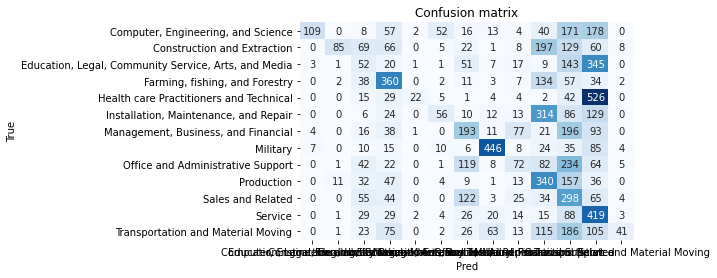

In [57]:
y_test = data_onet["dept"].values
classes = np.unique(y_test)
y_test_array = pd.get_dummies(y_test, drop_first=False).values

## Accuracy, Precision, Recall
accuracy = metrics.accuracy_score(y_test, predicted_onet)
auc = metrics.roc_auc_score(y_test, predicted_prob_onet, 
                            multi_class="ovr")
print("Accuracy:",  round(accuracy,2))
print("Auc:", round(auc,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted_onet))
    
## Plot confusion matrix
cm = metrics.confusion_matrix(y_test, predicted_onet)
fig, ax = plt.subplots()
sns.heatmap(cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, 
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=classes, 
       yticklabels=classes, title="Confusion matrix")
plt.yticks(rotation=0)


Test on LeadBook Dataset

In [75]:
pd_pred=predicted_onet[:20]
pd_pred = pd.DataFrame(pd_pred)
pd_job = dtf['job_clean'][:20].to_list()
pd_job = pd.DataFrame(pd_job)
result = pd.concat([pd_job,pd_pred], axis=1)
result.columns=["job title", "dept prediction"]
result

,job title,dept prediction
0,art,"Management, Business, and Financial"
1,interior architect,Office and Administrative Support
2,supervisor call centre,"Management, Business, and Financial"
3,tv host,"Education, Legal, Community Service, Arts, and..."
4,senior fuel trader,Sales and Related
5,director global operation program management o...,Sales and Related
6,operation executive,Sales and Related
7,executive assistant manager sale marketing ser...,"Management, Business, and Financial"
8,professional tennis coach,"Management, Business, and Financial"
9,business,Sales and Related
